# Fine-tuning of ChemBERTa-2 on balanced dataset


## Environment setup

In [2]:

!pip install --pre deepchem
import deepchem
deepchem.__version__

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 28.4 MB/s eta 0:00:00


Instructions for updating:
experimental_relax_shapes is deprecated, use reduce_retracing instead


'2.7.2.dev'

In [3]:
!pip install transformers
!pip install simpletransformers
!pip install wandb
!cd ..

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.5/315.5 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 21.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 42.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.9/264.9 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 7

We're going to clone an auxillary repository, bert-loves-chemistry, which will enable us to use the MolNet dataloader for ChemBERTa, which automatically generates scaffold splits on any MoleculeNet dataset!

## Imports and parameters setting

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
from typing import List
 
from transformers import AutoModelForMaskedLM, AutoTokenizer, pipeline, RobertaModel, RobertaTokenizer
from simpletransformers.classification import ClassificationModel, ClassificationArgs
 

2024-04-03 12:53:01.889550: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-03 12:53:01.892873: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-03 12:53:01.929082: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-03 12:53:02.537783: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
No normalization for SPS. Feature removed!
No normalization for AvgIpc. Feature removed!


Instructions for updating:
experimental_relax_shapes is deprecated, use reduce_retracing instead


Skipped loading modules with pytorch-geometric dependency, missing a dependency. No module named 'pydantic'
Skipped loading some Jax models, missing a dependency. No module named 'jax'


/home/parsa/smiles_classification/bert-loves-chemistry


In [3]:
# set the logging directories
project_name = "ChemBERTA_ict"
output_path = '/home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output' 
model_name = 'model_balanced_v3_dataset_facebook'

model_folder = os.path.join(output_path, model_name)

evaluation_folder = os.path.join(output_path, model_name + '_evaluation')
if not os.path.exists(evaluation_folder):
    os.makedirs(evaluation_folder)

# set the parameters
EPOCHS = 200
BATCH_SIZE = 100
patience = 30
optimizer = "AdamW"
learning_rate = 0.00001
manual_seed = 112
print(model_folder)

/home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_facebook


## Dataset Loading & Splitting

In [4]:
def plot_classes_distribution(dataframes, class_column, colors, figure_title=None,  plot_titles=None, figsize=(15, 6), equal_y_scale=False, fig_output_path=None):
    """
    Function plotting classes distribution in dataframe(s).

    Args:
        dataframes (list of dataframes): list of dataframes to plot the classes distribution
        class_column (str): column in dataframes identifying the class
        figure title (str): optional
        plot_titles (list of str): optional
        colors (list of str): colors of the bars in each plot
        figsize (tuple of int): figure width and height
        equal_y_scale (bool): whether the plots, should have equal y scale
        fig_output_path (str): optional
    """

    subplots_number = len(dataframes)
    dataframes_value_counts = []


    plt.rcParams.update({'font.size': 16})
    fig, axs = plt.subplots(1,subplots_number, figsize=figsize)

    if figure_title:
        fig.suptitle(figure_title, fontsize=22, y = 1, x = 0.52)

    for i, df in enumerate(dataframes):
        df_value_counts = df[class_column].value_counts().sort_index()

        if len(dataframes) == 1:
            axs.bar(df_value_counts.index, df_value_counts, color=colors[0], alpha=0.7)

            if plot_titles:
                axs.set_title(plot_titles)

        else:
            axs[i].bar(df_value_counts.index, df_value_counts, color=colors[i], alpha=0.7)

            if plot_titles:
                axs[i].set_title(plot_titles[i])

        dataframes_value_counts.append(df_value_counts)

    fig.tight_layout(pad=2.0)

    if equal_y_scale:
        y_min_plots = []
        y_max_plots = []

        for i, ax in enumerate(axs):
            y_min, y_max = axs[i].get_ylim()
            y_min_plots.append(y_min)
            y_max_plots.append(y_max)

        for i, ax in enumerate(axs):
            axs[i].set_ylim(min(y_min_plots), max(y_max_plots))

    if fig_output_path:
        plt.savefig(fig_output_path, dpi=100, pad_inches=1, facecolor="white")

    plt.show()

    return dataframes_value_counts

In [5]:
import pandas as pd

In [6]:
data = pd.read_csv('../Data_v3.csv').rename({'Unnamed: 1':'labels','SMILE':'text'},axis=1)
data.head()

,text,labels
0,C=CC(=O)NC(=O)NC1(CC2CC3CC(C2)C1)C3,0
1,CC=1C=CC(=CC1)C(=O)C=2OC=CC2NC(=O)C=C,0
2,CN(C)C1=NC(Cl)=C(CNC(=O)C=C)S1,0
3,C=CC(=O)N1CN(CC=2C=CC=CC2)C(=O)C1,0
4,C=CC(=O)NCC(=O)N1CCC=2C=CC=CC2C1,0


<Axes: >

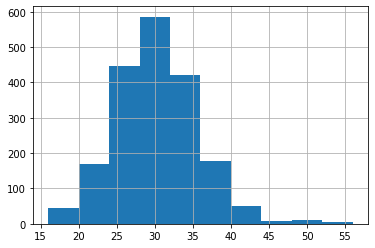

In [11]:
data.text.str.len().hist()

In [12]:
data.text.str.len().max()

56

In [13]:
pos = data[data['labels']==1]
neg = data[data['labels']==0]

<Axes: >

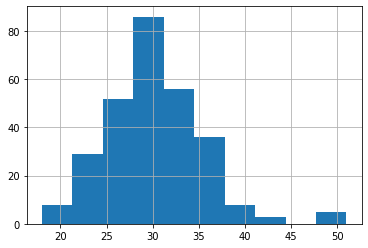

In [14]:
pos.text.str.len().hist()

<Axes: >

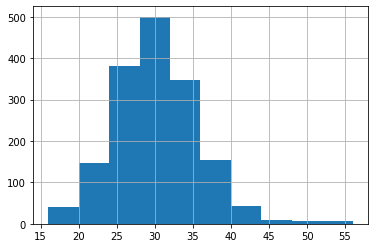

In [15]:
neg.text.str.len().hist()

In [16]:
pos.head()

,text,labels
1636,FC1(F)C2CC3CC1CC(C3)(C2)NC(=O)C=C,1
1637,C=CC(=O)NC=1C=CC=C(C1)C(=O)N2CCC=3C=CC=CC23,1
1638,CC(C)N1N=C(C)C(NC(=O)C=C)=C1C,1
1639,CC1=NC(=NO1)C2CC3CCC(C2)N3C(=O)C=C,1
1640,C=CC(=O)NC=1C=CC=C(C1)N2CCOCC2=O,1


In [17]:
shuffled_pos = pos.sample(frac=1)
print(pos.shape)
shuffled_pos.head()

(283, 2)


,text,labels
1649,CC=1C=CC=C2C(CCCOC12)N(C3CC3)C(=O)C=C,1
1724,CC1(CCN(CC1)C(=O)C=C)N2CCOCC2,1
1793,CC1C(CC(=O)N1CC=2C=CC=CC2)NC(=O)C=C,1
1640,C=CC(=O)NC=1C=CC=C(C1)N2CCOCC2=O,1
1859,CS(=O)(=O)NCC1COCCN1C(=O)C=C,1


In [18]:
pos_test = shuffled_pos[:28]
pos_val = shuffled_pos[28:56]
pos_train = shuffled_pos[56:]
print(pos_test.shape,pos_val.shape,pos_train.shape)

(28, 2) (28, 2) (227, 2)


In [19]:
shuffled_neg = neg.sample(frac=1)
print(neg.shape)
neg_test = shuffled_neg[:28]
neg_val = shuffled_neg[28:56]
neg_train = shuffled_neg[56:283]
print(neg_test.shape,neg_val.shape,neg_train.shape)

(1636, 2)
(28, 2) (28, 2) (227, 2)


<Axes: >

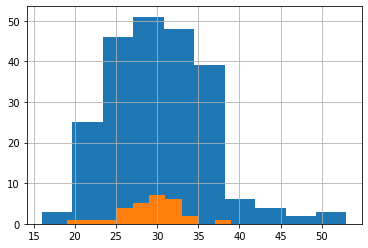

In [20]:
neg_train.text.str.len().hist()
neg_test.text.str.len().hist()

<Axes: >

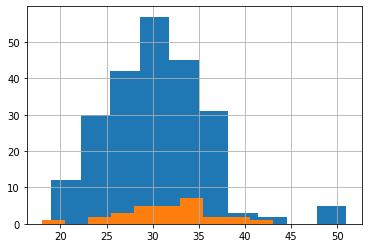

In [21]:
pos_train.text.str.len().hist()
pos_test.text.str.len().hist()

In [22]:
train_df = pd.concat([neg_train,pos_train],ignore_index=True)
test_df = pd.concat([neg_test,pos_test],ignore_index=True)
valid_df = pd.concat([neg_val,pos_val],ignore_index=True)
train_df = train_df.sample(frac=1)
test_df = test_df.sample(frac=1)
valid_df = valid_df.sample(frac=1)

In [23]:
print(f"The number of molecules in the train set {train_df.shape[0]}")
print(f"The number of molecules in the valid set {valid_df.shape[0]}")
print(f"The number of molecules in the test set {test_df.shape[0]}")
train_df.head()

The number of molecules in the train set 454
The number of molecules in the valid set 56
The number of molecules in the test set 56


,text,labels
54,C=CC(=O)N1CCN(CC1)C2CCNC(=O)CC2,0
407,FC(F)(F)C1CCN(CC21CCOCC2)C(=O)C=C,1
90,CC1CC2(CN1C(=O)C=C)CCOCC2,0
345,C=CC(=O)N1CCCN(CC1)C(=O)C2CCCO2,1
186,COC=1C=CC(=CN1)[C@@H]2OCC[C@H]2NC(=O)C=C |&1:8...,0


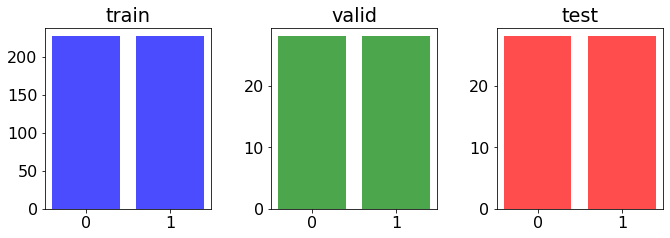

In [24]:
value_counts = plot_classes_distribution(dataframes=[train_df, valid_df, test_df], class_column='labels', colors=['blue', 'green', 'red'], figure_title=None,  plot_titles=['train', 'valid', 'test'], figsize=(10, 4), equal_y_scale=False, fig_output_path=None)

## Fine-tuning

In [7]:
import logging
logging.basicConfig(level=logging.INFO)
transformers_logger = logging.getLogger("transformers")
transformers_logger.setLevel(logging.WARNING)

In [21]:
# log in to Weights & Biases for experiment tracking
!wandb login

wandb: Currently logged in as: mparsa (mypersonalteam). Use `wandb login --relogin` to force relogin


In [25]:
# configure Weights & Biases logging
wandb_kwargs = {'name' : model_name+'2'}

# configure training
classification_args = {'evaluate_each_epoch': True,
                       'evaluate_during_training_verbose': False,
                       'evaluate_during_training' : True,
                       'best_model_dir' : model_folder,
                       'no_save': False,
                       'save_eval_checkpoints': False,
                       'save_model_every_epoch': False,
                       'save_best_model' : True,
                       'save_steps': -1,
                       'num_train_epochs': EPOCHS,
                       'use_early_stopping': True,
                       'early_stopping_patience': patience,
                       'early_stopping_delta': 0.0001,
                       'early_stopping_metrics': 'eval_loss',
                       'early_stopping_metrics_minimize': True,
                       'early_stopping_consider_epochs' : True,
                       'fp16' : False,
                       'optimizer' : optimizer,
                    #    'adam_betas' : (0.95, 0.999),
                     #   'learning_rate' : 5e-5,
                       'manual_seed': manual_seed,
                       'train_batch_size' : BATCH_SIZE,
                       'eval_batch_size' : BATCH_SIZE,
                       'logging_steps' : 1, #len(train_df) / BATCH_SIZE,
                       'auto_weights': True, # change to true
                       'wandb_project': project_name,
                       'overwrite_output_dir':True,
                       "use_multiprocessing": False,
                        'use_multiprocessing_for_evaluation': False,
                        'multiprocessing_chunksize':1,
                       'wandb_kwargs': wandb_kwargs}
import os, wandb
os.environ["TOKENIZERS_PARALLELISM"] = "false"
# sweep_config = {
#     "name": "vanilla-sweep-batch-16",
#     "method": "bayes",
#     "metric": {"name": "precision", "goal": "maximize"},
#     "parameters": {
#         "num_train_epochs": {"min": 1, "max": 40},
#         "learning_rate": {"min": 0.0, "max": 5e-5},
#     },
#     "early_terminate": {"type": "hyperband", "min_iter": 6,},
# }
# sweep_id = wandb.sweep(sweep_config, project="RTE - Hyperparameter Optimization")
model = ClassificationModel('xlmroberta', 'FacebookAI/xlm-roberta-large', args=classification_args, cuda_device=1, use_cuda=True
                            # ,sweep_config=wandb.config,
                            )

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at FacebookAI/xlm-roberta-large and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/home/parsa/conda/envs/p2/lib/python3.10/site-packages/simpletransformers/classification/classification_model.py:484: UserWarning: use_multiprocessing automatically disabled as xlmroberta fails when using multiprocessing for feature conversion.
  warnings.warn(


In [26]:
print(model.tokenizer)

XLMRobertaTokenizerFast(name_or_path='FacebookAI/xlm-roberta-large', vocab_size=250002, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<s>', 'eos_token': '</s>', 'unk_token': '<unk>', 'sep_token': '</s>', 'pad_token': '<pad>', 'cls_token': '<s>', 'mask_token': '<mask>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	3: AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	250001: AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=False, special=True),
}


In [69]:
# Train the model
from sklearn.metrics import precision_score
def train():
    # Initialize a new wandb run
    wandb.init()
    model = ClassificationModel('roberta', 'DeepChem/ChemBERTa-77M-MLM', args=classification_args, cuda_device=1,sweep_config=wandb.config,)
    model.train_model(train_df, eval_df=valid_df, output_dir=model_folder,
                                precision=lambda truth, predictions: precision_score(
                truth, [round(p) for p in predictions]
            ),)
    wandb.join()
wandb.agent(sweep_id, train)

wandb: Agent Starting Run: hedcc5wn with config:
wandb: 	learning_rate: 1.199957961134655e-05
wandb: 	num_train_epochs: 23


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/23 [00:00<?, ?it/s]

Running Epoch 1 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932759284973145}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142857, 'auprc': 0.5929886142523639, 'precision': 0.5625, 'eval_loss': 0.6932386159896851}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.693214476108551}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5172413793103449, 'eval_loss': 0.6931377649307251}


Running Epoch 5 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5947061757280672, 'precision': 0.5172413793103449, 'eval_loss': 0.6930788159370422}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857142, 'auprc': 0.5950274538894313, 'precision': 0.5172413793103449, 'eval_loss': 0.6930307745933533}


Running Epoch 7 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5997549902363567, 'precision': 0.5357142857142857, 'eval_loss': 0.692910373210907}


Running Epoch 8 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5996102508565031, 'precision': 0.5357142857142857, 'eval_loss': 0.6928058862686157}


Running Epoch 9 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5986979379749768, 'precision': 0.5357142857142857, 'eval_loss': 0.692730724811554}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6012498355876648, 'precision': 0.5357142857142857, 'eval_loss': 0.6926633715629578}


Running Epoch 11 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6000980662495355, 'precision': 0.5357142857142857, 'eval_loss': 0.6925821900367737}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925217509269714}


Running Epoch 13 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.692485511302948}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6924396753311157}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5357142857142857, 'eval_loss': 0.6924067139625549}


Running Epoch 16 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5959042856035985, 'precision': 0.5357142857142857, 'eval_loss': 0.6923721432685852}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5357142857142857, 'eval_loss': 0.6923362612724304}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5357142857142857, 'eval_loss': 0.6923052668571472}


Running Epoch 19 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5948318234107014, 'precision': 0.5185185185185185, 'eval_loss': 0.6922762989997864}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5948109921398701, 'precision': 0.5185185185185185, 'eval_loss': 0.692255437374115}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5943760104548884, 'precision': 0.5357142857142857, 'eval_loss': 0.692238450050354}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5943760104548884, 'precision': 0.5357142857142857, 'eval_loss': 0.6922305226325989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5947908105212565, 'precision': 0.5185185185185185, 'eval_loss': 0.692225456237793}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_ou

Training loss,▇▆▅█▆▅▇▆▇▅▅▅▅▅▅▆▅▅▄▄▆▄▅▁▇▅▄▃▂▆▆▃▅▆▅▃▅▅▅▃
accuracy,▆█▆▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▁▁▃▃▁
auprc,▁▂▄▅▃▄▇▇▆█▇▇▆▆▄▄▅▄▄▄▃▃▄
auroc,█▇▆▅▁▂▇█▆█▆▅▄▃▃▄▅▃▃▃▂▂▃
eval_loss,███▇▇▆▆▅▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,▇█▅▂▂▂▃▃▃▃▃▃▃▃▃▃▃▃▁▁▃▃▁
fn,▁▁▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆██▆▆█
fp,█▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▁▁▃▃▁


wandb: Agent Starting Run: 5oani47x with config:
wandb: 	learning_rate: 3.1292396287380174e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932681798934937}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5957026198951069, 'precision': 0.5517241379310345, 'eval_loss': 0.6932094693183899}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931411027908325}


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6929264068603516}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927496790885925}


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5975338210631753, 'precision': 0.5185185185185185, 'eval_loss': 0.6925891637802124}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6008604874316756, 'precision': 0.5384615384615384, 'eval_loss': 0.6921873688697815}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6033292578838516, 'precision': 0.5384615384615384, 'eval_loss': 0.6918076872825623}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6037251025393, 'precision': 0.56, 'eval_loss': 0.6915014982223511}


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6102700578460477, 'precision': 0.56, 'eval_loss': 0.6912077069282532}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.6908465623855591}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6157473966728584, 'precision': 0.56, 'eval_loss': 0.6905277967453003}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6239249063902399, 'precision': 0.56, 'eval_loss': 0.6902874708175659}


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6259748388160931, 'precision': 0.56, 'eval_loss': 0.6900021433830261}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795917, 'auprc': 0.632787420011564, 'precision': 0.5769230769230769, 'eval_loss': 0.6897475123405457}


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6894726157188416}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6891871690750122}


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.634401576839033, 'precision': 0.5769230769230769, 'eval_loss': 0.6889033317565918}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6885876655578613}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5517241379310345, 'eval_loss': 0.6883143782615662}


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6880207657814026}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6528317110481117, 'precision': 0.5, 'eval_loss': 0.6877646446228027}


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6439031396195403, 'precision': 0.5, 'eval_loss': 0.687452495098114}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6353647680619039, 'precision': 0.5, 'eval_loss': 0.6872142553329468}


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.48484848484848486, 'eval_loss': 0.686992347240448}


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6867033243179321}


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6864351034164429}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6424505135178205, 'precision': 0.48484848484848486, 'eval_loss': 0.6862021684646606}


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6421244455104003, 'precision': 0.48484848484848486, 'eval_loss': 0.6859894394874573}


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6492250306363495, 'precision': 0.48484848484848486, 'eval_loss': 0.6857765913009644}


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.649660570706036, 'precision': 0.48484848484848486, 'eval_loss': 0.6855989098548889}


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6507192945908468, 'precision': 0.48484848484848486, 'eval_loss': 0.6854785084724426}


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6510590086402382, 'precision': 0.48484848484848486, 'eval_loss': 0.6853541135787964}


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6546845497657794, 'precision': 0.48484848484848486, 'eval_loss': 0.6852378249168396}


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6580892531704827, 'precision': 0.48484848484848486, 'eval_loss': 0.6851380467414856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585041160853456, 'precision': 0.48484848484848486, 'eval_loss': 0.6850839257240295}


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585041160853456, 'precision': 0.48484848484848486, 'eval_loss': 0.685032069683075}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6850025057792664}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6849884986877441}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▇▆▇▆▆▆▆▆▅▇▆▇▅▅▆▄▆▄▄▅▄▃▁▃▅▄▃▂▄▃▂▄▃▂▂▃▂
accuracy,▇▇▅▅▄▄▅▅▇▇▇▇▇▇█████▇▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▂▂▂▂▃▄▄▄▅▅▆▅▅▅▆▆▇▆▆▆▆▆▆▆▇▇▇▇▇█████
auroc,▂▂▁▁▁▁▂▃▃▃▃▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██████
eval_loss,█████▇▇▇▇▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▂▂▃▃▃▃▃▃▅▅▅▅▆▆▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆██████████▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▂▃▆▇▇▇███████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▅▄▄▅▅▇▇▇▇▇▇█████▇▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: any5j5gm with config:
wandb: 	learning_rate: 1.153151343493772e-05
wandb: 	num_train_epochs: 26


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/26 [00:00<?, ?it/s]

Running Epoch 1 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693280041217804}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932528614997864}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6932291388511658}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5333333333333333, 'eval_loss': 0.693152904510498}


Running Epoch 5 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5958129505099332, 'precision': 0.5172413793103449, 'eval_loss': 0.6930941939353943}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5952818107483835, 'precision': 0.5172413793103449, 'eval_loss': 0.6930460929870605}


Running Epoch 7 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5981401515017921, 'precision': 0.5357142857142857, 'eval_loss': 0.6929248571395874}


Running Epoch 8 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5997507418355035, 'precision': 0.5357142857142857, 'eval_loss': 0.6928184628486633}


Running Epoch 9 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5990219064593227, 'precision': 0.5357142857142857, 'eval_loss': 0.6927412748336792}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6014113890100878, 'precision': 0.5357142857142857, 'eval_loss': 0.6926713585853577}


Running Epoch 11 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925854682922363}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925209760665894}


Running Epoch 13 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924815773963928}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924304366111755}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923924088478088}


Running Epoch 16 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5954905225373965, 'precision': 0.5357142857142857, 'eval_loss': 0.6923513412475586}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5357142857142857, 'eval_loss': 0.6923068761825562}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5357142857142857, 'eval_loss': 0.6922659277915955}


Running Epoch 19 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5948109921398701, 'precision': 0.5185185185185185, 'eval_loss': 0.6922248601913452}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5952093437882218, 'precision': 0.5185185185185185, 'eval_loss': 0.6921921968460083}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5959882522639111, 'precision': 0.5185185185185185, 'eval_loss': 0.6921614408493042}


Running Epoch 22 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5966475929232518, 'precision': 0.5185185185185185, 'eval_loss': 0.6921419501304626}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5973082345383883, 'precision': 0.5185185185185185, 'eval_loss': 0.6921201944351196}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989858520054794, 'precision': 0.5185185185185185, 'eval_loss': 0.692108690738678}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989858520054794, 'precision': 0.5185185185185185, 'eval_loss': 0.6921033263206482}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.599401134397506, 'precision': 0.5185185185185185, 'eval_loss': 0.6920986771583557}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▆▅█▅▇▄▇▅▆▅▆▄▆▅▅▅▄▆▄▂▇▅▅▃▃▆▄▅█▅▄▅▆▄▃▃▄▁▄
accuracy,▆█▆▃▁▁▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁
auprc,▁▁▂▆▄▄▆▇▆█▇▇▆▆▆▄▅▄▄▄▄▅▅▆▆▇
auroc,▆▅▄▆▂▁▄▇▆▆▅▃▃▃▂▂▃▂▁▁▃▄▆▇▇█
eval_loss,███▇▇▇▆▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,▇█▅▄▂▂▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁
fn,▁▁▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆████████
fp,█▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▃▁▁▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 2a4njnea with config:
wandb: 	learning_rate: 6.736032784657198e-06
wandb: 	num_train_epochs: 26


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/26 [00:00<?, ?it/s]

Running Epoch 1 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932839751243591}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932682394981384}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061225, 'auprc': 0.5908476772323946, 'precision': 0.5625, 'eval_loss': 0.6932543516159058}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6011422150880227, 'precision': 0.5333333333333333, 'eval_loss': 0.6932096481323242}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5333333333333333, 'eval_loss': 0.6931754350662231}


Running Epoch 6 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6931482553482056}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6930789351463318}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.6930188536643982}


Running Epoch 9 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5999711561860513, 'precision': 0.5172413793103449, 'eval_loss': 0.6929764747619629}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6000301178094062, 'precision': 0.5172413793103449, 'eval_loss': 0.692937970161438}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5998316103903436, 'precision': 0.5172413793103449, 'eval_loss': 0.6928908228874207}


Running Epoch 12 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6002967290557626, 'precision': 0.5172413793103449, 'eval_loss': 0.6928562521934509}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6004365370889939, 'precision': 0.5357142857142857, 'eval_loss': 0.692836344242096}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6928094625473022}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265307, 'auprc': 0.6004593586155489, 'precision': 0.5357142857142857, 'eval_loss': 0.6927903294563293}


Running Epoch 16 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306122, 'auprc': 0.6034072044205374, 'precision': 0.5357142857142857, 'eval_loss': 0.6927692294120789}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927458643913269}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927248239517212}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6927035450935364}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6926862597465515}


Running Epoch 21 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.602818860023357, 'precision': 0.5357142857142857, 'eval_loss': 0.6926703453063965}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.602818860023357, 'precision': 0.5357142857142857, 'eval_loss': 0.6926604509353638}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6031822801370084, 'precision': 0.5357142857142857, 'eval_loss': 0.6926490068435669}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028583116526627, 'precision': 0.5357142857142857, 'eval_loss': 0.6926433444023132}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028583116526627, 'precision': 0.5357142857142857, 'eval_loss': 0.6926407814025879}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028583116526627, 'precision': 0.5357142857142857, 'eval_loss': 0.6926384568214417}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▄█▄▇▃▇▅▅▅▅▃▆▅▅▄▄▆▄▁█▆▅▃▂▆▄▅█▅▄▅▆▄▃▃▄▁▄
accuracy,▆▆█▃▃▃▃▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃
auprc,▁▂▁▇▃▆▆▇▆▆▆▆▆█▆█████▇▇████
auroc,▅▅▂▆▃▅▅▅▁▂▂▃▄▆▆▇██▇▇▆▆▇▆▆▆
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,▇▇█▃▃▃▃▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▁▆▆▆▆███████████████████
fp,██▅▅▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆█▃▃▃▃▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: uyrvuw8i with config:
wandb: 	learning_rate: 2.5064190335187752e-06
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932876706123352}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932817697525024}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932767033576965}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932597756385803}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932470202445984}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932369470596313}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061225, 'auprc': 0.5908476772323946, 'precision': 0.5625, 'eval_loss': 0.693211019039154}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6931889653205872}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5963745907950224, 'precision': 0.5483870967741935, 'eval_loss': 0.6931734681129456}


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.597885798885178, 'precision': 0.5333333333333333, 'eval_loss': 0.6931594610214233}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.6931419372558594}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6026296981931529, 'precision': 0.5333333333333333, 'eval_loss': 0.6931293606758118}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6059946344281928, 'precision': 0.5333333333333333, 'eval_loss': 0.6931223273277283}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6085920370255954, 'precision': 0.5333333333333333, 'eval_loss': 0.6931125521659851}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6060547677472548, 'precision': 0.5517241379310345, 'eval_loss': 0.6931056380271912}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6084898326823196, 'precision': 0.5517241379310345, 'eval_loss': 0.693097710609436}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6092388956494277, 'precision': 0.5517241379310345, 'eval_loss': 0.6930890083312988}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930809617042542}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930723786354065}


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930654644966125}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930586099624634}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930543184280396}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930490136146545}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930457949638367}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.693044126033783}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930415034294128}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930400729179382}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930397152900696}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▄▆▄▃▇█▆▅▇▃▆▇▅▅▅▇▅▁▇▅▃▃▇▅▆▇▆▅▇█▃█▄▁▅▇▆▅
accuracy,▄▄▄▄▄▄██▄▁▁▁▁▁▄▄▄▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▂▁▁▁▁▂▃▄▅▅▆▇▆▇███▆█▆▆▆▆▆▆▆
auroc,▄▄▅▃▃▁▁▂▄▅▇▆▆▇▅▆▇██▇█▇▇▇▇▇▇▇
eval_loss,███▇▇▇▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,▇▇▇▇▇▇██▅▁▁▁▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▅███████████████████
fp,██████▅▅▅▅▅▅▅▅▁▁▁▅▅▅▅▅▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▅▅▅▅██▄▁▁▁▁▁▄▄▄▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: n4m6qnma with config:
wandb: 	learning_rate: 3.086570851819537e-06
wandb: 	num_train_epochs: 25


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

Running Epoch 1 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932863593101501}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693276584148407}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693270206451416}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932502388954163}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061225, 'auprc': 0.5908476772323946, 'precision': 0.5454545454545454, 'eval_loss': 0.6932350397109985}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6932231783866882}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5963745907950224, 'precision': 0.5483870967741935, 'eval_loss': 0.6931928992271423}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.597885798885178, 'precision': 0.5333333333333333, 'eval_loss': 0.6931666731834412}


Running Epoch 9 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6032026546484622, 'precision': 0.5333333333333333, 'eval_loss': 0.6931487321853638}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6054196885407469, 'precision': 0.5333333333333333, 'eval_loss': 0.6931325197219849}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.603457365149852, 'precision': 0.5517241379310345, 'eval_loss': 0.6931125521659851}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.6039943281868152, 'precision': 0.5517241379310345, 'eval_loss': 0.6930984854698181}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5992637517457123, 'precision': 0.5517241379310345, 'eval_loss': 0.6930906176567078}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930798888206482}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930722594261169}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.693064272403717}


Running Epoch 17 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930552124977112}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930472254753113}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5333333333333333, 'eval_loss': 0.693039059638977}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5333333333333333, 'eval_loss': 0.6930327415466309}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5333333333333333, 'eval_loss': 0.6930269598960876}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6034413885588172, 'precision': 0.5333333333333333, 'eval_loss': 0.6930238604545593}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6034413885588172, 'precision': 0.5333333333333333, 'eval_loss': 0.6930202841758728}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6034413885588172, 'precision': 0.5333333333333333, 'eval_loss': 0.6930187940597534}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6034413885588172, 'precision': 0.5333333333333333, 'eval_loss': 0.69301837682724}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▆▅▄▇▃▆▂▅▄▅▄▄▃▅▆▅▄▄▄▆▄▁▇▆▅▃▂▆▄▅█▆▄▆▆▆▂▆▃▁
accuracy,▄▄▄▄▄█▄▁▁▁▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▂▄▄▇█▇▇▅█████▇▇▇▇▇▇▇
auroc,▅▆▃▃▁▂▅▆█▆▅▅▅█████▇▇▇▆▆▆▆
eval_loss,███▇▇▆▆▅▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,▇▇▇▇▇█▅▁▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▅██████████████████
fp,█████▅▅▅▅▅▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▅▅▅█▄▁▁▁▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: mfn8nftp with config:
wandb: 	learning_rate: 3.244941258842838e-07
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.693289577960968}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932889819145203}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932882070541382}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932860016822815}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932842135429382}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932829022407532}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932793855667114}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932763457298279}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932740807533264}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932722330093384}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932695508003235}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693267822265625}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932668089866638}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932652592658997}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932641863822937}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932631134986877}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 16
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932616829872131}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 17
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932601928710938}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 18
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932585835456848}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 19
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932573318481445}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 20
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932558417320251}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 21
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932551264762878}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 22
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932536363601685}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 23
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932528614997864}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 24
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932522058486938}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 25
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932511925697327}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 26
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932503581047058}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 27
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932500004768372}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 28
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932495832443237}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 29
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932488679885864}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 30
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932485699653625}
INFO:simpletransformers.classification.classification_model: Patience of 30 steps reached
INFO:simpletransformers.classification.classification_model: Training terminated.
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▆▄▇▅▆▂▆▄▄▅▂▆▅▄▄▆▄▁▆▄▃▃▆▄█▅▄▆▆▂▆▄▄▄▅▄▄▅▄▅
accuracy,▁▁█████████████████████████████
auprc,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁██████▆▆▆▆▆
auroc,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁██████▁▁▁▁▁
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁
f1_score,▁▁█████████████████████████████
fn,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fp,██▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▁▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▁▁█████████████████████████████


wandb: Agent Starting Run: o687jat6 with config:
wandb: 	learning_rate: 1.7531729047885082e-06
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932886242866516}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693285346031189}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693281352519989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932691931724548}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932600736618042}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932525038719177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693233072757721}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932162046432495}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932042837142944}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6931931376457214}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5955393373388013, 'precision': 0.5625, 'eval_loss': 0.6931790709495544}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931686997413635}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5963745907950224, 'precision': 0.5483870967741935, 'eval_loss': 0.6931627988815308}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5974568418772735, 'precision': 0.5483870967741935, 'eval_loss': 0.6931543350219727}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6000503010496802, 'precision': 0.5333333333333333, 'eval_loss': 0.6931481957435608}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931408047676086}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931324601173401}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6085778350236426, 'precision': 0.5333333333333333, 'eval_loss': 0.6931242346763611}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.542091836734694, 'auprc': 0.6079657958531357, 'precision': 0.5333333333333333, 'eval_loss': 0.693115234375}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.6066297136347005, 'precision': 0.5333333333333333, 'eval_loss': 0.6931070685386658}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6090647785697656, 'precision': 0.5333333333333333, 'eval_loss': 0.6930989027023315}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6110271019606603, 'precision': 0.5333333333333333, 'eval_loss': 0.6930932998657227}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6104521560732145, 'precision': 0.5333333333333333, 'eval_loss': 0.6930851936340332}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6116739605844926, 'precision': 0.5333333333333333, 'eval_loss': 0.6930798292160034}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6092388956494277, 'precision': 0.5333333333333333, 'eval_loss': 0.6930761337280273}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6092388956494277, 'precision': 0.5333333333333333, 'eval_loss': 0.6930695176124573}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6128644367749688, 'precision': 0.5517241379310345, 'eval_loss': 0.6930643916130066}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930608153343201}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930575370788574}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930532455444336}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930506825447083}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.693049967288971}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.693048357963562}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930462121963501}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930448412895203}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930446028709412}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930437684059143}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930432319641113}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930427551269531}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930426955223083}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▅▆█▇▆▆▇▆▇▅▆▆▂▇▇▃▇▇▇▅▇▅█▅▅▇▆▅▅▂▁▆▆▄▆▇▅▂█
accuracy,▁▄▄▄▄▄▄▄▄███▄▄▁▁▁▁▁▁▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▁▂▁▁▁▁▁▁▃▂▃▃▄▆▆▇▆▆▇▇▇█▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▇
auroc,▄▄▄▅▃▃▃▁▁▂▄▃▄▅▅▇▇█▇▅▆▇▆▇▆▆█▇▇▇▇▇▆▆▆▆▆▆▆▆
eval_loss,███▇▇▇▆▆▆▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
f1_score,▅▇▇▇▇▇▇▇▇███▅▅▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁▁▁▁▅▅██████████████████████████
fp,█▆▆▆▆▆▆▆▆▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▃▃▃▃▃▃▃▃▃▃▃▃▃
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▁▅▅▅▅▅▅▅▅███▄▄▁▁▁▁▁▁▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: kwckumh3 with config:
wandb: 	learning_rate: 2.264496303196334e-06
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693288266658783}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932839751243591}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932788491249084}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932634711265564}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932514905929565}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.590729139033705, 'precision': 0.5454545454545454, 'eval_loss': 0.6932418942451477}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932173371315002}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6931957006454468}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931806206703186}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5963745907950224, 'precision': 0.5483870967741935, 'eval_loss': 0.6931667327880859}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5966326660530977, 'precision': 0.5483870967741935, 'eval_loss': 0.6931491494178772}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.6931365728378296}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6032026546484622, 'precision': 0.5333333333333333, 'eval_loss': 0.6931291818618774}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6085920370255954, 'precision': 0.5333333333333333, 'eval_loss': 0.693118691444397}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6085920370255954, 'precision': 0.5333333333333333, 'eval_loss': 0.6931113600730896}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6084898326823196, 'precision': 0.5333333333333333, 'eval_loss': 0.6931026577949524}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6116739605844926, 'precision': 0.5333333333333333, 'eval_loss': 0.6930924654006958}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6092388956494277, 'precision': 0.5517241379310345, 'eval_loss': 0.6930831074714661}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930723786354065}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930632591247559}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930540800094604}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.693047821521759}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.693038821220398}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930333375930786}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930295825004578}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930230259895325}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930182576179504}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930146813392639}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930118203163147}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930083632469177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6034413885588172, 'precision': 0.5333333333333333, 'eval_loss': 0.6930065155029297}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6034413885588172, 'precision': 0.5333333333333333, 'eval_loss': 0.6930059790611267}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6034413885588172, 'precision': 0.5333333333333333, 'eval_loss': 0.6930052638053894}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6034413885588172, 'precision': 0.5333333333333333, 'eval_loss': 0.6930041909217834}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6034413885588172, 'precision': 0.5333333333333333, 'eval_loss': 0.6930039525032043}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 16
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,▆▅▇▃▂▅▄▄▅▃▆▄▄▆▄▁▆▅▃▆▄█▆▄▆▄▆▃▁▄▄▄▄▄▂▅▅▇▆▃
accuracy,▄▄▄▄▄▄▄██▄▄▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▁▁▁▁▁▁▂▃▃▅▅▇▇▇█▇██████▇▇▇▇▇▇▅▅▅▅▅
auroc,▄▄▄▃▃▂▁▂▃▄▄▇▇▇▇▆█▇██████▇▇▆▆▆▆▅▅▅▅▅
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
f1_score,▇▇▇▇▇▇▇██▅▅▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁▅▅████████████████████████
fp,███████▅▅▅▅▅▅▅▅▅▅▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▅▅▅▅▅██▄▄▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 7xhuohmh with config:
wandb: 	learning_rate: 4.9549184450572894e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6025331867430157, 'precision': 0.5333333333333333, 'eval_loss': 0.6931180357933044}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: qee53s82 with config:
wandb: 	learning_rate: 3.670818015322617e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.6023791852850356, 'precision': 0.5517241379310345, 'eval_loss': 0.6931627988815308}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 7xx96uew with config:
wandb: 	learning_rate: 3.666564362637411e-05
wandb: 	num_train_epochs: 6


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/6 [00:00<?, ?it/s]

Running Epoch 1 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.6023791852850356, 'precision': 0.5517241379310345, 'eval_loss': 0.6931629180908203}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857144, 'auprc': 0.5940141121202239, 'precision': 0.5172413793103449, 'eval_loss': 0.6930205225944519}


Running Epoch 3 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.59748227089902, 'precision': 0.5357142857142857, 'eval_loss': 0.6929750442504883}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5977619504323758, 'precision': 0.5185185185185185, 'eval_loss': 0.6928461194038391}


Running Epoch 5 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5976851266713415, 'precision': 0.5185185185185185, 'eval_loss': 0.6927778124809265}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.598081952068167, 'precision': 0.5185185185185185, 'eval_loss': 0.6927610039710999}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▆▄█▄▄▆▁▅▆▄▃
accuracy,█▁▅▁▁▁
auprc,█▁▄▄▄▄
auroc,█▃▁▃▂▂
eval_loss,█▆▅▂▁▁
f1_score,█▃▅▁▁▁
fn,▁▅▅███
fp,▁█▁▁▁▁
global_step,▁▂▂▂▃▃▄▄▄▅▅▅▆▇▇▇██
lr,█▇▇▆▅▅▄▄▃▂▂▁
mcc,█▁▄▁▁▁


wandb: Agent Starting Run: w8a1b75b with config:
wandb: 	learning_rate: 3.518335783625473e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6003187457245961, 'precision': 0.5517241379310345, 'eval_loss': 0.693168044090271}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: l9qb0ijo with config:
wandb: 	learning_rate: 2.7567539349017612e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5666666666666667, 'eval_loss': 0.693194568157196}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 7qthnnld with config:
wandb: 	learning_rate: 2.5750547259976304e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17960530202677488, 'accuracy': 0.5892857142857143, 'f1_score': 0.6101694915254238, 'tp': 18, 'tn': 15, 'fp': 13, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5806451612903226, 'eval_loss': 0.6932007670402527}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: kh653iwu with config:
wandb: 	learning_rate: 2.2714362944275064e-05
wandb: 	num_train_epochs: 2


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

Running Epoch 1 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932114362716675}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6092486934585224, 'precision': 0.5517241379310345, 'eval_loss': 0.693150520324707}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▄▁█
accuracy,█▁
auprc,▁█
auroc,▁█
eval_loss,█▁
f1_score,█▁
fn,▁█
fp,█▁
global_step,▁▃▃▆██
lr,█▆▃▁
mcc,█▁


wandb: Agent Starting Run: mrj4mp3u with config:
wandb: 	learning_rate: 2.522764242052295e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17960530202677488, 'accuracy': 0.5892857142857143, 'f1_score': 0.6101694915254238, 'tp': 18, 'tn': 15, 'fp': 13, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5806451612903226, 'eval_loss': 0.6932028532028198}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: wtlrdqsj with config:
wandb: 	learning_rate: 2.5592803132339128e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17960530202677488, 'accuracy': 0.5892857142857143, 'f1_score': 0.6101694915254238, 'tp': 18, 'tn': 15, 'fp': 13, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5806451612903226, 'eval_loss': 0.69320148229599}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: tbdfa281 with config:
wandb: 	learning_rate: 2.5116198714289735e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17960530202677488, 'accuracy': 0.5892857142857143, 'f1_score': 0.6101694915254238, 'tp': 18, 'tn': 15, 'fp': 13, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5806451612903226, 'eval_loss': 0.6932030916213989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: z885rn6k with config:
wandb: 	learning_rate: 2.409631437918154e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932066679000854}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: g4ycc117 with config:
wandb: 	learning_rate: 1.4982556842774586e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932381391525269}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5395408163265307, 'auprc': 0.6036058181293155, 'precision': 0.5666666666666667, 'eval_loss': 0.6931811571121216}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5984633746825347, 'precision': 0.5172413793103449, 'eval_loss': 0.693165123462677}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5993344290314117, 'precision': 0.5172413793103449, 'eval_loss': 0.6931245923042297}


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5993344290314117, 'precision': 0.5172413793103449, 'eval_loss': 0.6931115984916687}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▆▁▅▇
accuracy,▆█▁▁▁
auprc,▁█▅▆▆
auroc,▄█▂▁▁
eval_loss,█▅▄▂▁
f1_score,██▁▁▁
fn,▁▃███
fp,█▁▅▅▅
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,▆█▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 3jwf2poa with config:
wandb: 	learning_rate: 3.589701538475527e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932486295700073}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931358575820923}


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.5980256631800982, 'precision': 0.5357142857142857, 'eval_loss': 0.6930669546127319}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5891576753890252, 'precision': 0.5185185185185185, 'eval_loss': 0.692840039730072}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5995456643812602, 'precision': 0.5384615384615384, 'eval_loss': 0.6926565170288086}


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5980492345675137, 'precision': 0.5384615384615384, 'eval_loss': 0.6924957633018494}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6008960979605524, 'precision': 0.5384615384615384, 'eval_loss': 0.6921220421791077}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6027120250638462, 'precision': 0.56, 'eval_loss': 0.6917898058891296}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5357142857142858, 'auprc': 0.5937906198763567, 'precision': 0.56, 'eval_loss': 0.6915420293807983}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6062269432429126, 'precision': 0.56, 'eval_loss': 0.6913267970085144}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6098178640298011, 'precision': 0.56, 'eval_loss': 0.6910907626152039}


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6149084177951669, 'precision': 0.56, 'eval_loss': 0.6909085512161255}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.614251603345249, 'precision': 0.56, 'eval_loss': 0.6907939910888672}


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6149084177951669, 'precision': 0.56, 'eval_loss': 0.6906833648681641}


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6144550419634789, 'precision': 0.56, 'eval_loss': 0.6906104683876038}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.624146739155176, 'precision': 0.56, 'eval_loss': 0.6905596852302551}


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.624146739155176, 'precision': 0.56, 'eval_loss': 0.6905356049537659}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_ba

Training loss,█▆▆█▆▆▇▄▆▇▅▅▅▅▅▄▄▅▄▅▄▄▃▆▃▄▁▆▄▃▃▃▁▅
accuracy,█▁▅▁▅▅▅██████████
auprc,▁▄▃▁▃▃▃▄▂▄▅▆▆▆▆██
auroc,▅▅▁▁▃▂▄▆▅▅▆█▇█▇██
eval_loss,███▇▆▆▅▄▄▃▂▂▂▁▁▁▁
f1_score,█▂▃▁▂▂▂▃▃▃▃▃▃▃▃▃▃
fn,▁▆▆██████████████
fp,█▆▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▄▁▄▄▄██████████


wandb: Agent Starting Run: 6plt8yjk with config:
wandb: 	learning_rate: 1.1524353303911257e-05
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932700276374817}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932199597358704}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5982924446842242, 'precision': 0.5517241379310345, 'eval_loss': 0.693200945854187}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5990789049855652, 'precision': 0.5172413793103449, 'eval_loss': 0.6931434273719788}


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5961917383887211, 'precision': 0.5172413793103449, 'eval_loss': 0.6931055188179016}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5989401883541683, 'precision': 0.5172413793103449, 'eval_loss': 0.6930816769599915}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5971160258641278, 'precision': 0.5172413793103449, 'eval_loss': 0.6930305361747742}


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5949060790603595, 'precision': 0.5172413793103449, 'eval_loss': 0.6930007934570312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5949060790603595, 'precision': 0.5172413793103449, 'eval_loss': 0.6929917335510254}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▇▁▅▇▄▄▄▄▅▂▄▆
accuracy,███▁▁▁▁▁▁
auprc,▁▃▇█▅█▆▃▃
auroc,█▇▆▆▃▃▃▁▁
eval_loss,█▇▆▅▄▃▂▁▁
f1_score,█▆▅▁▁▁▁▁▁
fn,▁▃▆██████
fp,█▅▁▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,███▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ux4uct9l with config:
wandb: 	learning_rate: 8.60858154982983e-06
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932750940322876}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932377219200134}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5950497781132328, 'precision': 0.5517241379310345, 'eval_loss': 0.6932231783866882}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931801438331604}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6931520104408264}


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5172413793103449, 'eval_loss': 0.6931343078613281}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5172413793103449, 'eval_loss': 0.6930967569351196}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6014637929836606, 'precision': 0.5172413793103449, 'eval_loss': 0.6930748224258423}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6008493536595438, 'precision': 0.5172413793103449, 'eval_loss': 0.6930683851242065}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▇▁▅▇▄▄▄▄▅▂▄▆
accuracy,▆█▆▆▃▁▁▁▁
auprc,▁▂▄▄▇▇▇██
auroc,▆▁▁▁█▆▆▆▃
eval_loss,█▇▆▅▄▃▂▁▁
f1_score,▇█▄▄▃▁▁▁▁
fn,▁▁▆▆▆████
fp,█▅▁▁▅▅▅▅▅
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,▆█▆▆▃▁▁▁▁


wandb: Agent Starting Run: wz3kd2e5 with config:
wandb: 	learning_rate: 1.0592287734027596e-05
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932716369628906}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142857, 'auprc': 0.5929886142523639, 'precision': 0.5483870967741935, 'eval_loss': 0.6932254433631897}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5960194905244776, 'precision': 0.5517241379310345, 'eval_loss': 0.6932057738304138}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5990789049855652, 'precision': 0.5172413793103449, 'eval_loss': 0.6931432485580444}


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5961917383887211, 'precision': 0.5172413793103449, 'eval_loss': 0.693096935749054}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.594169212691104, 'precision': 0.5172413793103449, 'eval_loss': 0.6930609941482544}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5949573623107276, 'precision': 0.5172413793103449, 'eval_loss': 0.692973256111145}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6004365370889939, 'precision': 0.5357142857142857, 'eval_loss': 0.6929005980491638}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5993543359158418, 'precision': 0.5357142857142857, 'eval_loss': 0.6928520202636719}


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.6928118467330933}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6015733618240773, 'precision': 0.5357142857142857, 'eval_loss': 0.6927666664123535}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6015890944375619, 'precision': 0.5357142857142857, 'eval_loss': 0.6927370429039001}


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6004836522606911, 'precision': 0.5357142857142857, 'eval_loss': 0.6927224397659302}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6008470723743427, 'precision': 0.5357142857142857, 'eval_loss': 0.6927069425582886}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6008470723743427, 'precision': 0.5357142857142857, 'eval_loss': 0.6926992535591125}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6008470723743427, 'precision': 0.5357142857142857, 'eval_loss': 0.6926954388618469}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▄█▆▄▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▄▆▄▅▁█▆▄▅▃
accuracy,███▁▁▁▁▅▅▅▅▅▅▅▅▅
auprc,▁▂▄▆▄▃▄▇▆███▇▇▇▇
auroc,▇▆▆▅▄▁▂▆▇██▇▆▇▇▇
eval_loss,█▇▇▆▆▅▄▃▃▂▂▂▁▁▁▁
f1_score,█▆▅▁▁▁▁▂▂▂▂▂▂▂▂▂
fn,▁▃▆█████████████
fp,█▅▁▅▅▅▅▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,███▁▁▁▁▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: ffwiophz with config:
wandb: 	learning_rate: 2.1114203247918612e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932170987129211}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 52lnujrt with config:
wandb: 	learning_rate: 2.7059950910151517e-05
wandb: 	num_train_epochs: 12


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/12 [00:00<?, ?it/s]

Running Epoch 1 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932432055473328}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6036766138243453, 'precision': 0.5172413793103449, 'eval_loss': 0.6931259036064148}


Running Epoch 3 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5178571428571429, 'auprc': 0.5892191059197098, 'precision': 0.5357142857142857, 'eval_loss': 0.6930792927742004}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5996128154957426, 'precision': 0.5357142857142857, 'eval_loss': 0.6929289698600769}


Running Epoch 5 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857144, 'auprc': 0.5968788251852883, 'precision': 0.5185185185185185, 'eval_loss': 0.6928170323371887}


Running Epoch 6 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972237133892737, 'precision': 0.5185185185185185, 'eval_loss': 0.6927298903465271}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.6046886993836715, 'precision': 0.5185185185185185, 'eval_loss': 0.6925317049026489}


Running Epoch 8 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5974369880069232, 'precision': 0.5185185185185185, 'eval_loss': 0.6923757791519165}


Running Epoch 9 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5989562413126412, 'precision': 0.5185185185185185, 'eval_loss': 0.692278265953064}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5980851459648017, 'precision': 0.5185185185185185, 'eval_loss': 0.6922100186347961}


Running Epoch 11 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5985653380416325, 'precision': 0.5185185185185185, 'eval_loss': 0.6921535730361938}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5985653380416325, 'precision': 0.5185185185185185, 'eval_loss': 0.6921323537826538}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▄█▅▄▆▁▅▆▄▃▃▃▃▁▃▄▂▄▂▂▁▅
accuracy,█▁▅▅▁▁▁▁▁▁▁▁
auprc,▂█▁▆▄▅█▅▅▅▅▅
auroc,▇█▁▄▄▃▅▅▇▆▆▆
eval_loss,█▇▇▆▅▅▄▃▂▁▁▁
f1_score,█▂▃▃▁▁▁▁▁▁▁▁
fn,▁▆▆▆████████
fp,█▅▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▁▁
mcc,█▁▄▄▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: l7j7wp4l with config:
wandb: 	learning_rate: 1.2846522616454148e-05
wandb: 	num_train_epochs: 25


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

Running Epoch 1 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932750344276428}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932348608970642}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5977174987967782, 'precision': 0.5517241379310345, 'eval_loss': 0.693209171295166}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931263208389282}


Running Epoch 5 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5945816306227036, 'precision': 0.5172413793103449, 'eval_loss': 0.6930622458457947}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5967107408405754, 'precision': 0.5357142857142857, 'eval_loss': 0.6930094361305237}


Running Epoch 7 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5957771791662887, 'precision': 0.5357142857142857, 'eval_loss': 0.6928771734237671}


Running Epoch 8 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5986979379749768, 'precision': 0.5357142857142857, 'eval_loss': 0.6927606463432312}


Running Epoch 9 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6926758885383606}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925992369651794}


Running Epoch 11 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6925060153007507}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6924353837966919}


Running Epoch 13 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6923918724060059}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923364996910095}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5185185185185185, 'eval_loss': 0.6922951936721802}


Running Epoch 16 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5952257922062382, 'precision': 0.5185185185185185, 'eval_loss': 0.6922510266304016}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960394262466164, 'precision': 0.5185185185185185, 'eval_loss': 0.6922043561935425}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.597842656755437, 'precision': 0.5185185185185185, 'eval_loss': 0.6921619772911072}


Running Epoch 19 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921200752258301}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5185185185185185, 'eval_loss': 0.6920876502990723}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.598487165571109, 'precision': 0.5185185185185185, 'eval_loss': 0.6920580863952637}


Running Epoch 22 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.598487165571109, 'precision': 0.5185185185185185, 'eval_loss': 0.6920400261878967}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.598031352615296, 'precision': 0.5185185185185185, 'eval_loss': 0.6920212507247925}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6920127868652344}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6920102834701538}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▅▇▄▆▅▆▅▅▄▅▆▅▅▅▄▆▅▂▇▅▅▃▂▆▄▅█▆▄▅▅▆▃▆▃▁
accuracy,███▁▁▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▄▆▄▄▅▅▇█▇▇▆▄▅▄▄▅▆▆▇▇▇▆▇▇
auroc,▇▇▆▃▁▄▆▆▆▅▄▃▂▅▃▃▄▇▇█▇▇▇██
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▇▆▂▂▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▃▅▆▆▆▆▆▆▆▆▆█████████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,███▁▁▄▄▄▄▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 6i2sdke2 with config:
wandb: 	learning_rate: 4.193159337766169e-05
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932536959648132}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931551098823547}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5958944170271129, 'precision': 0.5185185185185185, 'eval_loss': 0.6930714845657349}


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5912812399079376, 'precision': 0.5384615384615384, 'eval_loss': 0.6927860975265503}


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5974570924963343, 'precision': 0.5384615384615384, 'eval_loss': 0.6925424337387085}


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5932187259932709, 'precision': 0.5384615384615384, 'eval_loss': 0.6923132538795471}


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5949516612159694, 'precision': 0.56, 'eval_loss': 0.6917642951011658}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.542091836734694, 'auprc': 0.6070027316981151, 'precision': 0.5833333333333334, 'eval_loss': 0.6912407279014587}


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6071841037146886, 'precision': 0.56, 'eval_loss': 0.690816342830658}


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6186989829457331, 'precision': 0.56, 'eval_loss': 0.6904124617576599}


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6899366974830627}


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6281347846250357, 'precision': 0.5769230769230769, 'eval_loss': 0.6895108222961426}


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6383969408899588, 'precision': 0.5769230769230769, 'eval_loss': 0.6891870498657227}


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6888329386711121}


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6354007077026959, 'precision': 0.5555555555555556, 'eval_loss': 0.688519299030304}


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.688201367855072}


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6381643131448727, 'precision': 0.5517241379310345, 'eval_loss': 0.6878949403762817}


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.68760746717453}


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5, 'eval_loss': 0.6872987747192383}


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6870487332344055}


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.5, 'eval_loss': 0.6867976784706116}


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6865947842597961}


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6863716244697571}


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6862223744392395}


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6861062049865723}


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530612, 'auprc': 0.6397428716654417, 'precision': 0.48484848484848486, 'eval_loss': 0.6859889626502991}


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6429932611227278, 'precision': 0.48484848484848486, 'eval_loss': 0.6859139204025269}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612245, 'auprc': 0.6435034652043605, 'precision': 0.48484848484848486, 'eval_loss': 0.6858831644058228}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▇▇▇▆▇▇▆▆▆▆▆▅▆▅▅▇▅▄▅▅▄▃▆▄▅▅▃▃▄▄▄▅▄▁▃▃▅▄
accuracy,▇▄▄▅▅▅▇█▇▇████▇▇▇▅▂▂▂▁▁▁▁▁▁▁
auprc,▁▂▂▁▂▁▁▃▃▄▅▅▆▆▆▆▆▇█▇▇▆▆▆▆▆▇▇
auroc,▃▃▁▁▁▂▂▃▃▃▄▅▆▆▆▆▆▇▇▇▇▇▇▇████
eval_loss,████▇▇▇▆▆▅▅▄▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▄▃▃▅▅▅▅▄▄▆▅▃▃▃▂▂▂▂▂▂▂
fn,▁▆████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▃▂▁▂▂▂▂▂▂▃▃▄▅▇▇▇███████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▅▇█▇▇████▇▇▇▅▂▂▂▁▁▁▁▁▁▁


wandb: Agent Starting Run: pul3vsa6 with config:
wandb: 	learning_rate: 4.203430815019943e-05
wandb: 	num_train_epochs: 12


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/12 [00:00<?, ?it/s]

Running Epoch 1 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.693217396736145}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5936909059146648, 'precision': 0.5172413793103449, 'eval_loss': 0.6930352449417114}


Running Epoch 3 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734695, 'auprc': 0.5950016124276769, 'precision': 0.5185185185185185, 'eval_loss': 0.6929618120193481}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5178571428571428, 'auprc': 0.5957881643908004, 'precision': 0.5384615384615384, 'eval_loss': 0.692722499370575}


Running Epoch 5 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5951906021569018, 'precision': 0.5384615384615384, 'eval_loss': 0.6925339698791504}


Running Epoch 6 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5935810200717913, 'precision': 0.5384615384615384, 'eval_loss': 0.6923779845237732}


Running Epoch 7 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.5943798395763209, 'precision': 0.5384615384615384, 'eval_loss': 0.6920375227928162}


Running Epoch 8 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5981068291186742, 'precision': 0.56, 'eval_loss': 0.6917616128921509}


Running Epoch 9 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5991979798646869, 'precision': 0.56, 'eval_loss': 0.6915825009346008}


Running Epoch 10 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6117200815744104, 'precision': 0.56, 'eval_loss': 0.6914552450180054}


Running Epoch 11 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6108817488086982, 'precision': 0.56, 'eval_loss': 0.6913527846336365}


Running Epoch 12 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6100978320031096, 'precision': 0.56, 'eval_loss': 0.6913126707077026}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_

Training loss,█▆▅█▅▅▆▂▅▆▄▄▃▃▄▂▃▄▂▄▂▂▁▅
accuracy,█▁▁▃▃▃▃▆▆▆▆▆
auprc,▁▂▂▃▂▂▂▃▄██▇
auroc,▆▃▃▁▂▄▅▇▇██▇
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂
fn,▁▆██████████
fp,██▆▃▃▃▃▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▁▁
mcc,█▁▁▃▃▃▃▆▆▆▆▆


wandb: Agent Starting Run: gjwt31q2 with config:
wandb: 	learning_rate: 3.233338136677961e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932526230812073}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931512951850891}


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.597983988033381, 'precision': 0.5357142857142857, 'eval_loss': 0.6930893063545227}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5959600973147332, 'precision': 0.5185185185185185, 'eval_loss': 0.692886233329773}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5953621405608817, 'precision': 0.5185185185185185, 'eval_loss': 0.6927241086959839}


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6021235196480464, 'precision': 0.5185185185185185, 'eval_loss': 0.692584216594696}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6047720520575259, 'precision': 0.5384615384615384, 'eval_loss': 0.6922560334205627}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6007539090860516, 'precision': 0.5384615384615384, 'eval_loss': 0.691966712474823}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5992247899801052, 'precision': 0.5384615384615384, 'eval_loss': 0.6917527914047241}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5971103139411491, 'precision': 0.5384615384615384, 'eval_loss': 0.6915678381919861}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5963843373912483, 'precision': 0.5384615384615384, 'eval_loss': 0.6913636922836304}


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6087246393656967, 'precision': 0.56, 'eval_loss': 0.6912084221839905}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6102534040994875, 'precision': 0.56, 'eval_loss': 0.6911126971244812}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6139210553705222, 'precision': 0.56, 'eval_loss': 0.6910184621810913}


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6134855153008358, 'precision': 0.56, 'eval_loss': 0.690957248210907}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6134855153008358, 'precision': 0.56, 'eval_loss': 0.6909142732620239}


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6134855153008358, 'precision': 0.56, 'eval_loss': 0.6908936500549316}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_

Training loss,█▆▅█▆▅▇▄▆▇▅▅▄▄▅▄▄▅▄▅▄▄▃▆▃▄▁▆▄▃▃▃▁▅
accuracy,█▁▅▁▁▁▅▅▅▅▅██████
auprc,▁▄▃▂▂▄▅▄▃▃▂▆▇████
auroc,▆▆▂▂▁▃▄▆▆▇▆▇█████
eval_loss,███▇▆▆▅▄▄▃▂▂▂▁▁▁▁
f1_score,█▂▃▁▁▁▂▂▂▂▂▃▃▃▃▃▃
fn,▁▆▆██████████████
fp,█▆▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▄▁▁▁▄▄▄▄▄██████


wandb: Agent Starting Run: k8ikb4a8 with config:
wandb: 	learning_rate: 3.4913611813204803e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932657361030579}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.5997834883627677, 'precision': 0.5517241379310345, 'eval_loss': 0.6932002305984497}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5889459599516556, 'precision': 0.5357142857142857, 'eval_loss': 0.6931241154670715}


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5896893573114148, 'precision': 0.5185185185185185, 'eval_loss': 0.6928835511207581}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5962332207002545, 'precision': 0.5185185185185185, 'eval_loss': 0.6926833391189575}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.6012771804864895, 'precision': 0.5384615384615384, 'eval_loss': 0.6924980282783508}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5999837778423053, 'precision': 0.5384615384615384, 'eval_loss': 0.6920372247695923}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.599482827009472, 'precision': 0.56, 'eval_loss': 0.691597044467926}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6084612986280749, 'precision': 0.56, 'eval_loss': 0.6912378072738647}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6094548662935606, 'precision': 0.56, 'eval_loss': 0.690890908241272}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6158537079860662, 'precision': 0.56, 'eval_loss': 0.6904663443565369}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6253490525027185, 'precision': 0.56, 'eval_loss': 0.6900845766067505}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6237777828627044, 'precision': 0.5769230769230769, 'eval_loss': 0.6897909045219421}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918366, 'auprc': 0.6347895629413047, 'precision': 0.5769230769230769, 'eval_loss': 0.6894487738609314}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6891385316848755}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.688806414604187}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5555555555555556, 'eval_loss': 0.6884661316871643}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6384712175158165, 'precision': 0.5333333333333333, 'eval_loss': 0.688127875328064}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6403887674815392, 'precision': 0.5333333333333333, 'eval_loss': 0.6877467036247253}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5765306122448979, 'auprc': 0.6545111918135909, 'precision': 0.5, 'eval_loss': 0.6874160170555115}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6468357532170996, 'precision': 0.5, 'eval_loss': 0.6870580911636353}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867387890815735}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6863459944725037}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530612, 'auprc': 0.6427813171380978, 'precision': 0.48484848484848486, 'eval_loss': 0.6860412955284119}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6469936320128842, 'precision': 0.48484848484848486, 'eval_loss': 0.6857512593269348}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6562731182076929, 'precision': 0.48484848484848486, 'eval_loss': 0.685374915599823}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6582500076448157, 'precision': 0.48484848484848486, 'eval_loss': 0.6850163340568542}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061226, 'auprc': 0.6597314333840916, 'precision': 0.48484848484848486, 'eval_loss': 0.6846994757652283}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6844059824943542}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6841162443161011}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6838687062263489}


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6635564996041158, 'precision': 0.48484848484848486, 'eval_loss': 0.6836963295936584}


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6058673469387755, 'auprc': 0.6662423351992945, 'precision': 0.48484848484848486, 'eval_loss': 0.6835174560546875}


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6690440549458153, 'precision': 0.48484848484848486, 'eval_loss': 0.683349072933197}


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6690440549458153, 'precision': 0.5, 'eval_loss': 0.6831980347633362}


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6703598444194996, 'precision': 0.5, 'eval_loss': 0.6831111311912537}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6830233931541443}


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6829652190208435}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6829251646995544}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.682910144329071}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▇█▇▇▆▇▆▆▆▅▅▄▅▅▄▆▅▆▄▅▄▅▄▃▃▃▂▃▂▁▄▂▂▃▃▂▃▃
accuracy,▇▇▅▄▄▅▅▇▇▇▇▇████▇▅▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂
auprc,▁▂▁▁▂▂▂▂▃▃▃▄▄▅▅▅▅▅▅▆▆▅▅▅▆▇▇▇▇▇▇▇▇███████
auroc,▂▂▁▁▁▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇███████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▃▅▅▅▅▄▅▅▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃
fn,▁▅▆█████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▅▅▇▇█████████████▇▇▇▇▇▇
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▅▅▇▇▇▇▇████▇▅▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂


wandb: Agent Starting Run: 5pmb0i8p with config:
wandb: 	learning_rate: 3.882750550286751e-07
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932891011238098}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932874321937561}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932868361473083}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932846903800964}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932834386825562}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932827830314636}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932810544967651}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932801008224487}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932797431945801}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▇▁▆▇▄▅▄▄▆▂▅▇
accuracy,▁████████
auprc,▁▁▁▁▁▁▁▁▁
auroc,▁▁▁▁▁▁▁▁▁
eval_loss,█▇▆▅▄▃▂▁▁
f1_score,▁████████
fn,▁▁▁▁▁▁▁▁▁
fp,█▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,▁████████


wandb: Agent Starting Run: m0bw4zug with config:
wandb: 	learning_rate: 2.47319547715182e-05
wandb: 	num_train_epochs: 7


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/7 [00:00<?, ?it/s]

Running Epoch 1 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932044625282288}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6036766138243453, 'precision': 0.5172413793103449, 'eval_loss': 0.6931065320968628}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5891633408600628, 'precision': 0.5357142857142857, 'eval_loss': 0.6930730938911438}


Running Epoch 4 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5923939259215798, 'precision': 0.5357142857142857, 'eval_loss': 0.6929737329483032}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5932970144297103, 'precision': 0.5357142857142857, 'eval_loss': 0.6929143667221069}


Running Epoch 6 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940400066620642, 'precision': 0.5357142857142857, 'eval_loss': 0.6928859353065491}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5945623286129577, 'precision': 0.5357142857142857, 'eval_loss': 0.6928455233573914}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▄▆▁▅▆▄▄▃▃
accuracy,█▁▃▃▃▃▃
auprc,▃█▁▃▃▃▄
auroc,██▁▃▃▄▄
eval_loss,█▆▅▄▂▂▁
f1_score,█▁▂▂▂▂▂
fn,▁██████
fp,██▁▁▁▁▁
global_step,▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁
mcc,█▁▃▃▃▃▃


wandb: Agent Starting Run: wqrw7k4v with config:
wandb: 	learning_rate: 3.6855523520147865e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932476162910461}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931318044662476}


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5954117915444874, 'precision': 0.5185185185185185, 'eval_loss': 0.6930593252182007}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5939739712767496, 'precision': 0.5185185185185185, 'eval_loss': 0.6928166747093201}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5989204105821894, 'precision': 0.5384615384615384, 'eval_loss': 0.6926130652427673}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5947950162135054, 'precision': 0.5384615384615384, 'eval_loss': 0.6924268007278442}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.5977788317992048, 'precision': 0.5384615384615384, 'eval_loss': 0.6919834017753601}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5926851776994859, 'precision': 0.56, 'eval_loss': 0.6915702223777771}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6080228085691932, 'precision': 0.56, 'eval_loss': 0.6912431716918945}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6087314253492386, 'precision': 0.56, 'eval_loss': 0.6909392476081848}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145613532766868, 'precision': 0.56, 'eval_loss': 0.6905845403671265}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6237129624056099, 'precision': 0.56, 'eval_loss': 0.6902796626091003}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6237777828627044, 'precision': 0.5769230769230769, 'eval_loss': 0.6900581121444702}


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6258294818733043, 'precision': 0.5769230769230769, 'eval_loss': 0.6898155808448792}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6329803909966648, 'precision': 0.5769230769230769, 'eval_loss': 0.6896114349365234}


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.6894093155860901}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6892189979553223}


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6890491843223572}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6888819336891174}


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6887577772140503}


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6886472702026367}


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6885766983032227}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6885179877281189}


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6884989142417908}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆█▆▇▅▆▇▆▅▅▅▄▅▄▅▄▄▃▃▄▂▆▄▃▃▁▅▄▄▆▄▂▂▃▄▂▃▂
accuracy,▆▁▁▁▃▃▃▆▆▆▆▆██████▆▆▆███
auprc,▁▃▂▁▂▁▂▁▃▄▄▆▆▆▇██▇▇▇▇▇▇▇
auroc,▃▄▁▁▂▁▃▃▄▅▅▅▆▆▇▇█▇██████
eval_loss,███▇▇▇▆▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▅▄▄▄▆▆▆
fn,▁▆██████████▆▆▆▆▆▆▆▆▆▅▅▅
fp,█▆▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▃▃▃▃▃▃
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▁▁▃▃▃▆▆▆▆▆██████▆▆▆███


wandb: Agent Starting Run: 7fq1ibf9 with config:
wandb: 	learning_rate: 1.9498661576646488e-05
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932730674743652}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932273507118225}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931877136230469}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5941599089778968, 'precision': 0.5357142857142857, 'eval_loss': 0.6930583715438843}


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5932627121048897, 'precision': 0.5357142857142857, 'eval_loss': 0.6929559111595154}


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953323916870277, 'precision': 0.5357142857142857, 'eval_loss': 0.6928687691688538}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5947588396498047, 'precision': 0.5185185185185185, 'eval_loss': 0.6926506757736206}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.6924540400505066}


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6923047304153442}


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976783065385658, 'precision': 0.5185185185185185, 'eval_loss': 0.692167341709137}


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6919998526573181}


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6918654441833496}


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6045110764551638, 'precision': 0.5384615384615384, 'eval_loss': 0.691775381565094}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041884250927574, 'precision': 0.5384615384615384, 'eval_loss': 0.6916642785072327}


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6043514721566112, 'precision': 0.5384615384615384, 'eval_loss': 0.6915751099586487}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6030567607236509, 'precision': 0.5384615384615384, 'eval_loss': 0.6914790868759155}


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6005163074240734, 'precision': 0.5384615384615384, 'eval_loss': 0.691378116607666}


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.5986751542961556, 'precision': 0.5384615384615384, 'eval_loss': 0.6912826895713806}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5974220214640754, 'precision': 0.5384615384615384, 'eval_loss': 0.6911845207214355}


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6093267833688373, 'precision': 0.5384615384615384, 'eval_loss': 0.6911040544509888}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6093422910916833, 'precision': 0.5384615384615384, 'eval_loss': 0.691024661064148}


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6093422910916833, 'precision': 0.5384615384615384, 'eval_loss': 0.6909672021865845}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5384615384615384, 'eval_loss': 0.6909024119377136}


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5384615384615384, 'eval_loss': 0.6908617615699768}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6104104705807738, 'precision': 0.5384615384615384, 'eval_loss': 0.6908336281776428}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6110672850306917, 'precision': 0.5384615384615384, 'eval_loss': 0.6908015608787537}


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6107174308032863, 'precision': 0.5384615384615384, 'eval_loss': 0.6907826066017151}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6107174308032863, 'precision': 0.5384615384615384, 'eval_loss': 0.6907752752304077}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆▇▆▅▇▇▆▆▆▅▆▅▆▅▅▇▆▃▅▅▄▃▆▄▅▆▅▄▅▅▄▆▃▁▄▅▅▅
accuracy,██▁▅▅▅▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▂▂▂▂▂▂▃▃▃▆▆▆▆▆▅▄▄▃▇▇▇██████
auroc,▅▅▃▁▂▃▂▃▃▅▆▆▆▆▇▇█▇▇▇▇▇██▇█▇▇
eval_loss,███▇▇▇▆▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▇▂▃▃▃▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▃▆▆▆▆██████████████████████
fp,█▆▆▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▁▄▄▄▁▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: o9zdi2sy with config:
wandb: 	learning_rate: 3.8737509879268606e-05
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932229995727539}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5948738399826607, 'precision': 0.5172413793103449, 'eval_loss': 0.6930558085441589}


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963700712961357, 'precision': 0.5185185185185185, 'eval_loss': 0.6929932236671448}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.595488414653201, 'precision': 0.5185185185185185, 'eval_loss': 0.6927956938743591}


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.599381437333856, 'precision': 0.5185185185185185, 'eval_loss': 0.6926541924476624}


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5992762081155536, 'precision': 0.5384615384615384, 'eval_loss': 0.6925539374351501}


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.6017736936232432, 'precision': 0.5384615384615384, 'eval_loss': 0.6923552751541138}


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.600980462306756, 'precision': 0.5384615384615384, 'eval_loss': 0.6922336220741272}


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.6016944249434824, 'precision': 0.5384615384615384, 'eval_loss': 0.6921931505203247}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▄█▅▄▆▁▅▆▄▃▂▃▃▁▃▄
accuracy,█▁▁▁▁▃▃▃▃
auprc,▁▃▄▄▆▆█▇█
auroc,█▅▄▁▂▄▇▅▇
eval_loss,█▇▆▅▄▃▂▁▁
f1_score,█▂▁▁▁▂▂▂▂
fn,▁▆███████
fp,██▅▅▅▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,█▁▁▁▁▃▃▃▃


wandb: Agent Starting Run: nbmoldp0 with config:
wandb: 	learning_rate: 1.027811389505744e-05
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932721138000488}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142857, 'auprc': 0.5929886142523639, 'precision': 0.5483870967741935, 'eval_loss': 0.6932276487350464}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5980799300849171, 'precision': 0.5517241379310345, 'eval_loss': 0.6932104825973511}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5985452432450068, 'precision': 0.5333333333333333, 'eval_loss': 0.6931591033935547}


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5990789049855652, 'precision': 0.5172413793103449, 'eval_loss': 0.6931253671646118}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5961917383887211, 'precision': 0.5172413793103449, 'eval_loss': 0.6931042075157166}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5996421662391211, 'precision': 0.5172413793103449, 'eval_loss': 0.693058967590332}


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5988889051038002, 'precision': 0.5172413793103449, 'eval_loss': 0.6930325627326965}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5962915025063976, 'precision': 0.5172413793103449, 'eval_loss': 0.6930245757102966}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▇▁▅▇▄▄▄▄▅▂▄▆
accuracy,███▅▁▁▁▁▁
auprc,▁▃▇▇█▅█▇▅
auroc,█▇█▆▆▂▄▂▁
eval_loss,█▇▆▅▄▃▂▁▁
f1_score,█▆▅▄▁▁▁▁▁
fn,▁▃▆▆█████
fp,█▅▁▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,███▄▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: gu0lx480 with config:
wandb: 	learning_rate: 3.259991581589693e-05
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932618021965027}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5978983846211745, 'precision': 0.5517241379310345, 'eval_loss': 0.6931853294372559}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5900916288419222, 'precision': 0.5357142857142857, 'eval_loss': 0.6931198835372925}


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5969650447482522, 'precision': 0.5185185185185185, 'eval_loss': 0.6928998827934265}


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.595797680630568, 'precision': 0.5185185185185185, 'eval_loss': 0.6927176117897034}


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.6031479287858091, 'precision': 0.5384615384615384, 'eval_loss': 0.6925516128540039}


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5997652007047056, 'precision': 0.5384615384615384, 'eval_loss': 0.6921443939208984}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6006509941080487, 'precision': 0.5384615384615384, 'eval_loss': 0.6917616724967957}


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.5964505672838654, 'precision': 0.56, 'eval_loss': 0.6914553642272949}


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.607798601981596, 'precision': 0.56, 'eval_loss': 0.6911654472351074}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.614707319812114, 'precision': 0.56, 'eval_loss': 0.6908155083656311}


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6148900236484607, 'precision': 0.56, 'eval_loss': 0.6905103325843811}


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6234899247052582, 'precision': 0.56, 'eval_loss': 0.6902832984924316}


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6263547780258196, 'precision': 0.5769230769230769, 'eval_loss': 0.6900211572647095}


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6275917385000931, 'precision': 0.5769230769230769, 'eval_loss': 0.6897918581962585}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6895512938499451}


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6893081068992615}


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6890736818313599}


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6888217329978943}


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6886109113693237}


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371510099456089, 'precision': 0.5714285714285714, 'eval_loss': 0.6883932948112488}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6882150769233704}


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5161290322580645, 'eval_loss': 0.6880090832710266}


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.6430913989217122, 'precision': 0.5161290322580645, 'eval_loss': 0.687862753868103}


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6431098559169133, 'precision': 0.5161290322580645, 'eval_loss': 0.6877391934394836}


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6133479511550086, 'precision': 0.5, 'eval_loss': 0.6875914335250854}


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6321755909065614, 'precision': 0.5, 'eval_loss': 0.6874716877937317}


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6329741287124884, 'precision': 0.5, 'eval_loss': 0.6873845458030701}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6329741287124884, 'precision': 0.5, 'eval_loss': 0.6873218417167664}


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6342272615445685, 'precision': 0.5, 'eval_loss': 0.6872764825820923}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6342272615445685, 'precision': 0.5, 'eval_loss': 0.6872588396072388}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▇▅▇▆▅▅▅▆▄▅▄▆▅▂▄▄▃▁▄▂▆▂▂▃▃▂▄▃▂▂▄▂▁▂▁▃
accuracy,▆▆▄▃▃▄▄▄▆▆▆▆▆█████▆██▃▃▃▃▁▁▁▁▁▁
auprc,▁▂▁▂▂▃▂▂▂▃▄▄▅▆▆█▆▆▇▇▇▇▇██▄▇▇▇▇▇
auroc,▃▃▁▂▁▃▃▄▄▄▄▄▄▅▅▆▆▆▇▇▇▇▇██▇█████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▄▆▆▄▄▄▄▃▃▃▃▃▃
fn,▁▅▆██████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅
fp,▇▄▄▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁▂▂▂▇▇▇▇██████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▄▃▃▅▅▅▆▆▆▆▆█████▆██▃▃▃▃▁▁▁▁▁▁


wandb: Agent Starting Run: 5qllqhwo with config:
wandb: 	learning_rate: 9.398969624452295e-06
wandb: 	num_train_epochs: 27


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/27 [00:00<?, ?it/s]

Running Epoch 1 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932818293571472}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932597756385803}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5956227345685422, 'precision': 0.5333333333333333, 'eval_loss': 0.6932401657104492}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931780576705933}


Running Epoch 5 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5172413793103449, 'eval_loss': 0.6931300163269043}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5983545746205191, 'precision': 0.5172413793103449, 'eval_loss': 0.6930910348892212}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5980677944185113, 'precision': 0.5172413793103449, 'eval_loss': 0.6929923295974731}


Running Epoch 8 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5961244588610994, 'precision': 0.5357142857142857, 'eval_loss': 0.6929060816764832}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6020121673410948, 'precision': 0.5357142857142857, 'eval_loss': 0.6928439736366272}


Running Epoch 10 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5997507418355035, 'precision': 0.5357142857142857, 'eval_loss': 0.6927875876426697}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927179098129272}


Running Epoch 12 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6015890944375619, 'precision': 0.5357142857142857, 'eval_loss': 0.6926661729812622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.6926351189613342}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925938725471497}


Running Epoch 15 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925635933876038}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5994008642918294, 'precision': 0.5357142857142857, 'eval_loss': 0.6925303339958191}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6924938559532166}


Running Epoch 18 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924598813056946}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924251317977905}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923971176147461}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923703551292419}


Running Epoch 22 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923529505729675}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923322677612305}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5993000463469202, 'precision': 0.5357142857142857, 'eval_loss': 0.6923207640647888}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5988159598551808, 'precision': 0.5357142857142857, 'eval_loss': 0.6923141479492188}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5988159598551808, 'precision': 0.5357142857142857, 'eval_loss': 0.6923065781593323}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5988159598551808, 'precision': 0.5357142857142857, 'eval_loss': 0.6923035383224487}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▄▆▄▇▆▇▅▅▄▅▅▆▅▄▄▆▃▄█▅▄▂▁▆▃▅▅▄▃▅▆▃▆▂▃▃▃▄
accuracy,██▅█▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▁▄▃▅▅▅▄▇▆█▇▇▆▆▆▅▅▅▅▅▅▅▆▅▅▅
auroc,▅▄▄▃▄▃▂▁▅▆█▅▆▃▃▂▁▁▁▁▁▁▁▂▂▂▂
eval_loss,███▇▇▇▆▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁
f1_score,██▄▅▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆▆███████████████████████
fp,██▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄█▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 1vcubr9h with config:
wandb: 	learning_rate: 4.319268639428764e-05
wandb: 	num_train_epochs: 14


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/14 [00:00<?, ?it/s]

Running Epoch 1 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932152509689331}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5947291472981747, 'precision': 0.5172413793103449, 'eval_loss': 0.6930280923843384}


Running Epoch 3 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.590237206665372, 'precision': 0.5185185185185185, 'eval_loss': 0.6929503679275513}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5965338872107588, 'precision': 0.5384615384615384, 'eval_loss': 0.6926936507225037}


Running Epoch 5 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5934609518191978, 'precision': 0.5384615384615384, 'eval_loss': 0.6924842596054077}


Running Epoch 6 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5884734021034288, 'precision': 0.5384615384615384, 'eval_loss': 0.6923030614852905}


Running Epoch 7 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5936062604182877, 'precision': 0.5384615384615384, 'eval_loss': 0.6918970942497253}


Running Epoch 8 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.595597116442395, 'precision': 0.56, 'eval_loss': 0.6915478110313416}


Running Epoch 9 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6093482823677352, 'precision': 0.56, 'eval_loss': 0.6912999153137207}


Running Epoch 10 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6092749362915142, 'precision': 0.56, 'eval_loss': 0.6910985112190247}


Running Epoch 11 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6119921903018717, 'precision': 0.56, 'eval_loss': 0.6909003257751465}


Running Epoch 12 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6163404974948634, 'precision': 0.56, 'eval_loss': 0.6907669305801392}


Running Epoch 13 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6219952593996252, 'precision': 0.56, 'eval_loss': 0.6907030940055847}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6236959396717341, 'precision': 0.56, 'eval_loss': 0.690669059753418}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_b

Training loss,█▇▆█▆▆▇▄▆▆▅▅▄▄▅▃▄▅▃▅▃▃▂▆▃▄▁▆
accuracy,█▁▁▃▃▃▃▆▆▆▆▆▆▆
auprc,▂▂▁▃▂▁▂▂▅▅▆▇██
auroc,▅▂▁▁▂▂▄▅▆▆▆▇██
eval_loss,█▇▇▇▆▅▄▃▃▂▂▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆████████████
fp,██▆▃▃▃▃▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
lr,▅██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁
mcc,█▁▁▃▃▃▃▆▆▆▆▆▆▆


wandb: Agent Starting Run: 0ncw7ejz with config:
wandb: 	learning_rate: 2.1177450159175663e-05
wandb: 	num_train_epochs: 7


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/7 [00:00<?, ?it/s]

Running Epoch 1 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932166814804077}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6018763722930979, 'precision': 0.5172413793103449, 'eval_loss': 0.6931328177452087}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5906313004906507, 'precision': 0.5172413793103449, 'eval_loss': 0.6931039690971375}


Running Epoch 4 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5913404617084022, 'precision': 0.5357142857142857, 'eval_loss': 0.6930192112922668}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5924121819477566, 'precision': 0.5357142857142857, 'eval_loss': 0.6929691433906555}


Running Epoch 6 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5958030667397696, 'precision': 0.5357142857142857, 'eval_loss': 0.6929451823234558}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5961818546185574, 'precision': 0.5357142857142857, 'eval_loss': 0.6929112672805786}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▄▆▁▅▆▄▄▃▃
accuracy,█▁▁▃▃▃▃
auprc,▁█▁▁▂▄▄
auroc,▇█▁▂▂▅▅
eval_loss,█▆▅▃▂▂▁
f1_score,█▁▁▂▂▂▂
fn,▁██████
fp,███▁▁▁▁
global_step,▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁
mcc,█▁▁▃▃▃▃


wandb: Agent Starting Run: 03igxwel with config:
wandb: 	learning_rate: 1.68755510397267e-05
wandb: 	num_train_epochs: 10


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932607889175415}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6036754297547091, 'precision': 0.5517241379310345, 'eval_loss': 0.6931877732276917}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5972739894709721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931592226028442}


Running Epoch 4 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5934761884458328, 'precision': 0.5172413793103449, 'eval_loss': 0.6930713653564453}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5934927303402916, 'precision': 0.5357142857142857, 'eval_loss': 0.6930107474327087}


Running Epoch 6 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5945165886758466, 'precision': 0.5357142857142857, 'eval_loss': 0.692969024181366}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5961818546185574, 'precision': 0.5357142857142857, 'eval_loss': 0.6928762793540955}


Running Epoch 8 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5980526029178772, 'precision': 0.5357142857142857, 'eval_loss': 0.6928133368492126}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5970463343578329, 'precision': 0.5357142857142857, 'eval_loss': 0.6927831768989563}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5970463343578329, 'precision': 0.5357142857142857, 'eval_loss': 0.6927719116210938}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▅▃█▅▃▆▁▅▆▄▄▃▃▄▁▄▅▄▄
accuracy,██▁▁▅▅▅▅▅▅
auprc,▁█▄▂▂▂▃▄▄▄
auroc,▇█▅▁▃▄▄▅▃▃
eval_loss,█▇▇▅▄▄▂▂▁▁
f1_score,█▅▁▁▂▂▂▂▂▂
fn,▁▆████████
fp,█▁▅▅▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇███
lr,▅██▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▁▁
mcc,██▁▁▄▄▄▄▄▄


wandb: Agent Starting Run: hs8kbe5w with config:
wandb: 	learning_rate: 4.5628383968628286e-05
wandb: 	num_train_epochs: 8


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/8 [00:00<?, ?it/s]

Running Epoch 1 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6112450810681176, 'precision': 0.5517241379310345, 'eval_loss': 0.6931318044662476}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.524234693877551, 'auprc': 0.6019374294490918, 'precision': 0.5172413793103449, 'eval_loss': 0.6929485201835632}


Running Epoch 3 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5921091675709463, 'precision': 0.5185185185185185, 'eval_loss': 0.6928802728652954}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5949247960218358, 'precision': 0.5384615384615384, 'eval_loss': 0.6926718950271606}


Running Epoch 5 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5927566917626836, 'precision': 0.5384615384615384, 'eval_loss': 0.6925264596939087}


Running Epoch 6 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5927305867248318, 'precision': 0.5384615384615384, 'eval_loss': 0.692431628704071}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5939605921904938, 'precision': 0.5384615384615384, 'eval_loss': 0.6922663450241089}


Running Epoch 8 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5948735562805729, 'precision': 0.5384615384615384, 'eval_loss': 0.6921972632408142}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▄█▄▄▆▁▅▆▄▃▂▃▃▁
accuracy,█▁▁▅▅▅▅▅
auprc,█▅▁▂▁▁▂▂
auroc,█▃▂▂▁▃▄▄
eval_loss,█▇▆▅▃▃▂▁
f1_score,█▃▁▂▂▂▂▂
fn,▁▅██████
fp,▅█▅▁▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇███
lr,██▇▇▆▆▅▅▄▄▃▃▂▂▁▁
mcc,█▁▁▅▅▅▅▅


wandb: Agent Starting Run: 7a673c7b with config:
wandb: 	learning_rate: 7.414705577435832e-06
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932812333106995}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932581067085266}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5958025437944041, 'precision': 0.5333333333333333, 'eval_loss': 0.6932433843612671}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6931966543197632}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5333333333333333, 'eval_loss': 0.6931619048118591}


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.693134605884552}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5172413793103449, 'eval_loss': 0.6930667161941528}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6011032052001601, 'precision': 0.5172413793103449, 'eval_loss': 0.6930094957351685}


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5962915025063976, 'precision': 0.5172413793103449, 'eval_loss': 0.6929703950881958}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5998316103903436, 'precision': 0.5172413793103449, 'eval_loss': 0.6929365992546082}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5998316103903436, 'precision': 0.5172413793103449, 'eval_loss': 0.6928966641426086}


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5980867822519942, 'precision': 0.5172413793103449, 'eval_loss': 0.6928691267967224}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5987996323270892, 'precision': 0.5357142857142857, 'eval_loss': 0.6928543448448181}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6020121673410948, 'precision': 0.5357142857142857, 'eval_loss': 0.6928358674049377}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6928240656852722}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6000629526958872, 'precision': 0.5357142857142857, 'eval_loss': 0.6928130984306335}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6000629526958872, 'precision': 0.5357142857142857, 'eval_loss': 0.6928032040596008}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5997507418355035, 'precision': 0.5357142857142857, 'eval_loss': 0.6927970051765442}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.6927938461303711}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▅▄▇▅▄▆▃▆▇▅▅▅▄▅▃▅▆▅▅▄▄▄▆▄▅▁▇▆▄▅▃▂▆▆▄▅█
accuracy,██▅█▅▅▁▁▁▁▁▁▅▅▅▅▅▅▅
auprc,▁▁▄▂▅▆▆▇▄▆▆▅▆██▆▆▆▇
auroc,▆▅▆▄▅▆▆▅▁▄▄▃▅▆█▇▇▇█
eval_loss,██▇▇▆▆▅▄▄▃▂▂▂▂▁▁▁▁▁
f1_score,██▄▅▄▄▁▁▁▁▁▁▂▂▂▂▂▂▂
fn,▁▁▆▆▆▆█████████████
fp,██▅▁▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄█▄▄▁▁▁▁▁▁▄▄▄▄▄▄▄


wandb: Agent Starting Run: kmab6g1a with config:
wandb: 	learning_rate: 2.4209326156881174e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932061314582825}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 4uzgf9cg with config:
wandb: 	learning_rate: 4.740088113777554e-05
wandb: 	num_train_epochs: 20


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932353377342224}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5906331405762175, 'precision': 0.5172413793103449, 'eval_loss': 0.6930862069129944}


Running Epoch 3 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5896960811242465, 'precision': 0.5185185185185185, 'eval_loss': 0.6929923892021179}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972835058202846, 'precision': 0.5384615384615384, 'eval_loss': 0.6926787495613098}


Running Epoch 5 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5908307339250463, 'precision': 0.5384615384615384, 'eval_loss': 0.6924083828926086}


Running Epoch 6 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.589505089555241, 'precision': 0.56, 'eval_loss': 0.6921562552452087}


Running Epoch 7 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6082087058109608, 'precision': 0.56, 'eval_loss': 0.6915770769119263}


Running Epoch 8 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6110418331614632, 'precision': 0.5833333333333334, 'eval_loss': 0.6910375356674194}


Running Epoch 9 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6139404294532124, 'precision': 0.56, 'eval_loss': 0.6906137466430664}


Running Epoch 10 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6197419436072611, 'precision': 0.5769230769230769, 'eval_loss': 0.6902251243591309}


Running Epoch 11 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6253827131918279, 'precision': 0.5769230769230769, 'eval_loss': 0.6897916793823242}


Running Epoch 12 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.627029342448165, 'precision': 0.5769230769230769, 'eval_loss': 0.6894211769104004}


Running Epoch 13 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6381156745372639, 'precision': 0.5769230769230769, 'eval_loss': 0.6891566514968872}


Running Epoch 14 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6392158102246949, 'precision': 0.5769230769230769, 'eval_loss': 0.6888914704322815}


Running Epoch 15 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.638908905853751, 'precision': 0.5555555555555556, 'eval_loss': 0.6886782050132751}


Running Epoch 16 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.644825310877299, 'precision': 0.5555555555555556, 'eval_loss': 0.6884880661964417}


Running Epoch 17 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.6883321404457092}


Running Epoch 18 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6882176399230957}


Running Epoch 19 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.688132107257843}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5357142857142857, 'eval_loss': 0.6880999803543091}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▅▆▇▆▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▂▅▄▃▃▃▁▅▄▂▄▅▅▂
accuracy,█▁▁▃▃▆▆█▆█████▆▆▆▆▆▃
auprc,▁▁▁▂▁▁▃▄▄▅▆▆▇▇▇█▇▇▇▇
auroc,▃▁▁▂▂▂▄▄▄▄▆▆▇▇▇█████
eval_loss,███▇▇▇▆▅▄▄▃▃▂▂▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▃▂▅▅▅▅▅▄▄▄▄▄▃
fn,▁▆███████▆▆▆▆▆▆▆▆▆▆▆
fp,██▆▅▅▃▃▁▃▃▃▃▃▃▅▅▅▅▅▆
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,█▁▁▃▃▆▆█▆█████▆▆▆▆▆▃


wandb: Agent Starting Run: zyrh9e6s with config:
wandb: 	learning_rate: 2.920544739367093e-05
wandb: 	num_train_epochs: 25


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

Running Epoch 1 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932562589645386}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931648254394531}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5900916288419222, 'precision': 0.5357142857142857, 'eval_loss': 0.6931071877479553}


Running Epoch 4 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5968888346633312, 'precision': 0.5185185185185185, 'eval_loss': 0.692916750907898}


Running Epoch 5 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5943849690091759, 'precision': 0.5185185185185185, 'eval_loss': 0.6927613615989685}


Running Epoch 6 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.6019595913712987, 'precision': 0.5185185185185185, 'eval_loss': 0.6926228404045105}


Running Epoch 7 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5995955084435647, 'precision': 0.5384615384615384, 'eval_loss': 0.6922871470451355}


Running Epoch 8 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6020281438353838, 'precision': 0.5384615384615384, 'eval_loss': 0.6919788718223572}


Running Epoch 9 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6030554862825868, 'precision': 0.5384615384615384, 'eval_loss': 0.6917384266853333}


Running Epoch 10 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5971103139411491, 'precision': 0.5384615384615384, 'eval_loss': 0.6915165781974792}


Running Epoch 11 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.599964885464136, 'precision': 0.5384615384615384, 'eval_loss': 0.6912530064582825}


Running Epoch 12 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6154927141092057, 'precision': 0.56, 'eval_loss': 0.6910327076911926}


Running Epoch 13 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6134855153008358, 'precision': 0.56, 'eval_loss': 0.6908769607543945}


Running Epoch 14 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145439863082864, 'precision': 0.56, 'eval_loss': 0.6906989216804504}


Running Epoch 15 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6132404848967187, 'precision': 0.56, 'eval_loss': 0.6905514597892761}


Running Epoch 16 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6904014945030212}


Running Epoch 17 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632654, 'auprc': 0.6268806359175423, 'precision': 0.56, 'eval_loss': 0.6902539134025574}


Running Epoch 18 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6292228985181636, 'precision': 0.5769230769230769, 'eval_loss': 0.6901198625564575}


Running Epoch 19 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.635323085628581, 'precision': 0.5769230769230769, 'eval_loss': 0.6899860501289368}


Running Epoch 20 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6263945142000096, 'precision': 0.5769230769230769, 'eval_loss': 0.6898830533027649}


Running Epoch 21 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6299052041902914, 'precision': 0.5769230769230769, 'eval_loss': 0.6897876858711243}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6299052041902914, 'precision': 0.5769230769230769, 'eval_loss': 0.6897233128547668}


Running Epoch 23 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6299052041902914, 'precision': 0.5769230769230769, 'eval_loss': 0.6896616220474243}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6302848203224585, 'precision': 0.5769230769230769, 'eval_loss': 0.689631462097168}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6302848203224585, 'precision': 0.5769230769230769, 'eval_loss': 0.6896205544471741}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▇▅▇▆▆▆▅▅▅▆▅▅▅▄▆▅▃▆▅▄▄▂▆▃▅▆▅▃▄▅▅▄▅▃▁
accuracy,▆▁▃▁▁▁▃▃▃▃▃▆▆▆▆▆▆████████
auprc,▁▂▁▂▂▃▂▃▃▂▃▅▅▅▅▆▇▇█▇▇▇▇▇▇
auroc,▄▄▁▂▁▂▃▄▅▅▅▆▅▆▅▆▇▇███████
eval_loss,███▇▇▇▆▆▅▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▃▁▁▁▂▂▂▂▂▃▃▃▃▃▃▅▅▅▅▅▅▅▅
fn,▁▆▆██████████████▆▆▆▆▆▆▆▆
fp,█▆▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▃▁▁▁▃▃▃▃▃▆▆▆▆▆▆████████


wandb: Agent Starting Run: 2rhqchjo with config:
wandb: 	learning_rate: 2.481035703831933e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932727098464966}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932262182235718}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931716799736023}


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5948392047880711, 'precision': 0.5357142857142857, 'eval_loss': 0.6930018663406372}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5939126441871407, 'precision': 0.5357142857142857, 'eval_loss': 0.6928648352622986}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6927436590194702}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5944909804142496, 'precision': 0.5185185185185185, 'eval_loss': 0.6924375891685486}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002075499432448, 'precision': 0.5384615384615384, 'eval_loss': 0.6921527981758118}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006321411601155, 'precision': 0.5384615384615384, 'eval_loss': 0.6919277906417847}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6084041666352311, 'precision': 0.5384615384615384, 'eval_loss': 0.6917141675949097}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6125059062355143, 'precision': 0.5384615384615384, 'eval_loss': 0.6914485692977905}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6068771851084804, 'precision': 0.5384615384615384, 'eval_loss': 0.6912222504615784}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6156320802481301, 'precision': 0.56, 'eval_loss': 0.6910578012466431}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.616629638908484, 'precision': 0.56, 'eval_loss': 0.6908553838729858}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.56, 'eval_loss': 0.6906797289848328}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6162827045318255, 'precision': 0.56, 'eval_loss': 0.6904863119125366}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.619984938077967, 'precision': 0.56, 'eval_loss': 0.6902791261672974}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6213375118573375, 'precision': 0.5769230769230769, 'eval_loss': 0.6900721788406372}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5769230769230769, 'eval_loss': 0.6898446083068848}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6317143761349313, 'precision': 0.5769230769230769, 'eval_loss': 0.689646303653717}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6317444079889427, 'precision': 0.5769230769230769, 'eval_loss': 0.689433753490448}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5925925925925926, 'eval_loss': 0.6892539858818054}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6370061468308209, 'precision': 0.5714285714285714, 'eval_loss': 0.6890339255332947}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6370061468308209, 'precision': 0.5517241379310345, 'eval_loss': 0.688868522644043}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.6887187957763672}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379271031089201, 'precision': 0.5333333333333333, 'eval_loss': 0.6885179281234741}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6269010260114145, 'precision': 0.5333333333333333, 'eval_loss': 0.6883364319801331}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6311240149294608, 'precision': 0.5333333333333333, 'eval_loss': 0.6881812214851379}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5161290322580645, 'eval_loss': 0.6880393624305725}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6137632709093737, 'precision': 0.5161290322580645, 'eval_loss': 0.6878904104232788}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6877681612968445}


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6876867413520813}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6875986456871033}


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6875118613243103}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.613788505978123, 'precision': 0.5161290322580645, 'eval_loss': 0.6874380111694336}


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.613788505978123, 'precision': 0.5161290322580645, 'eval_loss': 0.6873965859413147}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.613788505978123, 'precision': 0.5, 'eval_loss': 0.6873525381088257}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6153511722964284, 'precision': 0.5, 'eval_loss': 0.6873235702514648}


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6153511722964284, 'precision': 0.5, 'eval_loss': 0.6873031258583069}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6153511722964284, 'precision': 0.5, 'eval_loss': 0.6872956156730652}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▇█▇▇▆▆▆▆▆▅▅▄▆▅▃▆▅▆▄▅▄▅▄▄▄▃▃▄▂▁▅▃▃▃▄▂▃▄
accuracy,▅▅▂▄▄▂▂▄▄▄▄▄▅▅▅▅▅▇▇▇▇█▇▅▅▄▄▄▂▂▂▂▂▂▂▂▁▁▁▁
auprc,▁▂▁▂▂▁▂▂▂▄▄▃▅▅▅▅▅▆▆▇▇█████▆▇▇▄▄▄▄▄▄▄▄▅▅▅
auroc,▃▃▂▂▁▁▂▃▃▄▅▄▄▄▄▄▅▅▆▆▆▇▇▇▇▇▇█████▇▇██████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▁▁▂▂▂▂▂▃▃▃▃▃▅▅▅▅▇▆▆▆▅▅▅▄▄▄▄▄▄▄▄▃▃▃▃
fn,▁▃▆▆▆████████████▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▇▅▅▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▂▄▄▅▅▅▇▇▇▇▇▇▇▇████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▂▄▄▂▂▄▄▄▄▄▅▅▅▅▅▇▇▇▇█▇▅▅▄▄▄▂▂▂▂▂▂▂▂▁▁▁▁


wandb: Agent Starting Run: c9zn7vi8 with config:
wandb: 	learning_rate: 1.343935902910517e-05
wandb: 	num_train_epochs: 22


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/22 [00:00<?, ?it/s]

Running Epoch 1 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932743787765503}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932324171066284}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5966352477145271, 'precision': 0.5357142857142857, 'eval_loss': 0.6932056546211243}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931200623512268}


Running Epoch 5 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5938519201338568, 'precision': 0.5172413793103449, 'eval_loss': 0.6930540800094604}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5960021240605301, 'precision': 0.5357142857142857, 'eval_loss': 0.6930004954338074}


Running Epoch 7 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.595236963079854, 'precision': 0.5357142857142857, 'eval_loss': 0.6928667426109314}


Running Epoch 8 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5981568124338514, 'precision': 0.5357142857142857, 'eval_loss': 0.6927502751350403}


Running Epoch 9 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6926664113998413}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925918459892273}


Running Epoch 11 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6925021409988403}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.692435622215271}


Running Epoch 13 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6923956274986267}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923457980155945}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5185185185185185, 'eval_loss': 0.6923102736473083}


Running Epoch 16 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5952257922062382, 'precision': 0.5185185185185185, 'eval_loss': 0.6922735571861267}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.595206092913283, 'precision': 0.5185185185185185, 'eval_loss': 0.6922368407249451}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960394262466164, 'precision': 0.5185185185185185, 'eval_loss': 0.6922059059143066}


Running Epoch 19 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5973868437996241, 'precision': 0.5185185185185185, 'eval_loss': 0.6921784281730652}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.597842656755437, 'precision': 0.5185185185185185, 'eval_loss': 0.6921599507331848}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5981793298862278, 'precision': 0.5185185185185185, 'eval_loss': 0.6921468377113342}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5981793298862278, 'precision': 0.5185185185185185, 'eval_loss': 0.6921433210372925}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▃▅▆▅▅▄▄▆▄▅▁▇▅▄▄▃▆▆▃▅█▅▄▃▅▅
accuracy,██▅▁▁▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁
auprc,▁▄▅▄▃▅▄▆█▇▇▆▄▅▄▄▄▅▆▆▆▆
auroc,▇▇▅▃▁▃▅▅▆▅▃▃▂▅▃▃▃▄▇▇██
eval_loss,███▇▇▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▇▃▂▂▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆▆▆▆▆██████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,██▄▁▁▄▄▄▄▄▄▄▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: ukcci8fo with config:
wandb: 	learning_rate: 3.810749267000392e-05
wandb: 	num_train_epochs: 3


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Running Epoch 1 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6051569630628134, 'precision': 0.5517241379310345, 'eval_loss': 0.6931578516960144}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5945397777863537, 'precision': 0.5172413793103449, 'eval_loss': 0.6930307745933533}


Running Epoch 3 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.599448482746266, 'precision': 0.5357142857142857, 'eval_loss': 0.6930201649665833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▄▁█▂▂
accuracy,█▁▅
auprc,█▁▄
auroc,█▂▁
eval_loss,█▂▁
f1_score,█▁▃
fn,▁██
fp,▁█▁
global_step,▁▂▂▄▅▅▇██
lr,█▇▅▄▂▁
mcc,█▁▄


wandb: Agent Starting Run: symmekkc with config:
wandb: 	learning_rate: 3.1838322494022964e-05
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932680010795593}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.5990575982500852, 'precision': 0.5517241379310345, 'eval_loss': 0.6932081580162048}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.693138599395752}


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6929205060005188}


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927415132522583}


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5975338210631753, 'precision': 0.5185185185185185, 'eval_loss': 0.6925793886184692}


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6008604874316756, 'precision': 0.5384615384615384, 'eval_loss': 0.6921752095222473}


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6023255230565874, 'precision': 0.5384615384615384, 'eval_loss': 0.6917945146560669}


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6024251250011148, 'precision': 0.56, 'eval_loss': 0.6914887428283691}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6099056263591672, 'precision': 0.56, 'eval_loss': 0.6911973357200623}


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6154927141092057, 'precision': 0.56, 'eval_loss': 0.6908407211303711}


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6157473966728584, 'precision': 0.56, 'eval_loss': 0.6905279755592346}


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6239249063902399, 'precision': 0.56, 'eval_loss': 0.6902937889099121}


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6243379340541884, 'precision': 0.56, 'eval_loss': 0.6900182366371155}


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6280255152496592, 'precision': 0.5769230769230769, 'eval_loss': 0.6897740960121155}


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6895133852958679}


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6892451047897339}


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6889814138412476}


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6886920928955078}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5650510204081634, 'auprc': 0.6352802616462893, 'precision': 0.5714285714285714, 'eval_loss': 0.6884447336196899}


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6881830096244812}


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6879600882530212}


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6528317110481117, 'precision': 0.5161290322580645, 'eval_loss': 0.6876934766769409}


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.6316019194089768, 'precision': 0.5, 'eval_loss': 0.6874950528144836}


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6342272615445685, 'precision': 0.5, 'eval_loss': 0.6873161196708679}


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6346610382941348, 'precision': 0.5, 'eval_loss': 0.6870893836021423}


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6868876218795776}


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.48484848484848486, 'eval_loss': 0.6867207288742065}


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.6865764856338501}


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.6864402890205383}


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.6863365769386292}


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6377070375215637, 'precision': 0.48484848484848486, 'eval_loss': 0.6862754225730896}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6407996436116188, 'precision': 0.48484848484848486, 'eval_loss': 0.6862220764160156}


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6413803978913526, 'precision': 0.48484848484848486, 'eval_loss': 0.6861845254898071}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6413803978913526, 'precision': 0.48484848484848486, 'eval_loss': 0.6861667037010193}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇█▇▆▇▆▆▆▅▆▆▅▇▅▄▅▅▄▆▄▆▅▃▄▃▅▃▁▃▅▃▂▃▂▄▃▂▄▃
accuracy,▇▇▅▅▄▄▅▅▇▇▇▇▇▇████▇█▄▄▄▂▂▂▂▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▂▂▂▂▃▄▄▅▅▅▇▆▆▆▆▆▆█▆▆▆▆▆▆▆▆▆▇▇▇
auroc,▃▃▁▁▁▂▂▃▄▄▄▄▄▄▅▆▆▆▆▆▇▇█▇███████████
eval_loss,████▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▂▂▃▃▃▃▃▃▅▅▅▅▄▆▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂
fn,▁▅▆▆██████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▂▂▆▆▆▇▇▇▇████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▅▄▄▅▅▇▇▇▇▇▇████▇█▄▄▄▂▂▂▂▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: vj0jgfba with config:
wandb: 	learning_rate: 3.646460593459095e-05
wandb: 	num_train_epochs: 15


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932269334793091}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5973175555641315, 'precision': 0.5172413793103449, 'eval_loss': 0.6930689811706543}


Running Epoch 3 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963700712961357, 'precision': 0.5185185185185185, 'eval_loss': 0.6930033564567566}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.595488414653201, 'precision': 0.5185185185185185, 'eval_loss': 0.6927863359451294}


Running Epoch 5 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.6008255860277134, 'precision': 0.5384615384615384, 'eval_loss': 0.6926124691963196}


Running Epoch 6 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5971554431428978, 'precision': 0.5384615384615384, 'eval_loss': 0.6924630403518677}


Running Epoch 7 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5977372197458881, 'precision': 0.5384615384615384, 'eval_loss': 0.6921199560165405}


Running Epoch 8 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5978251657800058, 'precision': 0.5384615384615384, 'eval_loss': 0.6918225884437561}


Running Epoch 9 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.599212271295545, 'precision': 0.5384615384615384, 'eval_loss': 0.6916089057922363}


Running Epoch 10 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5992433468486899, 'precision': 0.56, 'eval_loss': 0.6914306879043579}


Running Epoch 11 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6122197232697377, 'precision': 0.56, 'eval_loss': 0.691245436668396}


Running Epoch 12 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6121491730716364, 'precision': 0.56, 'eval_loss': 0.6911137700080872}


Running Epoch 13 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6136372683097316, 'precision': 0.56, 'eval_loss': 0.6910416483879089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6133310425805736, 'precision': 0.56, 'eval_loss': 0.6909847855567932}


Running Epoch 15 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6133310425805736, 'precision': 0.56, 'eval_loss': 0.6909629702568054}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_

Training loss,█▆▅█▆▆▇▄▆▆▅▅▄▄▅▃▄▅▃▅▄▃▂▆▃▄▁▆▄▃
accuracy,█▁▁▁▃▃▃▃▃▆▆▆▆▆▆
auprc,▁▃▃▂▄▃▃▃▄▄█████
auroc,▅▃▃▁▃▃▄▆▆▆█████
eval_loss,██▇▇▆▆▅▄▃▂▂▁▁▁▁
f1_score,█▂▁▁▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆█████████████
fp,██▆▆▃▃▃▃▃▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▁▁▃▃▃▃▃▆▆▆▆▆▆


wandb: Agent Starting Run: 9nkuwsg3 with config:
wandb: 	learning_rate: 2.8207518461787607e-05
wandb: 	num_train_epochs: 18


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/18 [00:00<?, ?it/s]

Running Epoch 1 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932574510574341}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.693169116973877}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5908002456219676, 'precision': 0.5357142857142857, 'eval_loss': 0.6931146383285522}


Running Epoch 4 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5960954994784267, 'precision': 0.5185185185185185, 'eval_loss': 0.6929371953010559}


Running Epoch 5 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5957798655168544, 'precision': 0.5185185185185185, 'eval_loss': 0.6927967071533203}


Running Epoch 6 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5957530286234238, 'precision': 0.5185185185185185, 'eval_loss': 0.692676842212677}


Running Epoch 7 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6004463309052777, 'precision': 0.5185185185185185, 'eval_loss': 0.6923909783363342}


Running Epoch 8 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6004249473619891, 'precision': 0.5384615384615384, 'eval_loss': 0.6921389698982239}


Running Epoch 9 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6026832370414974, 'precision': 0.5384615384615384, 'eval_loss': 0.6919524073600769}


Running Epoch 10 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6054009328213803, 'precision': 0.5384615384615384, 'eval_loss': 0.6917896270751953}


Running Epoch 11 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6058395673947065, 'precision': 0.5384615384615384, 'eval_loss': 0.6916058659553528}


Running Epoch 12 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6038894109537913, 'precision': 0.5384615384615384, 'eval_loss': 0.6914652585983276}


Running Epoch 13 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5988458550698994, 'precision': 0.5384615384615384, 'eval_loss': 0.6913772225379944}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6131785550783232, 'precision': 0.5384615384615384, 'eval_loss': 0.6912849545478821}


Running Epoch 15 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6136140951480096, 'precision': 0.5384615384615384, 'eval_loss': 0.6912211775779724}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6148358996592878, 'precision': 0.5384615384615384, 'eval_loss': 0.6911690831184387}


Running Epoch 17 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6911317110061646}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6911161541938782}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▄▆▇▅▅▅▄▅▄▄▅▄▅▄▄▃▆▃▄▁▆▄▄▃▃▁▅▅▂
accuracy,█▁▅▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅
auprc,▂▃▁▂▂▂▄▄▄▅▅▅▃▇▇███
auroc,▆▅▁▂▂▁▄▄▆▇██▇▇▇███
eval_loss,███▇▆▆▅▄▄▃▃▂▂▂▁▁▁▁
f1_score,█▂▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆▆███████████████
fp,█▆▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁
mcc,█▁▄▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: mweo4do3 with config:
wandb: 	learning_rate: 4.5651100287955966e-05
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932373046875}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5934109183539953, 'precision': 0.5172413793103449, 'eval_loss': 0.6930938363075256}


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5901518940800594, 'precision': 0.5185185185185185, 'eval_loss': 0.6930041313171387}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5977393187760975, 'precision': 0.5384615384615384, 'eval_loss': 0.6927052140235901}


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.592250031294397, 'precision': 0.5384615384615384, 'eval_loss': 0.6924506425857544}


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5892102133842696, 'precision': 0.56, 'eval_loss': 0.6922160983085632}


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5931530227071293, 'precision': 0.56, 'eval_loss': 0.6916773915290833}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6108958780254721, 'precision': 0.56, 'eval_loss': 0.6911805868148804}


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6062799283995585, 'precision': 0.56, 'eval_loss': 0.6907946467399597}


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6186173002015116, 'precision': 0.56, 'eval_loss': 0.6904452443122864}


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6235865879636922, 'precision': 0.5769230769230769, 'eval_loss': 0.6900580525398254}


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6257791191114896, 'precision': 0.5769230769230769, 'eval_loss': 0.6897339224815369}


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.627029342448165, 'precision': 0.5769230769230769, 'eval_loss': 0.6895087361335754}


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6376879046327498, 'precision': 0.5769230769230769, 'eval_loss': 0.689285159111023}


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6392158102246949, 'precision': 0.5769230769230769, 'eval_loss': 0.6891125440597534}


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6392158102246949, 'precision': 0.5769230769230769, 'eval_loss': 0.6889650225639343}


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5555555555555556, 'eval_loss': 0.6888518929481506}


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6415749590124151, 'precision': 0.5555555555555556, 'eval_loss': 0.6887801885604858}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6445511494886056, 'precision': 0.5555555555555556, 'eval_loss': 0.6887442469596863}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▅▆▇▆▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▂▅▄▃▃▃▁▅▄▂▄▆
accuracy,▆▁▁▃▃▆▆▆▆▆██████▆▆▆
auprc,▁▂▁▂▁▁▁▄▃▅▅▆▆▇▇▇▇██
auroc,▃▁▁▂▂▂▃▄▄▄▅▆▆▇▇▇███
eval_loss,███▇▇▆▆▅▄▄▃▃▂▂▂▁▁▁▁
f1_score,█▂▁▂▂▃▃▃▃▃▅▅▅▅▅▅▄▄▄
fn,▁▆████████▆▆▆▆▆▆▆▆▆
fp,█▆▅▃▃▁▁▁▁▁▁▁▁▁▁▁▃▃▃
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▁▃▃▆▆▆▆▆██████▆▆▆


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: gzk3bzx3 with config:
wandb: 	learning_rate: 4.059441196613693e-05
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932549476623535}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601264333122591, 'precision': 0.5172413793103449, 'eval_loss': 0.6931594014167786}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5958944170271129, 'precision': 0.5185185185185185, 'eval_loss': 0.6930781006813049}


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5939269323312484, 'precision': 0.5185185185185185, 'eval_loss': 0.6928010582923889}


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5966237591630009, 'precision': 0.5384615384615384, 'eval_loss': 0.6925646066665649}


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5947762488174475, 'precision': 0.5384615384615384, 'eval_loss': 0.6923416256904602}


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5960071533428901, 'precision': 0.56, 'eval_loss': 0.6918038129806519}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6043257644311074, 'precision': 0.5833333333333334, 'eval_loss': 0.6912890672683716}


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6078305174715866, 'precision': 0.56, 'eval_loss': 0.690869152545929}


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6192262282568131, 'precision': 0.56, 'eval_loss': 0.6904670596122742}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6899889707565308}


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6275203453009189, 'precision': 0.5769230769230769, 'eval_loss': 0.6895574331283569}


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6374087985974688, 'precision': 0.5769230769230769, 'eval_loss': 0.6892262697219849}


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6888589859008789}


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5555555555555556, 'eval_loss': 0.6885295510292053}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6881898641586304}


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6878568530082703}


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5161290322580645, 'eval_loss': 0.6875373721122742}


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5, 'eval_loss': 0.6871857643127441}


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.5, 'eval_loss': 0.6868923902511597}


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6865876317024231}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6863279342651367}


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6860261559486389}


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612245, 'auprc': 0.6435034652043605, 'precision': 0.48484848484848486, 'eval_loss': 0.685808002948761}


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6459219685473327, 'precision': 0.48484848484848486, 'eval_loss': 0.6856170296669006}


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.65158756059452, 'precision': 0.48484848484848486, 'eval_loss': 0.6853946447372437}


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6563944071050046, 'precision': 0.48484848484848486, 'eval_loss': 0.6852084398269653}


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6563944071050046, 'precision': 0.48484848484848486, 'eval_loss': 0.6850701570510864}


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6568516312464392, 'precision': 0.48484848484848486, 'eval_loss': 0.6849698424339294}


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6572669136384658, 'precision': 0.48484848484848486, 'eval_loss': 0.6849005818367004}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6572669136384658, 'precision': 0.48484848484848486, 'eval_loss': 0.6848726272583008}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▇▇▅▇▆▆▆▅▆▅▅▅▆▅▃▄▄▄▂▄▃▅▂▂▃▃▃▄▃▂▂▄▂▁▂▁▃
accuracy,▇▄▄▄▅▅▇█▇▇████▇▇▅▄▂▂▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▁▁▂▃▄▅▅▆▆▆▆▆▆█▇▆▆▆▇▇▇█████
auroc,▃▂▁▁▁▂▂▃▃▃▄▄▅▅▆▅▆▆▆▇▆▇▇▇▇▇█████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▁▂▂▃▄▃▃▅▅▅▅▄▄▅▄▃▃▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▄▃▃▂▁▂▂▂▂▂▂▃▃▅▆▇▇███████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▄████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▄▅▅▇█▇▇████▇▇▅▄▂▂▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: q2yvqchr with config:
wandb: 	learning_rate: 4.515963956450688e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932587027549744}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931737661361694}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.524234693877551, 'auprc': 0.5977612215431929, 'precision': 0.5357142857142857, 'eval_loss': 0.6930757164955139}


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5912812399079376, 'precision': 0.5185185185185185, 'eval_loss': 0.6927614212036133}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5966187597306221, 'precision': 0.5384615384615384, 'eval_loss': 0.6924908757209778}


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5921270366748375, 'precision': 0.5384615384615384, 'eval_loss': 0.6922314763069153}


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5945689737029122, 'precision': 0.56, 'eval_loss': 0.6915968656539917}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6070673917084608, 'precision': 0.5833333333333334, 'eval_loss': 0.6909793019294739}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6155366382769005, 'precision': 0.56, 'eval_loss': 0.6904664635658264}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5446428571428571, 'auprc': 0.6206295793633179, 'precision': 0.5769230769230769, 'eval_loss': 0.6899661421775818}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6283951931552918, 'precision': 0.5769230769230769, 'eval_loss': 0.6893665194511414}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6392211167141346, 'precision': 0.5769230769230769, 'eval_loss': 0.6888095736503601}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6394425675943094, 'precision': 0.5769230769230769, 'eval_loss': 0.6883696913719177}


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6878837943077087}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5357142857142857, 'eval_loss': 0.6874344944953918}


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5161290322580645, 'eval_loss': 0.68696528673172}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6865047812461853}


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6860517859458923}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6400312429821383, 'precision': 0.48484848484848486, 'eval_loss': 0.6855257153511047}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6550018681063535, 'precision': 0.48484848484848486, 'eval_loss': 0.6850708723068237}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6602650071930221, 'precision': 0.48484848484848486, 'eval_loss': 0.6845768690109253}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6612674396730593, 'precision': 0.48484848484848486, 'eval_loss': 0.6841182708740234}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6045918367346939, 'auprc': 0.6666523489356884, 'precision': 0.48484848484848486, 'eval_loss': 0.6835522055625916}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.5, 'eval_loss': 0.6831070184707642}


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6826775670051575}


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6821398138999939}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6147959183673469, 'auprc': 0.6743409823292089, 'precision': 0.5, 'eval_loss': 0.6816217303276062}


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6211734693877551, 'auprc': 0.6764513504978696, 'precision': 0.5, 'eval_loss': 0.6811676621437073}


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5151515151515151, 'eval_loss': 0.680758535861969}


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5151515151515151, 'eval_loss': 0.6803851127624512}


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6224489795918368, 'auprc': 0.6770125777038101, 'precision': 0.5151515151515151, 'eval_loss': 0.6800779104232788}


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6237244897959184, 'auprc': 0.6774266563787583, 'precision': 0.5151515151515151, 'eval_loss': 0.6798755526542664}


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.679684042930603}


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6795274019241333}


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6794019341468811}


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6793485879898071}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6793189644813538}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇█▇▆▇▇▆▆▆▆▆▅▅▄▅▅▅▆▄▆▃▄▄▃▄▄▃▃▂▂▂▂▃▂▁▃▃▁▁
accuracy,▇▄▅▄▅▅▇█▇████▇▅▄▁▁▁▁▁▁▁▂▂▂▂▂▄▄▄▄▄▄▄▄▄
auprc,▁▂▂▁▁▁▁▂▃▃▄▅▅▅▅▆▆▅▅▆▇▇▇▇█████████████
auroc,▂▂▁▁▁▁▂▂▂▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇██████████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▂▃▁▂▂▃▄▃▅▅▅▅▄▃▄▂▂▂▂▂▂▂▄▄▄▄▄▅▅▅▅▅▅▅▅▅
fn,▁▆▆██████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃
fp,▆▅▄▄▃▃▂▁▂▂▂▂▂▃▄▆████████████▇▇▇▇▇▇▇▇▇
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▅▄▅▅▇█▇████▇▅▄▁▁▁▁▁▁▁▂▂▂▂▂▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 9vmqgglh with config:
wandb: 	learning_rate: 4.826109527174193e-05
wandb: 	num_train_epochs: 26


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/26 [00:00<?, ?it/s]

Running Epoch 1 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932482123374939}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931346654891968}


Running Epoch 3 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5922886963219037, 'precision': 0.5185185185185185, 'eval_loss': 0.6930383443832397}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5974529466635425, 'precision': 0.5384615384615384, 'eval_loss': 0.6927070617675781}


Running Epoch 5 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.592250031294397, 'precision': 0.5384615384615384, 'eval_loss': 0.6924185752868652}


Running Epoch 6 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5835354189452588, 'precision': 0.56, 'eval_loss': 0.6921430230140686}


Running Epoch 7 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6096940871975579, 'precision': 0.56, 'eval_loss': 0.6914920806884766}


Running Epoch 8 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6053748769269007, 'precision': 0.5833333333333334, 'eval_loss': 0.6908680200576782}


Running Epoch 9 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.615018019898375, 'precision': 0.56, 'eval_loss': 0.6903611421585083}


Running Epoch 10 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510204, 'auprc': 0.6213739500599248, 'precision': 0.5769230769230769, 'eval_loss': 0.6898784637451172}


Running Epoch 11 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6331570979171967, 'precision': 0.5769230769230769, 'eval_loss': 0.6893196105957031}


Running Epoch 12 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6396175226337963, 'precision': 0.5769230769230769, 'eval_loss': 0.6888149380683899}


Running Epoch 13 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6383371254174386, 'precision': 0.5555555555555556, 'eval_loss': 0.6884294152259827}


Running Epoch 14 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6880226135253906}


Running Epoch 15 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5676020408163265, 'auprc': 0.6372825187351641, 'precision': 0.5357142857142857, 'eval_loss': 0.6876622438430786}


Running Epoch 16 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5333333333333333, 'eval_loss': 0.6873050928115845}


Running Epoch 17 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5161290322580645, 'eval_loss': 0.6869727373123169}


Running Epoch 18 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6468174491347561, 'precision': 0.48484848484848486, 'eval_loss': 0.6866679787635803}


Running Epoch 19 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6863434910774231}


Running Epoch 20 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6860889196395874}


Running Epoch 21 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6402530757470745, 'precision': 0.48484848484848486, 'eval_loss': 0.6858424544334412}


Running Epoch 22 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6439390052740469, 'precision': 0.48484848484848486, 'eval_loss': 0.685651957988739}


Running Epoch 23 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6439390052740469, 'precision': 0.48484848484848486, 'eval_loss': 0.685456395149231}


Running Epoch 24 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6470366163696628, 'precision': 0.48484848484848486, 'eval_loss': 0.6853408217430115}


Running Epoch 25 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6502977260083236, 'precision': 0.48484848484848486, 'eval_loss': 0.6852689385414124}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6502977260083236, 'precision': 0.48484848484848486, 'eval_loss': 0.6852262616157532}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▇█▇▇▆▇▆▆▆▆▅▆▅▆▅▄▆▄▄▆▅▄▄▃▅▃▄▅▃▃▄▄▃▄▃▄▁▃
accuracy,▇▄▄▅▅▇▇█▇███▇▇▅▅▄▁▁▁▁▁▁▁▁▁
auprc,▂▃▂▂▂▁▄▃▄▅▆▇▇▆▇████▆▇▇▇███
auroc,▂▃▁▁▁▁▃▃▃▄▅▅▅▆▆▇▇▇▇▇▇█████
eval_loss,████▇▇▆▆▅▅▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▃▅▅▅▄▄▃▅▄▂▂▂▂▂▂▂▂▂
fn,▁▆███████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▂▂▁▂▂▂▂▃▃▄▅▆█████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▄▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▇▇█▇███▇▇▅▅▄▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: yw02ypw3 with config:
wandb: 	learning_rate: 2.81950300917216e-05
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932702660560608}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5666666666666667, 'eval_loss': 0.6932174563407898}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5900151886613036, 'precision': 0.5172413793103449, 'eval_loss': 0.6931557059288025}


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5952250354957844, 'precision': 0.5357142857142857, 'eval_loss': 0.6929630637168884}


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6928067803382874}


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5980865344895383, 'precision': 0.5185185185185185, 'eval_loss': 0.6926674246788025}


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5988860726556364, 'precision': 0.5185185185185185, 'eval_loss': 0.6923180222511292}


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6030247648762685, 'precision': 0.5384615384615384, 'eval_loss': 0.6919922828674316}


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6070152777463421, 'precision': 0.5384615384615384, 'eval_loss': 0.6917334198951721}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5535714285714285, 'auprc': 0.6096286133689192, 'precision': 0.5384615384615384, 'eval_loss': 0.6914880871772766}


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6039498415631824, 'precision': 0.56, 'eval_loss': 0.6911865472793579}


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.6909268498420715}


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.614707319812114, 'precision': 0.56, 'eval_loss': 0.6907363533973694}


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6141291862419185, 'precision': 0.56, 'eval_loss': 0.6905078887939453}


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6244084842522896, 'precision': 0.56, 'eval_loss': 0.6903086304664612}


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6292779409934188, 'precision': 0.5769230769230769, 'eval_loss': 0.6900936365127563}


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795917, 'auprc': 0.6349729455725586, 'precision': 0.5769230769230769, 'eval_loss': 0.6898690462112427}


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6321291762012993, 'precision': 0.5769230769230769, 'eval_loss': 0.6896476745605469}


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6332646502321815, 'precision': 0.5769230769230769, 'eval_loss': 0.6894069314002991}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6321592080553108, 'precision': 0.5769230769230769, 'eval_loss': 0.6892008781433105}


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5925925925925926, 'eval_loss': 0.6889832615852356}


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6366471143289313, 'precision': 0.5714285714285714, 'eval_loss': 0.688801109790802}


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.6885834336280823}


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5333333333333333, 'eval_loss': 0.6884231567382812}


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5161290322580645, 'eval_loss': 0.6882811784744263}


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6426323185284213, 'precision': 0.5161290322580645, 'eval_loss': 0.6880987286567688}


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.632016872072318, 'precision': 0.5161290322580645, 'eval_loss': 0.6879391670227051}


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.632035696158543, 'precision': 0.5161290322580645, 'eval_loss': 0.6878088712692261}


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6876968145370483}


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.615283995478271, 'precision': 0.5161290322580645, 'eval_loss': 0.6875882744789124}


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.615283995478271, 'precision': 0.5161290322580645, 'eval_loss': 0.6875072121620178}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6155507626049117, 'precision': 0.5161290322580645, 'eval_loss': 0.6874603629112244}


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6155507626049117, 'precision': 0.5161290322580645, 'eval_loss': 0.6874185800552368}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6155507626049117, 'precision': 0.5161290322580645, 'eval_loss': 0.6873887777328491}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6155507626049117, 'precision': 0.5161290322580645, 'eval_loss': 0.6873747110366821}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇█▆▅▇▆▆▆▅▆▆▅▇▅▃▅▅▄▆▄▆▅▄▅▃▅▃▁▃▅▃▃▃▂▄▄▂▄▃
accuracy,▄▆▁▃▁▁▁▃▃▃▄▄▄▄▄▆▆▆▆▆█▆▄▃▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▂▁▂▂▃▃▄▃▄▄▄▆▆▇▇▇▇▇▇▇▇▇█▇▇▄▄▄▄▄▄▄
auroc,▃▃▁▂▁▂▃▃▄▅▅▅▄▄▅▅▆▆▇▇▇▇▇▇▇██████████
eval_loss,████▇▇▇▆▆▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,██▂▃▁▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▇▆▆▅▄▄▄▄▄▄▄▄▄▄▄
fn,▁▃▆▆███████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,█▅▆▅▅▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▃▅▆███████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▆▁▃▁▁▁▃▃▃▅▅▅▅▅▆▆▆▆▆█▆▄▃▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: ueuyjtpr with config:
wandb: 	learning_rate: 2.56576498391311e-06
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932854056358337}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932741403579712}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5917254581172753, 'precision': 0.5454545454545454, 'eval_loss': 0.6932693719863892}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932548880577087}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932445168495178}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932371854782104}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061225, 'auprc': 0.5908476772323946, 'precision': 0.5625, 'eval_loss': 0.6932193040847778}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6932054758071899}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6931973099708557}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.693191409111023}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931852102279663}


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931821703910828}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5483870967741935, 'eval_loss': 0.693181574344635}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▅▃█▅▃▇▁▅▇▄▅▄▄▅▂▅▇▆▄▄▄▄▆▄▄
accuracy,▁▁▁▁▁▁██████▁
auprc,▂▄▃▃▃▁▂▄▄▄███
auroc,▆█▆▅▅▁▁▃▃▃▅▅▅
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁▁
f1_score,▅▅▅▅▅▅██████▁
fn,▁▁▁▁▁▁▁▁▁▁▁▁█
fp,██████▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅██▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
mcc,▁▁▁▁▁▁██████▁


wandb: Agent Starting Run: s6qxfl15 with config:
wandb: 	learning_rate: 2.5073776098426653e-05
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932467222213745}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6018763722930979, 'precision': 0.5172413793103449, 'eval_loss': 0.6931377649307251}


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5908002456219676, 'precision': 0.5357142857142857, 'eval_loss': 0.6930924654006958}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5992493953820912, 'precision': 0.5357142857142857, 'eval_loss': 0.6929438710212708}


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5969650447482522, 'precision': 0.5185185185185185, 'eval_loss': 0.6928287744522095}


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5968268879924483, 'precision': 0.5185185185185185, 'eval_loss': 0.6927334666252136}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5993315565265286, 'precision': 0.5185185185185185, 'eval_loss': 0.6925067901611328}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061223, 'auprc': 0.5986069944710474, 'precision': 0.5185185185185185, 'eval_loss': 0.6923123598098755}


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5985004283568283, 'precision': 0.5185185185185185, 'eval_loss': 0.6921740770339966}


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.604666528517823, 'precision': 0.5384615384615384, 'eval_loss': 0.6920577883720398}


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6094700408318394, 'precision': 0.5384615384615384, 'eval_loss': 0.6919308304786682}


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6094700408318394, 'precision': 0.5384615384615384, 'eval_loss': 0.6918405294418335}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6060004558473739, 'precision': 0.5384615384615384, 'eval_loss': 0.6917902827262878}


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6100672841224232, 'precision': 0.5384615384615384, 'eval_loss': 0.6917420625686646}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6080948284734968, 'precision': 0.5384615384615384, 'eval_loss': 0.6917158961296082}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6085298101584786, 'precision': 0.5384615384615384, 'eval_loss': 0.6917036771774292}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▃▆▇▅▅▄▄▅▃▄▅▄▅▄▄▃▆▃▄▁▇▄▄▄▃
accuracy,█▁▅▅▁▁▁▁▁▅▅▅▅▅▅▅
auprc,▁▅▁▄▃▃▄▄▄▆██▇█▇▇
auroc,▅▅▁▂▂▁▂▄▄▅▆▆▇█▇█
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▂▃▃▁▁▁▁▁▂▂▂▂▂▂▂
fn,▁▆▆▆████████████
fp,█▆▃▃▃▃▃▃▃▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▄▄▁▁▁▁▁▄▄▄▄▄▄▄


wandb: Agent Starting Run: 0kr2rq3d with config:
wandb: 	learning_rate: 2.08888526803106e-06
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932883262634277}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932844519615173}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932796835899353}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932653188705444}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693254292011261}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.590729139033705, 'precision': 0.5454545454545454, 'eval_loss': 0.693245530128479}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932224631309509}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6932026743888855}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5932666100660741, 'precision': 0.5625, 'eval_loss': 0.693188488483429}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931756138801575}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5963745907950224, 'precision': 0.5483870967741935, 'eval_loss': 0.6931589841842651}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5382653061224489, 'auprc': 0.597885798885178, 'precision': 0.5483870967741935, 'eval_loss': 0.6931470632553101}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.6931403875350952}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.693130373954773}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.542091836734694, 'auprc': 0.6080048785683332, 'precision': 0.5333333333333333, 'eval_loss': 0.6931233406066895}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6085920370255954, 'precision': 0.5333333333333333, 'eval_loss': 0.693115234375}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6085920370255954, 'precision': 0.5333333333333333, 'eval_loss': 0.6931053996086121}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6104521560732145, 'precision': 0.5333333333333333, 'eval_loss': 0.6930961608886719}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6116739605844926, 'precision': 0.5333333333333333, 'eval_loss': 0.6930858492851257}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6092388956494277, 'precision': 0.5333333333333333, 'eval_loss': 0.6930769681930542}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930679678916931}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930617094039917}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930526494979858}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930471658706665}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930432915687561}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930366158485413}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930311918258667}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930275559425354}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930245161056519}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930201649665833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930179595947266}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930173635482788}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.693015992641449}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930144429206848}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930135488510132}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930133104324341}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6093937695111982, 'precision': 0.5333333333333333, 'eval_loss': 0.6930133104324341}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 16
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,▆▅▇▃▂▆▅▄▅▅▅▄▄▄▁▆▄▃▆▄█▅▆▆▄▆▄▄▆▄▄▄▃▅▅▇▆▃▁▃
accuracy,▄▄▄▄▄▄▄███▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▁▂▁▁▁▁▂▂▃▃▅▅▇▇▇██▇██████▇▇▇▇▇▇▇▇▇▇▇
auroc,▄▄▄▅▃▂▁▂▃▃▄▅▇▇█▇▇▇█▇██████▇▇▇▆▆▆▆▆▆▆▆
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
f1_score,▇▇▇▇▇▇▇███▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁▁▅▅█████████████████████████
fp,███████▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▅▅▅▅▅███▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: sqru4094 with config:
wandb: 	learning_rate: 1.3435587127644569e-05
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932782530784607}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932467818260193}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5943622935547804, 'precision': 0.5517241379310345, 'eval_loss': 0.6932191252708435}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931300759315491}


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5917914805734172, 'precision': 0.5172413793103449, 'eval_loss': 0.6930608749389648}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5960021240605301, 'precision': 0.5357142857142857, 'eval_loss': 0.6930032968521118}


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5957771791662887, 'precision': 0.5357142857142857, 'eval_loss': 0.6928582191467285}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5981568124338514, 'precision': 0.5357142857142857, 'eval_loss': 0.6927295327186584}


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.692634642124176}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6925481557846069}


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.692441463470459}


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6923593282699585}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923076510429382}


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5957486645061139, 'precision': 0.5185185185185185, 'eval_loss': 0.6922408938407898}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967464401544518, 'precision': 0.5185185185185185, 'eval_loss': 0.6921898126602173}


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.692133903503418}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.5989453214416931, 'precision': 0.5185185185185185, 'eval_loss': 0.6920730471611023}


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6920160055160522}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919571161270142}


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919092535972595}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918621063232422}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.691829264163971}


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6917910575866699}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6917679905891418}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917529106140137}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.598079795590165, 'precision': 0.5185185185185185, 'eval_loss': 0.6917341947555542}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.598079795590165, 'precision': 0.5185185185185185, 'eval_loss': 0.691723644733429}


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.598079795590165, 'precision': 0.5185185185185185, 'eval_loss': 0.6917195320129395}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▇▆▇▆▄▇▇▆▆▆▄▆▆▆▅▅▇▆▂▆▅▄▃▆▄▅▆▅▄▆▆▃▆▃▁▄▅▅▅
accuracy,▆█▆▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▃▄▂▅▅▆█▇▇▄▅▄▅▆▇▇▇▇▇▇▇▇▇▆▆▆
auroc,▇▆▅▃▁▃▆▅▆▃▄▃▅▄▅▇▇██▇▇▇▇▇▇▆▆▆
eval_loss,███▇▇▇▆▆▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁
f1_score,▇█▅▂▂▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆▆▆▆█████████████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: kyvciar5 with config:
wandb: 	learning_rate: 3.678818542902489e-05
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932581663131714}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931715607643127}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.597983988033381, 'precision': 0.5357142857142857, 'eval_loss': 0.6930980682373047}


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5910828028451485, 'precision': 0.5185185185185185, 'eval_loss': 0.6928485035896301}


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5999609315648201, 'precision': 0.5384615384615384, 'eval_loss': 0.6926385164260864}


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5976910938786322, 'precision': 0.5384615384615384, 'eval_loss': 0.6924434304237366}


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6005330681497866, 'precision': 0.5384615384615384, 'eval_loss': 0.6919696927070618}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5946009269827499, 'precision': 0.56, 'eval_loss': 0.6915199160575867}


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.607672954341788, 'precision': 0.56, 'eval_loss': 0.6911562085151672}


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6102011264406275, 'precision': 0.56, 'eval_loss': 0.6908095479011536}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6239047247716263, 'precision': 0.56, 'eval_loss': 0.6903942823410034}


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6252952149628789, 'precision': 0.56, 'eval_loss': 0.6900253891944885}


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6257791191114896, 'precision': 0.5769230769230769, 'eval_loss': 0.6897458434104919}


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.637232091676937, 'precision': 0.5769230769230769, 'eval_loss': 0.6894301772117615}


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6891497373580933}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6888584494590759}


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6885688900947571}


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5517241379310345, 'eval_loss': 0.688290536403656}


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6879878640174866}


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6431098559169133, 'precision': 0.5161290322580645, 'eval_loss': 0.687735378742218}


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6546588824688002, 'precision': 0.5, 'eval_loss': 0.6874738931655884}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6446297558756342, 'precision': 0.5, 'eval_loss': 0.6872548460960388}


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6342272615445685, 'precision': 0.5, 'eval_loss': 0.6870018243789673}


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6868202090263367}


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6866636872291565}


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6864795088768005}


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6863277554512024}


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6862158179283142}


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6378642527042457, 'precision': 0.48484848484848486, 'eval_loss': 0.6861352324485779}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.641336474926468, 'precision': 0.48484848484848486, 'eval_loss': 0.6860781311988831}


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6407220356023512, 'precision': 0.48484848484848486, 'eval_loss': 0.6860553622245789}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▇▇▅▇▆▅▆▅▆▅▅▅▆▅▃▄▄▃▂▄▃▅▂▂▃▃▃▄▃▂▂▄▂▁▂▁▃
accuracy,▇▄▅▄▅▅▅▇▇▇▇▇████▇▇▅▄▂▂▂▁▁▁▁▁▁▁▁
auprc,▁▂▂▁▂▂▂▁▃▃▅▅▅▆▆▅▆▆▆▇█▇▆▆▆▆▆▆▆▇▆
auroc,▃▂▁▁▂▁▃▃▃▄▄▄▅▆▆▆▆▇▇▇█▇█████████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▃▁▂▂▂▃▃▃▃▃▅▅▅▅▄▆▅▄▃▃▃▂▂▂▂▂▂▂▂
fn,▁▆▆█████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▂▃▅▆▇▇▇████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▅▄▅▅▅▇▇▇▇▇████▇▇▅▄▂▂▂▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 2doz3y6v with config:
wandb: 	learning_rate: 3.107413075922968e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5983340527859558, 'precision': 0.5666666666666667, 'eval_loss': 0.6931825280189514}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5988320002389536, 'precision': 0.5172413793103449, 'eval_loss': 0.69306480884552}


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5191326530612245, 'auprc': 0.5968367528148018, 'precision': 0.5357142857142857, 'eval_loss': 0.6930319666862488}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.5980810404002284, 'precision': 0.5357142857142857, 'eval_loss': 0.6929476857185364}


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5991301900131172, 'precision': 0.5357142857142857, 'eval_loss': 0.6929197311401367}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▄▄▆▁▅▆
accuracy,█▁▃▃▃
auprc,▆▇▁▅█
auroc,█▅▁▂▃
eval_loss,█▅▄▂▁
f1_score,█▁▂▂▂
fn,▁████
fp,▁█▁▁▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▃▃▃


wandb: Agent Starting Run: j6o7ttrf with config:
wandb: 	learning_rate: 3.909573311313493e-05
wandb: 	num_train_epochs: 20


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932449340820312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5998898260153801, 'precision': 0.5172413793103449, 'eval_loss': 0.6931220889091492}


Running Epoch 3 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5964723585878641, 'precision': 0.5185185185185185, 'eval_loss': 0.693045973777771}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5178571428571428, 'auprc': 0.5914195058146754, 'precision': 0.5185185185185185, 'eval_loss': 0.6927922964096069}


Running Epoch 5 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972835058202846, 'precision': 0.5384615384615384, 'eval_loss': 0.69258052110672}


Running Epoch 6 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.593737837743065, 'precision': 0.5384615384615384, 'eval_loss': 0.6923889517784119}


Running Epoch 7 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5957805324794767, 'precision': 0.5384615384615384, 'eval_loss': 0.6919398903846741}


Running Epoch 8 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5978425895014159, 'precision': 0.56, 'eval_loss': 0.6915282607078552}


Running Epoch 9 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6075878268842115, 'precision': 0.56, 'eval_loss': 0.6912090182304382}


Running Epoch 10 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6087314253492386, 'precision': 0.56, 'eval_loss': 0.6909195184707642}


Running Epoch 11 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6141275765271206, 'precision': 0.56, 'eval_loss': 0.6905917525291443}


Running Epoch 12 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.62347094802206, 'precision': 0.56, 'eval_loss': 0.6903191208839417}


Running Epoch 13 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6901293992996216}


Running Epoch 14 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6260291269487259, 'precision': 0.5769230769230769, 'eval_loss': 0.6899325251579285}


Running Epoch 15 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6261939133601848, 'precision': 0.5769230769230769, 'eval_loss': 0.6897777915000916}


Running Epoch 16 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6329803909966648, 'precision': 0.5769230769230769, 'eval_loss': 0.6896375417709351}


Running Epoch 17 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.637232091676937, 'precision': 0.5769230769230769, 'eval_loss': 0.6895198225975037}


Running Epoch 18 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.6894327402114868}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.6893689036369324}


Running Epoch 20 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.6893449425697327}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆█▆▆▇▄▆▇▆▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▂▆▄▃▃▃▁▅▄▂▄▆▅▃
accuracy,▆▁▁▁▃▃▃▆▆▆▆▆████████
auprc,▁▂▂▁▂▁▂▂▃▄▄▆▆▆▆▇████
auroc,▄▄▂▁▂▂▃▄▅▅▅▆▆▇▇█████
eval_loss,███▇▇▆▆▅▄▄▃▃▂▂▂▂▁▁▁▁
f1_score,█▂▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▅▅▅
fn,▁▆██████████▆▆▆▆▆▆▆▆
fp,█▆▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▁▁▃▃▃▆▆▆▆▆████████


wandb: Agent Starting Run: gm08bfki with config:
wandb: 	learning_rate: 2.2949337661741788e-05
wandb: 	num_train_epochs: 32


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/32 [00:00<?, ?it/s]

Running Epoch 1 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932700872421265}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5666666666666667, 'eval_loss': 0.6932160258293152}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5895590032227013, 'precision': 0.5172413793103449, 'eval_loss': 0.6931697130203247}


Running Epoch 4 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5915212109238588, 'precision': 0.5357142857142857, 'eval_loss': 0.6930161118507385}


Running Epoch 5 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5935330720684382, 'precision': 0.5357142857142857, 'eval_loss': 0.6928926706314087}


Running Epoch 6 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734695, 'auprc': 0.5894984217354107, 'precision': 0.5185185185185185, 'eval_loss': 0.69278484582901}


Running Epoch 7 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5946344219372003, 'precision': 0.5185185185185185, 'eval_loss': 0.6925153136253357}


Running Epoch 8 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.601824463773964, 'precision': 0.5185185185185185, 'eval_loss': 0.692267894744873}


Running Epoch 9 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002522019503891, 'precision': 0.5384615384615384, 'eval_loss': 0.6920756697654724}


Running Epoch 10 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.600216858768089, 'precision': 0.5384615384615384, 'eval_loss': 0.6918959021568298}


Running Epoch 11 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6062357992882923, 'precision': 0.5384615384615384, 'eval_loss': 0.6916755437850952}


Running Epoch 12 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6126848054899445, 'precision': 0.5384615384615384, 'eval_loss': 0.6914921998977661}


Running Epoch 13 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6071135296462956, 'precision': 0.5384615384615384, 'eval_loss': 0.691363513469696}


Running Epoch 14 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6159370590580603, 'precision': 0.5384615384615384, 'eval_loss': 0.6912065744400024}


Running Epoch 15 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.615972824458566, 'precision': 0.5384615384615384, 'eval_loss': 0.6910744905471802}


Running Epoch 16 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6162332329888223, 'precision': 0.5384615384615384, 'eval_loss': 0.6909318566322327}


Running Epoch 17 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6146302459293369, 'precision': 0.5384615384615384, 'eval_loss': 0.6907811164855957}


Running Epoch 18 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6106317449610053, 'precision': 0.5384615384615384, 'eval_loss': 0.690634548664093}


Running Epoch 19 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6109255616746826, 'precision': 0.5384615384615384, 'eval_loss': 0.6904784440994263}


Running Epoch 20 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6138646694576984, 'precision': 0.5384615384615384, 'eval_loss': 0.6903466582298279}


Running Epoch 21 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6205743860942119, 'precision': 0.5555555555555556, 'eval_loss': 0.6902104616165161}


Running Epoch 22 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6901028752326965}


Running Epoch 23 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899758577346802}


Running Epoch 24 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898869872093201}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310811965652634, 'precision': 0.5555555555555556, 'eval_loss': 0.6898140907287598}


Running Epoch 26 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5555555555555556, 'eval_loss': 0.6897206902503967}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5555555555555556, 'eval_loss': 0.6896457672119141}


Running Epoch 28 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5769230769230769, 'eval_loss': 0.6895901560783386}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5769230769230769, 'eval_loss': 0.6895475387573242}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5769230769230769, 'eval_loss': 0.68951016664505}


Running Epoch 31 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5769230769230769, 'eval_loss': 0.6894897222518921}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5769230769230769, 'eval_loss': 0.6894841194152832}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/mode

Training loss,█▆█▆▇▆▇▅▅▅▅▆▅▄▃▃▅▆▄▃▁▅▂▆▅▂▄▄▂▄▃▂▂▃▂▁▂▁▃▃
accuracy,▆█▁▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▆▆█████
auprc,▁▂▁▁▂▁▂▃▃▃▄▅▄▅▅▅▅▄▄▅▆▇▇▇▇▇▇█████
auroc,▄▃▁▂▂▁▂▃▄▄▅▆▆▅▅▅▅▅▅▆▆▇▇▇▇███████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,██▂▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▄▄▄▅▅▅▅▅
fn,▁▃▆▆▆███████████████▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▅▆▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▁▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▆▆█████


wandb: Agent Starting Run: 6js5332q with config:
wandb: 	learning_rate: 1.3962403802553975e-05
wandb: 	num_train_epochs: 29


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/29 [00:00<?, ?it/s]

Running Epoch 1 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932777762413025}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.693244993686676}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5943622935547804, 'precision': 0.5517241379310345, 'eval_loss': 0.6932163834571838}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931237578392029}


Running Epoch 5 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5938519201338568, 'precision': 0.5172413793103449, 'eval_loss': 0.6930511593818665}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5975777543126308, 'precision': 0.5357142857142857, 'eval_loss': 0.6929909586906433}


Running Epoch 7 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5971992864707489, 'precision': 0.5357142857142857, 'eval_loss': 0.6928386092185974}


Running Epoch 8 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5985202325475028, 'precision': 0.5357142857142857, 'eval_loss': 0.6927030682563782}


Running Epoch 9 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6926026940345764}


Running Epoch 10 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6925105452537537}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5185185185185185, 'eval_loss': 0.6923969388008118}


Running Epoch 12 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923088431358337}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5957486645061139, 'precision': 0.5185185185185185, 'eval_loss': 0.6922527551651001}


Running Epoch 14 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967464401544518, 'precision': 0.5185185185185185, 'eval_loss': 0.6921802759170532}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921244859695435}


Running Epoch 16 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.5989453214416931, 'precision': 0.5185185185185185, 'eval_loss': 0.6920629739761353}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919959783554077}


Running Epoch 18 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919324994087219}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918664574623108}


Running Epoch 20 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918116807937622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917573809623718}


Running Epoch 22 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6040321765425459, 'precision': 0.5185185185185185, 'eval_loss': 0.6917189359664917}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6040321765425459, 'precision': 0.5185185185185185, 'eval_loss': 0.6916727423667908}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6045414711694876, 'precision': 0.5185185185185185, 'eval_loss': 0.6916440725326538}


Running Epoch 25 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6045414711694876, 'precision': 0.5185185185185185, 'eval_loss': 0.691624104976654}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6045414711694876, 'precision': 0.5185185185185185, 'eval_loss': 0.691598117351532}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048659196071436, 'precision': 0.5185185185185185, 'eval_loss': 0.6915809512138367}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048659196071436, 'precision': 0.5185185185185185, 'eval_loss': 0.6915715336799622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048659196071436, 'precision': 0.5185185185185185, 'eval_loss': 0.6915677189826965}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇▆▇▆▄▇▆▆▆▆▆▇▆▅▅▇▅▂█▅▅▃▆▄▅▆▅▄▆▆▃▆▄▁▄▅▄▅▄
accuracy,▆█▆▁▁▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▃▃▂▄▄▅▅▅▅▄▃▄▄▅▅▅▅▅▅████████
auroc,▇▅▅▃▁▄▅▅▅▃▃▄▄▅▇▇██▇▇▇▇▇▇▇▇███
eval_loss,███▇▇▇▆▆▅▅▄▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,▇█▅▂▂▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆▆▆███████████████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 9lw2g99m with config:
wandb: 	learning_rate: 8.914881227507937e-06
wandb: 	num_train_epochs: 3


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Running Epoch 1 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932591199874878}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932291388511658}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932263970375061}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▄▁█▄▁
accuracy,▁█▁
auprc,▃▁█
auroc,█▁▆
eval_loss,█▂▁
f1_score,▅█▁
fn,▁▁█
fp,█▁▁
global_step,▁▂▂▄▅▅▇██
lr,█▇▅▄▂▁
mcc,▁█▁


wandb: Agent Starting Run: c05mmauj with config:
wandb: 	learning_rate: 1.7546888805741314e-05
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693259596824646}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5433673469387754, 'auprc': 0.6107683368476162, 'precision': 0.5517241379310345, 'eval_loss': 0.6931834816932678}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931523084640503}


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734695, 'auprc': 0.5931522199614869, 'precision': 0.5172413793103449, 'eval_loss': 0.6930534243583679}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5925261583573777, 'precision': 0.5357142857142857, 'eval_loss': 0.6929808855056763}


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5961818546185574, 'precision': 0.5357142857142857, 'eval_loss': 0.6929255127906799}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5963745768537773, 'precision': 0.5357142857142857, 'eval_loss': 0.6927947998046875}


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5992657333163622, 'precision': 0.5357142857142857, 'eval_loss': 0.6926909685134888}


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6926246881484985}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5956645401964081, 'precision': 0.5357142857142857, 'eval_loss': 0.6925750970840454}


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5956645401964081, 'precision': 0.5357142857142857, 'eval_loss': 0.6925272345542908}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5955690086356686, 'precision': 0.5185185185185185, 'eval_loss': 0.6925019025802612}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5955690086356686, 'precision': 0.5185185185185185, 'eval_loss': 0.6924954652786255}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃█▅▃▆▁▅▆▄▄▃▃▄▁▃▅▃▄▃▃▂▆▂▃
accuracy,██▁▁▅▅▅▅▅▅▅▁▁
auprc,▁█▂▁▁▂▂▄▄▂▂▂▂
auroc,▆█▃▁▃▄▃▄▄▃▃▃▃
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁▁
f1_score,█▆▂▂▃▃▃▃▃▃▃▁▁
fn,▁▅▆▆▆▆▆▆▆▆▆██
fp,█▁▅▅▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅██▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
mcc,██▁▁▄▄▄▄▄▄▄▁▁


wandb: Agent Starting Run: kjbo8w76 with config:
wandb: 	learning_rate: 2.801839419353398e-05
wandb: 	num_train_epochs: 3


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Running Epoch 1 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5943606452411196, 'precision': 0.5666666666666667, 'eval_loss': 0.6931930780410767}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6036766138243453, 'precision': 0.5172413793103449, 'eval_loss': 0.6930993795394897}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.596485049728544, 'precision': 0.5172413793103449, 'eval_loss': 0.6930915117263794}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▄▁█▃▁
accuracy,█▁▁
auprc,▁█▃
auroc,▆█▁
eval_loss,█▂▁
f1_score,█▁▁
fn,▁██
fp,▁██
global_step,▁▂▂▄▅▅▇██
lr,█▇▅▄▂▁
mcc,█▁▁


wandb: Agent Starting Run: ocy9e8c3 with config:
wandb: 	learning_rate: 1.4593133737287143e-05
wandb: 	num_train_epochs: 3


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Running Epoch 1 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932395100593567}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5357142857142857, 'auprc': 0.5967222143357539, 'precision': 0.5666666666666667, 'eval_loss': 0.6931904554367065}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6025331867430157, 'precision': 0.5517241379310345, 'eval_loss': 0.6931862235069275}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▄▁█▃▁
accuracy,▁█▁
auprc,▁▄█
auroc,▁▁█
eval_loss,█▂▁
f1_score,█▇▁
fn,▁▅█
fp,█▁▁
global_step,▁▂▂▄▅▅▇██
lr,█▇▅▄▂▁
mcc,▁█▁


wandb: Agent Starting Run: 7qtfd882 with config:
wandb: 	learning_rate: 2.5779631268627183e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693272054195404}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5958466193425119, 'precision': 0.5483870967741935, 'eval_loss': 0.6932235956192017}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5932884548342127, 'precision': 0.5172413793103449, 'eval_loss': 0.6931670308113098}


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938777, 'auprc': 0.5924762270766614, 'precision': 0.5357142857142857, 'eval_loss': 0.6929907202720642}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857142, 'auprc': 0.5945038285544575, 'precision': 0.5357142857142857, 'eval_loss': 0.6928481459617615}


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5917500391655994, 'precision': 0.5185185185185185, 'eval_loss': 0.692721426486969}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5997436454691283, 'precision': 0.5185185185185185, 'eval_loss': 0.6924024224281311}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002075499432448, 'precision': 0.5384615384615384, 'eval_loss': 0.6921051144599915}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6059892840172584, 'precision': 0.5384615384615384, 'eval_loss': 0.6918699145317078}


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6074121031431675, 'precision': 0.5384615384615384, 'eval_loss': 0.691646158695221}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5561224489795918, 'auprc': 0.614522947314072, 'precision': 0.5384615384615384, 'eval_loss': 0.6913689970970154}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6059121649540773, 'precision': 0.5384615384615384, 'eval_loss': 0.6911314129829407}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6156475879709761, 'precision': 0.56, 'eval_loss': 0.6909582018852234}


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6146673155175892, 'precision': 0.56, 'eval_loss': 0.6907466053962708}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6128760534098382, 'precision': 0.56, 'eval_loss': 0.6905621886253357}


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6166791104514873, 'precision': 0.56, 'eval_loss': 0.690359890460968}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6292779409934188, 'precision': 0.5769230769230769, 'eval_loss': 0.690144956111908}


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5769230769230769, 'eval_loss': 0.6899303197860718}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310106463671621, 'precision': 0.5769230769230769, 'eval_loss': 0.6896950006484985}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6325087923334665, 'precision': 0.5769230769230769, 'eval_loss': 0.6894902586936951}


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6892713904380798}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5925925925925926, 'eval_loss': 0.6890862584114075}


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6374029722276464, 'precision': 0.5517241379310345, 'eval_loss': 0.6888604760169983}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.688690721988678}


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5333333333333333, 'eval_loss': 0.68853759765625}


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5333333333333333, 'eval_loss': 0.6883334517478943}


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6311240149294608, 'precision': 0.5161290322580645, 'eval_loss': 0.688149631023407}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.632016872072318, 'precision': 0.5161290322580645, 'eval_loss': 0.6879931688308716}


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6878511309623718}


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6877040863037109}


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6875842809677124}


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6134748235336309, 'precision': 0.5161290322580645, 'eval_loss': 0.6875054240226746}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.613788505978123, 'precision': 0.5161290322580645, 'eval_loss': 0.6874217987060547}


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.6148939481549938, 'precision': 0.5161290322580645, 'eval_loss': 0.6873416304588318}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.6148939481549938, 'precision': 0.5, 'eval_loss': 0.6872750520706177}


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6153511722964284, 'precision': 0.5, 'eval_loss': 0.6872395277023315}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6332083151535713, 'precision': 0.5, 'eval_loss': 0.6872043609619141}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6332083151535713, 'precision': 0.5, 'eval_loss': 0.6871845126152039}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6332083151535713, 'precision': 0.5, 'eval_loss': 0.6871747970581055}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▆▅▇▆▆▅▆▆▅▇▆▇▅▄▆▄▆▄▅▅▄▃▁▃▅▄▃▃▄▄▂▄▃▂▂▃▃
accuracy,▅▅▂▄▄▂▂▄▄▄▄▄▅▅▅▅▇▇▇▇▇█▅▅▄▄▂▂▂▂▂▂▂▂▁▁▁▁▁
auprc,▁▂▁▁▂▁▂▂▃▃▄▃▅▄▄▅▇▆▇▇██████▇▇▄▄▄▄▄▅▅▅▇▇▇
auroc,▃▃▁▁▁▁▂▃▃▄▅▄▄▄▃▄▅▅▆▆▆▆▇▇▇▇█████▇▇██████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▁▁▂▂▂▂▂▃▃▃▃▅▅▅▅▅▇▆▆▅▅▄▄▄▄▄▄▄▄▃▃▃▃▃
fn,▁▃▆▆▆███████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▇▅▅▄▄▄▄▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▄▄▅▅▇▇▇▇▇▇▇▇█████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▂▄▄▂▂▄▄▄▄▄▅▅▅▅▇▇▇▇▇█▅▅▄▄▂▂▂▂▂▂▂▂▁▁▁▁▁


wandb: Agent Starting Run: ppjmzdj7 with config:
wandb: 	learning_rate: 4.19941857083207e-05
wandb: 	num_train_epochs: 29


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/29 [00:00<?, ?it/s]

Running Epoch 1 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932535171508789}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931549310684204}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5958944170271129, 'precision': 0.5185185185185185, 'eval_loss': 0.6930710673332214}


Running Epoch 4 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5912812399079376, 'precision': 0.5384615384615384, 'eval_loss': 0.6927847266197205}


Running Epoch 5 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5962039596642541, 'precision': 0.5384615384615384, 'eval_loss': 0.6925395131111145}


Running Epoch 6 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5932187259932709, 'precision': 0.5384615384615384, 'eval_loss': 0.6923085451126099}


Running Epoch 7 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5945378981497673, 'precision': 0.56, 'eval_loss': 0.6917539834976196}


Running Epoch 8 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.542091836734694, 'auprc': 0.6070027316981151, 'precision': 0.5833333333333334, 'eval_loss': 0.6912240982055664}


Running Epoch 9 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6071841037146886, 'precision': 0.56, 'eval_loss': 0.6907932162284851}


Running Epoch 10 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6186989829457331, 'precision': 0.56, 'eval_loss': 0.6903817057609558}


Running Epoch 11 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6898959279060364}


Running Epoch 12 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6281347846250357, 'precision': 0.5769230769230769, 'eval_loss': 0.6894587278366089}


Running Epoch 13 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6392211167141346, 'precision': 0.5769230769230769, 'eval_loss': 0.6891248822212219}


Running Epoch 14 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5769230769230769, 'eval_loss': 0.6887584924697876}


Running Epoch 15 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.6884320974349976}


Running Epoch 16 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6880993843078613}


Running Epoch 17 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5701530612244897, 'auprc': 0.6395500924313091, 'precision': 0.5333333333333333, 'eval_loss': 0.6877774000167847}


Running Epoch 18 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6444820652204248, 'precision': 0.5161290322580645, 'eval_loss': 0.6874728798866272}


Running Epoch 19 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5, 'eval_loss': 0.6871417164802551}


Running Epoch 20 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.5, 'eval_loss': 0.6868702173233032}


Running Epoch 21 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6865941286087036}


Running Epoch 22 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6863654851913452}


Running Epoch 23 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6861078143119812}


Running Epoch 24 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530612, 'auprc': 0.6397428716654417, 'precision': 0.48484848484848486, 'eval_loss': 0.6859294772148132}


Running Epoch 25 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612245, 'auprc': 0.6435034652043605, 'precision': 0.48484848484848486, 'eval_loss': 0.6857829093933105}


Running Epoch 26 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6459219685473327, 'precision': 0.48484848484848486, 'eval_loss': 0.6856240630149841}


Running Epoch 27 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.645977892484852, 'precision': 0.48484848484848486, 'eval_loss': 0.6855068206787109}


Running Epoch 28 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612246, 'auprc': 0.6456134609979716, 'precision': 0.48484848484848486, 'eval_loss': 0.6854367852210999}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693877, 'auprc': 0.6498467880573855, 'precision': 0.48484848484848486, 'eval_loss': 0.6854069828987122}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇▇▇▇▆▇▇▆▆▆▆▆▆▅▅▇▅▄▆▅▄▃▆▄▅▅▃▃▄▄▄▄▄▁▃▃▃▄▃
accuracy,▇▄▄▅▅▅▇█▇▇████▇▇▅▄▂▂▁▁▁▁▁▁▁▁▁
auprc,▁▂▂▁▂▁▁▃▃▄▅▅▆▆▆▆▆▇█▇▆▆▆▆▇▇▇▇▇
auroc,▃▃▁▁▁▂▂▃▃▃▄▅▅▆▆▆▆▇▇▇▇▇▇▇█████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▄▃▃▅▅▅▅▄▄▅▄▃▃▂▂▂▂▂▂▂▂▂
fn,▁▆████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▃▂▁▂▂▂▂▂▂▃▃▅▆▇▇█████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▅▇█▇▇████▇▇▅▄▂▂▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 3dnt7hkl with config:
wandb: 	learning_rate: 2.647314551311677e-05
wandb: 	num_train_epochs: 4


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/4 [00:00<?, ?it/s]

Running Epoch 1 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5954027467788237, 'precision': 0.5666666666666667, 'eval_loss': 0.6931983828544617}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6036766138243453, 'precision': 0.5172413793103449, 'eval_loss': 0.6931023597717285}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5903744421837092, 'precision': 0.5172413793103449, 'eval_loss': 0.693081796169281}


Running Epoch 4 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.5897035569464975, 'precision': 0.5172413793103449, 'eval_loss': 0.6930419206619263}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▄▆▁
accuracy,█▁▁▁
auprc,▄█▁▁
auroc,██▁▁
eval_loss,█▄▃▁
f1_score,█▁▁▁
fn,▁███
fp,▁███
global_step,▁▂▂▃▄▄▅▆▆▇██
lr,█▇▆▅▄▃▂▁
mcc,█▁▁▁


wandb: Agent Starting Run: htdhohol with config:
wandb: 	learning_rate: 1.859865015375657e-05
wandb: 	num_train_epochs: 23


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/23 [00:00<?, ?it/s]

Running Epoch 1 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932684779167175}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5957026198951069, 'precision': 0.5517241379310345, 'eval_loss': 0.6932103037834167}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931735873222351}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5941599089778968, 'precision': 0.5357142857142857, 'eval_loss': 0.6930543780326843}


Running Epoch 5 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5932627121048897, 'precision': 0.5357142857142857, 'eval_loss': 0.6929609179496765}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5935330720684382, 'precision': 0.5357142857142857, 'eval_loss': 0.6928826570510864}


Running Epoch 7 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5944367107982642, 'precision': 0.5357142857142857, 'eval_loss': 0.6926890015602112}


Running Epoch 8 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.6925173401832581}


Running Epoch 9 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.5962048648539185, 'precision': 0.5185185185185185, 'eval_loss': 0.6923898458480835}


Running Epoch 10 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5954840887269931, 'precision': 0.5185185185185185, 'eval_loss': 0.6922750473022461}


Running Epoch 11 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921378374099731}


Running Epoch 12 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6920310854911804}


Running Epoch 13 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6919630765914917}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036220603429561, 'precision': 0.5185185185185185, 'eval_loss': 0.6918808817863464}


Running Epoch 15 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6032067779509295, 'precision': 0.5384615384615384, 'eval_loss': 0.6918185353279114}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5384615384615384, 'eval_loss': 0.6917546987533569}


Running Epoch 17 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6019677291220613, 'precision': 0.5384615384615384, 'eval_loss': 0.6916905045509338}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6039164904716294, 'precision': 0.5384615384615384, 'eval_loss': 0.6916348338127136}


Running Epoch 19 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.604492527337989, 'precision': 0.5384615384615384, 'eval_loss': 0.6915826797485352}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5384615384615384, 'eval_loss': 0.6915454268455505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5384615384615384, 'eval_loss': 0.6915148496627808}


Running Epoch 22 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5384615384615384, 'eval_loss': 0.6915000081062317}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.603236218362786, 'precision': 0.5384615384615384, 'eval_loss': 0.6914907097816467}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▆▇▅▅▅▅▅▅▆▄▅▄▄▆▃▅▁▇▄▄▃▁▅▅▃▄▅▄▃▄▅▅▂
accuracy,██▁▅▅▅▅▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅
auprc,▁▃▂▂▁▂▂▃▃▃▄██▇▇█▇██▇▇▇▇
auroc,▆▅▂▁▂▁▁▄▄▃▅▆▆▆▅▆▅██████
eval_loss,███▇▇▆▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▆▂▃▃▃▃▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆▆▆▆████████████████
fp,█▃▆▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆████▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▁▄▄▄▄▁▁▁▁▁▁▁▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 8ppcwu6b with config:
wandb: 	learning_rate: 4.480143757323718e-05
wandb: 	num_train_epochs: 7


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/7 [00:00<?, ?it/s]

Running Epoch 1 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.6092827576772228, 'precision': 0.5517241379310345, 'eval_loss': 0.6931346654891968}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.520408163265306, 'auprc': 0.5993472778140897, 'precision': 0.5172413793103449, 'eval_loss': 0.6929570436477661}


Running Epoch 3 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5916761321644479, 'precision': 0.5185185185185185, 'eval_loss': 0.6928945183753967}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5989201239373685, 'precision': 0.5185185185185185, 'eval_loss': 0.6927092671394348}


Running Epoch 5 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5963921638547498, 'precision': 0.5384615384615384, 'eval_loss': 0.6925908327102661}


Running Epoch 6 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.520408163265306, 'auprc': 0.5944573720347925, 'precision': 0.5384615384615384, 'eval_loss': 0.6925288438796997}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5961492468366614, 'precision': 0.5384615384615384, 'eval_loss': 0.6924482583999634}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▄█▄▄▆▁▅▆▄▃▃▃
accuracy,█▁▁▁▅▅▅
auprc,█▄▁▄▃▂▃
auroc,█▁▁▁▂▁▂
eval_loss,█▆▆▄▂▂▁
f1_score,█▃▁▁▂▂▂
fn,▁▅█████
fp,▅█▅▅▁▁▁
global_step,▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁
mcc,█▁▁▁▅▅▅


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: oektwwxa with config:
wandb: 	learning_rate: 4.542242759539052e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6112450810681176, 'precision': 0.5517241379310345, 'eval_loss': 0.6931323409080505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.600055894594135, 'precision': 0.5172413793103449, 'eval_loss': 0.6929604411125183}


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5953372610386822, 'precision': 0.5185185185185185, 'eval_loss': 0.6929112672805786}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.59786192321866, 'precision': 0.5185185185185185, 'eval_loss': 0.692785918712616}


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5964032369773651, 'precision': 0.5185185185185185, 'eval_loss': 0.6927424669265747}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▄█▄▄▆▁▅▆
accuracy,█▁▁▁▁
auprc,█▃▁▂▁
auroc,█▁▁▂▁
eval_loss,█▅▄▂▁
f1_score,█▃▁▁▁
fn,▁▅███
fp,▁█▁▁▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▁▁▁


wandb: Agent Starting Run: ssn4wu4v with config:
wandb: 	learning_rate: 4.016232137120653e-05
wandb: 	num_train_epochs: 34


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/34 [00:00<?, ?it/s]

Running Epoch 1 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932621598243713}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.6003528842446637, 'precision': 0.5517241379310345, 'eval_loss': 0.6931866407394409}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5899390928757939, 'precision': 0.5357142857142857, 'eval_loss': 0.6930992007255554}


Running Epoch 4 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5910828028451485, 'precision': 0.5185185185185185, 'eval_loss': 0.6928220987319946}


Running Epoch 5 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6002849000491659, 'precision': 0.5384615384615384, 'eval_loss': 0.692588746547699}


Running Epoch 6 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5982318989677758, 'precision': 0.5384615384615384, 'eval_loss': 0.6923698782920837}


Running Epoch 7 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.600913007359513, 'precision': 0.56, 'eval_loss': 0.6918320655822754}


Running Epoch 8 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6044452493270723, 'precision': 0.56, 'eval_loss': 0.6913164258003235}


Running Epoch 9 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6063027374146874, 'precision': 0.56, 'eval_loss': 0.6908939480781555}


Running Epoch 10 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6107326385132232, 'precision': 0.56, 'eval_loss': 0.6904867887496948}


Running Epoch 11 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6243008364290357, 'precision': 0.56, 'eval_loss': 0.6899967193603516}


Running Epoch 12 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6262349320673025, 'precision': 0.5769230769230769, 'eval_loss': 0.6895519495010376}


Running Epoch 13 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6331570979171967, 'precision': 0.5769230769230769, 'eval_loss': 0.6892080307006836}


Running Epoch 14 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.688821017742157}


Running Epoch 15 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6354007077026959, 'precision': 0.5769230769230769, 'eval_loss': 0.6884703040122986}


Running Epoch 16 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6881034970283508}


Running Epoch 17 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6381827701400739, 'precision': 0.5333333333333333, 'eval_loss': 0.6877393126487732}


Running Epoch 18 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5, 'eval_loss': 0.6873845458030701}


Running Epoch 19 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6461320234493304, 'precision': 0.5, 'eval_loss': 0.6869869828224182}


Running Epoch 20 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6866492629051208}


Running Epoch 21 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6862906813621521}


Running Epoch 22 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6393090949158755, 'precision': 0.48484848484848486, 'eval_loss': 0.6859749555587769}


Running Epoch 23 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6439390052740469, 'precision': 0.48484848484848486, 'eval_loss': 0.6855965852737427}


Running Epoch 24 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6553356832201938, 'precision': 0.48484848484848486, 'eval_loss': 0.6853111982345581}


Running Epoch 25 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6573342567290648, 'precision': 0.48484848484848486, 'eval_loss': 0.6850484609603882}


Running Epoch 26 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6592146072936258, 'precision': 0.48484848484848486, 'eval_loss': 0.6847253441810608}


Running Epoch 27 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6602134075502762, 'precision': 0.48484848484848486, 'eval_loss': 0.6844322085380554}


Running Epoch 28 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.661613967774366, 'precision': 0.48484848484848486, 'eval_loss': 0.6841893792152405}


Running Epoch 29 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.600765306122449, 'auprc': 0.6625390347708615, 'precision': 0.48484848484848486, 'eval_loss': 0.6839831471443176}


Running Epoch 30 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.600765306122449, 'auprc': 0.6625390347708615, 'precision': 0.48484848484848486, 'eval_loss': 0.6838013529777527}


Running Epoch 31 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6045918367346939, 'auprc': 0.6658458768934931, 'precision': 0.48484848484848486, 'eval_loss': 0.6836665868759155}


Running Epoch 32 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6058673469387755, 'auprc': 0.6663031939666637, 'precision': 0.48484848484848486, 'eval_loss': 0.6835917830467224}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6058673469387755, 'auprc': 0.6663031939666637, 'precision': 0.48484848484848486, 'eval_loss': 0.6835364103317261}


Running Epoch 34 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6071428571428572, 'auprc': 0.6666996522724653, 'precision': 0.48484848484848486, 'eval_loss': 0.683510959148407}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▇▇▇▇▆▆▆▆▅▆▅▅▆▆▅▅▃▅▅▆▄▄▄▃▄▄▁▃▅▃▂▃▂▄▃▂▄
accuracy,▇▇▅▄▅▅▇▇▇▇▇████▇▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▂▂▂▂▂▃▄▄▅▅▅▅▅▇▆▆▅▆▆▇▇▇▇███████
auroc,▂▂▁▁▂▂▂▂▂▃▃▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇████
eval_loss,█████▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▆▃▁▂▂▃▃▃▃▃▅▅▅▅▄▅▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▅▇▇███████████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▅▅▇▇▇▇▇████▇▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 98kawd13 with config:
wandb: 	learning_rate: 4.2468401541854136e-05
wandb: 	num_train_epochs: 27


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/27 [00:00<?, ?it/s]

Running Epoch 1 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.693253219127655}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.693153440952301}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5958944170271129, 'precision': 0.5185185185185185, 'eval_loss': 0.6930686235427856}


Running Epoch 4 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5912812399079376, 'precision': 0.5384615384615384, 'eval_loss': 0.6927798986434937}


Running Epoch 5 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5962039596642541, 'precision': 0.5384615384615384, 'eval_loss': 0.692533552646637}


Running Epoch 6 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816327, 'auprc': 0.5917306307551757, 'precision': 0.5384615384615384, 'eval_loss': 0.6923018097877502}


Running Epoch 7 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5945378981497673, 'precision': 0.56, 'eval_loss': 0.6917480230331421}


Running Epoch 8 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6065677500131335, 'precision': 0.5833333333333334, 'eval_loss': 0.6912212371826172}


Running Epoch 9 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6071841037146886, 'precision': 0.56, 'eval_loss': 0.6907950639724731}


Running Epoch 10 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6186989829457331, 'precision': 0.56, 'eval_loss': 0.6903905868530273}


Running Epoch 11 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.548469387755102, 'auprc': 0.6246345097751228, 'precision': 0.5769230769230769, 'eval_loss': 0.6899160146713257}


Running Epoch 12 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6281347846250357, 'precision': 0.5769230769230769, 'eval_loss': 0.6894925236701965}


Running Epoch 13 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6383969408899588, 'precision': 0.5769230769230769, 'eval_loss': 0.6891717910766602}


Running Epoch 14 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6392158102246949, 'precision': 0.5769230769230769, 'eval_loss': 0.6888230443000793}


Running Epoch 15 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6354007077026959, 'precision': 0.5555555555555556, 'eval_loss': 0.6885160803794861}


Running Epoch 16 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.688206672668457}


Running Epoch 17 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6381643131448727, 'precision': 0.5517241379310345, 'eval_loss': 0.6879114508628845}


Running Epoch 18 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.6876368522644043}


Running Epoch 19 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5161290322580645, 'eval_loss': 0.6873455047607422}


Running Epoch 20 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6871126890182495}


Running Epoch 21 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.5, 'eval_loss': 0.6868834495544434}


Running Epoch 22 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867029070854187}


Running Epoch 23 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6865103840827942}


Running Epoch 24 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6863880157470703}


Running Epoch 25 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6863003373146057}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6862230896949768}


Running Epoch 27 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6861893534660339}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇▆▇▇▇▇▇▆▅▅▆▅▆▆▄▄▆▃▄▆▄▄▃▁▅▂▃▄▂▂▃▃▁▃▂▃▂▂▄
accuracy,▇▄▄▅▅▅▇█▇▇████▇▇▇▅▄▂▂▁▁▁▁▁▁
auprc,▁▂▂▁▂▁▁▃▃▄▅▅▆▆▆▆▆▇█▇▇▆▆▆▆▆▆
auroc,▃▃▁▁▁▂▂▄▄▄▄▅▆▆▇▇▇▇█████████
eval_loss,████▇▇▇▆▆▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▄▃▃▅▅▅▅▄▄▆▅▄▃▃▂▂▂▂▂▂
fn,▁▆████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▃▂▁▂▂▂▂▂▂▃▃▄▅▆▇▇██████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▅▇█▇▇████▇▇▇▅▄▂▂▁▁▁▁▁▁


wandb: Agent Starting Run: vmnp5kh3 with config:
wandb: 	learning_rate: 4.313908434932322e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6112450810681176, 'precision': 0.5517241379310345, 'eval_loss': 0.6931405067443848}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.600055894594135, 'precision': 0.5172413793103449, 'eval_loss': 0.6929770708084106}


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5977652013073147, 'precision': 0.5185185185185185, 'eval_loss': 0.6929307579994202}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.595037476702263, 'precision': 0.5185185185185185, 'eval_loss': 0.6928119659423828}


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5948931765579629, 'precision': 0.5185185185185185, 'eval_loss': 0.692771315574646}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▆▄█▄▄▆▁▅▆
accuracy,█▁▁▁▁
auprc,█▃▂▁▁
auroc,█▁▂▁▁
eval_loss,█▅▄▂▁
f1_score,█▃▁▁▁
fn,▁▅███
fp,▁█▁▁▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▁▁▁


wandb: Agent Starting Run: ndx5ktsu with config:
wandb: 	learning_rate: 1.4292899412672687e-05
wandb: 	num_train_epochs: 26


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/26 [00:00<?, ?it/s]

Running Epoch 1 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932777166366577}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932439208030701}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5969596961521831, 'precision': 0.5517241379310345, 'eval_loss': 0.6932148337364197}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931204199790955}


Running Epoch 5 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5938519201338568, 'precision': 0.5172413793103449, 'eval_loss': 0.6930471658706665}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5974197824736909, 'precision': 0.5357142857142857, 'eval_loss': 0.6929864287376404}


Running Epoch 7 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5975475640796648, 'precision': 0.5357142857142857, 'eval_loss': 0.6928337812423706}


Running Epoch 8 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5996256747243736, 'precision': 0.5357142857142857, 'eval_loss': 0.6926990151405334}


Running Epoch 9 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925999522209167}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6925098299980164}


Running Epoch 11 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5185185185185185, 'eval_loss': 0.6923995614051819}


Running Epoch 12 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923152208328247}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5957486645061139, 'precision': 0.5185185185185185, 'eval_loss': 0.6922621130943298}


Running Epoch 14 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5964232339488926, 'precision': 0.5185185185185185, 'eval_loss': 0.6921945810317993}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921433210372925}


Running Epoch 16 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920881271362305}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6920294761657715}


Running Epoch 18 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919752359390259}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919211149215698}


Running Epoch 20 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918779015541077}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918371319770813}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918105483055115}


Running Epoch 23 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6917816400527954}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6917662024497986}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917582750320435}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917523741722107}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅█▅▇▄▇▆▆▅▆▄▆▅▅▅▄▆▄▂▇▅▅▄▃▆▄▅█▅▄▅▅▃▃▃▄▁▄
accuracy,▆█▆▁▁▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▆▄▃▆▆██▇▇▅▅▅▆▆███▇▇▇▇▇▇▇
auroc,▇▅▅▃▁▄▆▆▅▃▃▄▄▄▇▇███▇▇▇▇▇▇▇
eval_loss,███▇▇▇▆▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,▇█▅▂▂▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆▆▆████████████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: jg23enuz with config:
wandb: 	learning_rate: 4.7268880443803695e-05
wandb: 	num_train_epochs: 38


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/38 [00:00<?, ?it/s]

Running Epoch 1 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693257212638855}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931682825088501}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5988706075033033, 'precision': 0.5185185185185185, 'eval_loss': 0.6930655837059021}


Running Epoch 4 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5912812399079376, 'precision': 0.5384615384615384, 'eval_loss': 0.6927353739738464}


Running Epoch 5 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5955739970398967, 'precision': 0.5384615384615384, 'eval_loss': 0.6924486756324768}


Running Epoch 6 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5895507766371683, 'precision': 0.56, 'eval_loss': 0.6921715140342712}


Running Epoch 7 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6068701415273359, 'precision': 0.56, 'eval_loss': 0.6914948225021362}


Running Epoch 8 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6062436353614487, 'precision': 0.5833333333333334, 'eval_loss': 0.6908323168754578}


Running Epoch 9 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6169398918860365, 'precision': 0.56, 'eval_loss': 0.6902799010276794}


Running Epoch 10 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6228182777910172, 'precision': 0.5769230769230769, 'eval_loss': 0.6897388100624084}


Running Epoch 11 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6341452402096868, 'precision': 0.5769230769230769, 'eval_loss': 0.6890921592712402}


Running Epoch 12 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6394425675943094, 'precision': 0.5769230769230769, 'eval_loss': 0.6884863972663879}


Running Epoch 13 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6437268976053836, 'precision': 0.5555555555555556, 'eval_loss': 0.6880046725273132}


Running Epoch 14 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5714285714285715, 'auprc': 0.6426113169211052, 'precision': 0.5555555555555556, 'eval_loss': 0.6874778866767883}


Running Epoch 15 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5333333333333333, 'eval_loss': 0.6869864463806152}


Running Epoch 16 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.5161290322580645, 'eval_loss': 0.6864737272262573}


Running Epoch 17 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6859731674194336}


Running Epoch 18 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6400312429821383, 'precision': 0.48484848484848486, 'eval_loss': 0.6854783892631531}


Running Epoch 19 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6550018681063535, 'precision': 0.48484848484848486, 'eval_loss': 0.6848955750465393}


Running Epoch 20 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6612674396730593, 'precision': 0.48484848484848486, 'eval_loss': 0.6843882203102112}


Running Epoch 21 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.600765306122449, 'auprc': 0.6654245816121561, 'precision': 0.48484848484848486, 'eval_loss': 0.6838319897651672}


Running Epoch 22 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6084183673469388, 'auprc': 0.6702548137223636, 'precision': 0.5, 'eval_loss': 0.6833056807518005}


Running Epoch 23 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.5, 'eval_loss': 0.6826508641242981}


Running Epoch 24 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6821282505989075}


Running Epoch 25 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6147959183673469, 'auprc': 0.6743409823292089, 'precision': 0.5, 'eval_loss': 0.681618332862854}


Running Epoch 26 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6211734693877551, 'auprc': 0.6764513504978696, 'precision': 0.5, 'eval_loss': 0.6809781789779663}


Running Epoch 27 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5, 'eval_loss': 0.6803526282310486}


Running Epoch 28 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5151515151515151, 'eval_loss': 0.6797972917556763}


Running Epoch 29 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6792923808097839}


Running Epoch 30 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.678831934928894}


Running Epoch 31 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.6784476041793823}


Running Epoch 32 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.6781903505325317}


Running Epoch 33 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.6779405474662781}


Running Epoch 34 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.6777300834655762}


Running Epoch 35 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6262755102040817, 'auprc': 0.6769820599355298, 'precision': 0.5294117647058824, 'eval_loss': 0.6775476336479187}


Running Epoch 36 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6262755102040817, 'auprc': 0.6769820599355298, 'precision': 0.5294117647058824, 'eval_loss': 0.6774591207504272}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6262755102040817, 'auprc': 0.6769820599355298, 'precision': 0.5294117647058824, 'eval_loss': 0.6773870587348938}


Running Epoch 38 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6275510204081632, 'auprc': 0.6775206086883643, 'precision': 0.5294117647058824, 'eval_loss': 0.6773605346679688}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇█▇▆▇▇▆▆▇▇▆▇▆▅▅▅▄▅▅▅▄▄▃▄▄▃▃▅▄▃▂▃▂▁▃▃▁▁▂
accuracy,▇▄▄▅▅▇▇█▇███▇▇▅▄▁▁▁▁▁▂▂▂▂▂▂▄▄▄▅▅▅▅▅▅▅▅
auprc,▁▂▂▁▁▁▂▂▃▄▅▅▅▅▅▆▅▅▆▇▇▇████████████████
auroc,▂▂▁▁▁▁▂▂▂▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇█████████████
eval_loss,██████▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▃▅▅▅▄▄▅▄▂▂▂▂▂▄▄▄▄▄▄▅▅▅▇▇▇▇▇▇▇▇
fn,▁▆███████▆▆▆▆▆▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁
fp,▆▅▄▃▃▂▂▁▂▂▂▂▃▃▅▆███████████▇▇▇▇▇▇▇▇▇▇▇
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▇▇█▇███▇▇▅▄▁▁▁▁▁▂▂▂▂▂▂▄▄▄▅▅▅▅▅▅▅▅


wandb: Agent Starting Run: dlbdlhz5 with config:
wandb: 	learning_rate: 4.2061859295249054e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6095731418961784, 'precision': 0.5517241379310345, 'eval_loss': 0.6931442022323608}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5982533421778198, 'precision': 0.5172413793103449, 'eval_loss': 0.692984938621521}


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857142, 'auprc': 0.5982224254487494, 'precision': 0.5357142857142857, 'eval_loss': 0.6929398775100708}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5996630224462298, 'precision': 0.5185185185185185, 'eval_loss': 0.6928244829177856}


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5986230776092925, 'precision': 0.5185185185185185, 'eval_loss': 0.6927847266197205}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▄█▄▄▆▁▅▆
accuracy,█▁▅▁▁
auprc,█▁▁▂▁
auroc,█▁▂▂▂
eval_loss,█▅▄▂▁
f1_score,█▃▅▁▁
fn,▁▅▅██
fp,▁█▁▁▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▄▁▁


wandb: Agent Starting Run: n2hnoqg2 with config:
wandb: 	learning_rate: 4.24458913503799e-06
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932826042175293}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932640075683594}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932559609413147}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6932306885719299}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5949783679702283, 'precision': 0.5333333333333333, 'eval_loss': 0.6932123303413391}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.601750981321789, 'precision': 0.5333333333333333, 'eval_loss': 0.6931983828544617}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.6026419107629691, 'precision': 0.5333333333333333, 'eval_loss': 0.6931641697883606}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.603457365149852, 'precision': 0.5517241379310345, 'eval_loss': 0.6931361556053162}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931182146072388}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931033730506897}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930864453315735}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6025146674966281, 'precision': 0.5333333333333333, 'eval_loss': 0.6930755972862244}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6025146674966281, 'precision': 0.5333333333333333, 'eval_loss': 0.6930707693099976}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930651664733887}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.693062424659729}


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5333333333333333, 'eval_loss': 0.6930611729621887}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▄█▅▄▇▂▆▇▅▅▅▅▆▃▅▇▅▅▄▅▅▆▄▅▁█▆▄▆▃
accuracy,▄▄██▁▁▁▄▄▄▁▁▁▁▁▁
auprc,▁▂▁▂▃▇▇▇▅▅▆▇▇███
auroc,▄▅▁▁▂█▄▄▂▂▅▇▇██▇
eval_loss,█▇▇▆▆▅▄▃▃▂▂▁▁▁▁▁
f1_score,▇▇██▁▁▁▂▂▂▁▁▁▁▁▁
fn,▁▁▁▁████████████
fp,██▅▅▅▅▅▁▁▁▅▅▅▅▅▅
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,▅▅██▁▁▁▄▄▄▁▁▁▁▁▁


wandb: Agent Starting Run: a9nwjl70 with config:
wandb: 	learning_rate: 9.987368566601312e-06
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932827830314636}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932643055915833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5932776876981194, 'precision': 0.5333333333333333, 'eval_loss': 0.6932417154312134}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931735873222351}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5333333333333333, 'eval_loss': 0.6931203007698059}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5979757867417312, 'precision': 0.5172413793103449, 'eval_loss': 0.6930760145187378}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5966474824881706, 'precision': 0.5172413793103449, 'eval_loss': 0.6929622888565063}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6001024748926869, 'precision': 0.5357142857142857, 'eval_loss': 0.6928609013557434}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6025285196132812, 'precision': 0.5357142857142857, 'eval_loss': 0.6927860975265503}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.6927165389060974}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6014113890100878, 'precision': 0.5357142857142857, 'eval_loss': 0.6926285624504089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6009623979962202, 'precision': 0.5357142857142857, 'eval_loss': 0.692560613155365}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925181746482849}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6924602389335632}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924153566360474}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923638582229614}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5958397693789903, 'precision': 0.5357142857142857, 'eval_loss': 0.6923046708106995}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5357142857142857, 'eval_loss': 0.6922460794448853}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5956443254732036, 'precision': 0.5357142857142857, 'eval_loss': 0.6921824812889099}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.595573452197543, 'precision': 0.5357142857142857, 'eval_loss': 0.6921266913414001}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5989858520054794, 'precision': 0.5357142857142857, 'eval_loss': 0.6920682787895203}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5985056599286487, 'precision': 0.5357142857142857, 'eval_loss': 0.6920241117477417}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.5993008815304017, 'precision': 0.5357142857142857, 'eval_loss': 0.69196617603302}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5357142857142857, 'eval_loss': 0.6919263601303101}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5357142857142857, 'eval_loss': 0.691895067691803}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5357142857142857, 'eval_loss': 0.6918457746505737}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918054819107056}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917740106582642}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917456984519958}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5980480477921993, 'precision': 0.5185185185185185, 'eval_loss': 0.6917117238044739}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5966904872241124, 'precision': 0.5185185185185185, 'eval_loss': 0.6916882395744324}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5971997818510542, 'precision': 0.5185185185185185, 'eval_loss': 0.6916762590408325}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5968033759313924, 'precision': 0.5185185185185185, 'eval_loss': 0.6916599273681641}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5962901882001594, 'precision': 0.5185185185185185, 'eval_loss': 0.691641628742218}


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5966146366378154, 'precision': 0.5185185185185185, 'eval_loss': 0.6916280388832092}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5966146366378154, 'precision': 0.5185185185185185, 'eval_loss': 0.6916225552558899}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5966146366378154, 'precision': 0.5185185185185185, 'eval_loss': 0.6916140913963318}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5966146366378154, 'precision': 0.5185185185185185, 'eval_loss': 0.6916089653968811}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5966146366378154, 'precision': 0.5185185185185185, 'eval_loss': 0.6916049718856812}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5966146366378154, 'precision': 0.5185185185185185, 'eval_loss': 0.6916035413742065}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▇█▇▆▆▇▆▆▆▅▅▃▆▆▃▇▆▆▅▆▄▇▅▅▆▅▄▅▂▁▆▅▃▄▅▄▃▅
accuracy,██▅█▅▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▂▄▆▅▄▇██▇▇▇▆▆▅▄▄▄▄▆▆▆▆▆▆▆▆▆▅▄▅▄▄▄▄▄▄▄▄
auroc,▆▆▄▄▅▃▂▄▇█▆▅▄▁▂▁▂▁▁▁▆▆▇▆▆▆▆▆▆▆▅▆▅▅▆▆▆▆▆▆
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
f1_score,██▅▆▅▂▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆██████████████
fp,██▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄█▄▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: i8gqsa1n with config:
wandb: 	learning_rate: 4.894527624705359e-06
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693281352519989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.693260133266449}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5625, 'eval_loss': 0.6932505965232849}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5941018635222952, 'precision': 0.5483870967741935, 'eval_loss': 0.6932216286659241}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6011422150880227, 'precision': 0.5333333333333333, 'eval_loss': 0.6932005286216736}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5966895298105882, 'precision': 0.5333333333333333, 'eval_loss': 0.6931844353675842}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931448578834534}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931124925613403}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930915117263794}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6025146674966281, 'precision': 0.5333333333333333, 'eval_loss': 0.6930742263793945}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5333333333333333, 'eval_loss': 0.693054735660553}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5333333333333333, 'eval_loss': 0.6930421590805054}


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5172413793103449, 'eval_loss': 0.6930363774299622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5172413793103449, 'eval_loss': 0.6930297613143921}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5172413793103449, 'eval_loss': 0.693026602268219}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5172413793103449, 'eval_loss': 0.6930251717567444}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▄█▅▄▇▂▆▇▅▅▅▅▆▃▅▇▅▅▄▅▅▆▄▅▁█▆▄▆▃
accuracy,▆▆█▆▃▃▆▆▃▃▃▃▁▁▁▁
auprc,▁▂▁▃▇▄▄▅▆▇██████
auroc,▅▅▁▄█▄▂▄▇███████
eval_loss,█▇▇▆▆▅▄▃▃▂▂▁▁▁▁▁
f1_score,▇▇█▆▃▃▄▄▃▃▃▃▁▁▁▁
fn,▁▁▁▃▆▆▆▆▆▆▆▆████
fp,██▅▅▅▅▁▁▅▅▅▅▅▅▅▅
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,▆▆█▆▃▃▆▆▃▃▃▃▁▁▁▁


wandb: Agent Starting Run: 2b85pbp0 with config:
wandb: 	learning_rate: 1.5002527120175498e-05
wandb: 	num_train_epochs: 23


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/23 [00:00<?, ?it/s]

Running Epoch 1 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932725310325623}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5964553855762781, 'precision': 0.5483870967741935, 'eval_loss': 0.6932254433631897}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5357142857142857, 'eval_loss': 0.6931957006454468}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5926125912587062, 'precision': 0.5172413793103449, 'eval_loss': 0.6930999755859375}


Running Epoch 5 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5945539690409465, 'precision': 0.5357142857142857, 'eval_loss': 0.6930255889892578}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5939080471619893, 'precision': 0.5357142857142857, 'eval_loss': 0.6929641366004944}


Running Epoch 7 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5962860641345317, 'precision': 0.5357142857142857, 'eval_loss': 0.6928113102912903}


Running Epoch 8 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6926770210266113}


Running Epoch 9 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6925790905952454}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924914121627808}


Running Epoch 11 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5955690086356686, 'precision': 0.5185185185185185, 'eval_loss': 0.6923857927322388}


Running Epoch 12 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923056244850159}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922562718391418}


Running Epoch 14 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5970507093458426, 'precision': 0.5185185185185185, 'eval_loss': 0.6921948790550232}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921496391296387}


Running Epoch 16 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972433248535841, 'precision': 0.5185185185185185, 'eval_loss': 0.6921025514602661}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.5989453214416931, 'precision': 0.5185185185185185, 'eval_loss': 0.6920549273490906}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6920133829116821}


Running Epoch 19 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919744610786438}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919465661048889}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.691923975944519}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919130682945251}


Running Epoch 23 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919063329696655}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▆▇▅▅▅▅▅▅▆▅▅▄▄▆▄▅▁▇▅▄▃▂▆▆▃▅▅▄▃▅▅▅▃
accuracy,██▅▁▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▅▆▂▄▃▅█▇▄▅▅▅▆▆▆▇▇▇▇▇▇▇
auroc,▇█▅▁▂▅▅▅▄▃▄▅▅▆▇▇███████
eval_loss,███▇▇▆▆▅▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,█▇▃▂▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆▆██████████████
fp,█▅▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁
mcc,██▄▁▄▄▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: dhjhfsgz with config:
wandb: 	learning_rate: 8.279198057489113e-07
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932889223098755}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693287193775177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932854056358337}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932798624038696}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932757496833801}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932721734046936}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932638883590698}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932567358016968}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932515501976013}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932469606399536}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932412981987}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932372450828552}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932350397109985}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932318806648254}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932296752929688}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693227231502533}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 16
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932243704795837}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 17
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932218670845032}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 18
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932191848754883}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 19
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932168006896973}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 20
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932147741317749}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 21
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932134032249451}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 22
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932116746902466}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 23
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932105422019958}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 24
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932100653648376}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 25
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932092308998108}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 26
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932087540626526}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 27
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932085752487183}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 28
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▄▆▄▂▇█▆▅▇▃▆▇▅▆▆▇▅▁█▅▃▃▇▅▇▇▇▅▇█▃█▄▂▅█▆▅
accuracy,▁███████████████████████████
auprc,▃▃▃▃▃███▇▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▁▁▁▁
auroc,▆▆▆▆▆███▆▅▅▅▅▅▅▅▅▅▃▃▃▃▃▃▁▁▁▁
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,▁███████████████████████████
fn,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fp,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▁███████████████████████████


wandb: Agent Starting Run: o7bsonu1 with config:
wandb: 	learning_rate: 4.703228582923885e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.6109206326304616, 'precision': 0.5517241379310345, 'eval_loss': 0.6931267380714417}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 3ozitscd with config:
wandb: 	learning_rate: 4.166568015579086e-05
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932611465454102}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5978983846211745, 'precision': 0.5333333333333333, 'eval_loss': 0.6931828260421753}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734695, 'auprc': 0.5903663411382891, 'precision': 0.5357142857142857, 'eval_loss': 0.6930922865867615}


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5900975250130853, 'precision': 0.5185185185185185, 'eval_loss': 0.6928039193153381}


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6001860331102703, 'precision': 0.5384615384615384, 'eval_loss': 0.6925594210624695}


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5981595220086064, 'precision': 0.5384615384615384, 'eval_loss': 0.6923288106918335}


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5971583213572658, 'precision': 0.56, 'eval_loss': 0.6917624473571777}


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6063084063489279, 'precision': 0.5833333333333334, 'eval_loss': 0.6912165880203247}


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6074341115519248, 'precision': 0.56, 'eval_loss': 0.6907674670219421}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6207895458915592, 'precision': 0.56, 'eval_loss': 0.6903327107429504}


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.548469387755102, 'auprc': 0.6246345097751228, 'precision': 0.5769230769230769, 'eval_loss': 0.6898100972175598}


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6328966893869405, 'precision': 0.5769230769230769, 'eval_loss': 0.6893320083618164}


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6385643022642168, 'precision': 0.5769230769230769, 'eval_loss': 0.6889596581459045}


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6400944950319511, 'precision': 0.5769230769230769, 'eval_loss': 0.688542902469635}


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6881626844406128}


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5676020408163265, 'auprc': 0.6381827701400739, 'precision': 0.5357142857142857, 'eval_loss': 0.6877651810646057}


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5161290322580645, 'eval_loss': 0.6873717308044434}


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6461320234493304, 'precision': 0.5, 'eval_loss': 0.686987042427063}


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6865516901016235}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.686179518699646}


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6393090949158755, 'precision': 0.48484848484848486, 'eval_loss': 0.6857814788818359}


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6501619489969906, 'precision': 0.48484848484848486, 'eval_loss': 0.6854249238967896}


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.658406571511057, 'precision': 0.48484848484848486, 'eval_loss': 0.6849932670593262}


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020408, 'auprc': 0.6596505678689053, 'precision': 0.48484848484848486, 'eval_loss': 0.6846628785133362}


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.661613967774366, 'precision': 0.48484848484848486, 'eval_loss': 0.6843533515930176}


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6020408163265305, 'auprc': 0.6639390494972561, 'precision': 0.48484848484848486, 'eval_loss': 0.6839696764945984}


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6058673469387754, 'auprc': 0.6670397480072979, 'precision': 0.48484848484848486, 'eval_loss': 0.6836139559745789}


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510204, 'auprc': 0.6685379820713214, 'precision': 0.48484848484848486, 'eval_loss': 0.6833123564720154}


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.48484848484848486, 'eval_loss': 0.6830494999885559}


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.48484848484848486, 'eval_loss': 0.6828130483627319}


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.48484848484848486, 'eval_loss': 0.6826292872428894}


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.48484848484848486, 'eval_loss': 0.6825180053710938}


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.68242347240448}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6823598146438599}


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6823286414146423}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▆▇▇▆▆▆▆▆▆▇▅▄▅▅▅▆▄▆▅▃▄▃▄▄▁▃▄▂▂▃▂▃▃▁▃▃
accuracy,▇▅▅▄▅▅▇█▇▇████▇▅▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂
auprc,▁▂▁▁▂▂▂▂▂▄▄▅▅▅▅▅▅▆▆▅▅▆▇▇▇▇▇████████
auroc,▂▂▁▁▁▁▂▂▂▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇████████
eval_loss,█████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▅▃▁▂▂▃▄▃▃▅▅▅▅▄▃▄▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▄▄▄
fn,▁▅▆███████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▃▃▃
fp,▆▅▄▄▃▃▂▁▂▂▂▂▂▂▃▄▆▇█████████████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▅▅▄▅▅▇█▇▇████▇▅▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂


wandb: Agent Starting Run: 4qxa9hfj with config:
wandb: 	learning_rate: 1.7938918879213902e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932691931724548}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5666666666666667, 'eval_loss': 0.6932130455970764}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931775212287903}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5937841772898729, 'precision': 0.5357142857142857, 'eval_loss': 0.6930623054504395}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938777, 'auprc': 0.5935116412423276, 'precision': 0.5357142857142857, 'eval_loss': 0.6929717659950256}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5939478721348063, 'precision': 0.5357142857142857, 'eval_loss': 0.6928958892822266}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5987555292347295, 'precision': 0.5357142857142857, 'eval_loss': 0.6927075386047363}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6925399899482727}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967343680619932, 'precision': 0.5185185185185185, 'eval_loss': 0.6924156546592712}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6923028826713562}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921672821044922}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920619606971741}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6029503949156516, 'precision': 0.5185185185185185, 'eval_loss': 0.6919941306114197}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036220603429561, 'precision': 0.5185185185185185, 'eval_loss': 0.6919115781784058}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6032067779509295, 'precision': 0.5384615384615384, 'eval_loss': 0.6918481588363647}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5384615384615384, 'eval_loss': 0.6917821764945984}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5185185185185185, 'eval_loss': 0.6917149424552917}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.6022921775597172, 'precision': 0.5384615384615384, 'eval_loss': 0.6916550397872925}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6039164904716294, 'precision': 0.5384615384615384, 'eval_loss': 0.691597044467926}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5384615384615384, 'eval_loss': 0.69155353307724}


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5185185185185185, 'eval_loss': 0.6915153861045837}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5185185185185185, 'eval_loss': 0.6914934515953064}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.603236218362786, 'precision': 0.5185185185185185, 'eval_loss': 0.6914739012718201}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.603236218362786, 'precision': 0.5185185185185185, 'eval_loss': 0.6914681196212769}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▆▅█▆▇▃▆▇▅▅▅▅▃▅▄▅▄▄▃▃▅▁▇▅▄▃▁▅▅▄▇▅▄▃▅▅▂▂▂
accuracy,▆█▁▃▃▃▃▁▁▁▁▁▁▁▃▃▁▃▃▃▁▁▁▁
auprc,▁▂▂▂▂▂▅▃▃▃▄▄▇█▇██▇█▇▇▇▇▇
auroc,▆▅▃▁▃▂▃▃▄▃▆▆▆▆▆▆▆▆██████
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,██▂▃▃▃▃▁▁▁▁▁▁▁▂▂▁▂▂▂▁▁▁▁
fn,▁▃▆▆▆▆▆█████████████████
fp,█▃▆▃▃▃▃▃▃▃▃▃▃▃▁▁▃▁▁▁▃▃▃▃
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▁▃▃▃▃▁▁▁▁▁▁▁▃▃▁▃▃▃▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 3jjynoju with config:
wandb: 	learning_rate: 3.539499220715218e-05
wandb: 	num_train_epochs: 6


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/6 [00:00<?, ?it/s]

Running Epoch 1 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6003187457245961, 'precision': 0.5517241379310345, 'eval_loss': 0.6931673288345337}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5937915889004097, 'precision': 0.5172413793103449, 'eval_loss': 0.6930297613143921}


Running Epoch 3 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5165816326530612, 'auprc': 0.5951502617432898, 'precision': 0.5357142857142857, 'eval_loss': 0.6929860711097717}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5978038921817839, 'precision': 0.5185185185185185, 'eval_loss': 0.6928616762161255}


Running Epoch 5 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5991218969051043, 'precision': 0.5185185185185185, 'eval_loss': 0.6927962899208069}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5976851266713415, 'precision': 0.5185185185185185, 'eval_loss': 0.6927803754806519}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▄█▄▄▆▁▅▆▄▃
accuracy,█▁▅▁▁▁
auprc,█▁▂▅▇▅
auroc,█▄▁▄▄▃
eval_loss,█▆▅▂▁▁
f1_score,█▃▅▁▁▁
fn,▁▅▅███
fp,▁█▁▁▁▁
global_step,▁▂▂▂▃▃▄▄▄▅▅▅▆▇▇▇██
lr,█▇▇▆▅▅▄▄▃▂▂▁
mcc,█▁▄▁▁▁


wandb: Agent Starting Run: pi5fkghp with config:
wandb: 	learning_rate: 3.120352871823459e-05
wandb: 	num_train_epochs: 22


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/22 [00:00<?, ?it/s]

Running Epoch 1 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932540535926819}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6018716983097524, 'precision': 0.5172413793103449, 'eval_loss': 0.6931561827659607}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.590714618747205, 'precision': 0.5357142857142857, 'eval_loss': 0.6930952668190002}


Running Epoch 4 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5959600973147332, 'precision': 0.5185185185185185, 'eval_loss': 0.6928935050964355}


Running Epoch 5 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.596279701261051, 'precision': 0.5185185185185185, 'eval_loss': 0.6927290558815002}


Running Epoch 6 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.6025590597177328, 'precision': 0.5185185185185185, 'eval_loss': 0.6925832629203796}


Running Epoch 7 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6047720520575259, 'precision': 0.5384615384615384, 'eval_loss': 0.6922334432601929}


Running Epoch 8 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6010783575237075, 'precision': 0.5384615384615384, 'eval_loss': 0.6919146180152893}


Running Epoch 9 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6001117150557578, 'precision': 0.5384615384615384, 'eval_loss': 0.6916682124137878}


Running Epoch 10 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5960890222208453, 'precision': 0.56, 'eval_loss': 0.691443920135498}


Running Epoch 11 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6104253196378054, 'precision': 0.56, 'eval_loss': 0.691182553768158}


Running Epoch 12 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6151428598818004, 'precision': 0.56, 'eval_loss': 0.6909670233726501}


Running Epoch 13 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145439863082864, 'precision': 0.56, 'eval_loss': 0.6908177137374878}


Running Epoch 14 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6149084177951669, 'precision': 0.56, 'eval_loss': 0.6906526684761047}


Running Epoch 15 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6225654622449518, 'precision': 0.56, 'eval_loss': 0.6905203461647034}


Running Epoch 16 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6243379340541884, 'precision': 0.56, 'eval_loss': 0.6903918385505676}


Running Epoch 17 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6259748388160931, 'precision': 0.56, 'eval_loss': 0.690272331237793}


Running Epoch 18 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6268806359175423, 'precision': 0.5769230769230769, 'eval_loss': 0.6901717185974121}


Running Epoch 19 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.629573038574186, 'precision': 0.5769230769230769, 'eval_loss': 0.690081000328064}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.629573038574186, 'precision': 0.5769230769230769, 'eval_loss': 0.6900213360786438}


Running Epoch 21 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.635323085628581, 'precision': 0.5769230769230769, 'eval_loss': 0.6899784207344055}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.635323085628581, 'precision': 0.5769230769230769, 'eval_loss': 0.6899644136428833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅█▆▆▇▄▆▇▅▅▅▅▄▄▅▄▅▄▃▆▃▄▁▆▄▃▃▃▅▄▂▄▆▄▃▂▃▄
accuracy,▆▁▃▁▁▁▃▃▃▆▆▆▆▆▆▆▆█████
auprc,▁▃▁▂▂▃▃▃▂▂▄▅▅▅▆▆▇▇▇▇██
auroc,▄▄▁▂▁▃▃▄▅▄▅▆▆▆▆▆▆▇▇▇██
eval_loss,███▇▇▇▆▅▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▃▁▁▁▂▂▂▃▃▃▃▃▃▃▃▅▅▅▅▅
fn,▁▆▆██████████████▆▆▆▆▆
fp,█▆▅▅▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▆▁▃▁▁▁▃▃▃▆▆▆▆▆▆▆▆█████


wandb: Agent Starting Run: rkm67eeu with config:
wandb: 	learning_rate: 2.5311787619719545e-05
wandb: 	num_train_epochs: 34


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/34 [00:00<?, ?it/s]

Running Epoch 1 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932724118232727}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5964553855762781, 'precision': 0.5483870967741935, 'eval_loss': 0.6932249069213867}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931692361831665}


Running Epoch 4 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938777, 'auprc': 0.5924762270766614, 'precision': 0.5357142857142857, 'eval_loss': 0.692996621131897}


Running Epoch 5 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5949175916206597, 'precision': 0.5357142857142857, 'eval_loss': 0.6928582191467285}


Running Epoch 6 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6927360892295837}


Running Epoch 7 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.6003130528329608, 'precision': 0.5185185185185185, 'eval_loss': 0.6924296021461487}


Running Epoch 8 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002075499432448, 'precision': 0.5384615384615384, 'eval_loss': 0.6921461820602417}


Running Epoch 9 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006321411601155, 'precision': 0.5384615384615384, 'eval_loss': 0.691923975944519}


Running Epoch 10 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6066184523495167, 'precision': 0.5384615384615384, 'eval_loss': 0.6917146444320679}


Running Epoch 11 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6125059062355143, 'precision': 0.5384615384615384, 'eval_loss': 0.6914564967155457}


Running Epoch 12 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6068771851084804, 'precision': 0.5384615384615384, 'eval_loss': 0.691238522529602}


Running Epoch 13 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6156320802481301, 'precision': 0.56, 'eval_loss': 0.6910821199417114}


Running Epoch 14 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6178514434197622, 'precision': 0.56, 'eval_loss': 0.6908917427062988}


Running Epoch 15 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.56, 'eval_loss': 0.6907287836074829}


Running Epoch 16 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6162827045318255, 'precision': 0.56, 'eval_loss': 0.6905519366264343}


Running Epoch 17 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6166791104514873, 'precision': 0.56, 'eval_loss': 0.6903649568557739}


Running Epoch 18 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6149922267077046, 'precision': 0.5769230769230769, 'eval_loss': 0.6901817917823792}


Running Epoch 19 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5769230769230769, 'eval_loss': 0.689984142780304}


Running Epoch 20 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310811965652634, 'precision': 0.5769230769230769, 'eval_loss': 0.6898151636123657}


Running Epoch 21 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6896381974220276}


Running Epoch 22 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314235317752094, 'precision': 0.5769230769230769, 'eval_loss': 0.6894936561584473}


Running Epoch 23 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6893214583396912}


Running Epoch 24 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6355703802164829, 'precision': 0.5925925925925926, 'eval_loss': 0.689196765422821}


Running Epoch 25 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5714285714285714, 'eval_loss': 0.6890897154808044}


Running Epoch 26 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6370061468308209, 'precision': 0.5517241379310345, 'eval_loss': 0.6889510154724121}


Running Epoch 27 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6362502889321059, 'precision': 0.5517241379310345, 'eval_loss': 0.6888336539268494}


Running Epoch 28 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.6887402534484863}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5714285714285714, 'eval_loss': 0.6886622309684753}


Running Epoch 30 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379271031089201, 'precision': 0.5517241379310345, 'eval_loss': 0.6885873079299927}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379271031089201, 'precision': 0.5714285714285714, 'eval_loss': 0.6885351538658142}


Running Epoch 32 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379271031089201, 'precision': 0.5714285714285714, 'eval_loss': 0.6885079145431519}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379271031089201, 'precision': 0.5714285714285714, 'eval_loss': 0.6884864568710327}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5714285714285714, 'eval_loss': 0.6884756684303284}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇█▆▇▇▆▆▆▅▆▅▅▅▅▅▇▅▅▃▆▅▇▄▅▅▃▅▄▁▃▅▃▃▃▂▄▄▃▄
accuracy,▄▄▁▃▃▁▁▃▃▃▃▃▄▄▄▄▄▆▆▆▆▆▆█▆▄▄▄▆▄▆▆▆▆
auprc,▁▂▁▁▂▁▂▂▂▃▄▃▅▅▅▅▅▅▆▇▇▇████████████
auroc,▃▃▂▂▂▁▂▃▃▄▅▅▅▅▄▄▅▅▆▆▇▇▇▇▇▇▇███████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▁▁▂▂▂▂▂▃▃▃▃▃▅▅▅▅▅▅▇▆▆▆▆▆▆▆▆▆▆
fn,▁▃▆▆▆████████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅
fp,█▆▆▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▃▅▅▅▃▅▃▃▃▃
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▁▃▃▁▁▃▃▃▃▃▅▅▅▅▅▆▆▆▆▆▆█▆▄▄▄▆▄▆▆▆▆


wandb: Agent Starting Run: qy9i7rvy with config:
wandb: 	learning_rate: 3.634294871873304e-05
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932647824287415}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6009649234151706, 'precision': 0.5517241379310345, 'eval_loss': 0.6931966543197632}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5887398060615281, 'precision': 0.5357142857142857, 'eval_loss': 0.6931174397468567}


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5954508026877916, 'precision': 0.5185185185185185, 'eval_loss': 0.6928672194480896}


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5957530286234238, 'precision': 0.5185185185185185, 'eval_loss': 0.6926587820053101}


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.6012771804864895, 'precision': 0.5384615384615384, 'eval_loss': 0.6924658417701721}


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6004534717230656, 'precision': 0.5384615384615384, 'eval_loss': 0.6919881105422974}


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5974606054454715, 'precision': 0.56, 'eval_loss': 0.6915324330329895}


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6073630619119097, 'precision': 0.56, 'eval_loss': 0.6911612153053284}


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6090593592535352, 'precision': 0.56, 'eval_loss': 0.6908041834831238}


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6149963349616685, 'precision': 0.56, 'eval_loss': 0.6903702020645142}


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6252952149628789, 'precision': 0.56, 'eval_loss': 0.6899804472923279}


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6262349320673025, 'precision': 0.5769230769230769, 'eval_loss': 0.6896818280220032}


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6394970765773897, 'precision': 0.5769230769230769, 'eval_loss': 0.6893378496170044}


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6890278458595276}


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5769230769230769, 'eval_loss': 0.6886993050575256}


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5555555555555556, 'eval_loss': 0.6883667707443237}


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6384712175158165, 'precision': 0.5333333333333333, 'eval_loss': 0.6880397796630859}


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6403887674815392, 'precision': 0.5333333333333333, 'eval_loss': 0.6876749396324158}


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6550605948779018, 'precision': 0.5, 'eval_loss': 0.6873623132705688}


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6461320234493304, 'precision': 0.5, 'eval_loss': 0.6870283484458923}


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867350935935974}


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6863809823989868}


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6393090949158755, 'precision': 0.48484848484848486, 'eval_loss': 0.6861117482185364}


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530612, 'auprc': 0.6425582794377461, 'precision': 0.48484848484848486, 'eval_loss': 0.6858615875244141}


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6495537958633706, 'precision': 0.48484848484848486, 'eval_loss': 0.6855458617210388}


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6562507828195039, 'precision': 0.48484848484848486, 'eval_loss': 0.6852549314498901}


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6581826645542167, 'precision': 0.48484848484848486, 'eval_loss': 0.6850071549415588}


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585718786531083, 'precision': 0.48484848484848486, 'eval_loss': 0.6847881078720093}


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6602134075502762, 'precision': 0.48484848484848486, 'eval_loss': 0.6845818758010864}


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6844175457954407}


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6843138337135315}


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6842177510261536}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183674, 'auprc': 0.6611384745467718, 'precision': 0.48484848484848486, 'eval_loss': 0.6841414570808411}


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183674, 'auprc': 0.6611384745467718, 'precision': 0.48484848484848486, 'eval_loss': 0.6840896010398865}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6840754151344299}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇█▇▆▇▇▆▆▆▅▆▅▇▆▆▅▅▃▅▅▅▃▄▄▄▃▁▃▃▃▂▃▂▄▃▂▄▃▂
accuracy,▇▇▅▄▄▅▅▇▇▇▇▇████▇▅▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▂▂▂▂▂▃▃▄▅▅▆▆▅▆▆▆▇▇▅▆▆▆▇▇█████████
auroc,▃▃▁▁▁▂▂▃▃▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇███████
eval_loss,█████▇▇▇▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▃▅▅▅▅▄▅▅▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆█████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▅▅▇▇███████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▅▅▇▇▇▇▇████▇▅▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: h4fn2k7u with config:
wandb: 	learning_rate: 2.559657770790684e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932603716850281}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5972415701712566, 'precision': 0.5333333333333333, 'eval_loss': 0.6931801438331604}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5910063995120951, 'precision': 0.5357142857142857, 'eval_loss': 0.6931313276290894}


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5951769071850386, 'precision': 0.5357142857142857, 'eval_loss': 0.6929718255996704}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5910126637958713, 'precision': 0.5185185185185185, 'eval_loss': 0.6928475499153137}


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.588432588056795, 'precision': 0.5185185185185185, 'eval_loss': 0.692743718624115}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6000553998521758, 'precision': 0.5185185185185185, 'eval_loss': 0.6924958825111389}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5985849582648007, 'precision': 0.5384615384615384, 'eval_loss': 0.6922808289527893}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006490273472145, 'precision': 0.5384615384615384, 'eval_loss': 0.692125141620636}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037495726666565, 'precision': 0.5384615384615384, 'eval_loss': 0.6919913291931152}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6071500237561832, 'precision': 0.5384615384615384, 'eval_loss': 0.691842257976532}


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6087622773591954, 'precision': 0.5384615384615384, 'eval_loss': 0.6917327642440796}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6073134902972008, 'precision': 0.5384615384615384, 'eval_loss': 0.6916676163673401}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.609105847024838, 'precision': 0.5384615384615384, 'eval_loss': 0.6916011571884155}


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6056722132189936, 'precision': 0.5384615384615384, 'eval_loss': 0.691559374332428}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6056722132189936, 'precision': 0.5384615384615384, 'eval_loss': 0.6915294528007507}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469387, 'auprc': 0.6063613200305493, 'precision': 0.5384615384615384, 'eval_loss': 0.6915150284767151}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▃▆▇▅▅▅▄▅▃▄▅▄▅▄▄▃▆▃▄▁▆▄▄▄▃▁▅
accuracy,█▅▅▅▁▁▁▅▅▅▅▅▅▅▅▅▅
auprc,▂▄▂▃▂▁▅▄▅▆▇█▇█▇▇▇
auroc,▆▄▁▃▂▁▃▄▆▆▇███▇▇█
eval_loss,██▇▇▆▆▅▄▃▃▂▂▂▁▁▁▁
f1_score,█▅▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆█████████████
fp,█▆▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,█▄▄▄▁▁▁▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: bns1203w with config:
wandb: 	learning_rate: 4.306370891053274e-05
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932527422904968}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931515336036682}


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5957905794232753, 'precision': 0.5185185185185185, 'eval_loss': 0.6930651664733887}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5955629525930116, 'precision': 0.5384615384615384, 'eval_loss': 0.6927700638771057}


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5942416362733592, 'precision': 0.5384615384615384, 'eval_loss': 0.6925154328346252}


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816327, 'auprc': 0.5917306307551757, 'precision': 0.5384615384615384, 'eval_loss': 0.6922735571861267}


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5945689737029122, 'precision': 0.56, 'eval_loss': 0.6916923522949219}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6066525916420927, 'precision': 0.5833333333333334, 'eval_loss': 0.691133439540863}


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6156776934582782, 'precision': 0.56, 'eval_loss': 0.6906753778457642}


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.620173766407505, 'precision': 0.56, 'eval_loss': 0.690235435962677}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6266358460239081, 'precision': 0.5769230769230769, 'eval_loss': 0.6897143125534058}


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6335535038368584, 'precision': 0.5769230769230769, 'eval_loss': 0.6892403960227966}


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6374588600873461, 'precision': 0.5769230769230769, 'eval_loss': 0.6888740658760071}


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6450330088990365, 'precision': 0.5769230769230769, 'eval_loss': 0.6884722709655762}


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.6881096959114075}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6391532670344838, 'precision': 0.5517241379310345, 'eval_loss': 0.6877373456954956}


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5161290322580645, 'eval_loss': 0.6873756647109985}


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6870288848876953}


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6866438984870911}


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6863221526145935}


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6393090949158755, 'precision': 0.48484848484848486, 'eval_loss': 0.6859872937202454}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6439390052740469, 'precision': 0.48484848484848486, 'eval_loss': 0.6856985092163086}


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6489714728065145, 'precision': 0.48484848484848486, 'eval_loss': 0.6853620409965515}


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6568516312464392, 'precision': 0.48484848484848486, 'eval_loss': 0.6851168274879456}


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6568516312464392, 'precision': 0.48484848484848486, 'eval_loss': 0.6849008798599243}


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6608101225998886, 'precision': 0.48484848484848486, 'eval_loss': 0.6846503615379333}


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6606493681255557, 'precision': 0.48484848484848486, 'eval_loss': 0.6844388842582703}


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6606493681255557, 'precision': 0.48484848484848486, 'eval_loss': 0.684281051158905}


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6606493681255557, 'precision': 0.48484848484848486, 'eval_loss': 0.684166431427002}


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6611595722071884, 'precision': 0.48484848484848486, 'eval_loss': 0.6840882301330566}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6611595722071884, 'precision': 0.48484848484848486, 'eval_loss': 0.6840563416481018}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▇▆▇▆▆▆▅▆▅▅▅▆▅▃▄▄▄▂▄▃▅▂▂▃▃▃▄▃▂▂▄▂▁▂▂▃
accuracy,▇▄▄▅▅▅▇█▇▇████▇▇▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▁▁▃▃▄▅▅▆▆▅▆▆▆▇▅▆▆▇████████
auroc,▃▃▁▁▁▁▂▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇██████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▄▃▃▅▅▅▅▄▆▄▃▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▃▂▁▂▂▂▂▂▂▃▄▆▇█████████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▄████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▅▇█▇▇████▇▇▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 02b1p091 with config:
wandb: 	learning_rate: 2.5239700610484944e-05
wandb: 	num_train_epochs: 2


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

Running Epoch 1 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17960530202677488, 'accuracy': 0.5892857142857143, 'f1_score': 0.6101694915254238, 'tp': 18, 'tn': 15, 'fp': 13, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5806451612903226, 'eval_loss': 0.6932026147842407}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6066008145175401, 'precision': 0.5333333333333333, 'eval_loss': 0.6931350827217102}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▄▁█
accuracy,█▁
auprc,▁█
auroc,▁█
eval_loss,█▁
f1_score,█▁
fn,▁█
fp,▁█
global_step,▁▃▃▆██
lr,█▆▃▁
mcc,█▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: qw3yu193 with config:
wandb: 	learning_rate: 4.781642100110958e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932348608970642}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5906331405762175, 'precision': 0.5172413793103449, 'eval_loss': 0.6930844187736511}


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.589661083720828, 'precision': 0.5185185185185185, 'eval_loss': 0.6929907202720642}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972835058202846, 'precision': 0.5384615384615384, 'eval_loss': 0.6926807761192322}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5899131732248769, 'precision': 0.5384615384615384, 'eval_loss': 0.6924174427986145}


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5891804142305657, 'precision': 0.56, 'eval_loss': 0.6921771764755249}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5927730834974028, 'precision': 0.56, 'eval_loss': 0.6916337609291077}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6102644159674795, 'precision': 0.5833333333333334, 'eval_loss': 0.691139817237854}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.61359028939719, 'precision': 0.56, 'eval_loss': 0.6907640099525452}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6186173002015116, 'precision': 0.56, 'eval_loss': 0.6904321312904358}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5459183673469388, 'auprc': 0.6227583592437865, 'precision': 0.5769230769230769, 'eval_loss': 0.6900758743286133}


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6246736769346188, 'precision': 0.5769230769230769, 'eval_loss': 0.6897892951965332}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6257271394270539, 'precision': 0.5769230769230769, 'eval_loss': 0.6896010637283325}


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6324480616599877, 'precision': 0.5769230769230769, 'eval_loss': 0.689428448677063}


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6376879046327498, 'precision': 0.5769230769230769, 'eval_loss': 0.6893106698989868}


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6385120804569256, 'precision': 0.5769230769230769, 'eval_loss': 0.6892298460006714}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6385120804569256, 'precision': 0.5769230769230769, 'eval_loss': 0.6891931891441345}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▄▆▇▅▅▅▅▅▄▄▅▄▅▄▄▃▆▃▄▂▅▃▃▃▃▁▅
accuracy,█▁▁▃▃▆▆█▆▆███████
auprc,▁▁▁▂▁▁▂▄▄▅▆▆▆▇███
auroc,▄▁▁▂▁▂▃▄▄▅▅▆▇▇███
eval_loss,███▇▇▆▅▄▄▃▃▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▃▂▂▅▅▅▅▅▅▅
fn,▁▆████████▆▆▆▆▆▆▆
fp,██▆▅▅▃▃▁▃▃▃▃▃▃▃▃▃
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▁▃▃▆▆█▆▆███████


wandb: Agent Starting Run: vkrd6wgk with config:
wandb: 	learning_rate: 6.522310777001739e-06
wandb: 	num_train_epochs: 15


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932786703109741}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932501196861267}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5941018635222952, 'precision': 0.5483870967741935, 'eval_loss': 0.6932379007339478}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6005692586327134, 'precision': 0.5517241379310345, 'eval_loss': 0.6931998133659363}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931720972061157}


Running Epoch 6 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5333333333333333, 'eval_loss': 0.6931512951850891}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.693100094795227}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.6930589079856873}


Running Epoch 9 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6014637929836606, 'precision': 0.5172413793103449, 'eval_loss': 0.6930322647094727}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6034996874554464, 'precision': 0.5172413793103449, 'eval_loss': 0.6930108666419983}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6019334795769462, 'precision': 0.5172413793103449, 'eval_loss': 0.6929874420166016}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6019334795769462, 'precision': 0.5172413793103449, 'eval_loss': 0.6929729580879211}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5993360769795435, 'precision': 0.5172413793103449, 'eval_loss': 0.6929667592048645}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5993360769795435, 'precision': 0.5172413793103449, 'eval_loss': 0.6929603815078735}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5993360769795435, 'precision': 0.5172413793103449, 'eval_loss': 0.6929585337638855}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▅▄█▆▄▇▂▆▇▅▅▅▅▆▃▅▇▅▅▄▅▄▆▄▅▁█▆▄
accuracy,▆█▆▆▆▃▃▁▁▁▁▁▁▁▁
auprc,▁▁▃▆▃▅▆▇▇█▇▇▆▆▆
auroc,▇▅▅█▄▅▇█▇▅▂▂▁▁▁
eval_loss,█▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,▇█▆▄▄▃▃▁▁▁▁▁▁▁▁
fn,▁▁▃▆▆▆▆████████
fp,█▅▅▁▁▅▅▅▅▅▅▅▅▅▅
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▄███▇▇▇▇▆▆▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,▆█▆▆▆▃▃▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: iofj3v2g with config:
wandb: 	learning_rate: 2.019434299812173e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932758688926697}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142857, 'auprc': 0.5929886142523639, 'precision': 0.5483870967741935, 'eval_loss': 0.6932379603385925}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5357142857142857, 'eval_loss': 0.6931931376457214}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6930555701255798}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5939080471619893, 'precision': 0.5357142857142857, 'eval_loss': 0.6929455995559692}


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5959276297822658, 'precision': 0.5357142857142857, 'eval_loss': 0.692850649356842}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5947588396498047, 'precision': 0.5185185185185185, 'eval_loss': 0.6926091909408569}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967343680619932, 'precision': 0.5185185185185185, 'eval_loss': 0.6923876404762268}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5965240102592249, 'precision': 0.5185185185185185, 'eval_loss': 0.6922159790992737}


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6038765175302796, 'precision': 0.5185185185185185, 'eval_loss': 0.6920546293258667}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6918529272079468}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6054356534741321, 'precision': 0.5384615384615384, 'eval_loss': 0.6916860342025757}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6065727265120119, 'precision': 0.5384615384615384, 'eval_loss': 0.6915696859359741}


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6088291859728203, 'precision': 0.5384615384615384, 'eval_loss': 0.6914224624633789}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6054766248843908, 'precision': 0.5384615384615384, 'eval_loss': 0.6912984848022461}


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6171588635693385, 'precision': 0.5384615384615384, 'eval_loss': 0.6911605596542358}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6106510247837234, 'precision': 0.5384615384615384, 'eval_loss': 0.6910099387168884}


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6097778311613697, 'precision': 0.5384615384615384, 'eval_loss': 0.6908594965934753}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6111138367229481, 'precision': 0.5384615384615384, 'eval_loss': 0.6906957626342773}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6102818907336001, 'precision': 0.5384615384615384, 'eval_loss': 0.6905533075332642}


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.6145589950365111, 'precision': 0.5384615384615384, 'eval_loss': 0.6904014348983765}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6206247546736994, 'precision': 0.5384615384615384, 'eval_loss': 0.6902774572372437}


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6257510909224846, 'precision': 0.5555555555555556, 'eval_loss': 0.6901244521141052}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6900120377540588}


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899142861366272}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5357142857142857, 'eval_loss': 0.6897791624069214}


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5357142857142857, 'eval_loss': 0.6896615028381348}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5357142857142857, 'eval_loss': 0.6895634531974792}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5769230769230769, 'eval_loss': 0.6894751191139221}


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6366721829598212, 'precision': 0.5769230769230769, 'eval_loss': 0.6893801093101501}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6373759127275903, 'precision': 0.5769230769230769, 'eval_loss': 0.6893056631088257}


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.689258873462677}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.689207136631012}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6240767789445565, 'precision': 0.5769230769230769, 'eval_loss': 0.6891560554504395}


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6240767789445565, 'precision': 0.5769230769230769, 'eval_loss': 0.6891151070594788}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6240767789445565, 'precision': 0.5769230769230769, 'eval_loss': 0.6890943646430969}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6240767789445565, 'precision': 0.5769230769230769, 'eval_loss': 0.6890726089477539}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6240767789445565, 'precision': 0.5555555555555556, 'eval_loss': 0.6890605092048645}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6245325919003695, 'precision': 0.5555555555555556, 'eval_loss': 0.6890544891357422}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▆▅▇▆▆▅▆▆▅▇▆▇▅▄▆▄▇▄▅▅▄▃▁▃▅▄▄▃▄▄▃▄▃▂▂▃▃
accuracy,▆▆▃▃▃▃▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▆▆▆▃▃▃█████████▆▆
auprc,▁▁▂▁▁▂▂▂▂▃▃▃▃▄▃▅▄▄▄▄▅▅▆▇▇▇███████▆▆▆▆▆▆
auroc,▃▃▂▁▂▂▂▃▃▄▄▄▅▅▅▅▅▅▅▄▅▆▆▇▇▇▇████████████
eval_loss,████▇▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,█▇▃▃▃▃▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▄▄▄▃▃▃▅▅▅▅▅▅▅▅▅▄▄
fn,▁▃▆▆▆▆████████████████▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▅▅▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃▅▅▅▁▁▁▁▁▁▁▁▁▃▃
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▃▃▃▃▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▆▆▆▃▃▃█████████▆▆


wandb: Agent Starting Run: 7zotmcsz with config:
wandb: 	learning_rate: 5.337855066347275e-06
wandb: 	num_train_epochs: 26


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/26 [00:00<?, ?it/s]

Running Epoch 1 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932851076126099}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932727098464966}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932615041732788}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5483870967741935, 'eval_loss': 0.693226158618927}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6005301759175158, 'precision': 0.5333333333333333, 'eval_loss': 0.6931992173194885}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5333333333333333, 'eval_loss': 0.6931777596473694}


Running Epoch 7 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5333333333333333, 'eval_loss': 0.6931232213973999}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930760145187378}


Running Epoch 9 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5333333333333333, 'eval_loss': 0.6930428743362427}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5172413793103449, 'eval_loss': 0.6930130124092102}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6045081868426128, 'precision': 0.5172413793103449, 'eval_loss': 0.6929761171340942}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6019334795769462, 'precision': 0.5172413793103449, 'eval_loss': 0.6929493546485901}


Running Epoch 13 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5997118086675677, 'precision': 0.5172413793103449, 'eval_loss': 0.6929342150688171}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601489898338954, 'precision': 0.5172413793103449, 'eval_loss': 0.6929134726524353}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601489898338954, 'precision': 0.5172413793103449, 'eval_loss': 0.6928988695144653}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5998316103903436, 'precision': 0.5172413793103449, 'eval_loss': 0.6928828358650208}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6002967290557626, 'precision': 0.5172413793103449, 'eval_loss': 0.6928650140762329}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6006755169345503, 'precision': 0.5172413793103449, 'eval_loss': 0.6928488612174988}


Running Epoch 19 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6000214368383674, 'precision': 0.5172413793103449, 'eval_loss': 0.692832350730896}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6004365370889939, 'precision': 0.5172413793103449, 'eval_loss': 0.6928192377090454}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6020721046664742, 'precision': 0.5172413793103449, 'eval_loss': 0.6928070187568665}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6012651002215641, 'precision': 0.5172413793103449, 'eval_loss': 0.69279944896698}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6031358485208838, 'precision': 0.5172413793103449, 'eval_loss': 0.692790687084198}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.600358070743106, 'precision': 0.5172413793103449, 'eval_loss': 0.6927862763404846}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.600358070743106, 'precision': 0.5172413793103449, 'eval_loss': 0.6927844285964966}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.600358070743106, 'precision': 0.5172413793103449, 'eval_loss': 0.6927827596664429}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▅▄▇▄▆▃▇▅▅▄▅▃▆▅▅▄▄▆▄▁█▆▅▃▂▆▄▅█▅▄▆▆▄▂▃▄▁▄
accuracy,▆▆█▆▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▂▆▃▅▆▇██▇▆▆▆▆▆▆▆▆▇▆▇▆▆▆
auroc,▅▇▂▂▇▂▄▇▇█▇▁▁▄▄▁▂▄▄▄▇▇█▇▇▇
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,▇▇█▆▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▃▆▆▆▆▆█████████████████
fp,██▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆█▆▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: brbs4ush with config:
wandb: 	learning_rate: 4.660821330418787e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932362914085388}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5934109183539953, 'precision': 0.5172413793103449, 'eval_loss': 0.6930896639823914}


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5178571428571428, 'auprc': 0.5887785204240771, 'precision': 0.5185185185185185, 'eval_loss': 0.6929972767829895}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972835058202846, 'precision': 0.5384615384615384, 'eval_loss': 0.6926878690719604}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5916792642766823, 'precision': 0.5384615384615384, 'eval_loss': 0.6924206614494324}


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5891804142305657, 'precision': 0.56, 'eval_loss': 0.6921709179878235}


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6071036831112537, 'precision': 0.56, 'eval_loss': 0.6915938258171082}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6111092244748266, 'precision': 0.5833333333333334, 'eval_loss': 0.6910533905029297}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6139404294532124, 'precision': 0.56, 'eval_loss': 0.6906265020370483}


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5433673469387755, 'auprc': 0.620173766407505, 'precision': 0.5769230769230769, 'eval_loss': 0.6902318596839905}


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6253827131918279, 'precision': 0.5769230769230769, 'eval_loss': 0.6897873282432556}


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6324480616599877, 'precision': 0.5769230769230769, 'eval_loss': 0.6894031763076782}


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6381156745372639, 'precision': 0.5769230769230769, 'eval_loss': 0.6891250610351562}


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5769230769230769, 'eval_loss': 0.6888412833213806}


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6418850963299416, 'precision': 0.5555555555555556, 'eval_loss': 0.6886075139045715}


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6883922219276428}


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.6882076263427734}


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5517241379310345, 'eval_loss': 0.6880607604980469}


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122448, 'auprc': 0.6363120218407542, 'precision': 0.5517241379310345, 'eval_loss': 0.6879343390464783}


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6391532670344838, 'precision': 0.5333333333333333, 'eval_loss': 0.6878628134727478}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6391532670344838, 'precision': 0.5333333333333333, 'eval_loss': 0.6878279447555542}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▅▆▇▆▅▅▅▅▄▅▅▄▅▄▃▆▃▄▂▅▄▃▃▃▁▅▄▂▄▅▄▂▃
accuracy,█▁▁▃▃▆▆█▆█████▆▆▆▆▆▃▃
auprc,▁▂▁▂▁▁▃▄▄▅▆▇███▇▇▇▇██
auroc,▃▂▁▂▂▂▃▄▄▄▅▆▇▇▇▇█▇███
eval_loss,███▇▇▇▆▅▅▄▄▃▃▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▂▂▃▂▅▅▅▅▅▄▄▄▅▅▄▄
fn,▁▆███████▆▆▆▆▆▆▆▆▅▅▅▅
fp,██▆▅▅▃▃▁▃▃▃▃▃▃▅▅▅▆▆██
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,█▁▁▃▃▆▆█▆█████▆▆▆▆▆▃▃


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: tis93axw with config:
wandb: 	learning_rate: 4.670717581194019e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932361721992493}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5906331405762175, 'precision': 0.5172413793103449, 'eval_loss': 0.6930893659591675}


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5178571428571428, 'auprc': 0.5887785204240771, 'precision': 0.5185185185185185, 'eval_loss': 0.6929965615272522}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972835058202846, 'precision': 0.5384615384615384, 'eval_loss': 0.6926863789558411}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5916792642766823, 'precision': 0.5384615384615384, 'eval_loss': 0.6924185156822205}


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5891804142305657, 'precision': 0.56, 'eval_loss': 0.6921680569648743}


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6071036831112537, 'precision': 0.56, 'eval_loss': 0.69158935546875}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6106774016745828, 'precision': 0.5833333333333334, 'eval_loss': 0.6910472512245178}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6139404294532124, 'precision': 0.56, 'eval_loss': 0.6906189918518066}


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5433673469387755, 'auprc': 0.620173766407505, 'precision': 0.5769230769230769, 'eval_loss': 0.6902229189872742}


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6253827131918279, 'precision': 0.5769230769230769, 'eval_loss': 0.6897770762443542}


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6324480616599877, 'precision': 0.5769230769230769, 'eval_loss': 0.6893917918205261}


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6381156745372639, 'precision': 0.5769230769230769, 'eval_loss': 0.6891123652458191}


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5769230769230769, 'eval_loss': 0.6888279318809509}


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6418850963299416, 'precision': 0.5555555555555556, 'eval_loss': 0.6885932683944702}


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6883770823478699}


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.6881920695304871}


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5517241379310345, 'eval_loss': 0.6880446672439575}


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122448, 'auprc': 0.6363120218407542, 'precision': 0.5517241379310345, 'eval_loss': 0.6879178285598755}


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6391532670344838, 'precision': 0.5333333333333333, 'eval_loss': 0.687846302986145}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6391532670344838, 'precision': 0.5333333333333333, 'eval_loss': 0.6878113150596619}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▅▆▇▆▅▅▅▅▄▅▅▄▅▄▃▆▃▄▂▅▄▃▃▃▁▅▄▂▄▅▄▂▃
accuracy,█▁▁▃▃▆▆█▆█████▆▆▆▆▆▃▃
auprc,▁▁▁▂▁▁▃▄▄▅▆▇███▇▇▇▇██
auroc,▃▂▁▂▂▂▃▄▄▄▅▆▇▇▇▇█▇███
eval_loss,███▇▇▇▆▅▅▄▄▃▃▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▂▂▃▂▅▅▅▅▅▄▄▄▅▅▄▄
fn,▁▆███████▆▆▆▆▆▆▆▆▅▅▅▅
fp,██▆▅▅▃▃▁▃▃▃▃▃▃▅▅▅▆▆██
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,█▁▁▃▃▆▆█▆█████▆▆▆▆▆▃▃


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: mq50lb95 with config:
wandb: 	learning_rate: 3.536292246753454e-05
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932592988014221}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931763291358948}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734695, 'auprc': 0.5903663411382891, 'precision': 0.5357142857142857, 'eval_loss': 0.6931055188179016}


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5922620271775875, 'precision': 0.5185185185185185, 'eval_loss': 0.6928662061691284}


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.6003835474976401, 'precision': 0.5185185185185185, 'eval_loss': 0.692665696144104}


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.6004263580247764, 'precision': 0.5384615384615384, 'eval_loss': 0.6924809217453003}


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6016728625671042, 'precision': 0.5384615384615384, 'eval_loss': 0.6920302510261536}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5953451251069947, 'precision': 0.56, 'eval_loss': 0.6916037797927856}


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6065767974703178, 'precision': 0.56, 'eval_loss': 0.6912599205970764}


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6094548662935606, 'precision': 0.56, 'eval_loss': 0.6909328699111938}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6149963349616685, 'precision': 0.56, 'eval_loss': 0.6905404925346375}


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.62347094802206, 'precision': 0.56, 'eval_loss': 0.6901940107345581}


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6237777828627044, 'precision': 0.5769230769230769, 'eval_loss': 0.6899327635765076}


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6327180747488783, 'precision': 0.5769230769230769, 'eval_loss': 0.6896355748176575}


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.6893731355667114}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6403539577914139, 'precision': 0.5769230769230769, 'eval_loss': 0.6890993118286133}


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5769230769230769, 'eval_loss': 0.688825786113739}


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6885625123977661}


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5714285714285714, 'eval_loss': 0.688277542591095}


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6880394816398621}


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6435066813137387, 'precision': 0.5161290322580645, 'eval_loss': 0.6877933144569397}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6520384273454847, 'precision': 0.5, 'eval_loss': 0.6875886917114258}


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6453334856434034, 'precision': 0.5, 'eval_loss': 0.6873521208763123}


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6342272615445685, 'precision': 0.5, 'eval_loss': 0.6871833801269531}


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.5, 'eval_loss': 0.6870385408401489}


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.686867356300354}


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867271661758423}


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6866241693496704}


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6865498423576355}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.686496913433075}


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6864761114120483}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▇▇▅▇▆▅▆▅▆▅▅▄▆▅▂▄▄▃▂▄▂▅▂▂▃▃▃▄▃▂▂▄▂▁▂▁▃
accuracy,▇▄▅▄▄▅▅▇▇▇▇▇█████▇█▅▄▂▂▂▂▁▁▁▁▁▁
auprc,▁▂▁▁▂▂▂▂▃▃▄▅▅▆▆▇▆▆▇▇▇█▇▆▆▆▆▆▆▆▆
auroc,▃▃▁▁▁▂▃▃▃▃▄▄▄▅▆▆▆▆▇▇▇▇█████████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▃▁▁▂▂▃▃▃▃▃▅▅▅▅▅▄▆▅▄▃▃▃▃▂▂▂▂▂▂
fn,▁▆▆█████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▂▂▅▆▇▇▇▇██████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▅▄▄▅▅▇▇▇▇▇█████▇█▅▄▂▂▂▂▁▁▁▁▁▁


wandb: Agent Starting Run: 7hy3mxig with config:
wandb: 	learning_rate: 2.0498675516348932e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932190656661987}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 4dqjpqpr with config:
wandb: 	learning_rate: 1.8243216698376407e-05
wandb: 	num_train_epochs: 18


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/18 [00:00<?, ?it/s]

Running Epoch 1 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932688355445862}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5517241379310345, 'eval_loss': 0.6932117342948914}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931763291358948}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5937841772898729, 'precision': 0.5357142857142857, 'eval_loss': 0.6930626034736633}


Running Epoch 5 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938777, 'auprc': 0.5935116412423276, 'precision': 0.5357142857142857, 'eval_loss': 0.6929754614830017}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5935844520211548, 'precision': 0.5357142857142857, 'eval_loss': 0.6929044723510742}


Running Epoch 7 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5956092707313283, 'precision': 0.5357142857142857, 'eval_loss': 0.6927313804626465}


Running Epoch 8 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6925825476646423}


Running Epoch 9 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.6924765706062317}


Running Epoch 10 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5960968875540776, 'precision': 0.5185185185185185, 'eval_loss': 0.6923850774765015}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.692280113697052}


Running Epoch 12 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5973624646786063, 'precision': 0.5185185185185185, 'eval_loss': 0.692203938961029}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972433248535841, 'precision': 0.5185185185185185, 'eval_loss': 0.6921596527099609}


Running Epoch 14 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036758978827959, 'precision': 0.5185185185185185, 'eval_loss': 0.6921103596687317}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036758978827959, 'precision': 0.5185185185185185, 'eval_loss': 0.6920781135559082}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036758978827959, 'precision': 0.5185185185185185, 'eval_loss': 0.692051112651825}


Running Epoch 17 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6920307278633118}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6920223832130432}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▄▅▄▄▃▆▃▅▁▇▅▄▄▃▂▆▆▃
accuracy,██▁▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▂▂▂▂▃▂▃▃▃▄▄▇▇▇██
auroc,▇▆▄▁▄▂▃▃▅▅▄▆▆▇▇▇██
eval_loss,██▇▇▆▆▅▄▄▃▂▂▂▁▁▁▁▁
f1_score,█▆▂▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁
fn,▁▅▆▆▆▆▆███████████
fp,█▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▁▄▄▄▄▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: oryg3323 with config:
wandb: 	learning_rate: 4.033138635585165e-06
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932851076126099}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932726502418518}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932644844055176}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061225, 'auprc': 0.5908476772323946, 'precision': 0.5625, 'eval_loss': 0.6932396292686462}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6932210922241211}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.5995864791572867, 'precision': 0.5333333333333333, 'eval_loss': 0.6932072043418884}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6032026546484622, 'precision': 0.5333333333333333, 'eval_loss': 0.6931723952293396}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.6026419107629691, 'precision': 0.5333333333333333, 'eval_loss': 0.6931438446044922}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931250691413879}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.693109393119812}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5517241379310345, 'eval_loss': 0.693091094493866}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930791735649109}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6025146674966281, 'precision': 0.5333333333333333, 'eval_loss': 0.6930732727050781}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.693066418170929}


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930626034736633}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.693059504032135}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6044769908875229, 'precision': 0.5333333333333333, 'eval_loss': 0.6930581331253052}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▄█▅▄▇▂▆▇▅▅▅▅▆▃▅▇▅▅▄▅▅▆▄▅▁█▆▄▆▃▃▆
accuracy,▄▄▄██▁▁▁▄▄▄▁▁▁▁▁▁
auprc,▁▂▁▁▂▅▇▇▃▅▆▆▇████
auroc,▅▆▃▁▂▇█▅▂▃▆▆▇████
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁▁▁
f1_score,▇▇▇██▁▁▁▂▂▂▁▁▁▁▁▁
fn,▁▁▁▁▁████████████
fp,███▅▅▅▅▅▁▁▁▅▅▅▅▅▅
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,▅▅▅██▁▁▁▄▄▄▁▁▁▁▁▁


wandb: Agent Starting Run: 3w2vps5n with config:
wandb: 	learning_rate: 2.1721039874340525e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693274974822998}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932339668273926}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5357142857142857, 'eval_loss': 0.6931861639022827}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5941599089778968, 'precision': 0.5357142857142857, 'eval_loss': 0.6930381059646606}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929197311401367}


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5925366392397072, 'precision': 0.5357142857142857, 'eval_loss': 0.6928168535232544}


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959838087020366, 'precision': 0.5185185185185185, 'eval_loss': 0.6925565600395203}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5960968875540776, 'precision': 0.5185185185185185, 'eval_loss': 0.6923171281814575}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036306874909467, 'precision': 0.5185185185185185, 'eval_loss': 0.6921311616897583}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6038209166703196, 'precision': 0.5384615384615384, 'eval_loss': 0.691956102848053}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6049263588471903, 'precision': 0.5384615384615384, 'eval_loss': 0.691738486289978}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6069695519088374, 'precision': 0.5384615384615384, 'eval_loss': 0.6915572881698608}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6113143735962568, 'precision': 0.5384615384615384, 'eval_loss': 0.6914297938346863}


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6054766248843908, 'precision': 0.5384615384615384, 'eval_loss': 0.6912705302238464}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.617594403639025, 'precision': 0.5384615384615384, 'eval_loss': 0.6911358833312988}


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6163881068505928, 'precision': 0.5384615384615384, 'eval_loss': 0.6909870505332947}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6149801001567421, 'precision': 0.5384615384615384, 'eval_loss': 0.6908259987831116}


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6102818907336001, 'precision': 0.5384615384615384, 'eval_loss': 0.6906665563583374}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6106317449610053, 'precision': 0.5384615384615384, 'eval_loss': 0.6904935240745544}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6138646694576984, 'precision': 0.5384615384615384, 'eval_loss': 0.6903437376022339}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6202099546073314, 'precision': 0.5555555555555556, 'eval_loss': 0.6901849508285522}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900553703308105}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898974180221558}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6897819638252258}


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5555555555555556, 'eval_loss': 0.6896817088127136}


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5357142857142857, 'eval_loss': 0.6895461082458496}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5357142857142857, 'eval_loss': 0.6894288659095764}


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6373759127275903, 'precision': 0.5555555555555556, 'eval_loss': 0.6893326640129089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6377907127939584, 'precision': 0.5769230769230769, 'eval_loss': 0.6892476677894592}


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6891589760780334}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6890912055969238}


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5769230769230769, 'eval_loss': 0.6890504956245422}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5555555555555556, 'eval_loss': 0.6890076398849487}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6364373538051313, 'precision': 0.5555555555555556, 'eval_loss': 0.6889687180519104}


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6245325919003695, 'precision': 0.5555555555555556, 'eval_loss': 0.6889406442642212}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6245325919003695, 'precision': 0.5555555555555556, 'eval_loss': 0.688929557800293}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6245325919003695, 'precision': 0.5555555555555556, 'eval_loss': 0.6889227032661438}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇█▆▅▇▆▅▆▅▅▅▄▄▂▅▄▄▆▃▇▄▄▄▃▅▄▃▄▃▂▃▂▄▄▂▄▂▁▁
accuracy,▆▆▃▃▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▃▃▆████▆▆▆▆▆
auprc,▁▂▂▁▂▁▂▂▃▃▃▃▄▃▅▅▅▄▄▄▅▆▇▇▇█████████▆▆▆
auroc,▃▃▂▁▂▁▂▂▃▄▄▅▅▅▅▅▅▄▄▅▅▆▇▇▇▇▇██████████
eval_loss,████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▇▃▃▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▄▃▃▄▅▅▅▅▄▄▄▄▄
fn,▁▃▆▆▆▆██████████████▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▅▅▃▁▁▁▁▃▃▃▃▃
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▃▃▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▃▃▆████▆▆▆▆▆


wandb: Agent Starting Run: uqz3d1rn with config:
wandb: 	learning_rate: 2.8337948632348564e-05
wandb: 	num_train_epochs: 38


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/38 [00:00<?, ?it/s]

Running Epoch 1 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932702660560608}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5666666666666667, 'eval_loss': 0.6932169795036316}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5900151886613036, 'precision': 0.5172413793103449, 'eval_loss': 0.6931549906730652}


Running Epoch 4 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5952250354957844, 'precision': 0.5357142857142857, 'eval_loss': 0.6929610371589661}


Running Epoch 5 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6928030252456665}


Running Epoch 6 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5976330197503092, 'precision': 0.5185185185185185, 'eval_loss': 0.692661464214325}


Running Epoch 7 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.597100358369922, 'precision': 0.5185185185185185, 'eval_loss': 0.6923061609268188}


Running Epoch 8 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6030247648762685, 'precision': 0.5384615384615384, 'eval_loss': 0.6919730305671692}


Running Epoch 9 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6074121031431675, 'precision': 0.5384615384615384, 'eval_loss': 0.6917073130607605}


Running Epoch 10 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632654, 'auprc': 0.6061223366443929, 'precision': 0.56, 'eval_loss': 0.6914539933204651}


Running Epoch 11 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6043297807729089, 'precision': 0.56, 'eval_loss': 0.6911416053771973}


Running Epoch 12 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.6908705830574036}


Running Epoch 13 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6150011365257914, 'precision': 0.56, 'eval_loss': 0.6906700134277344}


Running Epoch 14 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6248984913212441, 'precision': 0.56, 'eval_loss': 0.6904287338256836}


Running Epoch 15 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6902164220809937}


Running Epoch 16 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6292779409934188, 'precision': 0.5769230769230769, 'eval_loss': 0.6899855732917786}


Running Epoch 17 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6267589456868901, 'precision': 0.5769230769230769, 'eval_loss': 0.6897433400154114}


Running Epoch 18 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6332646502321815, 'precision': 0.5769230769230769, 'eval_loss': 0.6895026564598083}


Running Epoch 19 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6321592080553108, 'precision': 0.5769230769230769, 'eval_loss': 0.6892377734184265}


Running Epoch 20 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.63394576388322, 'precision': 0.5769230769230769, 'eval_loss': 0.6890085339546204}


Running Epoch 21 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.636213337579365, 'precision': 0.5714285714285714, 'eval_loss': 0.6887634992599487}


Running Epoch 22 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5333333333333333, 'eval_loss': 0.6885544657707214}


Running Epoch 23 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5161290322580645, 'eval_loss': 0.6883007884025574}


Running Epoch 24 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5161290322580645, 'eval_loss': 0.688109815120697}


Running Epoch 25 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6439216339770799, 'precision': 0.5161290322580645, 'eval_loss': 0.6879361867904663}


Running Epoch 26 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6145750116072017, 'precision': 0.5161290322580645, 'eval_loss': 0.6877084374427795}


Running Epoch 27 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6331411383354137, 'precision': 0.5161290322580645, 'eval_loss': 0.6875020265579224}


Running Epoch 28 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6341116352298237, 'precision': 0.5, 'eval_loss': 0.6873266100883484}


Running Epoch 29 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6334079054620546, 'precision': 0.5, 'eval_loss': 0.687168300151825}


Running Epoch 30 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6870085597038269}


Running Epoch 31 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.635086474926468, 'precision': 0.5, 'eval_loss': 0.6868788599967957}


Running Epoch 32 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6355436990679026, 'precision': 0.5, 'eval_loss': 0.6867939829826355}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.5, 'eval_loss': 0.6867073178291321}


Running Epoch 34 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.6866270899772644}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.6865628361701965}


Running Epoch 36 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.636962989902516, 'precision': 0.48484848484848486, 'eval_loss': 0.6865309476852417}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.636962989902516, 'precision': 0.48484848484848486, 'eval_loss': 0.6865038871765137}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.636962989902516, 'precision': 0.48484848484848486, 'eval_loss': 0.6864937543869019}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▆▅▇▆▆▅▆▆▅▆▅▃▅▄▃▅▅▅▃▄▃▅▄▃▃▄▄▃▂▃▃▂▃▂▁▁▂
accuracy,▇█▄▅▄▄▄▅▅▇▇▇▇▇▇██████▅▄▄▄▄▄▂▂▂▂▂▂▁▁▁▁▁
auprc,▁▂▁▂▁▂▂▃▃▃▃▄▄▆▆▆▆▇▆▇▇▇▇▇█▄▇▇▇▇▇▇▇▇▇▇▇▇
auroc,▃▃▁▂▁▁▃▃▄▅▄▄▄▄▅▅▅▆▆▆▆▇▇▇█▇████████████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,██▂▃▁▁▁▂▂▃▃▃▃▃▃▅▅▅▅▅▆▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂
fn,▁▃▆▆███████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▅▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▂▅▆▆▆▆▆▇▇▇▇▇▇█████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇█▄▅▄▄▄▅▅▇▇▇▇▇▇██████▅▄▄▄▄▄▂▂▂▂▂▂▁▁▁▁▁


wandb: Agent Starting Run: qp8ri8vv with config:
wandb: 	learning_rate: 1.9154678696703703e-05
wandb: 	num_train_epochs: 15


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932567358016968}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.607257628967458, 'precision': 0.5517241379310345, 'eval_loss': 0.6931737661361694}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5916194427831409, 'precision': 0.5172413793103449, 'eval_loss': 0.6931391358375549}


Running Epoch 4 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5917161933964261, 'precision': 0.5357142857142857, 'eval_loss': 0.6930274367332458}


Running Epoch 5 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5951769071850386, 'precision': 0.5357142857142857, 'eval_loss': 0.692943274974823}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857142, 'auprc': 0.5945038285544575, 'precision': 0.5357142857142857, 'eval_loss': 0.6928767561912537}


Running Epoch 7 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5987555292347295, 'precision': 0.5357142857142857, 'eval_loss': 0.6927164196968079}


Running Epoch 8 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5961709744774377, 'precision': 0.5185185185185185, 'eval_loss': 0.6925830245018005}


Running Epoch 9 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.6924921274185181}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5948568460716892, 'precision': 0.5185185185185185, 'eval_loss': 0.692418098449707}


Running Epoch 11 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.595206092913283, 'precision': 0.5185185185185185, 'eval_loss': 0.6923384070396423}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.595661905869096, 'precision': 0.5185185185185185, 'eval_loss': 0.6922863125801086}


Running Epoch 13 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.596309080559001, 'precision': 0.5185185185185185, 'eval_loss': 0.6922607421875}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5970447715965497, 'precision': 0.5185185185185185, 'eval_loss': 0.6922383308410645}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972653610598309, 'precision': 0.5185185185185185, 'eval_loss': 0.6922303438186646}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅█▆▅▇▃▆▇▅▅▅▄▅▃▅▆▄▅▄▄▃▆▃▅▁▇▅▄
accuracy,██▁▅▅▅▅▁▁▁▁▁▁▁▁
auprc,▁█▁▁▃▂▄▃▃▂▃▃▃▃▄
auroc,▇█▁▂▄▃▄▄▅▃▄▄▅▆▆
eval_loss,█▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▆▂▃▃▃▃▁▁▁▁▁▁▁▁
fn,▁▅▆▆▆▆▆████████
fp,█▁▅▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁▁
mcc,██▁▄▄▄▄▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: ypkpgwhr with config:
wandb: 	learning_rate: 3.1061928648571527e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693268358707428}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5957026198951069, 'precision': 0.5517241379310345, 'eval_loss': 0.6932101249694824}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931421160697937}


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6929288506507874}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927534341812134}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.591840543752251, 'precision': 0.5185185185185185, 'eval_loss': 0.6925939917564392}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6008604874316756, 'precision': 0.5384615384615384, 'eval_loss': 0.6921945810317993}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6033292578838516, 'precision': 0.5384615384615384, 'eval_loss': 0.6918169856071472}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6055958508386197, 'precision': 0.56, 'eval_loss': 0.6915121674537659}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6111208803077606, 'precision': 0.56, 'eval_loss': 0.6912196278572083}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.6908590197563171}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6157473966728584, 'precision': 0.56, 'eval_loss': 0.6905409693717957}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6235604749033594, 'precision': 0.56, 'eval_loss': 0.6903007626533508}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632654, 'auprc': 0.6264098205010749, 'precision': 0.56, 'eval_loss': 0.6900152564048767}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795917, 'auprc': 0.632787420011564, 'precision': 0.5769230769230769, 'eval_loss': 0.6897597908973694}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.689483642578125}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6891961097717285}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.634401576839033, 'precision': 0.5769230769230769, 'eval_loss': 0.6889092326164246}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6885901689529419}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5333333333333333, 'eval_loss': 0.6883125901222229}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6880135536193848}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6528317110481117, 'precision': 0.5, 'eval_loss': 0.6877521276473999}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6439031396195403, 'precision': 0.5, 'eval_loss': 0.6874322891235352}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6353647680619039, 'precision': 0.5, 'eval_loss': 0.6871867179870605}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.48484848484848486, 'eval_loss': 0.686957061290741}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6866563558578491}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.686375617980957}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6424505135178205, 'precision': 0.48484848484848486, 'eval_loss': 0.6861300468444824}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530612, 'auprc': 0.6426022024026308, 'precision': 0.48484848484848486, 'eval_loss': 0.6859035491943359}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6492250306363495, 'precision': 0.48484848484848486, 'eval_loss': 0.6856751441955566}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6501184461639115, 'precision': 0.48484848484848486, 'eval_loss': 0.6854819655418396}


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6510590086402382, 'precision': 0.48484848484848486, 'eval_loss': 0.6853489279747009}


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6534940735753032, 'precision': 0.48484848484848486, 'eval_loss': 0.685209333896637}


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6580892531704827, 'precision': 0.48484848484848486, 'eval_loss': 0.6850757598876953}


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585041160853456, 'precision': 0.48484848484848486, 'eval_loss': 0.6849579811096191}


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6848903298377991}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6848210096359253}


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.684775173664093}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6847434043884277}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6847315430641174}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇▇█▇▇▆▇▆▆▆▅▅▄▅▅▄▆▅▆▄▅▄▅▄▄▄▃▃▃▂▁▄▃▂▃▃▂▃▃
accuracy,▇▇▅▅▄▄▅▅▇▇▇▇▇▇█████▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▁▂▂▃▃▄▄▄▅▅▆▅▅▅▆▆▇▆▆▆▆▆▆▆▇▇▇▇███████
auroc,▂▂▁▁▁▁▂▃▃▃▃▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▆▇▇▇▇███████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▂▂▃▃▃▃▃▃▅▅▅▅▆▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆██████████▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▂▅▆▇▇▇████████████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▅▄▄▅▅▇▇▇▇▇▇█████▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 9dxt1zr4 with config:
wandb: 	learning_rate: 2.518339225308002e-05
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932724714279175}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5964553855762781, 'precision': 0.5483870967741935, 'eval_loss': 0.6932253241539001}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931697726249695}


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938777, 'auprc': 0.5924762270766614, 'precision': 0.5357142857142857, 'eval_loss': 0.6929980516433716}


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5939126441871407, 'precision': 0.5357142857142857, 'eval_loss': 0.6928595900535583}


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6927375793457031}


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.6003130528329608, 'precision': 0.5185185185185185, 'eval_loss': 0.6924303770065308}


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002075499432448, 'precision': 0.5384615384615384, 'eval_loss': 0.6921454668045044}


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006321411601155, 'precision': 0.5384615384615384, 'eval_loss': 0.6919216513633728}


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6084041666352311, 'precision': 0.5384615384615384, 'eval_loss': 0.6917098760604858}


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6125059062355143, 'precision': 0.5384615384615384, 'eval_loss': 0.6914482116699219}


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6068771851084804, 'precision': 0.5384615384615384, 'eval_loss': 0.691226065158844}


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6160120194578566, 'precision': 0.56, 'eval_loss': 0.6910660862922668}


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6178514434197622, 'precision': 0.56, 'eval_loss': 0.690870463848114}


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.56, 'eval_loss': 0.6907020807266235}


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6162827045318255, 'precision': 0.56, 'eval_loss': 0.6905182003974915}


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.6192218123148412, 'precision': 0.56, 'eval_loss': 0.6903231739997864}


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6213375118573375, 'precision': 0.5769230769230769, 'eval_loss': 0.6901301145553589}


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5769230769230769, 'eval_loss': 0.6899204850196838}


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6897400617599487}


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6320939922670984, 'precision': 0.5769230769230769, 'eval_loss': 0.689548909664154}


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6321592080553108, 'precision': 0.5769230769230769, 'eval_loss': 0.6893905401229858}


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5925925925925926, 'eval_loss': 0.6891998648643494}


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6370061468308209, 'precision': 0.5714285714285714, 'eval_loss': 0.6890594363212585}


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6370061468308209, 'precision': 0.5517241379310345, 'eval_loss': 0.6889362931251526}


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6366471143289313, 'precision': 0.5517241379310345, 'eval_loss': 0.6887737512588501}


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.6886324286460876}


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379271031089201, 'precision': 0.5517241379310345, 'eval_loss': 0.6885160803794861}


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6265042006145891, 'precision': 0.5517241379310345, 'eval_loss': 0.6884145736694336}


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6269010260114145, 'precision': 0.5333333333333333, 'eval_loss': 0.6883124113082886}


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6307275566236594, 'precision': 0.5333333333333333, 'eval_loss': 0.6882346272468567}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5517241379310345, 'eval_loss': 0.6881881356239319}


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5517241379310345, 'eval_loss': 0.6881428360939026}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5333333333333333, 'eval_loss': 0.688105046749115}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5333333333333333, 'eval_loss': 0.6880807280540466}


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5161290322580645, 'eval_loss': 0.68807452917099}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇█▆▅▇▆▆▆▆▅▅▅▇▆▇▅▅▃▆▅▅▄▅▅▄▃▁▃▄▃▃▃▂▄▄▃▄▃▂
accuracy,▄▄▁▃▃▁▁▃▃▃▃▃▄▄▄▄▄▆▆▆▆▆█▆▄▄▄▄▄▃▃▄▄▃▃▁
auprc,▁▂▁▁▂▁▂▂▂▄▄▃▅▅▅▅▅▆▆▇▇▇██████▆▆▇▇▇▇▇▇
auroc,▃▃▂▂▁▁▂▃▃▄▅▅▅▅▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇███████
eval_loss,████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▁▁▂▂▂▂▂▃▃▃▃▃▅▅▅▅▅▇▆▆▆▆▆▆▅▅▆▆▅▅▄
fn,▁▃▆▆▆████████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,█▆▆▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▃▅▅▅▅▅▆▆▅▅▆▆█
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▁▃▃▁▁▃▃▃▃▃▅▅▅▅▅▆▆▆▆▆█▆▄▄▄▄▄▃▃▄▄▃▃▁


wandb: Agent Starting Run: 1zyyxrhj with config:
wandb: 	learning_rate: 2.1783938745228658e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932648420333862}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6009649234151706, 'precision': 0.5517241379310345, 'eval_loss': 0.6931965947151184}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5885708609302112, 'precision': 0.5172413793103449, 'eval_loss': 0.6931536793708801}


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5919360109902267, 'precision': 0.5357142857142857, 'eval_loss': 0.6930132508277893}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5931193090022362, 'precision': 0.5357142857142857, 'eval_loss': 0.6929017901420593}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734695, 'auprc': 0.5894984217354107, 'precision': 0.5185185185185185, 'eval_loss': 0.6928065419197083}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960769622425226, 'precision': 0.5185185185185185, 'eval_loss': 0.6925719380378723}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5954840887269931, 'precision': 0.5185185185185185, 'eval_loss': 0.6923609375953674}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6020902636290943, 'precision': 0.5185185185185185, 'eval_loss': 0.6922017931938171}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6034409774605931, 'precision': 0.5384615384615384, 'eval_loss': 0.6920570135116577}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6918837428092957}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6045848310124191, 'precision': 0.5384615384615384, 'eval_loss': 0.6917457580566406}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6118911546962937, 'precision': 0.5384615384615384, 'eval_loss': 0.6916539072990417}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6088107289776192, 'precision': 0.5384615384615384, 'eval_loss': 0.6915448904037476}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.606749098159415, 'precision': 0.5384615384615384, 'eval_loss': 0.691459059715271}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6040322971532983, 'precision': 0.5384615384615384, 'eval_loss': 0.6913710236549377}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6027791643212181, 'precision': 0.5384615384615384, 'eval_loss': 0.6912825703620911}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6142686438339535, 'precision': 0.5384615384615384, 'eval_loss': 0.6912036538124084}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6089270086996568, 'precision': 0.5384615384615384, 'eval_loss': 0.6911272406578064}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6097837356120752, 'precision': 0.5384615384615384, 'eval_loss': 0.691070020198822}


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608530602779995, 'precision': 0.5384615384615384, 'eval_loss': 0.6910197138786316}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6089661428496813, 'precision': 0.5384615384615384, 'eval_loss': 0.6909898519515991}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6089661428496813, 'precision': 0.5384615384615384, 'eval_loss': 0.6909641027450562}


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6089661428496813, 'precision': 0.5384615384615384, 'eval_loss': 0.6909561157226562}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▇▄▆▇▅▅▅▅▄▅▄▅▄▄▃▃▄▁▆▄▄▃▁▅▅▄▇▅▃▂▄▄▂▂▂
accuracy,██▁▅▅▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▂▄▁▂▂▁▃▃▅▅▅▅▇▇▆▅▅█▇▇▆▇▇▇
auroc,▅▅▁▃▂▂▄▄▅▆▆▆███▇▇▇▇▇▆▇▇▇
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▆▂▃▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆▆███████████████████
fp,█▃▆▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▁▄▄▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: r1qtjitn with config:
wandb: 	learning_rate: 4.227714123962501e-05
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.693216860294342}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5936909059146648, 'precision': 0.5172413793103449, 'eval_loss': 0.6930344700813293}


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5954574253834899, 'precision': 0.5185185185185185, 'eval_loss': 0.6929654479026794}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5983496461716734, 'precision': 0.5185185185185185, 'eval_loss': 0.6927485466003418}


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972263578749137, 'precision': 0.5384615384615384, 'eval_loss': 0.6925910711288452}


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5948123852497129, 'precision': 0.5384615384615384, 'eval_loss': 0.6924781203269958}


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5947956984838211, 'precision': 0.5384615384615384, 'eval_loss': 0.6922563910484314}


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5981016512327686, 'precision': 0.5384615384615384, 'eval_loss': 0.6921197772026062}


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5973139350507388, 'precision': 0.5384615384615384, 'eval_loss': 0.692074179649353}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▄█▄▄▆▁▅▅▃▃▂▂▃▁▂▄
accuracy,█▁▁▁▃▃▃▃▃
auprc,▁▄▅█▇▅▅█▇
auroc,█▃▂▁▂▂▄▇▇
eval_loss,█▇▆▅▄▃▂▁▁
f1_score,█▂▁▁▂▂▂▂▂
fn,▁▆███████
fp,██▅▅▁▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,█▁▁▁▃▃▃▃▃


wandb: Agent Starting Run: 3c2sqc5d with config:
wandb: 	learning_rate: 3.05476831219315e-05
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932635307312012}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6029272468060654, 'precision': 0.5517241379310345, 'eval_loss': 0.6931918263435364}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5887398060615281, 'precision': 0.5357142857142857, 'eval_loss': 0.6931304335594177}


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5964750715971292, 'precision': 0.5185185185185185, 'eval_loss': 0.6929249167442322}


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5916520064547848, 'precision': 0.5185185185185185, 'eval_loss': 0.6927558183670044}


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6022957258250802, 'precision': 0.5185185185185185, 'eval_loss': 0.6926029920578003}


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6008604874316756, 'precision': 0.5384615384615384, 'eval_loss': 0.6922270059585571}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.603726083280677, 'precision': 0.5384615384615384, 'eval_loss': 0.6918757557868958}


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6029648871449382, 'precision': 0.5384615384615384, 'eval_loss': 0.6915959119796753}


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5969209682101935, 'precision': 0.56, 'eval_loss': 0.6913318634033203}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6154927141092057, 'precision': 0.56, 'eval_loss': 0.6910123825073242}


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6150571740395192, 'precision': 0.56, 'eval_loss': 0.6907363533973694}


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6138687777116623, 'precision': 0.56, 'eval_loss': 0.6905332207679749}


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6902961134910583}


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6259748388160931, 'precision': 0.5769230769230769, 'eval_loss': 0.6900903582572937}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6276107151832913, 'precision': 0.5769230769230769, 'eval_loss': 0.6898733973503113}


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6395185287034337, 'precision': 0.5769230769230769, 'eval_loss': 0.6896520853042603}


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6894388198852539}


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6892102360725403}


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.63394576388322, 'precision': 0.5769230769230769, 'eval_loss': 0.6890192031860352}


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5625, 'auprc': 0.6343425892800454, 'precision': 0.5714285714285714, 'eval_loss': 0.6888222098350525}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.636669150535178, 'precision': 0.5714285714285714, 'eval_loss': 0.6886619329452515}


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.636669150535178, 'precision': 0.5517241379310345, 'eval_loss': 0.6884772181510925}


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6883467435836792}


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6882373094558716}


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6383720111666101, 'precision': 0.5161290322580645, 'eval_loss': 0.6881054639816284}


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.6430913989217122, 'precision': 0.5161290322580645, 'eval_loss': 0.6879998445510864}


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.6430913989217122, 'precision': 0.5161290322580645, 'eval_loss': 0.68792325258255}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6307898116201249, 'precision': 0.5161290322580645, 'eval_loss': 0.6878682971000671}


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6312050940121514, 'precision': 0.5161290322580645, 'eval_loss': 0.6878278851509094}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6312050940121514, 'precision': 0.5161290322580645, 'eval_loss': 0.687812328338623}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇█▇▇▅▇▆▅▅▄▆▄▄▄▆▅▂▄▄▃▁▄▂▆▂▂▃▃▂▄▃▂▂▄▂▁▂▁▃
accuracy,▆▆▃▁▁▁▃▃▃▆▆▆▆▆████████▆▁▁▁▁▁▁▁▁
auprc,▁▃▁▂▁▃▃▃▃▂▄▄▄▆▆▆█▇▆▇▇▇▇▇▇▇██▆▆▆
auroc,▃▄▁▂▁▂▃▄▄▄▅▄▄▅▅▆▆▇▆▇▇▇▇▇▇██████
eval_loss,████▇▇▇▆▆▆▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▆▃▁▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▅▆▆▆▄▄▄▄▄▄▄▄
fn,▁▅▆███████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅
fp,█▅▅▅▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▃▃▅████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▃▁▁▁▃▃▃▆▆▆▆▆████████▆▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: wd83kyol with config:
wandb: 	learning_rate: 2.439031860283736e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932730078697205}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.693227231502533}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931735277175903}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5944254417218691, 'precision': 0.5357142857142857, 'eval_loss': 0.6930068135261536}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5935330720684382, 'precision': 0.5357142857142857, 'eval_loss': 0.6928723454475403}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6927534937858582}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5941863855798002, 'precision': 0.5185185185185185, 'eval_loss': 0.6924534440040588}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002075499432448, 'precision': 0.5384615384615384, 'eval_loss': 0.69217449426651}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006321411601155, 'precision': 0.5384615384615384, 'eval_loss': 0.691954493522644}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6077298639701698, 'precision': 0.5384615384615384, 'eval_loss': 0.6917458176612854}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6123266947659802, 'precision': 0.5384615384615384, 'eval_loss': 0.6914861798286438}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6085140898703852, 'precision': 0.5384615384615384, 'eval_loss': 0.6912652254104614}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.617594403639025, 'precision': 0.56, 'eval_loss': 0.6911055445671082}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6176099113618709, 'precision': 0.56, 'eval_loss': 0.6909083724021912}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.56, 'eval_loss': 0.6907375454902649}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6162827045318255, 'precision': 0.56, 'eval_loss': 0.6905492544174194}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6175849075529365, 'precision': 0.56, 'eval_loss': 0.6903471350669861}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6159803690001947, 'precision': 0.5769230769230769, 'eval_loss': 0.6901451945304871}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5769230769230769, 'eval_loss': 0.6899236440658569}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.689730167388916}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309885500902277, 'precision': 0.5769230769230769, 'eval_loss': 0.689522922039032}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5925925925925926, 'eval_loss': 0.6893482804298401}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5925925925925926, 'eval_loss': 0.6891342997550964}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6370061468308209, 'precision': 0.5517241379310345, 'eval_loss': 0.6889734268188477}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6366471143289313, 'precision': 0.5517241379310345, 'eval_loss': 0.6888285279273987}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.6886334419250488}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379271031089201, 'precision': 0.5333333333333333, 'eval_loss': 0.6884573698043823}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5701530612244897, 'auprc': 0.6272974843172159, 'precision': 0.5333333333333333, 'eval_loss': 0.6883075833320618}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6307275566236594, 'precision': 0.5333333333333333, 'eval_loss': 0.6881704330444336}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5161290322580645, 'eval_loss': 0.6880261301994324}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5161290322580645, 'eval_loss': 0.6879080533981323}


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6878295540809631}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6877442598342896}


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.687660276889801}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6875889897346497}


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6875489950180054}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.687506377696991}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6874785423278809}


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.613788505978123, 'precision': 0.5161290322580645, 'eval_loss': 0.6874588131904602}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.613788505978123, 'precision': 0.5161290322580645, 'eval_loss': 0.6874514818191528}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▇█▇▇▆▆▆▆▆▅▅▄▆▅▃▆▅▆▄▅▄▅▅▄▄▃▃▄▂▁▅▃▃▃▄▂▃▄
accuracy,▄▄▁▃▃▁▁▃▃▃▃▃▄▄▄▄▄▆▆▆▆██▄▄▄▃▃▃▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▂▁▁▂▂▂▄▄▄▅▅▅▅▅▅▆▇▇██████▆▇▇▇▄▄▄▄▄▄▄▄▄
auroc,▃▃▂▂▁▁▂▃▃▄▅▅▅▅▄▄▅▅▆▆▆▇▇▇▇▇▇█████████████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▁▁▂▂▂▂▂▃▃▃▃▃▅▅▅▅▇▇▆▆▆▅▅▅▄▄▄▄▄▄▄▄▄▄▄
fn,▁▃▆▆▆████████████▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,█▆▆▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▅▅▅▆▆▆███████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▁▃▃▁▁▃▃▃▃▃▅▅▅▅▅▆▆▆▆██▄▄▄▃▃▃▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 65q8k0w8 with config:
wandb: 	learning_rate: 1.7134772708592545e-05
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693270206451416}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5666666666666667, 'eval_loss': 0.6932164430618286}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931832432746887}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5934761884458328, 'precision': 0.5172413793103449, 'eval_loss': 0.6930755376815796}


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5911074478576567, 'precision': 0.5357142857142857, 'eval_loss': 0.6929929852485657}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929255127906799}


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5956092707313283, 'precision': 0.5357142857142857, 'eval_loss': 0.6927604675292969}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5185185185185185, 'eval_loss': 0.6926177144050598}


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6925153732299805}


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959838087020366, 'precision': 0.5185185185185185, 'eval_loss': 0.6924260854721069}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5960968875540776, 'precision': 0.5185185185185185, 'eval_loss': 0.6923223733901978}


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922460794448853}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5973624646786063, 'precision': 0.5185185185185185, 'eval_loss': 0.6922009587287903}


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921491026878357}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6921135783195496}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920812726020813}


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920534372329712}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6920357346534729}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6920272707939148}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▄▅▄▄▃▆▃▅▁▇▅▄▄▃▂▆▆▃▅█
accuracy,▆█▁▁▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▂▃▃▂▁▃▃▅▃▃▄▃▄▄▄▄▄██
auroc,▇▆▃▁▂▃▃▃▃▄▅▄▆▇▇▇▇██
eval_loss,███▇▆▆▅▄▄▃▃▂▂▂▁▁▁▁▁
f1_score,██▂▂▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆████████████
fp,█▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▁▁▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 3f3z66ze with config:
wandb: 	learning_rate: 1.659255942275894e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932708621025085}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5666666666666667, 'eval_loss': 0.6932187676429749}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5960521849596939, 'precision': 0.5172413793103449, 'eval_loss': 0.6931862235069275}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6930808424949646}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5925534610455405, 'precision': 0.5357142857142857, 'eval_loss': 0.692999541759491}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929324865341187}


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5960230337975304, 'precision': 0.5357142857142857, 'eval_loss': 0.6927668452262878}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6926221251487732}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6925171613693237}


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5955690086356686, 'precision': 0.5185185185185185, 'eval_loss': 0.6924237608909607}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5965787469645085, 'precision': 0.5185185185185185, 'eval_loss': 0.6923132538795471}


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922301650047302}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921793818473816}


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921185851097107}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920744776725769}


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6920309066772461}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6919890642166138}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.69195556640625}


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6919277310371399}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6919116973876953}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6919040083885193}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▆▃▅▁▇▅▄▄▃▂▅▅▃▅▇▅▄▅
accuracy,▆█▁▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▂▃▃▁▂▃▃▅▃▃▄▃▄▄▄██████
auroc,▇▆▄▁▃▃▄▄▃▄▅▄▇▇▇██████
eval_loss,███▇▇▆▅▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,██▂▂▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆█████████████
fp,█▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▆█▁▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 1acjtusj with config:
wandb: 	learning_rate: 6.122100485183862e-06
wandb: 	num_train_epochs: 12


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/12 [00:00<?, ?it/s]

Running Epoch 1 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932792067527771}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932525634765625}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5932666100660741, 'precision': 0.5483870967741935, 'eval_loss': 0.6932415962219238}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5967049856507933, 'precision': 0.5333333333333333, 'eval_loss': 0.6932076811790466}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5972644756980341, 'precision': 0.5517241379310345, 'eval_loss': 0.6931837797164917}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931670308113098}


Running Epoch 7 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5992637517457123, 'precision': 0.5333333333333333, 'eval_loss': 0.6931267976760864}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930965781211853}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6930791735649109}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.6930672526359558}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.693057119846344}


Running Epoch 12 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.6930533647537231}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃█▅▃▇▁▅▇▄▅▄▄▅▂▄▆▅▄▄▄▄▆
accuracy,███▅██▅▅▅▁▁▁
auprc,▁▁▂▅▅▆▆▇▇███
auroc,▅▁▁▅▅▁▅█▅███
eval_loss,█▇▇▆▅▅▃▂▂▁▁▁
f1_score,██▆▄▅▅▄▄▄▁▁▁
fn,▁▁▃▆▆▆▆▆▆███
fp,██▅▅▁▁▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▁▁
mcc,███▄██▄▄▄▁▁▁


wandb: Agent Starting Run: qkvzcid3 with config:
wandb: 	learning_rate: 3.304341204324124e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932517290115356}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931481957435608}


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.5969326584106228, 'precision': 0.5357142857142857, 'eval_loss': 0.6930833458900452}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5931677277241909, 'precision': 0.5185185185185185, 'eval_loss': 0.6928673386573792}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.594881948484051, 'precision': 0.5185185185185185, 'eval_loss': 0.6926887631416321}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.6006713046156921, 'precision': 0.5384615384615384, 'eval_loss': 0.6925279498100281}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.6020100381610582, 'precision': 0.5384615384615384, 'eval_loss': 0.6921419501304626}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.597419390768749, 'precision': 0.5384615384615384, 'eval_loss': 0.6917849779129028}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5956742221544772, 'precision': 0.56, 'eval_loss': 0.6915050745010376}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6065767974703178, 'precision': 0.56, 'eval_loss': 0.6912464499473572}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.614707319812114, 'precision': 0.56, 'eval_loss': 0.690942645072937}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6149084177951669, 'precision': 0.56, 'eval_loss': 0.6906856298446655}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.624146739155176, 'precision': 0.56, 'eval_loss': 0.6905020475387573}


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6243379340541884, 'precision': 0.56, 'eval_loss': 0.6902974247932434}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6259210012762533, 'precision': 0.5769230769230769, 'eval_loss': 0.6901270747184753}


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6260714962568543, 'precision': 0.5769230769230769, 'eval_loss': 0.6899574995040894}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6321859747981295, 'precision': 0.5769230769230769, 'eval_loss': 0.6897950172424316}


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6395185287034337, 'precision': 0.5769230769230769, 'eval_loss': 0.6896500587463379}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6302658436392603, 'precision': 0.5769230769230769, 'eval_loss': 0.6895085573196411}


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6894028782844543}


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6893092393875122}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6892502903938293}


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6892012357711792}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6891852617263794}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆█▆▇▄▆▇▆▅▅▅▄▅▄▅▄▄▃▃▄▂▆▄▃▃▁▅▄▄▆▅▃▂▄▄▂▂▂
accuracy,▆▁▃▁▁▃▃▃▆▆▆▆▆▆██████████
auprc,▁▃▂▁▁▂▂▂▂▃▄▄▆▆▆▆▇█▇▇▇▇▇▇
auroc,▄▄▁▂▁▂▃▄▄▄▅▆▆▆▆▆▇███████
eval_loss,███▇▇▇▆▅▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▃▁▁▂▂▂▃▃▃▃▃▃▅▅▅▅▅▅▅▅▅▅
fn,▁▆▆███████████▆▆▆▆▆▆▆▆▆▆
fp,█▆▅▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▃▁▁▃▃▃▆▆▆▆▆▆██████████


wandb: Agent Starting Run: loqcjp3b with config:
wandb: 	learning_rate: 2.0770222640970404e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932660341262817}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6057358693151487, 'precision': 0.5517241379310345, 'eval_loss': 0.6932010650634766}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5895590032227013, 'precision': 0.5172413793103449, 'eval_loss': 0.693160891532898}


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5917791661267273, 'precision': 0.5357142857142857, 'eval_loss': 0.6930322051048279}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929334402084351}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5910174339966343, 'precision': 0.5357142857142857, 'eval_loss': 0.6928526163101196}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5952652739308342, 'precision': 0.5185185185185185, 'eval_loss': 0.6926578283309937}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.6924909353256226}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6923719048500061}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5974333379542669, 'precision': 0.5185185185185185, 'eval_loss': 0.6922705769538879}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6031957058059652, 'precision': 0.5185185185185185, 'eval_loss': 0.6921564936637878}


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.602570455705925, 'precision': 0.5185185185185185, 'eval_loss': 0.6920748353004456}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6029503949156516, 'precision': 0.5185185185185185, 'eval_loss': 0.6920280456542969}


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036220603429561, 'precision': 0.5185185185185185, 'eval_loss': 0.6919788122177124}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036220603429561, 'precision': 0.5185185185185185, 'eval_loss': 0.6919485926628113}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6032067779509295, 'precision': 0.5384615384615384, 'eval_loss': 0.691926896572113}


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6032067779509295, 'precision': 0.5185185185185185, 'eval_loss': 0.6919158697128296}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▄▅▄▄▃▆▃▅▁▇▅▄▄▃▂▅
accuracy,██▁▅▅▅▁▁▁▁▁▁▁▁▁▅▁
auprc,▂█▁▂▃▂▃▄▄▄▇▇▇▇▇▇▇
auroc,▇█▁▂▃▂▃▅▄▆▇▇▇▇▇▇▇
eval_loss,██▇▇▆▆▅▄▃▃▂▂▂▁▁▁▁
f1_score,█▆▂▃▃▃▁▁▁▁▁▁▁▁▁▂▁
fn,▁▅▆▆▆▆███████████
fp,█▃▆▃▃▃▃▃▃▃▃▃▃▃▃▁▃
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,██▁▄▄▄▁▁▁▁▁▁▁▁▁▄▁


wandb: Agent Starting Run: 44qifj9i with config:
wandb: 	learning_rate: 2.9649928998398645e-05
wandb: 	num_train_epochs: 7


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/7 [00:00<?, ?it/s]

Running Epoch 1 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5943606452411196, 'precision': 0.5666666666666667, 'eval_loss': 0.6931873559951782}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5988320002389536, 'precision': 0.5172413793103449, 'eval_loss': 0.6930700540542603}


Running Epoch 3 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5178571428571428, 'auprc': 0.5964760024540514, 'precision': 0.5357142857142857, 'eval_loss': 0.6930299401283264}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5995097621318197, 'precision': 0.5357142857142857, 'eval_loss': 0.6929101347923279}


Running Epoch 5 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.597889345672553, 'precision': 0.5357142857142857, 'eval_loss': 0.692837655544281}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5982257723247693, 'precision': 0.5185185185185185, 'eval_loss': 0.6928021311759949}


Running Epoch 7 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.600683152037788, 'precision': 0.5185185185185185, 'eval_loss': 0.6927525401115417}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_ou

Training loss,▇▅▄█▅▄▆▁▅▆▄▃▃▃
accuracy,█▁▃▃▃▁▁
auprc,▁▆▃▇▅▅█
auroc,█▆▁▅▅▅▅
eval_loss,█▆▅▄▂▂▁
f1_score,█▃▃▃▃▁▁
fn,▁▆▆▆▆██
fp,▁█▁▁▁▁▁
global_step,▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁
mcc,█▁▃▃▃▁▁


wandb: Agent Starting Run: 8kuxk6ax with config:
wandb: 	learning_rate: 1.0815041636573135e-05
wandb: 	num_train_epochs: 25


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

Running Epoch 1 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932774186134338}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932435631752014}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6932218670845032}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5982128772327449, 'precision': 0.5172413793103449, 'eval_loss': 0.6931520700454712}


Running Epoch 5 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5961917383887211, 'precision': 0.5172413793103449, 'eval_loss': 0.6930984854698181}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5949573623107276, 'precision': 0.5172413793103449, 'eval_loss': 0.6930546164512634}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5965032467398873, 'precision': 0.5357142857142857, 'eval_loss': 0.692944347858429}


Running Epoch 8 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5993543359158418, 'precision': 0.5357142857142857, 'eval_loss': 0.6928480863571167}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.692778468132019}


Running Epoch 10 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6004836522606911, 'precision': 0.5357142857142857, 'eval_loss': 0.6927157640457153}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.6926393508911133}


Running Epoch 12 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925821900367737}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925478577613831}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6925032734870911}


Running Epoch 15 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924706697463989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924355626106262}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923981308937073}


Running Epoch 18 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923641562461853}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5357142857142857, 'eval_loss': 0.692330539226532}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5357142857142857, 'eval_loss': 0.6923044919967651}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5357142857142857, 'eval_loss': 0.6922807693481445}


Running Epoch 22 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5357142857142857, 'eval_loss': 0.6922663450241089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5943980466611352, 'precision': 0.5357142857142857, 'eval_loss': 0.6922515034675598}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5939422337053222, 'precision': 0.5357142857142857, 'eval_loss': 0.692244827747345}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5939422337053222, 'precision': 0.5357142857142857, 'eval_loss': 0.6922429800033569}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▅█▅▇▃▆▅▅▅▅▄▅▆▅▅▅▄▆▅▂█▆▅▃▂▆▄▅█▆▄▅▅▆▃▆▃▁
accuracy,▆█▆▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
auprc,▁▂▂▆▄▃▄▆█▇█▇▆▆▆▆▆▆▄▄▄▄▃▃▃
auroc,▆▅▅▅▃▂▄▆█▆▇▅▄▃▃▃▃▃▄▄▃▃▂▁▁
eval_loss,███▇▇▆▆▅▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,▇█▄▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆██████████████████████
fp,█▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: ftt770ev with config:
wandb: 	learning_rate: 3.9232385223543826e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932447552680969}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5998898260153801, 'precision': 0.5172413793103449, 'eval_loss': 0.693121612071991}


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5964723585878641, 'precision': 0.5185185185185185, 'eval_loss': 0.6930440664291382}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5165816326530612, 'auprc': 0.5899751780835831, 'precision': 0.5384615384615384, 'eval_loss': 0.6927846074104309}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5953211824293898, 'precision': 0.5384615384615384, 'eval_loss': 0.6925649046897888}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5933008455332102, 'precision': 0.5384615384615384, 'eval_loss': 0.6923618912696838}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5957805324794767, 'precision': 0.56, 'eval_loss': 0.6918812990188599}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6084077409171149, 'precision': 0.56, 'eval_loss': 0.691430926322937}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6062360041038173, 'precision': 0.56, 'eval_loss': 0.6910731196403503}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6094240009142631, 'precision': 0.56, 'eval_loss': 0.6907389760017395}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.62347094802206, 'precision': 0.56, 'eval_loss': 0.6903510689735413}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6256453550189014, 'precision': 0.5769230769230769, 'eval_loss': 0.6900145411491394}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6257791191114896, 'precision': 0.5769230769230769, 'eval_loss': 0.6897677183151245}


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6329803909966648, 'precision': 0.5769230769230769, 'eval_loss': 0.6895004510879517}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6892738938331604}


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6403539577914139, 'precision': 0.5769230769230769, 'eval_loss': 0.6890507936477661}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.688842236995697}


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.688656747341156}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5555555555555556, 'eval_loss': 0.6884728670120239}


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5714285714285714, 'eval_loss': 0.6883363723754883}


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5517241379310345, 'eval_loss': 0.688214898109436}


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6881366968154907}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.688071608543396}


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6880504488945007}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆█▆▇▅▆▇▆▅▅▅▄▅▄▅▄▄▃▃▄▂▆▄▃▃▁▅▄▄▅▄▂▂▃▃▂▃▂
accuracy,▆▁▁▃▃▃▆▆▆▆▆█████▆▆▆█▆▃▃▃
auprc,▁▂▂▁▂▁▂▄▃▄▆▆▆▇██▇▇██████
auroc,▄▃▂▁▂▂▃▄▄▅▅▆▆▆▇▇▇▇██████
eval_loss,███▇▇▇▆▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▃▃▃▃▅▅▅▅▅▄▄▄▆▆▅▅▅
fn,▁▆█████████▆▆▆▆▆▆▆▆▅▅▅▅▅
fp,█▆▅▃▃▃▁▁▁▁▁▁▁▁▁▁▃▃▃▃▅▆▆▆
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▁▃▃▃▆▆▆▆▆█████▆▆▆█▆▃▃▃


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: jarooueh with config:
wandb: 	learning_rate: 4.197918491384918e-05
wandb: 	num_train_epochs: 25


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

Running Epoch 1 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932415962219238}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5970270847243605, 'precision': 0.5172413793103449, 'eval_loss': 0.6931096315383911}


Running Epoch 3 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963108051654411, 'precision': 0.5185185185185185, 'eval_loss': 0.6930264234542847}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5965920131405442, 'precision': 0.5384615384615384, 'eval_loss': 0.6927459836006165}


Running Epoch 5 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5926243226812558, 'precision': 0.5384615384615384, 'eval_loss': 0.6925053000450134}


Running Epoch 6 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5884734021034288, 'precision': 0.5384615384615384, 'eval_loss': 0.6922797560691833}


Running Epoch 7 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.594587229729089, 'precision': 0.56, 'eval_loss': 0.6917480826377869}


Running Epoch 8 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6113296547750382, 'precision': 0.56, 'eval_loss': 0.6912452578544617}


Running Epoch 9 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6067117511998024, 'precision': 0.56, 'eval_loss': 0.6908416152000427}


Running Epoch 10 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6186989829457331, 'precision': 0.56, 'eval_loss': 0.6904619932174683}


Running Epoch 11 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6900212168693542}


Running Epoch 12 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6270645323451061, 'precision': 0.5769230769230769, 'eval_loss': 0.6896323561668396}


Running Epoch 13 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6324480616599877, 'precision': 0.5769230769230769, 'eval_loss': 0.6893420815467834}


Running Epoch 14 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.689030110836029}


Running Epoch 15 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5769230769230769, 'eval_loss': 0.6887604594230652}


Running Epoch 16 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5555555555555556, 'eval_loss': 0.6884937286376953}


Running Epoch 17 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5555555555555556, 'eval_loss': 0.6882434487342834}


Running Epoch 18 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5517241379310345, 'eval_loss': 0.6880173087120056}


Running Epoch 19 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.6399469178281346, 'precision': 0.5333333333333333, 'eval_loss': 0.6877856254577637}


Running Epoch 20 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.6876082420349121}


Running Epoch 21 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6535583273042056, 'precision': 0.5, 'eval_loss': 0.6874428391456604}


Running Epoch 22 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6535583273042056, 'precision': 0.5, 'eval_loss': 0.6873250007629395}


Running Epoch 23 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6446297558756342, 'precision': 0.5, 'eval_loss': 0.6872129440307617}


Running Epoch 24 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6871567964553833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6871350407600403}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▇█▇▇▅▇▆▆▆▆▅▆▆▅▅▅▄▆▅▃▆▅▄▄▂▆▃▄▆▅▃▄▄▄▄▅▃▁
accuracy,▆▃▃▄▄▄▆▆▆▆█████▆▆▆▄▄▁▁▁▁▁
auprc,▁▂▂▂▁▁▂▃▃▄▅▅▆▆▇▆▆▆▇▇██▇▇▇
auroc,▃▂▂▁▁▁▃▄▄▄▅▅▆▆▇▇▇▇███████
eval_loss,███▇▇▇▆▆▅▅▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▃▃▃▅▅▅▅▅▄▄▆▅▅▃▃▃▃▃
fn,▁▆████████▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅
fp,▇▅▄▂▂▂▁▁▁▁▁▁▁▁▁▂▂▄▅▅█████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▃▃▅▅▅▆▆▆▆█████▆▆▆▅▅▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 578fwedf with config:
wandb: 	learning_rate: 2.203539596327373e-05
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693270742893219}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5666666666666667, 'eval_loss': 0.6932191848754883}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5932884548342127, 'precision': 0.5172413793103449, 'eval_loss': 0.6931746602058411}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5936511468030559, 'precision': 0.5357142857142857, 'eval_loss': 0.6930280327796936}


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.692911684513092}


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6928109526634216}


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960769622425226, 'precision': 0.5185185185185185, 'eval_loss': 0.6925605535507202}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5954840887269931, 'precision': 0.5185185185185185, 'eval_loss': 0.692332923412323}


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6029607853837624, 'precision': 0.5185185185185185, 'eval_loss': 0.692158579826355}


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006321411601155, 'precision': 0.5384615384615384, 'eval_loss': 0.6919975280761719}


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6045110764551638, 'precision': 0.5384615384615384, 'eval_loss': 0.6918014287948608}


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6058002592186058, 'precision': 0.5384615384615384, 'eval_loss': 0.6916419863700867}


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6102846518801135, 'precision': 0.5384615384615384, 'eval_loss': 0.6915327310562134}


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.607510355043121, 'precision': 0.5384615384615384, 'eval_loss': 0.6913999915122986}


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6040322971532983, 'precision': 0.5384615384615384, 'eval_loss': 0.6912915110588074}


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6159370590580603, 'precision': 0.5384615384615384, 'eval_loss': 0.6911762356758118}


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6910557746887207}


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6102192756817615, 'precision': 0.5384615384615384, 'eval_loss': 0.6909419298171997}


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6092731030721941, 'precision': 0.5384615384615384, 'eval_loss': 0.6908246874809265}


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6107174308032863, 'precision': 0.5384615384615384, 'eval_loss': 0.6907288432121277}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6106317449610053, 'precision': 0.5384615384615384, 'eval_loss': 0.6906338930130005}


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6106317449610053, 'precision': 0.5384615384615384, 'eval_loss': 0.6905641555786133}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.61226864972291, 'precision': 0.5384615384615384, 'eval_loss': 0.6904860734939575}


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6131744468243593, 'precision': 0.5384615384615384, 'eval_loss': 0.6904367208480835}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6192402064615474, 'precision': 0.5384615384615384, 'eval_loss': 0.6904019117355347}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6196366123812093, 'precision': 0.5384615384615384, 'eval_loss': 0.6903629899024963}


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6196366123812093, 'precision': 0.5384615384615384, 'eval_loss': 0.6903397440910339}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5535714285714285, 'auprc': 0.6209891861605799, 'precision': 0.5384615384615384, 'eval_loss': 0.6903308033943176}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆▇▆▅▇▇▆▆▆▅▆▅▆▅▄▇▆▃▅▅▄▃▆▄▅▆▄▄▅▅▄▆▃▁▄▅▅▄
accuracy,▆█▁▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
auprc,▁▂▂▂▂▁▂▂▄▃▄▅▆▅▄▇▇▆▅▆▆▆▆▆████
auroc,▄▃▂▁▂▁▃▃▄▅▅▆▆▇▆▆▆▆▆▆▆▆▆▆▇▇▇█
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,██▂▃▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▃▆▆▆███████████████████████
fp,█▃▆▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▁▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: 5c8eeief with config:
wandb: 	learning_rate: 1.5892969460930383e-05
wandb: 	num_train_epochs: 32


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/32 [00:00<?, ?it/s]

Running Epoch 1 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693276047706604}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142857, 'auprc': 0.5929886142523639, 'precision': 0.5625, 'eval_loss': 0.6932390332221985}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5951357454746068, 'precision': 0.5357142857142857, 'eval_loss': 0.6932061910629272}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5931886281250657, 'precision': 0.5172413793103449, 'eval_loss': 0.6931001543998718}


Running Epoch 5 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5953270055282687, 'precision': 0.5357142857142857, 'eval_loss': 0.6930165886878967}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5933669216208639, 'precision': 0.5357142857142857, 'eval_loss': 0.6929459571838379}


Running Epoch 7 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5957851525014983, 'precision': 0.5357142857142857, 'eval_loss': 0.6927672624588013}


Running Epoch 8 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6926067471504211}


Running Epoch 9 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924853920936584}


Running Epoch 10 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959042856035985, 'precision': 0.5185185185185185, 'eval_loss': 0.6923736333847046}


Running Epoch 11 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5957486645061139, 'precision': 0.5185185185185185, 'eval_loss': 0.6922346949577332}


Running Epoch 12 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5981341194943788, 'precision': 0.5185185185185185, 'eval_loss': 0.6921246647834778}


Running Epoch 13 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920519471168518}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6919592022895813}


Running Epoch 15 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6918851137161255}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6032067779509295, 'precision': 0.5185185185185185, 'eval_loss': 0.6918031573295593}


Running Epoch 17 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6033196666582095, 'precision': 0.5185185185185185, 'eval_loss': 0.6917136907577515}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6040778918454316, 'precision': 0.5185185185185185, 'eval_loss': 0.6916266679763794}


Running Epoch 19 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5185185185185185, 'eval_loss': 0.6915349364280701}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5185185185185185, 'eval_loss': 0.6914570927619934}


Running Epoch 21 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6039761760794878, 'precision': 0.5185185185185185, 'eval_loss': 0.6913773417472839}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6013214051041711, 'precision': 0.5185185185185185, 'eval_loss': 0.6913171410560608}


Running Epoch 23 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.6912441849708557}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5969870397790937, 'precision': 0.5185185185185185, 'eval_loss': 0.6911947131156921}


Running Epoch 25 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.5966074676603912, 'precision': 0.5185185185185185, 'eval_loss': 0.6911565065383911}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.691103994846344}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6910637617111206}


Running Epoch 28 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6088918016838556, 'precision': 0.5185185185185185, 'eval_loss': 0.6910346746444702}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6088918016838556, 'precision': 0.5185185185185185, 'eval_loss': 0.6910123825073242}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6088918016838556, 'precision': 0.5185185185185185, 'eval_loss': 0.6909917593002319}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6088918016838556, 'precision': 0.5185185185185185, 'eval_loss': 0.6909812092781067}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6088918016838556, 'precision': 0.5185185185185185, 'eval_loss': 0.6909788250923157}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆█▆▇▆▇▅▅▅▅▆▅▄▃▃▄▇▄▄▁▅▂▇▅▂▄▄▂▅▃▂▂▄▂▂▃▁▃▄
accuracy,▆█▃▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▃▂▃▂▃▄▃▃▃▄▄▇▇▆▆▆▆▆▆▅▄▃▃███████
auroc,▅▄▃▁▂▃▃▃▂▃▃▅▅▆▆▅▅▆▇▇██▇▆▆▆▆▇▇▇▇▇
eval_loss,███▇▇▇▆▆▆▅▅▄▄▄▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,▇█▃▂▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▆▆▆▆▆▆████████████████████████
fp,█▅▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▃▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: tdkgm4ro with config:
wandb: 	learning_rate: 5.7608466511745895e-06
wandb: 	num_train_epochs: 27


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/27 [00:00<?, ?it/s]

Running Epoch 1 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932849884033203}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693271279335022}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061225, 'auprc': 0.5908476772323946, 'precision': 0.5625, 'eval_loss': 0.6932591795921326}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5932776876981194, 'precision': 0.5333333333333333, 'eval_loss': 0.6932211518287659}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5966895298105882, 'precision': 0.5333333333333333, 'eval_loss': 0.6931918263435364}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5333333333333333, 'eval_loss': 0.693168580532074}


Running Epoch 7 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.693108856678009}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6930574178695679}


Running Epoch 9 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.6930208206176758}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6027032713280198, 'precision': 0.5172413793103449, 'eval_loss': 0.6929879784584045}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6019334795769462, 'precision': 0.5172413793103449, 'eval_loss': 0.6929470300674438}


Running Epoch 12 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601489898338954, 'precision': 0.5172413793103449, 'eval_loss': 0.6929173469543457}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.600407647256703, 'precision': 0.5172413793103449, 'eval_loss': 0.6929002404212952}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995071619526876, 'precision': 0.5172413793103449, 'eval_loss': 0.6928767561912537}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6002967290557626, 'precision': 0.5172413793103449, 'eval_loss': 0.6928602457046509}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5984655701307822, 'precision': 0.5172413793103449, 'eval_loss': 0.6928418278694153}


Running Epoch 17 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.600850300155196, 'precision': 0.5172413793103449, 'eval_loss': 0.6928210258483887}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6928021311759949}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6019337009952068, 'precision': 0.5357142857142857, 'eval_loss': 0.6927827000617981}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6041158212005828, 'precision': 0.5357142857142857, 'eval_loss': 0.6927667260169983}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6041158212005828, 'precision': 0.5357142857142857, 'eval_loss': 0.6927518844604492}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927422881126404}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.692730724811554}


Running Epoch 24 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.692724347114563}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927210092544556}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6927167177200317}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.692715048789978}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃▅▃▇▅▇▄▄▄▅▄▆▄▄▄▆▃▄█▅▃▂▁▅▃▅▅▅▃▅▆▃▆▂▃▃▃▄
accuracy,▆▆█▃▃▃▃▃▁▁▁▁▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃
auprc,▁▂▁▂▄▃▆▆▇▇▇▇▆▆▆▅▆▇▇████████
auroc,▅▅▂▃▄▃▅▅▅▄▂▄▃▁▃▂▅▆▆██████▇▇
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁
f1_score,▇▇█▃▃▃▃▃▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂
fn,▁▁▁▆▆▆▆▆███████████████████
fp,██▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆█▃▃▃▃▃▁▁▁▁▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: n5jg0led with config:
wandb: 	learning_rate: 2.2620813937099517e-05
wandb: 	num_train_epochs: 10


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932509541511536}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6018763722930979, 'precision': 0.5172413793103449, 'eval_loss': 0.693152904510498}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734695, 'auprc': 0.5931522199614869, 'precision': 0.5172413793103449, 'eval_loss': 0.693115234375}


Running Epoch 4 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5901015809479458, 'precision': 0.5357142857142857, 'eval_loss': 0.692997395992279}


Running Epoch 5 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5932970144297103, 'precision': 0.5357142857142857, 'eval_loss': 0.6929144859313965}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5955128297158978, 'precision': 0.5357142857142857, 'eval_loss': 0.692855954170227}


Running Epoch 7 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.595774568557776, 'precision': 0.5357142857142857, 'eval_loss': 0.6927279829978943}


Running Epoch 8 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.5965862568694642, 'precision': 0.5185185185185185, 'eval_loss': 0.6926397681236267}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960769622425226, 'precision': 0.5185185185185185, 'eval_loss': 0.6925967335700989}


Running Epoch 10 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960769622425226, 'precision': 0.5185185185185185, 'eval_loss': 0.69258052110672}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_ou

Training loss,▇▅▄█▅▄▆▁▅▆▄▄▃▃▄▁▃▅▃▄
accuracy,█▁▁▅▅▅▅▁▁▁
auprc,▂█▃▁▃▄▄▅▅▅
auroc,██▂▁▂▄▅▆▅▅
eval_loss,█▇▇▅▄▄▃▂▁▁
f1_score,█▂▂▃▃▃▃▁▁▁
fn,▁▆▆▆▆▆▆███
fp,█▅▅▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇███
lr,▄██▇▇▆▆▆▅▅▄▄▄▃▃▃▂▂▁▁
mcc,█▁▁▄▄▄▄▁▁▁


wandb: Agent Starting Run: 7rc3mlgj with config:
wandb: 	learning_rate: 2.4394280492087517e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932056546211243}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: m7phme50 with config:
wandb: 	learning_rate: 1.9097873725717797e-05
wandb: 	num_train_epochs: 38


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/38 [00:00<?, ?it/s]

Running Epoch 1 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693276584148407}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932409405708313}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5357142857142857, 'eval_loss': 0.6931986212730408}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6930683851242065}


Running Epoch 5 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5940518573287622, 'precision': 0.5357142857142857, 'eval_loss': 0.6929649710655212}


Running Epoch 6 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5954630236499578, 'precision': 0.5357142857142857, 'eval_loss': 0.692875862121582}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6926496624946594}


Running Epoch 8 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924429535865784}


Running Epoch 9 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5965787469645085, 'precision': 0.5185185185185185, 'eval_loss': 0.6922840476036072}


Running Epoch 10 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976783065385658, 'precision': 0.5185185185185185, 'eval_loss': 0.6921347975730896}


Running Epoch 11 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6919482946395874}


Running Epoch 12 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6917953491210938}


Running Epoch 13 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6050203710821055, 'precision': 0.5384615384615384, 'eval_loss': 0.6916900873184204}


Running Epoch 14 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6057407805226638, 'precision': 0.5384615384615384, 'eval_loss': 0.6915562748908997}


Running Epoch 15 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6034720431156775, 'precision': 0.5384615384615384, 'eval_loss': 0.6914445757865906}


Running Epoch 16 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.600119482027248, 'precision': 0.5384615384615384, 'eval_loss': 0.6913200616836548}


Running Epoch 17 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5974220214640754, 'precision': 0.5384615384615384, 'eval_loss': 0.6911835074424744}


Running Epoch 18 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6110154562706038, 'precision': 0.5384615384615384, 'eval_loss': 0.6910480856895447}


Running Epoch 19 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6097778311613697, 'precision': 0.5384615384615384, 'eval_loss': 0.6909007430076599}


Running Epoch 20 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.61187897334238, 'precision': 0.5384615384615384, 'eval_loss': 0.6907727122306824}


Running Epoch 21 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6106782966532618, 'precision': 0.5384615384615384, 'eval_loss': 0.6906372308731079}


Running Epoch 22 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6131744468243593, 'precision': 0.5384615384615384, 'eval_loss': 0.6905278563499451}


Running Epoch 23 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.6195197319739922, 'precision': 0.5384615384615384, 'eval_loss': 0.6903929114341736}


Running Epoch 24 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.619916137893654, 'precision': 0.5384615384615384, 'eval_loss': 0.6902946829795837}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6257510909224846, 'precision': 0.5555555555555556, 'eval_loss': 0.69021075963974}


Running Epoch 26 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.626131030132211, 'precision': 0.5357142857142857, 'eval_loss': 0.6900940537452698}


Running Epoch 27 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5357142857142857, 'eval_loss': 0.6899937987327576}


Running Epoch 28 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899115443229675}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898383498191833}


Running Epoch 30 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6337072469854315, 'precision': 0.5555555555555556, 'eval_loss': 0.689759373664856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6337072469854315, 'precision': 0.5769230769230769, 'eval_loss': 0.6896992921829224}


Running Epoch 32 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6340573870414539, 'precision': 0.5769230769230769, 'eval_loss': 0.6896629333496094}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5769230769230769, 'eval_loss': 0.6896228790283203}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5769230769230769, 'eval_loss': 0.6895841956138611}


Running Epoch 35 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5769230769230769, 'eval_loss': 0.6895548701286316}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5769230769230769, 'eval_loss': 0.6895415186882019}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5769230769230769, 'eval_loss': 0.6895290017127991}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5769230769230769, 'eval_loss': 0.689524233341217}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆█▆▄▇▆▅▄▆▆▅▆▅▂▅▄▂▅▅▅▃▅▃▅▄▃▃▄▄▃▂▄▄▃▄▂▁▂▃
accuracy,▆█▃▁▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▆▃▃▆▆▆████████
auprc,▁▁▂▁▁▂▂▂▂▂▃▃▃▃▃▂▂▄▄▄▄▅▆▆▇▇▇▇▇█████████
auroc,▄▃▃▁▂▂▂▂▃▄▄▄▅▅▅▅▅▅▅▆▅▅▆▆▇▇▇▇▇█████████
eval_loss,████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,▇█▃▂▃▃▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▄▃▃▄▄▄▅▅▅▅▅▅▅▅
fn,▁▁▆▆▆▆▆█████████████████▆▆▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▅▆▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃▅▅▃▃▃▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▃▁▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▆▃▃▆▆▆████████


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: o2r9ic0s with config:
wandb: 	learning_rate: 3.76080769465955e-05
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932574510574341}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931690573692322}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.524234693877551, 'auprc': 0.5977612215431929, 'precision': 0.5357142857142857, 'eval_loss': 0.6930938363075256}


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5891576753890252, 'precision': 0.5185185185185185, 'eval_loss': 0.6928388476371765}


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5998493599794795, 'precision': 0.5384615384615384, 'eval_loss': 0.6926239728927612}


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5956393890503594, 'precision': 0.5384615384615384, 'eval_loss': 0.6924241185188293}


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6005330681497866, 'precision': 0.5384615384615384, 'eval_loss': 0.6919400095939636}


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5946009269827499, 'precision': 0.56, 'eval_loss': 0.6914806365966797}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.60725815427542, 'precision': 0.56, 'eval_loss': 0.6911091208457947}


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6109826463504595, 'precision': 0.56, 'eval_loss': 0.6907557845115662}


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6239047247716263, 'precision': 0.56, 'eval_loss': 0.6903339624404907}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6899594068527222}


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6262349320673025, 'precision': 0.5769230769230769, 'eval_loss': 0.6896758079528809}


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6893574595451355}


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6890758872032166}


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5769230769230769, 'eval_loss': 0.688784658908844}


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5555555555555556, 'eval_loss': 0.6884971857070923}


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5517241379310345, 'eval_loss': 0.6882227063179016}


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6392833253046685, 'precision': 0.5333333333333333, 'eval_loss': 0.6879258751869202}


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6440803528113233, 'precision': 0.5161290322580645, 'eval_loss': 0.6876799464225769}


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6542620570719748, 'precision': 0.5, 'eval_loss': 0.6874278783798218}


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6446297558756342, 'precision': 0.5, 'eval_loss': 0.6872190833091736}


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.5, 'eval_loss': 0.6869809031486511}


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6868132948875427}


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6866725087165833}


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6865116953849792}


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6863850951194763}


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.686298668384552}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6862444281578064}


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6862179636955261}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇█▇▇▆▇▆▆▆▅▆▅▆▅▄▅▅▆▅▄▄▆▅▅▆▄▃▄▄▄▅▄▁▃▃▃▄▃▃
accuracy,▇▄▅▄▅▅▅▇▇▇▇█████▇▇▅▄▂▂▂▁▁▁▁▁▁▁
auprc,▁▂▂▁▂▂▂▂▃▃▅▅▅▆▆▆▆▆▆▇█▇▆▆▆▆▆▆▆▆
auroc,▃▃▁▁▂▁▃▃▃▄▄▅▅▆▆▆▇▇▇▇█▇████████
eval_loss,████▇▇▇▆▆▆▅▅▄▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▃▁▂▂▂▃▃▃▃▅▅▅▅▅▄▆▅▄▃▃▃▂▂▂▂▂▂▂
fn,▁▆▆████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▂▃▅▆▇▇▇███████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▇▄▅▄▅▅▅▇▇▇▇█████▇▇▅▄▂▂▂▁▁▁▁▁▁▁


wandb: Agent Starting Run: okjcgvd5 with config:
wandb: 	learning_rate: 4.799798129361648e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932345628738403}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.59207746830731, 'precision': 0.5172413793103449, 'eval_loss': 0.693083643913269}


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5178571428571429, 'auprc': 0.5882605234967384, 'precision': 0.5185185185185185, 'eval_loss': 0.6929882168769836}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5953211824293898, 'precision': 0.5384615384615384, 'eval_loss': 0.6926683783531189}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.589667087124607, 'precision': 0.5384615384615384, 'eval_loss': 0.6923906207084656}


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5885888839468805, 'precision': 0.56, 'eval_loss': 0.6921299695968628}


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6082087058109608, 'precision': 0.56, 'eval_loss': 0.6915295720100403}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6110418331614632, 'precision': 0.5833333333333334, 'eval_loss': 0.6909657120704651}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6139404294532124, 'precision': 0.56, 'eval_loss': 0.6905196309089661}


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5433673469387755, 'auprc': 0.620173766407505, 'precision': 0.5769230769230769, 'eval_loss': 0.6901067495346069}


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6268325816039246, 'precision': 0.5769230769230769, 'eval_loss': 0.689642608165741}


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6342603797766535, 'precision': 0.5769230769230769, 'eval_loss': 0.6892400979995728}


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6374588600873461, 'precision': 0.5769230769230769, 'eval_loss': 0.6889476180076599}


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5555555555555556, 'eval_loss': 0.6886507868766785}


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6452221362741244, 'precision': 0.5555555555555556, 'eval_loss': 0.688405454158783}


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6881800293922424}


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5357142857142857, 'eval_loss': 0.6879878044128418}


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6372825187351641, 'precision': 0.5517241379310345, 'eval_loss': 0.6878345608711243}


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5701530612244897, 'auprc': 0.6395500924313091, 'precision': 0.5333333333333333, 'eval_loss': 0.6877022385597229}


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5701530612244897, 'auprc': 0.6395500924313091, 'precision': 0.5333333333333333, 'eval_loss': 0.6876274943351746}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.687591016292572}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▅▆▇▆▅▅▅▅▄▅▅▄▅▄▃▆▃▄▂▅▄▃▃▃▁▅▄▂▄▅▄▂▃
accuracy,█▁▁▃▃▆▆█▆████▆▆▆▃▆▃▃▃
auprc,▁▁▁▂▁▁▃▄▄▅▆▇▇▇█▇▇▇▇▇█
auroc,▃▂▁▂▂▂▄▄▄▄▆▆▆▇▇▇▇▇███
eval_loss,███▇▇▇▆▅▅▄▄▃▃▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▂▂▃▂▅▅▅▅▄▄▄▃▅▄▄▄
fn,▁▆███████▆▆▆▆▆▆▆▆▅▅▅▅
fp,██▆▅▅▃▃▁▃▃▃▃▃▅▅▅▆▆███
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,█▁▁▃▃▆▆█▆████▆▆▆▃▆▃▃▃


wandb: Agent Starting Run: f01x6vjr with config:
wandb: 	learning_rate: 4.7182982131589885e-05
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932573318481445}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931685209274292}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5988706075033033, 'precision': 0.5185185185185185, 'eval_loss': 0.6930661201477051}


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5912812399079376, 'precision': 0.5384615384615384, 'eval_loss': 0.6927369832992554}


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5955739970398967, 'precision': 0.5384615384615384, 'eval_loss': 0.6924519538879395}


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5895507766371683, 'precision': 0.56, 'eval_loss': 0.6921769380569458}


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5949653796225739, 'precision': 0.56, 'eval_loss': 0.6915070414543152}


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6062436353614487, 'precision': 0.5833333333333334, 'eval_loss': 0.6908529996871948}


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.542091836734694, 'auprc': 0.6165897518300141, 'precision': 0.56, 'eval_loss': 0.6903094053268433}


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510204, 'auprc': 0.6224383385812908, 'precision': 0.5769230769230769, 'eval_loss': 0.6897783279418945}


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6331570979171967, 'precision': 0.5769230769230769, 'eval_loss': 0.6891456842422485}


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6394425675943094, 'precision': 0.5769230769230769, 'eval_loss': 0.6885554194450378}


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6437268976053836, 'precision': 0.5555555555555556, 'eval_loss': 0.6880879402160645}


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5688775510204082, 'auprc': 0.6383879609120349, 'precision': 0.5555555555555556, 'eval_loss': 0.6875776052474976}


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5333333333333333, 'eval_loss': 0.6871045827865601}


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.5161290322580645, 'eval_loss': 0.6866126656532288}


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6861341595649719}


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6391624845475904, 'precision': 0.48484848484848486, 'eval_loss': 0.685664176940918}


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5905612244897959, 'auprc': 0.6521916964186307, 'precision': 0.48484848484848486, 'eval_loss': 0.6851161122322083}


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6591679423862797, 'precision': 0.48484848484848486, 'eval_loss': 0.6846429705619812}


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6612674396730593, 'precision': 0.48484848484848486, 'eval_loss': 0.6841293573379517}


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6045918367346939, 'auprc': 0.6689426942492894, 'precision': 0.48484848484848486, 'eval_loss': 0.6836513876914978}


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6096938775510203, 'auprc': 0.6707355829531328, 'precision': 0.5, 'eval_loss': 0.6830631494522095}


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.682601273059845}


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6821579337120056}


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6147959183673469, 'auprc': 0.6743409823292089, 'precision': 0.5, 'eval_loss': 0.6816087365150452}


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6211734693877551, 'auprc': 0.6764513504978696, 'precision': 0.5, 'eval_loss': 0.681083619594574}


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6224489795918368, 'auprc': 0.6769076305708744, 'precision': 0.5, 'eval_loss': 0.6806278824806213}


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5151515151515151, 'eval_loss': 0.6802234053611755}


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5151515151515151, 'eval_loss': 0.679862916469574}


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6795732378959656}


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6793889999389648}


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6792230606079102}


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6790977716445923}


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6790092587471008}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.678985059261322}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▆▇▇▆▆▆▆▆▆▇▆▆▅▅▃▅▅▅▃▄▄▄▄▁▃▃▂▂▂▁▃▂▁▃▃▂
accuracy,▇▄▄▅▅▇▇█▇███▇▇▅▄▁▁▁▁▁▁▂▂▂▂▂▂▄▄▄▄▄▄▄▄
auprc,▁▂▂▁▁▁▁▂▃▄▄▅▅▅▅▆▅▅▆▇▇▇▇█████████████
auroc,▂▂▁▁▁▁▂▂▂▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇██████████
eval_loss,█████▇▇▇▇▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▃▅▅▅▄▄▅▄▂▂▂▂▂▂▄▄▄▄▄▄▅▅▅▅▅▅▅▅
fn,▁▆███████▆▆▆▆▆▅▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃
fp,▆▅▄▃▃▂▂▁▂▂▂▂▃▃▅▆████████████▇▇▇▇▇▇▇▇
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▇▇█▇███▇▇▅▄▁▁▁▁▁▁▂▂▂▂▂▂▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 5m90w8ek with config:
wandb: 	learning_rate: 3.7777074915778646e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932639479637146}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6029272468060654, 'precision': 0.5517241379310345, 'eval_loss': 0.6931928992271423}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5191326530612246, 'auprc': 0.5880311892814827, 'precision': 0.5357142857142857, 'eval_loss': 0.6931105852127075}


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5954508026877916, 'precision': 0.5185185185185185, 'eval_loss': 0.6928496360778809}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.6007067537031993, 'precision': 0.5185185185185185, 'eval_loss': 0.6926305890083313}


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5991732251926962, 'precision': 0.5384615384615384, 'eval_loss': 0.6924258470535278}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972658596984618, 'precision': 0.5384615384615384, 'eval_loss': 0.6919187903404236}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5957925545041647, 'precision': 0.56, 'eval_loss': 0.6914316415786743}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6076080085028253, 'precision': 0.56, 'eval_loss': 0.6910316348075867}


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6109826463504595, 'precision': 0.56, 'eval_loss': 0.6906443238258362}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6239047247716263, 'precision': 0.56, 'eval_loss': 0.6901729702949524}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6266678204566893, 'precision': 0.5769230769230769, 'eval_loss': 0.689744770526886}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6328966893869405, 'precision': 0.5769230769230769, 'eval_loss': 0.6894121766090393}


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6890311241149902}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6318222117596679, 'precision': 0.5769230769230769, 'eval_loss': 0.6886830925941467}


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6883134841918945}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5517241379310345, 'eval_loss': 0.6879398226737976}


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6444820652204248, 'precision': 0.5, 'eval_loss': 0.687569797039032}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6550605948779018, 'precision': 0.5, 'eval_loss': 0.6871500015258789}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6867865920066833}


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6863933205604553}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6393090949158755, 'precision': 0.48484848484848486, 'eval_loss': 0.6860384941101074}


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6471932223213674, 'precision': 0.48484848484848486, 'eval_loss': 0.6856021881103516}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6564073466857452, 'precision': 0.48484848484848486, 'eval_loss': 0.6852623820304871}


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020408, 'auprc': 0.6587326331274411, 'precision': 0.48484848484848486, 'eval_loss': 0.6849369406700134}


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6602134075502762, 'precision': 0.48484848484848486, 'eval_loss': 0.6845194697380066}


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.661613967774366, 'precision': 0.48484848484848486, 'eval_loss': 0.6841200590133667}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6661859726283257, 'precision': 0.48484848484848486, 'eval_loss': 0.6837669610977173}


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510204, 'auprc': 0.6685379820713214, 'precision': 0.48484848484848486, 'eval_loss': 0.683442234992981}


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6690440549458153, 'precision': 0.48484848484848486, 'eval_loss': 0.6831285357475281}


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.48484848484848486, 'eval_loss': 0.6828626990318298}


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6826795339584351}


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6824941039085388}


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6160714285714286, 'auprc': 0.6740416554102806, 'precision': 0.5, 'eval_loss': 0.6823252439498901}


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6821771264076233}


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6820958852767944}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6820201873779297}


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.681976854801178}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6819568276405334}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇█▇▆▇▆▆▆▆▆▆▇▆▆▅▅▆▄▆▄▄▄▄▄▁▃▄▄▃▂▃▃▁▃▃▁▁▂▂
accuracy,▇▇▅▄▄▅▅▇▇▇▇████▇▇▂▂▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▄▄▄▄▄
auprc,▁▂▁▂▂▂▂▂▃▃▄▄▅▅▅▅▅▆▆▆▅▅▆▇▇▇▇▇███████████
auroc,▂▂▁▁▁▂▂▃▂▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇██████████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▅▅▅▅▄▆▃▃▂▂▂▂▂▂▂▂▂▂▂▂▃▃▃▅▅▅▅▅
fn,▁▅▆████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▃▃▃▃▃
fp,▆▃▃▃▃▂▂▁▁▁▁▁▁▁▁▂▃▇▇████████████▇▇▇▇▇▇▇▇
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▅▅▇▇▇▇████▇▇▂▂▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▄▄▄▄▄


wandb: Agent Starting Run: 7q03cush with config:
wandb: 	learning_rate: 6.263287255826689e-06
wandb: 	num_train_epochs: 11


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/11 [00:00<?, ?it/s]

Running Epoch 1 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693278968334198}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932516694068909}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932406425476074}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5967049856507933, 'precision': 0.5333333333333333, 'eval_loss': 0.6932069063186646}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5980799300849171, 'precision': 0.5517241379310345, 'eval_loss': 0.6931834816932678}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.693167507648468}


Running Epoch 7 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5992637517457123, 'precision': 0.5333333333333333, 'eval_loss': 0.6931300163269043}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6931032538414001}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6930890679359436}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.693080484867096}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5333333333333333, 'eval_loss': 0.6930755972862244}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃█▅▃▇▁▅▇▄▅▄▄▅▂▄▆▅▄▄▄
accuracy,███▁██▁▁▁▁▁
auprc,▁▁▃▅▆▆▆▇▇▇█
auroc,▅▁▅▅▅▁▅█▅▅█
eval_loss,█▇▇▆▅▄▃▂▁▁▁
f1_score,██▅▁▃▃▁▁▁▁▁
fn,▁▁▅████████
fp,██▅▅▁▁▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▂▁▁
mcc,███▁██▁▁▁▁▁


wandb: Agent Starting Run: 6s8hyq3n with config:
wandb: 	learning_rate: 1.8201084085169295e-05
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693274199962616}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.693231463432312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5960521849596939, 'precision': 0.5357142857142857, 'eval_loss': 0.6931943893432617}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6930737495422363}


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938777, 'auprc': 0.5935116412423276, 'precision': 0.5357142857142857, 'eval_loss': 0.69297856092453}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6928979158401489}


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5954211955012363, 'precision': 0.5357142857142857, 'eval_loss': 0.6926959753036499}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6925145387649536}


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967343680619932, 'precision': 0.5185185185185185, 'eval_loss': 0.6923776268959045}


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963174220603265, 'precision': 0.5185185185185185, 'eval_loss': 0.692251980304718}


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972433248535841, 'precision': 0.5185185185185185, 'eval_loss': 0.6920979619026184}


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6919757127761841}


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6918950080871582}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6917940378189087}


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037534434077756, 'precision': 0.5384615384615384, 'eval_loss': 0.691713809967041}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6039550662369494, 'precision': 0.5384615384615384, 'eval_loss': 0.6916273832321167}


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6030567607236509, 'precision': 0.5384615384615384, 'eval_loss': 0.6915359497070312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6036712000477676, 'precision': 0.5384615384615384, 'eval_loss': 0.6914492845535278}


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6017563867891527, 'precision': 0.5384615384615384, 'eval_loss': 0.6913601160049438}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.5997399099085454, 'precision': 0.5384615384615384, 'eval_loss': 0.6912872195243835}


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5970424493453729, 'precision': 0.5384615384615384, 'eval_loss': 0.6912153363227844}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5961381745919933, 'precision': 0.5384615384615384, 'eval_loss': 0.6911638379096985}


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6080429364967551, 'precision': 0.5384615384615384, 'eval_loss': 0.6911050081253052}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6080429364967551, 'precision': 0.5384615384615384, 'eval_loss': 0.691068708896637}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6093267833688373, 'precision': 0.5384615384615384, 'eval_loss': 0.6910437345504761}


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6093267833688373, 'precision': 0.5384615384615384, 'eval_loss': 0.69101482629776}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6089623518819569, 'precision': 0.5384615384615384, 'eval_loss': 0.6909976601600647}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6089623518819569, 'precision': 0.5384615384615384, 'eval_loss': 0.690991222858429}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇▆▇▆▅▇▇▆▆▆▅▆▅▆▅▅▇▆▃▅▅▄▃▆▄▅▆▅▄▅▅▄▆▃▁▄▅▅▅
accuracy,██▅▅▅▅▅▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▂▃▁▂▂▃▃▃▃▃▆▆▆▆▆▆▆▅▄▃▃██████
auroc,▅▅▃▁▃▂▂▂▄▄▅▆▆▆▅▇▇██▇▇▇▇▇▇▇▇▇
eval_loss,███▇▇▇▆▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▇▃▃▃▃▃▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▃▆▆▆▆▆█████████████████████
fp,█▆▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄▄▄▄▄▁▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 4ezqq4m4 with config:
wandb: 	learning_rate: 1.6233395893179698e-05
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932711005210876}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.595022443518336, 'precision': 0.5483870967741935, 'eval_loss': 0.693220317363739}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5960521849596939, 'precision': 0.5172413793103449, 'eval_loss': 0.6931886672973633}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6930869221687317}


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5949524509445305, 'precision': 0.5357142857142857, 'eval_loss': 0.6930087804794312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5935848409564303, 'precision': 0.5357142857142857, 'eval_loss': 0.6929455995559692}


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5954630236499578, 'precision': 0.5357142857142857, 'eval_loss': 0.692789614200592}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.692655622959137}


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5977350301259953, 'precision': 0.5357142857142857, 'eval_loss': 0.6925598382949829}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924763321876526}


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959042856035985, 'precision': 0.5185185185185185, 'eval_loss': 0.6923789978027344}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5965787469645085, 'precision': 0.5185185185185185, 'eval_loss': 0.692308247089386}


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922664642333984}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963626324521756, 'precision': 0.5185185185185185, 'eval_loss': 0.6922181248664856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921853423118591}


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921553015708923}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921295523643494}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972433248535841, 'precision': 0.5185185185185185, 'eval_loss': 0.6921131014823914}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972433248535841, 'precision': 0.5185185185185185, 'eval_loss': 0.6921051144599915}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▄▆▄▅▁▇▅▄▄▃▂▆▆▃▅█
accuracy,██▁▁▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁
auprc,▂▄▅▁▄▃▄█▆▄▅▅▅▅▆▆▆▆▆
auroc,█▇▅▁▃▄▄▅▃▃▅▆▅▅▇▇▇▇▇
eval_loss,███▇▆▆▅▄▄▃▃▂▂▂▁▁▁▁▁
f1_score,█▇▂▂▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆▆██████████
fp,█▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▁▁▄▄▄▄▄▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 1nge809x with config:
wandb: 	learning_rate: 5.8400767994447995e-06
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932848691940308}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932710409164429}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061225, 'auprc': 0.5908476772323946, 'precision': 0.5625, 'eval_loss': 0.6932588219642639}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5932776876981194, 'precision': 0.5333333333333333, 'eval_loss': 0.6932198405265808}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5966895298105882, 'precision': 0.5333333333333333, 'eval_loss': 0.6931899189949036}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5333333333333333, 'eval_loss': 0.6931658387184143}


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6931039690971375}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.69305020570755}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.6930118799209595}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6019334795769462, 'precision': 0.5172413793103449, 'eval_loss': 0.6929769515991211}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5993360769795435, 'precision': 0.5172413793103449, 'eval_loss': 0.692933201789856}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601489898338954, 'precision': 0.5172413793103449, 'eval_loss': 0.692901074886322}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5998316103903436, 'precision': 0.5172413793103449, 'eval_loss': 0.6928825378417969}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6002967290557626, 'precision': 0.5172413793103449, 'eval_loss': 0.6928566098213196}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5987996323270892, 'precision': 0.5172413793103449, 'eval_loss': 0.6928380131721497}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6928167343139648}


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6000629526958872, 'precision': 0.5357142857142857, 'eval_loss': 0.6927927136421204}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6041158212005828, 'precision': 0.5357142857142857, 'eval_loss': 0.6927703022956848}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306122, 'auprc': 0.6034072044205374, 'precision': 0.5357142857142857, 'eval_loss': 0.6927462816238403}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927261352539062}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6927064657211304}


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6926929354667664}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6926756501197815}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6926652789115906}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.602818860023357, 'precision': 0.5357142857142857, 'eval_loss': 0.6926583647727966}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.602818860023357, 'precision': 0.5357142857142857, 'eval_loss': 0.6926480531692505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6031822801370084, 'precision': 0.5357142857142857, 'eval_loss': 0.6926409006118774}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6027674800706404, 'precision': 0.5357142857142857, 'eval_loss': 0.6926367878913879}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6027674800706404, 'precision': 0.5357142857142857, 'eval_loss': 0.6926340460777283}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6027674800706404, 'precision': 0.5357142857142857, 'eval_loss': 0.6926323771476746}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅█▆▇▃▇▅▅▅▃▅▅▅▅▄▄▅█▆▅▃▆▆▅█▅▄▆▆▃▆▄▁▄▆▄▄▄▃
accuracy,▆▆█▃▃▃▃▃▁▁▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
auprc,▁▂▁▂▄▃▆▆▇▇▅▇▆▆▅▇▆███████▇▇█▇▇▇
auroc,▅▅▂▃▄▃▅▅▅▂▁▄▂▃▃▆▅█▇█▇▇▇▇▆▆▇▆▆▆
eval_loss,███▇▇▇▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,▇▇█▃▃▃▃▃▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▁▆▆▆▆▆██████████████████████
fp,██▅▅▅▅▅▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▄███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▆▆█▃▃▃▃▃▁▁▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: 9tvezel0 with config:
wandb: 	learning_rate: 4.7148910892242334e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.6109206326304616, 'precision': 0.5517241379310345, 'eval_loss': 0.6931264996528625}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: yys76wgs with config:
wandb: 	learning_rate: 3.6034990312973655e-05
wandb: 	num_train_epochs: 14


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/14 [00:00<?, ?it/s]

Running Epoch 1 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932276487350464}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5973175555641315, 'precision': 0.5172413793103449, 'eval_loss': 0.6930714845657349}


Running Epoch 3 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693878, 'auprc': 0.5951619360448632, 'precision': 0.5185185185185185, 'eval_loss': 0.6930074095726013}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.595488414653201, 'precision': 0.5185185185185185, 'eval_loss': 0.6927962899208069}


Running Epoch 5 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5981707919726635, 'precision': 0.5185185185185185, 'eval_loss': 0.692629337310791}


Running Epoch 6 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5984726366869821, 'precision': 0.5384615384615384, 'eval_loss': 0.6924883127212524}


Running Epoch 7 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.6002938647193927, 'precision': 0.5384615384615384, 'eval_loss': 0.6921668648719788}


Running Epoch 8 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6010139412902098, 'precision': 0.5384615384615384, 'eval_loss': 0.6918935775756836}


Running Epoch 9 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5988753440718253, 'precision': 0.5384615384615384, 'eval_loss': 0.6917024254798889}


Running Epoch 10 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.599212271295545, 'precision': 0.5384615384615384, 'eval_loss': 0.6915486454963684}


Running Epoch 11 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5996077783355702, 'precision': 0.5384615384615384, 'eval_loss': 0.6913951635360718}


Running Epoch 12 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6114550689759645, 'precision': 0.56, 'eval_loss': 0.6912945508956909}


Running Epoch 13 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6109665904376574, 'precision': 0.56, 'eval_loss': 0.6912477612495422}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6109665904376574, 'precision': 0.56, 'eval_loss': 0.6912220120429993}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_

Training loss,█▆▅█▆▅▇▃▆▆▅▅▄▄▅▃▄▅▃▅▄▃▂▆▃▄▁▆
accuracy,█▁▁▁▁▃▃▃▃▃▃▆▆▆
auprc,▁▃▂▃▃▄▄▄▄▄▄███
auroc,▆▄▁▁▂▃▅▇▇▇████
eval_loss,█▇▇▆▆▅▄▃▃▂▂▁▁▁
f1_score,█▂▁▁▁▂▂▂▂▂▂▂▂▂
fn,▁▆████████████
fp,██▆▆▆▃▃▃▃▃▃▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
lr,▅██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁
mcc,█▁▁▁▁▃▃▃▃▃▃▆▆▆


wandb: Agent Starting Run: knr2xgks with config:
wandb: 	learning_rate: 4.777915356113249e-05
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.693234920501709}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5906331405762175, 'precision': 0.5172413793103449, 'eval_loss': 0.6930844187736511}


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.589661083720828, 'precision': 0.5185185185185185, 'eval_loss': 0.6929903626441956}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5953211824293898, 'precision': 0.5384615384615384, 'eval_loss': 0.6926756501197815}


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5893426386869511, 'precision': 0.5384615384615384, 'eval_loss': 0.6924055814743042}


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.589505089555241, 'precision': 0.56, 'eval_loss': 0.6921551823616028}


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5357142857142856, 'auprc': 0.6064426147591554, 'precision': 0.56, 'eval_loss': 0.6915823817253113}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6110418331614632, 'precision': 0.5833333333333334, 'eval_loss': 0.6910519003868103}


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6139404294532124, 'precision': 0.56, 'eval_loss': 0.6906389594078064}


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6180412633351522, 'precision': 0.5769230769230769, 'eval_loss': 0.6902641654014587}


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6249989412620033, 'precision': 0.5769230769230769, 'eval_loss': 0.6898502707481384}


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.627029342448165, 'precision': 0.5769230769230769, 'eval_loss': 0.6895018219947815}


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6328758315645018, 'precision': 0.5769230769230769, 'eval_loss': 0.6892579197883606}


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6385120804569256, 'precision': 0.5769230769230769, 'eval_loss': 0.6890182495117188}


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.638908905853751, 'precision': 0.5555555555555556, 'eval_loss': 0.6888322234153748}


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6414882709331162, 'precision': 0.5555555555555556, 'eval_loss': 0.6886735558509827}


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163265, 'auprc': 0.6454440066314627, 'precision': 0.5555555555555556, 'eval_loss': 0.6885527968406677}


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6884763836860657}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6884376406669617}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▅▆▇▆▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▂▅▄▃▃▃▁▅▄▂▄▅
accuracy,█▁▁▃▃▆▆█▆█████▆▆▆▆▆
auprc,▁▁▁▂▁▁▃▄▄▅▅▆▆▇▇██▇▇
auroc,▃▁▁▂▁▂▃▄▄▄▅▆▇▇▇▇███
eval_loss,███▇▇▆▆▅▄▄▃▃▂▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▃▂▅▅▅▅▅▄▄▄▄▄
fn,▁▆███████▆▆▆▆▆▆▆▆▆▆
fp,██▆▅▅▃▃▁▃▃▃▃▃▃▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,█▁▁▃▃▆▆█▆█████▆▆▆▆▆


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: v3gvoexp with config:
wandb: 	learning_rate: 9.530994746248928e-06
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932787895202637}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932489275932312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5984047564682111, 'precision': 0.5517241379310345, 'eval_loss': 0.6932302117347717}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931713819503784}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5172413793103449, 'eval_loss': 0.6931273341178894}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5965161868263771, 'precision': 0.5172413793103449, 'eval_loss': 0.693093478679657}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5980677944185113, 'precision': 0.5172413793103449, 'eval_loss': 0.6930095553398132}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5956593401956805, 'precision': 0.5172413793103449, 'eval_loss': 0.6929396986961365}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5984655701307822, 'precision': 0.5357142857142857, 'eval_loss': 0.6928924322128296}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6024259304072968, 'precision': 0.5357142857142857, 'eval_loss': 0.6928525567054749}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5993543359158418, 'precision': 0.5357142857142857, 'eval_loss': 0.6928067803382874}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.692776083946228}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.6927601099014282}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927420496940613}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6019130629219078, 'precision': 0.5357142857142857, 'eval_loss': 0.6927317976951599}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6019130629219078, 'precision': 0.5357142857142857, 'eval_loss': 0.6927241086959839}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6019130629219078, 'precision': 0.5357142857142857, 'eval_loss': 0.6927198767662048}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▄█▆▄▇▃▆▇▅▅▅▅▆▃▅▆▅▅▄▄▄▆▄▅▁█▆▄▅▃▂▆
accuracy,▆█▆▆▁▁▁▁▃▃▃▃▃▃▃▃▃
auprc,▁▁▅▅▅▄▅▄▅▇▆▇▇█▇▇▇
auroc,▅▄▅▄▄▂▂▁▃▆▅▇▇█▆▆▆
eval_loss,██▇▇▆▆▅▄▃▃▂▂▂▁▁▁▁
f1_score,▇█▄▄▁▁▁▁▂▂▂▂▂▂▂▂▂
fn,▁▁▆▆█████████████
fp,█▅▁▁▅▅▅▅▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,▆█▆▆▁▁▁▁▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: bsgx5jjm with config:
wandb: 	learning_rate: 6.94429366110359e-06
wandb: 	num_train_epochs: 23


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/23 [00:00<?, ?it/s]

Running Epoch 1 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932817101478577}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932601928710938}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5333333333333333, 'eval_loss': 0.6932460069656372}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5966895298105882, 'precision': 0.5333333333333333, 'eval_loss': 0.6932016611099243}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931677460670471}


Running Epoch 6 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6931409239768982}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5172413793103449, 'eval_loss': 0.6930729746818542}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6011032052001601, 'precision': 0.5172413793103449, 'eval_loss': 0.6930146813392639}


Running Epoch 9 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5988889051038002, 'precision': 0.5172413793103449, 'eval_loss': 0.6929739713668823}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6000301178094062, 'precision': 0.5172413793103449, 'eval_loss': 0.6929375529289246}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5998316103903436, 'precision': 0.5172413793103449, 'eval_loss': 0.692893385887146}


Running Epoch 12 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5980867822519942, 'precision': 0.5172413793103449, 'eval_loss': 0.6928616762161255}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5987996323270892, 'precision': 0.5357142857142857, 'eval_loss': 0.6928438544273376}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6928197741508484}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6000629526958872, 'precision': 0.5357142857142857, 'eval_loss': 0.6928032636642456}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.692785918712616}


Running Epoch 17 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306122, 'auprc': 0.6034072044205374, 'precision': 0.5357142857142857, 'eval_loss': 0.6927675008773804}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927514672279358}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927364468574524}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.692725658416748}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6927168965339661}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6927127838134766}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.692710280418396}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▄█▆▄▇▆▇▅▅▅▅▆▅▇▅▅▅▅▆▄▅▁█▆▄▃▂▆▆▄▅▆▅▄▆▆▆▄
accuracy,██▅▅█▅▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▁▂▄▅▆▆▇▅▆▆▅▅▇▆▇███████
auroc,▅▄▃▄▄▆▅▄▁▃▃▂▃▆▆▆▇██▇▇▇▇
eval_loss,███▇▇▆▅▅▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,██▄▄▅▄▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆▆▆▆█████████████████
fp,██▅▅▁▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄▄█▄▁▁▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 8sh74nfm with config:
wandb: 	learning_rate: 9.751951676063948e-06
wandb: 	num_train_epochs: 29


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/29 [00:00<?, ?it/s]

Running Epoch 1 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693281352519989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932586431503296}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5956227345685422, 'precision': 0.5517241379310345, 'eval_loss': 0.693238377571106}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931734085083008}


Running Epoch 5 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5172413793103449, 'eval_loss': 0.6931234002113342}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5975817266786816, 'precision': 0.5172413793103449, 'eval_loss': 0.6930823922157288}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5966474824881706, 'precision': 0.5172413793103449, 'eval_loss': 0.6929783225059509}


Running Epoch 8 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5965032467398873, 'precision': 0.5357142857142857, 'eval_loss': 0.6928866505622864}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6021321136936195, 'precision': 0.5357142857142857, 'eval_loss': 0.6928202509880066}


Running Epoch 10 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.6927596926689148}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6024532790083423, 'precision': 0.5357142857142857, 'eval_loss': 0.692684531211853}


Running Epoch 12 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265307, 'auprc': 0.6030127656400686, 'precision': 0.5357142857142857, 'eval_loss': 0.6926278471946716}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925934553146362}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925475001335144}


Running Epoch 15 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6925133466720581}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924753189086914}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.69243323802948}


Running Epoch 18 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923933029174805}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.692351758480072}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5988159598551808, 'precision': 0.5357142857142857, 'eval_loss': 0.6923171877861023}


Running Epoch 21 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.5992297229213829, 'precision': 0.5357142857142857, 'eval_loss': 0.6922832131385803}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5982898732973227, 'precision': 0.5357142857142857, 'eval_loss': 0.6922599673271179}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5982898732973227, 'precision': 0.5357142857142857, 'eval_loss': 0.6922312378883362}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857142, 'auprc': 0.5969184241815128, 'precision': 0.5357142857142857, 'eval_loss': 0.6922138333320618}


Running Epoch 25 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.597352200931079, 'precision': 0.5357142857142857, 'eval_loss': 0.6922022700309753}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5981855342644122, 'precision': 0.5357142857142857, 'eval_loss': 0.6921862959861755}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5952093437882218, 'precision': 0.5357142857142857, 'eval_loss': 0.6921759843826294}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.595573452197543, 'precision': 0.5357142857142857, 'eval_loss': 0.6921705603599548}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.595573452197543, 'precision': 0.5357142857142857, 'eval_loss': 0.6921682953834534}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅▆▅▄▇▆▆▅▆▆▇▆▅▅▇▅▂█▅▅▃▆▄▅▆▅▄▆▆▃▆▄▁▄▆▄▅▅
accuracy,████▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▁▄▅▅▅▄▄▇▇██▆▆▆▆▆▆▅▆▆▅▅▄▅▅▃▄▄
auroc,▇▆▆▆▆▄▃▄▇███▅▄▃▃▃▃▂▄▄▃▃▁▂▂▂▂▂
eval_loss,███▇▇▇▆▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,██▅▅▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆▆█████████████████████████
fp,██▁▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,████▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: bxfwp7ei with config:
wandb: 	learning_rate: 1.9878143770258483e-06
wandb: 	num_train_epochs: 23


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/23 [00:00<?, ?it/s]

Running Epoch 1 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932874917984009}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693281352519989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932772994041443}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932645440101624}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693254828453064}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932471990585327}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932282447814941}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6932119727134705}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6932010054588318}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6931911706924438}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.693179190158844}


Running Epoch 12 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5483870967741935, 'eval_loss': 0.6931709051132202}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5974568418772735, 'precision': 0.5483870967741935, 'eval_loss': 0.6931663751602173}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5966326660530977, 'precision': 0.5333333333333333, 'eval_loss': 0.6931600570678711}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.597885798885178, 'precision': 0.5333333333333333, 'eval_loss': 0.6931560635566711}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.6931515336036682}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.6931467652320862}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.693142831325531}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931387186050415}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931359171867371}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931337714195251}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.693132758140564}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931320428848267}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,▇▅▄▇▅▃▇▆▇▅▅▅▄▆▅▇▆▄▄▅▆▅▅▁█▆▄▃▃▆▆▄▆▆▆▄▆▆▇▄
accuracy,▄▄▄▄▄▄▄████▄▄▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▂▁▁▁▁▂▂▂▃▃▄▄▅▇▇▇█████
auroc,▄▄▅▃▃▃▁▂▂▂▃▃▅▄▅▇▇▇█████
eval_loss,███▇▇▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,▇▇▇▇▇▇▇████▅▅▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁▁▁▅▅██████████
fp,███████▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁
mcc,▅▅▅▅▅▅▅████▄▄▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 8h239zxe with config:
wandb: 	learning_rate: 1.0001790071062131e-05
wandb: 	num_train_epochs: 33


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/33 [00:00<?, ?it/s]

Running Epoch 1 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932811737060547}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932576894760132}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5967049856507933, 'precision': 0.5517241379310345, 'eval_loss': 0.6932369470596313}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931700706481934}


Running Epoch 5 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5172413793103449, 'eval_loss': 0.6931179761886597}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5979757867417312, 'precision': 0.5172413793103449, 'eval_loss': 0.6930751800537109}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5956593401956805, 'precision': 0.5172413793103449, 'eval_loss': 0.692965567111969}


Running Epoch 8 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5997157817538928, 'precision': 0.5357142857142857, 'eval_loss': 0.6928684115409851}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5997507418355035, 'precision': 0.5357142857142857, 'eval_loss': 0.6927973628044128}


Running Epoch 10 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265307, 'auprc': 0.6010639706422898, 'precision': 0.5357142857142857, 'eval_loss': 0.692732036113739}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6019525145512132, 'precision': 0.5357142857142857, 'eval_loss': 0.6926499605178833}


Running Epoch 12 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6009623979962202, 'precision': 0.5357142857142857, 'eval_loss': 0.692587673664093}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925490498542786}


Running Epoch 14 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6924970746040344}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924576163291931}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924129724502563}


Running Epoch 17 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923627257347107}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5357142857142857, 'eval_loss': 0.6923139691352844}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5357142857142857, 'eval_loss': 0.6922621726989746}


Running Epoch 20 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5948318234107014, 'precision': 0.5357142857142857, 'eval_loss': 0.6922181248664856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5952093437882218, 'precision': 0.5357142857142857, 'eval_loss': 0.6921728849411011}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.595573452197543, 'precision': 0.5357142857142857, 'eval_loss': 0.6921400427818298}


Running Epoch 23 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5985300390496665, 'precision': 0.5357142857142857, 'eval_loss': 0.6920982599258423}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5989858520054794, 'precision': 0.5357142857142857, 'eval_loss': 0.6920709609985352}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5985056599286487, 'precision': 0.5357142857142857, 'eval_loss': 0.6920508146286011}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.598487165571109, 'precision': 0.5357142857142857, 'eval_loss': 0.6920204162597656}


Running Epoch 27 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5988671047808355, 'precision': 0.5357142857142857, 'eval_loss': 0.6919971108436584}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.5984112918250225, 'precision': 0.5357142857142857, 'eval_loss': 0.69198077917099}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.5984112918250225, 'precision': 0.5357142857142857, 'eval_loss': 0.6919675469398499}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919533610343933}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919459700584412}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919435262680054}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919417977333069}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆█▅▇▆▅▅▅▄▅▅▅▅▆▅▁▅▅▃▆▃▅▆▄▅▆▃▆▄▄▃▄▄▃▄▁▅▅▅
accuracy,████▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▁▁▁▁
auprc,▁▁▅▅▆▅▄▇▇▇█▇▇▆▆▆▆▄▄▃▄▄▆▆▆▆▆▆▆▆▆▆▆
auroc,▆▆▆▆▆▄▂▅▇█▇▆▅▃▃▃▂▃▂▁▁▂▆▇▆▆▇▆▆▇▇▇▇
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,██▆▆▂▂▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁
fn,▁▁▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆████
fp,██▁▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,████▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▁▁▁▁


wandb: Agent Starting Run: yim9mbpj with config:
wandb: 	learning_rate: 7.300498145644674e-06
wandb: 	num_train_epochs: 18


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/18 [00:00<?, ?it/s]

Running Epoch 1 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932815313339233}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932586431503296}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5958025437944041, 'precision': 0.5333333333333333, 'eval_loss': 0.6932440996170044}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5947272064196933, 'precision': 0.5517241379310345, 'eval_loss': 0.693198561668396}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931645274162292}


Running Epoch 6 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6931383013725281}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5172413793103449, 'eval_loss': 0.6930729746818542}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6011032052001601, 'precision': 0.5172413793103449, 'eval_loss': 0.6930184364318848}


Running Epoch 9 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5988889051038002, 'precision': 0.5172413793103449, 'eval_loss': 0.6929813623428345}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6000301178094062, 'precision': 0.5172413793103449, 'eval_loss': 0.6929498910903931}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5998316103903436, 'precision': 0.5172413793103449, 'eval_loss': 0.6929130554199219}


Running Epoch 12 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6002967290557626, 'precision': 0.5172413793103449, 'eval_loss': 0.6928878426551819}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5980867822519942, 'precision': 0.5172413793103449, 'eval_loss': 0.6928749680519104}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5984655701307822, 'precision': 0.5172413793103449, 'eval_loss': 0.6928589940071106}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5987996323270892, 'precision': 0.5357142857142857, 'eval_loss': 0.6928492188453674}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6020121673410948, 'precision': 0.5357142857142857, 'eval_loss': 0.692841112613678}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6024259304072968, 'precision': 0.5357142857142857, 'eval_loss': 0.6928344368934631}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6928319334983826}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▄█▆▄▇▃▆▇▅▅▅▅▆▃▅▇▅▅▅▅▄▆▄▅▁█▆▄▅▃▂▆▆▄
accuracy,██▅██▅▁▁▁▁▁▁▁▁▅▅▅▅
auprc,▁▁▄▃▅▆▆▇▆▆▆▆▅▅▆███
auroc,▆▅▆▄▅▆▆▅▁▃▃▄▂▃▄▆▇█
eval_loss,██▇▇▆▆▅▄▃▃▂▂▂▁▁▁▁▁
f1_score,██▄▅▅▄▁▁▁▁▁▁▁▁▂▂▂▂
fn,▁▁▆▆▆▆████████████
fp,██▅▁▁▅▅▅▅▅▅▅▅▅▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄██▄▁▁▁▁▁▁▁▁▄▄▄▄


wandb: Agent Starting Run: k9en4t9r with config:
wandb: 	learning_rate: 1.0600986604333702e-05
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932774782180786}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.693244457244873}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5932417127466997, 'precision': 0.5517241379310345, 'eval_loss': 0.6932234764099121}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5333333333333333, 'eval_loss': 0.6931570768356323}


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5961917383887211, 'precision': 0.5172413793103449, 'eval_loss': 0.6931068301200867}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5938850650427782, 'precision': 0.5172413793103449, 'eval_loss': 0.6930671334266663}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5957289518210741, 'precision': 0.5172413793103449, 'eval_loss': 0.6929685473442078}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5984742136980992, 'precision': 0.5357142857142857, 'eval_loss': 0.6928848624229431}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5993543359158418, 'precision': 0.5357142857142857, 'eval_loss': 0.6928268074989319}


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.6927763819694519}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6015890944375619, 'precision': 0.5357142857142857, 'eval_loss': 0.6927170753479004}


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6008470723743427, 'precision': 0.5357142857142857, 'eval_loss': 0.6926751732826233}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.6926522850990295}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6926239728927612}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6926058530807495}


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925886273384094}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925736665725708}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925640106201172}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925593614578247}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▄█▆▄▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▄▆▄▅▁▇▅▄▅▃▂▆▆▃▅█
accuracy,▆█▆▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃
auprc,▁▂▂▆▄▃▄▆▆██▇█▇▇▇▆▆▆
auroc,▆▅▅▅▃▁▂▅▆█▆▆▇▅▅▄▄▄▄
eval_loss,██▇▇▆▆▅▄▄▃▃▂▂▂▁▁▁▁▁
f1_score,▇█▄▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆▆███████████████
fp,█▅▁▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: o5xbkcn4 with config:
wandb: 	learning_rate: 3.327116504618642e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932668685913086}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.601835376027863, 'precision': 0.5517241379310345, 'eval_loss': 0.693204402923584}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5917237377294333, 'precision': 0.5357142857142857, 'eval_loss': 0.6931318640708923}


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5909364537109503, 'precision': 0.5185185185185185, 'eval_loss': 0.6929029822349548}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.59206671525364, 'precision': 0.5185185185185185, 'eval_loss': 0.6927137970924377}


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5983680493543617, 'precision': 0.5185185185185185, 'eval_loss': 0.6925402283668518}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.600200740774392, 'precision': 0.5384615384615384, 'eval_loss': 0.6921072602272034}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6033720825434228, 'precision': 0.56, 'eval_loss': 0.6916961073875427}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.5977161898119464, 'precision': 0.56, 'eval_loss': 0.6913623809814453}


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6095109038072885, 'precision': 0.56, 'eval_loss': 0.6910414099693298}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6150011365257914, 'precision': 0.56, 'eval_loss': 0.6906479001045227}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6245817208401578, 'precision': 0.56, 'eval_loss': 0.6902973055839539}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6253490525027185, 'precision': 0.56, 'eval_loss': 0.6900300979614258}


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6275917385000931, 'precision': 0.5769230769230769, 'eval_loss': 0.689716637134552}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.637232091676937, 'precision': 0.5769230769230769, 'eval_loss': 0.6894344687461853}


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6891316771507263}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5769230769230769, 'eval_loss': 0.6888197064399719}


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5650510204081634, 'auprc': 0.6352802616462893, 'precision': 0.5714285714285714, 'eval_loss': 0.6885099411010742}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6881638765335083}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6392833253046685, 'precision': 0.5161290322580645, 'eval_loss': 0.6878641247749329}


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6528317110481117, 'precision': 0.5, 'eval_loss': 0.6875414252281189}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6457303110402288, 'precision': 0.5, 'eval_loss': 0.6872571706771851}


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.5, 'eval_loss': 0.6869102716445923}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6866436004638672}


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6863932013511658}


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612245, 'auprc': 0.6436723180290986, 'precision': 0.48484848484848486, 'eval_loss': 0.6860684752464294}


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6465580919431978, 'precision': 0.48484848484848486, 'eval_loss': 0.6857643723487854}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6492676237021984, 'precision': 0.48484848484848486, 'eval_loss': 0.6854987740516663}


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938775, 'auprc': 0.6552605866321388, 'precision': 0.48484848484848486, 'eval_loss': 0.6852556467056274}


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938775, 'auprc': 0.6576066276878573, 'precision': 0.48484848484848486, 'eval_loss': 0.6850148439407349}


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585718786531083, 'precision': 0.48484848484848486, 'eval_loss': 0.6848127245903015}


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6601462962989545, 'precision': 0.48484848484848486, 'eval_loss': 0.6846749186515808}


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6601462962989545, 'precision': 0.48484848484848486, 'eval_loss': 0.6845332384109497}


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6601462962989545, 'precision': 0.48484848484848486, 'eval_loss': 0.6844019293785095}


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.684288501739502}


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6842265725135803}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6841679215431213}


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6841344237327576}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6841185688972473}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇█▇▆▇▆▆▆▆▆▅▇▆▆▅▅▆▄▆▄▄▄▄▃▁▃▅▄▃▂▄▃▂▃▃▁▂▂▂
accuracy,▇▇▅▄▄▄▅▇▇▇▇▇▇█████▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▂▂▂▂▃▃▄▄▅▆▅▅▅▆▆▇▆▅▅▆▆▇▇▇██████████
auroc,▂▃▁▁▁▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▁▂▃▃▃▃▃▃▅▅▅▅▆▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆██████████▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▁▁▁▁▁▁▁▁▁▁▂▅▆▇▇▇████████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▄▅▇▇▇▇▇▇█████▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: ydn66l4k with config:
wandb: 	learning_rate: 3.111382757344448e-05
wandb: 	num_train_epochs: 38


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/38 [00:00<?, ?it/s]

Running Epoch 1 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693268358707428}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5957026198951069, 'precision': 0.5517241379310345, 'eval_loss': 0.6932100653648376}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931418180465698}


Running Epoch 4 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.692928671836853}


Running Epoch 5 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927531957626343}


Running Epoch 6 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.591840543752251, 'precision': 0.5185185185185185, 'eval_loss': 0.6925941705703735}


Running Epoch 7 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061223, 'auprc': 0.6003802953548449, 'precision': 0.5384615384615384, 'eval_loss': 0.692196786403656}


Running Epoch 8 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6033292578838516, 'precision': 0.5384615384615384, 'eval_loss': 0.6918215751647949}


Running Epoch 9 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6055958508386197, 'precision': 0.56, 'eval_loss': 0.6915194392204285}


Running Epoch 10 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.5992161184029987, 'precision': 0.56, 'eval_loss': 0.6912302374839783}


Running Epoch 11 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.6908749938011169}


Running Epoch 12 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6153509907531967, 'precision': 0.56, 'eval_loss': 0.6905622482299805}


Running Epoch 13 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6235604749033594, 'precision': 0.56, 'eval_loss': 0.6903271079063416}


Running Epoch 14 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6900482773780823}


Running Epoch 15 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6280255152496592, 'precision': 0.5769230769230769, 'eval_loss': 0.6898002028465271}


Running Epoch 16 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6895323991775513}


Running Epoch 17 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6892547607421875}


Running Epoch 18 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6889793276786804}


Running Epoch 19 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6886743903160095}


Running Epoch 20 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371510099456089, 'precision': 0.5714285714285714, 'eval_loss': 0.688410758972168}


Running Epoch 21 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6881282925605774}


Running Epoch 22 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.642198541778855, 'precision': 0.5161290322580645, 'eval_loss': 0.6878837943077087}


Running Epoch 23 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6528317110481117, 'precision': 0.5, 'eval_loss': 0.6875872015953064}


Running Epoch 24 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6353647680619039, 'precision': 0.5, 'eval_loss': 0.6873618960380554}


Running Epoch 25 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6346610382941348, 'precision': 0.5, 'eval_loss': 0.6871538758277893}


Running Epoch 26 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6868840456008911}


Running Epoch 27 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6866360902786255}


Running Epoch 28 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6864231824874878}


Running Epoch 29 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530613, 'auprc': 0.6417936990679026, 'precision': 0.48484848484848486, 'eval_loss': 0.6862305402755737}


Running Epoch 30 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6421244455104003, 'precision': 0.48484848484848486, 'eval_loss': 0.6860392689704895}


Running Epoch 31 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6460504274617463, 'precision': 0.48484848484848486, 'eval_loss': 0.6858822703361511}


Running Epoch 32 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693877, 'auprc': 0.6464859675314328, 'precision': 0.48484848484848486, 'eval_loss': 0.6857781410217285}


Running Epoch 33 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.649660570706036, 'precision': 0.48484848484848486, 'eval_loss': 0.6856728792190552}


Running Epoch 34 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.649660570706036, 'precision': 0.48484848484848486, 'eval_loss': 0.6855772137641907}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6507192945908468, 'precision': 0.48484848484848486, 'eval_loss': 0.685498833656311}


Running Epoch 36 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6501432577244873, 'precision': 0.48484848484848486, 'eval_loss': 0.6854597926139832}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6501432577244873, 'precision': 0.48484848484848486, 'eval_loss': 0.6854271292686462}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6501432577244873, 'precision': 0.48484848484848486, 'eval_loss': 0.685414731502533}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▆▅▇▆▆▅▆▆▅▆▅▃▅▄▃▅▅▅▃▄▃▄▄▃▃▄▄▃▂▃▃▁▃▂▁▁▂
accuracy,▇▇▅▅▄▄▅▅▇▇▇▇▇▇████▇█▄▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▁▂▂▃▂▄▄▅▅▅▇▆▆▆▆▆▇█▆▆▆▆▆▇▇▇▇██████
auroc,▃▂▁▁▁▁▂▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇████████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▂▂▃▃▃▃▃▃▅▅▅▅▄▆▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆██████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▂▂▆▆▇▇▇▇████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▅▄▄▅▅▇▇▇▇▇▇████▇█▄▄▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: zzmigmxu with config:
wandb: 	learning_rate: 2.31567808070839e-05
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932738423347473}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932304501533508}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931794881820679}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.594222881708198, 'precision': 0.5357142857142857, 'eval_loss': 0.6930216550827026}


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6928954124450684}


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5900885691025615, 'precision': 0.5185185185185185, 'eval_loss': 0.6927852630615234}


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.6925074458122253}


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5344387755102041, 'auprc': 0.6024763912116058, 'precision': 0.5185185185185185, 'eval_loss': 0.6922515630722046}


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6038765175302796, 'precision': 0.5384615384615384, 'eval_loss': 0.6920522451400757}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006321411601155, 'precision': 0.5384615384615384, 'eval_loss': 0.6918648481369019}


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6062357992882923, 'precision': 0.5384615384615384, 'eval_loss': 0.6916330456733704}


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6135356279516575, 'precision': 0.5384615384615384, 'eval_loss': 0.6914388537406921}


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6064976129897779, 'precision': 0.5384615384615384, 'eval_loss': 0.6913016438484192}


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.617594403639025, 'precision': 0.5384615384615384, 'eval_loss': 0.6911319494247437}


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6163881068505928, 'precision': 0.5384615384615384, 'eval_loss': 0.6909882426261902}


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.56, 'eval_loss': 0.6908305287361145}


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6156390335907429, 'precision': 0.5384615384615384, 'eval_loss': 0.6906620860099792}


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6109255616746826, 'precision': 0.5384615384615384, 'eval_loss': 0.6904960870742798}


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6138646694576984, 'precision': 0.56, 'eval_loss': 0.6903168559074402}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6156159375133142, 'precision': 0.5555555555555556, 'eval_loss': 0.6901631355285645}


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.690001368522644}


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898697018623352}


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5555555555555556, 'eval_loss': 0.6897115111351013}


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5555555555555556, 'eval_loss': 0.6895966529846191}


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5769230769230769, 'eval_loss': 0.6894981265068054}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6355051644282705, 'precision': 0.5555555555555556, 'eval_loss': 0.689367949962616}


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6355051644282705, 'precision': 0.5555555555555556, 'eval_loss': 0.689257025718689}


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6891680359840393}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6374411285158026, 'precision': 0.5769230769230769, 'eval_loss': 0.689091682434082}


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6890155076980591}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6362502889321059, 'precision': 0.5555555555555556, 'eval_loss': 0.6889604926109314}


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6367061018879188, 'precision': 0.5555555555555556, 'eval_loss': 0.6889296174049377}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6367061018879188, 'precision': 0.5555555555555556, 'eval_loss': 0.6889012455940247}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6367061018879188, 'precision': 0.5555555555555556, 'eval_loss': 0.6888803839683533}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6367061018879188, 'precision': 0.5555555555555556, 'eval_loss': 0.688870906829834}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▇█▆▅▇▆▆▆▅▆▆▅▇▅▃▅▅▄▆▄▇▅▄▅▃▅▃▁▃▅▃▃▃▂▄▄▃▄▃
accuracy,▆▆▁▃▃▁▁▁▃▃▃▃▃▃▃▆▃▃▆▆▆▆▆▆█▆▆███▆▆▆▆▆
auprc,▁▂▂▂▂▁▂▃▃▃▃▄▃▅▅▅▅▄▅▅▆▇▇▇███████████
auroc,▃▃▂▁▂▁▂▃▄▄▅▆▅▅▅▅▅▅▅▆▆▇▇▇▇██████████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▁▁▁▂▂▂▂▂▂▂▃▂▂▃▄▄▄▄▄▅▄▄▅▅▅▄▄▄▄▄
fn,▁▃▆▆▆██████████████▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▆▅▅▅▅▅▃▃▃▃▃▃▃▁▃▃▁▃▃▃▃▃▁▃▃▁▁▁▃▃▃▃▃
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▁▃▃▁▁▁▃▃▃▃▃▃▃▆▃▃▆▆▆▆▆▆█▆▆███▆▆▆▆▆


wandb: Agent Starting Run: dvan738q with config:
wandb: 	learning_rate: 1.3684326452109758e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932743191719055}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932311654090881}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5962411876514775, 'precision': 0.5357142857142857, 'eval_loss': 0.6932042837142944}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931174993515015}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.593527951649511, 'precision': 0.5172413793103449, 'eval_loss': 0.6930508017539978}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5963361862568372, 'precision': 0.5357142857142857, 'eval_loss': 0.6929968595504761}


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.595236963079854, 'precision': 0.5357142857142857, 'eval_loss': 0.6928624510765076}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5985202325475028, 'precision': 0.5357142857142857, 'eval_loss': 0.6927461624145508}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6926628351211548}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925891041755676}


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6925011277198792}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6924365162849426}


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.692397952079773}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923506855964661}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5185185185185185, 'eval_loss': 0.6923173666000366}


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5952257922062382, 'precision': 0.5185185185185185, 'eval_loss': 0.6922840476036072}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.595206092913283, 'precision': 0.5185185185185185, 'eval_loss': 0.6922515630722046}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960394262466164, 'precision': 0.5185185185185185, 'eval_loss': 0.6922255754470825}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963626324521756, 'precision': 0.5185185185185185, 'eval_loss': 0.6922039985656738}


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967267408614967, 'precision': 0.5185185185185185, 'eval_loss': 0.6921916007995605}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967267408614967, 'precision': 0.5185185185185185, 'eval_loss': 0.6921855807304382}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▆▄▅▁▇▅▄▄▃▂▆▆▃▅█▅▄▅
accuracy,██▅▁▁▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁
auprc,▁▄▅▃▃▅▄▇█▇▇▆▄▅▄▄▄▅▅▅▅
auroc,██▅▃▁▄▆▇▇▅▄▄▃▅▄▄▄▄▅▆▆
eval_loss,███▇▇▆▅▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▇▃▂▂▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆▆▆▆▆█████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,██▄▁▁▄▄▄▄▄▄▄▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: nxv1ghyi with config:
wandb: 	learning_rate: 4.014501177147105e-05
wandb: 	num_train_epochs: 38


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/38 [00:00<?, ?it/s]

Running Epoch 1 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932622194290161}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.6003528842446637, 'precision': 0.5517241379310345, 'eval_loss': 0.6931867599487305}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5899390928757939, 'precision': 0.5357142857142857, 'eval_loss': 0.6930993795394897}


Running Epoch 4 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5910828028451485, 'precision': 0.5185185185185185, 'eval_loss': 0.6928215026855469}


Running Epoch 5 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6002849000491659, 'precision': 0.5384615384615384, 'eval_loss': 0.692586362361908}


Running Epoch 6 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5982318989677758, 'precision': 0.5384615384615384, 'eval_loss': 0.6923651695251465}


Running Epoch 7 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5344387755102041, 'auprc': 0.5985542780489564, 'precision': 0.56, 'eval_loss': 0.6918190121650696}


Running Epoch 8 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6040304492607043, 'precision': 0.56, 'eval_loss': 0.6912922263145447}


Running Epoch 9 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6059063314950257, 'precision': 0.56, 'eval_loss': 0.690858006477356}


Running Epoch 10 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6196612099417946, 'precision': 0.56, 'eval_loss': 0.690436840057373}


Running Epoch 11 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510204, 'auprc': 0.6242545705653963, 'precision': 0.5769230769230769, 'eval_loss': 0.6899267435073853}


Running Epoch 12 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6281347846250357, 'precision': 0.5769230769230769, 'eval_loss': 0.6894597411155701}


Running Epoch 13 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6383969408899588, 'precision': 0.5769230769230769, 'eval_loss': 0.689095139503479}


Running Epoch 14 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6387884597973444, 'precision': 0.5769230769230769, 'eval_loss': 0.6886825561523438}


Running Epoch 15 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.6883043050765991}


Running Epoch 16 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5663265306122448, 'auprc': 0.6363120218407542, 'precision': 0.5357142857142857, 'eval_loss': 0.6879053115844727}


Running Epoch 17 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.6875061392784119}


Running Epoch 18 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6550605948779018, 'precision': 0.5, 'eval_loss': 0.6871122121810913}


Running Epoch 19 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6866627335548401}


Running Epoch 20 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6862745881080627}


Running Epoch 21 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6393090949158755, 'precision': 0.48484848484848486, 'eval_loss': 0.6858547329902649}


Running Epoch 22 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6501619489969906, 'precision': 0.48484848484848486, 'eval_loss': 0.6854729652404785}


Running Epoch 23 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938775, 'auprc': 0.6573478476262462, 'precision': 0.48484848484848486, 'eval_loss': 0.685003936290741}


Running Epoch 24 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6617747222486987, 'precision': 0.48484848484848486, 'eval_loss': 0.6846381425857544}


Running Epoch 25 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.661613967774366, 'precision': 0.48484848484848486, 'eval_loss': 0.684287428855896}


Running Epoch 26 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6045918367346939, 'auprc': 0.6666432897014964, 'precision': 0.48484848484848486, 'eval_loss': 0.6838415861129761}


Running Epoch 27 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510204, 'auprc': 0.6685379820713214, 'precision': 0.48484848484848486, 'eval_loss': 0.683414876461029}


Running Epoch 28 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.48484848484848486, 'eval_loss': 0.6830393075942993}


Running Epoch 29 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.48484848484848486, 'eval_loss': 0.6826971769332886}


Running Epoch 30 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6823734045028687}


Running Epoch 31 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6160714285714286, 'auprc': 0.6740416554102806, 'precision': 0.5151515151515151, 'eval_loss': 0.6821022629737854}


Running Epoch 32 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6819189190864563}


Running Epoch 33 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6817381978034973}


Running Epoch 34 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6815797686576843}


Running Epoch 35 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6186224489795918, 'auprc': 0.6757513244787536, 'precision': 0.5151515151515151, 'eval_loss': 0.6814460158348083}


Running Epoch 36 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6186224489795918, 'auprc': 0.6757513244787536, 'precision': 0.5151515151515151, 'eval_loss': 0.6813786625862122}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6198979591836735, 'auprc': 0.6762076045517585, 'precision': 0.5151515151515151, 'eval_loss': 0.6813240051269531}


Running Epoch 38 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6198979591836735, 'auprc': 0.6762076045517585, 'precision': 0.5151515151515151, 'eval_loss': 0.6813033819198608}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇█▇▆▇▆▆▆▆▆▆▇▆▄▅▅▃▅▅▅▃▄▃▄▄▃▃▄▄▃▂▃▂▁▃▂▁▁▂
accuracy,▇▇▅▄▅▅▇▇▇▇████▇▅▅▂▁▁▁▁▁▁▁▁▁▁▁▂▄▄▄▄▄▄▄▄
auprc,▁▂▁▁▂▂▂▂▂▃▄▄▅▅▅▅▅▆▆▅▅▆▆▇▇▇▇███████████
auroc,▂▂▁▁▂▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇██████████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▂▂▃▃▃▃▅▅▅▅▄▃▅▃▂▂▂▂▂▂▂▂▂▂▂▄▅▅▅▅▅▅▅▅
fn,▁▅▆███████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃
fp,▆▃▃▃▂▂▁▁▁▁▁▁▁▁▂▃▅▇████████████▇▇▇▇▇▇▇▇
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▅▅▇▇▇▇████▇▅▅▂▁▁▁▁▁▁▁▁▁▁▁▂▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: kk7cjocb with config:
wandb: 	learning_rate: 1.969096745333462e-05
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932559013366699}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.607257628967458, 'precision': 0.5333333333333333, 'eval_loss': 0.6931706070899963}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5916194427831409, 'precision': 0.5172413793103449, 'eval_loss': 0.6931357383728027}


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5913851060636777, 'precision': 0.5357142857142857, 'eval_loss': 0.6930245757102966}


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5951769071850386, 'precision': 0.5357142857142857, 'eval_loss': 0.6929426789283752}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857142, 'auprc': 0.5945038285544575, 'precision': 0.5357142857142857, 'eval_loss': 0.6928794980049133}


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5987555292347295, 'precision': 0.5357142857142857, 'eval_loss': 0.6927310824394226}


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5957561744110698, 'precision': 0.5185185185185185, 'eval_loss': 0.6926124691963196}


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960769622425226, 'precision': 0.5185185185185185, 'eval_loss': 0.692535936832428}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959164656114376, 'precision': 0.5185185185185185, 'eval_loss': 0.6924787163734436}


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5953126590275022, 'precision': 0.5185185185185185, 'eval_loss': 0.6924237012863159}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.595206092913283, 'precision': 0.5185185185185185, 'eval_loss': 0.6923944354057312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6923868060112}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_out

Training loss,▇▅▃█▅▃▆▁▅▆▄▄▃▃▄▁▃▅▃▄▃▂▂▆▂▃
accuracy,█▅▁▅▅▅▅▁▁▁▁▁▁
auprc,▂█▁▁▃▂▄▃▃▃▃▃▃
auroc,▇█▁▂▄▃▄▄▄▄▄▄▄
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁▁
f1_score,█▅▂▃▃▃▃▁▁▁▁▁▁
fn,▁▅▆▆▆▆▆██████
fp,█▅▅▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅██▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
mcc,█▄▁▄▄▄▄▁▁▁▁▁▁


wandb: Agent Starting Run: te3m5gl9 with config:
wandb: 	learning_rate: 2.236917566088099e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932125687599182}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.603098176804376, 'precision': 0.5172413793103449, 'eval_loss': 0.6931278109550476}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5916194427831409, 'precision': 0.5172413793103449, 'eval_loss': 0.6931041479110718}


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5903744421837092, 'precision': 0.5172413793103449, 'eval_loss': 0.6930436491966248}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5913404617084022, 'precision': 0.5357142857142857, 'eval_loss': 0.6930240988731384}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▄▆▁▅▆
accuracy,█▁▁▁▃
auprc,▃█▂▁▂
auroc,▇█▂▁▂
eval_loss,█▅▄▂▁
f1_score,█▁▁▁▂
fn,▁████
fp,████▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▁▁▃


wandb: Agent Starting Run: k9jgifr1 with config:
wandb: 	learning_rate: 1.0502062185059198e-05
wandb: 	num_train_epochs: 7


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/7 [00:00<?, ?it/s]

Running Epoch 1 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932535767555237}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5666666666666667, 'eval_loss': 0.6932119727134705}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5960194905244776, 'precision': 0.5517241379310345, 'eval_loss': 0.6931971311569214}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5985452432450068, 'precision': 0.5333333333333333, 'eval_loss': 0.6931549906730652}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5990789049855652, 'precision': 0.5172413793103449, 'eval_loss': 0.6931309103965759}


Running Epoch 6 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5990789049855652, 'precision': 0.5172413793103449, 'eval_loss': 0.6931198835372925}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.600524905221888, 'precision': 0.5172413793103449, 'eval_loss': 0.6931036710739136}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃█▅▃▇▁▅▇▄▄▄▄
accuracy,▆█▆▃▁▁▁
auprc,▁▃▄▆▇▇█
auroc,██▄▁▁▁▁
eval_loss,█▆▅▃▂▂▁
f1_score,██▅▄▁▁▁
fn,▁▃▆▆███
fp,█▁▁▅▅▅▅
global_step,▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁
mcc,▆█▆▃▁▁▁


wandb: Agent Starting Run: en1z1b7j with config:
wandb: 	learning_rate: 4.029875321175425e-05
wandb: 	num_train_epochs: 10


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932204365730286}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5937915889004097, 'precision': 0.5172413793103449, 'eval_loss': 0.6930461525917053}


Running Epoch 3 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963092530743629, 'precision': 0.5185185185185185, 'eval_loss': 0.6929787993431091}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5954584897090884, 'precision': 0.5185185185185185, 'eval_loss': 0.69276362657547}


Running Epoch 5 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5988632626368185, 'precision': 0.5384615384615384, 'eval_loss': 0.692602813243866}


Running Epoch 6 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5967590372232361, 'precision': 0.5384615384615384, 'eval_loss': 0.6924804449081421}


Running Epoch 7 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5944312669969407, 'precision': 0.5384615384615384, 'eval_loss': 0.6922261118888855}


Running Epoch 8 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5344387755102041, 'auprc': 0.5990146153228477, 'precision': 0.5384615384615384, 'eval_loss': 0.6920450329780579}


Running Epoch 9 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5344387755102041, 'auprc': 0.598553382598648, 'precision': 0.5384615384615384, 'eval_loss': 0.6919525861740112}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5974452265702792, 'precision': 0.5384615384615384, 'eval_loss': 0.6919166445732117}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▄█▅▄▆▁▅▆▃▃▂▂▃▁▂▄▁▄
accuracy,█▁▁▁▃▃▃▃▃▃
auprc,▁▃▆▅█▆▄██▇
auroc,█▄▃▁▃▂▃███
eval_loss,█▇▇▆▅▄▃▂▁▁
f1_score,█▂▁▁▂▂▂▂▂▂
fn,▁▆████████
fp,██▅▅▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇███
lr,▅██▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▁▁
mcc,█▁▁▁▃▃▃▃▃▃


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 6r4ngj82 with config:
wandb: 	learning_rate: 2.76392001104115e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932581663131714}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.693171501159668}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5908002456219676, 'precision': 0.5357142857142857, 'eval_loss': 0.6931185126304626}


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5931193090022362, 'precision': 0.5357142857142857, 'eval_loss': 0.6929460167884827}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5958472086074533, 'precision': 0.5185185185185185, 'eval_loss': 0.6928106546401978}


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5987738711067585, 'precision': 0.5185185185185185, 'eval_loss': 0.6926964521408081}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5939191815840107, 'precision': 0.5185185185185185, 'eval_loss': 0.6924249529838562}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6007955777468714, 'precision': 0.5384615384615384, 'eval_loss': 0.6921882629394531}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037495726666565, 'precision': 0.5384615384615384, 'eval_loss': 0.6920157074928284}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6062552892389997, 'precision': 0.5384615384615384, 'eval_loss': 0.6918672919273376}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6090992045829151, 'precision': 0.5384615384615384, 'eval_loss': 0.6917022466659546}


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6061346854419254, 'precision': 0.5384615384615384, 'eval_loss': 0.6915794610977173}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6011323482868022, 'precision': 0.5384615384615384, 'eval_loss': 0.6915058493614197}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6050613424923643, 'precision': 0.5384615384615384, 'eval_loss': 0.69143146276474}


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6039969539709983, 'precision': 0.5384615384615384, 'eval_loss': 0.6913843154907227}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6039969539709983, 'precision': 0.5384615384615384, 'eval_loss': 0.6913506388664246}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.603236116564456, 'precision': 0.5384615384615384, 'eval_loss': 0.6913342475891113}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅█▆▅▇▃▆▇▅▅▄▄▅▃▄▅▄▅▄▄▃▆▃▄▁▆▄▄▄▃▁▅
accuracy,█▁▅▅▁▁▁▅▅▅▅▅▅▅▅▅▅
auprc,▂▄▁▂▃▄▂▅▆▇█▇▅▆▆▆▆
auroc,▅▄▁▂▂▂▃▄▅▇█▇▇▇▇▇▇
eval_loss,██▇▇▆▆▅▄▃▃▂▂▂▁▁▁▁
f1_score,█▂▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂
fn,▁▆▆▆█████████████
fp,█▆▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▄▄▁▁▁▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: ykul4azs with config:
wandb: 	learning_rate: 8.698174094253698e-06
wandb: 	num_train_epochs: 10


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693274974822998}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932370066642761}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5961320291954839, 'precision': 0.5517241379310345, 'eval_loss': 0.6932220458984375}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931766867637634}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6931460499763489}


Running Epoch 6 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5172413793103449, 'eval_loss': 0.6931256055831909}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6008493536595438, 'precision': 0.5172413793103449, 'eval_loss': 0.6930794715881348}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6008493536595438, 'precision': 0.5172413793103449, 'eval_loss': 0.6930486559867859}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6007244173213723, 'precision': 0.5172413793103449, 'eval_loss': 0.6930345892906189}


Running Epoch 10 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6003468878740754, 'precision': 0.5172413793103449, 'eval_loss': 0.6930292844772339}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▇▁▅▇▄▄▄▄▅▂▄▆▅▄
accuracy,▆█▆▆▃▁▁▁▁▁
auprc,▁▂▅▆▇▇████
auroc,█▃▆▆██▆▆▃▁
eval_loss,█▇▆▅▄▄▂▂▁▁
f1_score,▇█▄▄▃▁▁▁▁▁
fn,▁▁▆▆▆█████
fp,█▅▁▁▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇███
lr,▅██▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▁▁
mcc,▆█▆▆▃▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 71n5yk39 with config:
wandb: 	learning_rate: 4.116970109116776e-05
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932187676429749}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857144, 'auprc': 0.5940141121202239, 'precision': 0.5172413793103449, 'eval_loss': 0.6930403113365173}


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5954574253834899, 'precision': 0.5185185185185185, 'eval_loss': 0.6929649710655212}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5165816326530612, 'auprc': 0.5953733643244324, 'precision': 0.5384615384615384, 'eval_loss': 0.692714273929596}


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5946628499111019, 'precision': 0.5384615384615384, 'eval_loss': 0.6925077438354492}


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5914921095864221, 'precision': 0.5384615384615384, 'eval_loss': 0.6923249959945679}


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.597110155237671, 'precision': 0.5384615384615384, 'eval_loss': 0.6919065117835999}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5973593730691836, 'precision': 0.56, 'eval_loss': 0.6915353536605835}


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6093482823677352, 'precision': 0.56, 'eval_loss': 0.6912603378295898}


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6045130315296094, 'precision': 0.56, 'eval_loss': 0.6910240054130554}


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.612303562207928, 'precision': 0.56, 'eval_loss': 0.690773069858551}


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6236959396717341, 'precision': 0.56, 'eval_loss': 0.6905823349952698}


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.624011218871115, 'precision': 0.56, 'eval_loss': 0.6904662847518921}


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6216526438621639, 'precision': 0.56, 'eval_loss': 0.6903642416000366}


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5459183673469388, 'auprc': 0.6216526438621639, 'precision': 0.5769230769230769, 'eval_loss': 0.690305233001709}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5459183673469388, 'auprc': 0.6216526438621639, 'precision': 0.5769230769230769, 'eval_loss': 0.6902778744697571}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆█▆▆▇▄▆▆▅▅▄▄▅▃▄▅▃▅▄▃▂▆▃▄▁▆▃▃▃▃
accuracy,█▁▁▃▃▃▃▆▆▆▆▆▆▆██
auprc,▁▂▂▂▂▁▂▂▅▄▆██▇▇▇
auroc,▅▃▃▁▂▃▅▅▆▅▇██▇▇▇
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂▂▂▅▅
fn,▁▆████████████▆▆
fp,██▆▃▃▃▃▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▁▃▃▃▃▆▆▆▆▆▆▆██


wandb: Agent Starting Run: 87y6i2x0 with config:
wandb: 	learning_rate: 3.366741299337364e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.598154243560094, 'precision': 0.5666666666666667, 'eval_loss': 0.6931732892990112}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 45paqdlr with config:
wandb: 	learning_rate: 4.354610216059434e-05
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5921485604889231, 'precision': 0.5625, 'eval_loss': 0.6932147145271301}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.6006815282505557, 'precision': 0.5172413793103449, 'eval_loss': 0.6930258870124817}


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.590237206665372, 'precision': 0.5185185185185185, 'eval_loss': 0.692945659160614}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5949082369506548, 'precision': 0.5384615384615384, 'eval_loss': 0.6926789879798889}


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5930950182117123, 'precision': 0.5384615384615384, 'eval_loss': 0.6924571990966797}


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5892994468070245, 'precision': 0.5384615384615384, 'eval_loss': 0.6922593116760254}


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.593171278733306, 'precision': 0.56, 'eval_loss': 0.6918088793754578}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6089838508808547, 'precision': 0.56, 'eval_loss': 0.6914073824882507}


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6045130315296094, 'precision': 0.56, 'eval_loss': 0.6911091208457947}


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.605672563212397, 'precision': 0.56, 'eval_loss': 0.6908517479896545}


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6232811396053661, 'precision': 0.56, 'eval_loss': 0.6905795335769653}


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6226637623106943, 'precision': 0.56, 'eval_loss': 0.6903711557388306}


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6226637623106943, 'precision': 0.5769230769230769, 'eval_loss': 0.6902431845664978}


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6228549572097065, 'precision': 0.5769230769230769, 'eval_loss': 0.6901317238807678}


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6228549572097065, 'precision': 0.5769230769230769, 'eval_loss': 0.6900668740272522}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.548469387755102, 'auprc': 0.6244918619716112, 'precision': 0.5769230769230769, 'eval_loss': 0.6900370717048645}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇▆█▆▆▇▄▆▆▅▅▄▄▅▃▄▅▃▅▃▃▂▆▂▄▁▅▃▃▃▃
accuracy,█▁▁▃▃▃▆▆▆▆▆▆████
auprc,▂▃▁▂▂▁▂▅▄▄██████
auroc,▅▃▁▁▂▂▄▅▅▆▇█████
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂▅▅▅▅
fn,▁▆██████████▆▆▆▆
fp,██▆▃▃▃▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▄███▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▁▃▃▃▆▆▆▆▆▆████


wandb: Agent Starting Run: b1swl7xi with config:
wandb: 	learning_rate: 1.9086038191841833e-05
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693276584148407}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932409405708313}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5357142857142857, 'eval_loss': 0.693198561668396}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6930686235427856}


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5940518573287622, 'precision': 0.5357142857142857, 'eval_loss': 0.692965567111969}


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5954630236499578, 'precision': 0.5357142857142857, 'eval_loss': 0.6928771138191223}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6926527619361877}


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924482583999634}


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5970359711059432, 'precision': 0.5185185185185185, 'eval_loss': 0.6922913193702698}


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976783065385658, 'precision': 0.5185185185185185, 'eval_loss': 0.6921443939208984}


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6919612288475037}


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6918119192123413}


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6054356534741321, 'precision': 0.5384615384615384, 'eval_loss': 0.691709578037262}


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6057407805226638, 'precision': 0.5384615384615384, 'eval_loss': 0.6915795207023621}


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6030567607236509, 'precision': 0.5384615384615384, 'eval_loss': 0.6914719939231873}


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.600119482027248, 'precision': 0.5384615384615384, 'eval_loss': 0.691352367401123}


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.598295582177453, 'precision': 0.5384615384615384, 'eval_loss': 0.6912217140197754}


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6105799162009174, 'precision': 0.5384615384615384, 'eval_loss': 0.691092848777771}


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6097778311613697, 'precision': 0.5384615384615384, 'eval_loss': 0.6909536719322205}


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5384615384615384, 'eval_loss': 0.6908335089683533}


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6111138367229481, 'precision': 0.5384615384615384, 'eval_loss': 0.6907072067260742}


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.611028150880667, 'precision': 0.5384615384615384, 'eval_loss': 0.6906062364578247}


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.618927995601164, 'precision': 0.5384615384615384, 'eval_loss': 0.690483033657074}


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.6195197319739922, 'precision': 0.5384615384615384, 'eval_loss': 0.690394401550293}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.619916137893654, 'precision': 0.5384615384615384, 'eval_loss': 0.6903198957443237}


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6257510909224846, 'precision': 0.5555555555555556, 'eval_loss': 0.6902174353599548}


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.626131030132211, 'precision': 0.5555555555555556, 'eval_loss': 0.690130889415741}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900617480278015}


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6900017857551575}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899386644363403}


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898928284645081}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898670792579651}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898407936096191}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898176074028015}


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898032426834106}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898000836372375}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇█▆▅▇▆▆▆▆▅▅▅▇▅▇▅▅▃▆▅▆▄▅▅▄▃▁▄▄▃▃▄▂▄▄▃▄▃▂
accuracy,▆█▃▁▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▆▆▆▆▆▆
auprc,▁▁▂▁▂▂▂▂▂▂▃▃▄▄▃▃▂▄▄▅▅▅▆▆▆▇▇▇████████
auroc,▄▃▃▁▃▂▂▂▃▄▄▄▅▅▅▆▅▆▆▆▆▆▆▆▇▇██████████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,▇█▃▂▃▃▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▄▄▄▄▄▄▄
fn,▁▁▆▆▆▆▆██████████████████▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▃▆▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▃▁▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▆▆▆▆▆▆


wandb: Agent Starting Run: 8wp1whbj with config:
wandb: 	learning_rate: 3.399893792472691e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932663321495056}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.601835376027863, 'precision': 0.5517241379310345, 'eval_loss': 0.6932024359703064}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5917237377294333, 'precision': 0.5357142857142857, 'eval_loss': 0.6931284070014954}


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905226906447483, 'precision': 0.5185185185185185, 'eval_loss': 0.6928943991661072}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.595848227858682, 'precision': 0.5185185185185185, 'eval_loss': 0.6927004456520081}


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5988215640935908, 'precision': 0.5384615384615384, 'eval_loss': 0.6925220489501953}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.600200740774392, 'precision': 0.5384615384615384, 'eval_loss': 0.6920775175094604}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6015013342441031, 'precision': 0.56, 'eval_loss': 0.6916543841362}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.5977161898119464, 'precision': 0.56, 'eval_loss': 0.6913103461265564}


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6095109038072885, 'precision': 0.56, 'eval_loss': 0.6909789443016052}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6150905822229404, 'precision': 0.56, 'eval_loss': 0.6905733346939087}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6239249063902399, 'precision': 0.56, 'eval_loss': 0.6902106404304504}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6252952149628789, 'precision': 0.5769230769230769, 'eval_loss': 0.6899332404136658}


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6327180747488783, 'precision': 0.5769230769230769, 'eval_loss': 0.689609169960022}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6893168091773987}


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6890034675598145}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6886816024780273}


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5714285714285714, 'eval_loss': 0.6883623003959656}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6880046129226685}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6524352527423101, 'precision': 0.5161290322580645, 'eval_loss': 0.6876949071884155}


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6461267693460303, 'precision': 0.5, 'eval_loss': 0.6873613595962524}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6342272615445685, 'precision': 0.5, 'eval_loss': 0.6870662569999695}


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867057681083679}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6864285469055176}


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6861667633056641}


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6462697206265013, 'precision': 0.48484848484848486, 'eval_loss': 0.6858283877372742}


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6495537958633706, 'precision': 0.48484848484848486, 'eval_loss': 0.6855102181434631}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6581826645542167, 'precision': 0.48484848484848486, 'eval_loss': 0.6852317452430725}


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938775, 'auprc': 0.6576066276878573, 'precision': 0.48484848484848486, 'eval_loss': 0.6849765777587891}


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061226, 'auprc': 0.6597314333840916, 'precision': 0.48484848484848486, 'eval_loss': 0.6847248673439026}


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6845131516456604}


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6843684315681458}


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183674, 'auprc': 0.6611384745467718, 'precision': 0.48484848484848486, 'eval_loss': 0.6842203140258789}


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.684083104133606}


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6839644312858582}


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6635564996041158, 'precision': 0.48484848484848486, 'eval_loss': 0.683899462223053}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6635564996041158, 'precision': 0.48484848484848486, 'eval_loss': 0.6838382482528687}


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6635564996041158, 'precision': 0.48484848484848486, 'eval_loss': 0.683803141117096}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6635564996041158, 'precision': 0.48484848484848486, 'eval_loss': 0.6837865710258484}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇█▇▆▇▆▆▆▆▆▅▇▆▆▅▅▆▄▆▄▄▄▄▃▁▃▅▄▃▂▃▃▂▃▃▁▂▂▂
accuracy,▇▇▅▄▄▅▅▇▇▇▇▇████▇█▅▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▂▂▂▂▂▃▃▄▄▅▆▅▅▅▆▇▆▅▅▆▆▆▇▇▇██████████
auroc,▂▃▁▁▁▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▆▅▆▆▆▆▆▇▇▇█████████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▃▅▅▅▅▄▆▅▄▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆█████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▂▅▆▇▇█████████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▅▅▇▇▇▇▇████▇█▅▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: wn02a0i2 with config:
wandb: 	learning_rate: 4.622330742819054e-05
wandb: 	num_train_epochs: 29


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/29 [00:00<?, ?it/s]

Running Epoch 1 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932500600814819}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931412816047668}


Running Epoch 3 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963108051654411, 'precision': 0.5185185185185185, 'eval_loss': 0.6930486559867859}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5973294091756447, 'precision': 0.5384615384615384, 'eval_loss': 0.6927309036254883}


Running Epoch 5 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5928828298896359, 'precision': 0.5384615384615384, 'eval_loss': 0.69245445728302}


Running Epoch 6 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5886113418904518, 'precision': 0.56, 'eval_loss': 0.6921902894973755}


Running Epoch 7 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6072202815833583, 'precision': 0.56, 'eval_loss': 0.6915600895881653}


Running Epoch 8 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.606781096462488, 'precision': 0.5833333333333334, 'eval_loss': 0.6909531354904175}


Running Epoch 9 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6146678798423526, 'precision': 0.56, 'eval_loss': 0.6904565095901489}


Running Epoch 10 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5446428571428571, 'auprc': 0.6206295793633179, 'precision': 0.5769230769230769, 'eval_loss': 0.6899798512458801}


Running Epoch 11 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6283951931552918, 'precision': 0.5769230769230769, 'eval_loss': 0.6894209980964661}


Running Epoch 12 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6392211167141346, 'precision': 0.5769230769230769, 'eval_loss': 0.6889117360115051}


Running Epoch 13 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6383371254174386, 'precision': 0.5769230769230769, 'eval_loss': 0.6885184645652771}


Running Epoch 14 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.6880950331687927}


Running Epoch 15 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5676020408163265, 'auprc': 0.6372825187351641, 'precision': 0.5357142857142857, 'eval_loss': 0.6877139806747437}


Running Epoch 16 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6446297558756342, 'precision': 0.5333333333333333, 'eval_loss': 0.6873279213905334}


Running Epoch 17 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.686959445476532}


Running Epoch 18 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6866113543510437}


Running Epoch 19 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6862272024154663}


Running Epoch 20 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383744567858785, 'precision': 0.48484848484848486, 'eval_loss': 0.685912013053894}


Running Epoch 21 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6439390052740469, 'precision': 0.48484848484848486, 'eval_loss': 0.6855897307395935}


Running Epoch 22 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6494846208854683, 'precision': 0.48484848484848486, 'eval_loss': 0.6853174567222595}


Running Epoch 23 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6573095067043146, 'precision': 0.48484848484848486, 'eval_loss': 0.6850094795227051}


Running Epoch 24 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6591679423862797, 'precision': 0.48484848484848486, 'eval_loss': 0.684794008731842}


Running Epoch 25 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020408, 'auprc': 0.6603274971172631, 'precision': 0.48484848484848486, 'eval_loss': 0.6846145391464233}


Running Epoch 26 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020408, 'auprc': 0.6602340857335292, 'precision': 0.48484848484848486, 'eval_loss': 0.6844223737716675}


Running Epoch 27 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6606493681255557, 'precision': 0.48484848484848486, 'eval_loss': 0.6842786073684692}


Running Epoch 28 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6606493681255557, 'precision': 0.48484848484848486, 'eval_loss': 0.6841915249824524}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6606493681255557, 'precision': 0.48484848484848486, 'eval_loss': 0.6841546297073364}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▇▇▇▆▇▇▆▆▆▆▆▆▆▅▇▅▄▆▅▄▃▆▄▅▅▃▃▄▄▄▄▄▁▃▃▃▄▃
accuracy,▇▄▄▅▅▇▇█▇████▇▅▅▂▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▂▂▁▁▃▃▄▄▅▆▆▆▆▆▇▇▆▆▆▇███████
auroc,▃▃▁▁▁▁▂▃▃▃▄▅▅▅▅▆▆▆▆▆▇▇███████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▃▅▅▅▅▄▃▅▃▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆███████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▂▂▁▂▂▂▂▂▃▄▅▇████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▇▇█▇████▇▅▅▂▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 7mg7xpvy with config:
wandb: 	learning_rate: 2.962322821806172e-05
wandb: 	num_train_epochs: 2


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

Running Epoch 1 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5943606452411196, 'precision': 0.5666666666666667, 'eval_loss': 0.6931875944137573}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.603098176804376, 'precision': 0.5172413793103449, 'eval_loss': 0.6931082606315613}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▄▁█
accuracy,█▁
auprc,▁█
auroc,▁█
eval_loss,█▁
f1_score,█▁
fn,▁█
fp,▁█
global_step,▁▃▃▆██
lr,█▆▃▁
mcc,█▁


wandb: Agent Starting Run: wpmt4r1x with config:
wandb: 	learning_rate: 4.817835245491375e-06
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932857632637024}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932744383811951}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932641267776489}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.693231999874115}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.5995864791572867, 'precision': 0.5333333333333333, 'eval_loss': 0.6932072639465332}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5966895298105882, 'precision': 0.5333333333333333, 'eval_loss': 0.6931873559951782}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5333333333333333, 'eval_loss': 0.6931361556053162}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930916905403137}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930603981018066}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5333333333333333, 'eval_loss': 0.6930314302444458}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5172413793103449, 'eval_loss': 0.6929953694343567}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6045081868426128, 'precision': 0.5172413793103449, 'eval_loss': 0.692969024181366}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6019334795769462, 'precision': 0.5172413793103449, 'eval_loss': 0.6929535269737244}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5997118086675677, 'precision': 0.5172413793103449, 'eval_loss': 0.6929320693016052}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011123688916573, 'precision': 0.5172413793103449, 'eval_loss': 0.6929166913032532}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601489898338954, 'precision': 0.5172413793103449, 'eval_loss': 0.6928993463516235}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6009138614725946, 'precision': 0.5172413793103449, 'eval_loss': 0.6928792595863342}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6013789801380136, 'precision': 0.5172413793103449, 'eval_loss': 0.6928602457046509}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6017577680168015, 'precision': 0.5172413793103449, 'eval_loss': 0.6928401589393616}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6010095791308575, 'precision': 0.5172413793103449, 'eval_loss': 0.6928229928016663}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6030602469589643, 'precision': 0.5172413793103449, 'eval_loss': 0.69280606508255}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6043576530321619, 'precision': 0.5172413793103449, 'eval_loss': 0.6927945017814636}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265307, 'auprc': 0.6015798752543842, 'precision': 0.5172413793103449, 'eval_loss': 0.6927791833877563}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.603155505506485, 'precision': 0.5172413793103449, 'eval_loss': 0.6927700042724609}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6023301069148685, 'precision': 0.5172413793103449, 'eval_loss': 0.6927638649940491}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6023301069148685, 'precision': 0.5357142857142857, 'eval_loss': 0.6927538514137268}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6041158212005828, 'precision': 0.5357142857142857, 'eval_loss': 0.6927470564842224}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6041158212005828, 'precision': 0.5357142857142857, 'eval_loss': 0.6927427649497986}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5433673469387755, 'auprc': 0.6044640988094987, 'precision': 0.5357142857142857, 'eval_loss': 0.6927396059036255}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5433673469387755, 'auprc': 0.6044640988094987, 'precision': 0.5357142857142857, 'eval_loss': 0.6927367448806763}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5433673469387755, 'auprc': 0.6044640988094987, 'precision': 0.5357142857142857, 'eval_loss': 0.6927359700202942}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,▇▅▇▅▆▂▇▅▅▅▃▆▅▄▄▆▅▁▆▄▃▂▆▄█▅▄▅▆▂▆▄▄▄▄▄▄▄▃▅
accuracy,▆▆▆█▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▃▃▃▃▃
auprc,▁▂▁▂▅▄▃▆▆▇██▇▅▆▆▆▆▇▆▇█▆▇▇▇█████
auroc,▄▅▃▂▅▃▂▅▅▅▅▅▁▁▂▃▂▃▄▄▅▆▅▆▆▆▇▇███
eval_loss,███▇▇▇▆▆▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,▇▇▇█▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂
fn,▁▁▁▁▆▆▆▆▆▆█████████████████████
fp,███▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▆█▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▃▃▃▃▃


wandb: Agent Starting Run: 34t3u96k with config:
wandb: 	learning_rate: 2.3688491881275952e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932734847068787}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.693229079246521}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931769251823425}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5936958724855367, 'precision': 0.5357142857142857, 'eval_loss': 0.6930149793624878}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.692884624004364}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6927696466445923}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5971693497469749, 'precision': 0.5185185185185185, 'eval_loss': 0.6924795508384705}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6026955439133369, 'precision': 0.5185185185185185, 'eval_loss': 0.6922105550765991}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002522019503891, 'precision': 0.5384615384615384, 'eval_loss': 0.6919986605644226}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6013223009449598, 'precision': 0.5384615384615384, 'eval_loss': 0.6917981505393982}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6069695519088374, 'precision': 0.5384615384615384, 'eval_loss': 0.6915483474731445}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5535714285714286, 'auprc': 0.6123404076315322, 'precision': 0.5384615384615384, 'eval_loss': 0.6913366913795471}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6059121649540773, 'precision': 0.5384615384615384, 'eval_loss': 0.691184401512146}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6179743428487514, 'precision': 0.56, 'eval_loss': 0.6909957528114319}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6162332329888223, 'precision': 0.56, 'eval_loss': 0.6908329725265503}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6156390335907429, 'precision': 0.56, 'eval_loss': 0.6906529664993286}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6162827045318255, 'precision': 0.56, 'eval_loss': 0.6904595494270325}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6138646694576984, 'precision': 0.56, 'eval_loss': 0.6902660131454468}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6260994166192423, 'precision': 0.5769230769230769, 'eval_loss': 0.6900537610054016}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5769230769230769, 'eval_loss': 0.6898685693740845}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6896703839302063}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314235317752094, 'precision': 0.5769230769230769, 'eval_loss': 0.6895038485527039}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.635155580150115, 'precision': 0.5925925925925926, 'eval_loss': 0.6892995834350586}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6374411285158026, 'precision': 0.5714285714285714, 'eval_loss': 0.6891464591026306}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6374411285158026, 'precision': 0.5517241379310345, 'eval_loss': 0.6890093684196472}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6374029722276464, 'precision': 0.5517241379310345, 'eval_loss': 0.6888237595558167}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.6886573433876038}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6260223412041582, 'precision': 0.5517241379310345, 'eval_loss': 0.6885156035423279}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6269010260114145, 'precision': 0.5517241379310345, 'eval_loss': 0.6883860230445862}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6311240149294608, 'precision': 0.5333333333333333, 'eval_loss': 0.688249409198761}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5333333333333333, 'eval_loss': 0.6881376504898071}


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5517241379310345, 'eval_loss': 0.6880640387535095}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5333333333333333, 'eval_loss': 0.6879835724830627}


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6879042387008667}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6878368258476257}


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6134748235336309, 'precision': 0.5161290322580645, 'eval_loss': 0.6877995133399963}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6877593994140625}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6877328753471375}


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6877142190933228}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6877073645591736}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇▇█▇▇▆▆▆▆▆▅▅▄▆▅▃▆▅▆▄▅▄▅▅▄▄▄▃▄▂▁▅▃▃▃▄▃▃▄
accuracy,▄▄▁▃▃▁▁▁▃▃▃▃▃▄▄▄▄▄▆▆▆▆█▆▄▄▄▄▄▃▃▄▃▁▁▁▁▁▁▁
auprc,▁▂▂▁▂▁▂▃▂▃▃▄▃▅▅▅▅▄▆▇▇▇█████▆▆▇▇▇▇▅▅▄▄▄▄▄
auroc,▃▃▂▁▁▁▃▃▃▃▅▅▅▅▄▄▄▅▆▆▆▆▇▇▇▇▇▇████████████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▁▁▁▂▂▂▂▂▃▃▃▃▃▅▅▅▅▇▆▆▆▆▆▆▅▅▆▅▄▄▄▄▄▄▄
fn,▁▃▆▆▆█████████████▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,█▆▆▅▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▃▅▅▅▅▅▆▆▅▆███████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▁▃▃▁▁▁▃▃▃▃▃▅▅▅▅▅▆▆▆▆█▆▄▄▄▄▄▃▃▄▃▁▁▁▁▁▁▁


wandb: Agent Starting Run: pmq38e7e with config:
wandb: 	learning_rate: 4.213320420526886e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6095731418961784, 'precision': 0.5517241379310345, 'eval_loss': 0.6931438446044922}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: adzdiceq with config:
wandb: 	learning_rate: 2.7296835911758585e-05
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932429671287537}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6036766138243453, 'precision': 0.5172413793103449, 'eval_loss': 0.6931242942810059}


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5165816326530612, 'auprc': 0.5888958997141507, 'precision': 0.5357142857142857, 'eval_loss': 0.6930750012397766}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5999923876144452, 'precision': 0.5357142857142857, 'eval_loss': 0.6929128766059875}


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5977026843016812, 'precision': 0.5185185185185185, 'eval_loss': 0.6927861571311951}


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.6025808562464166, 'precision': 0.5185185185185185, 'eval_loss': 0.6926804184913635}


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.6017891834305473, 'precision': 0.5185185185185185, 'eval_loss': 0.6924297213554382}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5990759968506105, 'precision': 0.5384615384615384, 'eval_loss': 0.6922136545181274}


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6029346517719485, 'precision': 0.5384615384615384, 'eval_loss': 0.6920589804649353}


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6053643094704689, 'precision': 0.5384615384615384, 'eval_loss': 0.6919284462928772}


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6069765630734811, 'precision': 0.5384615384615384, 'eval_loss': 0.6917863488197327}


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6061346854419254, 'precision': 0.5384615384615384, 'eval_loss': 0.691684365272522}


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6043193251514677, 'precision': 0.5384615384615384, 'eval_loss': 0.6916265487670898}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6060017838492325, 'precision': 0.5384615384615384, 'eval_loss': 0.6915720105171204}


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6046465424259962, 'precision': 0.5384615384615384, 'eval_loss': 0.6915420889854431}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6046465424259962, 'precision': 0.5384615384615384, 'eval_loss': 0.6915281414985657}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▃▆▇▅▅▄▄▅▃▄▅▄▅▄▄▃▆▃▄▁▆▄▄▄▃
accuracy,█▁▅▅▁▁▁▅▅▅▅▅▅▅▅▅
auprc,▂▇▁▅▄▆▆▅▆▇██▇█▇▇
auroc,▆▆▁▄▃▃▄▄▆▇██▇███
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▂▃▃▁▁▁▂▂▂▂▂▂▂▂▂
fn,▁▆▆▆████████████
fp,█▆▃▃▃▃▃▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▄▄▁▁▁▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 28tj3ug3 with config:
wandb: 	learning_rate: 1.3878504112431856e-06
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932889223098755}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693286120891571}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693283200263977}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932736039161682}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932663321495056}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932603716850281}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932451128959656}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932321786880493}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932229399681091}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932144165039062}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932035088539124}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6931958198547363}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6931914687156677}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5932666100660741, 'precision': 0.5625, 'eval_loss': 0.6931849718093872}


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.693180501461029}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931750178337097}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931689977645874}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5483870967741935, 'eval_loss': 0.6931630373001099}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5395408163265307, 'auprc': 0.6002346196550513, 'precision': 0.5483870967741935, 'eval_loss': 0.6931564211845398}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5395408163265307, 'auprc': 0.6002346196550513, 'precision': 0.5483870967741935, 'eval_loss': 0.6931508183479309}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.6002346196550513, 'precision': 0.5333333333333333, 'eval_loss': 0.6931449770927429}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6028280788274579, 'precision': 0.5333333333333333, 'eval_loss': 0.6931410431861877}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931355595588684}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931320428848267}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931296586990356}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931253671646118}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931222677230835}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387756, 'auprc': 0.6074859209853001, 'precision': 0.5333333333333333, 'eval_loss': 0.693120002746582}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5446428571428572, 'auprc': 0.609920985920365, 'precision': 0.5333333333333333, 'eval_loss': 0.6931182146072388}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5446428571428572, 'auprc': 0.609920985920365, 'precision': 0.5333333333333333, 'eval_loss': 0.693115770816803}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 16
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5446428571428572, 'auprc': 0.6110128999587077, 'precision': 0.5333333333333333, 'eval_loss': 0.6931143403053284}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 17
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5446428571428572, 'auprc': 0.6110128999587077, 'precision': 0.5333333333333333, 'eval_loss': 0.693114161491394}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 18
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6104008607882008, 'precision': 0.5333333333333333, 'eval_loss': 0.6931133270263672}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 19
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6104008607882008, 'precision': 0.5333333333333333, 'eval_loss': 0.6931127309799194}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 20
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6104008607882008, 'precision': 0.5333333333333333, 'eval_loss': 0.693112313747406}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 21
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6104008607882008, 'precision': 0.5333333333333333, 'eval_loss': 0.693112313747406}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 22
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▇▃▂▇▄▄▅▅▆▄▅▆▄█▄▆▂▆▅▆▄▆▆▂▃▁▄▆▄▄▄▁▅▅▇▆▃▁
accuracy,▁▄▄▄▄▄▄▄▄▄▄██████▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▁▁▂▁▁▁▁▁▁▁▁▂▃▃▃▃▄▄▄▅▆▆▆▆▆▇████████
auroc,▃▃▃▃▄▃▃▃▃▁▁▂▂▃▃▃▃▃▅▅▅▆▆▆▆▆▆▇████▇▇▇▇
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
f1_score,▅▇▇▇▇▇▇▇▇▇▇██████▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅████████████████
fp,█▅▅▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▁▅▅▅▅▅▅▅▅▅▅██████▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 224tfgbc with config:
wandb: 	learning_rate: 2.556387841580887e-05
wandb: 	num_train_epochs: 10


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932457089424133}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.603098176804376, 'precision': 0.5172413793103449, 'eval_loss': 0.6931352019309998}


Running Epoch 3 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5908002456219676, 'precision': 0.5357142857142857, 'eval_loss': 0.6930928230285645}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5997595994637239, 'precision': 0.5357142857142857, 'eval_loss': 0.692959189414978}


Running Epoch 5 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5997696211242571, 'precision': 0.5357142857142857, 'eval_loss': 0.6928644776344299}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5983995497541857, 'precision': 0.5185185185185185, 'eval_loss': 0.6927967071533203}


Running Epoch 7 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5942214764584653, 'precision': 0.5185185185185185, 'eval_loss': 0.6926494240760803}


Running Epoch 8 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5933338407024086, 'precision': 0.5185185185185185, 'eval_loss': 0.6925474405288696}


Running Epoch 9 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.594087792354193, 'precision': 0.5185185185185185, 'eval_loss': 0.6924973130226135}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5944230693221231, 'precision': 0.5185185185185185, 'eval_loss': 0.6924781799316406}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▄█▅▄▆▁▅▆▄▃▃▃▄▁▃▅▃▄
accuracy,█▁▅▅▅▁▁▁▁▁
auprc,▁█▁▆▆▅▃▂▃▃
auroc,▇█▁▃▄▄▃▂▃▃
eval_loss,█▇▇▅▅▄▃▂▁▁
f1_score,█▂▃▃▃▁▁▁▁▁
fn,▁▆▆▆▆█████
fp,█▅▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇███
lr,▅██▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▁▁
mcc,█▁▄▄▄▁▁▁▁▁


wandb: Agent Starting Run: op1080cy with config:
wandb: 	learning_rate: 2.7049767268087167e-05
wandb: 	num_train_epochs: 10


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932430267333984}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6036766138243453, 'precision': 0.5172413793103449, 'eval_loss': 0.6931262612342834}


Running Epoch 3 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5902900415403349, 'precision': 0.5357142857142857, 'eval_loss': 0.6930813193321228}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5992493953820912, 'precision': 0.5357142857142857, 'eval_loss': 0.692939817905426}


Running Epoch 5 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5964824192656266, 'precision': 0.5185185185185185, 'eval_loss': 0.6928390860557556}


Running Epoch 6 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972827009482613, 'precision': 0.5185185185185185, 'eval_loss': 0.6927662491798401}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5992862216547895, 'precision': 0.5185185185185185, 'eval_loss': 0.6926090121269226}


Running Epoch 8 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.6000401733065739, 'precision': 0.5185185185185185, 'eval_loss': 0.6924998164176941}


Running Epoch 9 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.6011544694358761, 'precision': 0.5185185185185185, 'eval_loss': 0.6924461126327515}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6006742773590454, 'precision': 0.5185185185185185, 'eval_loss': 0.6924254298210144}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▄█▅▄▆▁▅▆▄▃▃▃▄▁▃▅▃▄
accuracy,█▁▅▅▁▁▁▁▁▁
auprc,▂█▁▆▄▅▆▆▇▆
auroc,▇█▁▃▃▃▃▄▅▅
eval_loss,█▇▇▅▅▄▃▂▁▁
f1_score,█▂▃▃▁▁▁▁▁▁
fn,▁▆▆▆██████
fp,█▅▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇███
lr,▅██▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▁▁
mcc,█▁▄▄▁▁▁▁▁▁


wandb: Agent Starting Run: pw3mko5f with config:
wandb: 	learning_rate: 4.642592000064673e-05
wandb: 	num_train_epochs: 20


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932364106178284}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5934109183539953, 'precision': 0.5172413793103449, 'eval_loss': 0.6930903196334839}


Running Epoch 3 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5178571428571428, 'auprc': 0.5887785204240771, 'precision': 0.5185185185185185, 'eval_loss': 0.6929985880851746}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972835058202846, 'precision': 0.5384615384615384, 'eval_loss': 0.692692220211029}


Running Epoch 5 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5920588363953848, 'precision': 0.5384615384615384, 'eval_loss': 0.6924291253089905}


Running Epoch 6 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5891804142305657, 'precision': 0.56, 'eval_loss': 0.6921847462654114}


Running Epoch 7 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5931530227071293, 'precision': 0.56, 'eval_loss': 0.6916216611862183}


Running Epoch 8 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6106962387677233, 'precision': 0.5833333333333334, 'eval_loss': 0.6910978555679321}


Running Epoch 9 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.61359028939719, 'precision': 0.56, 'eval_loss': 0.690686821937561}


Running Epoch 10 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6180412633351522, 'precision': 0.5769230769230769, 'eval_loss': 0.6903106570243835}


Running Epoch 11 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6249989412620033, 'precision': 0.5769230769230769, 'eval_loss': 0.6898899078369141}


Running Epoch 12 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.627029342448165, 'precision': 0.5769230769230769, 'eval_loss': 0.689531683921814}


Running Epoch 13 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6328758315645018, 'precision': 0.5769230769230769, 'eval_loss': 0.689276397228241}


Running Epoch 14 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6392158102246949, 'precision': 0.5769230769230769, 'eval_loss': 0.6890196204185486}


Running Epoch 15 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5769230769230769, 'eval_loss': 0.6888135075569153}


Running Epoch 16 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6438474197208364, 'precision': 0.5555555555555556, 'eval_loss': 0.6886294484138489}


Running Epoch 17 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5555555555555556, 'eval_loss': 0.6884781718254089}


Running Epoch 18 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6366004692164967, 'precision': 0.5555555555555556, 'eval_loss': 0.6883669495582581}


Running Epoch 19 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6882839798927307}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6882529258728027}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▅▆▇▆▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▂▅▄▃▃▃▁▅▄▂▄▅▅▂
accuracy,▆▁▁▃▃▆▆█▆██████▆▆▆▆▆
auprc,▁▂▁▂▁▁▂▄▄▅▆▆▇▇▇█▇▇▇▇
auroc,▄▂▁▂▂▂▃▄▄▄▅▆▇▇▇█████
eval_loss,███▇▇▇▆▅▄▄▃▃▂▂▂▂▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▃▅▅▅▅▅▅▄▄▄▄▄
fn,▁▆███████▆▆▆▆▆▆▆▆▆▆▆
fp,█▇▅▄▄▂▂▁▂▂▂▂▂▂▂▄▄▄▄▄
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▁▃▃▆▆█▆██████▆▆▆▆▆


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: wwoj1ah9 with config:
wandb: 	learning_rate: 1.789411627338755e-07
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932896971702576}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932893395423889}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932889223098755}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.69328773021698}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932867765426636}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932858824729919}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932840347290039}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693282425403595}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932811737060547}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932801008224487}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932787299156189}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932777166366577}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932772397994995}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932762861251831}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932758688926697}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932750344276428}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 16
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932743787765503}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 17
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932734847068787}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 18
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693272590637207}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 19
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932717561721802}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 20
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932711005210876}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 21
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932706832885742}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 22
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932700872421265}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 23
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932693719863892}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 24
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932691335678101}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 25
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932684183120728}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 26
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932681798934937}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 27
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932678818702698}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 28
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932676434516907}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 29
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932672262191772}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 30
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932671666145325}
INFO:simpletransformers.classification.classification_model: Patience of 30 steps reached
INFO:simpletransformers.classification.classification_model: Training terminated.
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▆▄▇▅▆▂▆▄▄▅▂▆▅▄▄▆▄▁▆▄▃▃▆▄█▅▄▆▆▂▆▄▄▄▅▄▄▅▄▅
accuracy,▁▁█████████████████████████████
auprc,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auroc,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁
f1_score,▁▁█████████████████████████████
fn,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fp,██▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▁▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▁▁█████████████████████████████


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: t6o8eayz with config:
wandb: 	learning_rate: 1.8855345495347787e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932767629623413}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.693241536617279}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5973234387337286, 'precision': 0.5357142857142857, 'eval_loss': 0.6931995749473572}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5940131514827959, 'precision': 0.5172413793103449, 'eval_loss': 0.6930713057518005}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5940518573287622, 'precision': 0.5357142857142857, 'eval_loss': 0.6929692625999451}


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5950996035363063, 'precision': 0.5357142857142857, 'eval_loss': 0.6928817629814148}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6926594376564026}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.692456841468811}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5975185965885687, 'precision': 0.5185185185185185, 'eval_loss': 0.6923012137413025}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976783065385658, 'precision': 0.5185185185185185, 'eval_loss': 0.692155659198761}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5981034561401413, 'precision': 0.5185185185185185, 'eval_loss': 0.6919737458229065}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6918250918388367}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6049263588471903, 'precision': 0.5384615384615384, 'eval_loss': 0.6917231678962708}


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6057407805226638, 'precision': 0.5384615384615384, 'eval_loss': 0.691593587398529}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6030567607236509, 'precision': 0.5384615384615384, 'eval_loss': 0.6914860606193542}


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6013919553022723, 'precision': 0.5384615384615384, 'eval_loss': 0.6913661956787109}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.598295582177453, 'precision': 0.5384615384615384, 'eval_loss': 0.6912350058555603}


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6105799162009174, 'precision': 0.5384615384615384, 'eval_loss': 0.6911047697067261}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6097778311613697, 'precision': 0.5384615384615384, 'eval_loss': 0.6909641623497009}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5384615384615384, 'eval_loss': 0.6908422112464905}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6114636909503535, 'precision': 0.5384615384615384, 'eval_loss': 0.6907135844230652}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.611028150880667, 'precision': 0.5384615384615384, 'eval_loss': 0.6906103491783142}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.618927995601164, 'precision': 0.5384615384615384, 'eval_loss': 0.6904834508895874}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.6195197319739922, 'precision': 0.5384615384615384, 'eval_loss': 0.6903917193412781}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.619916137893654, 'precision': 0.5384615384615384, 'eval_loss': 0.6903142929077148}


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6257510909224846, 'precision': 0.5357142857142857, 'eval_loss': 0.6902065277099609}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.626131030132211, 'precision': 0.5357142857142857, 'eval_loss': 0.6901151537895203}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900411248207092}


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899758577346802}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899062395095825}


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898544430732727}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898240447044373}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5769230769230769, 'eval_loss': 0.6897915601730347}


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6337072469854315, 'precision': 0.5769230769230769, 'eval_loss': 0.6897612810134888}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6337072469854315, 'precision': 0.5769230769230769, 'eval_loss': 0.6897398829460144}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6337072469854315, 'precision': 0.5769230769230769, 'eval_loss': 0.6897318959236145}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6337072469854315, 'precision': 0.5769230769230769, 'eval_loss': 0.6897264719009399}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆█▆▄▇▆▅▆▅▅▅▄▄▂▅▄▄▆▃▇▄▄▅▃▅▄▃▄▃▂▃▂▄▄▃▄▂▁▂
accuracy,▆█▃▁▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆█████
auprc,▁▁▂▁▁▂▂▂▂▂▂▃▃▃▃▃▂▄▄▄▄▄▆▆▆▇▇▇█████████
auroc,▄▃▃▁▂▂▂▂▃▄▄▄▅▅▅▅▅▅▅▆▆▅▆▆▆▇▇▇█████████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,▇█▃▂▃▃▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▃▃▄▄▄▄▄▅▅▅▅▅
fn,▁▁▆▆▆▆▆██████████████████▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▅▆▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃▅▅▃▃▃▃▃▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▃▁▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆█████


wandb: Agent Starting Run: bb5vjfkk with config:
wandb: 	learning_rate: 1.0572152422918648e-05
wandb: 	num_train_epochs: 2


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

Running Epoch 1 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932533979415894}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5925312135501476, 'precision': 0.5625, 'eval_loss': 0.6932249069213867}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,▇▄▁█
accuracy,▁█
auprc,▁█
auroc,█▁
eval_loss,█▁
f1_score,▁█
fn,▁▁
fp,█▁
global_step,▁▃▃▆██
lr,█▆▃▁
mcc,▁█


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: v7nu6qkw with config:
wandb: 	learning_rate: 3.0294103536547467e-05
wandb: 	num_train_epochs: 33


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/33 [00:00<?, ?it/s]

Running Epoch 1 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932637095451355}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6029272468060654, 'precision': 0.5517241379310345, 'eval_loss': 0.6931925415992737}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5887398060615281, 'precision': 0.5357142857142857, 'eval_loss': 0.6931317448616028}


Running Epoch 4 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905226906447483, 'precision': 0.5185185185185185, 'eval_loss': 0.692927360534668}


Running Epoch 5 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5921338658652157, 'precision': 0.5185185185185185, 'eval_loss': 0.692759096622467}


Running Epoch 6 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6022957258250802, 'precision': 0.5185185185185185, 'eval_loss': 0.6926061511039734}


Running Epoch 7 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6008604874316756, 'precision': 0.5384615384615384, 'eval_loss': 0.6922298073768616}


Running Epoch 8 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6030048094461957, 'precision': 0.5384615384615384, 'eval_loss': 0.6918768882751465}


Running Epoch 9 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6036246338022219, 'precision': 0.5384615384615384, 'eval_loss': 0.6915947794914246}


Running Epoch 10 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5983652959412857, 'precision': 0.56, 'eval_loss': 0.6913275122642517}


Running Epoch 11 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6154927141092057, 'precision': 0.56, 'eval_loss': 0.6910026669502258}


Running Epoch 12 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6157657908195646, 'precision': 0.56, 'eval_loss': 0.6907206773757935}


Running Epoch 13 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6138687777116623, 'precision': 0.56, 'eval_loss': 0.6905121207237244}


Running Epoch 14 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6902669072151184}


Running Epoch 15 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6272605751272688, 'precision': 0.5769230769230769, 'eval_loss': 0.6900528073310852}


Running Epoch 16 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.635323085628581, 'precision': 0.5769230769230769, 'eval_loss': 0.6898249387741089}


Running Epoch 17 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.689591109752655}


Running Epoch 18 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6893631219863892}


Running Epoch 19 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.689116358757019}


Running Epoch 20 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.63394576388322, 'precision': 0.5555555555555556, 'eval_loss': 0.6889071464538574}


Running Epoch 21 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.636213337579365, 'precision': 0.5714285714285714, 'eval_loss': 0.6886885762214661}


Running Epoch 22 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.636669150535178, 'precision': 0.5333333333333333, 'eval_loss': 0.6885070204734802}


Running Epoch 23 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6882931590080261}


Running Epoch 24 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6881378293037415}


Running Epoch 25 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.6430913989217122, 'precision': 0.5161290322580645, 'eval_loss': 0.6880024671554565}


Running Epoch 26 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6311866370169503, 'precision': 0.5161290322580645, 'eval_loss': 0.6878336071968079}


Running Epoch 27 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6133479511550086, 'precision': 0.5161290322580645, 'eval_loss': 0.6876900792121887}


Running Epoch 28 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6133479511550086, 'precision': 0.5161290322580645, 'eval_loss': 0.6875770688056946}


Running Epoch 29 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244897, 'auprc': 0.6140115436784748, 'precision': 0.5161290322580645, 'eval_loss': 0.6874850392341614}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6329741287124884, 'precision': 0.5, 'eval_loss': 0.6874030828475952}


Running Epoch 31 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6329741287124884, 'precision': 0.5, 'eval_loss': 0.6873487234115601}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6334079054620546, 'precision': 0.5, 'eval_loss': 0.687324047088623}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6334079054620546, 'precision': 0.5, 'eval_loss': 0.6873111128807068}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▆▇▇▆▆▆▅▆▅▅▅▆▅▃▅▄▄▆▃▄▅▃▄▄▃▄▄▃▃▄▄▂▃▁▃▃▂
accuracy,▆▆▄▃▃▃▄▄▄▆▆▆▆▆█████▆█▄▃▃▃▃▃▃▃▁▁▁▁
auprc,▁▃▁▁▁▃▃▃▃▂▄▄▄▆▆▇█▇▆▇▇▇▇▇█▆▄▄▄▇▇▇▇
auroc,▃▄▁▂▁▂▃▄▄▄▄▄▄▅▅▆▆▆▆▆▇▇▇▇█▇▇▇▇████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▄▆▅▄▄▄▄▄▄▄▃▃▃▃
fn,▁▅▆███████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▇▄▄▄▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁▂▂▅▇▇▇▇▇▇▇████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▄▃▃▃▅▅▅▆▆▆▆▆█████▆█▅▃▃▃▃▃▃▃▁▁▁▁


wandb: Agent Starting Run: k0httcmr with config:
wandb: 	learning_rate: 4.822925660951969e-05
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932482123374939}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931347846984863}


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5922886963219037, 'precision': 0.5185185185185185, 'eval_loss': 0.6930379271507263}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5974529466635425, 'precision': 0.5384615384615384, 'eval_loss': 0.6927045583724976}


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5908057035633045, 'precision': 0.5384615384615384, 'eval_loss': 0.6924116015434265}


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5829209796211421, 'precision': 0.56, 'eval_loss': 0.6921288371086121}


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.61010785026376, 'precision': 0.56, 'eval_loss': 0.6914568543434143}


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.6057393084137812, 'precision': 0.5833333333333334, 'eval_loss': 0.6908053755760193}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6184730861353961, 'precision': 0.5769230769230769, 'eval_loss': 0.6902698278427124}


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.623642453615193, 'precision': 0.5769230769230769, 'eval_loss': 0.6897529363632202}


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6349694160338626, 'precision': 0.5769230769230769, 'eval_loss': 0.6891482472419739}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6389607081838785, 'precision': 0.5769230769230769, 'eval_loss': 0.6885915398597717}


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6422061730364863, 'precision': 0.5555555555555556, 'eval_loss': 0.6881574392318726}


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163265, 'auprc': 0.6372825187351641, 'precision': 0.5555555555555556, 'eval_loss': 0.6876936554908752}


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6446297558756342, 'precision': 0.5517241379310345, 'eval_loss': 0.6872719526290894}


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6468174491347561, 'precision': 0.5161290322580645, 'eval_loss': 0.6868436932563782}


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6864358186721802}


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6860474348068237}


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6400312429821383, 'precision': 0.48484848484848486, 'eval_loss': 0.6856108903884888}


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6510012202281545, 'precision': 0.48484848484848486, 'eval_loss': 0.685248076915741}


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020408, 'auprc': 0.6597823817103965, 'precision': 0.48484848484848486, 'eval_loss': 0.6848719716072083}


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020408, 'auprc': 0.6603274971172631, 'precision': 0.48484848484848486, 'eval_loss': 0.6845449805259705}


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6612674396730593, 'precision': 0.48484848484848486, 'eval_loss': 0.6841664910316467}


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6652638271378233, 'precision': 0.48484848484848486, 'eval_loss': 0.6838933825492859}


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6020408163265306, 'auprc': 0.6657464526204487, 'precision': 0.48484848484848486, 'eval_loss': 0.6836559176445007}


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510203, 'auprc': 0.6707355829531328, 'precision': 0.48484848484848486, 'eval_loss': 0.6833915710449219}


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510203, 'auprc': 0.6707355829531328, 'precision': 0.48484848484848486, 'eval_loss': 0.6831761598587036}


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6712436097769492, 'precision': 0.48484848484848486, 'eval_loss': 0.6830256581306458}


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.610969387755102, 'auprc': 0.6712436097769492, 'precision': 0.5, 'eval_loss': 0.6829308271408081}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.610969387755102, 'auprc': 0.6712436097769492, 'precision': 0.5, 'eval_loss': 0.6828870177268982}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▇▆▇▇▆▆▆▆▅▆▅▅▅▅▆▅▄▄▆▅▅▆▃▃▄▄▄▄▄▁▃▃▃▄▃▃
accuracy,▇▄▄▅▅▇▇█████▇▇▇▄▁▁▁▁▁▁▁▁▁▁▁▁▂▂
auprc,▂▃▂▂▂▁▃▃▄▄▅▅▆▅▆▆▆▅▆▆▇▇▇███████
auroc,▂▂▁▁▁▁▂▂▃▃▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇█████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▅▅▅▅▄▄▆▄▂▂▂▂▂▂▂▂▂▂▂▂▄▄
fn,▁▆██████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▃▃
fp,▆▅▄▃▃▂▂▁▂▂▂▂▃▃▄▆██████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▇▄▄▅▅▇▇█████▇▇▇▄▁▁▁▁▁▁▁▁▁▁▁▁▂▂


wandb: Agent Starting Run: xcvp6zre with config:
wandb: 	learning_rate: 4.6701396667057645e-05
wandb: 	num_train_epochs: 27


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/27 [00:00<?, ?it/s]

Running Epoch 1 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932496428489685}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931396126747131}


Running Epoch 3 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963108051654411, 'precision': 0.5185185185185185, 'eval_loss': 0.6930462718009949}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5979878923491337, 'precision': 0.5384615384615384, 'eval_loss': 0.6927262544631958}


Running Epoch 5 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.520408163265306, 'auprc': 0.5911716371707901, 'precision': 0.5384615384615384, 'eval_loss': 0.6924484372138977}


Running Epoch 6 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5889912811001783, 'precision': 0.56, 'eval_loss': 0.6921835541725159}


Running Epoch 7 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6072202815833583, 'precision': 0.56, 'eval_loss': 0.6915553212165833}


Running Epoch 8 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.606781096462488, 'precision': 0.5833333333333334, 'eval_loss': 0.6909526586532593}


Running Epoch 9 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.615018019898375, 'precision': 0.56, 'eval_loss': 0.6904619932174683}


Running Epoch 10 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5446428571428571, 'auprc': 0.6206295793633179, 'precision': 0.5769230769230769, 'eval_loss': 0.6899939775466919}


Running Epoch 11 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6283951931552918, 'precision': 0.5769230769230769, 'eval_loss': 0.6894489526748657}


Running Epoch 12 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6392211167141346, 'precision': 0.5769230769230769, 'eval_loss': 0.6889562010765076}


Running Epoch 13 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6383371254174386, 'precision': 0.5769230769230769, 'eval_loss': 0.688578724861145}


Running Epoch 14 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6452221362741244, 'precision': 0.5555555555555556, 'eval_loss': 0.6881760358810425}


Running Epoch 15 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122448, 'auprc': 0.6363120218407542, 'precision': 0.5555555555555556, 'eval_loss': 0.687818169593811}


Running Epoch 16 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.6874598860740662}


Running Epoch 17 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5161290322580645, 'eval_loss': 0.6871222853660583}


Running Epoch 18 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6468174491347561, 'precision': 0.5, 'eval_loss': 0.6868090033531189}


Running Epoch 19 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6864717602729797}


Running Epoch 20 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6862019300460815}


Running Epoch 21 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6859353184700012}


Running Epoch 22 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612245, 'auprc': 0.6404667830518247, 'precision': 0.48484848484848486, 'eval_loss': 0.685721755027771}


Running Epoch 23 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6439390052740469, 'precision': 0.48484848484848486, 'eval_loss': 0.6854928135871887}


Running Epoch 24 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6484129574199169, 'precision': 0.48484848484848486, 'eval_loss': 0.685346245765686}


Running Epoch 25 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6534723291829267, 'precision': 0.48484848484848486, 'eval_loss': 0.6852397322654724}


Running Epoch 26 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6563944071050046, 'precision': 0.48484848484848486, 'eval_loss': 0.6851471066474915}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6568516312464392, 'precision': 0.48484848484848486, 'eval_loss': 0.6851061582565308}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▇▇▇▇▇▇▆▅▅▆▅▆▆▅▄▆▃▄▅▄▄▃▁▅▂▃▄▂▁▃▃▁▃▂▃▁▂▄
accuracy,▇▄▄▅▅▇▇█▇████▇▇▅▄▂▁▁▁▁▁▁▁▁▁
auprc,▁▂▂▂▁▁▃▃▄▄▅▆▆▇▆▇█▇▇▆▆▆▇▇███
auroc,▃▃▂▂▁▁▃▃▃▃▅▅▅▆▆▆▇▇▇▇▇▇▇▇███
eval_loss,████▇▇▇▆▆▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▃▅▅▅▅▄▄▅▄▃▂▂▂▂▂▂▂▂▂
fn,▁▆███████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▂▂▁▂▂▂▂▂▃▃▅▆▇█████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▇▇█▇████▇▇▅▄▂▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: zklazup9 with config:
wandb: 	learning_rate: 1.2251604719795462e-05
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932792067527771}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932505369186401}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6932253241539001}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061226, 'auprc': 0.5969910727214667, 'precision': 0.5172413793103449, 'eval_loss': 0.6931434869766235}


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5956579442824506, 'precision': 0.5172413793103449, 'eval_loss': 0.6930798292160034}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5954049833367283, 'precision': 0.5172413793103449, 'eval_loss': 0.6930270791053772}


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6001697903027248, 'precision': 0.5357142857142857, 'eval_loss': 0.6928929090499878}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.5999585284654191, 'precision': 0.5357142857142857, 'eval_loss': 0.6927735209465027}


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5985202325475028, 'precision': 0.5357142857142857, 'eval_loss': 0.692685604095459}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6926046013832092}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925039291381836}


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924265027046204}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6923774480819702}


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923133134841919}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5957486645061139, 'precision': 0.5185185185185185, 'eval_loss': 0.6922639608383179}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5956443254732036, 'precision': 0.5185185185185185, 'eval_loss': 0.6922088265419006}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977640474942012, 'precision': 0.5185185185185185, 'eval_loss': 0.6921476721763611}


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5185185185185185, 'eval_loss': 0.6920890212059021}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984651293648623, 'precision': 0.5185185185185185, 'eval_loss': 0.69202721118927}


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919751763343811}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.691922664642334}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.691884458065033}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918374300003052}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.691806972026825}


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6917848587036133}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917533874511719}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917303800582886}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.598079795590165, 'precision': 0.5185185185185185, 'eval_loss': 0.6917149424552917}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.598079795590165, 'precision': 0.5185185185185185, 'eval_loss': 0.6917040944099426}


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.598079795590165, 'precision': 0.5185185185185185, 'eval_loss': 0.6916946172714233}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.598079795590165, 'precision': 0.5185185185185185, 'eval_loss': 0.6916918158531189}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▆█▆▇▃▇▅▅▅▃▆▅▄▄▆▅▁▅▄▃▂▆▃█▄▃▅▅▂▆▄▃▃▄▃▃▃▂▄
accuracy,▆█▆▁▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▂▅▄▄██▇█▇▇▄▅▅▄▆▇▇▇▇▇▇▇▇▇▇▆▆▆▆
auroc,▆▅▄▄▁▁▆▇▅▅▃▃▁▃▃▂▆▇▆█▇▇▇▇▇▆▆▆▆▆▆
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,▇█▅▂▂▂▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆▆▆▆▆███████████████████
fp,█▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: r9wzc2u0 with config:
wandb: 	learning_rate: 4.214956812602773e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932414770126343}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5970270847243605, 'precision': 0.5172413793103449, 'eval_loss': 0.6931089758872986}


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963108051654411, 'precision': 0.5185185185185185, 'eval_loss': 0.6930252909660339}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5965920131405442, 'precision': 0.5384615384615384, 'eval_loss': 0.6927447319030762}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5926243226812558, 'precision': 0.5384615384615384, 'eval_loss': 0.6925044655799866}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5884734021034288, 'precision': 0.5384615384615384, 'eval_loss': 0.692280113697052}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.594587229729089, 'precision': 0.56, 'eval_loss': 0.6917519569396973}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6113296547750382, 'precision': 0.56, 'eval_loss': 0.691254198551178}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6067117511998024, 'precision': 0.56, 'eval_loss': 0.6908565759658813}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6186989829457331, 'precision': 0.56, 'eval_loss': 0.6904840469360352}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6900538802146912}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6257791191114896, 'precision': 0.5769230769230769, 'eval_loss': 0.6896764636039734}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6324480616599877, 'precision': 0.5769230769230769, 'eval_loss': 0.6893970370292664}


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6890988349914551}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5769230769230769, 'eval_loss': 0.6888436675071716}


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6356225780600342, 'precision': 0.5555555555555556, 'eval_loss': 0.6885940432548523}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5555555555555556, 'eval_loss': 0.6883627772331238}


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5517241379310345, 'eval_loss': 0.6881572604179382}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6879523396492004}


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6391532670344838, 'precision': 0.5333333333333333, 'eval_loss': 0.6878002285957336}


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6440803528113233, 'precision': 0.5333333333333333, 'eval_loss': 0.6876646876335144}


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5161290322580645, 'eval_loss': 0.687576413154602}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5161290322580645, 'eval_loss': 0.6875031590461731}


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6535583273042056, 'precision': 0.5, 'eval_loss': 0.6874790191650391}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▇▅▆▇▆▅▅▅▄▅▄▅▄▄▃▃▄▂▅▄▃▃▁▅▄▄▅▄▂▂▃▃▂▃▂
accuracy,▆▃▃▄▄▄▆▆▆▆█████▆▆▆▄▄▄▃▃▁
auprc,▁▂▂▂▁▁▂▃▃▄▅▅▆▆▇▆▆▆▆▆▇▇▇█
auroc,▃▂▂▁▁▁▃▄▄▄▅▅▆▆▇▇▇▇▇▇████
eval_loss,███▇▇▇▆▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▃▃▃▅▅▅▅▅▄▄▆▅▅▅▄▄▃
fn,▁▆████████▆▆▆▆▆▆▆▅▅▅▅▅▅▅
fp,▇▅▄▂▂▂▁▁▁▁▁▁▁▁▁▂▂▄▅▅▅▇▇█
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▃▃▅▅▅▆▆▆▆█████▆▆▆▅▅▅▃▃▁


wandb: Agent Starting Run: w28mi20e with config:
wandb: 	learning_rate: 4.126455825220158e-05
wandb: 	num_train_epochs: 18


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/18 [00:00<?, ?it/s]

Running Epoch 1 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932424306869507}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5970270847243605, 'precision': 0.5172413793103449, 'eval_loss': 0.6931127905845642}


Running Epoch 3 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5968519307065666, 'precision': 0.5185185185185185, 'eval_loss': 0.6930327415466309}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5961814105765803, 'precision': 0.5384615384615384, 'eval_loss': 0.6927670836448669}


Running Epoch 5 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5949013829306429, 'precision': 0.5384615384615384, 'eval_loss': 0.692546010017395}


Running Epoch 6 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5929212734145076, 'precision': 0.5384615384615384, 'eval_loss': 0.6923469305038452}


Running Epoch 7 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5961052078041522, 'precision': 0.56, 'eval_loss': 0.6918872594833374}


Running Epoch 8 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5968531190683755, 'precision': 0.56, 'eval_loss': 0.6914699673652649}


Running Epoch 9 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6062360041038173, 'precision': 0.56, 'eval_loss': 0.69115149974823}


Running Epoch 10 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6077599672734852, 'precision': 0.56, 'eval_loss': 0.6908683180809021}


Running Epoch 11 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.62347094802206, 'precision': 0.56, 'eval_loss': 0.6905558705329895}


Running Epoch 12 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6232066487539657, 'precision': 0.56, 'eval_loss': 0.690303385257721}


Running Epoch 13 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6235865879636922, 'precision': 0.5769230769230769, 'eval_loss': 0.6901348829269409}


Running Epoch 14 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.548469387755102, 'auprc': 0.6243092454477384, 'precision': 0.5769230769230769, 'eval_loss': 0.689969539642334}


Running Epoch 15 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6255794740360681, 'precision': 0.5769230769230769, 'eval_loss': 0.6898491978645325}


Running Epoch 16 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6255794740360681, 'precision': 0.5769230769230769, 'eval_loss': 0.6897531747817993}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6268507278101028, 'precision': 0.5769230769230769, 'eval_loss': 0.6896881461143494}


Running Epoch 18 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6319922487041747, 'precision': 0.5769230769230769, 'eval_loss': 0.6896609663963318}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆█▆▆▇▄▆▇▅▅▅▅▅▄▄▅▄▅▄▄▃▆▃▄▂▆▄▃▃▃▁▅▅▂
accuracy,▆▁▁▃▃▃▆▆▆▆▆▆██████
auprc,▁▂▂▂▂▁▂▂▄▄▇▆▇▇▇▇▇█
auroc,▄▃▂▁▂▂▄▄▅▆▆▆▇▇▇▇██
eval_loss,███▇▇▆▅▅▄▃▃▂▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▃▃▃▃▃▃▅▅▅▅▅▅
fn,▁▆██████████▆▆▆▆▆▆
fp,█▆▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▁▃▃▃▆▆▆▆▆▆██████


wandb: Agent Starting Run: k4dx9f3s with config:
wandb: 	learning_rate: 3.6430776849082473e-05
wandb: 	num_train_epochs: 6


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/6 [00:00<?, ?it/s]

Running Epoch 1 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6003187457245961, 'precision': 0.5517241379310345, 'eval_loss': 0.6931637525558472}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857144, 'auprc': 0.5940141121202239, 'precision': 0.5172413793103449, 'eval_loss': 0.6930223107337952}


Running Epoch 3 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.59748227089902, 'precision': 0.5357142857142857, 'eval_loss': 0.6929770708084106}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5977619504323758, 'precision': 0.5185185185185185, 'eval_loss': 0.6928488612174988}


Running Epoch 5 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5976851266713415, 'precision': 0.5185185185185185, 'eval_loss': 0.6927813291549683}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.598081952068167, 'precision': 0.5185185185185185, 'eval_loss': 0.6927646398544312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▆▄█▄▄▆▁▅▆▄▃
accuracy,█▁▅▁▁▁
auprc,█▁▅▅▅▆
auroc,█▄▁▄▂▃
eval_loss,█▆▅▂▁▁
f1_score,█▃▅▁▁▁
fn,▁▅▅███
fp,▁█▁▁▁▁
global_step,▁▂▂▂▃▃▄▄▄▅▅▅▆▇▇▇██
lr,█▇▇▆▅▅▄▄▃▂▂▁
mcc,█▁▄▁▁▁


wandb: Agent Starting Run: tz9cym27 with config:
wandb: 	learning_rate: 2.1554927155617356e-06
wandb: 	num_train_epochs: 23


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/23 [00:00<?, ?it/s]

Running Epoch 1 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932873725891113}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932805776596069}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693276047706604}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932622790336609}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932519674301147}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932436227798462}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932229995727539}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6932053565979004}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6931936144828796}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931828856468201}


Running Epoch 11 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5963745907950224, 'precision': 0.5483870967741935, 'eval_loss': 0.693169891834259}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.5974568418772735, 'precision': 0.5333333333333333, 'eval_loss': 0.6931608319282532}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.597885798885178, 'precision': 0.5333333333333333, 'eval_loss': 0.6931557059288025}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.6931490302085876}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.6931444406509399}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.6931396722793579}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6059804324262401, 'precision': 0.5333333333333333, 'eval_loss': 0.6931344270706177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.542091836734694, 'auprc': 0.6079657958531357, 'precision': 0.5333333333333333, 'eval_loss': 0.6931300759315491}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6073928393978263, 'precision': 0.5333333333333333, 'eval_loss': 0.69312584400177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6085920370255954, 'precision': 0.5333333333333333, 'eval_loss': 0.6931228041648865}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6085920370255954, 'precision': 0.5333333333333333, 'eval_loss': 0.6931203007698059}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6085920370255954, 'precision': 0.5333333333333333, 'eval_loss': 0.6931194067001343}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6085920370255954, 'precision': 0.5333333333333333, 'eval_loss': 0.6931183934211731}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,▇▅▄▇▅▄▇▆▇▅▅▅▄▆▅▇▆▄▄▅▆▅▅▁█▆▄▃▃▆▆▄▆▆▅▄▆▆▇▄
accuracy,▄▄▄▄▄▄▄███▄▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▂▁▁▁▁▁▂▃▃▄▄▆▆▆▇██████
auroc,▄▄▅▃▃▁▁▂▂▃▄▅▅▇▇▇██▇▇▇▇▇
eval_loss,███▇▇▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,▇▇▇▇▇▇▇███▅▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁▁▅████████████
fp,███████▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▅▅▅▅▅███▄▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: y442wfd3 with config:
wandb: 	learning_rate: 2.198309123880704e-05
wandb: 	num_train_epochs: 4


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/4 [00:00<?, ?it/s]

Running Epoch 1 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5921485604889231, 'precision': 0.5625, 'eval_loss': 0.6932138800621033}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6018763722930979, 'precision': 0.5172413793103449, 'eval_loss': 0.6931339502334595}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5945227263376492, 'precision': 0.5172413793103449, 'eval_loss': 0.6931168437004089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5927248849600116, 'precision': 0.5172413793103449, 'eval_loss': 0.6930840611457825}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▅▃█▅▃▆▁
accuracy,█▁▁▁
auprc,▁█▃▁
auroc,▇█▂▁
eval_loss,█▄▃▁
f1_score,█▁▁▁
fn,▁███
fp,▁▁▁▁
global_step,▁▂▂▃▄▄▅▆▆▇██
lr,█▇▆▅▄▃▂▁
mcc,█▁▁▁


wandb: Agent Starting Run: 1rphyypy with config:
wandb: 	learning_rate: 4.072422197496016e-05
wandb: 	num_train_epochs: 32


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/32 [00:00<?, ?it/s]

Running Epoch 1 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932547688484192}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601264333122591, 'precision': 0.5172413793103449, 'eval_loss': 0.6931590437889099}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5958944170271129, 'precision': 0.5185185185185185, 'eval_loss': 0.693077564239502}


Running Epoch 4 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5922900275693436, 'precision': 0.5185185185185185, 'eval_loss': 0.692798912525177}


Running Epoch 5 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5966237591630009, 'precision': 0.5384615384615384, 'eval_loss': 0.6925607919692993}


Running Epoch 6 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5941111526396035, 'precision': 0.5384615384615384, 'eval_loss': 0.6923357248306274}


Running Epoch 7 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.597012100776409, 'precision': 0.56, 'eval_loss': 0.6917924284934998}


Running Epoch 8 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6055475689423857, 'precision': 0.5833333333333334, 'eval_loss': 0.6912712454795837}


Running Epoch 9 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6078305174715866, 'precision': 0.56, 'eval_loss': 0.6908448934555054}


Running Epoch 10 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6203545642065775, 'precision': 0.56, 'eval_loss': 0.6904357671737671}


Running Epoch 11 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6899480223655701}


Running Epoch 12 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6281347846250357, 'precision': 0.5769230769230769, 'eval_loss': 0.6895065903663635}


Running Epoch 13 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6383969408899588, 'precision': 0.5769230769230769, 'eval_loss': 0.6891664266586304}


Running Epoch 14 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6387884597973444, 'precision': 0.5769230769230769, 'eval_loss': 0.6887884736061096}


Running Epoch 15 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.6884478330612183}


Running Epoch 16 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6880955100059509}


Running Epoch 17 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6406506475959037, 'precision': 0.5333333333333333, 'eval_loss': 0.6877492070198059}


Running Epoch 18 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5, 'eval_loss': 0.6874151825904846}


Running Epoch 19 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6870445013046265}


Running Epoch 20 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6867331862449646}


Running Epoch 21 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6864070296287537}


Running Epoch 22 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6861249804496765}


Running Epoch 23 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571428, 'auprc': 0.643215093887664, 'precision': 0.48484848484848486, 'eval_loss': 0.6857935786247253}


Running Epoch 24 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6465364078714495, 'precision': 0.48484848484848486, 'eval_loss': 0.6855496168136597}


Running Epoch 25 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6534723291829267, 'precision': 0.48484848484848486, 'eval_loss': 0.6853315234184265}


Running Epoch 26 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6568516312464392, 'precision': 0.48484848484848486, 'eval_loss': 0.6850717663764954}


Running Epoch 27 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6573342567290648, 'precision': 0.48484848484848486, 'eval_loss': 0.6848464608192444}


Running Epoch 28 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.659248807901466, 'precision': 0.48484848484848486, 'eval_loss': 0.684670627117157}


Running Epoch 29 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.659248807901466, 'precision': 0.48484848484848486, 'eval_loss': 0.6845330595970154}


Running Epoch 30 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.659248807901466, 'precision': 0.48484848484848486, 'eval_loss': 0.6844245791435242}


Running Epoch 31 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.659248807901466, 'precision': 0.48484848484848486, 'eval_loss': 0.6843600273132324}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.659248807901466, 'precision': 0.48484848484848486, 'eval_loss': 0.6843405365943909}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▇▇▇▇▆▆▆▅▆▆▅▄▄▅▆▄▄▂▅▃▅▅▂▃▄▃▄▃▂▂▄▂▁▂▁▃▂
accuracy,▇▄▄▄▅▅▇█▇▇████▇▇▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▁▁▂▃▄▄▅▆▆▆▆▆█▇▇▅▆▆▇▇███████
auroc,▃▂▁▁▁▂▂▃▃▃▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇███████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▁▂▂▃▄▃▃▅▅▅▅▄▄▅▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▄▃▃▂▁▂▂▂▂▂▂▃▃▅▇▇█████████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▄▅▅▇█▇▇████▇▇▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 2yvri9vh with config:
wandb: 	learning_rate: 1.7277252201013123e-05
wandb: 	num_train_epochs: 26


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/26 [00:00<?, ?it/s]

Running Epoch 1 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932748556137085}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932344436645508}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5357142857142857, 'eval_loss': 0.6931993365287781}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6930851936340332}


Running Epoch 5 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5944254417218691, 'precision': 0.5357142857142857, 'eval_loss': 0.6929959058761597}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929210424423218}


Running Epoch 7 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.596345162649071, 'precision': 0.5357142857142857, 'eval_loss': 0.6927334070205688}


Running Epoch 8 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5947588396498047, 'precision': 0.5185185185185185, 'eval_loss': 0.6925660967826843}


Running Epoch 9 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924415230751038}


Running Epoch 10 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5965787469645085, 'precision': 0.5185185185185185, 'eval_loss': 0.6923279166221619}


Running Epoch 11 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.597121582621503, 'precision': 0.5185185185185185, 'eval_loss': 0.6921893358230591}


Running Epoch 12 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972433248535841, 'precision': 0.5185185185185185, 'eval_loss': 0.6920812726020813}


Running Epoch 13 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6920110583305359}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6919237971305847}


Running Epoch 15 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036220603429561, 'precision': 0.5185185185185185, 'eval_loss': 0.6918559074401855}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036405547004957, 'precision': 0.5185185185185185, 'eval_loss': 0.691783607006073}


Running Epoch 17 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037534434077756, 'precision': 0.5185185185185185, 'eval_loss': 0.6917075514793396}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037534434077756, 'precision': 0.5185185185185185, 'eval_loss': 0.6916376352310181}


Running Epoch 19 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6039164904716294, 'precision': 0.5384615384615384, 'eval_loss': 0.6915671229362488}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5185185185185185, 'eval_loss': 0.6915114521980286}


Running Epoch 21 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5185185185185185, 'eval_loss': 0.6914585828781128}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.603236218362786, 'precision': 0.5185185185185185, 'eval_loss': 0.6914233565330505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6039761760794878, 'precision': 0.5185185185185185, 'eval_loss': 0.6913857460021973}


Running Epoch 24 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6043131033032075, 'precision': 0.5185185185185185, 'eval_loss': 0.6913651823997498}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6023575338413802, 'precision': 0.5185185185185185, 'eval_loss': 0.6913545727729797}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6027219653282607, 'precision': 0.5185185185185185, 'eval_loss': 0.6913467049598694}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅█▅▇▄▇▆▆▅▆▄▆▅▆▅▄▆▄▂▇▅▅▄▃▆▄▅▇▄▄▅▅▃▃▃▄▁▄
accuracy,██▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▅▁▁▁▁▁▁▁
auprc,▁▃▄▁▃▃▄▃▃▄▄▄▇█▇▇▇▇▇▇▇▇▇█▇▇
auroc,▅▅▃▁▂▂▃▂▂▄▄▅▆▆▅▅▅▅▇▇▇▇██▇█
eval_loss,███▇▇▇▆▅▅▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▇▃▂▃▃▃▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆███████████████████
fp,█▆▃▆▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▃▃▃▃▃▃▃
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄▁▄▄▄▁▁▁▁▁▁▁▁▁▁▁▄▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: h6ne9avx with config:
wandb: 	learning_rate: 3.103879361466849e-05
wandb: 	num_train_epochs: 34


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/34 [00:00<?, ?it/s]

Running Epoch 1 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932684183120728}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5957026198951069, 'precision': 0.5517241379310345, 'eval_loss': 0.6932101845741272}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931423544883728}


Running Epoch 4 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6929301023483276}


Running Epoch 5 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927563548088074}


Running Epoch 6 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.591840543752251, 'precision': 0.5185185185185185, 'eval_loss': 0.692599892616272}


Running Epoch 7 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6007955777468714, 'precision': 0.5384615384615384, 'eval_loss': 0.692209780216217}


Running Epoch 8 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6030048094461957, 'precision': 0.5384615384615384, 'eval_loss': 0.6918435096740723}


Running Epoch 9 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6056680009107698, 'precision': 0.5384615384615384, 'eval_loss': 0.6915506720542908}


Running Epoch 10 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.5992161184029987, 'precision': 0.56, 'eval_loss': 0.6912720799446106}


Running Epoch 11 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.6909318566322327}


Running Epoch 12 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6153509907531967, 'precision': 0.56, 'eval_loss': 0.690635085105896}


Running Epoch 13 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6235604749033594, 'precision': 0.56, 'eval_loss': 0.690414547920227}


Running Epoch 14 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6901544332504272}


Running Epoch 15 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6272605751272688, 'precision': 0.5769230769230769, 'eval_loss': 0.689925491809845}


Running Epoch 16 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918366, 'auprc': 0.6361023171818294, 'precision': 0.5769230769230769, 'eval_loss': 0.6896809935569763}


Running Epoch 17 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6894291639328003}


Running Epoch 18 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.689182460308075}


Running Epoch 19 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.634401576839033, 'precision': 0.5769230769230769, 'eval_loss': 0.6889137029647827}


Running Epoch 20 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6886847615242004}


Running Epoch 21 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371510099456089, 'precision': 0.5517241379310345, 'eval_loss': 0.6884437799453735}


Running Epoch 22 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6882409453392029}


Running Epoch 23 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6880003213882446}


Running Epoch 24 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6439216339770799, 'precision': 0.5161290322580645, 'eval_loss': 0.6878231167793274}


Running Epoch 25 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.632035696158543, 'precision': 0.5, 'eval_loss': 0.6876662373542786}


Running Epoch 26 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6341116352298237, 'precision': 0.5, 'eval_loss': 0.6874681711196899}


Running Epoch 27 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6334079054620546, 'precision': 0.5, 'eval_loss': 0.6872957944869995}


Running Epoch 28 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6346610382941348, 'precision': 0.5, 'eval_loss': 0.6871562004089355}


Running Epoch 29 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.687038779258728}


Running Epoch 30 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6869301199913025}


Running Epoch 31 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6868516802787781}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.635086474926468, 'precision': 0.5, 'eval_loss': 0.6868095993995667}


Running Epoch 33 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6355436990679026, 'precision': 0.5, 'eval_loss': 0.6867774128913879}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6355436990679026, 'precision': 0.5, 'eval_loss': 0.6867618560791016}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▆▇▇▆▆▆▅▆▅▅▅▅▆▆▅▅▃▅▅▆▄▄▄▃▅▄▁▃▅▃▂▃▂▄▄▂▄
accuracy,▆▆▄▄▃▃▄▄▄▆▆▆▆▆██████▆▃▃▃▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▁▂▃▃▂▄▄▅▅▆▇▆▆▇▇▇▇▇█▆▇▇▇▇▇▇▇▇▇
auroc,▃▃▁▂▁▁▃▃▄▄▄▄▄▄▅▆▆▆▆▆▇▇▇█▇█████████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▆▆▄▄▄▃▃▃▃▃▃▃▃▃▃
fn,▁▅▆▆██████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▇▄▄▄▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁▂▄▇▇▇██████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▄▄▃▃▅▅▅▆▆▆▆▆██████▆▃▃▃▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: i9u93j72 with config:
wandb: 	learning_rate: 2.394528465192298e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932622790336609}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.6003528842446637, 'precision': 0.5517241379310345, 'eval_loss': 0.6931872367858887}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931406855583191}


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5951769071850386, 'precision': 0.5357142857142857, 'eval_loss': 0.6929879784584045}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5914311970628365, 'precision': 0.5357142857142857, 'eval_loss': 0.6928672194480896}


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927641034126282}


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5998034895642512, 'precision': 0.5185185185185185, 'eval_loss': 0.6925134658813477}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061223, 'auprc': 0.59863568826376, 'precision': 0.5185185185185185, 'eval_loss': 0.6922900080680847}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002522019503891, 'precision': 0.5384615384615384, 'eval_loss': 0.6921226382255554}


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6059708270220572, 'precision': 0.5384615384615384, 'eval_loss': 0.6919730305671692}


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6103387992663873, 'precision': 0.5384615384615384, 'eval_loss': 0.6917973756790161}


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6122879800931191, 'precision': 0.5384615384615384, 'eval_loss': 0.6916596293449402}


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6081071410908516, 'precision': 0.5384615384615384, 'eval_loss': 0.691569983959198}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.606698247254269, 'precision': 0.5384615384615384, 'eval_loss': 0.6914676427841187}


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6040322971532983, 'precision': 0.5384615384615384, 'eval_loss': 0.6913900375366211}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6036170147612718, 'precision': 0.5384615384615384, 'eval_loss': 0.6913149952888489}


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6023793896520375, 'precision': 0.5384615384615384, 'eval_loss': 0.6912451386451721}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6138877456371378, 'precision': 0.5384615384615384, 'eval_loss': 0.6911892294883728}


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6138877456371378, 'precision': 0.5384615384615384, 'eval_loss': 0.6911425590515137}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.615140878469218, 'precision': 0.5384615384615384, 'eval_loss': 0.6911160349845886}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.615140878469218, 'precision': 0.5384615384615384, 'eval_loss': 0.6911030411720276}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅█▆▅▇▄▆▇▅▅▅▅▅▄▅▅▄▅▄▃▆▃▄▁▆▄▄▄▃▁▅▅▂▄▇▅▃▄
accuracy,██▅▅▅▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▂▄▁▂▁▁▄▃▄▅▇▇▆▆▅▅▄████
auroc,▅▅▁▃▂▂▂▄▅▆▆██▇▇▇▆▆▆▇▇
eval_loss,███▇▇▆▆▅▄▄▃▃▃▂▂▂▁▁▁▁▁
f1_score,█▆▃▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆▆████████████████
fp,█▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,██▄▄▄▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: vxbpfaao with config:
wandb: 	learning_rate: 3.912356841078625e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932448744773865}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5998898260153801, 'precision': 0.5172413793103449, 'eval_loss': 0.6931220293045044}


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5964723585878641, 'precision': 0.5185185185185185, 'eval_loss': 0.6930454969406128}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5178571428571428, 'auprc': 0.5914195058146754, 'precision': 0.5185185185185185, 'eval_loss': 0.692790150642395}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972835058202846, 'precision': 0.5384615384615384, 'eval_loss': 0.6925763487815857}


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.593737837743065, 'precision': 0.5384615384615384, 'eval_loss': 0.6923814415931702}


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5957805324794767, 'precision': 0.5384615384615384, 'eval_loss': 0.6919236779212952}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989480316782867, 'precision': 0.56, 'eval_loss': 0.6915010809898376}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6082964436642568, 'precision': 0.56, 'eval_loss': 0.6911709904670715}


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6090958568361191, 'precision': 0.56, 'eval_loss': 0.6908687949180603}


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.623056147955692, 'precision': 0.56, 'eval_loss': 0.6905241012573242}


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.62347094802206, 'precision': 0.56, 'eval_loss': 0.6902335286140442}


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6237777828627044, 'precision': 0.5769230769230769, 'eval_loss': 0.6900278329849243}


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6261939133601848, 'precision': 0.5769230769230769, 'eval_loss': 0.6898112893104553}


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6319922487041747, 'precision': 0.5769230769230769, 'eval_loss': 0.6896362900733948}


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.6894731521606445}


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.6893299221992493}


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6892155408859253}


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6891184449195862}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.689063549041748}


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.68903648853302}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▇▆█▆▆▇▄▆▇▆▅▅▅▅▄▅▅▄▅▄▃▆▃▄▂▆▄▃▃▃▁▅▄▂▄▆▅▃▃
accuracy,▆▁▁▁▃▃▃▆▆▆▆▆█████████
auprc,▁▂▂▁▂▁▂▂▃▄▆▆▆▆▇████▇▇
auroc,▄▄▂▁▂▂▃▄▅▅▆▆▆▇▇██████
eval_loss,███▇▇▇▆▅▅▄▃▃▃▂▂▂▁▁▁▁▁
f1_score,█▂▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▅▅▅▅
fn,▁▆██████████▆▆▆▆▆▆▆▆▆
fp,█▆▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▆▁▁▁▃▃▃▆▆▆▆▆█████████


wandb: Agent Starting Run: t9lbk9tr with config:
wandb: 	learning_rate: 4.541664074047618e-05
wandb: 	num_train_epochs: 7


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/7 [00:00<?, ?it/s]

Running Epoch 1 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6112450810681176, 'precision': 0.5517241379310345, 'eval_loss': 0.6931324005126953}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.6015766790883414, 'precision': 0.5172413793103449, 'eval_loss': 0.692952573299408}


Running Epoch 3 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5916761321644479, 'precision': 0.5185185185185185, 'eval_loss': 0.6928890943527222}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5969578005464737, 'precision': 0.5185185185185185, 'eval_loss': 0.692700982093811}


Running Epoch 5 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5959957579350881, 'precision': 0.5384615384615384, 'eval_loss': 0.6925806403160095}


Running Epoch 6 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5949666666617343, 'precision': 0.5384615384615384, 'eval_loss': 0.692517101764679}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5947486866125717, 'precision': 0.5384615384615384, 'eval_loss': 0.6924351453781128}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▄█▄▄▆▁▅▆▄▃▃▃
accuracy,█▁▁▁▅▅▅
auprc,█▅▁▃▃▂▂
auroc,█▂▁▁▂▂▂
eval_loss,█▆▆▄▂▂▁
f1_score,█▃▁▁▂▂▂
fn,▁▅█████
fp,▅█▅▅▁▁▁
global_step,▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁
mcc,█▁▁▁▅▅▅


wandb: Agent Starting Run: 566xzlov with config:
wandb: 	learning_rate: 3.180243176803549e-06
wandb: 	num_train_epochs: 6


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/6 [00:00<?, ?it/s]

Running Epoch 1 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932788491249084}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932663321495056}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932622790336609}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932510733604431}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932457089424133}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932445764541626}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▇▁▅▇▄▅
accuracy,▁▁▁▁▁▁
auprc,▁█▂▂▂▁
auroc,▆█▃▃▃▁
eval_loss,█▅▅▂▁▁
f1_score,▁▁▁▁▁▁
fn,▁▁▁▁▁▁
fp,▁▁▁▁▁▁
global_step,▁▂▂▂▃▃▄▄▄▅▅▅▆▇▇▇██
lr,█▇▇▆▅▅▄▄▃▂▂▁
mcc,▁▁▁▁▁▁


wandb: Agent Starting Run: 0md4ap7e with config:
wandb: 	learning_rate: 1.672909171985867e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932320594787598}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 0ao82zmv with config:
wandb: 	learning_rate: 3.0207449853901e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932552456855774}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601264333122591, 'precision': 0.5172413793103449, 'eval_loss': 0.6931605339050293}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5191326530612246, 'auprc': 0.5897293100013425, 'precision': 0.5357142857142857, 'eval_loss': 0.6931009888648987}


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5959600973147332, 'precision': 0.5185185185185185, 'eval_loss': 0.6929044723510742}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5992558917372415, 'precision': 0.5185185185185185, 'eval_loss': 0.6927440762519836}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.6026376689789688, 'precision': 0.5185185185185185, 'eval_loss': 0.6926008462905884}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6051868521238939, 'precision': 0.5384615384615384, 'eval_loss': 0.6922553181648254}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6025692693765092, 'precision': 0.5384615384615384, 'eval_loss': 0.691938042640686}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6028454022489733, 'precision': 0.5384615384615384, 'eval_loss': 0.6916911005973816}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.5975251140075171, 'precision': 0.56, 'eval_loss': 0.6914640069007874}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6104253196378054, 'precision': 0.56, 'eval_loss': 0.6911958456039429}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6154927141092057, 'precision': 0.56, 'eval_loss': 0.6909720301628113}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145439863082864, 'precision': 0.56, 'eval_loss': 0.6908145546913147}


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6149084177951669, 'precision': 0.56, 'eval_loss': 0.6906363368034363}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6225654622449518, 'precision': 0.56, 'eval_loss': 0.6904898285865784}


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6243379340541884, 'precision': 0.56, 'eval_loss': 0.690342903137207}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6268806359175423, 'precision': 0.5769230769230769, 'eval_loss': 0.6902003884315491}


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.629573038574186, 'precision': 0.5769230769230769, 'eval_loss': 0.6900733709335327}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.635323085628581, 'precision': 0.5769230769230769, 'eval_loss': 0.6899495124816895}


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.635323085628581, 'precision': 0.5769230769230769, 'eval_loss': 0.6898571848869324}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6294714274407252, 'precision': 0.5769230769230769, 'eval_loss': 0.6897754073143005}


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6294714274407252, 'precision': 0.5769230769230769, 'eval_loss': 0.6897246241569519}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6299052041902914, 'precision': 0.5769230769230769, 'eval_loss': 0.6896820068359375}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6299052041902914, 'precision': 0.5769230769230769, 'eval_loss': 0.6896685361862183}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▆█▆▇▄▆▇▅▅▅▅▄▅▄▅▄▄▃▃▄▁▆▄▃▃▁▅▅▄▆▅▃▂▄▄▂▂▂
accuracy,▆▁▃▁▁▁▃▃▃▆▆▆▆▆▆▆████████
auprc,▁▃▁▂▂▃▃▃▃▂▄▅▅▅▆▆▇▇██▇▇▇▇
auroc,▄▄▁▂▂▃▄▅▅▅▅▆▆▆▆▆▇███████
eval_loss,███▇▇▇▆▅▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▃▁▁▁▂▂▂▃▃▃▃▃▃▃▅▅▅▅▅▅▅▅
fn,▁▆▆█████████████▆▆▆▆▆▆▆▆
fp,█▆▅▅▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▃▁▁▁▃▃▃▆▆▆▆▆▆▆████████


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 1vpgzerb with config:
wandb: 	learning_rate: 2.9601143205906484e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932558417320251}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601264333122591, 'precision': 0.5172413793103449, 'eval_loss': 0.6931629776954651}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5900916288419222, 'precision': 0.5357142857142857, 'eval_loss': 0.6931049227714539}


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5973036347296993, 'precision': 0.5185185185185185, 'eval_loss': 0.6929122805595398}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734695, 'auprc': 0.5934637671951171, 'precision': 0.5185185185185185, 'eval_loss': 0.6927556395530701}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6022957258250802, 'precision': 0.5185185185185185, 'eval_loss': 0.6926161050796509}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.6043574132054694, 'precision': 0.5384615384615384, 'eval_loss': 0.6922789812088013}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6020281438353838, 'precision': 0.5384615384615384, 'eval_loss': 0.6919699907302856}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6016549260584971, 'precision': 0.5384615384615384, 'eval_loss': 0.6917298436164856}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5971103139411491, 'precision': 0.5384615384615384, 'eval_loss': 0.6915091872215271}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5985205577330436, 'precision': 0.56, 'eval_loss': 0.6912484765052795}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6154927141092057, 'precision': 0.56, 'eval_loss': 0.6910317540168762}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6134855153008358, 'precision': 0.56, 'eval_loss': 0.6908794045448303}


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145439863082864, 'precision': 0.56, 'eval_loss': 0.6907066702842712}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6132404848967187, 'precision': 0.56, 'eval_loss': 0.6905650496482849}


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6904226541519165}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6259748388160931, 'precision': 0.56, 'eval_loss': 0.6902844309806824}


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6288429593084373, 'precision': 0.5769230769230769, 'eval_loss': 0.6901611089706421}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.629573038574186, 'precision': 0.5769230769230769, 'eval_loss': 0.6900409460067749}


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.635323085628581, 'precision': 0.5769230769230769, 'eval_loss': 0.689951479434967}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6263945142000096, 'precision': 0.5769230769230769, 'eval_loss': 0.6898719668388367}


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6299052041902914, 'precision': 0.5769230769230769, 'eval_loss': 0.6898228526115417}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6299052041902914, 'precision': 0.5769230769230769, 'eval_loss': 0.6897817254066467}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6299052041902914, 'precision': 0.5769230769230769, 'eval_loss': 0.6897686719894409}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▆█▆▇▄▆▇▅▅▅▅▄▅▄▅▄▄▃▃▄▁▆▄▃▃▁▅▅▄▆▅▃▂▄▄▂▂▂
accuracy,▆▁▃▁▁▁▃▃▃▃▆▆▆▆▆▆▆███████
auprc,▁▃▁▂▂▃▃▃▃▂▂▅▅▅▅▆▇▇▇█▇▇▇▇
auroc,▄▄▁▂▁▃▃▄▅▅▅▆▅▆▆▇▇▇██████
eval_loss,███▇▇▇▆▅▅▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▃▁▁▁▂▂▂▂▃▃▃▃▃▃▃▅▅▅▅▅▅▅
fn,▁▆▆██████████████▆▆▆▆▆▆▆
fp,█▆▅▅▅▅▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▃▁▁▁▃▃▃▃▆▆▆▆▆▆▆███████


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: gbu6hw7a with config:
wandb: 	learning_rate: 3.322124798609041e-05
wandb: 	num_train_epochs: 11


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/11 [00:00<?, ?it/s]

Running Epoch 1 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.693232536315918}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5988320002389536, 'precision': 0.5172413793103449, 'eval_loss': 0.693088948726654}


Running Epoch 3 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5964500329279974, 'precision': 0.5357142857142857, 'eval_loss': 0.6930325627326965}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5958319360023614, 'precision': 0.5185185185185185, 'eval_loss': 0.6928512454032898}


Running Epoch 5 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5954109428265031, 'precision': 0.5185185185185185, 'eval_loss': 0.6927160024642944}


Running Epoch 6 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.6023596611962423, 'precision': 0.5185185185185185, 'eval_loss': 0.6926113367080688}


Running Epoch 7 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.6030738547045535, 'precision': 0.5384615384615384, 'eval_loss': 0.6923819780349731}


Running Epoch 8 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6052813466844676, 'precision': 0.5384615384615384, 'eval_loss': 0.6922078728675842}


Running Epoch 9 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6021378020325643, 'precision': 0.5384615384615384, 'eval_loss': 0.6921054124832153}


Running Epoch 10 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.602867595469696, 'precision': 0.5384615384615384, 'eval_loss': 0.6920440793037415}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 11:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6034757175063894, 'precision': 0.5384615384615384, 'eval_loss': 0.6920093297958374}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▄█▅▄▆▁▅▆▄▃▂▃▃▁▃▄▂▄▂▂
accuracy,█▁▃▁▁▁▃▃▃▃▃
auprc,▁▅▄▃▃▇▇█▆▇▇
auroc,█▆▁▃▁▄▅▇▇██
eval_loss,█▇▇▆▅▄▃▂▂▁▁
f1_score,█▂▃▁▁▁▂▂▂▂▂
fn,▁▆▆████████
fp,██▅▅▅▅▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▂▁▁
mcc,█▁▃▁▁▁▃▃▃▃▃


wandb: Agent Starting Run: yze0bm6r with config:
wandb: 	learning_rate: 1.1246415682469313e-07
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932894587516785}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932891607284546}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932888627052307}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693288266658783}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932879090309143}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932874321937561}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932867169380188}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932860612869263}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932857632637024}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693285346031189}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932852864265442}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932851672172546}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932851672172546}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,▇▅▃█▅▃▇▁▆▇▄▅▄▄▆▂▅▇▆▄▄▅▅▆▅▄
accuracy,▁▁███████████
auprc,▁▁▁▁▁▁▁▁▁▁▁▁▁
auroc,▁▁▁▁▁▁▁▁▁▁▁▁▁
eval_loss,██▇▆▅▅▄▂▂▁▁▁▁
f1_score,▁▁███████████
fn,▁▁▁▁▁▁▁▁▁▁▁▁▁
fp,██▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅██▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
mcc,▁▁███████████


wandb: Agent Starting Run: ys9hzw9i with config:
wandb: 	learning_rate: 1.4663456902591155e-05
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932644844055176}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5357142857142857, 'auprc': 0.5967222143357539, 'precision': 0.5666666666666667, 'eval_loss': 0.6932011246681213}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5990789049855652, 'precision': 0.5172413793103449, 'eval_loss': 0.6931770443916321}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5974958606230759, 'precision': 0.5172413793103449, 'eval_loss': 0.6931037902832031}


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5942576621383577, 'precision': 0.5172413793103449, 'eval_loss': 0.6930554509162903}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857142, 'auprc': 0.5950274538894313, 'precision': 0.5172413793103449, 'eval_loss': 0.6930243372917175}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5953724674359755, 'precision': 0.5357142857142857, 'eval_loss': 0.692958414554596}


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5935584084790594, 'precision': 0.5357142857142857, 'eval_loss': 0.6929197311401367}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5959626018637303, 'precision': 0.5357142857142857, 'eval_loss': 0.6929079294204712}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▆▁▅▆▄▄▃▃▅▂▄▆
accuracy,▆█▁▁▁▁▃▃▃
auprc,▁▅█▆▃▄▄▂▅
auroc,█▇▆▄▁▂▅▄▅
eval_loss,█▇▆▅▄▃▂▁▁
f1_score,██▁▁▁▁▂▂▂
fn,▁▃███████
fp,█▁▅▅▅▅▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,▆█▁▁▁▁▃▃▃


wandb: Agent Starting Run: eavmxmx3 with config:
wandb: 	learning_rate: 1.307718264964311e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932748556137085}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932339072227478}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5977174987967782, 'precision': 0.5517241379310345, 'eval_loss': 0.6932079195976257}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931250691413879}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5949573623107276, 'precision': 0.5172413793103449, 'eval_loss': 0.6930614709854126}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5967107408405754, 'precision': 0.5357142857142857, 'eval_loss': 0.6930102109909058}


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5957771791662887, 'precision': 0.5357142857142857, 'eval_loss': 0.6928823590278625}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5986979379749768, 'precision': 0.5357142857142857, 'eval_loss': 0.6927716135978699}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.6926924586296082}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6926227807998657}


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.692539393901825}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924782395362854}


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.692441999912262}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.69239741563797}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959042856035985, 'precision': 0.5185185185185185, 'eval_loss': 0.6923662424087524}


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923349499702454}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5185185185185185, 'eval_loss': 0.692304253578186}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5948109921398701, 'precision': 0.5185185185185185, 'eval_loss': 0.6922798156738281}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5952257922062382, 'precision': 0.5185185185185185, 'eval_loss': 0.6922594308853149}


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5952257922062382, 'precision': 0.5185185185185185, 'eval_loss': 0.6922475695610046}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5947908105212565, 'precision': 0.5185185185185185, 'eval_loss': 0.6922417879104614}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▆▄▅▁▇▅▄▅▃▂▆▆▃▅█▆▅▅
accuracy,███▁▁▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁
auprc,▁▃▅▄▄▅▄▆█▇▆▆▄▄▄▄▄▃▄▄▃
auroc,▇▇▆▃▁▃▆▆█▅▃▃▂▂▃▄▃▂▃▃▂
eval_loss,███▇▇▆▅▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▇▆▂▂▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁
fn,▁▃▅▆▆▆▆▆▆▆▆▆█████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,███▁▁▄▄▄▄▄▄▄▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 107y4e3s with config:
wandb: 	learning_rate: 1.608896955086759e-05
wandb: 	num_train_epochs: 20


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932712197303772}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.595022443518336, 'precision': 0.5483870967741935, 'eval_loss': 0.6932210326194763}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5960521849596939, 'precision': 0.5357142857142857, 'eval_loss': 0.6931895017623901}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6930879950523376}


Running Epoch 5 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5949524509445305, 'precision': 0.5357142857142857, 'eval_loss': 0.6930098533630371}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5935848409564303, 'precision': 0.5357142857142857, 'eval_loss': 0.6929460763931274}


Running Epoch 7 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5957851525014983, 'precision': 0.5357142857142857, 'eval_loss': 0.6927887797355652}


Running Epoch 8 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6926522254943848}


Running Epoch 9 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5977350301259953, 'precision': 0.5357142857142857, 'eval_loss': 0.6925541758537292}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924678087234497}


Running Epoch 11 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959042856035985, 'precision': 0.5185185185185185, 'eval_loss': 0.6923662424087524}


Running Epoch 12 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5960968875540776, 'precision': 0.5185185185185185, 'eval_loss': 0.6922909021377563}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922460198402405}


Running Epoch 14 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.597842656755437, 'precision': 0.5185185185185185, 'eval_loss': 0.6921926140785217}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921551823616028}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972433248535841, 'precision': 0.5185185185185185, 'eval_loss': 0.692119300365448}


Running Epoch 17 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920861005783081}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.5989453214416931, 'precision': 0.5185185185185185, 'eval_loss': 0.6920614838600159}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.5989453214416931, 'precision': 0.5185185185185185, 'eval_loss': 0.6920438408851624}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.5989453214416931, 'precision': 0.5185185185185185, 'eval_loss': 0.692037045955658}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_ou

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▄▆▄▅▁▇▅▄▄▃▂▆▆▃▅█▅▄
accuracy,██▅▁▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▄▅▁▄▃▅█▆▄▅▅▅▇▆▆▆▇▇▇
auroc,▇▇▅▁▃▄▅▅▃▃▅▅▅▇▇▇▇███
eval_loss,███▇▇▆▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▇▃▂▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆▆███████████
fp,█▅▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄▁▄▄▄▄▄▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 0o7c3m4r with config:
wandb: 	learning_rate: 1.2773573499959497e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932809948921204}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932571530342102}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5943645977981562, 'precision': 0.5517241379310345, 'eval_loss': 0.6932284235954285}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5333333333333333, 'eval_loss': 0.6931414008140564}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5975817266786816, 'precision': 0.5172413793103449, 'eval_loss': 0.6930729150772095}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5961244588610994, 'precision': 0.5172413793103449, 'eval_loss': 0.6930155754089355}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6001697903027248, 'precision': 0.5357142857142857, 'eval_loss': 0.6928690671920776}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.5999585284654191, 'precision': 0.5357142857142857, 'eval_loss': 0.6927370429039001}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.6926383972167969}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5994008642918294, 'precision': 0.5357142857142857, 'eval_loss': 0.6925464272499084}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924307942390442}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5185185185185185, 'eval_loss': 0.692340075969696}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6922812461853027}


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5957486645061139, 'precision': 0.5185185185185185, 'eval_loss': 0.6922029852867126}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5969917430262112, 'precision': 0.5185185185185185, 'eval_loss': 0.6921411752700806}


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.5989453214416931, 'precision': 0.5185185185185185, 'eval_loss': 0.6920704245567322}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919904947280884}


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919113993644714}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918253302574158}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917504072189331}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.598079795590165, 'precision': 0.5185185185185185, 'eval_loss': 0.6916714906692505}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5985890902171067, 'precision': 0.5185185185185185, 'eval_loss': 0.6916106343269348}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989135386547626, 'precision': 0.5185185185185185, 'eval_loss': 0.6915326714515686}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5980188041375791, 'precision': 0.5185185185185185, 'eval_loss': 0.69147789478302}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5942448908339946, 'precision': 0.5185185185185185, 'eval_loss': 0.6914339065551758}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.597065949867791, 'precision': 0.5185185185185185, 'eval_loss': 0.6913673281669617}


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.5973906251924663, 'precision': 0.5185185185185185, 'eval_loss': 0.6913123726844788}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.597727552416186, 'precision': 0.5185185185185185, 'eval_loss': 0.6912683844566345}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.5980919839030665, 'precision': 0.5185185185185185, 'eval_loss': 0.6912294030189514}


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.5941120585996118, 'precision': 0.5185185185185185, 'eval_loss': 0.6911841034889221}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5924789865578052, 'precision': 0.5185185185185185, 'eval_loss': 0.6911519169807434}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.691133975982666}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5924789865578052, 'precision': 0.5185185185185185, 'eval_loss': 0.6911119818687439}


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5924789865578052, 'precision': 0.5185185185185185, 'eval_loss': 0.6910883784294128}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.6910709738731384}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.6910635828971863}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.6910542249679565}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.6910490989685059}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5980517953914836, 'precision': 0.5185185185185185, 'eval_loss': 0.6910465359687805}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆█▅▄▇▆▅▄▇▆▅▇▅▇▅▄▆▄█▅▅▅▃▃▁▄▅▄▄▃▅▅▄▄▃▂▃▃▄
accuracy,███▅▁▁▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▃▆▅▄▇▇█▆▆▆▄▄▅▆▆▆▆▆▆▆▆▆▃▅▅▅▆▃▂▆▂▂▆▆▆▆▆
auroc,▄▃▃▃▂▁▄▄▄▂▁▁▂▁▃▄▅▅▄▄▃▄▄▅▅▇▇██▇▆▆▆▆▆▆▆▆▆
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
f1_score,██▆▅▂▂▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▅▆▆▆▆▆▆▆████████████████████████████
fp,██▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,███▄▁▁▄▄▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 95c060yl with config:
wandb: 	learning_rate: 3.554814824994554e-05
wandb: 	num_train_epochs: 22


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/22 [00:00<?, ?it/s]

Running Epoch 1 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932489275932312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.693137526512146}


Running Epoch 3 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.5980256631800982, 'precision': 0.5357142857142857, 'eval_loss': 0.6930680274963379}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5891576753890252, 'precision': 0.5185185185185185, 'eval_loss': 0.6928362846374512}


Running Epoch 5 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5990898514254472, 'precision': 0.5384615384615384, 'eval_loss': 0.6926445960998535}


Running Epoch 6 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5980492345675137, 'precision': 0.5384615384615384, 'eval_loss': 0.6924712061882019}


Running Epoch 7 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5344387755102041, 'auprc': 0.6012760371702789, 'precision': 0.5384615384615384, 'eval_loss': 0.6920595765113831}


Running Epoch 8 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5927281896854927, 'precision': 0.56, 'eval_loss': 0.691680371761322}


Running Epoch 9 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6069412289571983, 'precision': 0.56, 'eval_loss': 0.691384494304657}


Running Epoch 10 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.607672954341788, 'precision': 0.56, 'eval_loss': 0.6911130547523499}


Running Epoch 11 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6149084177951669, 'precision': 0.56, 'eval_loss': 0.6907991170883179}


Running Epoch 12 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6152181677266046, 'precision': 0.56, 'eval_loss': 0.6905355453491211}


Running Epoch 13 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.623056147955692, 'precision': 0.56, 'eval_loss': 0.6903490424156189}


Running Epoch 14 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6239041573046221, 'precision': 0.5769230769230769, 'eval_loss': 0.6901469230651855}


Running Epoch 15 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6275917385000931, 'precision': 0.5769230769230769, 'eval_loss': 0.689982533454895}


Running Epoch 16 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6268507278101028, 'precision': 0.5769230769230769, 'eval_loss': 0.6898240447044373}


Running Epoch 17 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6333045046322668, 'precision': 0.5769230769230769, 'eval_loss': 0.6896793246269226}


Running Epoch 18 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6391944150678317, 'precision': 0.5769230769230769, 'eval_loss': 0.689557671546936}


Running Epoch 19 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6894472241401672}


Running Epoch 20 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.689374566078186}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6893223524093628}


Running Epoch 22 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6893050074577332}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▆█▆▆▇▄▆▇▅▅▅▅▄▄▅▄▅▄▂▆▃▄▁▆▃▃▃▂▅▄▂▃▆▄▂▂▃▃
accuracy,▆▁▃▁▃▃▃▆▆▆▆▆▆█████████
auprc,▁▃▂▁▂▂▃▁▃▄▅▅▆▆▆▆▇███▇▇
auroc,▄▄▁▁▂▂▃▃▅▄▆▆▅▆▇▇▇█████
eval_loss,███▇▇▇▆▅▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▃▁▂▂▂▃▃▃▃▃▃▅▅▅▅▅▅▅▅▅
fn,▁▆▆██████████▆▆▆▆▆▆▆▆▆
fp,█▆▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▆▁▃▁▃▃▃▆▆▆▆▆▆█████████


wandb: Agent Starting Run: x9t2bez4 with config:
wandb: 	learning_rate: 3.780309052576082e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6051569630628134, 'precision': 0.5517241379310345, 'eval_loss': 0.6931589841842651}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857144, 'auprc': 0.5940141121202239, 'precision': 0.5172413793103449, 'eval_loss': 0.6930159330368042}


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5191326530612246, 'auprc': 0.5970882108359703, 'precision': 0.5357142857142857, 'eval_loss': 0.6929758787155151}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5986372255151173, 'precision': 0.5185185185185185, 'eval_loss': 0.6928725242614746}


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5995476647180901, 'precision': 0.5185185185185185, 'eval_loss': 0.6928375959396362}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▄█▄▄▆▁▅▆
accuracy,█▁▅▁▁
auprc,█▁▃▄▄
auroc,█▃▁▄▄
eval_loss,█▅▄▂▁
f1_score,█▃▅▁▁
fn,▁▅▅██
fp,▁█▁▁▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▄▁▁


wandb: Agent Starting Run: bbaabg7f with config:
wandb: 	learning_rate: 2.497341936916137e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932612657546997}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5978983846211745, 'precision': 0.5517241379310345, 'eval_loss': 0.6931829452514648}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734695, 'auprc': 0.5931522199614869, 'precision': 0.5357142857142857, 'eval_loss': 0.6931342482566833}


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5951769071850386, 'precision': 0.5357142857142857, 'eval_loss': 0.692974865436554}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5910126637958713, 'precision': 0.5185185185185185, 'eval_loss': 0.6928483843803406}


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.588432588056795, 'precision': 0.5185185185185185, 'eval_loss': 0.6927399039268494}


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.600378606057735, 'precision': 0.5185185185185185, 'eval_loss': 0.6924764513969421}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5998047268610627, 'precision': 0.5384615384615384, 'eval_loss': 0.6922411918640137}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6060061702043573, 'precision': 0.5384615384615384, 'eval_loss': 0.6920642852783203}


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6042588672935982, 'precision': 0.5384615384615384, 'eval_loss': 0.6919057965278625}


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6087622773591954, 'precision': 0.5384615384615384, 'eval_loss': 0.6917203664779663}


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6081071410908516, 'precision': 0.5384615384615384, 'eval_loss': 0.6915737986564636}


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6039247541360915, 'precision': 0.5384615384615384, 'eval_loss': 0.6914777755737305}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6054766248843908, 'precision': 0.5384615384615384, 'eval_loss': 0.6913687586784363}


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6036170147612718, 'precision': 0.5384615384615384, 'eval_loss': 0.6912857890129089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6138877456371378, 'precision': 0.5384615384615384, 'eval_loss': 0.6912057995796204}


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6911316514015198}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6910721659660339}


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6910226941108704}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6909942626953125}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.5384615384615384, 'eval_loss': 0.6909805536270142}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▄▆▇▅▅▅▅▅▄▅▅▄▅▄▃▆▃▄▁▆▄▄▃▃▁▅▅▂▄▇▅▃▄
accuracy,██▅▅▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▂▃▂▃▂▁▄▄▅▅▆▆▅▅▅▇█████
auroc,▅▅▂▃▂▁▄▅▆▆████▇▇▇▇▇▇▇
eval_loss,███▇▇▆▆▅▄▄▃▃▃▂▂▂▁▁▁▁▁
f1_score,█▆▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆█████████████████
fp,█▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,██▄▄▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 0ybwp3bg with config:
wandb: 	learning_rate: 2.995097629110127e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5943606452411196, 'precision': 0.5666666666666667, 'eval_loss': 0.6931862235069275}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 79kp057t with config:
wandb: 	learning_rate: 2.00771269200071e-05
wandb: 	num_train_epochs: 22


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/22 [00:00<?, ?it/s]

Running Epoch 1 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932668685913086}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.601835376027863, 'precision': 0.5517241379310345, 'eval_loss': 0.6932038068771362}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5895590032227013, 'precision': 0.5172413793103449, 'eval_loss': 0.6931644678115845}


Running Epoch 4 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5945569439045051, 'precision': 0.5357142857142857, 'eval_loss': 0.6930361986160278}


Running Epoch 5 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5951769071850386, 'precision': 0.5357142857142857, 'eval_loss': 0.6929356455802917}


Running Epoch 6 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5939936244728249, 'precision': 0.5357142857142857, 'eval_loss': 0.6928512454032898}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5952652739308342, 'precision': 0.5185185185185185, 'eval_loss': 0.6926429867744446}


Running Epoch 8 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.69245845079422}


Running Epoch 9 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5954840887269931, 'precision': 0.5185185185185185, 'eval_loss': 0.6923215985298157}


Running Epoch 10 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6031957058059652, 'precision': 0.5185185185185185, 'eval_loss': 0.6921988129615784}


Running Epoch 11 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036758978827959, 'precision': 0.5185185185185185, 'eval_loss': 0.6920527815818787}


Running Epoch 12 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6919398307800293}


Running Epoch 13 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036405547004957, 'precision': 0.5384615384615384, 'eval_loss': 0.6918672323226929}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5384615384615384, 'eval_loss': 0.6917815804481506}


Running Epoch 15 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6045848310124191, 'precision': 0.5384615384615384, 'eval_loss': 0.6917166709899902}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6043514721566112, 'precision': 0.5384615384615384, 'eval_loss': 0.6916519999504089}


Running Epoch 17 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6034535861204763, 'precision': 0.5384615384615384, 'eval_loss': 0.6915888786315918}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6018779558683754, 'precision': 0.5384615384615384, 'eval_loss': 0.6915356516838074}


Running Epoch 19 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6021124559827657, 'precision': 0.5384615384615384, 'eval_loss': 0.6914882063865662}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6007118957586761, 'precision': 0.5384615384615384, 'eval_loss': 0.69145667552948}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6013734983070711, 'precision': 0.5384615384615384, 'eval_loss': 0.6914342641830444}


Running Epoch 22 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6013734983070711, 'precision': 0.5384615384615384, 'eval_loss': 0.6914273500442505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▃▆▇▅▅▅▅▃▅▆▄▅▄▃▆▃▅▁▇▄▄▄▃▅▅▃▄▇▅▄▃▄▅
accuracy,██▁▅▅▅▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅
auprc,▂▇▁▃▄▃▄▄▄▇██████▇▇▇▆▇▇
auroc,▆▆▁▂▃▂▃▄▄▅▆▆▆▆▇████▇██
eval_loss,███▇▇▆▆▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▆▂▃▃▃▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆▆▆████████████████
fp,█▃▆▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,██▁▄▄▄▁▁▁▁▁▁▄▄▄▄▄▄▄▄▄▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 0nihbrtz with config:
wandb: 	learning_rate: 2.914846617537927e-05
wandb: 	num_train_epochs: 8


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/8 [00:00<?, ?it/s]

Running Epoch 1 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5943606452411196, 'precision': 0.5666666666666667, 'eval_loss': 0.6931890845298767}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5988320002389536, 'precision': 0.5172413793103449, 'eval_loss': 0.6930721402168274}


Running Epoch 3 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5191326530612245, 'auprc': 0.5968367528148018, 'precision': 0.5357142857142857, 'eval_loss': 0.693030059337616}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5995097621318197, 'precision': 0.5357142857142857, 'eval_loss': 0.6929010152816772}


Running Epoch 5 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5991648558766347, 'precision': 0.5185185185185185, 'eval_loss': 0.6928159594535828}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5991218969051043, 'precision': 0.5185185185185185, 'eval_loss': 0.6927639842033386}


Running Epoch 7 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5997955162817312, 'precision': 0.5185185185185185, 'eval_loss': 0.6926678419113159}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5997955162817312, 'precision': 0.5185185185185185, 'eval_loss': 0.6926287412643433}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▅▄█▅▄▆▁▅▆▄▃▃▃▄▂
accuracy,█▁▃▃▁▁▁▁
auprc,▁▇▄█▇▇██
auroc,█▆▁▄▅▄▄▄
eval_loss,█▇▆▄▃▃▁▁
f1_score,█▃▃▃▁▁▁▁
fn,▁▆▆▆████
fp,▁█▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇███
lr,██▇▇▆▆▅▅▄▄▃▃▂▂▁▁
mcc,█▁▃▃▁▁▁▁


wandb: Agent Starting Run: 6iklf72p with config:
wandb: 	learning_rate: 2.633502238500819e-05
wandb: 	num_train_epochs: 4


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/4 [00:00<?, ?it/s]

Running Epoch 1 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5954027467788237, 'precision': 0.5666666666666667, 'eval_loss': 0.6931987404823303}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6036766138243453, 'precision': 0.5172413793103449, 'eval_loss': 0.6931033730506897}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5903744421837092, 'precision': 0.5172413793103449, 'eval_loss': 0.693082869052887}


Running Epoch 4 of 4:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.5897035569464975, 'precision': 0.5172413793103449, 'eval_loss': 0.6930432915687561}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▄▆▁
accuracy,█▁▁▁
auprc,▄█▁▁
auroc,██▁▁
eval_loss,█▄▃▁
f1_score,█▁▁▁
fn,▁███
fp,▁███
global_step,▁▂▂▃▄▄▅▆▆▇██
lr,█▇▆▅▄▃▂▁
mcc,█▁▁▁


wandb: Agent Starting Run: wburp6lw with config:
wandb: 	learning_rate: 2.160536968815808e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932650208473206}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6009649234151706, 'precision': 0.5517241379310345, 'eval_loss': 0.6931973099708557}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5885708609302112, 'precision': 0.5172413793103449, 'eval_loss': 0.6931551098823547}


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5911074478576567, 'precision': 0.5357142857142857, 'eval_loss': 0.6930176615715027}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5935330720684382, 'precision': 0.5357142857142857, 'eval_loss': 0.6929097175598145}


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6928187012672424}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960769622425226, 'precision': 0.5185185185185185, 'eval_loss': 0.6925959587097168}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6923989057540894}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6029299059508348, 'precision': 0.5185185185185185, 'eval_loss': 0.692252516746521}


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.602570455705925, 'precision': 0.5185185185185185, 'eval_loss': 0.6921218037605286}


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6029503949156516, 'precision': 0.5185185185185185, 'eval_loss': 0.6919681429862976}


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036405547004957, 'precision': 0.5384615384615384, 'eval_loss': 0.6918491125106812}


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.609941973869562, 'precision': 0.5384615384615384, 'eval_loss': 0.6917732954025269}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.611554227472574, 'precision': 0.5384615384615384, 'eval_loss': 0.6916850209236145}


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6101054404105795, 'precision': 0.5384615384615384, 'eval_loss': 0.6916190981864929}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6068551595157918, 'precision': 0.5384615384615384, 'eval_loss': 0.6915552020072937}


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.606069038615819, 'precision': 0.5384615384615384, 'eval_loss': 0.691494882106781}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6013411043971262, 'precision': 0.5384615384615384, 'eval_loss': 0.6914464235305786}


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6017563867891527, 'precision': 0.5384615384615384, 'eval_loss': 0.6914063692092896}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.600119482027248, 'precision': 0.5384615384615384, 'eval_loss': 0.6913833022117615}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.600119482027248, 'precision': 0.5384615384615384, 'eval_loss': 0.6913720965385437}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▄▅▄▃▆▃▄▁▇▄▄▄▃▁▅▅▃▄▇▅▄▄
accuracy,██▁▅▅▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅
auprc,▂▅▁▂▃▂▃▃▅▅▅▆███▇▆▅▅▅▅
auroc,▆▆▁▂▂▂▄▄▅▅▆▆▇██▇▇████
eval_loss,███▇▇▆▆▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▆▂▃▃▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆▆████████████████
fp,█▃▆▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,██▁▄▄▁▁▁▁▁▁▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: j0brdeo6 with config:
wandb: 	learning_rate: 3.3780669914072713e-05
wandb: 	num_train_epochs: 29


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/29 [00:00<?, ?it/s]

Running Epoch 1 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932607293128967}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5978983846211745, 'precision': 0.5333333333333333, 'eval_loss': 0.6931815147399902}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5908448899772432, 'precision': 0.5357142857142857, 'eval_loss': 0.6931138038635254}


Running Epoch 4 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5959600973147332, 'precision': 0.5185185185185185, 'eval_loss': 0.6928864121437073}


Running Epoch 5 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5957530286234238, 'precision': 0.5185185185185185, 'eval_loss': 0.6926976442337036}


Running Epoch 6 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.6004263580247764, 'precision': 0.5384615384615384, 'eval_loss': 0.6925254464149475}


Running Epoch 7 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6035708940304997, 'precision': 0.5384615384615384, 'eval_loss': 0.6921056509017944}


Running Epoch 8 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5975528754279525, 'precision': 0.56, 'eval_loss': 0.6917118430137634}


Running Epoch 9 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.5965245622905316, 'precision': 0.56, 'eval_loss': 0.6913970112800598}


Running Epoch 10 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.607672954341788, 'precision': 0.56, 'eval_loss': 0.6910999417304993}


Running Epoch 11 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6154159365921594, 'precision': 0.56, 'eval_loss': 0.6907441020011902}


Running Epoch 12 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6245817208401578, 'precision': 0.56, 'eval_loss': 0.6904343366622925}


Running Epoch 13 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6253490525027185, 'precision': 0.56, 'eval_loss': 0.6902046203613281}


Running Epoch 14 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6266859413986438, 'precision': 0.5769230769230769, 'eval_loss': 0.6899427771568298}


Running Epoch 15 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6316126325720075, 'precision': 0.5769230769230769, 'eval_loss': 0.6897149085998535}


Running Epoch 16 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6391944150678317, 'precision': 0.5769230769230769, 'eval_loss': 0.6894782781600952}


Running Epoch 17 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6892427206039429}


Running Epoch 18 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6890185475349426}


Running Epoch 19 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6887804865837097}


Running Epoch 20 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6885852217674255}


Running Epoch 21 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371510099456089, 'precision': 0.5714285714285714, 'eval_loss': 0.6883875131607056}


Running Epoch 22 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6882299184799194}


Running Epoch 23 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5161290322580645, 'eval_loss': 0.6880532503128052}


Running Epoch 24 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.6430913989217122, 'precision': 0.5161290322580645, 'eval_loss': 0.687933087348938}


Running Epoch 25 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6431098559169133, 'precision': 0.5161290322580645, 'eval_loss': 0.687837541103363}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6431098559169133, 'precision': 0.5161290322580645, 'eval_loss': 0.6877313256263733}


Running Epoch 27 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6431098559169133, 'precision': 0.5161290322580645, 'eval_loss': 0.6876553297042847}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6431098559169133, 'precision': 0.5161290322580645, 'eval_loss': 0.6876104474067688}


Running Epoch 29 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6431098559169133, 'precision': 0.5161290322580645, 'eval_loss': 0.6875916719436646}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇▇▇▇▆▇▆▆▆▆▆▆▆▅▅▇▅▃▇▅▄▃▆▄▅▅▄▃▅▅▄▅▄▁▃▄▃▄▄
accuracy,▆▃▃▁▁▃▃▆▆▆▆▆▆█████▆██▁▁▁▁▁▁▁▁
auprc,▁▂▁▂▂▂▃▂▂▃▄▆▆▆▆▇▆▆▇▇▇▇▇██████
auroc,▃▃▁▁▁▂▂▃▄▃▄▅▅▅▆▆▆▆▇▇▇▇███████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▅▃▁▁▂▂▃▃▃▃▃▃▅▅▅▅▅▄▆▆▄▄▄▄▄▄▄▄
fn,▁▅▆██████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅
fp,█▆▅▅▅▃▃▁▁▁▁▁▁▁▁▁▁▁▃▃▃████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▃▃▁▁▃▃▆▆▆▆▆▆█████▆██▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: v3pnkh0d with config:
wandb: 	learning_rate: 3.8591236252664374e-05
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693256676197052}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931659579277039}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5977612215431929, 'precision': 0.5185185185185185, 'eval_loss': 0.6930888891220093}


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5891576753890252, 'precision': 0.5185185185185185, 'eval_loss': 0.6928277611732483}


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5997707507182437, 'precision': 0.5384615384615384, 'eval_loss': 0.692607581615448}


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5961486836773011, 'precision': 0.5384615384615384, 'eval_loss': 0.6924031972885132}


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5981587710089311, 'precision': 0.5384615384615384, 'eval_loss': 0.6919100880622864}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5946009269827499, 'precision': 0.56, 'eval_loss': 0.6914435625076294}


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6079667710554653, 'precision': 0.56, 'eval_loss': 0.6910673975944519}


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.61134707783734, 'precision': 0.56, 'eval_loss': 0.6907114386558533}


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.62347094802206, 'precision': 0.56, 'eval_loss': 0.6902894377708435}


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6899160742759705}


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6262349320673025, 'precision': 0.5769230769230769, 'eval_loss': 0.6896354556083679}


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6893236041069031}


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6890498995780945}


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5769230769230769, 'eval_loss': 0.688770592212677}


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5555555555555556, 'eval_loss': 0.6884984374046326}


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5517241379310345, 'eval_loss': 0.6882423758506775}


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6879702806472778}


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638886499907843, 'precision': 0.5333333333333333, 'eval_loss': 0.6877498626708984}


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6542620570719748, 'precision': 0.5, 'eval_loss': 0.6875291466712952}


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6446297558756342, 'precision': 0.5, 'eval_loss': 0.6873531341552734}


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.687160313129425}


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6342272615445685, 'precision': 0.5, 'eval_loss': 0.6870322823524475}


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.5, 'eval_loss': 0.686933696269989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.686833381652832}


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867697834968567}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867439150810242}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇▇▇▇▆▇▇▆▆▆▆▆▅▆▅▄▇▅▄▅▅▄▃▆▄▅▅▄▃▄▄▄▅▃▁▃▃▅▄
accuracy,▇▄▄▄▅▅▅▇▇▇▇█████▇▇▅▅▂▂▂▂▂▁▁▁
auprc,▁▂▂▁▂▂▂▂▃▃▅▅▅▆▆▆▆▆▆▆█▇▇▆▆▆▆▆
auroc,▃▃▁▁▂▂▃▃▃▄▄▅▅▆▆▇▇▇▇▇████████
eval_loss,████▇▇▇▆▆▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▁▂▂▂▃▃▃▃▅▅▅▅▅▄▆▅▅▃▃▃▃▃▂▂▂
fn,▁▆█████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▂▃▅▅▇▇▇▇▇███
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▄▅▅▅▇▇▇▇█████▇▇▅▅▂▂▂▂▂▁▁▁


wandb: Agent Starting Run: i4kvsns3 with config:
wandb: 	learning_rate: 4.886125174536608e-05
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932055354118347}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5984802643420342, 'precision': 0.5172413793103449, 'eval_loss': 0.6929944753646851}


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5952082301624901, 'precision': 0.5185185185185185, 'eval_loss': 0.6929134726524353}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5928107312817206, 'precision': 0.5384615384615384, 'eval_loss': 0.6926590800285339}


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5913289271599069, 'precision': 0.5384615384615384, 'eval_loss': 0.692469596862793}


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5900593256830942, 'precision': 0.5384615384615384, 'eval_loss': 0.6923308372497559}


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5925994570936575, 'precision': 0.5384615384615384, 'eval_loss': 0.6920639872550964}


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5942660070755713, 'precision': 0.56, 'eval_loss': 0.6918976902961731}


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5942660070755713, 'precision': 0.56, 'eval_loss': 0.6918419003486633}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_b

Training loss,█▆▄█▄▄▆▁▄▅▃▃▂▂▃▁▂▄
accuracy,█▁▁▃▃▃▃▆▆
auprc,▄█▅▃▂▁▃▄▄
auroc,█▁▂▁▃▄▅▇▇
eval_loss,█▇▇▅▄▄▂▁▁
f1_score,█▂▁▂▂▂▂▂▂
fn,▁▆███████
fp,██▆▃▃▃▃▁▁
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,█▁▁▃▃▃▃▆▆


wandb: Agent Starting Run: zigzhltb with config:
wandb: 	learning_rate: 7.86939796198325e-06
wandb: 	num_train_epochs: 34


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/34 [00:00<?, ?it/s]

Running Epoch 1 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932844519615173}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932696104049683}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061225, 'auprc': 0.5908476772323946, 'precision': 0.5625, 'eval_loss': 0.6932517290115356}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.593814669202009, 'precision': 0.5333333333333333, 'eval_loss': 0.6931983232498169}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5333333333333333, 'eval_loss': 0.6931567788124084}


Running Epoch 6 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6931228637695312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.6930360198020935}


Running Epoch 8 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5988889051038002, 'precision': 0.5172413793103449, 'eval_loss': 0.6929594874382019}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.600407647256703, 'precision': 0.5172413793103449, 'eval_loss': 0.692903995513916}


Running Epoch 10 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5984655701307822, 'precision': 0.5172413793103449, 'eval_loss': 0.6928530931472778}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6927887797355652}


Running Epoch 12 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.6927404999732971}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927114129066467}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6926714181900024}


Running Epoch 15 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6031743190624914, 'precision': 0.5357142857142857, 'eval_loss': 0.6926416754722595}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265307, 'auprc': 0.6030127656400686, 'precision': 0.5357142857142857, 'eval_loss': 0.6926074624061584}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6016430769663729, 'precision': 0.5357142857142857, 'eval_loss': 0.692568302154541}


Running Epoch 18 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925307512283325}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5994008642918294, 'precision': 0.5357142857142857, 'eval_loss': 0.6924902200698853}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5994008642918294, 'precision': 0.5357142857142857, 'eval_loss': 0.6924554705619812}


Running Epoch 21 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5997972702114911, 'precision': 0.5357142857142857, 'eval_loss': 0.6924200057983398}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5992879755845494, 'precision': 0.5357142857142857, 'eval_loss': 0.6923946142196655}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5992879755845494, 'precision': 0.5357142857142857, 'eval_loss': 0.6923612356185913}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923394799232483}


Running Epoch 25 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923238635063171}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6008710976997923, 'precision': 0.5357142857142857, 'eval_loss': 0.6922988891601562}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6008710976997923, 'precision': 0.5357142857142857, 'eval_loss': 0.6922799348831177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6012848607659944, 'precision': 0.5357142857142857, 'eval_loss': 0.6922664046287537}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6012848607659944, 'precision': 0.5357142857142857, 'eval_loss': 0.6922551989555359}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6008022352833688, 'precision': 0.5357142857142857, 'eval_loss': 0.6922425031661987}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5982898732973227, 'precision': 0.5357142857142857, 'eval_loss': 0.6922354698181152}


Running Epoch 32 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5982898732973227, 'precision': 0.5357142857142857, 'eval_loss': 0.6922330856323242}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5982898732973227, 'precision': 0.5357142857142857, 'eval_loss': 0.6922301650047302}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5982898732973227, 'precision': 0.5357142857142857, 'eval_loss': 0.6922284960746765}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆█▅▇▆▅▅▅▄▇▅▅▅▄▅█▄▅▃▆▅█▅▅▆▄▆▄▁▄▅▄▄▄▁▅▅▅▅
accuracy,▆▆█▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
auprc,▁▂▁▃▅▆▇▅▆▅█▇████▇▆▆▆▆▆▆▅▅▆▆▇▇▆▅▅▅▅
auroc,▅▆▃▄▄▅▆▁▃▃▆▆█▇▆▆▄▃▂▂▃▂▂▁▁▃▃▄▄▃▁▁▁▁
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,▇▇█▃▃▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▁▆▆▆████████████████████████████
fp,██▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆█▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: j658ekzp with config:
wandb: 	learning_rate: 1.8018213194670836e-05
wandb: 	num_train_epochs: 14


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/14 [00:00<?, ?it/s]

Running Epoch 1 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932588219642639}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048159558952353, 'precision': 0.5517241379310345, 'eval_loss': 0.6931805610656738}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5964543365715229, 'precision': 0.5172413793103449, 'eval_loss': 0.6931483149528503}


Running Epoch 4 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5921472725279682, 'precision': 0.5357142857142857, 'eval_loss': 0.6930447220802307}


Running Epoch 5 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5938712536187467, 'precision': 0.5357142857142857, 'eval_loss': 0.69296795129776}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5956407290774319, 'precision': 0.5357142857142857, 'eval_loss': 0.6929082274436951}


Running Epoch 7 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.597480019030648, 'precision': 0.5357142857142857, 'eval_loss': 0.6927655935287476}


Running Epoch 8 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5987555292347295, 'precision': 0.5357142857142857, 'eval_loss': 0.6926491856575012}


Running Epoch 9 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5956645401964081, 'precision': 0.5357142857142857, 'eval_loss': 0.6925722360610962}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959838087020366, 'precision': 0.5185185185185185, 'eval_loss': 0.6925118565559387}


Running Epoch 11 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.692449152469635}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962517425793676, 'precision': 0.5185185185185185, 'eval_loss': 0.6924114227294922}


Running Epoch 13 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5953126590275022, 'precision': 0.5185185185185185, 'eval_loss': 0.6923957467079163}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.595661905869096, 'precision': 0.5185185185185185, 'eval_loss': 0.6923860907554626}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▄▄▅▃▅▆▄▅▄▄▄▆▄▅▁▇
accuracy,██▁▅▅▅▅▅▅▁▁▁▁▁
auprc,▁█▃▁▂▃▄▅▃▃▃▃▃▃
auroc,▇█▄▁▃▄▄▄▄▄▅▅▄▄
eval_loss,█▇▇▆▆▅▄▃▂▂▂▁▁▁
f1_score,█▆▂▃▃▃▃▃▃▁▁▁▁▁
fn,▁▅▆▆▆▆▆▆▆█████
fp,█▁▅▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
lr,▄██▇▇▇▇▆▆▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
mcc,██▁▄▄▄▄▄▄▁▁▁▁▁


wandb: Agent Starting Run: pds10bm7 with config:
wandb: 	learning_rate: 1.8155960798456056e-05
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932773590087891}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932433843612671}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5955298055376563, 'precision': 0.5357142857142857, 'eval_loss': 0.6932030320167542}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5945891883491553, 'precision': 0.5172413793103449, 'eval_loss': 0.6930792927742004}


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5944254417218691, 'precision': 0.5357142857142857, 'eval_loss': 0.6929816007614136}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5960371349970937, 'precision': 0.5357142857142857, 'eval_loss': 0.6928979754447937}


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.597291943800556, 'precision': 0.5357142857142857, 'eval_loss': 0.6926855444908142}


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924924850463867}


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959042856035985, 'precision': 0.5185185185185185, 'eval_loss': 0.692345142364502}


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5961878758054433, 'precision': 0.5185185185185185, 'eval_loss': 0.6922072172164917}


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976783065385658, 'precision': 0.5185185185185185, 'eval_loss': 0.6920351982116699}


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6918955445289612}


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.604490818777504, 'precision': 0.5384615384615384, 'eval_loss': 0.6918008923530579}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041884250927574, 'precision': 0.5384615384615384, 'eval_loss': 0.6916799545288086}


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6057407805226638, 'precision': 0.5384615384615384, 'eval_loss': 0.6915804147720337}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6030567607236509, 'precision': 0.5384615384615384, 'eval_loss': 0.6914693713188171}


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.600119482027248, 'precision': 0.5384615384615384, 'eval_loss': 0.6913477182388306}


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.598295582177453, 'precision': 0.5384615384615384, 'eval_loss': 0.6912277340888977}


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6089472112501347, 'precision': 0.5384615384615384, 'eval_loss': 0.6910982728004456}


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6093267833688373, 'precision': 0.5384615384615384, 'eval_loss': 0.6909864544868469}


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5384615384615384, 'eval_loss': 0.6908690333366394}


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5384615384615384, 'eval_loss': 0.6907759308815002}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.61187897334238, 'precision': 0.5384615384615384, 'eval_loss': 0.6906613707542419}


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.618927995601164, 'precision': 0.5384615384615384, 'eval_loss': 0.6905797123908997}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.618927995601164, 'precision': 0.5384615384615384, 'eval_loss': 0.6905116438865662}


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.619916137893654, 'precision': 0.5185185185185185, 'eval_loss': 0.6904169321060181}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6202805693805344, 'precision': 0.5185185185185185, 'eval_loss': 0.6903375387191772}


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5548469387755102, 'auprc': 0.6254392995392647, 'precision': 0.5384615384615384, 'eval_loss': 0.6902743577957153}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6257510909224846, 'precision': 0.5555555555555556, 'eval_loss': 0.6902197003364563}


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.626131030132211, 'precision': 0.5555555555555556, 'eval_loss': 0.6901615262031555}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.626131030132211, 'precision': 0.5555555555555556, 'eval_loss': 0.6901198029518127}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900966763496399}


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900724172592163}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900513768196106}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900382041931152}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900354623794556}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇█▆▅▇▆▆▆▆▅▅▅▇▅▇▅▅▃▆▅▆▄▅▅▄▃▁▄▄▄▃▄▂▄▄▃▄▃▂
accuracy,▆█▃▁▃▃▃▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁▃▆▆▆▆▆▆▆▆
auprc,▁▁▂▂▂▂▂▂▂▂▂▄▄▄▄▃▃▂▅▅▅▅▅▇▇▇▇█████████
auroc,▄▃▂▁▂▂▂▂▂▂▄▅▅▄▅▅▆▅▅▅▆▆▆▇▇▇▇█████████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,▇█▃▂▃▃▃▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▄▄▄▄▄▄▄▄
fn,▁▁▆▆▆▆▆█████████████████████▆▆▆▆▆▆▆▆
fp,█▆▃▆▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▃▃▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▃▁▃▃▃▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁▃▆▆▆▆▆▆▆▆


wandb: Agent Starting Run: pwfbwhtt with config:
wandb: 	learning_rate: 1.756395659088871e-05
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932746767997742}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932334303855896}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5357142857142857, 'eval_loss': 0.6931976675987244}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.693080723285675}


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938777, 'auprc': 0.5936370572623941, 'precision': 0.5357142857142857, 'eval_loss': 0.6929885149002075}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929101943969727}


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5959313995828689, 'precision': 0.5357142857142857, 'eval_loss': 0.6927133202552795}


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6925358772277832}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5955690086356686, 'precision': 0.5185185185185185, 'eval_loss': 0.6924017071723938}


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922779083251953}


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5981341194943788, 'precision': 0.5185185185185185, 'eval_loss': 0.692125678062439}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5981034561401413, 'precision': 0.5185185185185185, 'eval_loss': 0.6920041441917419}


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6919232606887817}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6918217539787292}


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037534434077756, 'precision': 0.5384615384615384, 'eval_loss': 0.6917403340339661}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6045128735304133, 'precision': 0.5384615384615384, 'eval_loss': 0.6916514039039612}


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5384615384615384, 'eval_loss': 0.691555917263031}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6036712000477676, 'precision': 0.5384615384615384, 'eval_loss': 0.6914641261100769}


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6017563867891527, 'precision': 0.5384615384615384, 'eval_loss': 0.6913682818412781}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.5988663491951678, 'precision': 0.5384615384615384, 'eval_loss': 0.6912881135940552}


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.5966074676603912, 'precision': 0.5384615384615384, 'eval_loss': 0.6912073493003845}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6080429364967551, 'precision': 0.5384615384615384, 'eval_loss': 0.6911472678184509}


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6080429364967551, 'precision': 0.5384615384615384, 'eval_loss': 0.6910763382911682}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6093267833688373, 'precision': 0.5384615384615384, 'eval_loss': 0.6910296082496643}


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6089623518819569, 'precision': 0.5384615384615384, 'eval_loss': 0.6909947991371155}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6093422910916833, 'precision': 0.5185185185185185, 'eval_loss': 0.6909497976303101}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6107866188227757, 'precision': 0.5185185185185185, 'eval_loss': 0.6909173130989075}


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5384615384615384, 'eval_loss': 0.6908965110778809}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5384615384615384, 'eval_loss': 0.6908838152885437}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5384615384615384, 'eval_loss': 0.6908763647079468}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆█▇▇▄▇▆▅▅▄▅▅▆▅▄▄▅▇▅▅▄▆▆▅▇▄▄▅▅▃▆▄▁▃▅▄▄▄▃
accuracy,██▅▁▅▅▅▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▁▁▅▅▅
auprc,▁▂▃▁▂▂▃▂▃▃▃▃▆▆▅▆▅▅▅▄▃▇▇▇▇▇████
auroc,▅▅▄▁▃▂▃▂▃▃▅▅▆▆▅▆▇██▇▆▇▇▇▇▇████
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▇▃▂▃▃▃▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▂▂
fn,▁▃▆▆▆▆▆███████████████████████
fp,█▆▃▆▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▃▃▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,██▄▁▄▄▄▁▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▁▁▄▄▄


wandb: Agent Starting Run: qpqtij7r with config:
wandb: 	learning_rate: 1.0031093114603512e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932552456855774}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 86njlg76 with config:
wandb: 	learning_rate: 1.4324266217387557e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932799220085144}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932529807090759}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6932210326194763}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5955843732015597, 'precision': 0.5172413793103449, 'eval_loss': 0.6931235194206238}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.592896922750288, 'precision': 0.5172413793103449, 'eval_loss': 0.6930469870567322}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5975777543126308, 'precision': 0.5357142857142857, 'eval_loss': 0.6929824948310852}


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5971992864707489, 'precision': 0.5357142857142857, 'eval_loss': 0.6928176879882812}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5996256747243736, 'precision': 0.5357142857142857, 'eval_loss': 0.6926693320274353}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5994008642918294, 'precision': 0.5357142857142857, 'eval_loss': 0.6925578117370605}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6924540400505066}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5954905225373965, 'precision': 0.5185185185185185, 'eval_loss': 0.6923236846923828}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5966885141301741, 'precision': 0.5185185185185185, 'eval_loss': 0.6922206878662109}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963316400880838, 'precision': 0.5185185185185185, 'eval_loss': 0.6921531558036804}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920645833015442}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919938325881958}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919137835502625}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6918241381645203}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6040321765425459, 'precision': 0.5185185185185185, 'eval_loss': 0.6917356848716736}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6045414711694876, 'precision': 0.5185185185185185, 'eval_loss': 0.6916401982307434}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6056495505841151, 'precision': 0.5185185185185185, 'eval_loss': 0.6915574669837952}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6024373640143601, 'precision': 0.5185185185185185, 'eval_loss': 0.6914706826210022}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6038435835499474, 'precision': 0.5185185185185185, 'eval_loss': 0.6914032697677612}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6023223728004801, 'precision': 0.5185185185185185, 'eval_loss': 0.6913188099861145}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6040443648554474, 'precision': 0.5185185185185185, 'eval_loss': 0.6912593245506287}


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5982401726111739, 'precision': 0.5185185185185185, 'eval_loss': 0.6912111639976501}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.6911408305168152}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6088918016838556, 'precision': 0.5185185185185185, 'eval_loss': 0.6910828948020935}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6910369992256165}


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6909969449043274}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6909521818161011}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6909208297729492}


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6097328913758435, 'precision': 0.5185185185185185, 'eval_loss': 0.6909038424491882}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6156313998475553, 'precision': 0.5185185185185185, 'eval_loss': 0.6908842325210571}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6170757275786477, 'precision': 0.5185185185185185, 'eval_loss': 0.6908653378486633}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6170757275786477, 'precision': 0.5185185185185185, 'eval_loss': 0.6908523440361023}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6170757275786477, 'precision': 0.5185185185185185, 'eval_loss': 0.6908480525016785}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6170757275786477, 'precision': 0.5185185185185185, 'eval_loss': 0.6908448934555054}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▆█▅▄▇▆▅▆▅▅▅▄▄▂▅▄▃▆▃▇▄▅▅▃▅▄▃▄▃▃▃▂▄▄▄▄▂▁▂
accuracy,▆█▆▁▁▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▁▂▁▃▃▃▃▃▂▃▂▃▃▃▅▄▅▅▄▄▄▄▃▃▆▆▆▆▆▆█████
auroc,▄▄▃▂▁▂▄▄▃▂▂▃▃▄▅▅▅▄▅▆▅▇▇█▆▆▆▆▆▆▆▇▇████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,▇█▅▂▂▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆▆▆███████████████████████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: vitt6xq7 with config:
wandb: 	learning_rate: 3.1917156989102856e-05
wandb: 	num_train_epochs: 2


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

Running Epoch 1 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5983340527859558, 'precision': 0.5666666666666667, 'eval_loss': 0.6931796073913574}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6042886529948522, 'precision': 0.5172413793103449, 'eval_loss': 0.6930941939353943}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▄▁█
accuracy,█▁
auprc,▁█
auroc,▁█
eval_loss,█▁
f1_score,█▁
fn,▁█
fp,▁█
global_step,▁▃▃▆██
lr,█▆▃▁
mcc,█▁


wandb: Agent Starting Run: elp7ov4j with config:
wandb: 	learning_rate: 4.2105745829870226e-05
wandb: 	num_train_epochs: 7


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/7 [00:00<?, ?it/s]

Running Epoch 1 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6095731418961784, 'precision': 0.5517241379310345, 'eval_loss': 0.6931440234184265}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.600055894594135, 'precision': 0.5172413793103449, 'eval_loss': 0.6929774284362793}


Running Epoch 3 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5948814480828692, 'precision': 0.5185185185185185, 'eval_loss': 0.6929189562797546}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5968590499331781, 'precision': 0.5185185185185185, 'eval_loss': 0.6927458643913269}


Running Epoch 5 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5992352177429717, 'precision': 0.5185185185185185, 'eval_loss': 0.6926363110542297}


Running Epoch 6 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972263578749137, 'precision': 0.5384615384615384, 'eval_loss': 0.692579448223114}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5996688733426394, 'precision': 0.5384615384615384, 'eval_loss': 0.6925045847892761}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▄█▄▄▆▁▅▆▄▃▃▃
accuracy,█▁▁▁▁▅▅
auprc,█▃▁▂▃▂▃
auroc,█▁▁▁▁▂▃
eval_loss,█▆▆▄▂▂▁
f1_score,█▃▁▁▁▂▂
fn,▁▅█████
fp,▅█▅▅▅▁▁
global_step,▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁
mcc,█▁▁▁▁▅▅


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: s1z0au44 with config:
wandb: 	learning_rate: 4.365575227298295e-05
wandb: 	num_train_epochs: 7


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/7 [00:00<?, ?it/s]

Running Epoch 1 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6112450810681176, 'precision': 0.5517241379310345, 'eval_loss': 0.693138599395752}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.600055894594135, 'precision': 0.5172413793103449, 'eval_loss': 0.6929656863212585}


Running Epoch 3 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.595296730474896, 'precision': 0.5185185185185185, 'eval_loss': 0.6929049491882324}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.6016209546950828, 'precision': 0.5185185185185185, 'eval_loss': 0.692724883556366}


Running Epoch 5 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5963087971747444, 'precision': 0.5384615384615384, 'eval_loss': 0.6926103234291077}


Running Epoch 6 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5969133186352574, 'precision': 0.5384615384615384, 'eval_loss': 0.6925505995750427}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5969133186352574, 'precision': 0.5384615384615384, 'eval_loss': 0.6924723982810974}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▄█▄▄▆▁▅▆▄▃▃▃
accuracy,█▁▁▁▅▅▅
auprc,█▃▁▄▁▂▂
auroc,█▁▁▂▁▁▁
eval_loss,█▆▆▄▂▂▁
f1_score,█▃▁▁▂▂▂
fn,▁▅█████
fp,▅█▅▅▁▁▁
global_step,▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁
mcc,█▁▁▁▅▅▅


wandb: Agent Starting Run: npkyjxs9 with config:
wandb: 	learning_rate: 4.735351645766355e-05
wandb: 	num_train_epochs: 29


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/29 [00:00<?, ?it/s]

Running Epoch 1 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932491064071655}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931377053260803}


Running Epoch 3 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5931220296552371, 'precision': 0.5185185185185185, 'eval_loss': 0.6930426955223083}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5983240268029153, 'precision': 0.5384615384615384, 'eval_loss': 0.6927164793014526}


Running Epoch 5 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5918855998075165, 'precision': 0.5384615384615384, 'eval_loss': 0.6924315094947815}


Running Epoch 6 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5883525875922148, 'precision': 0.56, 'eval_loss': 0.6921576261520386}


Running Epoch 7 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6085886450206872, 'precision': 0.56, 'eval_loss': 0.6915067434310913}


Running Epoch 8 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6057712828465625, 'precision': 0.5833333333333334, 'eval_loss': 0.6908783912658691}


Running Epoch 9 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.615018019898375, 'precision': 0.56, 'eval_loss': 0.6903637051582336}


Running Epoch 10 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510204, 'auprc': 0.6213739500599248, 'precision': 0.5769230769230769, 'eval_loss': 0.6898688077926636}


Running Epoch 11 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6331570979171967, 'precision': 0.5769230769230769, 'eval_loss': 0.6892899870872498}


Running Epoch 12 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6396175226337963, 'precision': 0.5769230769230769, 'eval_loss': 0.6887606978416443}


Running Epoch 13 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6392299825602958, 'precision': 0.5555555555555556, 'eval_loss': 0.6883506774902344}


Running Epoch 14 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.687911868095398}


Running Epoch 15 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5357142857142857, 'eval_loss': 0.6875157952308655}


Running Epoch 16 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5161290322580645, 'eval_loss': 0.6871150135993958}


Running Epoch 17 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6468174491347561, 'precision': 0.5, 'eval_loss': 0.686734139919281}


Running Epoch 18 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6863741278648376}


Running Epoch 19 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6859750151634216}


Running Epoch 20 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612245, 'auprc': 0.6404667830518247, 'precision': 0.48484848484848486, 'eval_loss': 0.6856470704078674}


Running Epoch 21 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816327, 'auprc': 0.6498865724058246, 'precision': 0.48484848484848486, 'eval_loss': 0.6853116750717163}


Running Epoch 22 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.659324506252521, 'precision': 0.48484848484848486, 'eval_loss': 0.685027003288269}


Running Epoch 23 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6591679423862797, 'precision': 0.48484848484848486, 'eval_loss': 0.6847039461135864}


Running Epoch 24 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6608101225998886, 'precision': 0.48484848484848486, 'eval_loss': 0.684477686882019}


Running Epoch 25 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6606914028066999, 'precision': 0.48484848484848486, 'eval_loss': 0.6842883825302124}


Running Epoch 26 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6616168892803591, 'precision': 0.48484848484848486, 'eval_loss': 0.6840866208076477}


Running Epoch 27 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183673, 'auprc': 0.662974449848446, 'precision': 0.48484848484848486, 'eval_loss': 0.6839346885681152}


Running Epoch 28 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6652638271378233, 'precision': 0.48484848484848486, 'eval_loss': 0.6838427782058716}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6652638271378233, 'precision': 0.48484848484848486, 'eval_loss': 0.6838037371635437}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▇▇▇▆▇▇▆▆▆▆▆▆▆▅▇▅▄▆▅▄▃▆▄▅▅▃▃▄▄▄▄▄▁▃▃▃▄▃
accuracy,▇▄▄▅▅▇▇█▇███▇▇▅▄▂▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▂▁▁▃▃▃▄▅▆▆▅▆▇▆▅▅▆▇▇▇██████
auroc,▂▂▁▁▁▁▂▂▃▃▄▅▅▅▅▆▆▆▆▆▇▇▇██████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▃▅▅▅▄▄▃▄▃▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆███████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▂▂▁▂▂▂▂▃▃▄▆▇████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▇▇█▇███▇▇▅▄▂▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: nm5anu5w with config:
wandb: 	learning_rate: 4.360023291107438e-05
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5921485604889231, 'precision': 0.5625, 'eval_loss': 0.6932147145271301}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.6006815282505557, 'precision': 0.5172413793103449, 'eval_loss': 0.6930254697799683}


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.590237206665372, 'precision': 0.5185185185185185, 'eval_loss': 0.6929454207420349}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5949082369506548, 'precision': 0.5384615384615384, 'eval_loss': 0.6926783323287964}


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5930950182117123, 'precision': 0.5384615384615384, 'eval_loss': 0.6924559473991394}


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5892994468070245, 'precision': 0.5384615384615384, 'eval_loss': 0.6922577023506165}


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.593171278733306, 'precision': 0.56, 'eval_loss': 0.6918066143989563}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6089838508808547, 'precision': 0.56, 'eval_loss': 0.6914044618606567}


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6045130315296094, 'precision': 0.56, 'eval_loss': 0.6911057233810425}


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.605672563212397, 'precision': 0.56, 'eval_loss': 0.6908477544784546}


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6232811396053661, 'precision': 0.56, 'eval_loss': 0.690575122833252}


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6226637623106943, 'precision': 0.56, 'eval_loss': 0.6903662085533142}


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6226637623106943, 'precision': 0.5769230769230769, 'eval_loss': 0.6902379989624023}


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6228549572097065, 'precision': 0.5769230769230769, 'eval_loss': 0.6901264190673828}


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6228549572097065, 'precision': 0.5769230769230769, 'eval_loss': 0.6900613903999329}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.548469387755102, 'auprc': 0.6244918619716112, 'precision': 0.5769230769230769, 'eval_loss': 0.6900312304496765}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇▆█▆▆▇▄▆▆▅▅▄▄▅▃▄▅▃▅▃▃▂▆▂▄▁▅▃▃▃▃
accuracy,█▁▁▃▃▃▆▆▆▆▆▆████
auprc,▂▃▁▂▂▁▂▅▄▄██████
auroc,▅▃▁▁▂▂▄▅▅▆▇█████
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂▅▅▅▅
fn,▁▆██████████▆▆▆▆
fp,██▆▃▃▃▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▁▃▃▃▆▆▆▆▆▆████


wandb: Agent Starting Run: 5jppl3y1 with config:
wandb: 	learning_rate: 4.469342055702019e-05
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932514309883118}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.693146288394928}


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5959312330467386, 'precision': 0.5185185185185185, 'eval_loss': 0.6930569410324097}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5955629525930116, 'precision': 0.5384615384615384, 'eval_loss': 0.6927512288093567}


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5921441306044251, 'precision': 0.5384615384615384, 'eval_loss': 0.692487359046936}


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5880201643922703, 'precision': 0.5384615384615384, 'eval_loss': 0.6922368407249451}


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5945689737029122, 'precision': 0.56, 'eval_loss': 0.6916393637657166}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5395408163265307, 'auprc': 0.6060179706993623, 'precision': 0.5833333333333334, 'eval_loss': 0.6910667419433594}


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6156776934582782, 'precision': 0.56, 'eval_loss': 0.6906003952026367}


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5433673469387755, 'auprc': 0.620173766407505, 'precision': 0.5769230769230769, 'eval_loss': 0.6901552081108093}


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6258385261476408, 'precision': 0.5769230769230769, 'eval_loss': 0.6896331906318665}


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6387933468096205, 'precision': 0.5769230769230769, 'eval_loss': 0.6891617178916931}


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6378552660070078, 'precision': 0.5769230769230769, 'eval_loss': 0.6888005137443542}


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6443292791312673, 'precision': 0.5555555555555556, 'eval_loss': 0.6884103417396545}


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6880626678466797}


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6391532670344838, 'precision': 0.5517241379310345, 'eval_loss': 0.6877113580703735}


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6446297558756342, 'precision': 0.5333333333333333, 'eval_loss': 0.6873764991760254}


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6870622634887695}


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.5, 'eval_loss': 0.6867218017578125}


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6864458322525024}


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6861681938171387}


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6393090949158755, 'precision': 0.48484848484848486, 'eval_loss': 0.6859411597251892}


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6439390052740469, 'precision': 0.48484848484848486, 'eval_loss': 0.6856902837753296}


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6465364078714495, 'precision': 0.48484848484848486, 'eval_loss': 0.6855217218399048}


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612246, 'auprc': 0.6456134609979716, 'precision': 0.48484848484848486, 'eval_loss': 0.6853893399238586}


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6534723291829267, 'precision': 0.48484848484848486, 'eval_loss': 0.6852567791938782}


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6563944071050046, 'precision': 0.48484848484848486, 'eval_loss': 0.6851711273193359}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6563944071050046, 'precision': 0.48484848484848486, 'eval_loss': 0.6851359605789185}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▇▇▇▆▇▇▆▆▆▆▆▅▆▅▅▇▅▄▅▅▄▃▆▄▅▅▃▃▄▄▄▄▄▁▃▃▅▄
accuracy,▇▄▄▅▅▅▇█▇████▇▇▇▅▂▂▁▁▁▁▁▁▁▁▁
auprc,▁▃▂▂▁▁▂▃▄▄▅▆▆▇▆▆▇▇▇▆▆▆▇▇▇███
auroc,▃▃▂▁▁▁▂▃▃▃▄▅▅▆▆▆▆▇▇▇▇▇▇█▇███
eval_loss,████▇▇▇▆▆▅▅▄▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▄▃▅▅▅▅▄▄▆▅▃▃▂▂▂▂▂▂▂▂▂
fn,▁▆███████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▃▂▁▂▂▂▂▂▃▃▄▅▇▇█████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▅▇█▇████▇▇▇▅▂▂▁▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: bo36b7ge with config:
wandb: 	learning_rate: 3.6522108173130217e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932646036148071}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6009649234151706, 'precision': 0.5517241379310345, 'eval_loss': 0.693196177482605}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5887398060615281, 'precision': 0.5357142857142857, 'eval_loss': 0.6931163668632507}


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5954508026877916, 'precision': 0.5185185185185185, 'eval_loss': 0.6928644776344299}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5952995138841948, 'precision': 0.5185185185185185, 'eval_loss': 0.692653477191925}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.600841640416803, 'precision': 0.5384615384615384, 'eval_loss': 0.6924571990966797}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5989626626334723, 'precision': 0.5384615384615384, 'eval_loss': 0.6919695734977722}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.5985660476223422, 'precision': 0.56, 'eval_loss': 0.6915022134780884}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.6069482618455416, 'precision': 0.56, 'eval_loss': 0.6911190748214722}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6094548662935606, 'precision': 0.56, 'eval_loss': 0.6907483339309692}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6243397064566079, 'precision': 0.56, 'eval_loss': 0.6902955770492554}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6252952149628789, 'precision': 0.5769230769230769, 'eval_loss': 0.6898855566978455}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6271407291687519, 'precision': 0.5769230769230769, 'eval_loss': 0.6895683407783508}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6394970765773897, 'precision': 0.5769230769230769, 'eval_loss': 0.6892016530036926}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6403539577914139, 'precision': 0.5769230769230769, 'eval_loss': 0.6888673901557922}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5555555555555556, 'eval_loss': 0.6885108947753906}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5714285714285714, 'eval_loss': 0.6881483197212219}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638886499907843, 'precision': 0.5333333333333333, 'eval_loss': 0.6877880096435547}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6538074620458216, 'precision': 0.5, 'eval_loss': 0.6873799562454224}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6461320234493304, 'precision': 0.5, 'eval_loss': 0.6870258450508118}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.686642050743103}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6862959861755371}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530612, 'auprc': 0.6427813171380978, 'precision': 0.48484848484848486, 'eval_loss': 0.6858700513839722}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6501619489969906, 'precision': 0.48484848484848486, 'eval_loss': 0.6855378746986389}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6562507828195039, 'precision': 0.48484848484848486, 'eval_loss': 0.6852189302444458}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020408, 'auprc': 0.6587326331274411, 'precision': 0.48484848484848486, 'eval_loss': 0.6848072409629822}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6602134075502762, 'precision': 0.48484848484848486, 'eval_loss': 0.6844120025634766}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6840608716011047}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6045918367346939, 'auprc': 0.6658458768934931, 'precision': 0.48484848484848486, 'eval_loss': 0.6837353706359863}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6071428571428571, 'auprc': 0.6675998957673814, 'precision': 0.48484848484848486, 'eval_loss': 0.6834169626235962}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510204, 'auprc': 0.6685379820713214, 'precision': 0.48484848484848486, 'eval_loss': 0.6831440925598145}


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6703598444194996, 'precision': 0.5, 'eval_loss': 0.6829533576965332}


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6827565431594849}


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6825724840164185}


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6160714285714286, 'auprc': 0.6740416554102806, 'precision': 0.5, 'eval_loss': 0.682406485080719}


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6160714285714286, 'auprc': 0.6740416554102806, 'precision': 0.5, 'eval_loss': 0.6823109984397888}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6822149157524109}


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6821514964103699}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6821078062057495}


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6820916533470154}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇▇█▇▇▇▇▆▆▆▅▅▄▅▅▄▆▅▆▄▅▄▅▄▃▃▃▂▃▂▁▄▂▂▃▃▁▃▃
accuracy,▇▇▅▄▄▅▅▇▇▇▇████▇█▅▂▂▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▄▄▄▄
auprc,▁▂▁▂▂▂▂▂▂▃▄▄▄▅▅▅▅▅▆▆▅▅▅▆▇▇▇▇▇▇██████████
auroc,▂▂▁▁▁▂▂▃▂▂▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇▇█████████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▅▅▅▅▄▆▅▃▃▂▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▅▅▅▅
fn,▁▅▆████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▃▃▃▃
fp,▆▃▃▃▃▂▂▁▁▁▁▁▁▁▁▂▂▅▇▇███████████▇▇▇▇▇▇▇▇▇
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▅▅▇▇▇▇████▇█▅▂▂▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▄▄▄▄


wandb: Agent Starting Run: 3y2m0nyw with config:
wandb: 	learning_rate: 1.3255792823717586e-07
wandb: 	num_train_epochs: 12


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/12 [00:00<?, ?it/s]

Running Epoch 1 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932896375656128}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932889223098755}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932888031005859}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932879090309143}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932874917984009}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693287193775177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932862997055054}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932855844497681}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932852864265442}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932849884033203}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693284809589386}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932846903800964}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,▇▅▃█▅▃▇▁▆▇▄▅▄▄▆▂▅▇▆▄▄▅▅▆
accuracy,▁▁██████████
auprc,▁▁▁▁▁▁▁▁▁▁▁▁
auroc,▁▁▁▁▁▁▁▁▁▁▁▁
eval_loss,█▇▇▆▅▅▃▂▂▁▁▁
f1_score,▁▁██████████
fn,▁▁▁▁▁▁▁▁▁▁▁▁
fp,██▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▁▁
mcc,▁▁██████████


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: aupzxhx4 with config:
wandb: 	learning_rate: 1.33734470538161e-06
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932874917984009}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932817101478577}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932794451713562}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693272590637207}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932682991027832}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932656168937683}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932598948478699}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932564973831177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693255603313446}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃█▅▃▇▁▆▇▄▅▄▄▆▂▅▇
accuracy,▁▁▁▁▁▁▁▁▁
auprc,▁▁▁███▆▆▂
auroc,▅▅▅███▅▅▁
eval_loss,█▇▆▅▄▃▂▁▁
f1_score,▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁
fp,▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: zu6xsihq with config:
wandb: 	learning_rate: 4.556862066463053e-05
wandb: 	num_train_epochs: 8


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/8 [00:00<?, ?it/s]

Running Epoch 1 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6112450810681176, 'precision': 0.5517241379310345, 'eval_loss': 0.6931319236755371}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.524234693877551, 'auprc': 0.6019374294490918, 'precision': 0.5172413793103449, 'eval_loss': 0.692949116230011}


Running Epoch 3 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.593509727795036, 'precision': 0.5185185185185185, 'eval_loss': 0.6928807497024536}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5949247960218358, 'precision': 0.5384615384615384, 'eval_loss': 0.6926726698875427}


Running Epoch 5 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.520408163265306, 'auprc': 0.5944573720347925, 'precision': 0.5384615384615384, 'eval_loss': 0.6925273537635803}


Running Epoch 6 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5927305867248318, 'precision': 0.5384615384615384, 'eval_loss': 0.6924329400062561}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5939605921904938, 'precision': 0.5384615384615384, 'eval_loss': 0.6922678351402283}


Running Epoch 8 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5948735562805729, 'precision': 0.5384615384615384, 'eval_loss': 0.692198634147644}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▄█▄▄▆▁▅▆▄▃▂▃▃▁
accuracy,█▁▁▅▅▅▅▅
auprc,█▄▁▂▂▁▁▂
auroc,█▂▂▁▁▂▃▄
eval_loss,█▇▆▅▃▃▂▁
f1_score,█▃▁▂▂▂▂▂
fn,▁▅██████
fp,▅█▅▁▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇███
lr,██▇▇▆▆▅▅▄▄▃▃▂▂▁▁
mcc,█▁▁▅▅▅▅▅


wandb: Agent Starting Run: imq9hren with config:
wandb: 	learning_rate: 4.16330975465952e-05
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932178735733032}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857144, 'auprc': 0.5940141121202239, 'precision': 0.5172413793103449, 'eval_loss': 0.6930376291275024}


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734695, 'auprc': 0.5950016124276769, 'precision': 0.5185185185185185, 'eval_loss': 0.6929638981819153}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5178571428571428, 'auprc': 0.5957881643908004, 'precision': 0.5384615384615384, 'eval_loss': 0.6927216649055481}


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5938295165777685, 'precision': 0.5384615384615384, 'eval_loss': 0.692528247833252}


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5935810200717913, 'precision': 0.5384615384615384, 'eval_loss': 0.6923646330833435}


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.5943798395763209, 'precision': 0.5384615384615384, 'eval_loss': 0.6920008659362793}


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5980925376878161, 'precision': 0.56, 'eval_loss': 0.691696286201477}


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5998153196696485, 'precision': 0.56, 'eval_loss': 0.6914883852005005}


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.611784741584756, 'precision': 0.56, 'eval_loss': 0.6913281083106995}


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6112835735218264, 'precision': 0.56, 'eval_loss': 0.6911808252334595}


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6119921903018717, 'precision': 0.56, 'eval_loss': 0.6910953521728516}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6119921903018717, 'precision': 0.56, 'eval_loss': 0.6910692453384399}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▅█▅▅▆▂▅▆▄▄▃▃▄▂▃▄▂▄▃▂▁▅▁▃
accuracy,█▁▁▃▃▃▃▆▆▆▆▆▆
auprc,▁▂▂▃▂▂▂▃▄████
auroc,▆▄▃▁▂▄▅▇█████
eval_loss,█▇▇▆▆▅▄▃▂▂▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂▂
fn,▁▆███████████
fp,██▆▃▃▃▃▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅██▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
mcc,█▁▁▃▃▃▃▆▆▆▆▆▆


wandb: Agent Starting Run: uuoxkl8l with config:
wandb: 	learning_rate: 1.3825130149188847e-06
wandb: 	num_train_epochs: 8


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/8 [00:00<?, ?it/s]

Running Epoch 1 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932849884033203}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932794451713562}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932773590087891}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932711601257324}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932674050331116}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932652592658997}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932612061500549}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932597160339355}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▇▁▆▇▄▅▄▄▆▂
accuracy,▁▁▁▁▁▁▁▁
auprc,▁▁▁███▆▆
auroc,▁▁▁███▁▁
eval_loss,█▆▆▄▃▃▁▁
f1_score,▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁
fp,▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇███
lr,██▇▇▆▆▅▅▄▄▃▃▂▂▁▁
mcc,▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ymkv28w3 with config:
wandb: 	learning_rate: 1.571129050533459e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932356953620911}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 63mjhtdc with config:
wandb: 	learning_rate: 4.1930228258517177e-05
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932175755500793}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5936909059146648, 'precision': 0.5172413793103449, 'eval_loss': 0.6930356025695801}


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734695, 'auprc': 0.5950016124276769, 'precision': 0.5185185185185185, 'eval_loss': 0.6929587721824646}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5958737842726314, 'precision': 0.5384615384615384, 'eval_loss': 0.6927030682563782}


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.520408163265306, 'auprc': 0.5926024103506623, 'precision': 0.5384615384615384, 'eval_loss': 0.6924915909767151}


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5900040143483267, 'precision': 0.5384615384615384, 'eval_loss': 0.6923040747642517}


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5932561203622653, 'precision': 0.5384615384615384, 'eval_loss': 0.6918755769729614}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.597098065659291, 'precision': 0.56, 'eval_loss': 0.6914947628974915}


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6109285636030364, 'precision': 0.56, 'eval_loss': 0.6912123560905457}


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6045130315296094, 'precision': 0.56, 'eval_loss': 0.6909695863723755}


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6147673682431627, 'precision': 0.56, 'eval_loss': 0.6907119154930115}


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6232811396053661, 'precision': 0.56, 'eval_loss': 0.6905154585838318}


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6222489622443264, 'precision': 0.56, 'eval_loss': 0.690395712852478}


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5459183673469388, 'auprc': 0.6216526438621639, 'precision': 0.5769230769230769, 'eval_loss': 0.6902905106544495}


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5459183673469388, 'auprc': 0.6214106294786141, 'precision': 0.5769230769230769, 'eval_loss': 0.6902297735214233}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6228549572097065, 'precision': 0.5769230769230769, 'eval_loss': 0.6902016401290894}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆█▆▆▇▄▆▆▅▅▄▄▅▃▄▅▃▅▄▃▂▆▃▄▁▆▃▃▃▃
accuracy,█▁▁▃▃▃▃▆▆▆▆▆▆███
auprc,▁▂▂▂▂▁▂▂▅▄▆█████
auroc,▅▃▂▁▁▂▄▅▆▅██████
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂▂▅▅▅
fn,▁▆███████████▆▆▆
fp,██▆▃▃▃▃▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▁▃▃▃▃▆▆▆▆▆▆███


wandb: Agent Starting Run: lu1jbior with config:
wandb: 	learning_rate: 5.915186858851329e-06
wandb: 	num_train_epochs: 14


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/14 [00:00<?, ?it/s]

Running Epoch 1 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932796239852905}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932536959648132}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5932666100660741, 'precision': 0.5483870967741935, 'eval_loss': 0.6932429075241089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.5973137518845595, 'precision': 0.5333333333333333, 'eval_loss': 0.6932087540626526}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5972644756980341, 'precision': 0.5333333333333333, 'eval_loss': 0.6931841969490051}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931660771369934}


Running Epoch 7 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6931220293045044}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6930870413780212}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5333333333333333, 'eval_loss': 0.6930651664733887}


Running Epoch 10 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.6930480003356934}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5172413793103449, 'eval_loss': 0.693030059337616}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6034261163745555, 'precision': 0.5172413793103449, 'eval_loss': 0.693019688129425}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6034261163745555, 'precision': 0.5172413793103449, 'eval_loss': 0.6930160522460938}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6030473284957676, 'precision': 0.5172413793103449, 'eval_loss': 0.6930134892463684}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▄█▅▄▇▂▆▇▅▅▅▅▆▃▅▇▅▅▄▅▄▆▄▅▁█
accuracy,███▅▅█▅▅▅▁▁▁▁▁
auprc,▁▁▂▄▄▅▆▆▇▇████
auroc,▃▁▁▆▃▁▆▃▆▆█▆▆▃
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁▁▁
f1_score,██▆▄▄▅▄▄▄▁▁▁▁▁
fn,▁▁▃▆▆▆▆▆▆█████
fp,██▅▅▅▁▅▅▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
lr,▅██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁
mcc,███▄▄█▄▄▄▁▁▁▁▁


wandb: Agent Starting Run: sm9f9x2o with config:
wandb: 	learning_rate: 3.706797321208394e-05
wandb: 	num_train_epochs: 23


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/23 [00:00<?, ?it/s]

Running Epoch 1 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932472586631775}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931309103965759}


Running Epoch 3 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5954117915444874, 'precision': 0.5185185185185185, 'eval_loss': 0.6930580735206604}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5939739712767496, 'precision': 0.5185185185185185, 'eval_loss': 0.6928149461746216}


Running Epoch 5 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5989204105821894, 'precision': 0.5384615384615384, 'eval_loss': 0.6926113963127136}


Running Epoch 6 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5947950162135054, 'precision': 0.5384615384615384, 'eval_loss': 0.6924257278442383}


Running Epoch 7 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.5977788317992048, 'precision': 0.5384615384615384, 'eval_loss': 0.6919851303100586}


Running Epoch 8 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5926851776994859, 'precision': 0.56, 'eval_loss': 0.6915758848190308}


Running Epoch 9 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6080228085691932, 'precision': 0.56, 'eval_loss': 0.6912534832954407}


Running Epoch 10 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6087314253492386, 'precision': 0.56, 'eval_loss': 0.6909553408622742}


Running Epoch 11 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145613532766868, 'precision': 0.56, 'eval_loss': 0.6906094551086426}


Running Epoch 12 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6237129624056099, 'precision': 0.56, 'eval_loss': 0.6903143525123596}


Running Epoch 13 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6901017427444458}


Running Epoch 14 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6275917385000931, 'precision': 0.5769230769230769, 'eval_loss': 0.6898710131645203}


Running Epoch 15 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6316126325720075, 'precision': 0.5769230769230769, 'eval_loss': 0.6896790266036987}


Running Epoch 16 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.637232091676937, 'precision': 0.5769230769230769, 'eval_loss': 0.689491868019104}


Running Epoch 17 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6893180012702942}


Running Epoch 18 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6891670823097229}


Running Epoch 19 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6890230774879456}


Running Epoch 20 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.634401576839033, 'precision': 0.5555555555555556, 'eval_loss': 0.6889209747314453}


Running Epoch 21 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6888365745544434}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6887909173965454}


Running Epoch 23 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.688764750957489}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▇▆█▆▆▇▆▇▆▅▅▅▅▅▅▄▅▄▄▆▃▄▂▆▄▄▃▁▅▄▂▄▅▂▂▃▄▄▂
accuracy,▆▁▁▁▃▃▃▆▆▆▆▆███████▆▆▆▆
auprc,▁▃▂▁▂▁▂▁▃▄▄▆▆▆▇██▇▇▇▇▇▇
auroc,▃▄▁▁▂▁▃▃▄▅▅▅▆▆▇▇█▇▇████
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▅▅▄▄▄▄
fn,▁▆██████████▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▃▃▃▃
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆████▇▇▇▇▆▆▆▆▆▆▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▁▁▃▃▃▆▆▆▆▆███████▆▆▆▆


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: hcwji7kh with config:
wandb: 	learning_rate: 4.238633456887705e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693260669708252}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5978983846211745, 'precision': 0.5333333333333333, 'eval_loss': 0.6931809782981873}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5903914125416458, 'precision': 0.5357142857142857, 'eval_loss': 0.693088710308075}


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5900975250130853, 'precision': 0.5185185185185185, 'eval_loss': 0.6927947998046875}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.597889381691082, 'precision': 0.5384615384615384, 'eval_loss': 0.6925444602966309}


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5972640866616404, 'precision': 0.5384615384615384, 'eval_loss': 0.6923069953918457}


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5949516612159694, 'precision': 0.56, 'eval_loss': 0.6917229294776917}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6066525916420927, 'precision': 0.5833333333333334, 'eval_loss': 0.691157877445221}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6068196722278081, 'precision': 0.56, 'eval_loss': 0.690690815448761}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.621479207612327, 'precision': 0.56, 'eval_loss': 0.6902367472648621}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6266358460239081, 'precision': 0.5769230769230769, 'eval_loss': 0.6896899938583374}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6335535038368584, 'precision': 0.5769230769230769, 'eval_loss': 0.6891865134239197}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6385643022642168, 'precision': 0.5769230769230769, 'eval_loss': 0.6887916326522827}


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6443292791312673, 'precision': 0.5769230769230769, 'eval_loss': 0.6883499026298523}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6879439949989319}


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.687518298625946}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5, 'eval_loss': 0.6870964169502258}


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6866815686225891}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6862056851387024}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530611, 'auprc': 0.6395962612971566, 'precision': 0.48484848484848486, 'eval_loss': 0.6857956647872925}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6510770485963008, 'precision': 0.48484848484848486, 'eval_loss': 0.6853522062301636}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6583818214863069, 'precision': 0.48484848484848486, 'eval_loss': 0.6849468946456909}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.596938775510204, 'auprc': 0.6612927480825141, 'precision': 0.48484848484848486, 'eval_loss': 0.6844494938850403}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6634288454156235, 'precision': 0.48484848484848486, 'eval_loss': 0.6840614080429077}


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6071428571428572, 'auprc': 0.6675205172380672, 'precision': 0.48484848484848486, 'eval_loss': 0.683689534664154}


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.48484848484848486, 'eval_loss': 0.6832219958305359}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.5, 'eval_loss': 0.6827755570411682}


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6823851466178894}


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.682033896446228}


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5, 'eval_loss': 0.6817082762718201}


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6814403533935547}


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6186224489795918, 'auprc': 0.6757513244787536, 'precision': 0.5151515151515151, 'eval_loss': 0.6812635064125061}


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6198979591836735, 'auprc': 0.6762076045517585, 'precision': 0.5151515151515151, 'eval_loss': 0.68109530210495}


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6224489795918368, 'auprc': 0.6770125777038101, 'precision': 0.5151515151515151, 'eval_loss': 0.6809555888175964}


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6224489795918368, 'auprc': 0.6770125777038101, 'precision': 0.5151515151515151, 'eval_loss': 0.6808448433876038}


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6211734693877551, 'auprc': 0.6766624376477877, 'precision': 0.5151515151515151, 'eval_loss': 0.6807972192764282}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6211734693877551, 'auprc': 0.6766624376477877, 'precision': 0.5151515151515151, 'eval_loss': 0.6807709336280823}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇█▇▆▇▇▆▆▆▆▆▅▅▄▅▅▅▆▄▆▃▄▄▃▄▄▃▃▂▂▂▂▃▂▁▃▃▁▁
accuracy,▇▅▅▄▅▅▇█▇▇████▇▅▂▁▁▁▁▁▁▁▁▁▂▂▂▂▄▄▄▄▄▄▄
auprc,▁▂▁▁▂▂▁▂▂▄▄▄▅▅▅▅▆▆▅▅▆▆▇▇▇████████████
auroc,▂▂▁▁▁▂▂▂▂▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇████████
eval_loss,█████▇▇▇▇▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▅▃▁▂▂▃▄▃▃▅▅▅▅▄▅▃▂▂▂▂▂▂▂▂▂▄▄▄▄▅▅▅▅▅▅▅
fn,▁▅▆███████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃
fp,▆▅▄▄▃▃▂▁▂▂▂▂▂▂▃▅▇█████████████▇▇▇▇▇▇▇
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▅▅▄▅▅▇█▇▇████▇▅▂▁▁▁▁▁▁▁▁▁▂▂▂▂▄▄▄▄▄▄▄


wandb: Agent Starting Run: b76z1ade with config:
wandb: 	learning_rate: 3.7434490928037305e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932468414306641}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931292414665222}


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5954117915444874, 'precision': 0.5185185185185185, 'eval_loss': 0.6930572390556335}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5939739712767496, 'precision': 0.5185185185185185, 'eval_loss': 0.692820131778717}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5989204105821894, 'precision': 0.5384615384615384, 'eval_loss': 0.6926268339157104}


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5951918416103308, 'precision': 0.5384615384615384, 'eval_loss': 0.6924567222595215}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5344387755102041, 'auprc': 0.6001366622301247, 'precision': 0.5384615384615384, 'eval_loss': 0.6920625567436218}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.597110155237671, 'precision': 0.56, 'eval_loss': 0.6917110681533813}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5946009269827499, 'precision': 0.56, 'eval_loss': 0.6914481520652771}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.607672954341788, 'precision': 0.56, 'eval_loss': 0.6912189722061157}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6102195205873338, 'precision': 0.56, 'eval_loss': 0.6909686326980591}


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.614251603345249, 'precision': 0.56, 'eval_loss': 0.6907740235328674}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145613532766868, 'precision': 0.56, 'eval_loss': 0.6906511187553406}


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6234899247052582, 'precision': 0.56, 'eval_loss': 0.6905331015586853}


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.623056147955692, 'precision': 0.56, 'eval_loss': 0.6904548406600952}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.623056147955692, 'precision': 0.56, 'eval_loss': 0.6904004812240601}


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6224598295735297, 'precision': 0.56, 'eval_loss': 0.6903749704360962}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_

Training loss,█▇▆█▆▆▇▄▆▇▅▅▅▅▅▄▄▅▄▅▄▄▃▆▃▄▁▆▄▃▃▃▁▅
accuracy,█▁▁▁▅▅▅██████████
auprc,▁▄▂▂▃▂▃▂▂▅▅▆▆████
auroc,▅▅▁▁▂▂▅▅▆▆▇██████
eval_loss,███▇▆▆▅▄▄▃▂▂▂▁▁▁▁
f1_score,█▂▁▁▂▂▂▃▃▃▃▃▃▃▃▃▃
fn,▁▆███████████████
fp,█▆▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▁▁▄▄▄██████████


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: elzqoaed with config:
wandb: 	learning_rate: 1.6337303574900598e-06
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932886838912964}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932855844497681}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932818293571472}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932706832885742}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932620406150818}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932550668716431}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932369470596313}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932212114334106}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932100653648376}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5454545454545454, 'eval_loss': 0.6931997537612915}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6931866407394409}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5955393373388013, 'precision': 0.5625, 'eval_loss': 0.6931771636009216}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931715607643127}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5483870967741935, 'eval_loss': 0.6931635737419128}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5974568418772735, 'precision': 0.5483870967741935, 'eval_loss': 0.693157970905304}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.6006635766629558, 'precision': 0.5333333333333333, 'eval_loss': 0.6931511759757996}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.693143367767334}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931357383728027}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931272745132446}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6085778350236426, 'precision': 0.5333333333333333, 'eval_loss': 0.6931198835372925}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.542091836734694, 'auprc': 0.6079657958531357, 'precision': 0.5333333333333333, 'eval_loss': 0.6931122541427612}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.542091836734694, 'auprc': 0.6079657958531357, 'precision': 0.5333333333333333, 'eval_loss': 0.6931068301200867}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6096377350250749, 'precision': 0.5333333333333333, 'eval_loss': 0.6930991411209106}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6090647785697656, 'precision': 0.5333333333333333, 'eval_loss': 0.6930943727493286}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6104521560732145, 'precision': 0.5333333333333333, 'eval_loss': 0.6930909156799316}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6104521560732145, 'precision': 0.5333333333333333, 'eval_loss': 0.6930848956108093}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6104521560732145, 'precision': 0.5333333333333333, 'eval_loss': 0.6930801272392273}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6116739605844926, 'precision': 0.5333333333333333, 'eval_loss': 0.6930767297744751}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6092388956494277, 'precision': 0.5333333333333333, 'eval_loss': 0.6930737495422363}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6092388956494277, 'precision': 0.5333333333333333, 'eval_loss': 0.693069577217102}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6092388956494277, 'precision': 0.5517241379310345, 'eval_loss': 0.6930672526359558}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6078319692425013, 'precision': 0.5517241379310345, 'eval_loss': 0.6930666565895081}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6078319692425013, 'precision': 0.5517241379310345, 'eval_loss': 0.6930651664733887}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930631995201111}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930619478225708}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930618286132812}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930610537528992}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930605173110962}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.693060040473938}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930599808692932}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▅▆█▇▆▆▇▆▇▅▆▆▂█▇▃▇▇▇▅▇▅█▅▅▇▆▅▅▂▁▆▆▄▆▇▆▂█
accuracy,▁▄▄▄▄▄▄▄▄▄███▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄▄▄▁▁▁▁▁▁▁
auprc,▁▁▁▂▂▁▁▁▁▁▁▃▂▂▃▄▆▆▆▇▇▇▇▇████▇▇▇▇▇███████
auroc,▄▄▄▅▄▃▃▁▁▂▂▄▃▃▅▅▇▇▇█▇▇▇▆▆▆▆▇▆▆▆▆▆▇▇▇▇▇▇▇
eval_loss,███▇▇▇▆▆▆▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
f1_score,▅▇▇▇▇▇▇▇▇▇███▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁▁▁▁▁▅▅█████████████████████████
fp,█▆▆▆▆▆▆▆▆▆▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▃▃▃▃▃▃▃
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▁▅▅▅▅▅▅▅▅▅███▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄▄▄▁▁▁▁▁▁▁


wandb: Agent Starting Run: tsi5d65d with config:
wandb: 	learning_rate: 2.3484640294704312e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932735443115234}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.693229615688324}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931777596473694}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.594222881708198, 'precision': 0.5357142857142857, 'eval_loss': 0.6930176019668579}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6928890347480774}


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6927762031555176}


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.6924918293952942}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.601824463773964, 'precision': 0.5185185185185185, 'eval_loss': 0.6922289729118347}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006877420200755, 'precision': 0.5384615384615384, 'eval_loss': 0.6920232176780701}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6017375833369862, 'precision': 0.5384615384615384, 'eval_loss': 0.6918290853500366}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6065727265120119, 'precision': 0.5384615384615384, 'eval_loss': 0.6915881037712097}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5535714285714285, 'auprc': 0.6137891946935269, 'precision': 0.5384615384615384, 'eval_loss': 0.6913853883743286}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6059121649540773, 'precision': 0.5384615384615384, 'eval_loss': 0.691240668296814}


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.617594403639025, 'precision': 0.5384615384615384, 'eval_loss': 0.6910619735717773}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.616629638908484, 'precision': 0.56, 'eval_loss': 0.6909089088439941}


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6146302459293369, 'precision': 0.56, 'eval_loss': 0.6907407641410828}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6159888878181481, 'precision': 0.56, 'eval_loss': 0.6905604600906372}


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6113219675943443, 'precision': 0.56, 'eval_loss': 0.6903815865516663}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6159803690001947, 'precision': 0.56, 'eval_loss': 0.6901873350143433}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6260994166192423, 'precision': 0.5769230769230769, 'eval_loss': 0.6900191307067871}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898408532142639}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5555555555555556, 'eval_loss': 0.6896937489509583}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6325289739520801, 'precision': 0.5769230769230769, 'eval_loss': 0.689514696598053}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.635155580150115, 'precision': 0.5769230769230769, 'eval_loss': 0.6893831491470337}


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.635155580150115, 'precision': 0.5714285714285714, 'eval_loss': 0.6892676949501038}


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6374411285158026, 'precision': 0.5714285714285714, 'eval_loss': 0.6891133189201355}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6374411285158026, 'precision': 0.5517241379310345, 'eval_loss': 0.6889781951904297}


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6362502889321059, 'precision': 0.5517241379310345, 'eval_loss': 0.6888666749000549}


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.6887679696083069}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6260223412041582, 'precision': 0.5517241379310345, 'eval_loss': 0.688666045665741}


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6260223412041582, 'precision': 0.5714285714285714, 'eval_loss': 0.688587486743927}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6260223412041582, 'precision': 0.5714285714285714, 'eval_loss': 0.6885389089584351}


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6265042006145891, 'precision': 0.5714285714285714, 'eval_loss': 0.6884893178939819}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6265042006145891, 'precision': 0.5714285714285714, 'eval_loss': 0.6884444952011108}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6265042006145891, 'precision': 0.5714285714285714, 'eval_loss': 0.6884118318557739}


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6265042006145891, 'precision': 0.5714285714285714, 'eval_loss': 0.6883984804153442}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6265042006145891, 'precision': 0.5714285714285714, 'eval_loss': 0.6883905529975891}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇█▆▅▇▆▆▆▅▅▅▄▄▃▅▅▄▆▃▆▄▄▄▃▅▄▃▃▃▂▃▂▃▃▂▃▂▁▁
accuracy,▆▆▁▃▃▁▁▁▃▃▃▃▃▃▆▆▆▆▆█▆▆████▆▆▆▆███████
auprc,▁▂▂▂▂▁▂▃▃▃▃▄▃▅▅▅▅▄▅▆▇▇▇██████▆▆▆▆▆▆▆▆
auroc,▃▃▂▁▁▁▂▃▃▄▅▆▅▅▅▄▄▄▆▆▆▇▇▇▇██▇█████████
eval_loss,████▇▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▁▁▁▂▂▂▂▂▂▃▃▃▃▃▅▄▄▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆
fn,▁▃▆▆▆██████████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,█▆▆▅▅▅▅▅▃▃▃▃▃▃▁▁▁▁▁▁▃▃▁▁▃▃▅▅▅▅▃▃▃▃▃▃▃
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▁▃▃▁▁▁▃▃▃▃▃▃▆▆▆▆▆█▆▆████▆▆▆▆███████


wandb: Agent Starting Run: devgau1x with config:
wandb: 	learning_rate: 3.787143296450751e-05
wandb: 	num_train_epochs: 27


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/27 [00:00<?, ?it/s]

Running Epoch 1 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693257212638855}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931682229042053}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.524234693877551, 'auprc': 0.5977612215431929, 'precision': 0.5357142857142857, 'eval_loss': 0.6930927634239197}


Running Epoch 4 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5891576753890252, 'precision': 0.5185185185185185, 'eval_loss': 0.6928372383117676}


Running Epoch 5 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5994340775874529, 'precision': 0.5384615384615384, 'eval_loss': 0.6926228404045105}


Running Epoch 6 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5956393890503594, 'precision': 0.5384615384615384, 'eval_loss': 0.6924248933792114}


Running Epoch 7 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6005330681497866, 'precision': 0.5384615384615384, 'eval_loss': 0.6919478178024292}


Running Epoch 8 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5946009269827499, 'precision': 0.56, 'eval_loss': 0.6914979815483093}


Running Epoch 9 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.60725815427542, 'precision': 0.56, 'eval_loss': 0.6911373138427734}


Running Epoch 10 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6098047205209658, 'precision': 0.56, 'eval_loss': 0.6907972097396851}


Running Epoch 11 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6239047247716263, 'precision': 0.56, 'eval_loss': 0.6903947591781616}


Running Epoch 12 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6252952149628789, 'precision': 0.56, 'eval_loss': 0.690041720867157}


Running Epoch 13 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6257791191114896, 'precision': 0.5769230769230769, 'eval_loss': 0.6897785067558289}


Running Epoch 14 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6340858331735355, 'precision': 0.5769230769230769, 'eval_loss': 0.6894860863685608}


Running Epoch 15 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6892315745353699}


Running Epoch 16 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6403539577914139, 'precision': 0.5769230769230769, 'eval_loss': 0.6889733672142029}


Running Epoch 17 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6887224912643433}


Running Epoch 18 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5555555555555556, 'eval_loss': 0.6884885430335999}


Running Epoch 19 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5714285714285714, 'eval_loss': 0.6882438063621521}


Running Epoch 20 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6880480051040649}


Running Epoch 21 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6392833253046685, 'precision': 0.5161290322580645, 'eval_loss': 0.6878556609153748}


Running Epoch 22 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6431098559169133, 'precision': 0.5161290322580645, 'eval_loss': 0.6877073645591736}


Running Epoch 23 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6530089242398947, 'precision': 0.5, 'eval_loss': 0.6875492930412292}


Running Epoch 24 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6535583273042056, 'precision': 0.5, 'eval_loss': 0.6874502301216125}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6873801946640015}


Running Epoch 26 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6873175501823425}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6872904896736145}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆▇▆▇▇▇▆▅▅▆▅▆▆▄▄▆▃▅▆▄▄▃▁▅▂▄▄▂▂▃▃▁▄▂▃▂▂▄
accuracy,▆▃▄▃▄▄▄▆▆▆▆▆████▆▆█▄▃▃▁▁▁▁▁
auprc,▁▂▂▁▂▂▂▂▃▃▅▅▅▆▆▇▆▆▆▆▆▇██▇▇▇
auroc,▃▃▂▁▂▂▃▃▃▄▅▅▅▆▆▆▇▇▇▇▇██████
eval_loss,████▇▇▆▆▆▅▅▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▃▁▂▂▂▃▃▃▃▃▅▅▅▅▄▄▆▅▄▄▃▃▃▃▃
fn,▁▆▆█████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅
fp,▇▅▄▄▂▂▂▁▁▁▁▁▁▁▁▁▂▂▂▅▇▇█████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▃▄▃▅▅▅▆▆▆▆▆████▆▆█▅▃▃▁▁▁▁▁


wandb: Agent Starting Run: 9wftpihc with config:
wandb: 	learning_rate: 1.6349280954587105e-05
wandb: 	num_train_epochs: 33


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/33 [00:00<?, ?it/s]

Running Epoch 1 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932757496833801}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142857, 'auprc': 0.5929886142523639, 'precision': 0.5483870967741935, 'eval_loss': 0.6932373046875}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5357142857142857, 'eval_loss': 0.6932039856910706}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5940131514827959, 'precision': 0.5172413793103449, 'eval_loss': 0.6930944323539734}


Running Epoch 5 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5946183887482234, 'precision': 0.5357142857142857, 'eval_loss': 0.6930083632469177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5930437154153048, 'precision': 0.5357142857142857, 'eval_loss': 0.692935049533844}


Running Epoch 7 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.596759962715439, 'precision': 0.5357142857142857, 'eval_loss': 0.6927498579025269}


Running Epoch 8 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5185185185185185, 'eval_loss': 0.6925826072692871}


Running Epoch 9 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924562454223633}


Running Epoch 10 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5966885141301741, 'precision': 0.5185185185185185, 'eval_loss': 0.6923389434814453}


Running Epoch 11 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967976141371573, 'precision': 0.5185185185185185, 'eval_loss': 0.6921934485435486}


Running Epoch 12 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972433248535841, 'precision': 0.5185185185185185, 'eval_loss': 0.6920771598815918}


Running Epoch 13 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6920002102851868}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6919016242027283}


Running Epoch 15 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036220603429561, 'precision': 0.5185185185185185, 'eval_loss': 0.691822350025177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.603244148780834, 'precision': 0.5384615384615384, 'eval_loss': 0.691734254360199}


Running Epoch 17 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.6022921775597172, 'precision': 0.5185185185185185, 'eval_loss': 0.6916381120681763}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5185185185185185, 'eval_loss': 0.6915445923805237}


Running Epoch 19 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.603236218362786, 'precision': 0.5384615384615384, 'eval_loss': 0.6914449334144592}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6031019045379871, 'precision': 0.5384615384615384, 'eval_loss': 0.6913599967956543}


Running Epoch 21 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6000682722720909, 'precision': 0.5185185185185185, 'eval_loss': 0.6912723779678345}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.595323620788309, 'precision': 0.5185185185185185, 'eval_loss': 0.6912053823471069}


Running Epoch 23 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6072283826930709, 'precision': 0.5185185185185185, 'eval_loss': 0.6911237835884094}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6088918016838556, 'precision': 0.5185185185185185, 'eval_loss': 0.6910673975944519}


Running Epoch 25 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6093267833688373, 'precision': 0.5185185185185185, 'eval_loss': 0.6910232305526733}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6088918016838556, 'precision': 0.5185185185185185, 'eval_loss': 0.6909617185592651}


Running Epoch 27 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6085273701969751, 'precision': 0.5185185185185185, 'eval_loss': 0.6909133195877075}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5185185185185185, 'eval_loss': 0.6908770799636841}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6115722989484845, 'precision': 0.5185185185185185, 'eval_loss': 0.6908482313156128}


Running Epoch 30 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6115722989484845, 'precision': 0.5185185185185185, 'eval_loss': 0.6908195614814758}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6122291133984024, 'precision': 0.5185185185185185, 'eval_loss': 0.6908023953437805}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6122291133984024, 'precision': 0.5185185185185185, 'eval_loss': 0.6907958984375}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6122291133984024, 'precision': 0.5185185185185185, 'eval_loss': 0.6907919049263}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_out

Training loss,█▆█▅▇▆▆▆▅▄▅▅▅▅▆▅▂▅▄▃▆▃▅▅▃▅▅▃▅▄▃▃▄▄▃▃▁▄▄▄
accuracy,██▅▁▅▅▅▁▁▁▁▁▁▁▁▅▁▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▃▂▂▂▃▃▂▃▃▃▅▆▅▅▅▅▅▅▄▂▆▇▇▇▇██████
auroc,▅▄▃▁▂▂▃▂▂▃▃▄▅▆▅▅▅▆▇█▇▅▆▆▇▆▆▇█████
eval_loss,███▇▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▇▃▂▃▃▃▁▁▁▁▁▁▁▁▂▁▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆██████████████████████████
fp,█▆▃▆▃▃▃▃▃▃▃▃▃▃▃▁▃▃▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄▁▄▄▄▁▁▁▁▁▁▁▁▄▁▁▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: f8febm7p with config:
wandb: 	learning_rate: 3.13861377125572e-05
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932682394981384}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5957026198951069, 'precision': 0.5517241379310345, 'eval_loss': 0.6932093501091003}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931406855583191}


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6929258704185486}


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927497982978821}


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5975338210631753, 'precision': 0.5185185185185185, 'eval_loss': 0.6925905346870422}


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6008604874316756, 'precision': 0.5384615384615384, 'eval_loss': 0.6921932101249695}


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6033292578838516, 'precision': 0.5384615384615384, 'eval_loss': 0.6918197274208069}


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6055958508386197, 'precision': 0.56, 'eval_loss': 0.6915197968482971}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.5987805783333124, 'precision': 0.56, 'eval_loss': 0.6912341117858887}


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.6908847093582153}


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6153509907531967, 'precision': 0.56, 'eval_loss': 0.6905788779258728}


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6235604749033594, 'precision': 0.56, 'eval_loss': 0.6903501152992249}


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6900807023048401}


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6280255152496592, 'precision': 0.5769230769230769, 'eval_loss': 0.6898423433303833}


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6399523054530001, 'precision': 0.5769230769230769, 'eval_loss': 0.6895875930786133}


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6893247365951538}


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6890662312507629}


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6887833476066589}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6885412335395813}


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6882851719856262}


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6880673766136169}


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6434878572275136, 'precision': 0.5161290322580645, 'eval_loss': 0.6878071427345276}


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6524352527423101, 'precision': 0.5, 'eval_loss': 0.6876137852668762}


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6341116352298237, 'precision': 0.5, 'eval_loss': 0.6874397993087769}


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6346610382941348, 'precision': 0.5, 'eval_loss': 0.6872187852859497}


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6870226263999939}


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6868606209754944}


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6867208480834961}


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.6865881085395813}


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.6864873170852661}


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.6864283680915833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.6863763928413391}


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6377070375215637, 'precision': 0.48484848484848486, 'eval_loss': 0.6863399744033813}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6377070375215637, 'precision': 0.48484848484848486, 'eval_loss': 0.6863225102424622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▇▆▇▆▆▆▅▆▆▅▇▅▄▅▅▄▆▄▆▅▃▄▃▅▃▁▃▅▃▂▃▂▄▃▂▄▃
accuracy,▇▇▅▅▄▄▅▅▇▇▇▇▇▇████▇█▄▄▄▂▂▂▂▂▂▁▁▁▁▁▁
auprc,▁▂▁▁▁▂▂▂▃▂▄▄▅▅▅▇▆▆▆▆▆▆▇█▆▆▆▆▆▆▆▆▆▆▆
auroc,▃▃▁▁▁▂▂▃▄▄▄▄▄▄▅▆▆▆▆▆▇▇▇████████████
eval_loss,████▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▂▂▃▃▃▃▃▃▅▅▅▅▄▆▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂
fn,▁▅▆▆██████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▂▂▆▆▆▇▇▇▇▇▇██████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▅▄▄▅▅▇▇▇▇▇▇████▇█▄▄▄▂▂▂▂▂▂▁▁▁▁▁▁


wandb: Agent Starting Run: j1f9iqe0 with config:
wandb: 	learning_rate: 3.519172249685361e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932656168937683}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.5997834883627677, 'precision': 0.5517241379310345, 'eval_loss': 0.6931995153427124}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5889459599516556, 'precision': 0.5357142857142857, 'eval_loss': 0.6931227445602417}


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5966466856973147, 'precision': 0.5185185185185185, 'eval_loss': 0.6928806304931641}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5962332207002545, 'precision': 0.5185185185185185, 'eval_loss': 0.6926794052124023}


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.6012771804864895, 'precision': 0.5384615384615384, 'eval_loss': 0.6924939751625061}


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5999837778423053, 'precision': 0.5384615384615384, 'eval_loss': 0.6920332908630371}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.599482827009472, 'precision': 0.56, 'eval_loss': 0.6915945410728455}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6084612986280749, 'precision': 0.56, 'eval_loss': 0.6912376284599304}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6094548662935606, 'precision': 0.56, 'eval_loss': 0.6908941268920898}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6158537079860662, 'precision': 0.56, 'eval_loss': 0.690475583076477}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6253490525027185, 'precision': 0.56, 'eval_loss': 0.6901010274887085}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6237777828627044, 'precision': 0.5769230769230769, 'eval_loss': 0.6898141503334045}


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918366, 'auprc': 0.6347895629413047, 'precision': 0.5769230769230769, 'eval_loss': 0.689481794834137}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6891822218894958}


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6888635754585266}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6352802616462893, 'precision': 0.5555555555555556, 'eval_loss': 0.688538670539856}


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5517241379310345, 'eval_loss': 0.6882181763648987}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638886499907843, 'precision': 0.5333333333333333, 'eval_loss': 0.687860369682312}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.65340574963672, 'precision': 0.5, 'eval_loss': 0.6875525116920471}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6468357532170996, 'precision': 0.5, 'eval_loss': 0.6872228980064392}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6342272615445685, 'precision': 0.48484848484848486, 'eval_loss': 0.6869333386421204}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6865817904472351}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6863135695457458}


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571428, 'auprc': 0.643215093887664, 'precision': 0.48484848484848486, 'eval_loss': 0.6860632300376892}


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6465580919431978, 'precision': 0.48484848484848486, 'eval_loss': 0.6857442259788513}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6488097482443229, 'precision': 0.48484848484848486, 'eval_loss': 0.6854480504989624}


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938777, 'auprc': 0.6577673821621901, 'precision': 0.48484848484848486, 'eval_loss': 0.6851933598518372}


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938775, 'auprc': 0.6576066276878573, 'precision': 0.48484848484848486, 'eval_loss': 0.6849650740623474}


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061226, 'auprc': 0.6597314333840916, 'precision': 0.48484848484848486, 'eval_loss': 0.684745728969574}


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6845669150352478}


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6844501495361328}


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6843368411064148}


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6842397451400757}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183674, 'auprc': 0.6611384745467718, 'precision': 0.48484848484848486, 'eval_loss': 0.6841647028923035}


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6841326355934143}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6841143369674683}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇█▇▆▇▆▆▆▆▅▅▄▅▄▅▅▄▆▃▆▃▄▄▃▄▄▃▃▂▂▂▂▃▃▁▃▂▁▁
accuracy,▇▇▅▄▄▅▅▇▇▇▇▇████▇▇▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▂▂▂▂▂▃▃▄▅▄▅▆▅▅▆▆▇▇▅▅▆▆▇▇██████████
auroc,▃▃▁▁▁▂▂▃▃▃▃▄▃▄▅▅▅▅▅▆▆▆▆▆▆▇▆▇▇████████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▃▅▅▅▅▄▆▅▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆█████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▃▅▇▇████████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▅▅▇▇▇▇▇████▇▇▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: s2wc8uj1 with config:
wandb: 	learning_rate: 1.6992595082968477e-05
wandb: 	num_train_epochs: 7


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/7 [00:00<?, ?it/s]

Running Epoch 1 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932311058044434}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.607257628967458, 'precision': 0.5517241379310345, 'eval_loss': 0.6931638121604919}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5993344290314117, 'precision': 0.5172413793103449, 'eval_loss': 0.6931405067443848}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734695, 'auprc': 0.5920756282217432, 'precision': 0.5172413793103449, 'eval_loss': 0.693072497844696}


Running Epoch 5 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5942576621383577, 'precision': 0.5172413793103449, 'eval_loss': 0.6930327415466309}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5927211408299451, 'precision': 0.5357142857142857, 'eval_loss': 0.6930142641067505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5934927303402916, 'precision': 0.5357142857142857, 'eval_loss': 0.692987322807312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃█▅▃▆▁▅▆▄▄▄▄
accuracy,█▆▁▁▁▃▃
auprc,▁█▅▁▂▂▂
auroc,▆█▅▁▂▂▃
eval_loss,█▆▅▃▂▂▁
f1_score,█▄▁▁▁▂▂
fn,▁▆█████
fp,█▁███▁▁
global_step,▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁
mcc,█▆▁▁▁▃▃


wandb: Agent Starting Run: tejx4okv with config:
wandb: 	learning_rate: 3.1019472391474817e-05
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932684779167175}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5957026198951069, 'precision': 0.5517241379310345, 'eval_loss': 0.6932101845741272}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931424140930176}


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6929299235343933}


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927558779716492}


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.591840543752251, 'precision': 0.5185185185185185, 'eval_loss': 0.6925984025001526}


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6007955777468714, 'precision': 0.5384615384615384, 'eval_loss': 0.6922051310539246}


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6030048094461957, 'precision': 0.5384615384615384, 'eval_loss': 0.6918350458145142}


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6056680009107698, 'precision': 0.5384615384615384, 'eval_loss': 0.6915382742881775}


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.5992161184029987, 'precision': 0.56, 'eval_loss': 0.691254734992981}


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.6909074783325195}


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6153509907531967, 'precision': 0.56, 'eval_loss': 0.6906032562255859}


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6235604749033594, 'precision': 0.56, 'eval_loss': 0.6903756856918335}


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6901065111160278}


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6276753751936368, 'precision': 0.5769230769230769, 'eval_loss': 0.689868152141571}


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6410577476298707, 'precision': 0.5769230769230769, 'eval_loss': 0.6896123290061951}


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6893475651741028}


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6890864968299866}


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6887994408607483}


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.688552975654602}


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.688291072845459}


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6880671381950378}


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6439031396195403, 'precision': 0.5161290322580645, 'eval_loss': 0.6877981424331665}


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.643940458063305, 'precision': 0.5, 'eval_loss': 0.6875966787338257}


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6341116352298237, 'precision': 0.5, 'eval_loss': 0.6874138712882996}


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6346610382941348, 'precision': 0.5, 'eval_loss': 0.6871795058250427}


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6869691610336304}


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6867925524711609}


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6378642527042457, 'precision': 0.48484848484848486, 'eval_loss': 0.6866374015808105}


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.6864870190620422}


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383214768456804, 'precision': 0.48484848484848486, 'eval_loss': 0.686369001865387}


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6377070375215637, 'precision': 0.48484848484848486, 'eval_loss': 0.6862960457801819}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5765306122448979, 'auprc': 0.6408701938097199, 'precision': 0.48484848484848486, 'eval_loss': 0.6862272024154663}


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6413803978913526, 'precision': 0.48484848484848486, 'eval_loss': 0.6861714124679565}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6413803978913526, 'precision': 0.48484848484848486, 'eval_loss': 0.6861341595649719}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6413803978913526, 'precision': 0.48484848484848486, 'eval_loss': 0.6861241459846497}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▆▇▆▆▆▆▅▅▅▇▆▆▅▅▃▅▅▅▃▄▅▄▃▁▃▃▃▂▃▂▄▃▂▄▃▂
accuracy,▇▇▅▅▄▄▅▅▅▇▇▇▇▇████▇█▄▄▄▂▂▂▂▂▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▁▂▃▃▂▄▄▅▅▆█▆▆▇▇▇▇██▇▇▇▇▇▇▇▇████
auroc,▃▃▁▁▁▁▂▃▄▄▄▄▄▄▅▆▆▆▆▆▇▇██████████████
eval_loss,████▇▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▂▂▂▃▃▃▃▃▅▅▅▅▄▆▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂
fn,▁▅▆▆██████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▂▂▆▆▆▇▇▇▇▇████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▅▄▄▅▅▅▇▇▇▇▇████▇█▄▄▄▂▂▂▂▂▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: qwsv9mdo with config:
wandb: 	learning_rate: 1.2873178548074184e-05
wandb: 	num_train_epochs: 3


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Running Epoch 1 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693245530128479}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5382653061224489, 'auprc': 0.5970274325768965, 'precision': 0.5666666666666667, 'eval_loss': 0.6932020783424377}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.5990575982500852, 'precision': 0.5517241379310345, 'eval_loss': 0.6931983232498169}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▄▁█▄▁
accuracy,▁█▁
auprc,▁▆█
auroc,▁██
eval_loss,█▂▁
f1_score,█▇▁
fn,▁▅█
fp,█▁▁
global_step,▁▂▂▄▅▅▇██
lr,█▇▅▄▂▁
mcc,▁█▁


wandb: Agent Starting Run: 3at6bqg1 with config:
wandb: 	learning_rate: 5.3648821602790336e-06
wandb: 	num_train_epochs: 38


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/38 [00:00<?, ?it/s]

Running Epoch 1 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693286120891571}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932761073112488}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932639479637146}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6932271718978882}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6011422150880227, 'precision': 0.5333333333333333, 'eval_loss': 0.6931987404823303}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5947272064196933, 'precision': 0.5333333333333333, 'eval_loss': 0.693175733089447}


Running Epoch 7 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5333333333333333, 'eval_loss': 0.6931160688400269}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930636763572693}


Running Epoch 9 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5333333333333333, 'eval_loss': 0.6930260062217712}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6052645041686975, 'precision': 0.5172413793103449, 'eval_loss': 0.6929911971092224}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6034996874554464, 'precision': 0.5172413793103449, 'eval_loss': 0.6929470300674438}


Running Epoch 12 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5997118086675677, 'precision': 0.5172413793103449, 'eval_loss': 0.6929141879081726}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601489898338954, 'precision': 0.5172413793103449, 'eval_loss': 0.6928948760032654}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6009138614725946, 'precision': 0.5172413793103449, 'eval_loss': 0.6928673386573792}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6006755169345503, 'precision': 0.5172413793103449, 'eval_loss': 0.6928472518920898}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6016583416002721, 'precision': 0.5172413793103449, 'eval_loss': 0.6928237676620483}


Running Epoch 17 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6012651002215641, 'precision': 0.5172413793103449, 'eval_loss': 0.6927964091300964}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6041158212005828, 'precision': 0.5357142857142857, 'eval_loss': 0.6927698850631714}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306122, 'auprc': 0.6034072044205374, 'precision': 0.5357142857142857, 'eval_loss': 0.692740797996521}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927157640457153}


Running Epoch 21 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6926897764205933}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.692671000957489}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6926455497741699}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6031822801370084, 'precision': 0.5357142857142857, 'eval_loss': 0.6926288604736328}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.603147052189343, 'precision': 0.5357142857142857, 'eval_loss': 0.6926169395446777}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6040448882162753, 'precision': 0.5357142857142857, 'eval_loss': 0.6925963759422302}


Running Epoch 27 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6036311251500732, 'precision': 0.5357142857142857, 'eval_loss': 0.6925803422927856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6030899996089476, 'precision': 0.5357142857142857, 'eval_loss': 0.6925686597824097}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6030899996089476, 'precision': 0.5357142857142857, 'eval_loss': 0.6925584673881531}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6030899996089476, 'precision': 0.5357142857142857, 'eval_loss': 0.6925453543663025}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6030899996089476, 'precision': 0.5357142857142857, 'eval_loss': 0.6925376653671265}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6025488740678222, 'precision': 0.5357142857142857, 'eval_loss': 0.6925346255302429}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6016430769663729, 'precision': 0.5357142857142857, 'eval_loss': 0.6925298571586609}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011328728847403, 'precision': 0.5357142857142857, 'eval_loss': 0.6925241351127625}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011328728847403, 'precision': 0.5357142857142857, 'eval_loss': 0.6925203204154968}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011328728847403, 'precision': 0.5357142857142857, 'eval_loss': 0.69251948595047}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011328728847403, 'precision': 0.5357142857142857, 'eval_loss': 0.6925179362297058}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011328728847403, 'precision': 0.5357142857142857, 'eval_loss': 0.6925175786018372}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,▇▆█▄▃▇▅▅▃▇▅▅▆▅▁▆▅▂▆▅▆▄▆▄▆▄▄▄▅▄▄▃▅▅▆▅▃▁▂▄
accuracy,▆▆▆█▃▃▃▃▃▁▁▁▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
auprc,▁▂▁▂▆▃▄▆▆█▇▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆
auroc,▄▅▃▂▆▂▃▅▅▇▃▁▃▂▃▄▅█▇█▇▇▇▇▇▇▆▅▅▅▅▄▃▂▂▂▂▂
eval_loss,███▇▇▇▆▆▆▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
f1_score,▇▇▇█▃▃▃▃▃▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▁▁▆▆▆▆▆█████████████████████████████
fp,███▅▅▅▅▅▅▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▆█▃▃▃▃▃▁▁▁▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: vybjbwfu with config:
wandb: 	learning_rate: 1.4947562490022e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932796239852905}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932514905929565}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6932181119918823}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931164860725403}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5949573623107276, 'precision': 0.5172413793103449, 'eval_loss': 0.6930363774299622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5978345825400588, 'precision': 0.5357142857142857, 'eval_loss': 0.6929685473442078}


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5970064385385392, 'precision': 0.5357142857142857, 'eval_loss': 0.6927960515022278}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6012498355876648, 'precision': 0.5357142857142857, 'eval_loss': 0.6926406621932983}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6925234198570251}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924139857292175}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6922771334648132}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5969461062487684, 'precision': 0.5185185185185185, 'eval_loss': 0.6921681761741638}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976783065385658, 'precision': 0.5185185185185185, 'eval_loss': 0.6920964121818542}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6920025944709778}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6919270753860474}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6918420791625977}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6040321765425459, 'precision': 0.5185185185185185, 'eval_loss': 0.6917470693588257}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6033196666582095, 'precision': 0.5185185185185185, 'eval_loss': 0.6916533708572388}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6044277460728369, 'precision': 0.5185185185185185, 'eval_loss': 0.6915521025657654}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5185185185185185, 'eval_loss': 0.691464364528656}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6036515007548124, 'precision': 0.5185185185185185, 'eval_loss': 0.691372275352478}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6014649997760824, 'precision': 0.5185185185185185, 'eval_loss': 0.6913005709648132}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.6912105679512024}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5982401726111739, 'precision': 0.5185185185185185, 'eval_loss': 0.691146969795227}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6088918016838556, 'precision': 0.5185185185185185, 'eval_loss': 0.6910954117774963}


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6910201907157898}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6909581422805786}


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6909089684486389}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6090183198329406, 'precision': 0.5185185185185185, 'eval_loss': 0.6908658742904663}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6170757275786477, 'precision': 0.5185185185185185, 'eval_loss': 0.6908181309700012}


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6187126323405525, 'precision': 0.5185185185185185, 'eval_loss': 0.6907840967178345}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5535714285714285, 'auprc': 0.6201289581188993, 'precision': 0.5185185185185185, 'eval_loss': 0.6907655596733093}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.6907444596290588}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.6907240152359009}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.690710186958313}


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.6907052993774414}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.6907019019126892}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆█▅▄▇▆▅▆▅▅▅▄▄▂▅▄▃▆▃▇▄▅▅▃▅▄▃▄▃▃▃▂▄▄▃▄▂▁▂
accuracy,▆█▆▁▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▂▂▂▃▂▃▃▂▂▂▃▃▄▄▄▄▄▄▄▄▃▃▅▅▅▅▅▇███████
auroc,▄▃▃▂▁▃▃▄▂▁▂▃▄▄▅▅▄▄▅▅▆▆▅▅▅▅▅▅▅▇▇██████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,▇█▅▂▂▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆▆████████████████████████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 25sy5lix with config:
wandb: 	learning_rate: 2.5591026004421817e-05
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932677030563354}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.5990575982500852, 'precision': 0.5517241379310345, 'eval_loss': 0.6932077407836914}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931562423706055}


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5948286295761227, 'precision': 0.5357142857142857, 'eval_loss': 0.6929858326911926}


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905978637295032, 'precision': 0.5185185185185185, 'eval_loss': 0.6928485631942749}


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5898052421080204, 'precision': 0.5185185185185185, 'eval_loss': 0.6927279829978943}


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938777, 'auprc': 0.5993943986275345, 'precision': 0.5185185185185185, 'eval_loss': 0.692430317401886}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5979862955878441, 'precision': 0.5384615384615384, 'eval_loss': 0.6921569108963013}


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041851127363429, 'precision': 0.5384615384615384, 'eval_loss': 0.6919448971748352}


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6074121031431675, 'precision': 0.5384615384615384, 'eval_loss': 0.6917478442192078}


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6102896807733913, 'precision': 0.5384615384615384, 'eval_loss': 0.6915092468261719}


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6054766248843908, 'precision': 0.5384615384615384, 'eval_loss': 0.6913108229637146}


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6147902149465784, 'precision': 0.56, 'eval_loss': 0.6911712884902954}


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6167982230501825, 'precision': 0.56, 'eval_loss': 0.6910054087638855}


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.56, 'eval_loss': 0.6908673644065857}


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6146302459293369, 'precision': 0.56, 'eval_loss': 0.6907215714454651}


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6162827045318255, 'precision': 0.56, 'eval_loss': 0.6905719041824341}


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6166791104514873, 'precision': 0.56, 'eval_loss': 0.6904305815696716}


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6149922267077046, 'precision': 0.56, 'eval_loss': 0.690284252166748}


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6213375118573375, 'precision': 0.5769230769230769, 'eval_loss': 0.6901648640632629}


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5769230769230769, 'eval_loss': 0.6900462508201599}


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5769230769230769, 'eval_loss': 0.6899572014808655}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310811965652634, 'precision': 0.5769230769230769, 'eval_loss': 0.6898588538169861}


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310811965652634, 'precision': 0.5769230769230769, 'eval_loss': 0.6897957921028137}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.689750075340271}


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6897005438804626}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6896706819534302}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6896588206291199}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆▇▆▅▇▇▆▆▆▅▆▅▆▅▄▇▆▃▅▅▄▃▆▄▅▆▄▄▅▅▄▅▃▁▄▄▅▄
accuracy,▆▆▃▃▁▁▁▃▃▃▃▃▆▆▆▆▆▆▆█████████
auprc,▁▃▁▂▁▁▃▂▃▄▄▄▅▆▅▅▅▆▅▆▇▇██████
auroc,▄▄▁▂▁▁▂▃▄▆▆▆▆▆▅▅▅▆▆▇▇▇██████
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▅▅▅▅▅▅▅▅▅
fn,▁▅▆▆███████████████▆▆▆▆▆▆▆▆▆
fp,█▅▅▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▃▃▁▁▁▃▃▃▃▃▆▆▆▆▆▆▆█████████


wandb: Agent Starting Run: dlefo0v7 with config:
wandb: 	learning_rate: 1.3909388617795743e-05
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932802796363831}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932541728019714}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6932230591773987}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061226, 'auprc': 0.5969910727214667, 'precision': 0.5172413793103449, 'eval_loss': 0.6931285262107849}


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5954943253476906, 'precision': 0.5172413793103449, 'eval_loss': 0.6930542588233948}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5978161830174462, 'precision': 0.5357142857142857, 'eval_loss': 0.6929917931556702}


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5957771791662887, 'precision': 0.5357142857142857, 'eval_loss': 0.6928326487541199}


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5985202325475028, 'precision': 0.5357142857142857, 'eval_loss': 0.6926898956298828}


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.692582905292511}


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6924835443496704}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923587918281555}


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6922607421875}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5969461062487684, 'precision': 0.5185185185185185, 'eval_loss': 0.692196786403656}


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5981990291791829, 'precision': 0.5185185185185185, 'eval_loss': 0.6921128034591675}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920462250709534}


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.691970944404602}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6918866038322449}


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6918037533760071}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6040321765425459, 'precision': 0.5185185185185185, 'eval_loss': 0.6917146444320679}


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6040321765425459, 'precision': 0.5185185185185185, 'eval_loss': 0.6916375756263733}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048913253968928, 'precision': 0.5185185185185185, 'eval_loss': 0.6915570497512817}


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6021004367906404, 'precision': 0.5185185185185185, 'eval_loss': 0.6914954781532288}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6038435835499474, 'precision': 0.5185185185185185, 'eval_loss': 0.6914177536964417}


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6016607702520851, 'precision': 0.5185185185185185, 'eval_loss': 0.6913638114929199}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6023223728004801, 'precision': 0.5185185185185185, 'eval_loss': 0.6913208365440369}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6040443648554474, 'precision': 0.5185185185185185, 'eval_loss': 0.6912575960159302}


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6012862440632709, 'precision': 0.5185185185185185, 'eval_loss': 0.6912063956260681}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.5996845003422663, 'precision': 0.5185185185185185, 'eval_loss': 0.6911665201187134}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.6911319494247437}


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.6910941004753113}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6088918016838556, 'precision': 0.5185185185185185, 'eval_loss': 0.691068172454834}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6910549998283386}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6910399794578552}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6910265684127808}


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6910185217857361}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6910170316696167}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▆█▅▄▇▆▆▆▆▅▅▅▇▅▇▅▅▃▆▅▆▄▅▅▃▃▁▄▅▄▃▄▂▅▅▄▄▃▂
accuracy,▆█▆▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▂▃▃▄▃▄▅▄▄▃▃▄▄▄▄▇▆▆▆▅▆▅▅▆▅▄▄▄██████
auroc,▄▄▃▃▁▃▃▃▃▂▂▃▃▄▄▅▅▅▄▄▅▅▆▆▇█▇▆▆▆▆▆▆▆▆▆
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,▇█▅▂▂▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆▆▆▆█████████████████████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: xks9qo1d with config:
wandb: 	learning_rate: 4.335628713793196e-05
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.693215012550354}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5947291472981747, 'precision': 0.5172413793103449, 'eval_loss': 0.6930271983146667}


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.590237206665372, 'precision': 0.5185185185185185, 'eval_loss': 0.6929501295089722}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5962099187264129, 'precision': 0.5384615384615384, 'eval_loss': 0.6926969885826111}


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.593111704977604, 'precision': 0.5384615384615384, 'eval_loss': 0.6924930214881897}


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5914921095864221, 'precision': 0.5384615384615384, 'eval_loss': 0.6923198699951172}


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5935789397958292, 'precision': 0.5384615384615384, 'eval_loss': 0.6919366121292114}


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.595597116442395, 'precision': 0.56, 'eval_loss': 0.6916146278381348}


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6089838508808547, 'precision': 0.56, 'eval_loss': 0.6913939714431763}


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6092749362915142, 'precision': 0.56, 'eval_loss': 0.6912237405776978}


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6119921903018717, 'precision': 0.56, 'eval_loss': 0.6910673975944519}


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6119921903018717, 'precision': 0.56, 'eval_loss': 0.6909765601158142}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6119921903018717, 'precision': 0.56, 'eval_loss': 0.690948486328125}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▅█▅▅▆▃▅▆▄▄▃▃▄▂▃▄▂▄▃▂▁▅▂▃
accuracy,█▁▁▃▃▃▃▆▆▆▆▆▆
auprc,▁▂▁▃▂▁▂▃▇▇███
auroc,▆▃▁▁▁▃▅▆▇▇███
eval_loss,█▇▇▆▆▅▄▃▂▂▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂▂
fn,▁▆███████████
fp,██▆▃▃▃▃▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▄██▇▇▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▂▂▂▂▁▁
mcc,█▁▁▃▃▃▃▆▆▆▆▆▆


wandb: Agent Starting Run: 7wmhphkm with config:
wandb: 	learning_rate: 4.6141650654794966e-05
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932501196861267}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931415796279907}


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963108051654411, 'precision': 0.5185185185185185, 'eval_loss': 0.6930490136146545}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5973294091756447, 'precision': 0.5384615384615384, 'eval_loss': 0.6927313804626465}


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5928828298896359, 'precision': 0.5384615384615384, 'eval_loss': 0.6924546957015991}


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5886113418904518, 'precision': 0.56, 'eval_loss': 0.6921893358230591}


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6072202815833583, 'precision': 0.56, 'eval_loss': 0.6915563344955444}


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.606781096462488, 'precision': 0.5833333333333334, 'eval_loss': 0.6909449696540833}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.615018019898375, 'precision': 0.56, 'eval_loss': 0.6904435753822327}


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5446428571428571, 'auprc': 0.6206295793633179, 'precision': 0.5769230769230769, 'eval_loss': 0.6899609565734863}


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6283951931552918, 'precision': 0.5769230769230769, 'eval_loss': 0.689393937587738}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6396175226337963, 'precision': 0.5769230769230769, 'eval_loss': 0.688875138759613}


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6383371254174386, 'precision': 0.5769230769230769, 'eval_loss': 0.6884724497795105}


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.688038170337677}


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5676020408163265, 'auprc': 0.6372825187351641, 'precision': 0.5357142857142857, 'eval_loss': 0.6876451373100281}


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5161290322580645, 'eval_loss': 0.68724524974823}


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6468174491347561, 'precision': 0.5, 'eval_loss': 0.6868618130683899}


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6864968538284302}


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6860899925231934}


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6400312429821383, 'precision': 0.48484848484848486, 'eval_loss': 0.6857525706291199}


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6489714728065145, 'precision': 0.48484848484848486, 'eval_loss': 0.6854037046432495}


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938775, 'auprc': 0.6579239460284314, 'precision': 0.48484848484848486, 'eval_loss': 0.6851032376289368}


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6591679423862797, 'precision': 0.48484848484848486, 'eval_loss': 0.6847566366195679}


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6608101225998886, 'precision': 0.48484848484848486, 'eval_loss': 0.6845076680183411}


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6606914028066999, 'precision': 0.48484848484848486, 'eval_loss': 0.6842923760414124}


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6616168892803591, 'precision': 0.48484848484848486, 'eval_loss': 0.6840516924858093}


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6652638271378233, 'precision': 0.48484848484848486, 'eval_loss': 0.6838566660881042}


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6652638271378233, 'precision': 0.48484848484848486, 'eval_loss': 0.6837210059165955}


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6045918367346939, 'auprc': 0.6666432897014964, 'precision': 0.48484848484848486, 'eval_loss': 0.683635413646698}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6058673469387754, 'auprc': 0.6671527277109344, 'precision': 0.48484848484848486, 'eval_loss': 0.6835955381393433}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▇▆▇▇▆▆▆▆▅▆▅▅▅▅▆▅▄▄▆▅▅▆▃▃▄▄▄▄▄▁▃▃▃▄▃▃
accuracy,▇▄▄▅▅▇▇█▇████▇▅▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▂▂▁▁▃▃▃▄▅▆▅▅▅▆▆▆▅▆▆▇▇▇▇█████
auroc,▂▂▁▁▁▁▂▃▃▃▄▄▄▅▅▅▅▆▅▆▆▇▇▇▇▇████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▃▅▅▅▅▄▃▄▃▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆███████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▂▂▁▂▂▂▂▂▃▄▆▇█████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▇▄▄▅▅▇▇█▇████▇▅▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 96352ynw with config:
wandb: 	learning_rate: 3.7042709190599654e-05
wandb: 	num_train_epochs: 20


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932472586631775}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931308507919312}


Running Epoch 3 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5954117915444874, 'precision': 0.5185185185185185, 'eval_loss': 0.693058967590332}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5939739712767496, 'precision': 0.5185185185185185, 'eval_loss': 0.6928194761276245}


Running Epoch 5 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5989204105821894, 'precision': 0.5384615384615384, 'eval_loss': 0.6926214098930359}


Running Epoch 6 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5951918416103308, 'precision': 0.5384615384615384, 'eval_loss': 0.6924433708190918}


Running Epoch 7 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.5977788317992048, 'precision': 0.5384615384615384, 'eval_loss': 0.6920246481895447}


Running Epoch 8 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5974470824613907, 'precision': 0.56, 'eval_loss': 0.6916422247886658}


Running Epoch 9 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6057062757156497, 'precision': 0.56, 'eval_loss': 0.6913468241691589}


Running Epoch 10 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6087314253492386, 'precision': 0.56, 'eval_loss': 0.6910796165466309}


Running Epoch 11 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.614251603345249, 'precision': 0.56, 'eval_loss': 0.6907763481140137}


Running Epoch 12 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6237129624056099, 'precision': 0.56, 'eval_loss': 0.6905256509780884}


Running Epoch 13 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.62347094802206, 'precision': 0.56, 'eval_loss': 0.6903532147407532}


Running Epoch 14 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.548469387755102, 'auprc': 0.6242542973606445, 'precision': 0.5769230769230769, 'eval_loss': 0.6901718378067017}


Running Epoch 15 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6266859413986438, 'precision': 0.5769230769230769, 'eval_loss': 0.690030574798584}


Running Epoch 16 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6258294818733043, 'precision': 0.5769230769230769, 'eval_loss': 0.6899020075798035}


Running Epoch 17 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6261939133601848, 'precision': 0.5769230769230769, 'eval_loss': 0.6897931694984436}


Running Epoch 18 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6326007748644976, 'precision': 0.5769230769230769, 'eval_loss': 0.6897127032279968}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6326007748644976, 'precision': 0.5769230769230769, 'eval_loss': 0.6896538734436035}


Running Epoch 20 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6329803909966648, 'precision': 0.5769230769230769, 'eval_loss': 0.6896315813064575}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆█▆▆▇▄▆▇▅▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▂▆▄▃▃▃▁▅▅▂▄▆▅▃
accuracy,▆▁▁▁▃▃▃▆▆▆▆▆▆███████
auprc,▁▃▂▁▂▂▂▂▃▄▅▆▆▇▇▇▇███
auroc,▄▄▁▁▂▂▃▄▄▅▆▆▆▆▇▇▇███
eval_loss,███▇▇▆▆▅▄▄▃▃▂▂▂▂▁▁▁▁
f1_score,█▂▁▁▂▂▂▃▃▃▃▃▃▅▅▅▅▅▅▅
fn,▁▆███████████▆▆▆▆▆▆▆
fp,█▆▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▁▁▃▃▃▆▆▆▆▆▆███████


wandb: Agent Starting Run: o9qynox7 with config:
wandb: 	learning_rate: 5.721059431612441e-07
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932893395423889}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932883262634277}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932869553565979}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693283200263977}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932799220085144}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932777166366577}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932714581489563}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932660341262817}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932622194290161}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932588815689087}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932541728019714}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932510137557983}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932492256164551}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932465434074402}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932447552680969}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932424902915955}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 16
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932399868965149}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 17
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932374835014343}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 18
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932348012924194}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 19
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932323575019836}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 20
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932300329208374}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 21
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932282447814941}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 22
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932259798049927}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 23
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932244300842285}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 24
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932234764099121}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 25
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932217478752136}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 26
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932202577590942}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 27
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932193040847778}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 28
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932184100151062}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 29
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.693217396736145}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 30
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.693216860294342}
INFO:simpletransformers.classification.classification_model: Patience of 30 steps reached
INFO:simpletransformers.classification.classification_model: Training terminated.
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▆▄▇▅▆▂▆▄▄▅▂▆▅▄▄▆▄▁▆▄▃▃▆▄█▅▄▆▆▂▆▄▄▄▅▄▄▅▄▅
accuracy,▁██████████████████████████████
auprc,▁▁▁▁▁▁▁▁▁▁██▆▆▆▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁
auroc,▆▆▆▆▆▆▆▆▆▆██▆▆▆▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁
f1_score,▁██████████████████████████████
fn,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fp,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▁▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▁██████████████████████████████


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 5mkr8fox with config:
wandb: 	learning_rate: 2.9447536570894996e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932559013366699}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601264333122591, 'precision': 0.5172413793103449, 'eval_loss': 0.6931636929512024}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5900916288419222, 'precision': 0.5357142857142857, 'eval_loss': 0.6931073069572449}


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5968888346633312, 'precision': 0.5185185185185185, 'eval_loss': 0.6929230093955994}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5948407819649888, 'precision': 0.5185185185185185, 'eval_loss': 0.6927775740623474}


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5956216427357353, 'precision': 0.5185185185185185, 'eval_loss': 0.6926535964012146}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.604772695597496, 'precision': 0.5384615384615384, 'eval_loss': 0.6923609375953674}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6004249473619891, 'precision': 0.5384615384615384, 'eval_loss': 0.6921043992042542}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6035742168100281, 'precision': 0.5384615384615384, 'eval_loss': 0.6919163465499878}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6030554862825868, 'precision': 0.5384615384615384, 'eval_loss': 0.6917540431022644}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6028130083390284, 'precision': 0.5384615384615384, 'eval_loss': 0.6915746331214905}


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.5989694417386094, 'precision': 0.5384615384615384, 'eval_loss': 0.691439688205719}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.5967487688781288, 'precision': 0.5384615384615384, 'eval_loss': 0.6913577914237976}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6131785550783232, 'precision': 0.5384615384615384, 'eval_loss': 0.6912761330604553}


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6136140951480096, 'precision': 0.5384615384615384, 'eval_loss': 0.6912238001823425}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6148358996592878, 'precision': 0.5384615384615384, 'eval_loss': 0.6911867260932922}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6148358996592878, 'precision': 0.5384615384615384, 'eval_loss': 0.6911686658859253}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▅█▆▅▇▄▆▇▅▅▄▄▅▃▄▅▄▅▄▄▃▆▃▄▁▆▄▄▃▃▁▅
accuracy,█▁▅▁▁▁▅▅▅▅▅▅▅▅▅▅▅
auprc,▂▄▁▃▂▃▅▄▅▅▅▄▃████
auroc,▆▅▁▃▂▂▅▅▇▇▇█▇▇███
eval_loss,███▇▆▆▅▄▄▃▂▂▂▁▁▁▁
f1_score,█▂▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆▆██████████████
fp,█▆▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▄▁▁▁▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 6ticzb64 with config:
wandb: 	learning_rate: 4.765392991988953e-05
wandb: 	num_train_epochs: 6


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/6 [00:00<?, ?it/s]

Running Epoch 1 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6084855676953967, 'precision': 0.5333333333333333, 'eval_loss': 0.6931246519088745}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.524234693877551, 'auprc': 0.6019374294490918, 'precision': 0.5357142857142857, 'eval_loss': 0.692939281463623}


Running Epoch 3 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5921079549646918, 'precision': 0.5185185185185185, 'eval_loss': 0.692878246307373}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5969578005464737, 'precision': 0.5185185185185185, 'eval_loss': 0.6927072405815125}


Running Epoch 5 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5963921638547498, 'precision': 0.5384615384615384, 'eval_loss': 0.6926136016845703}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5969133186352574, 'precision': 0.5384615384615384, 'eval_loss': 0.692588746547699}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▄█▄▄▆▁▅▆▄▃
accuracy,██▁▁██
auprc,█▅▁▃▃▃
auroc,█▃▂▁▂▂
eval_loss,█▆▅▃▁▁
f1_score,█▅▁▁▃▃
fn,▁▅████
fp,█▅▅▅▁▁
global_step,▁▂▂▂▃▃▄▄▄▅▅▅▆▇▇▇██
lr,█▇▇▆▅▅▄▄▃▂▂▁
mcc,██▁▁██


wandb: Agent Starting Run: 4u1rcloj with config:
wandb: 	learning_rate: 2.1789321760945257e-05
wandb: 	num_train_epochs: 32


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/32 [00:00<?, ?it/s]

Running Epoch 1 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932710409164429}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.595022443518336, 'precision': 0.5666666666666667, 'eval_loss': 0.6932199597358704}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5932884548342127, 'precision': 0.5172413793103449, 'eval_loss': 0.6931757926940918}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5936511468030559, 'precision': 0.5357142857142857, 'eval_loss': 0.6930298805236816}


Running Epoch 5 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6929134130477905}


Running Epoch 6 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6928118467330933}


Running Epoch 7 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960769622425226, 'precision': 0.5185185185185185, 'eval_loss': 0.6925579905509949}


Running Epoch 8 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5954840887269931, 'precision': 0.5185185185185185, 'eval_loss': 0.6923254132270813}


Running Epoch 9 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6033963254534489, 'precision': 0.5185185185185185, 'eval_loss': 0.6921457648277283}


Running Epoch 10 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006321411601155, 'precision': 0.5384615384615384, 'eval_loss': 0.6919780969619751}


Running Epoch 11 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6045110764551638, 'precision': 0.5384615384615384, 'eval_loss': 0.6917719841003418}


Running Epoch 12 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6065340118391509, 'precision': 0.5384615384615384, 'eval_loss': 0.6916019320487976}


Running Epoch 13 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6113143735962568, 'precision': 0.5384615384615384, 'eval_loss': 0.6914838552474976}


Running Epoch 14 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6054766248843908, 'precision': 0.5384615384615384, 'eval_loss': 0.6913381814956665}


Running Epoch 15 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6159370590580603, 'precision': 0.5384615384615384, 'eval_loss': 0.6912170052528381}


Running Epoch 16 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.615972824458566, 'precision': 0.5384615384615384, 'eval_loss': 0.6910852789878845}


Running Epoch 17 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6909453272819519}


Running Epoch 18 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6092731030721941, 'precision': 0.5384615384615384, 'eval_loss': 0.6908095479011536}


Running Epoch 19 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6107174308032863, 'precision': 0.5384615384615384, 'eval_loss': 0.690665066242218}


Running Epoch 20 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6106317449610053, 'precision': 0.5384615384615384, 'eval_loss': 0.6905428171157837}


Running Epoch 21 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.613570852744021, 'precision': 0.5384615384615384, 'eval_loss': 0.6904168128967285}


Running Epoch 22 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6202099546073314, 'precision': 0.5384615384615384, 'eval_loss': 0.690317690372467}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5535714285714285, 'auprc': 0.6209543253039382, 'precision': 0.5555555555555556, 'eval_loss': 0.6902006268501282}


Running Epoch 24 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6901191473007202}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6900528073310852}


Running Epoch 26 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899667978286743}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898985505104065}


Running Epoch 28 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898480653762817}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898091435432434}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6897749304771423}


Running Epoch 31 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310811965652634, 'precision': 0.5555555555555556, 'eval_loss': 0.6897562742233276}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310811965652634, 'precision': 0.5555555555555556, 'eval_loss': 0.6897514462471008}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆█▆▇▆▇▅▅▅▅▆▅▄▃▃▅▆▄▃▁▅▂▆▅▂▄▄▂▄▃▂▂▄▂▁▂▁▃▃
accuracy,▆█▁▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▆▆▆▆▆
auprc,▁▂▁▂▂▁▂▂▃▃▃▄▅▄▅▅▅▄▄▄▅▆▆▇████████
auroc,▄▃▂▁▂▁▂▂▄▄▄▆▆▆▆▆▅▅▅▅▆▆▇▇████████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,██▂▃▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▄▄▄▄▄▄
fn,▁▃▆▆▆█████████████████▆▆▆▆▆▆▆▆▆▆
fp,█▃▆▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▁▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▆▆▆▆▆


wandb: Agent Starting Run: 6l37mj65 with config:
wandb: 	learning_rate: 6.811747933586765e-06
wandb: 	num_train_epochs: 22


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/22 [00:00<?, ?it/s]

Running Epoch 1 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932818293571472}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932606101036072}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5483870967741935, 'eval_loss': 0.6932469606399536}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5953021523071393, 'precision': 0.5333333333333333, 'eval_loss': 0.6932034492492676}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931705474853516}


Running Epoch 6 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6931445002555847}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5172413793103449, 'eval_loss': 0.6930789351463318}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.6930227875709534}


Running Epoch 9 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5999711561860513, 'precision': 0.5172413793103449, 'eval_loss': 0.6929838061332703}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5996543861213821, 'precision': 0.5172413793103449, 'eval_loss': 0.6929492354393005}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5998316103903436, 'precision': 0.5172413793103449, 'eval_loss': 0.6929073333740234}


Running Epoch 12 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6002967290557626, 'precision': 0.5172413793103449, 'eval_loss': 0.6928776502609253}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5984655701307822, 'precision': 0.5172413793103449, 'eval_loss': 0.6928609609603882}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5987996323270892, 'precision': 0.5357142857142857, 'eval_loss': 0.6928391456604004}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6928240060806274}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6000629526958872, 'precision': 0.5357142857142857, 'eval_loss': 0.6928085684776306}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.6927923560142517}


Running Epoch 18 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306122, 'auprc': 0.6034072044205374, 'precision': 0.5357142857142857, 'eval_loss': 0.692779004573822}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306122, 'auprc': 0.6034072044205374, 'precision': 0.5357142857142857, 'eval_loss': 0.6927668452262878}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306122, 'auprc': 0.6034072044205374, 'precision': 0.5357142857142857, 'eval_loss': 0.6927588582038879}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927529573440552}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927515268325806}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▄▇▅▄▇▃▆▇▅▅▄▅▃▅▆▅▅▄▄▆▄▅▁▇▆▄▅▃▆▆▄▅█▆▅▄▅▆
accuracy,███▅█▅▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅
auprc,▁▁▂▃▃▆▆▇▆▆▆▆▅▅▇▆▇█████
auroc,▅▄▃▄▃▅▅▅▁▁▂▃▂▃▆▅▆▇▇▇██
eval_loss,███▇▇▆▅▅▄▄▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,██▆▄▅▄▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂
fn,▁▁▃▆▆▆████████████████
fp,██▅▅▁▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,███▄█▄▁▁▁▁▁▁▁▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: t7qds4dd with config:
wandb: 	learning_rate: 2.4222438287992172e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.693206250667572}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6042886529948522, 'precision': 0.5172413793103449, 'eval_loss': 0.6931144595146179}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5903744421837092, 'precision': 0.5172413793103449, 'eval_loss': 0.6930888891220093}


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5913404617084022, 'precision': 0.5357142857142857, 'eval_loss': 0.6930233240127563}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5901593649311043, 'precision': 0.5357142857142857, 'eval_loss': 0.6930021047592163}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▄▆▁▅▆
accuracy,█▁▁▃▃
auprc,▃█▁▂▁
auroc,▇█▁▂▁
eval_loss,█▅▄▂▁
f1_score,█▁▁▂▂
fn,▁████
fp,███▁▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▁▃▃


wandb: Agent Starting Run: 1gekgk3v with config:
wandb: 	learning_rate: 1.342106852104036e-05
wandb: 	num_train_epochs: 20


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932743787765503}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932323575019836}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5966352477145271, 'precision': 0.5357142857142857, 'eval_loss': 0.6932058334350586}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931212544441223}


Running Epoch 5 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5938519201338568, 'precision': 0.5172413793103449, 'eval_loss': 0.6930566430091858}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5960021240605301, 'precision': 0.5357142857142857, 'eval_loss': 0.6930046081542969}


Running Epoch 7 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.595236963079854, 'precision': 0.5357142857142857, 'eval_loss': 0.6928752064704895}


Running Epoch 8 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5986979379749768, 'precision': 0.5357142857142857, 'eval_loss': 0.6927642226219177}


Running Epoch 9 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6926849484443665}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6926156282424927}


Running Epoch 11 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6925336718559265}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924740672111511}


Running Epoch 13 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924392580986023}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6923971772193909}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959042856035985, 'precision': 0.5185185185185185, 'eval_loss': 0.6923681497573853}


Running Epoch 16 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923401951789856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5185185185185185, 'eval_loss': 0.6923141479492188}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5948318234107014, 'precision': 0.5185185185185185, 'eval_loss': 0.692294716835022}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5948109921398701, 'precision': 0.5185185185185185, 'eval_loss': 0.6922807097434998}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5948109921398701, 'precision': 0.5185185185185185, 'eval_loss': 0.6922755241394043}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▄▆▄▅▁▇▅▄▅▃▂▆▆▃▅█▆▅
accuracy,██▅▁▁▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁
auprc,▁▄▅▄▃▅▄▇█▇▇▇▄▄▅▅▄▄▄▄
auroc,██▆▃▁▃▆▆▆▅▄▄▃▃▄▅▃▃▃▃
eval_loss,███▇▆▆▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▇▃▂▂▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆▆▆▆▆████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄▁▁▄▄▄▄▄▄▄▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: w2771t91 with config:
wandb: 	learning_rate: 4.670815156582226e-05
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932362914085388}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5906331405762175, 'precision': 0.5172413793103449, 'eval_loss': 0.6930891275405884}


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5178571428571428, 'auprc': 0.5887785204240771, 'precision': 0.5185185185185185, 'eval_loss': 0.6929972767829895}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972835058202846, 'precision': 0.5384615384615384, 'eval_loss': 0.6926905512809753}


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5916792642766823, 'precision': 0.5384615384615384, 'eval_loss': 0.6924282908439636}


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5891804142305657, 'precision': 0.56, 'eval_loss': 0.6921860575675964}


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5927730834974028, 'precision': 0.56, 'eval_loss': 0.6916304230690002}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6106962387677233, 'precision': 0.5833333333333334, 'eval_loss': 0.691116988658905}


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.61359028939719, 'precision': 0.56, 'eval_loss': 0.6907178163528442}


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6186173002015116, 'precision': 0.5769230769230769, 'eval_loss': 0.6903557777404785}


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.548469387755102, 'auprc': 0.6246345097751228, 'precision': 0.5769230769230769, 'eval_loss': 0.6899555325508118}


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6256677323909028, 'precision': 0.5769230769230769, 'eval_loss': 0.6896193623542786}


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.632051655740326, 'precision': 0.5769230769230769, 'eval_loss': 0.6893848180770874}


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6385120804569256, 'precision': 0.5769230769230769, 'eval_loss': 0.6891534924507141}


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6392158102246949, 'precision': 0.5769230769230769, 'eval_loss': 0.6889743208885193}


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5555555555555556, 'eval_loss': 0.6888213753700256}


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6425888260977108, 'precision': 0.5555555555555556, 'eval_loss': 0.6887041926383972}


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6445511494886056, 'precision': 0.5555555555555556, 'eval_loss': 0.688630223274231}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6445511494886056, 'precision': 0.5555555555555556, 'eval_loss': 0.6885930299758911}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▅▆▇▆▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▂▅▄▃▃▃▁▅▄▂▄▅
accuracy,█▁▁▃▃▆▆█▆██████▆▆▆▆
auprc,▁▁▁▂▁▁▂▄▄▅▆▆▆▇▇▇███
auroc,▄▂▁▂▂▂▃▄▄▅▅▆▇▇▇████
eval_loss,███▇▇▆▆▅▄▄▃▃▂▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▃▂▅▅▅▅▅▅▄▄▄▄
fn,▁▆███████▆▆▆▆▆▆▆▆▆▆
fp,██▆▅▅▃▃▁▃▃▃▃▃▃▃▅▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,█▁▁▃▃▆▆█▆██████▆▆▆▆


wandb: Agent Starting Run: 7n7r7m6e with config:
wandb: 	learning_rate: 4.82301647698095e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932567358016968}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931658983230591}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5958944170271129, 'precision': 0.5185185185185185, 'eval_loss': 0.6930609941482544}


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5955629525930116, 'precision': 0.5384615384615384, 'eval_loss': 0.6927232146263123}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5952425636535339, 'precision': 0.5384615384615384, 'eval_loss': 0.6924285888671875}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5216836734693878, 'auprc': 0.5871466036788927, 'precision': 0.56, 'eval_loss': 0.6921418309211731}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6086353303614902, 'precision': 0.56, 'eval_loss': 0.6914415955543518}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6062436353614487, 'precision': 0.5833333333333334, 'eval_loss': 0.6907534599304199}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6196948906466743, 'precision': 0.56, 'eval_loss': 0.6901775598526001}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.623642453615193, 'precision': 0.5769230769230769, 'eval_loss': 0.6896110773086548}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6385643022642168, 'precision': 0.5769230769230769, 'eval_loss': 0.6889341473579407}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6394425675943094, 'precision': 0.5769230769230769, 'eval_loss': 0.6882961988449097}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6437268976053836, 'precision': 0.5555555555555556, 'eval_loss': 0.6877857446670532}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5357142857142857, 'eval_loss': 0.6872286796569824}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6461320234493304, 'precision': 0.5161290322580645, 'eval_loss': 0.6867060661315918}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6465574600816637, 'precision': 0.48484848484848486, 'eval_loss': 0.6861591339111328}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6391624845475904, 'precision': 0.48484848484848486, 'eval_loss': 0.6856250166893005}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5905612244897959, 'auprc': 0.6521916964186307, 'precision': 0.48484848484848486, 'eval_loss': 0.685093879699707}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6607848141904338, 'precision': 0.48484848484848486, 'eval_loss': 0.6844595670700073}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.596938775510204, 'auprc': 0.6612016068883324, 'precision': 0.48484848484848486, 'eval_loss': 0.6839023232460022}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6045918367346939, 'auprc': 0.6689426942492894, 'precision': 0.5, 'eval_loss': 0.6832853555679321}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6096938775510203, 'auprc': 0.6707355829531328, 'precision': 0.5, 'eval_loss': 0.6826907396316528}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6147959183673469, 'auprc': 0.6743409823292089, 'precision': 0.5, 'eval_loss': 0.6819424629211426}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6160714285714286, 'auprc': 0.6746911223852313, 'precision': 0.5, 'eval_loss': 0.6813369989395142}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6211734693877551, 'auprc': 0.6764513504978696, 'precision': 0.5, 'eval_loss': 0.6807379722595215}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03688555567816587, 'accuracy': 0.5178571428571429, 'f1_score': 0.5714285714285714, 'tp': 18, 'tn': 11, 'fp': 17, 'fn': 10, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5142857142857142, 'eval_loss': 0.6799787878990173}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03688555567816587, 'accuracy': 0.5178571428571429, 'f1_score': 0.5714285714285714, 'tp': 18, 'tn': 11, 'fp': 17, 'fn': 10, 'auroc': 0.6249999999999999, 'auprc': 0.6779026797533382, 'precision': 0.5142857142857142, 'eval_loss': 0.6792243123054504}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.6785444617271423}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.6779167056083679}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6237244897959184, 'auprc': 0.6760961241658732, 'precision': 0.5294117647058824, 'eval_loss': 0.6773408055305481}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6301020408163266, 'auprc': 0.6785359533012699, 'precision': 0.5294117647058824, 'eval_loss': 0.676851212978363}


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6313775510204082, 'auprc': 0.6790693814662769, 'precision': 0.5294117647058824, 'eval_loss': 0.6765168905258179}


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6326530612244898, 'auprc': 0.6795730444699399, 'precision': 0.5294117647058824, 'eval_loss': 0.6761809587478638}


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6339285714285715, 'auprc': 0.6801490813362994, 'precision': 0.5294117647058824, 'eval_loss': 0.6758869886398315}


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6339285714285715, 'auprc': 0.6801490813362994, 'precision': 0.5294117647058824, 'eval_loss': 0.675610363483429}


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6339285714285715, 'auprc': 0.6801490813362994, 'precision': 0.5294117647058824, 'eval_loss': 0.6754631996154785}


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6339285714285715, 'auprc': 0.6801490813362994, 'precision': 0.5294117647058824, 'eval_loss': 0.6753129959106445}


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6339285714285715, 'auprc': 0.6801490813362994, 'precision': 0.5294117647058824, 'eval_loss': 0.6752177476882935}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.11065666703449761, 'accuracy': 0.5535714285714286, 'f1_score': 0.6031746031746031, 'tp': 19, 'tn': 12, 'fp': 16, 'fn': 9, 'auroc': 0.6339285714285715, 'auprc': 0.6801490813362994, 'precision': 0.5428571428571428, 'eval_loss': 0.6751518845558167}


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.11065666703449761, 'accuracy': 0.5535714285714286, 'f1_score': 0.6031746031746031, 'tp': 19, 'tn': 12, 'fp': 16, 'fn': 9, 'auroc': 0.6339285714285715, 'auprc': 0.6801490813362994, 'precision': 0.5428571428571428, 'eval_loss': 0.6751285195350647}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇██▇▇▇▇▇▆▆▅▆▅▆▅▄▆▅▆▄▅▄▄▄▃▃▃▂▃▂▁▄▂▁▂▂▁▃▂
accuracy,▇▄▄▅▅▇▇█▇███▇▅▄▁▁▁▁▁▂▂▂▂▂▄▄▅▅▅▅▅▅▅▅▅▅▅▇▇
auprc,▁▂▂▂▂▁▃▂▃▄▅▅▅▅▅▅▅▆▇▇▇▇██████████████████
auroc,▂▂▁▁▁▁▂▂▂▃▃▄▄▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇██████████
eval_loss,██████▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,▇▂▁▂▂▂▂▃▂▄▄▄▄▃▃▂▂▂▂▂▄▄▄▄▄▆▆▆▆▆▆▆▆▆▆▆▆▆██
fn,▂▇███████▇▇▇▇▇▅▅▅▅▅▅▄▄▄▄▄▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁
fp,▆▅▄▃▃▂▂▁▂▂▂▂▃▄▆████████████▇▇▇▇▇▇▇▇▇▇▇▇▇
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▇▇█▇███▇▅▄▁▁▁▁▁▂▂▂▂▂▄▄▅▅▅▅▅▅▅▅▅▅▅▇▇


wandb: Agent Starting Run: vxmrn3v8 with config:
wandb: 	learning_rate: 1.2320741856560347e-06
wandb: 	num_train_epochs: 20


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932883262634277}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932845115661621}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932820081710815}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932741403579712}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932684183120728}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932639479637146}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932526230812073}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932432055473328}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932370066642761}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932316422462463}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932248473167419}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932205557823181}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932182312011719}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.693215012550354}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.693213164806366}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932114362716675}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 16
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932092905044556}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 17
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932080388069153}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 18
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932069659233093}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 19
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5625, 'eval_loss': 0.6932064890861511}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 20
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,▆▄▃▇▅▃▆▂▅▆▄▅▄▄▅▂▅▆▅▄▄▄▄▆▄▄▁▇▆▄▅▃▃▆▆▄▅█▆▅
accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█
auprc,▃▃▃██▇▄▄▄▄▄▃▃▁▁▁▁▁▁▁
auroc,▆▆▆██▆▅▅▅▅▅▃▃▁▁▁▁▁▁▁
eval_loss,██▇▇▆▆▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█
fn,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fp,███████████████████▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: zdjextth with config:
wandb: 	learning_rate: 2.809030287431448e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5943606452411196, 'precision': 0.5666666666666667, 'eval_loss': 0.6931927800178528}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: wy00c420 with config:
wandb: 	learning_rate: 2.7563338461837865e-05
wandb: 	num_train_epochs: 33


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/33 [00:00<?, ?it/s]

Running Epoch 1 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932660937309265}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.542091836734694, 'auprc': 0.6060603177528047, 'precision': 0.5517241379310345, 'eval_loss': 0.6932013630867004}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734695, 'auprc': 0.5927286851629522, 'precision': 0.5357142857142857, 'eval_loss': 0.6931458115577698}


Running Epoch 4 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6929603219032288}


Running Epoch 5 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734695, 'auprc': 0.5894984217354107, 'precision': 0.5185185185185185, 'eval_loss': 0.692808985710144}


Running Epoch 6 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5929185615032424, 'precision': 0.5185185185185185, 'eval_loss': 0.69267338514328}


Running Epoch 7 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5955247281178212, 'precision': 0.5384615384615384, 'eval_loss': 0.6923375129699707}


Running Epoch 8 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6016045350507232, 'precision': 0.5384615384615384, 'eval_loss': 0.692024827003479}


Running Epoch 9 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6074121031431675, 'precision': 0.5384615384615384, 'eval_loss': 0.6917770504951477}


Running Epoch 10 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6066008242784122, 'precision': 0.5384615384615384, 'eval_loss': 0.691543459892273}


Running Epoch 11 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6003255259832919, 'precision': 0.5384615384615384, 'eval_loss': 0.6912581324577332}


Running Epoch 12 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6152323055789495, 'precision': 0.56, 'eval_loss': 0.6910138726234436}


Running Epoch 13 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.614707319812114, 'precision': 0.56, 'eval_loss': 0.6908361315727234}


Running Epoch 14 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6141291862419185, 'precision': 0.56, 'eval_loss': 0.6906241178512573}


Running Epoch 15 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6236453584891638, 'precision': 0.56, 'eval_loss': 0.6904411911964417}


Running Epoch 16 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6283721438919696, 'precision': 0.56, 'eval_loss': 0.6902450919151306}


Running Epoch 17 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6302110408106538, 'precision': 0.5769230769230769, 'eval_loss': 0.6900414824485779}


Running Epoch 18 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6263945142000096, 'precision': 0.5769230769230769, 'eval_loss': 0.6898427605628967}


Running Epoch 19 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6325087923334665, 'precision': 0.5769230769230769, 'eval_loss': 0.6896286606788635}


Running Epoch 20 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6321592080553108, 'precision': 0.5769230769230769, 'eval_loss': 0.6894469261169434}


Running Epoch 21 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6892576813697815}


Running Epoch 22 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5925925925925926, 'eval_loss': 0.6891022324562073}


Running Epoch 23 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5714285714285714, 'eval_loss': 0.6889191269874573}


Running Epoch 24 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6366471143289313, 'precision': 0.5517241379310345, 'eval_loss': 0.6887871623039246}


Running Epoch 25 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.6886740326881409}


Running Epoch 26 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379271031089201, 'precision': 0.5517241379310345, 'eval_loss': 0.6885308623313904}


Running Epoch 27 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5333333333333333, 'eval_loss': 0.6884106993675232}


Running Epoch 28 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5333333333333333, 'eval_loss': 0.6883168816566467}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5701530612244897, 'auprc': 0.6388057879161764, 'precision': 0.5333333333333333, 'eval_loss': 0.6882407069206238}


Running Epoch 30 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6307275566236594, 'precision': 0.5161290322580645, 'eval_loss': 0.6881717443466187}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6312235883696911, 'precision': 0.5161290322580645, 'eval_loss': 0.6881266832351685}


Running Epoch 32 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6312235883696911, 'precision': 0.5161290322580645, 'eval_loss': 0.6881064176559448}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6312235883696911, 'precision': 0.5161290322580645, 'eval_loss': 0.6880958676338196}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇█▆▇▇▆▆▆▅▅▅▅▅▆▅▃▅▄▄▆▃▄▅▃▄▄▃▅▄▃▃▄▄▂▃▁▄▃▂
accuracy,▄▄▃▃▁▁▃▃▃▃▃▄▄▄▄▄▆▆▆▆▆█▆▄▄▄▃▃▃▁▁▁▁
auprc,▁▃▁▂▁▁▂▃▄▃▃▅▅▄▆▇▇▆▇▇▇▇▇██████▇▇▇▇
auroc,▃▄▁▂▁▁▃▃▅▅▄▅▄▄▅▅▆▆▇▇▇▇▇▇▇████████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▂▂▂▂▂▃▃▃▃▃▅▅▅▅▅▇▆▆▆▆▅▅▅▄▄▄▄
fn,▁▅▆▆████████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅
fp,█▅▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▃▅▅▅▆▆▆████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▄▃▃▁▁▃▃▃▃▃▅▅▅▅▅▆▆▆▆▆█▆▄▄▄▃▃▃▁▁▁▁


wandb: Agent Starting Run: hkmcgfa2 with config:
wandb: 	learning_rate: 4.826144587873272e-05
wandb: 	num_train_epochs: 12


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/12 [00:00<?, ?it/s]

Running Epoch 1 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932066082954407}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5191326530612245, 'auprc': 0.5978658250179174, 'precision': 0.5172413793103449, 'eval_loss': 0.6929975152015686}


Running Epoch 3 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5952082301624901, 'precision': 0.5185185185185185, 'eval_loss': 0.6929117441177368}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5178571428571428, 'auprc': 0.5924990103988642, 'precision': 0.5384615384615384, 'eval_loss': 0.6926327347755432}


Running Epoch 5 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5914904805823299, 'precision': 0.5384615384615384, 'eval_loss': 0.6924072504043579}


Running Epoch 6 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5895941772967678, 'precision': 0.5384615384615384, 'eval_loss': 0.6922176480293274}


Running Epoch 7 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5919257399737695, 'precision': 0.56, 'eval_loss': 0.6918092370033264}


Running Epoch 8 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5344387755102041, 'auprc': 0.6070666466940137, 'precision': 0.56, 'eval_loss': 0.6914750933647156}


Running Epoch 9 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6092451371378103, 'precision': 0.56, 'eval_loss': 0.6912562251091003}


Running Epoch 10 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6088949970817877, 'precision': 0.56, 'eval_loss': 0.6910993456840515}


Running Epoch 11 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6081859608245789, 'precision': 0.56, 'eval_loss': 0.6909748911857605}


Running Epoch 12 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6089490865877046, 'precision': 0.56, 'eval_loss': 0.6909248232841492}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_

Training loss,█▆▅█▅▅▆▃▅▆▄▄▃▃▄▂▃▄▂▄▃▂▁▅
accuracy,█▁▁▃▃▃▆▆▆▆▆▆
auprc,▂▄▃▂▂▁▂▇████
auroc,█▁▂▁▃▄▅▇████
eval_loss,█▇▇▆▆▅▄▃▂▂▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂
fn,▁▆██████████
fp,██▆▃▃▃▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▁▁
mcc,█▁▁▃▃▃▆▆▆▆▆▆


wandb: Agent Starting Run: gaov9l44 with config:
wandb: 	learning_rate: 4.426708223680481e-06
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932846903800964}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932708621025085}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932619214057922}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6932341456413269}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5949783679702283, 'precision': 0.5333333333333333, 'eval_loss': 0.6932133436203003}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6025906154779553, 'precision': 0.5333333333333333, 'eval_loss': 0.6931974291801453}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.6026419107629691, 'precision': 0.5333333333333333, 'eval_loss': 0.6931572556495667}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931238174438477}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5992637517457123, 'precision': 0.5517241379310345, 'eval_loss': 0.6931014060974121}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930818557739258}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6025146674966281, 'precision': 0.5333333333333333, 'eval_loss': 0.6930586695671082}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5333333333333333, 'eval_loss': 0.6930431723594666}


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5333333333333333, 'eval_loss': 0.6930349469184875}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5172413793103449, 'eval_loss': 0.6930244565010071}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5172413793103449, 'eval_loss': 0.6930178999900818}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6034413885588172, 'precision': 0.5172413793103449, 'eval_loss': 0.6930118203163147}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6030638591115203, 'precision': 0.5172413793103449, 'eval_loss': 0.6930063366889954}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6030638591115203, 'precision': 0.5172413793103449, 'eval_loss': 0.6930027604103088}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6030638591115203, 'precision': 0.5172413793103449, 'eval_loss': 0.6930010914802551}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▄▇▅▄▆▂▅▆▄▅▄▄▅▃▅▆▅▄▄▄▄▆▄▄▁▇▆▄▅▃▂▆▆▄▅█
accuracy,▆▆██▃▃▃▆▆▃▃▃▃▁▁▁▁▁▁
auprc,▁▂▁▂▃▇▇▃▅▆▇████████
auroc,▅▆▃▁▃█▅▁▅▆█████▆▅▅▅
eval_loss,██▇▇▆▆▅▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,▇▇██▃▃▃▄▄▃▃▃▃▁▁▁▁▁▁
fn,▁▁▁▁▆▆▆▆▆▆▆▆▆██████
fp,██▅▅▅▅▅▁▁▅▅▅▅▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆██▃▃▃▆▆▃▃▃▃▁▁▁▁▁▁


wandb: Agent Starting Run: 07i0hxgg with config:
wandb: 	learning_rate: 3.35332193732654e-05
wandb: 	num_train_epochs: 12


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/12 [00:00<?, ?it/s]

Running Epoch 1 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932321190834045}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5988320002389536, 'precision': 0.5172413793103449, 'eval_loss': 0.6930869817733765}


Running Epoch 3 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5964500329279974, 'precision': 0.5357142857142857, 'eval_loss': 0.6930288672447205}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5958319360023614, 'precision': 0.5185185185185185, 'eval_loss': 0.6928409934043884}


Running Epoch 5 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5944933821263337, 'precision': 0.5185185185185185, 'eval_loss': 0.6926978230476379}


Running Epoch 6 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.6026742981207864, 'precision': 0.5185185185185185, 'eval_loss': 0.6925831437110901}


Running Epoch 7 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.6042918599806952, 'precision': 0.5384615384615384, 'eval_loss': 0.6923269033432007}


Running Epoch 8 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6024876562599696, 'precision': 0.5384615384615384, 'eval_loss': 0.6921224594116211}


Running Epoch 9 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142858, 'auprc': 0.6029399381319903, 'precision': 0.5384615384615384, 'eval_loss': 0.691991925239563}


Running Epoch 10 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6025423670109176, 'precision': 0.5384615384615384, 'eval_loss': 0.6919006109237671}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6037328432013938, 'precision': 0.5384615384615384, 'eval_loss': 0.6918256878852844}


Running Epoch 12 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6037328432013938, 'precision': 0.5384615384615384, 'eval_loss': 0.6917967796325684}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▄█▅▄▆▂▅▆▄▃▃▃▄▂▃▄▂▄▂▂▁▅
accuracy,█▁▃▁▁▁▃▃▃▃▃▃
auprc,▁▅▄▃▃▇█▇▇▇██
auroc,▇▅▁▃▁▄▅▆▇▇██
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁
f1_score,█▂▃▁▁▁▂▂▂▂▂▂
fn,▁▆▆█████████
fp,██▅▅▅▅▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▁▁
mcc,█▁▃▁▁▁▃▃▃▃▃▃


wandb: Agent Starting Run: fkwke864 with config:
wandb: 	learning_rate: 3.707941715640233e-05
wandb: 	num_train_epochs: 12


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/12 [00:00<?, ?it/s]

Running Epoch 1 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932259202003479}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5973175555641315, 'precision': 0.5172413793103449, 'eval_loss': 0.693065345287323}


Running Epoch 3 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963700712961357, 'precision': 0.5185185185185185, 'eval_loss': 0.6930010914802551}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.595488414653201, 'precision': 0.5185185185185185, 'eval_loss': 0.6927920579910278}


Running Epoch 5 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5981707919726635, 'precision': 0.5185185185185185, 'eval_loss': 0.6926302909851074}


Running Epoch 6 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5984726366869821, 'precision': 0.5384615384615384, 'eval_loss': 0.6924992799758911}


Running Epoch 7 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.6002938647193927, 'precision': 0.5384615384615384, 'eval_loss': 0.6922091245651245}


Running Epoch 8 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5984385784564883, 'precision': 0.5384615384615384, 'eval_loss': 0.6919760704040527}


Running Epoch 9 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5993132610181009, 'precision': 0.5384615384615384, 'eval_loss': 0.6918262243270874}


Running Epoch 10 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5988753440718253, 'precision': 0.5384615384615384, 'eval_loss': 0.6917204260826111}


Running Epoch 11 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.599212271295545, 'precision': 0.5384615384615384, 'eval_loss': 0.6916343569755554}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.599212271295545, 'precision': 0.5384615384615384, 'eval_loss': 0.6916009783744812}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▄█▅▅▆▂▅▆▄▄▃▃▄▂▃▄▂▄▂▂▁▅
accuracy,█▁▁▁▁▃▃▃▃▃▃▃
auprc,▁▆▅▄▆▇█▇▇▇▇▇
auroc,▇▄▃▁▂▄▅▆████
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁
f1_score,█▂▁▁▁▂▂▂▂▂▂▂
fn,▁▆██████████
fp,██▅▅▅▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▁▁
mcc,█▁▁▁▁▃▃▃▃▃▃▃


wandb: Agent Starting Run: ilhxzoby with config:
wandb: 	learning_rate: 3.4460189540551696e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.598154243560094, 'precision': 0.5517241379310345, 'eval_loss': 0.6931706666946411}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5945397777863537, 'precision': 0.5172413793103449, 'eval_loss': 0.6930402517318726}


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5165816326530612, 'auprc': 0.595389830172227, 'precision': 0.5357142857142857, 'eval_loss': 0.69300377368927}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5995097621318197, 'precision': 0.5357142857142857, 'eval_loss': 0.6929098963737488}


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.6012170100716461, 'precision': 0.5357142857142857, 'eval_loss': 0.6928786635398865}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▅▄█▄▄▆▁▅▆
accuracy,█▁▅▅▅
auprc,▅▁▂▆█
auroc,█▅▁▅▅
eval_loss,█▅▄▂▁
f1_score,█▁▃▃▃
fn,▁████
fp,▁█▁▁▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▄▄▄


wandb: Agent Starting Run: qjkfhp59 with config:
wandb: 	learning_rate: 7.165738581302489e-06
wandb: 	num_train_epochs: 15


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932774782180786}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932463645935059}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5943696017364619, 'precision': 0.5333333333333333, 'eval_loss': 0.6932328939437866}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5953021523071393, 'precision': 0.5517241379310345, 'eval_loss': 0.6931910514831543}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5333333333333333, 'eval_loss': 0.6931604743003845}


Running Epoch 6 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.693137526512146}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5172413793103449, 'eval_loss': 0.6930812001228333}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6014637929836606, 'precision': 0.5172413793103449, 'eval_loss': 0.6930356621742249}


Running Epoch 9 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6003468878740754, 'precision': 0.5172413793103449, 'eval_loss': 0.6930063962936401}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6019334795769462, 'precision': 0.5172413793103449, 'eval_loss': 0.6929827928543091}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5993360769795435, 'precision': 0.5172413793103449, 'eval_loss': 0.6929565668106079}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5996543861213821, 'precision': 0.5172413793103449, 'eval_loss': 0.6929406523704529}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990783492550227, 'precision': 0.5172413793103449, 'eval_loss': 0.6929335594177246}


Running Epoch 14 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5998316103903436, 'precision': 0.5172413793103449, 'eval_loss': 0.6929268836975098}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5998316103903436, 'precision': 0.5172413793103449, 'eval_loss': 0.6929247975349426}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▄█▆▄▇▃▆▇▅▅▅▅▆▃▅▇▅▅▄▅▄▆▄▅▁█▆▄
accuracy,▆█▃▆▃▃▁▁▁▁▁▁▁▁▁
auprc,▁▁▃▄▅▇▇█▇█▆▇▆▇▇
auroc,█▅▅▇▇███▄▄▂▂▁▄▄
eval_loss,█▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,▇█▃▄▃▃▁▁▁▁▁▁▁▁▁
fn,▁▁▆▆▆▆█████████
fp,█▅▅▁▅▅▅▅▅▅▅▅▅▅▅
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅██▇▇▇▇▇▆▆▆▅▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁
mcc,▆█▃▆▃▃▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: bem5ncrz with config:
wandb: 	learning_rate: 2.1298653504047028e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932752728462219}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142857, 'auprc': 0.5929886142523639, 'precision': 0.5483870967741935, 'eval_loss': 0.6932352185249329}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5960521849596939, 'precision': 0.5357142857142857, 'eval_loss': 0.6931881904602051}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5941599089778968, 'precision': 0.5357142857142857, 'eval_loss': 0.6930428147315979}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5946839099546588, 'precision': 0.5357142857142857, 'eval_loss': 0.6929265260696411}


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5955128297158978, 'precision': 0.5357142857142857, 'eval_loss': 0.6928253173828125}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959838087020366, 'precision': 0.5185185185185185, 'eval_loss': 0.6925690770149231}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5970359711059432, 'precision': 0.5185185185185185, 'eval_loss': 0.6923331022262573}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036306874909467, 'precision': 0.5185185185185185, 'eval_loss': 0.6921495199203491}


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6038209166703196, 'precision': 0.5384615384615384, 'eval_loss': 0.6919764876365662}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6049263588471903, 'precision': 0.5384615384615384, 'eval_loss': 0.6917606592178345}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6062357992882923, 'precision': 0.5384615384615384, 'eval_loss': 0.6915807127952576}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6117499136659432, 'precision': 0.5384615384615384, 'eval_loss': 0.6914540529251099}


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6054766248843908, 'precision': 0.5384615384615384, 'eval_loss': 0.6912949681282043}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6163725991277468, 'precision': 0.5384615384615384, 'eval_loss': 0.6911600828170776}


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6163881068505928, 'precision': 0.5384615384615384, 'eval_loss': 0.6910102963447571}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6096229572995993, 'precision': 0.5384615384615384, 'eval_loss': 0.6908473968505859}


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6102818907336001, 'precision': 0.5384615384615384, 'eval_loss': 0.6906850934028625}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6106317449610053, 'precision': 0.5384615384615384, 'eval_loss': 0.6905080676078796}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6142794695240663, 'precision': 0.5384615384615384, 'eval_loss': 0.6903539896011353}


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6202099546073314, 'precision': 0.5555555555555556, 'eval_loss': 0.6901896595954895}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900542974472046}


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898880004882812}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6897651553153992}


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5357142857142857, 'eval_loss': 0.6896576285362244}


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5357142857142857, 'eval_loss': 0.6895100474357605}


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6366721829598212, 'precision': 0.5357142857142857, 'eval_loss': 0.6893807053565979}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6362704705507196, 'precision': 0.5555555555555556, 'eval_loss': 0.689272403717041}


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6891747713088989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6890704035758972}


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5555555555555556, 'eval_loss': 0.6889880299568176}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6364373538051313, 'precision': 0.5555555555555556, 'eval_loss': 0.6889356374740601}


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6245325919003695, 'precision': 0.5555555555555556, 'eval_loss': 0.6888783574104309}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6252363216681386, 'precision': 0.5555555555555556, 'eval_loss': 0.6888218522071838}


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6256255158073327, 'precision': 0.5555555555555556, 'eval_loss': 0.6887766122817993}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.625229109887671, 'precision': 0.5555555555555556, 'eval_loss': 0.6887534856796265}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6256255158073327, 'precision': 0.5555555555555556, 'eval_loss': 0.6887291669845581}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6256255158073327, 'precision': 0.5555555555555556, 'eval_loss': 0.6887155771255493}


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6256255158073327, 'precision': 0.5555555555555556, 'eval_loss': 0.6887089610099792}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇█▆▅▇▆▆▅▆▆▅▇▆▇▅▄▆▄▇▄▅▅▄▃▁▃▅▄▃▃▄▄▃▄▃▂▂▃▃
accuracy,▆▆▃▃▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▃▃▃▆██▆▆▆▆▆▆▆▆▆
auprc,▁▁▂▁▂▂▂▂▃▃▃▃▄▃▅▅▄▄▄▅▅▆▇▇▇███████▆▆▆▆▆▆▆
auroc,▃▃▂▁▂▂▂▃▃▄▄▅▆▅▅▅▅▄▅▅▆▆▇▇▇██████████████
eval_loss,████▇▇▇▇▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,█▇▃▃▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▃▃▃▄▅▅▄▄▄▄▄▄▄▄▄
fn,▁▃▆▆▆▆██████████████▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▅▅▅▃▁▁▃▃▃▃▃▃▃▃▃
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▃▃▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▃▃▃▆██▆▆▆▆▆▆▆▆▆


wandb: Agent Starting Run: dof20ze0 with config:
wandb: 	learning_rate: 4.466430771026437e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.6092827576772228, 'precision': 0.5517241379310345, 'eval_loss': 0.6931352019309998}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.600055894594135, 'precision': 0.5172413793103449, 'eval_loss': 0.6929660439491272}


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857144, 'auprc': 0.5981800013736827, 'precision': 0.5185185185185185, 'eval_loss': 0.6929177045822144}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5954343020990884, 'precision': 0.5185185185185185, 'eval_loss': 0.6927946209907532}


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5973207976775344, 'precision': 0.5185185185185185, 'eval_loss': 0.6927521824836731}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▄█▄▄▆▁▅▆
accuracy,█▁▁▁▁
auprc,█▃▂▁▂
auroc,█▁▃▂▁
eval_loss,█▅▄▂▁
f1_score,█▃▁▁▁
fn,▁▅███
fp,▁█▁▁▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▁▁▁


wandb: Agent Starting Run: e81svtj8 with config:
wandb: 	learning_rate: 4.430047764880696e-06
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932860016822815}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932755708694458}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932663917541504}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061225, 'auprc': 0.5908476772323946, 'precision': 0.5625, 'eval_loss': 0.6932368874549866}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5949783679702283, 'precision': 0.5483870967741935, 'eval_loss': 0.6932142972946167}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6032026546484622, 'precision': 0.5333333333333333, 'eval_loss': 0.6931962966918945}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5975049841974711, 'precision': 0.5333333333333333, 'eval_loss': 0.6931504011154175}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931105852127075}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930827498435974}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6025146674966281, 'precision': 0.5333333333333333, 'eval_loss': 0.6930572390556335}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5333333333333333, 'eval_loss': 0.6930258870124817}


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.603820176437605, 'precision': 0.5172413793103449, 'eval_loss': 0.6930028200149536}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6045081868426128, 'precision': 0.5172413793103449, 'eval_loss': 0.6929898858070374}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6034996874554464, 'precision': 0.5172413793103449, 'eval_loss': 0.6929717659950256}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5993360769795435, 'precision': 0.5172413793103449, 'eval_loss': 0.6929589509963989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5997118086675677, 'precision': 0.5172413793103449, 'eval_loss': 0.6929445862770081}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5997118086675677, 'precision': 0.5172413793103449, 'eval_loss': 0.6929284334182739}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011123688916573, 'precision': 0.5172413793103449, 'eval_loss': 0.6929134726524353}


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011123688916573, 'precision': 0.5172413793103449, 'eval_loss': 0.6928979158401489}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601489898338954, 'precision': 0.5172413793103449, 'eval_loss': 0.6928849816322327}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6009138614725946, 'precision': 0.5172413793103449, 'eval_loss': 0.6928727030754089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6009834730979884, 'precision': 0.5172413793103449, 'eval_loss': 0.6928645968437195}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6009834730979884, 'precision': 0.5172413793103449, 'eval_loss': 0.6928545236587524}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6013789801380136, 'precision': 0.5172413793103449, 'eval_loss': 0.6928488612174988}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6013789801380136, 'precision': 0.5172413793103449, 'eval_loss': 0.6928455233573914}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6013789801380136, 'precision': 0.5172413793103449, 'eval_loss': 0.6928408741950989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6013789801380136, 'precision': 0.5172413793103449, 'eval_loss': 0.6928382515907288}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6013789801380136, 'precision': 0.5172413793103449, 'eval_loss': 0.692837119102478}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▄▆▄▃▇█▆▅▆▃▆▆▅▅▅▇▅▁▇▅▃▃▇▄▆▇▆▄▇▇▃▇▃▁▅▇▅▅
accuracy,▆▆▆█▆▃▃▆▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▃▇▄▅▆▇███▇▅▆▆▆▆▆▆▆▆▆▆▆▆▆
auroc,▅▆▄▂▄█▄▄▆▇▇▇▆▄▁▂▂▃▃▄▃▃▃▄▄▄▄▄
eval_loss,███▇▇▇▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,▇▇▇█▆▃▃▄▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▃▆▆▆▆▆▆█████████████████
fp,███▅▅▅▅▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▆█▆▃▃▆▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 7tlz67wl with config:
wandb: 	learning_rate: 1.722348724472938e-05
wandb: 	num_train_epochs: 3


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Running Epoch 1 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932303309440613}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6073041326429939, 'precision': 0.5517241379310345, 'eval_loss': 0.6931726336479187}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5357142857142857, 'eval_loss': 0.6931676268577576}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▄▁█▃▁
accuracy,█▄▁
auprc,▁█▄
auroc,▂█▁
eval_loss,█▂▁
f1_score,█▄▁
fn,▁▆█
fp,█▁▁
global_step,▁▂▂▄▅▅▇██
lr,█▇▅▄▂▁
mcc,█▄▁


wandb: Agent Starting Run: m8pu6zm8 with config:
wandb: 	learning_rate: 3.923047225575909e-05
wandb: 	num_train_epochs: 21


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/21 [00:00<?, ?it/s]

Running Epoch 1 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932447552680969}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5998898260153801, 'precision': 0.5172413793103449, 'eval_loss': 0.6931215524673462}


Running Epoch 3 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5964723585878641, 'precision': 0.5185185185185185, 'eval_loss': 0.6930446624755859}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5165816326530612, 'auprc': 0.5899751780835831, 'precision': 0.5185185185185185, 'eval_loss': 0.6927886605262756}


Running Epoch 5 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5972835058202846, 'precision': 0.5384615384615384, 'eval_loss': 0.6925740838050842}


Running Epoch 6 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5941019461523862, 'precision': 0.5384615384615384, 'eval_loss': 0.6923785209655762}


Running Epoch 7 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5957805324794767, 'precision': 0.5384615384615384, 'eval_loss': 0.6919191479682922}


Running Epoch 8 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989480316782867, 'precision': 0.56, 'eval_loss': 0.6914950609207153}


Running Epoch 9 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6082964436642568, 'precision': 0.56, 'eval_loss': 0.6911634206771851}


Running Epoch 10 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6094922627557808, 'precision': 0.56, 'eval_loss': 0.6908601522445679}


Running Epoch 11 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.623056147955692, 'precision': 0.56, 'eval_loss': 0.6905139684677124}


Running Epoch 12 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6242010272878089, 'precision': 0.56, 'eval_loss': 0.6902222633361816}


Running Epoch 13 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6237777828627044, 'precision': 0.5769230769230769, 'eval_loss': 0.6900156736373901}


Running Epoch 14 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6261939133601848, 'precision': 0.5769230769230769, 'eval_loss': 0.6897981762886047}


Running Epoch 15 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6319922487041747, 'precision': 0.5769230769230769, 'eval_loss': 0.6896223425865173}


Running Epoch 16 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.689458429813385}


Running Epoch 17 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.6893146634101868}


Running Epoch 18 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6891998052597046}


Running Epoch 19 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6891024708747864}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6890472173690796}


Running Epoch 21 of 21:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6890202760696411}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆█▆▆▇▄▆▇▆▅▅▅▅▄▅▅▄▅▄▃▆▃▄▂▆▄▃▃▃▁▅▄▂▄▆▅▃▃
accuracy,▆▁▁▁▃▃▃▆▆▆▆▆█████████
auprc,▁▂▂▁▂▂▂▂▄▄▆▆▆▆▇████▇▇
auroc,▄▄▂▁▂▂▃▄▅▅▆▆▆▇▇██████
eval_loss,███▇▇▇▆▅▅▄▃▃▃▂▂▂▁▁▁▁▁
f1_score,█▂▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▅▅▅▅
fn,▁▆██████████▆▆▆▆▆▆▆▆▆
fp,█▆▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▆▁▁▁▃▃▃▆▆▆▆▆█████████


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ocyc5262 with config:
wandb: 	learning_rate: 1.5441206604571667e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932721138000488}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5958466193425119, 'precision': 0.5483870967741935, 'eval_loss': 0.6932238340377808}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5357142857142857, 'eval_loss': 0.6931938529014587}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5926125912587062, 'precision': 0.5172413793103449, 'eval_loss': 0.6930983662605286}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5945539690409465, 'precision': 0.5357142857142857, 'eval_loss': 0.6930262446403503}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5939080471619893, 'precision': 0.5357142857142857, 'eval_loss': 0.6929687857627869}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5962860641345317, 'precision': 0.5357142857142857, 'eval_loss': 0.6928284764289856}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5983123519638213, 'precision': 0.5357142857142857, 'eval_loss': 0.6927099227905273}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6926271319389343}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6925573945045471}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6924778819084167}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924225687980652}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959042856035985, 'precision': 0.5185185185185185, 'eval_loss': 0.6923924684524536}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923595666885376}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5185185185185185, 'eval_loss': 0.6923401951789856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5952466234770694, 'precision': 0.5185185185185185, 'eval_loss': 0.6923258900642395}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6923183798789978}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▄▆▄▅▁▇▅▄▄▃▂▆
accuracy,██▅▁▅▅▅▅▅▅▅▁▁▁▁▁▁
auprc,▁▅▆▂▄▃▅▇█▇▇▄▅▅▄▄▅
auroc,██▅▁▂▅▅▅▅▄▄▄▅▅▄▄▅
eval_loss,██▇▇▆▆▅▄▃▃▂▂▂▁▁▁▁
f1_score,█▇▃▂▃▃▃▃▃▃▃▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆▆▆▆██████
fp,█▅▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,██▄▁▄▄▄▄▄▄▄▁▁▁▁▁▁


wandb: Agent Starting Run: z5nkuyg6 with config:
wandb: 	learning_rate: 3.503111079820598e-05
wandb: 	num_train_epochs: 38


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/38 [00:00<?, ?it/s]

Running Epoch 1 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932657361030579}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.5997834883627677, 'precision': 0.5517241379310345, 'eval_loss': 0.6931999921798706}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5889459599516556, 'precision': 0.5357142857142857, 'eval_loss': 0.6931235194206238}


Running Epoch 4 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5966466856973147, 'precision': 0.5185185185185185, 'eval_loss': 0.6928825974464417}


Running Epoch 5 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5962332207002545, 'precision': 0.5185185185185185, 'eval_loss': 0.6926820874214172}


Running Epoch 6 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.6012771804864895, 'precision': 0.5384615384615384, 'eval_loss': 0.6924968957901001}


Running Epoch 7 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5999837778423053, 'precision': 0.5384615384615384, 'eval_loss': 0.6920372247695923}


Running Epoch 8 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.599482827009472, 'precision': 0.56, 'eval_loss': 0.6915990114212036}


Running Epoch 9 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6084612986280749, 'precision': 0.56, 'eval_loss': 0.6912422180175781}


Running Epoch 10 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6094548662935606, 'precision': 0.56, 'eval_loss': 0.6908984184265137}


Running Epoch 11 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6150905822229404, 'precision': 0.56, 'eval_loss': 0.6904787421226501}


Running Epoch 12 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6253490525027185, 'precision': 0.56, 'eval_loss': 0.6901026368141174}


Running Epoch 13 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6237777828627044, 'precision': 0.5769230769230769, 'eval_loss': 0.6898142099380493}


Running Epoch 14 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918366, 'auprc': 0.6347895629413047, 'precision': 0.5769230769230769, 'eval_loss': 0.6894794702529907}


Running Epoch 15 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6891770362854004}


Running Epoch 16 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6888543367385864}


Running Epoch 17 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6352802616462893, 'precision': 0.5555555555555556, 'eval_loss': 0.6885250210762024}


Running Epoch 18 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5333333333333333, 'eval_loss': 0.688198983669281}


Running Epoch 19 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638886499907843, 'precision': 0.5333333333333333, 'eval_loss': 0.6878340840339661}


Running Epoch 20 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5765306122448979, 'auprc': 0.6545111918135909, 'precision': 0.5, 'eval_loss': 0.6875190138816833}


Running Epoch 21 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6468357532170996, 'precision': 0.5, 'eval_loss': 0.6871804594993591}


Running Epoch 22 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6868811249732971}


Running Epoch 23 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6865162253379822}


Running Epoch 24 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6862362623214722}


Running Epoch 25 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571428, 'auprc': 0.643215093887664, 'precision': 0.48484848484848486, 'eval_loss': 0.6859732270240784}


Running Epoch 26 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6469936320128842, 'precision': 0.48484848484848486, 'eval_loss': 0.6856351494789124}


Running Epoch 27 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6567086582773793, 'precision': 0.48484848484848486, 'eval_loss': 0.6853185892105103}


Running Epoch 28 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6581826645542167, 'precision': 0.48484848484848486, 'eval_loss': 0.6850435137748718}


Running Epoch 29 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585718786531083, 'precision': 0.48484848484848486, 'eval_loss': 0.6847938895225525}


Running Epoch 30 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6845511794090271}


Running Epoch 31 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6843493580818176}


Running Epoch 32 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6842140555381775}


Running Epoch 33 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6840787529945374}


Running Epoch 34 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6616479125562098, 'precision': 0.48484848484848486, 'eval_loss': 0.6839577555656433}


Running Epoch 35 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6635564996041158, 'precision': 0.48484848484848486, 'eval_loss': 0.683857262134552}


Running Epoch 36 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6635564996041158, 'precision': 0.48484848484848486, 'eval_loss': 0.6838067173957825}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6635564996041158, 'precision': 0.48484848484848486, 'eval_loss': 0.6837649941444397}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6635564996041158, 'precision': 0.48484848484848486, 'eval_loss': 0.6837491989135742}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▆▇▆▆▅▆▆▅▇▅▄▅▄▃▅▅▅▃▄▃▄▄▃▃▄▄▃▂▃▃▁▃▂▁▁▂
accuracy,▇▇▅▄▄▅▅▇▇▇▇▇████▇▅▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▂▂▂▂▂▃▃▃▄▄▅▆▅▅▆▆▇▆▅▅▆▆▆▇▇██████████
auroc,▃▃▁▁▁▂▂▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇█████████
eval_loss,█████▇▇▇▇▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▃▅▅▅▅▄▅▅▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆█████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▅▅▇▇█████████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▅▅▇▇▇▇▇████▇▅▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: t0br9pcv with config:
wandb: 	learning_rate: 1.6064846356617285e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693271279335022}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.595022443518336, 'precision': 0.5483870967741935, 'eval_loss': 0.6932211518287659}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5960521849596939, 'precision': 0.5357142857142857, 'eval_loss': 0.6931899189949036}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6930906176567078}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5946183887482234, 'precision': 0.5357142857142857, 'eval_loss': 0.6930152773857117}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5939080471619893, 'precision': 0.5357142857142857, 'eval_loss': 0.6929553747177124}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5960041491910832, 'precision': 0.5357142857142857, 'eval_loss': 0.692808985710144}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6926850080490112}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.692598283290863}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6925250291824341}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924416422843933}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959042856035985, 'precision': 0.5185185185185185, 'eval_loss': 0.6923836469650269}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923516392707825}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5960968875540776, 'precision': 0.5185185185185185, 'eval_loss': 0.6923168897628784}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922963261604309}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922810673713684}


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922733187675476}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▄▆▄▅▁▇▅▄▄▃▂▆
accuracy,██▅▁▅▅▅▅▅▁▁▁▁▁▁▁▁
auprc,▁▄▅▁▄▃▅█▇▄▄▅▅▅▅▅▅
auroc,█▇▅▁▃▅▅▅▄▄▄▅▅▅▅▅▅
eval_loss,██▇▇▆▆▅▄▃▃▂▂▂▁▁▁▁
f1_score,█▇▃▂▃▃▃▃▃▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆▆████████
fp,█▅▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,██▄▁▄▄▄▄▄▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: acjd02nk with config:
wandb: 	learning_rate: 4.599739568632932e-05
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932104229927063}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5191326530612245, 'auprc': 0.5968433595801295, 'precision': 0.5172413793103449, 'eval_loss': 0.6930111646652222}


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5906723973371837, 'precision': 0.5185185185185185, 'eval_loss': 0.6929287314414978}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.593207556678546, 'precision': 0.5384615384615384, 'eval_loss': 0.6926583647727966}


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5913289271599069, 'precision': 0.5384615384615384, 'eval_loss': 0.6924384832382202}


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5900291589817495, 'precision': 0.5384615384615384, 'eval_loss': 0.6922498941421509}


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.593171278733306, 'precision': 0.56, 'eval_loss': 0.6918355822563171}


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6074465859037401, 'precision': 0.56, 'eval_loss': 0.6914860606193542}


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6096250763475366, 'precision': 0.56, 'eval_loss': 0.6912456750869751}


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6092749362915142, 'precision': 0.56, 'eval_loss': 0.691059410572052}


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.610328156661094, 'precision': 0.56, 'eval_loss': 0.6908894181251526}


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.609985840247349, 'precision': 0.56, 'eval_loss': 0.690789520740509}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.609985840247349, 'precision': 0.56, 'eval_loss': 0.690758228302002}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▅█▅▅▆▃▅▆▄▄▃▃▄▂▃▄▂▄▃▂▁▅▂▃
accuracy,█▁▁▃▃▃▆▆▆▆▆▆▆
auprc,▂▃▁▂▁▁▂▇█████
auroc,▇▁▁▁▃▃▅▆█▇███
eval_loss,█▇▇▆▆▅▄▃▂▂▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂▂
fn,▁▆███████████
fp,██▆▃▃▃▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅██▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
mcc,█▁▁▃▃▃▆▆▆▆▆▆▆


wandb: Agent Starting Run: delmr92v with config:
wandb: 	learning_rate: 2.421801895998608e-05
wandb: 	num_train_epochs: 20


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693261981010437}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5982924446842242, 'precision': 0.5517241379310345, 'eval_loss': 0.6931861639022827}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5910917804010474, 'precision': 0.5357142857142857, 'eval_loss': 0.6931390166282654}


Running Epoch 4 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5951769071850386, 'precision': 0.5357142857142857, 'eval_loss': 0.6929854154586792}


Running Epoch 5 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5914311970628365, 'precision': 0.5357142857142857, 'eval_loss': 0.6928642988204956}


Running Epoch 6 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5898274845644734, 'precision': 0.5185185185185185, 'eval_loss': 0.6927614212036133}


Running Epoch 7 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5998034895642512, 'precision': 0.5185185185185185, 'eval_loss': 0.6925117373466492}


Running Epoch 8 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5982007065787782, 'precision': 0.5185185185185185, 'eval_loss': 0.692290723323822}


Running Epoch 9 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002522019503891, 'precision': 0.5384615384615384, 'eval_loss': 0.6921262741088867}


Running Epoch 10 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6059708270220572, 'precision': 0.5384615384615384, 'eval_loss': 0.6919800043106079}


Running Epoch 11 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6103387992663873, 'precision': 0.5384615384615384, 'eval_loss': 0.6918103098869324}


Running Epoch 12 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6119510528693994, 'precision': 0.5384615384615384, 'eval_loss': 0.691678524017334}


Running Epoch 13 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6074927017667349, 'precision': 0.5384615384615384, 'eval_loss': 0.6915940642356873}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6056722132189936, 'precision': 0.5384615384615384, 'eval_loss': 0.6914992928504944}


Running Epoch 15 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6054766248843908, 'precision': 0.5384615384615384, 'eval_loss': 0.6914291381835938}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6036170147612718, 'precision': 0.5384615384615384, 'eval_loss': 0.6913633942604065}


Running Epoch 17 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6036170147612718, 'precision': 0.5384615384615384, 'eval_loss': 0.6913049817085266}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6039969539709983, 'precision': 0.5384615384615384, 'eval_loss': 0.6912617683410645}


Running Epoch 19 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6023793896520375, 'precision': 0.5384615384615384, 'eval_loss': 0.6912304759025574}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6142841515567996, 'precision': 0.5384615384615384, 'eval_loss': 0.6912186741828918}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▄▆▇▅▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▁▆▄▄▄▃▁▅▅▂▄▇▅▄
accuracy,██▅▅▅▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▂▃▁▃▁▁▄▃▄▆▇▇▆▆▅▅▅▅▅█
auroc,▅▅▁▃▂▂▃▄▅▆▇██▇█▇▇▇▇▇
eval_loss,███▇▇▆▅▅▄▄▃▃▂▂▂▁▁▁▁▁
f1_score,█▆▃▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆▆███████████████
fp,█▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄▄▄▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: eiu7f2n8 with config:
wandb: 	learning_rate: 4.852208350449891e-05
wandb: 	num_train_epochs: 18


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/18 [00:00<?, ?it/s]

Running Epoch 1 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932340264320374}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.59207746830731, 'precision': 0.5172413793103449, 'eval_loss': 0.6930813193321228}


Running Epoch 3 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5178571428571429, 'auprc': 0.5882605234967384, 'precision': 0.5185185185185185, 'eval_loss': 0.6929858922958374}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5940680495973095, 'precision': 0.5384615384615384, 'eval_loss': 0.692668080329895}


Running Epoch 5 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.589667087124607, 'precision': 0.5384615384615384, 'eval_loss': 0.6923956871032715}


Running Epoch 6 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5885888839468805, 'precision': 0.56, 'eval_loss': 0.6921446919441223}


Running Epoch 7 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5357142857142856, 'auprc': 0.6064426147591554, 'precision': 0.56, 'eval_loss': 0.6915740370750427}


Running Epoch 8 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6110418331614632, 'precision': 0.5833333333333334, 'eval_loss': 0.6910496354103088}


Running Epoch 9 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6139404294532124, 'precision': 0.56, 'eval_loss': 0.6906452775001526}


Running Epoch 10 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5395408163265307, 'auprc': 0.6176613241254258, 'precision': 0.5769230769230769, 'eval_loss': 0.6902822852134705}


Running Epoch 11 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6245671184617594, 'precision': 0.5769230769230769, 'eval_loss': 0.6898870468139648}


Running Epoch 12 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6261235453467157, 'precision': 0.5769230769230769, 'eval_loss': 0.6895602345466614}


Running Epoch 13 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6328758315645018, 'precision': 0.5769230769230769, 'eval_loss': 0.6893369555473328}


Running Epoch 14 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6385120804569256, 'precision': 0.5769230769230769, 'eval_loss': 0.6891244053840637}


Running Epoch 15 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6385120804569256, 'precision': 0.5769230769230769, 'eval_loss': 0.6889668703079224}


Running Epoch 16 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6385120804569256, 'precision': 0.5555555555555556, 'eval_loss': 0.6888424754142761}


Running Epoch 17 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5555555555555556, 'eval_loss': 0.6887601017951965}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6392158102246949, 'precision': 0.5555555555555556, 'eval_loss': 0.6887258887290955}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▅▆▇▆▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▂▅▃▃▃▃▁▅▄▂
accuracy,█▁▁▃▃▆▆█▆██████▆▆▆
auprc,▁▂▁▂▁▁▃▄▅▅▆▆▇█████
auroc,▄▂▁▂▂▂▄▄▄▄▆▆▇█████
eval_loss,███▇▇▆▅▅▄▃▃▂▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▃▂▅▅▅▅▅▅▄▄▄
fn,▁▆███████▆▆▆▆▆▆▆▆▆
fp,██▆▅▅▃▃▁▃▃▃▃▃▃▃▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁
mcc,█▁▁▃▃▆▆█▆██████▆▆▆


wandb: Agent Starting Run: eqxdi3xo with config:
wandb: 	learning_rate: 1.1346698364630576e-05
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693280041217804}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932533383369446}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5318877551020408, 'auprc': 0.5909660865871449, 'precision': 0.5517241379310345, 'eval_loss': 0.6932299733161926}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5333333333333333, 'eval_loss': 0.6931543350219727}


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5965161868263771, 'precision': 0.5172413793103449, 'eval_loss': 0.6930957436561584}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5932213711879439, 'precision': 0.5172413793103449, 'eval_loss': 0.6930474042892456}


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5981401515017921, 'precision': 0.5357142857142857, 'eval_loss': 0.6929243803024292}


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5997507418355035, 'precision': 0.5357142857142857, 'eval_loss': 0.6928157210350037}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5990219064593227, 'precision': 0.5357142857142857, 'eval_loss': 0.6927357316017151}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.6926628351211548}


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925720572471619}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925026774406433}


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924598813056946}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6924027800559998}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5954905225373965, 'precision': 0.5185185185185185, 'eval_loss': 0.6923598051071167}


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923114657402039}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5185185185185185, 'eval_loss': 0.6922582983970642}


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5956443254732036, 'precision': 0.5185185185185185, 'eval_loss': 0.6922074556350708}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963114584694702, 'precision': 0.5185185185185185, 'eval_loss': 0.692154049873352}


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977640474942012, 'precision': 0.5185185185185185, 'eval_loss': 0.6921097040176392}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5185185185185185, 'eval_loss': 0.692065417766571}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5185185185185185, 'eval_loss': 0.6920337677001953}


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.5984112918250225, 'precision': 0.5185185185185185, 'eval_loss': 0.6919950842857361}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919706463813782}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919535398483276}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919293403625488}


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919127106666565}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919022798538208}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918961405754089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918920278549194}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆█▆▇▄▇▆▅▅▄▅▅▅▅▄▄▅▇▆▅▄▆▆▅█▅▄▅▆▃▆▄▁▄▅▄▄▄▃
accuracy,▆█▆▃▁▁▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▁▆▅▂▆▇▆█▇▇▆▆▄▄▄▄▄▅▆▆▆▆▆▆▆▆▆▆
auroc,▇▆▄▆▄▁▅█▆█▆▄▃▃▃▄▃▃▄▇██▇███████
eval_loss,███▇▇▇▆▆▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,▇█▅▄▂▂▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▅▆▆▆▆▆▆▆▆▆▆████████████████
fp,█▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▃▁▁▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: a1qe28ot with config:
wandb: 	learning_rate: 2.60617764243463e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5954027467788237, 'precision': 0.5666666666666667, 'eval_loss': 0.693199634552002}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 8x7qqxz2 with config:
wandb: 	learning_rate: 2.6988705442668856e-05
wandb: 	num_train_epochs: 29


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/29 [00:00<?, ?it/s]

Running Epoch 1 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932665705680847}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.601835376027863, 'precision': 0.5517241379310345, 'eval_loss': 0.6932031512260437}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931489706039429}


Running Epoch 4 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929685473442078}


Running Epoch 5 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6928225159645081}


Running Epoch 6 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5947698290194715, 'precision': 0.5185185185185185, 'eval_loss': 0.6926931738853455}


Running Epoch 7 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967636852391313, 'precision': 0.5185185185185185, 'eval_loss': 0.6923735737800598}


Running Epoch 8 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6026448256665422, 'precision': 0.5384615384615384, 'eval_loss': 0.6920787692070007}


Running Epoch 9 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6055853871318153, 'precision': 0.5384615384615384, 'eval_loss': 0.6918479204177856}


Running Epoch 10 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6077490303668871, 'precision': 0.5384615384615384, 'eval_loss': 0.6916323900222778}


Running Epoch 11 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6071960626595009, 'precision': 0.5384615384615384, 'eval_loss': 0.6913714408874512}


Running Epoch 12 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6162345426776707, 'precision': 0.56, 'eval_loss': 0.6911519169807434}


Running Epoch 13 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6154927141092057, 'precision': 0.56, 'eval_loss': 0.6909950971603394}


Running Epoch 14 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6139210553705222, 'precision': 0.56, 'eval_loss': 0.6908095479011536}


Running Epoch 15 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6141291862419185, 'precision': 0.56, 'eval_loss': 0.6906527876853943}


Running Epoch 16 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6162827045318255, 'precision': 0.56, 'eval_loss': 0.6904873251914978}


Running Epoch 17 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6283721438919696, 'precision': 0.56, 'eval_loss': 0.6903173327445984}


Running Epoch 18 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6292779409934188, 'precision': 0.5769230769230769, 'eval_loss': 0.6901555061340332}


Running Epoch 19 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6260443741439871, 'precision': 0.5769230769230769, 'eval_loss': 0.6899860501289368}


Running Epoch 20 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6263945142000096, 'precision': 0.5769230769230769, 'eval_loss': 0.6898461580276489}


Running Epoch 21 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310106463671621, 'precision': 0.5769230769230769, 'eval_loss': 0.689705491065979}


Running Epoch 22 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309885500902277, 'precision': 0.5769230769230769, 'eval_loss': 0.6895967721939087}


Running Epoch 23 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309885500902277, 'precision': 0.5769230769230769, 'eval_loss': 0.6894744038581848}


Running Epoch 24 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6893926858901978}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6893297433853149}


Running Epoch 26 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6892574429512024}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.689207136631012}


Running Epoch 28 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.689177930355072}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6891655921936035}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆▇▆▅▇▆▆▆▆▆▆▆▅▅▇▄▃▇▅▅▃▆▄▅▆▄▄▅▅▄▅▄▁▃▄▃▄▄
accuracy,▆▆▃▃▁▁▁▃▃▃▃▆▆▆▆▆▆████████████
auprc,▁▃▁▂▁▂▂▃▃▄▄▅▅▅▅▅▇▇▇▇▇▇▇██████
auroc,▄▄▁▂▁▂▃▄▄▅▆▆▅▅▅▅▆▆▆▇▇▇▇██████
eval_loss,███▇▇▇▆▆▆▅▅▄▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▁▂▂▂▂▃▃▃▃▃▃▅▅▅▅▅▅▅▅▅▅▅▅
fn,▁▅▆▆█████████████▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▅▅▅▅▅▅▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▃▃▁▁▁▃▃▃▃▆▆▆▆▆▆████████████


wandb: Agent Starting Run: 9prw3d1j with config:
wandb: 	learning_rate: 2.046197452632765e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932758092880249}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142857, 'auprc': 0.5929886142523639, 'precision': 0.5483870967741935, 'eval_loss': 0.6932373046875}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5357142857142857, 'eval_loss': 0.6931920647621155}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5910917804010474, 'precision': 0.5357142857142857, 'eval_loss': 0.6930525898933411}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5939080471619893, 'precision': 0.5357142857142857, 'eval_loss': 0.6929415464401245}


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5959276297822658, 'precision': 0.5357142857142857, 'eval_loss': 0.6928454637527466}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5947588396498047, 'precision': 0.5185185185185185, 'eval_loss': 0.6926020383834839}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967343680619932, 'precision': 0.5185185185185185, 'eval_loss': 0.6923790574073792}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5965240102592249, 'precision': 0.5185185185185185, 'eval_loss': 0.692206859588623}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6038765175302796, 'precision': 0.5185185185185185, 'eval_loss': 0.6920447945594788}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.604490818777504, 'precision': 0.5384615384615384, 'eval_loss': 0.6918432116508484}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6054356534741321, 'precision': 0.5384615384615384, 'eval_loss': 0.6916765570640564}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6119298693691548, 'precision': 0.5384615384615384, 'eval_loss': 0.6915608644485474}


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6094436252969371, 'precision': 0.5384615384615384, 'eval_loss': 0.691415011882782}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6054766248843908, 'precision': 0.5384615384615384, 'eval_loss': 0.6912925839424133}


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6171588635693385, 'precision': 0.5384615384615384, 'eval_loss': 0.691156804561615}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6106510247837234, 'precision': 0.5384615384615384, 'eval_loss': 0.6910092234611511}


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6097778311613697, 'precision': 0.5384615384615384, 'eval_loss': 0.6908628344535828}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6111138367229481, 'precision': 0.5384615384615384, 'eval_loss': 0.690704345703125}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6102818907336001, 'precision': 0.5384615384615384, 'eval_loss': 0.6905670166015625}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6141625891168494, 'precision': 0.5384615384615384, 'eval_loss': 0.6904219388961792}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6206247546736994, 'precision': 0.5384615384615384, 'eval_loss': 0.6903042197227478}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5535714285714285, 'auprc': 0.6209891861605799, 'precision': 0.5555555555555556, 'eval_loss': 0.69016033411026}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900556683540344}


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899659037590027}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898430585861206}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5357142857142857, 'eval_loss': 0.6897374391555786}


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5555555555555556, 'eval_loss': 0.689651608467102}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5769230769230769, 'eval_loss': 0.6895753741264343}


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5769230769230769, 'eval_loss': 0.6894953846931458}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5769230769230769, 'eval_loss': 0.6894350647926331}


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5769230769230769, 'eval_loss': 0.6893990635871887}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6355051644282705, 'precision': 0.5769230769230769, 'eval_loss': 0.6893609166145325}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6362704705507196, 'precision': 0.5769230769230769, 'eval_loss': 0.6893259882926941}


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6362704705507196, 'precision': 0.5769230769230769, 'eval_loss': 0.6893008947372437}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6892913579940796}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6892852187156677}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇█▆▅▇▆▅▆▅▅▅▄▄▂▅▄▄▆▃▇▄▄▅▃▅▄▃▄▃▂▃▂▄▄▂▄▂▁▂
accuracy,▆▆▃▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▃▆█████████
auprc,▁▁▂▁▁▂▂▂▂▃▃▃▄▄▃▅▄▄▄▄▅▆▆▆▇▇▇██████████
auroc,▃▃▃▁▂▂▂▃▃▄▄▄▅▅▅▅▅▅▅▄▅▆▆▇▇▇▇▇▇████████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▇▃▃▃▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▃▄▅▅▅▅▅▅▅▅▅
fn,▁▃▆▆▆▆████████████████▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▅▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▅▃▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▃▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▃▆█████████


wandb: Agent Starting Run: 97ro95qx with config:
wandb: 	learning_rate: 1.642174531382117e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932331323623657}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6123366001754614, 'precision': 0.5517241379310345, 'eval_loss': 0.6931709051132202}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6017142904334505, 'precision': 0.5172413793103449, 'eval_loss': 0.6931532621383667}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5978733900703728, 'precision': 0.5172413793103449, 'eval_loss': 0.6931086778640747}


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5971201289350518, 'precision': 0.5172413793103449, 'eval_loss': 0.6930946707725525}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃█▅▃▆▁▅▇
accuracy,█▆▁▁▁
auprc,▁█▄▃▃
auroc,▅█▅▂▁
eval_loss,█▅▄▂▁
f1_score,█▄▁▁▁
fn,▁▆███
fp,█▁███
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▆▁▁▁


wandb: Agent Starting Run: p4rsvup6 with config:
wandb: 	learning_rate: 4.72218369073378e-05
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932083368301392}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5178571428571429, 'auprc': 0.5962289202560127, 'precision': 0.5172413793103449, 'eval_loss': 0.6930033564567566}


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5946671046213646, 'precision': 0.5185185185185185, 'eval_loss': 0.6929157376289368}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5165816326530612, 'auprc': 0.591245877566784, 'precision': 0.5384615384615384, 'eval_loss': 0.6926239728927612}


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5909028706482502, 'precision': 0.5384615384615384, 'eval_loss': 0.6923771500587463}


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5882319430397966, 'precision': 0.5384615384615384, 'eval_loss': 0.6921547651290894}


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.591332353798973, 'precision': 0.56, 'eval_loss': 0.6916529536247253}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265307, 'auprc': 0.609641543057472, 'precision': 0.56, 'eval_loss': 0.6912025213241577}


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6050934670705803, 'precision': 0.56, 'eval_loss': 0.6908664703369141}


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6128514539862768, 'precision': 0.56, 'eval_loss': 0.6905749440193176}


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5446428571428572, 'auprc': 0.6202233835405282, 'precision': 0.5769230769230769, 'eval_loss': 0.6902689337730408}


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6217750609654945, 'precision': 0.5769230769230769, 'eval_loss': 0.6900315284729004}


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6248562934584917, 'precision': 0.5769230769230769, 'eval_loss': 0.6898842453956604}


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.625762090559941, 'precision': 0.5769230769230769, 'eval_loss': 0.6897576451301575}


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.626418905009859, 'precision': 0.5769230769230769, 'eval_loss': 0.6896832585334778}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.626418905009859, 'precision': 0.5769230769230769, 'eval_loss': 0.6896491646766663}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▄▆▆▅▅▄▄▅▃▄▅▃▅▃▃▂▆▂▄▁▅▃▃▃▃
accuracy,█▁▁▃▃▃▆▆▆▆██████
auprc,▂▂▂▂▁▁▂▅▄▆▇▇████
auroc,▅▁▂▁▃▃▃▅▅▅▇▇▇███
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▅▅▅▅▅▅
fn,▁▆████████▆▆▆▆▆▆
fp,██▆▃▃▃▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▁▃▃▃▆▆▆▆██████


wandb: Agent Starting Run: okkghvaa with config:
wandb: 	learning_rate: 1.736204284293791e-06
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693288266658783}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932843327522278}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932803988456726}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932688355445862}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932598352432251}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932529807090759}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932348012924194}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932193636894226}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932083368301392}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6931986212730408}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5932666100660741, 'precision': 0.5625, 'eval_loss': 0.6931859850883484}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931772828102112}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5483870967741935, 'eval_loss': 0.6931721568107605}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5974568418772735, 'precision': 0.5483870967741935, 'eval_loss': 0.6931650042533875}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5974568418772735, 'precision': 0.5483870967741935, 'eval_loss': 0.6931601166725159}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.597885798885178, 'precision': 0.5333333333333333, 'eval_loss': 0.6931543946266174}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931479573249817}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931418776512146}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931353211402893}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931298971176147}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5446428571428572, 'auprc': 0.6091866012574089, 'precision': 0.5333333333333333, 'eval_loss': 0.6931246519088745}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6085778350236426, 'precision': 0.5333333333333333, 'eval_loss': 0.693121075630188}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.542091836734694, 'auprc': 0.6079657958531357, 'precision': 0.5333333333333333, 'eval_loss': 0.693116307258606}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.542091836734694, 'auprc': 0.6079657958531357, 'precision': 0.5333333333333333, 'eval_loss': 0.693113386631012}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.542091836734694, 'auprc': 0.6079657958531357, 'precision': 0.5333333333333333, 'eval_loss': 0.693111777305603}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6104008607882008, 'precision': 0.5333333333333333, 'eval_loss': 0.6931089162826538}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6090647785697656, 'precision': 0.5333333333333333, 'eval_loss': 0.6931071877479553}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 16
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6090647785697656, 'precision': 0.5333333333333333, 'eval_loss': 0.6931060552597046}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 17
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6090647785697656, 'precision': 0.5333333333333333, 'eval_loss': 0.6931053400039673}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 18
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6090647785697656, 'precision': 0.5333333333333333, 'eval_loss': 0.6931049227714539}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 19
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,▆▄▇▅▆▂▆▄▄▄▂▄▅▄▄▄▄▄▇▆▅▂▅▆▅█▅▄▅▆▂▆▄▁▄▆▄▄▄▃
accuracy,▄▄▄▄▄▄▄▄▄███▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▁▂▁▁▁▁▁▁▂▃▃▃▃▄▆▆▆▆█▇▇▇▇█████
auroc,▃▃▃▄▃▃▃▁▁▂▃▃▃▄▄▄▆▆▆▆█▇▆▆▆▇▆▆▆▆
eval_loss,███▇▇▇▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,▇▇▇▇▇▇▇▇▇███▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅███████████████
fp,█████████▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▅▅▅▅▅▅▅▅▅███▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: px1hro50 with config:
wandb: 	learning_rate: 1.8020401119569753e-05
wandb: 	num_train_epochs: 23


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/23 [00:00<?, ?it/s]

Running Epoch 1 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932693123817444}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5666666666666667, 'eval_loss': 0.6932126879692078}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931771039962769}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5937841772898729, 'precision': 0.5357142857142857, 'eval_loss': 0.6930617690086365}


Running Epoch 5 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938777, 'auprc': 0.5935116412423276, 'precision': 0.5357142857142857, 'eval_loss': 0.6929715871810913}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5939478721348063, 'precision': 0.5357142857142857, 'eval_loss': 0.6928959488868713}


Running Epoch 7 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5987555292347295, 'precision': 0.5357142857142857, 'eval_loss': 0.6927089095115662}


Running Epoch 8 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6925434470176697}


Running Epoch 9 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.6924208998680115}


Running Epoch 10 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6923105120658875}


Running Epoch 11 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921786069869995}


Running Epoch 12 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920766234397888}


Running Epoch 13 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6029503949156516, 'precision': 0.5185185185185185, 'eval_loss': 0.6920115351676941}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036220603429561, 'precision': 0.5185185185185185, 'eval_loss': 0.6919328570365906}


Running Epoch 15 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6032067779509295, 'precision': 0.5185185185185185, 'eval_loss': 0.6918734312057495}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6032067779509295, 'precision': 0.5185185185185185, 'eval_loss': 0.6918125152587891}


Running Epoch 17 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037160725778712, 'precision': 0.5185185185185185, 'eval_loss': 0.6917511820793152}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5185185185185185, 'eval_loss': 0.6916979551315308}


Running Epoch 19 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6026420317871225, 'precision': 0.5185185185185185, 'eval_loss': 0.6916479468345642}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.603375364930504, 'precision': 0.5185185185185185, 'eval_loss': 0.6916122436523438}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6039164904716294, 'precision': 0.5185185185185185, 'eval_loss': 0.6915831565856934}


Running Epoch 22 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.604492527337989, 'precision': 0.5185185185185185, 'eval_loss': 0.691568911075592}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.604492527337989, 'precision': 0.5185185185185185, 'eval_loss': 0.6915601491928101}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▆▅█▆▅▇▆▇▅▅▅▅▅▅▆▄▅▄▄▆▃▅▁▇▅▄▃▁▅▅▃▄▅▄▃▄▅▅▂
accuracy,▆█▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▂▂▂▂▅▂▃▃▄▄▇▇▇▇██▇▇███
auroc,▆▅▃▁▃▂▃▃▄▃▆▆▆▆▆▆▆▆▆▇███
eval_loss,███▇▇▆▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,██▂▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆████████████████
fp,█▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆████▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: k006viag with config:
wandb: 	learning_rate: 3.9467999139192266e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932626366615295}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6023152076355585, 'precision': 0.5517241379310345, 'eval_loss': 0.693188488483429}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5904673605299463, 'precision': 0.5357142857142857, 'eval_loss': 0.6931026577949524}


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5922620271775875, 'precision': 0.5185185185185185, 'eval_loss': 0.6928294897079468}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.599507416825591, 'precision': 0.5384615384615384, 'eval_loss': 0.6925988793373108}


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5981063762706587, 'precision': 0.5384615384615384, 'eval_loss': 0.6923818588256836}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.5965659026639762, 'precision': 0.56, 'eval_loss': 0.6918455958366394}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6065056888875119, 'precision': 0.56, 'eval_loss': 0.6913287043571472}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.608363176975127, 'precision': 0.56, 'eval_loss': 0.690902590751648}


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.61134707783734, 'precision': 0.56, 'eval_loss': 0.6904887557029724}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6243008364290357, 'precision': 0.56, 'eval_loss': 0.6899868845939636}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6271407291687519, 'precision': 0.5769230769230769, 'eval_loss': 0.6895278096199036}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6374087985974688, 'precision': 0.5769230769230769, 'eval_loss': 0.6891692876815796}


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6887614130973816}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5769230769230769, 'eval_loss': 0.6883876919746399}


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6879920959472656}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.687595009803772}


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6550605948779018, 'precision': 0.5, 'eval_loss': 0.6872017979621887}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.5, 'eval_loss': 0.6867529153823853}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6863639950752258}


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6393090949158755, 'precision': 0.48484848484848486, 'eval_loss': 0.6859422922134399}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6489714728065145, 'precision': 0.48484848484848486, 'eval_loss': 0.6855581402778625}


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6577122791131266, 'precision': 0.48484848484848486, 'eval_loss': 0.6850840449333191}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6592146072936258, 'precision': 0.48484848484848486, 'eval_loss': 0.6847130060195923}


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.661613967774366, 'precision': 0.48484848484848486, 'eval_loss': 0.6843553185462952}


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306122, 'auprc': 0.6643539124121192, 'precision': 0.48484848484848486, 'eval_loss': 0.6838980913162231}


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510204, 'auprc': 0.6685379820713214, 'precision': 0.48484848484848486, 'eval_loss': 0.6834572553634644}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.48484848484848486, 'eval_loss': 0.683066189289093}


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.48484848484848486, 'eval_loss': 0.6827062964439392}


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.48484848484848486, 'eval_loss': 0.6823617815971375}


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6160714285714286, 'auprc': 0.6740416554102806, 'precision': 0.5151515151515151, 'eval_loss': 0.6820692420005798}


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6818676590919495}


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6816641092300415}


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6186224489795918, 'auprc': 0.6757513244787536, 'precision': 0.5151515151515151, 'eval_loss': 0.681480348110199}


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6186224489795918, 'auprc': 0.6757513244787536, 'precision': 0.5151515151515151, 'eval_loss': 0.6813179850578308}


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6186224489795918, 'auprc': 0.675857464495736, 'precision': 0.5151515151515151, 'eval_loss': 0.6812294125556946}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6198979591836735, 'auprc': 0.6763122975917653, 'precision': 0.5151515151515151, 'eval_loss': 0.6811469197273254}


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6198979591836735, 'auprc': 0.6763122975917653, 'precision': 0.5151515151515151, 'eval_loss': 0.6811001896858215}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6198979591836735, 'auprc': 0.6763122975917653, 'precision': 0.5151515151515151, 'eval_loss': 0.6810783743858337}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇█▇▆▇▇▆▆▆▆▆▇▆▆▅▅▆▄▆▄▄▄▄▄▁▃▄▄▃▂▃▃▁▃▃▁▁▂▂
accuracy,▇▇▅▄▅▅▇▇▇▇▇████▇▅▂▂▁▁▁▁▁▁▁▁▁▁▁▄▄▄▄▄▄▄▄▄
auprc,▁▂▁▁▂▂▁▂▂▃▄▄▅▅▅▅▅▆▆▅▅▆▆▇▇▇▇████████████
auroc,▂▂▁▁▁▁▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇███████████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▂▂▃▃▃▃▃▅▅▅▅▄▅▃▃▂▂▂▂▂▂▂▂▂▂▂▅▅▅▅▅▅▅▅▅
fn,▁▅▆████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃
fp,▆▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▅▇▇███████████▇▇▇▇▇▇▇▇▇
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▅▅▇▇▇▇▇████▇▅▂▂▁▁▁▁▁▁▁▁▁▁▁▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: ghqhqbm3 with config:
wandb: 	learning_rate: 1.591836172100334e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932714581489563}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.595022443518336, 'precision': 0.5483870967741935, 'eval_loss': 0.6932217478752136}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5960521849596939, 'precision': 0.5357142857142857, 'eval_loss': 0.6931900382041931}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6930879354476929}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5949524509445305, 'precision': 0.5357142857142857, 'eval_loss': 0.6930081248283386}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5935848409564303, 'precision': 0.5357142857142857, 'eval_loss': 0.6929419636726379}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5957851525014983, 'precision': 0.5357142857142857, 'eval_loss': 0.6927766799926758}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6926308274269104}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6925233602523804}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5955690086356686, 'precision': 0.5185185185185185, 'eval_loss': 0.6924263834953308}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5957709069625668, 'precision': 0.5185185185185185, 'eval_loss': 0.6923093199729919}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922194361686707}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.692162811756134}


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920927166938782}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6920396685600281}


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6919841766357422}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6919271349906921}


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6048438648542342, 'precision': 0.5185185185185185, 'eval_loss': 0.6918762922286987}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6044285824622077, 'precision': 0.5185185185185185, 'eval_loss': 0.691827118396759}


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6044285824622077, 'precision': 0.5185185185185185, 'eval_loss': 0.6917901635169983}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6044285824622077, 'precision': 0.5185185185185185, 'eval_loss': 0.6917577981948853}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6044285824622077, 'precision': 0.5185185185185185, 'eval_loss': 0.6917394399642944}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6049378770891494, 'precision': 0.5185185185185185, 'eval_loss': 0.6917228102684021}


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6049378770891494, 'precision': 0.5185185185185185, 'eval_loss': 0.6917180418968201}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▇▃▆▇▅▅▅▅▃▅▅▅▄▄▄▃▅▁▇▅▄▃▁▅▅▄▇▅▄▃▅▅▃▂▂
accuracy,██▅▁▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▃▄▁▃▂▃▅▃▃▃▃▄▄▅█████████
auroc,▇▆▄▁▃▄▄▅▃▄▄▄▇▇████▇▇▇▇██
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▇▃▂▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆████████████████
fp,█▅▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄▁▄▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: owzcr0d9 with config:
wandb: 	learning_rate: 9.846901681547038e-06
wandb: 	num_train_epochs: 3


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Running Epoch 1 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932558417320251}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932228207588196}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5666666666666667, 'eval_loss': 0.6932198405265808}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▄▁█▄▁
accuracy,▁██
auprc,▃▁█
auroc,█▁▆
eval_loss,█▂▁
f1_score,▃█▁
fn,▁▁█
fp,█▅▁
global_step,▁▂▂▄▅▅▇██
lr,█▇▅▄▂▁
mcc,▁██


wandb: Agent Starting Run: ncurmp51 with config:
wandb: 	learning_rate: 2.226369213037513e-05
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932744979858398}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932326555252075}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931835412979126}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5945539690409465, 'precision': 0.5357142857142857, 'eval_loss': 0.6930318474769592}


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929106712341309}


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5907802482132302, 'precision': 0.5357142857142857, 'eval_loss': 0.6928051114082336}


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.692538321018219}


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5954840887269931, 'precision': 0.5185185185185185, 'eval_loss': 0.6922931671142578}


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6033963254534489, 'precision': 0.5185185185185185, 'eval_loss': 0.6921023726463318}


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006321411601155, 'precision': 0.5384615384615384, 'eval_loss': 0.6919230222702026}


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6050203710821055, 'precision': 0.5384615384615384, 'eval_loss': 0.6917003393173218}


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6069695519088374, 'precision': 0.5384615384615384, 'eval_loss': 0.6915146112442017}


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6104696593322125, 'precision': 0.5384615384615384, 'eval_loss': 0.6913838386535645}


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6054766248843908, 'precision': 0.5384615384615384, 'eval_loss': 0.6912213563919067}


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.617594403639025, 'precision': 0.5384615384615384, 'eval_loss': 0.6910836100578308}


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6909320950508118}


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6146302459293369, 'precision': 0.5384615384615384, 'eval_loss': 0.6907691359519958}


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6102818907336001, 'precision': 0.5384615384615384, 'eval_loss': 0.6906079649925232}


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6113403617410507, 'precision': 0.5384615384615384, 'eval_loss': 0.6904335021972656}


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.6148528117501885, 'precision': 0.5384615384615384, 'eval_loss': 0.6902831196784973}


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6202099546073314, 'precision': 0.5555555555555556, 'eval_loss': 0.6901243329048157}


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899949908256531}


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898382902145386}


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5555555555555556, 'eval_loss': 0.6897241473197937}


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5555555555555556, 'eval_loss': 0.6896260976791382}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5357142857142857, 'eval_loss': 0.6894940733909607}


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5555555555555556, 'eval_loss': 0.6893808245658875}


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6373759127275903, 'precision': 0.5769230769230769, 'eval_loss': 0.6892892122268677}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6377907127939584, 'precision': 0.5769230769230769, 'eval_loss': 0.6892090439796448}


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6891268491744995}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5769230769230769, 'eval_loss': 0.6890656352043152}


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5769230769230769, 'eval_loss': 0.6890299916267395}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5555555555555556, 'eval_loss': 0.688994288444519}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5555555555555556, 'eval_loss': 0.6889640092849731}


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6364373538051313, 'precision': 0.5555555555555556, 'eval_loss': 0.688944935798645}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6364373538051313, 'precision': 0.5555555555555556, 'eval_loss': 0.688940167427063}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▇█▆▅▇▆▆▆▆▅▅▅▇▅▇▅▅▃▆▅▆▄▅▅▄▃▁▄▄▃▃▃▂▄▄▃▄▃▂
accuracy,▆▆▁▃▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▃▆█████▆▆▆▆
auprc,▁▂▂▂▂▁▂▂▃▂▃▃▄▃▅▅▅▄▄▅▅▇▇▇▇███████████
auroc,▃▃▂▁▂▁▂▂▄▄▄▅▆▅▅▅▅▄▅▅▆▇▇▇▇▇▇█████████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▄▃▄▅▅▅▅▅▄▄▄▄
fn,▁▃▆▆▆▆██████████████▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▆▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▅▃▁▁▁▁▁▃▃▃▃
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▁▃▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▃▆█████▆▆▆▆


wandb: Agent Starting Run: we6tt1da with config:
wandb: 	learning_rate: 8.712406378706194e-06
wandb: 	num_train_epochs: 12


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/12 [00:00<?, ?it/s]

Running Epoch 1 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932748556137085}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932369470596313}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5984047564682111, 'precision': 0.5517241379310345, 'eval_loss': 0.6932212114334106}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931731104850769}


Running Epoch 5 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6931390166282654}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5172413793103449, 'eval_loss': 0.6931147575378418}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5996588774690677, 'precision': 0.5172413793103449, 'eval_loss': 0.6930570602416992}


Running Epoch 8 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5988889051038002, 'precision': 0.5172413793103449, 'eval_loss': 0.6930133700370789}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5962915025063976, 'precision': 0.5172413793103449, 'eval_loss': 0.6929879784584045}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990783492550227, 'precision': 0.5172413793103449, 'eval_loss': 0.6929706931114197}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990783492550227, 'precision': 0.5172413793103449, 'eval_loss': 0.6929555535316467}


Running Epoch 12 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990783492550227, 'precision': 0.5172413793103449, 'eval_loss': 0.6929502487182617}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▇▁▅▇▄▄▄▄▅▁▄▆▅▄▄▄▃▆
accuracy,▆█▆▆▃▁▁▁▁▁▁▁
auprc,▁▂▇▇███▇▅▇▇▇
auroc,█▆█▇██▆▂▁▂▂▂
eval_loss,█▇▇▆▅▅▃▂▂▁▁▁
f1_score,▇█▄▄▃▁▁▁▁▁▁▁
fn,▁▁▆▆▆███████
fp,█▅▁▁▅▅▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▁▁
mcc,▆█▆▆▃▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 4r33awdz with config:
wandb: 	learning_rate: 2.518243424433149e-05
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932680010795593}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5957026198951069, 'precision': 0.5517241379310345, 'eval_loss': 0.6932089924812317}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931582093238831}


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5952250354957844, 'precision': 0.5357142857142857, 'eval_loss': 0.6929906606674194}


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905978637295032, 'precision': 0.5185185185185185, 'eval_loss': 0.6928558945655823}


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5902624662494551, 'precision': 0.5185185185185185, 'eval_loss': 0.6927376389503479}


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938777, 'auprc': 0.5993943986275345, 'precision': 0.5185185185185185, 'eval_loss': 0.6924453377723694}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002075499432448, 'precision': 0.5384615384615384, 'eval_loss': 0.6921777129173279}


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037882873395175, 'precision': 0.5384615384615384, 'eval_loss': 0.6919699311256409}


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6066908293086861, 'precision': 0.5384615384615384, 'eval_loss': 0.6917771697044373}


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6090992045829151, 'precision': 0.5384615384615384, 'eval_loss': 0.6915437579154968}


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6085140898703852, 'precision': 0.5384615384615384, 'eval_loss': 0.6913501024246216}


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6178169268588392, 'precision': 0.56, 'eval_loss': 0.6912140846252441}


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6167982230501825, 'precision': 0.56, 'eval_loss': 0.691052258014679}


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.56, 'eval_loss': 0.6909177899360657}


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.56, 'eval_loss': 0.6907755136489868}


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6155740877517801, 'precision': 0.56, 'eval_loss': 0.6906294226646423}


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6162827045318255, 'precision': 0.56, 'eval_loss': 0.6904913187026978}


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6133233038431296, 'precision': 0.56, 'eval_loss': 0.6903484463691711}


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6149922267077046, 'precision': 0.56, 'eval_loss': 0.6902318000793457}


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6260994166192423, 'precision': 0.5555555555555556, 'eval_loss': 0.6901159286499023}


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.690029501914978}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5769230769230769, 'eval_loss': 0.6899334788322449}


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5769230769230769, 'eval_loss': 0.6898719072341919}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310811965652634, 'precision': 0.5769230769230769, 'eval_loss': 0.6898277997970581}


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310811965652634, 'precision': 0.5769230769230769, 'eval_loss': 0.6897794008255005}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6897502541542053}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6897388100624084}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆▇▆▅▇▇▆▆▆▅▆▅▆▅▄▇▆▃▅▅▄▃▆▄▅▆▄▄▅▅▄▅▃▁▄▄▅▄
accuracy,▆▆▃▃▁▁▁▃▃▃▃▃▆▆▆▆▆▆▆▆▆▆██████
auprc,▁▂▁▂▁▁▃▃▃▄▄▄▆▆▅▅▅▅▅▅▇▇██████
auroc,▄▃▁▂▁▁▂▄▄▅▆▆▆▆▅▅▅▅▆▆▇▇██████
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▅▅▅▅▅▅
fn,▁▅▆▆████████████████▆▆▆▆▆▆▆▆
fp,█▅▅▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁▁▁▃▃▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▃▃▁▁▁▃▃▃▃▃▆▆▆▆▆▆▆▆▆▆██████


wandb: Agent Starting Run: 578umf47 with config:
wandb: 	learning_rate: 2.3168799109509025e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932631134986877}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6023152076355585, 'precision': 0.5517241379310345, 'eval_loss': 0.6931906342506409}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931461095809937}


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.591290675933127, 'precision': 0.5357142857142857, 'eval_loss': 0.6930022835731506}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5934988811209387, 'precision': 0.5357142857142857, 'eval_loss': 0.6928910613059998}


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734695, 'auprc': 0.5894984217354107, 'precision': 0.5185185185185185, 'eval_loss': 0.6927990317344666}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5946552532080316, 'precision': 0.5185185185185185, 'eval_loss': 0.6925783753395081}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.6014364696793741, 'precision': 0.5185185185185185, 'eval_loss': 0.6923879384994507}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6017261552197732, 'precision': 0.5185185185185185, 'eval_loss': 0.6922512054443359}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6034409774605931, 'precision': 0.5185185185185185, 'eval_loss': 0.6921342611312866}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6029503949156516, 'precision': 0.5384615384615384, 'eval_loss': 0.6920033097267151}


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036405547004957, 'precision': 0.5384615384615384, 'eval_loss': 0.6919080018997192}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.609941973869562, 'precision': 0.5384615384615384, 'eval_loss': 0.6918526291847229}


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6103387992663873, 'precision': 0.5384615384615384, 'eval_loss': 0.6917951703071594}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6103387992663873, 'precision': 0.5384615384615384, 'eval_loss': 0.6917595863342285}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6119510528693994, 'precision': 0.5384615384615384, 'eval_loss': 0.6917338371276855}


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6101653385836852, 'precision': 0.5384615384615384, 'eval_loss': 0.6917210221290588}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▄▅▄▄▃▆▃▄▁▇▄▄▄▃▁▅
accuracy,██▅▅▅▁▁▁▁▁▅▅▅▅▅▅▅
auprc,▂▅▂▂▂▁▃▅▅▅▅▅▇▇▇█▇
auroc,▅▅▁▂▂▁▂▃▄▆▅▅▆▇▇██
eval_loss,██▇▇▆▆▅▄▃▃▂▂▂▁▁▁▁
f1_score,█▆▃▃▃▁▁▁▁▁▂▂▂▂▂▂▂
fn,▁▅▆▆▆████████████
fp,█▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,██▄▄▄▁▁▁▁▁▄▄▄▄▄▄▄


wandb: Agent Starting Run: 76ehl97w with config:
wandb: 	learning_rate: 1.653531181696787e-05
wandb: 	num_train_epochs: 38


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/38 [00:00<?, ?it/s]

Running Epoch 1 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693278431892395}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932474374771118}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5969596961521831, 'precision': 0.5517241379310345, 'eval_loss': 0.6932106614112854}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5934857038217842, 'precision': 0.5172413793103449, 'eval_loss': 0.6930978894233704}


Running Epoch 5 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5959364459217623, 'precision': 0.5357142857142857, 'eval_loss': 0.6930088400840759}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5943718690543827, 'precision': 0.5357142857142857, 'eval_loss': 0.6929331421852112}


Running Epoch 7 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5968905946783691, 'precision': 0.5357142857142857, 'eval_loss': 0.6927400827407837}


Running Epoch 8 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6925650835037231}


Running Epoch 9 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924317479133606}


Running Epoch 10 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5966885141301741, 'precision': 0.5185185185185185, 'eval_loss': 0.69230717420578}


Running Epoch 11 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5970704086387977, 'precision': 0.5185185185185185, 'eval_loss': 0.6921511888504028}


Running Epoch 12 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5981584986153965, 'precision': 0.5185185185185185, 'eval_loss': 0.6920254826545715}


Running Epoch 13 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6919410824775696}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6918317675590515}


Running Epoch 15 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036791304658157, 'precision': 0.5384615384615384, 'eval_loss': 0.6917427182197571}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037534434077756, 'precision': 0.5384615384615384, 'eval_loss': 0.6916421055793762}


Running Epoch 17 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5384615384615384, 'eval_loss': 0.6915308237075806}


Running Epoch 18 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6036712000477676, 'precision': 0.5384615384615384, 'eval_loss': 0.6914201974868774}


Running Epoch 19 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6017563867891527, 'precision': 0.5384615384615384, 'eval_loss': 0.6913005113601685}


Running Epoch 20 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5974220214640754, 'precision': 0.5384615384615384, 'eval_loss': 0.6911965012550354}


Running Epoch 21 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6072283826930709, 'precision': 0.5185185185185185, 'eval_loss': 0.6910866498947144}


Running Epoch 22 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6089472112501347, 'precision': 0.5185185185185185, 'eval_loss': 0.6909993886947632}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6104066796130492, 'precision': 0.5185185185185185, 'eval_loss': 0.6908907890319824}


Running Epoch 24 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5185185185185185, 'eval_loss': 0.690812885761261}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6122291133984024, 'precision': 0.5185185185185185, 'eval_loss': 0.6907477974891663}


Running Epoch 26 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.6906548738479614}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6193432779931904, 'precision': 0.5185185185185185, 'eval_loss': 0.690576434135437}


Running Epoch 28 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.619916137893654, 'precision': 0.5185185185185185, 'eval_loss': 0.6905130743980408}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.619916137893654, 'precision': 0.5185185185185185, 'eval_loss': 0.690456748008728}


Running Epoch 30 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6202805693805344, 'precision': 0.5185185185185185, 'eval_loss': 0.690394401550293}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6202805693805344, 'precision': 0.5384615384615384, 'eval_loss': 0.6903484463691711}


Running Epoch 32 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5535714285714286, 'auprc': 0.6250424741424392, 'precision': 0.5384615384615384, 'eval_loss': 0.6903215050697327}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5535714285714286, 'auprc': 0.6250424741424392, 'precision': 0.5384615384615384, 'eval_loss': 0.6902911067008972}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6257510909224846, 'precision': 0.5555555555555556, 'eval_loss': 0.6902610063552856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6253546850028229, 'precision': 0.5555555555555556, 'eval_loss': 0.6902386546134949}


Running Epoch 36 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6257510909224846, 'precision': 0.5555555555555556, 'eval_loss': 0.6902291178703308}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.626131030132211, 'precision': 0.5555555555555556, 'eval_loss': 0.6902194619178772}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.626131030132211, 'precision': 0.5555555555555556, 'eval_loss': 0.6902159452438354}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▆█▅▄▇▆▅▄▆▆▅▆▅▂▅▄▂▆▅▅▃▅▃▅▄▃▃▄▄▃▂▄▄▃▄▂▁▂▃
accuracy,▆█▆▁▃▃▃▃▁▁▁▁▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▃▃▃▆▆▆▆▆
auprc,▁▁▂▁▂▂▂▃▂▂▂▂▄▄▄▄▃▄▃▂▄▅▅▅▅▇▇▇▇▇▇███████
auroc,▃▃▃▁▁▂▂▂▁▃▃▄▄▄▄▄▅▆▆▅▄▅▅▆▆▇▇▇▇▇▇▇▇█▇███
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,▇█▅▂▃▃▃▃▁▁▁▁▁▁▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▂▂▂▄▄▄▄▄
fn,▁▁▅▆▆▆▆▆█████████████████████████▆▆▆▆▆
fp,█▆▃▆▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▃▃▃▃▁▁▁▁▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▃▃▃▆▆▆▆▆


wandb: Agent Starting Run: qrlqquoz with config:
wandb: 	learning_rate: 1.2925127311863187e-05
wandb: 	num_train_epochs: 10


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932676434516907}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5958466193425119, 'precision': 0.5666666666666667, 'eval_loss': 0.6932114958763123}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5972415701712566, 'precision': 0.5357142857142857, 'eval_loss': 0.6931895017623901}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5961917383887211, 'precision': 0.5172413793103449, 'eval_loss': 0.6931222677230835}


Running Epoch 5 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5953910172023822, 'precision': 0.5172413793103449, 'eval_loss': 0.6930761337280273}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5946333938263817, 'precision': 0.5172413793103449, 'eval_loss': 0.6930452585220337}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5954049833367283, 'precision': 0.5172413793103449, 'eval_loss': 0.6929755210876465}


Running Epoch 8 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5984742136980992, 'precision': 0.5357142857142857, 'eval_loss': 0.6929286122322083}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.594987819140276, 'precision': 0.5357142857142857, 'eval_loss': 0.6929064989089966}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5969501425311707, 'precision': 0.5357142857142857, 'eval_loss': 0.6928982138633728}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▆▁▅▆▄▄▄▃▅▁▄▆▄▄
accuracy,▆█▃▁▁▁▁▃▃▃
auprc,▁▅▇▅▄▃▄█▄▆
auroc,█▇▅▄▂▁▂▆▅▅
eval_loss,█▇▇▅▄▄▂▂▁▁
f1_score,██▂▁▁▁▁▂▂▂
fn,▁▃████████
fp,█▁▁▅▅▅▅▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇███
lr,▅██▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▁▁
mcc,▆█▃▁▁▁▁▃▃▃


wandb: Agent Starting Run: 8szdh8jw with config:
wandb: 	learning_rate: 6.6325910178201944e-06
wandb: 	num_train_epochs: 12


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/12 [00:00<?, ?it/s]

Running Epoch 1 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.693278431892395}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.693249523639679}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5357142857142858, 'auprc': 0.5941018635222952, 'precision': 0.5483870967741935, 'eval_loss': 0.6932374835014343}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6005692586327134, 'precision': 0.5517241379310345, 'eval_loss': 0.6932007670402527}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931749582290649}


Running Epoch 6 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5333333333333333, 'eval_loss': 0.6931566596031189}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6931131482124329}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5172413793103449, 'eval_loss': 0.6930803656578064}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.693061351776123}


Running Epoch 10 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6018578530467102, 'precision': 0.5172413793103449, 'eval_loss': 0.6930485367774963}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6014637929836606, 'precision': 0.5172413793103449, 'eval_loss': 0.6930370926856995}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6014637929836606, 'precision': 0.5172413793103449, 'eval_loss': 0.6930333375930786}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▇▁▅▇▄▄▄▄▅▂▄▆▅▄▄▄▄▆
accuracy,▆█▆▆▆▃▃▁▁▁▁▁
auprc,▁▁▃▇▄▆▇▇████
auroc,▆▃▃█▁▃█▆██▆▆
eval_loss,█▇▇▆▅▅▃▂▂▁▁▁
f1_score,▇█▆▄▄▃▃▁▁▁▁▁
fn,▁▁▃▆▆▆▆█████
fp,█▅▅▁▁▅▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▄██▇▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▂▂▂▁▁
mcc,▆█▆▆▆▃▃▁▁▁▁▁


wandb: Agent Starting Run: are8zpwr with config:
wandb: 	learning_rate: 3.403284516661458e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932663321495056}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.601835376027863, 'precision': 0.5517241379310345, 'eval_loss': 0.6932024359703064}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5917237377294333, 'precision': 0.5357142857142857, 'eval_loss': 0.693128228187561}


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905226906447483, 'precision': 0.5185185185185185, 'eval_loss': 0.6928943991661072}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.595848227858682, 'precision': 0.5185185185185185, 'eval_loss': 0.6927007436752319}


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5988215640935908, 'precision': 0.5384615384615384, 'eval_loss': 0.6925230622291565}


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.600200740774392, 'precision': 0.5384615384615384, 'eval_loss': 0.6920810341835022}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6033720825434228, 'precision': 0.56, 'eval_loss': 0.6916612982749939}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.5977161898119464, 'precision': 0.56, 'eval_loss': 0.6913209557533264}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6095109038072885, 'precision': 0.56, 'eval_loss': 0.6909940838813782}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6146941763032787, 'precision': 0.56, 'eval_loss': 0.6905949711799622}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6239249063902399, 'precision': 0.56, 'eval_loss': 0.6902393698692322}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6257289917124451, 'precision': 0.56, 'eval_loss': 0.6899686455726624}


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6327180747488783, 'precision': 0.5769230769230769, 'eval_loss': 0.6896530389785767}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.689369797706604}


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6890673637390137}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5769230769230769, 'eval_loss': 0.6887577176094055}


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5714285714285714, 'eval_loss': 0.6884520649909973}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6881119608879089}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638886499907843, 'precision': 0.5161290322580645, 'eval_loss': 0.6878193616867065}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5765306122448979, 'auprc': 0.6538022079425215, 'precision': 0.5, 'eval_loss': 0.6875062584877014}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6457303110402288, 'precision': 0.5, 'eval_loss': 0.6872325539588928}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.5, 'eval_loss': 0.6869014501571655}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6866493821144104}


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6864153146743774}


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571428, 'auprc': 0.643215093887664, 'precision': 0.48484848484848486, 'eval_loss': 0.6861161589622498}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653063, 'auprc': 0.6460478878615652, 'precision': 0.48484848484848486, 'eval_loss': 0.6858400702476501}


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6488097482443229, 'precision': 0.48484848484848486, 'eval_loss': 0.6856036186218262}


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6507192945908468, 'precision': 0.48484848484848486, 'eval_loss': 0.685391366481781}


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938775, 'auprc': 0.6552605866321388, 'precision': 0.48484848484848486, 'eval_loss': 0.6851865649223328}


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938775, 'auprc': 0.6576066276878573, 'precision': 0.48484848484848486, 'eval_loss': 0.6850199103355408}


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6580892531704827, 'precision': 0.48484848484848486, 'eval_loss': 0.6849116683006287}


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6601462962989545, 'precision': 0.48484848484848486, 'eval_loss': 0.6848059892654419}


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6601462962989545, 'precision': 0.48484848484848486, 'eval_loss': 0.6847152709960938}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6601462962989545, 'precision': 0.48484848484848486, 'eval_loss': 0.6846453547477722}


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6601462962989545, 'precision': 0.48484848484848486, 'eval_loss': 0.6846155524253845}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6601462962989545, 'precision': 0.48484848484848486, 'eval_loss': 0.684598445892334}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▇▆▇▆▆▆▆▅▅▄▄▃▅▅▄▆▃▆▃▄▄▃▄▄▃▃▂▂▂▂▃▃▁▃▂▁▁
accuracy,▇▇▅▄▄▅▅▇▇▇▇▇▇█████▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▂▂▂▂▂▃▃▄▅▅▆▅▅▆▆▆▇▇▆▆▆▆▇▇▇████████
auroc,▃▃▁▁▁▂▂▃▃▃▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇████████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▃▃▅▅▅▅▆▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆██████████▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▁▂▅▆▇▇▇██████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▅▅▇▇▇▇▇▇█████▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 9cedcl34 with config:
wandb: 	learning_rate: 2.221075776925164e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932131052017212}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6018763722930979, 'precision': 0.5172413793103449, 'eval_loss': 0.6931290626525879}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5916194427831409, 'precision': 0.5172413793103449, 'eval_loss': 0.6931053996086121}


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5903744421837092, 'precision': 0.5172413793103449, 'eval_loss': 0.693045437335968}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.5897035569464975, 'precision': 0.5357142857142857, 'eval_loss': 0.6930259466171265}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▆▁▅▆
accuracy,█▁▁▁▃
auprc,▃█▂▁▁
auroc,██▂▁▁
eval_loss,█▅▄▂▁
f1_score,█▁▁▁▂
fn,▁████
fp,████▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▁▁▃


wandb: Agent Starting Run: m5w662ry with config:
wandb: 	learning_rate: 8.190846586633127e-06
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932803392410278}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693254828453064}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5956227345685422, 'precision': 0.5333333333333333, 'eval_loss': 0.6932382583618164}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931855082511902}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6931452751159668}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5172413793103449, 'eval_loss': 0.6931131482124329}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5996421662391211, 'precision': 0.5172413793103449, 'eval_loss': 0.693031370639801}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5976920627304873, 'precision': 0.5172413793103449, 'eval_loss': 0.6929611563682556}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5976216635865753, 'precision': 0.5172413793103449, 'eval_loss': 0.6929112076759338}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5984655701307822, 'precision': 0.5357142857142857, 'eval_loss': 0.6928664445877075}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.692811906337738}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.6927722096443176}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.6927491426467896}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6927188038825989}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6019130629219078, 'precision': 0.5357142857142857, 'eval_loss': 0.6926971077919006}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6019525145512132, 'precision': 0.5357142857142857, 'eval_loss': 0.6926740407943726}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306124, 'auprc': 0.603553891181194, 'precision': 0.5357142857142857, 'eval_loss': 0.6926494240760803}


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6016430769663729, 'precision': 0.5357142857142857, 'eval_loss': 0.6926277279853821}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6016430769663729, 'precision': 0.5357142857142857, 'eval_loss': 0.6926063299179077}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6016430769663729, 'precision': 0.5357142857142857, 'eval_loss': 0.6925903558731079}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6016430769663729, 'precision': 0.5357142857142857, 'eval_loss': 0.69257652759552}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011328728847403, 'precision': 0.5357142857142857, 'eval_loss': 0.6925691366195679}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011328728847403, 'precision': 0.5357142857142857, 'eval_loss': 0.6925620436668396}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011328728847403, 'precision': 0.5357142857142857, 'eval_loss': 0.6925601363182068}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▄█▆▇▃▆▇▅▅▅▅▃▅▅▅▄▄▄▄▅▁█▅▅▃▂▆▆▅█▆▅▄▅▆▃▂▃
accuracy,██▅█▅▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▁▄▃▆▅▆▅▅▅█▇▇█▇▇█▇▇▇▇▇▇▇
auroc,▅▅▅▄▆▅▃▁▁▃▇▇██▆▆█▅▅▅▅▄▄▄
eval_loss,███▇▇▆▆▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,██▄▅▄▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆▆▆███████████████████
fp,██▅▁▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄█▄▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: n1nipisa with config:
wandb: 	learning_rate: 3.013716382648008e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932691335678101}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5666666666666667, 'eval_loss': 0.6932125091552734}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931465864181519}


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.692939817905426}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734695, 'auprc': 0.5894984217354107, 'precision': 0.5185185185185185, 'eval_loss': 0.6927703022956848}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.591505266784321, 'precision': 0.5185185185185185, 'eval_loss': 0.6926165223121643}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6008818709749641, 'precision': 0.5384615384615384, 'eval_loss': 0.6922316551208496}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6024636839050701, 'precision': 0.5384615384615384, 'eval_loss': 0.6918683648109436}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6051372713775771, 'precision': 0.5384615384615384, 'eval_loss': 0.691575825214386}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.5992161184029987, 'precision': 0.56, 'eval_loss': 0.6912956237792969}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.6909500360488892}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6157473966728584, 'precision': 0.56, 'eval_loss': 0.690646231174469}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.614631903474788, 'precision': 0.56, 'eval_loss': 0.6904182434082031}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6901458501815796}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6272605751272688, 'precision': 0.5769230769230769, 'eval_loss': 0.6899027824401855}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6368060469495986, 'precision': 0.5769230769230769, 'eval_loss': 0.6896394491195679}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6893642544746399}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6890897750854492}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6887848973274231}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5650510204081634, 'auprc': 0.6352802616462893, 'precision': 0.5714285714285714, 'eval_loss': 0.6885195970535278}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6882343292236328}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6879855394363403}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6528317110481117, 'precision': 0.5161290322580645, 'eval_loss': 0.6876817345619202}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.632035696158543, 'precision': 0.5, 'eval_loss': 0.6874493360519409}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6346610382941348, 'precision': 0.5, 'eval_loss': 0.6872328519821167}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.5, 'eval_loss': 0.6869484782218933}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6866840720176697}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6864537596702576}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530613, 'auprc': 0.6417936990679026, 'precision': 0.48484848484848486, 'eval_loss': 0.6862416863441467}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6421244455104003, 'precision': 0.48484848484848486, 'eval_loss': 0.6860265731811523}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6460504274617463, 'precision': 0.48484848484848486, 'eval_loss': 0.6858453154563904}


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.649660570706036, 'precision': 0.48484848484848486, 'eval_loss': 0.6857209205627441}


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.649660570706036, 'precision': 0.48484848484848486, 'eval_loss': 0.6855896711349487}


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6501432577244873, 'precision': 0.48484848484848486, 'eval_loss': 0.6854637861251831}


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6501432577244873, 'precision': 0.48484848484848486, 'eval_loss': 0.6853532195091248}


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.651791609372839, 'precision': 0.48484848484848486, 'eval_loss': 0.6852899789810181}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6555820381632678, 'precision': 0.48484848484848486, 'eval_loss': 0.685224711894989}


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585041160853456, 'precision': 0.48484848484848486, 'eval_loss': 0.685181736946106}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585041160853456, 'precision': 0.48484848484848486, 'eval_loss': 0.6851516366004944}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585041160853456, 'precision': 0.48484848484848486, 'eval_loss': 0.6851406693458557}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇▇█▇▇▆▇▆▆▆▅▅▄▅▅▄▆▅▆▄▅▄▅▄▄▄▃▃▃▂▁▅▃▂▃▃▂▃▃
accuracy,▇█▅▅▄▄▅▅▅▇▇▇▇▇████▇█▄▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▂▁▁▂▂▃▂▄▄▄▅▅▆▅▅▆▆▆▆▇▅▆▆▆▆▆▆▇▇▇▇▇▇████
auroc,▂▂▁▁▁▁▂▃▃▃▃▃▃▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,██▃▃▁▁▂▂▂▃▃▃▃▃▅▅▅▅▄▆▄▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▃▆▆██████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▂▂▁▁▁▁▁▁▁▁▁▂▂▆▆▆▇▇▇██████████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇█▅▅▄▄▅▅▅▇▇▇▇▇████▇█▄▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 3oy0rrsx with config:
wandb: 	learning_rate: 2.998160586099753e-05
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932381391525269}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6031363977379107, 'precision': 0.5172413793103449, 'eval_loss': 0.6931083798408508}


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5178571428571428, 'auprc': 0.5959309557133525, 'precision': 0.5357142857142857, 'eval_loss': 0.6930557489395142}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5954774718321078, 'precision': 0.5185185185185185, 'eval_loss': 0.6928849220275879}


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5962962377824528, 'precision': 0.5185185185185185, 'eval_loss': 0.6927544474601746}


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5952528796012131, 'precision': 0.5185185185185185, 'eval_loss': 0.6926491856575012}


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.6039444677267345, 'precision': 0.5185185185185185, 'eval_loss': 0.6924077868461609}


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.604318093689346, 'precision': 0.5384615384615384, 'eval_loss': 0.6922101974487305}


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.602303297831771, 'precision': 0.5384615384615384, 'eval_loss': 0.6920787692070007}


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6070002567547129, 'precision': 0.5384615384615384, 'eval_loss': 0.6919789910316467}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6053024335177416, 'precision': 0.5384615384615384, 'eval_loss': 0.6918849349021912}


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.60505032774238, 'precision': 0.5384615384615384, 'eval_loss': 0.6918326616287231}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6053872549660996, 'precision': 0.5384615384615384, 'eval_loss': 0.6918180584907532}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▄█▅▄▆▂▅▆▄▃▃▃▄▂▃▄▂▄▂▂▁▅▁▃
accuracy,█▁▅▁▁▁▁▅▅▅▅▅▅
auprc,▁▆▃▃▃▃▇▇▆█▇▇▇
auroc,▇▇▁▃▃▂▅▆▇████
eval_loss,█▇▇▆▆▅▄▃▂▂▁▁▁
f1_score,█▂▃▁▁▁▁▂▂▂▂▂▂
fn,▁▆▆██████████
fp,█▆▃▃▃▃▃▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅██▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
mcc,█▁▄▁▁▁▁▄▄▄▄▄▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 7h9gl9o7 with config:
wandb: 	learning_rate: 2.8325644465593536e-05
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932703256607056}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5344387755102041, 'auprc': 0.5944494870630267, 'precision': 0.5666666666666667, 'eval_loss': 0.6932170987129211}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5900151886613036, 'precision': 0.5172413793103449, 'eval_loss': 0.6931551098823547}


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5952250354957844, 'precision': 0.5357142857142857, 'eval_loss': 0.692961573600769}


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6928044557571411}


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5976330197503092, 'precision': 0.5185185185185185, 'eval_loss': 0.6926642656326294}


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.597100358369922, 'precision': 0.5185185185185185, 'eval_loss': 0.692313015460968}


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6030247648762685, 'precision': 0.5384615384615384, 'eval_loss': 0.6919851899147034}


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6070152777463421, 'precision': 0.5384615384615384, 'eval_loss': 0.6917248964309692}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6057854094206732, 'precision': 0.5384615384615384, 'eval_loss': 0.6914778351783752}


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6039498415631824, 'precision': 0.56, 'eval_loss': 0.6911745667457581}


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.6909130215644836}


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6154159365921594, 'precision': 0.56, 'eval_loss': 0.6907210350036621}


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6141291862419185, 'precision': 0.56, 'eval_loss': 0.6904908418655396}


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6244084842522896, 'precision': 0.56, 'eval_loss': 0.6902901530265808}


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6292779409934188, 'precision': 0.5769230769230769, 'eval_loss': 0.690073549747467}


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.635323085628581, 'precision': 0.5769230769230769, 'eval_loss': 0.6898471713066101}


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6321291762012993, 'precision': 0.5769230769230769, 'eval_loss': 0.6896244883537292}


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6332646502321815, 'precision': 0.5769230769230769, 'eval_loss': 0.6893821358680725}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6321592080553108, 'precision': 0.5769230769230769, 'eval_loss': 0.689174473285675}


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5714285714285714, 'eval_loss': 0.6889553070068359}


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6366471143289313, 'precision': 0.5714285714285714, 'eval_loss': 0.6887720227241516}


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.688552737236023}


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5333333333333333, 'eval_loss': 0.6883910298347473}


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5161290322580645, 'eval_loss': 0.6882479786872864}


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6430287768342228, 'precision': 0.5161290322580645, 'eval_loss': 0.68806391954422}


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.632016872072318, 'precision': 0.5161290322580645, 'eval_loss': 0.6879030466079712}


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.632035696158543, 'precision': 0.5161290322580645, 'eval_loss': 0.6877713799476624}


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6876581907272339}


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.615283995478271, 'precision': 0.5161290322580645, 'eval_loss': 0.6875489354133606}


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6155507626049117, 'precision': 0.5161290322580645, 'eval_loss': 0.687467098236084}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6155507626049117, 'precision': 0.5161290322580645, 'eval_loss': 0.6874197721481323}


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6155507626049117, 'precision': 0.5161290322580645, 'eval_loss': 0.6873775124549866}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6155507626049117, 'precision': 0.5, 'eval_loss': 0.6873474717140198}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.572704081632653, 'auprc': 0.6155507626049117, 'precision': 0.5, 'eval_loss': 0.6873331069946289}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▆▅▇▆▆▆▅▆▆▅▇▅▃▅▅▄▆▄▆▅▄▅▃▅▃▁▃▅▃▃▃▂▄▄▂▄▃
accuracy,▆█▃▄▃▃▃▄▄▄▆▆▆▆▆███████▆▄▃▃▃▃▃▃▃▃▃▁▁
auprc,▁▂▁▂▁▂▂▃▃▃▃▄▄▄▆▆▇▇▇▇▇▇▇▇▇█▇▇▄▄▄▄▄▄▄
auroc,▃▃▁▂▁▂▃▃▄▅▅▅▄▄▅▅▆▆▇▇▇▇▇▇▇██████████
eval_loss,████▇▇▇▆▆▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,██▂▃▁▁▁▂▂▂▃▃▃▃▃▅▅▅▅▅▆▆▆▅▄▄▄▄▄▄▄▄▄▃▃
fn,▁▃▆▆███████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▇▄▅▄▄▄▄▂▂▂▁▁▁▁▁▁▁▁▁▁▂▂▄▅▇▇▇▇▇▇▇▇▇██
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▃▄▃▃▃▅▅▅▆▆▆▆▆███████▆▅▃▃▃▃▃▃▃▃▃▁▁


wandb: Agent Starting Run: ykcvrjun with config:
wandb: 	learning_rate: 9.182653763471887e-06
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932792067527771}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932505965232849}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5984047564682111, 'precision': 0.5517241379310345, 'eval_loss': 0.693232536315918}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.693175733089447}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5172413793103449, 'eval_loss': 0.6931334733963013}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5969102468894266, 'precision': 0.5172413793103449, 'eval_loss': 0.6931007504463196}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5988889051038002, 'precision': 0.5172413793103449, 'eval_loss': 0.6930199861526489}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5966474824881706, 'precision': 0.5172413793103449, 'eval_loss': 0.6929529309272766}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5980867822519942, 'precision': 0.5172413793103449, 'eval_loss': 0.6929075121879578}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6004365370889939, 'precision': 0.5357142857142857, 'eval_loss': 0.6928693056106567}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6928253769874573}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5997507418355035, 'precision': 0.5357142857142857, 'eval_loss': 0.6927959322929382}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.6927808523178101}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.6927633285522461}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.6927536129951477}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927462220191956}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6927422285079956}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▄█▆▄▇▃▆▇▅▅▅▅▆▃▅▆▅▅▄▄▄▆▄▅▁█▆▄▅▃▂▆
accuracy,▆█▆▆▁▁▁▁▁▃▃▃▃▃▃▃▃
auprc,▁▁▅▅▅▄▅▄▅▆▇▆▇▇▇██
auroc,▅▃▅▄▄▃▁▁▂▄▆▆▆▇▇█▇
eval_loss,██▇▇▆▆▅▄▃▃▂▂▂▁▁▁▁
f1_score,▇█▄▄▁▁▁▁▁▂▂▂▂▂▂▂▂
fn,▁▁▆▆█████████████
fp,█▅▁▁▅▅▅▅▅▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,▆█▆▆▁▁▁▁▁▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: dudfvtan with config:
wandb: 	learning_rate: 1.4388449999087343e-05
wandb: 	num_train_epochs: 2


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

Running Epoch 1 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693240225315094}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5382653061224489, 'auprc': 0.5970274325768965, 'precision': 0.5666666666666667, 'eval_loss': 0.6932014226913452}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▄▁█
accuracy,▁█
auprc,▁█
auroc,▁█
eval_loss,█▁
f1_score,█▁
fn,▁█
fp,█▁
global_step,▁▃▃▆██
lr,█▆▃▁
mcc,▁█


wandb: Agent Starting Run: uj4q0q6v with config:
wandb: 	learning_rate: 4.298236797449537e-05
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932603120803833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5972415701712566, 'precision': 0.5333333333333333, 'eval_loss': 0.6931794285774231}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5920316070810001, 'precision': 0.5357142857142857, 'eval_loss': 0.6930860877037048}


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5949497999311497, 'precision': 0.5185185185185185, 'eval_loss': 0.6927881240844727}


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.597038559229369, 'precision': 0.5384615384615384, 'eval_loss': 0.6925343871116638}


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5952036471012009, 'precision': 0.5384615384615384, 'eval_loss': 0.6922937035560608}


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5949516612159694, 'precision': 0.56, 'eval_loss': 0.6917038559913635}


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6066525916420927, 'precision': 0.5833333333333334, 'eval_loss': 0.6911336779594421}


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6071841037146886, 'precision': 0.56, 'eval_loss': 0.690663754940033}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.621479207612327, 'precision': 0.56, 'eval_loss': 0.6902078986167908}


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.627091658979721, 'precision': 0.5769230769230769, 'eval_loss': 0.6896611452102661}


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6345416461293485, 'precision': 0.5769230769230769, 'eval_loss': 0.6891586184501648}


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6389607081838785, 'precision': 0.5769230769230769, 'eval_loss': 0.6887660622596741}


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6452221362741244, 'precision': 0.5769230769230769, 'eval_loss': 0.6883291602134705}


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6879293322563171}


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.6875122785568237}


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5161290322580645, 'eval_loss': 0.687101423740387}


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6866999268531799}


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.686242938041687}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6383744567858785, 'precision': 0.48484848484848486, 'eval_loss': 0.6858519911766052}


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6510770485963008, 'precision': 0.48484848484848486, 'eval_loss': 0.6854330897331238}


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6568652221436206, 'precision': 0.48484848484848486, 'eval_loss': 0.6850551962852478}


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020408, 'auprc': 0.6596505678689053, 'precision': 0.48484848484848486, 'eval_loss': 0.684596598148346}


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6611740282893254, 'precision': 0.48484848484848486, 'eval_loss': 0.6842442154884338}


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6020408163265305, 'auprc': 0.6639390494972561, 'precision': 0.48484848484848486, 'eval_loss': 0.6839128136634827}


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510204, 'auprc': 0.6685379820713214, 'precision': 0.48484848484848486, 'eval_loss': 0.683503270149231}


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.48484848484848486, 'eval_loss': 0.6831211447715759}


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.48484848484848486, 'eval_loss': 0.6827965378761292}


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6825135946273804}


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6822609901428223}


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6160714285714286, 'auprc': 0.6740416554102806, 'precision': 0.5, 'eval_loss': 0.6820640563964844}


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6160714285714286, 'auprc': 0.6740416554102806, 'precision': 0.5, 'eval_loss': 0.6819447875022888}


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6818436980247498}


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6817760467529297}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6817429661750793}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▆▇▇▆▆▆▆▆▆▇▅▄▅▅▅▆▄▆▅▃▄▃▄▄▁▃▄▂▂▃▂▃▃▁▃▃
accuracy,▇▅▅▄▅▅▇█▇▇████▇▅▄▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▄▄▄
auprc,▁▁▁▁▁▁▁▂▂▄▄▅▅▆▅▅▆▆▅▅▆▇▇▇▇▇█████████
auroc,▂▂▁▁▁▁▂▂▂▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇█████████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▅▃▁▂▂▃▄▃▃▅▅▅▅▄▅▄▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▅▅▅
fn,▁▅▆███████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▃▃▃▃▃▃▃
fp,▆▅▄▄▃▃▂▁▂▂▂▂▂▂▃▅▆███████████████▇▇▇
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▅▅▄▅▅▇█▇▇████▇▅▄▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▄▄▄


wandb: Agent Starting Run: jr9vw6ah with config:
wandb: 	learning_rate: 1.392459883474167e-05
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932802200317383}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932540535926819}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6932229995727539}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061226, 'auprc': 0.5969910727214667, 'precision': 0.5172413793103449, 'eval_loss': 0.6931282877922058}


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5954943253476906, 'precision': 0.5172413793103449, 'eval_loss': 0.6930540800094604}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5978161830174462, 'precision': 0.5357142857142857, 'eval_loss': 0.6929919123649597}


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5957771791662887, 'precision': 0.5357142857142857, 'eval_loss': 0.6928332448005676}


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5985202325475028, 'precision': 0.5357142857142857, 'eval_loss': 0.6926908493041992}


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925845146179199}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6924858093261719}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923621892929077}


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6922650337219238}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5965819978394473, 'precision': 0.5185185185185185, 'eval_loss': 0.6922019124031067}


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5974065430925792, 'precision': 0.5185185185185185, 'eval_loss': 0.6921192407608032}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920538544654846}


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919798851013184}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6918975710868835}


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6918167471885681}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6044285824622077, 'precision': 0.5185185185185185, 'eval_loss': 0.6917303204536438}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6040321765425459, 'precision': 0.5185185185185185, 'eval_loss': 0.6916556358337402}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6045414711694876, 'precision': 0.5185185185185185, 'eval_loss': 0.6915780901908875}


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052157738345488, 'precision': 0.5185185185185185, 'eval_loss': 0.6915191411972046}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6034098068003813, 'precision': 0.5185185185185185, 'eval_loss': 0.6914451718330383}


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6010463309279683, 'precision': 0.5185185185185185, 'eval_loss': 0.6913942098617554}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6019854455767604, 'precision': 0.5185185185185185, 'eval_loss': 0.6913536787033081}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.603679933368567, 'precision': 0.5185185185185185, 'eval_loss': 0.6912950277328491}


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6040443648554474, 'precision': 0.5185185185185185, 'eval_loss': 0.6912478804588318}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6012862440632709, 'precision': 0.5185185185185185, 'eval_loss': 0.6912117600440979}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.5996845003422663, 'precision': 0.5185185185185185, 'eval_loss': 0.6911811232566833}


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.5996845003422663, 'precision': 0.5185185185185185, 'eval_loss': 0.6911478042602539}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5984313675101861, 'precision': 0.5185185185185185, 'eval_loss': 0.6911262273788452}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5969870397790937, 'precision': 0.5185185185185185, 'eval_loss': 0.6911157369613647}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5969870397790937, 'precision': 0.5185185185185185, 'eval_loss': 0.6911047101020813}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5969870397790937, 'precision': 0.5185185185185185, 'eval_loss': 0.691095769405365}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5969870397790937, 'precision': 0.5185185185185185, 'eval_loss': 0.6910920143127441}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆█▅▄▆▆▆▆▄▆▆▅▇▄▂▅▅▄▆▄▇▆▄▅▃▆▃▁▄▅▄▃▄▂▅▅▄▄▃
accuracy,▆█▆▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▂▄▃▄▃▅▆▅▄▄▄▄▄▅▅▅█▇██▇▆▆▇▇▆▅▅▅▄▄▄▄
auroc,▄▄▃▃▁▃▃▃▃▂▂▃▃▄▄▅▅▅▄▄▄▅▆▆▇██▇▆▆▆▆▆▆▆
eval_loss,████▇▇▇▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,▇█▅▂▂▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆▆▆▆████████████████████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: zfxj2jt1 with config:
wandb: 	learning_rate: 7.21596318990137e-06
wandb: 	num_train_epochs: 6


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/6 [00:00<?, ?it/s]

Running Epoch 1 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932649612426758}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5925312135501476, 'precision': 0.5625, 'eval_loss': 0.6932367086410522}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932274103164673}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5961320291954839, 'precision': 0.5517241379310345, 'eval_loss': 0.6932021975517273}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.603216856650415, 'precision': 0.5517241379310345, 'eval_loss': 0.693189799785614}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 6:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6000422534758119, 'precision': 0.5517241379310345, 'eval_loss': 0.6931875348091125}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃█▅▃▇▁▅▇▄▅
accuracy,▁█▁▁▁▁
auprc,▁▁▂▃█▆
auroc,█▁▅▁██
eval_loss,█▅▅▂▁▁
f1_score,▆█▄▁▁▁
fn,▁▁▅███
fp,█▅▅▁▁▁
global_step,▁▂▂▂▃▃▄▄▄▅▅▅▆▇▇▇██
lr,█▇▇▆▅▅▄▄▃▂▂▁
mcc,▁█▁▁▁▁


wandb: Agent Starting Run: 1zw551xl with config:
wandb: 	learning_rate: 1.2152043935575948e-05
wandb: 	num_train_epochs: 28


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/28 [00:00<?, ?it/s]

Running Epoch 1 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932793259620667}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.693250834941864}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6932257413864136}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061226, 'auprc': 0.5969910727214667, 'precision': 0.5172413793103449, 'eval_loss': 0.693145215511322}


Running Epoch 5 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5968797487937287, 'precision': 0.5172413793103449, 'eval_loss': 0.6930827498435974}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857142, 'auprc': 0.5950109232736787, 'precision': 0.5172413793103449, 'eval_loss': 0.6930311918258667}


Running Epoch 7 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6001697903027248, 'precision': 0.5357142857142857, 'eval_loss': 0.6929008364677429}


Running Epoch 8 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5996102508565031, 'precision': 0.5357142857142857, 'eval_loss': 0.6927856802940369}


Running Epoch 9 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5985202325475028, 'precision': 0.5357142857142857, 'eval_loss': 0.6927012801170349}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6926243901252747}


Running Epoch 11 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925294995307922}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924571990966797}


Running Epoch 13 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924123167991638}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5954905225373965, 'precision': 0.5185185185185185, 'eval_loss': 0.6923534274101257}


Running Epoch 15 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923092007637024}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5952668050956831, 'precision': 0.5185185185185185, 'eval_loss': 0.6922602653503418}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5952093437882218, 'precision': 0.5185185185185185, 'eval_loss': 0.6922069787979126}


Running Epoch 18 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5969715614075976, 'precision': 0.5185185185185185, 'eval_loss': 0.6921572685241699}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921055912971497}


Running Epoch 20 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5185185185185185, 'eval_loss': 0.6920634508132935}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5185185185185185, 'eval_loss': 0.6920220255851746}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919938921928406}


Running Epoch 23 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.691960334777832}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919403076171875}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919273734092712}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919111013412476}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6919021010398865}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 28:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918984651565552}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇▅▇▅▄▇█▆▆▆▄▆▆▆▅▅▇▆▂▆▅▄▃▆▄▅▆▅▄▆▆▃▆▃▁▄▆▅▅
accuracy,▆█▆▁▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▂▅▅▄█▇▇█▇▇▄▄▅▄▄▅▆▇▇▇▇▇▇▇▇▇
auroc,▇▆▅▅▃▁▇▇▆▆▄▃▂▃▄▃▂▆▇█████████
eval_loss,███▇▇▇▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁
f1_score,▇█▅▂▂▂▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆▆▆▆▆████████████████
fp,█▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▁▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: k0pizkhe with config:
wandb: 	learning_rate: 3.308648074760313e-05
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932613253593445}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5978983846211745, 'precision': 0.5517241379310345, 'eval_loss': 0.6931837797164917}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5904673605299463, 'precision': 0.5357142857142857, 'eval_loss': 0.6931174397468567}


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5959600973147332, 'precision': 0.5185185185185185, 'eval_loss': 0.692894458770752}


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5962332207002545, 'precision': 0.5185185185185185, 'eval_loss': 0.6927095055580139}


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6008618980944629, 'precision': 0.5384615384615384, 'eval_loss': 0.6925410628318787}


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5997652007047056, 'precision': 0.5384615384615384, 'eval_loss': 0.6921290755271912}


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.5986172639493185, 'precision': 0.56, 'eval_loss': 0.6917423009872437}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5968653673502334, 'precision': 0.56, 'eval_loss': 0.6914328336715698}


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6073630619119097, 'precision': 0.56, 'eval_loss': 0.6911404728889465}


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6154159365921594, 'precision': 0.56, 'eval_loss': 0.6907888054847717}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6148900236484607, 'precision': 0.56, 'eval_loss': 0.6904825568199158}


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6234899247052582, 'precision': 0.56, 'eval_loss': 0.6902551651000977}


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6263547780258196, 'precision': 0.5769230769230769, 'eval_loss': 0.6899940371513367}


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6327180747488783, 'precision': 0.5769230769230769, 'eval_loss': 0.6897662281990051}


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6391944150678317, 'precision': 0.5769230769230769, 'eval_loss': 0.6895283460617065}


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6892892718315125}


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6890603303909302}


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6888157725334167}


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6886131167411804}


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371510099456089, 'precision': 0.5714285714285714, 'eval_loss': 0.6884056925773621}


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6882376670837402}


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5161290322580645, 'eval_loss': 0.688046395778656}


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.6430913989217122, 'precision': 0.5161290322580645, 'eval_loss': 0.6879129409790039}


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6431098559169133, 'precision': 0.5161290322580645, 'eval_loss': 0.6878032684326172}


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6431098559169133, 'precision': 0.5161290322580645, 'eval_loss': 0.6876755952835083}


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6133479511550086, 'precision': 0.5161290322580645, 'eval_loss': 0.6875772476196289}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6143184480494185, 'precision': 0.5, 'eval_loss': 0.6875106692314148}


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6147201604585201, 'precision': 0.5, 'eval_loss': 0.6874693036079407}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.632577303315663, 'precision': 0.5, 'eval_loss': 0.6874481439590454}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▇▅▇▆▆▆▅▆▅▆▅▄▄▅▆▅▄▄▆▅▅▆▄▃▄▄▄▅▄▁▃▄▃▄▃▃
accuracy,▆▆▄▃▃▄▄▆▆▆▆▆▆█████▆██▃▃▃▃▃▃▁▁▁
auprc,▁▂▁▂▂▂▂▂▂▃▄▄▅▆▇▇▆▆▇▇▇▇▇███▄▄▄▇
auroc,▃▃▁▂▁▂▂▃▄▄▄▅▅▅▆▆▆▆▇▇▇▇████████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▃▃▅▅▅▅▅▄▆▆▄▄▄▄▄▄▃▃▃
fn,▁▅▆██████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅
fp,▇▄▄▄▄▂▂▁▁▁▁▁▁▁▁▁▁▁▂▂▂▇▇▇▇▇▇███
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▄▃▃▅▅▆▆▆▆▆▆█████▆██▃▃▃▃▃▃▁▁▁


wandb: Agent Starting Run: 18vafmtw with config:
wandb: 	learning_rate: 2.185301119972259e-05
wandb: 	num_train_epochs: 12


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/12 [00:00<?, ?it/s]

Running Epoch 1 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932520866394043}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6018763722930979, 'precision': 0.5172413793103449, 'eval_loss': 0.6931574940681458}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5934761884458328, 'precision': 0.5172413793103449, 'eval_loss': 0.6931195855140686}


Running Epoch 4 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5904803688267337, 'precision': 0.5357142857142857, 'eval_loss': 0.6929987668991089}


Running Epoch 5 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5932970144297103, 'precision': 0.5357142857142857, 'eval_loss': 0.6929103136062622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5955128297158978, 'precision': 0.5357142857142857, 'eval_loss': 0.6928430795669556}


Running Epoch 7 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5961709744774377, 'precision': 0.5185185185185185, 'eval_loss': 0.6926881670951843}


Running Epoch 8 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5960769622425226, 'precision': 0.5185185185185185, 'eval_loss': 0.6925678253173828}


Running Epoch 9 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5946552532080316, 'precision': 0.5185185185185185, 'eval_loss': 0.6924933791160583}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5949565507887409, 'precision': 0.5185185185185185, 'eval_loss': 0.6924418807029724}


Running Epoch 11 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5944230693221231, 'precision': 0.5185185185185185, 'eval_loss': 0.6923986077308655}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 12:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5944230693221231, 'precision': 0.5185185185185185, 'eval_loss': 0.6923828125}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output

Training loss,▇▅▄█▅▄▆▁▅▆▄▄▃▃▄▁▃▅▃▄▃▂▂▆
accuracy,█▁▁▅▅▅▁▁▁▁▁▁
auprc,▂█▃▁▃▄▄▄▄▄▃▃
auroc,██▂▁▂▄▅▅▃▄▃▃
eval_loss,█▇▇▆▅▅▃▂▂▁▁▁
f1_score,█▂▂▃▃▃▁▁▁▁▁▁
fn,▁▆▆▆▆▆██████
fp,█▅▅▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▅██▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▁▁
mcc,█▁▁▄▄▄▁▁▁▁▁▁


wandb: Agent Starting Run: zegdybcg with config:
wandb: 	learning_rate: 2.8854687880303095e-05
wandb: 	num_train_epochs: 27


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/27 [00:00<?, ?it/s]

Running Epoch 1 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932649612426758}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6009649234151706, 'precision': 0.5517241379310345, 'eval_loss': 0.6931972503662109}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5917237377294333, 'precision': 0.5357142857142857, 'eval_loss': 0.6931394338607788}


Running Epoch 4 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5935844520211548, 'precision': 0.5185185185185185, 'eval_loss': 0.6929469704627991}


Running Epoch 5 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927908658981323}


Running Epoch 6 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5902644998785925, 'precision': 0.5185185185185185, 'eval_loss': 0.6926519274711609}


Running Epoch 7 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6004463309052777, 'precision': 0.5384615384615384, 'eval_loss': 0.6923111081123352}


Running Epoch 8 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6016045350507232, 'precision': 0.5384615384615384, 'eval_loss': 0.6919969320297241}


Running Epoch 9 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6058364728910667, 'precision': 0.5384615384615384, 'eval_loss': 0.6917508244514465}


Running Epoch 10 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6033161391922566, 'precision': 0.5384615384615384, 'eval_loss': 0.6915220022201538}


Running Epoch 11 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6011410052627049, 'precision': 0.56, 'eval_loss': 0.6912469863891602}


Running Epoch 12 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6154927141092057, 'precision': 0.56, 'eval_loss': 0.6910155415534973}


Running Epoch 13 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.614707319812114, 'precision': 0.56, 'eval_loss': 0.6908503174781799}


Running Epoch 14 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6141291862419185, 'precision': 0.56, 'eval_loss': 0.6906580328941345}


Running Epoch 15 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6143203811409307, 'precision': 0.56, 'eval_loss': 0.6904964447021484}


Running Epoch 16 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6903285980224609}


Running Epoch 17 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6288429593084373, 'precision': 0.5769230769230769, 'eval_loss': 0.6901598572731018}


Running Epoch 18 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6302110408106538, 'precision': 0.5769230769230769, 'eval_loss': 0.690001904964447}


Running Epoch 19 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6263945142000096, 'precision': 0.5769230769230769, 'eval_loss': 0.6898394823074341}


Running Epoch 20 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310106463671621, 'precision': 0.5769230769230769, 'eval_loss': 0.6897091269493103}


Running Epoch 21 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314033501565957, 'precision': 0.5769230769230769, 'eval_loss': 0.6895816922187805}


Running Epoch 22 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314033501565957, 'precision': 0.5769230769230769, 'eval_loss': 0.6894873380661011}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6321592080553108, 'precision': 0.5769230769230769, 'eval_loss': 0.6893861889839172}


Running Epoch 24 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6893242597579956}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6892820000648499}


Running Epoch 26 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6892430186271667}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6892263293266296}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆▇▆▇▇▇▆▅▅▅▅▆▆▄▄▆▃▅▆▄▄▃▁▅▂▄▅▃▂▄▄▂▄▂▃▂▂▄
accuracy,▆▆▃▁▁▁▃▃▃▃▆▆▆▆▆▆███████████
auprc,▁▃▁▂▁▁▃▃▃▃▃▅▅▅▅▆▇▇▇▇▇▇█████
auroc,▄▄▁▂▂▁▃▄▅▅▅▅▅▅▅▆▆▇▇▇███████
eval_loss,███▇▇▇▆▆▅▅▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▆▃▁▁▁▂▂▂▂▃▃▃▃▃▃▅▅▅▅▅▅▅▅▅▅▅
fn,▁▅▆█████████████▆▆▆▆▆▆▆▆▆▆▆
fp,█▅▅▅▅▅▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▃▁▁▁▃▃▃▃▆▆▆▆▆▆███████████


wandb: Agent Starting Run: 18dv1ufm with config:
wandb: 	learning_rate: 2.6154984720911736e-05
wandb: 	num_train_epochs: 20


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Running Epoch 1 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932597160339355}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931778788566589}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5910063995120951, 'precision': 0.5357142857142857, 'eval_loss': 0.6931270956993103}


Running Epoch 4 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5941255775622805, 'precision': 0.5357142857142857, 'eval_loss': 0.6929606199264526}


Running Epoch 5 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5910126637958713, 'precision': 0.5185185185185185, 'eval_loss': 0.6928289532661438}


Running Epoch 6 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5970875243903028, 'precision': 0.5185185185185185, 'eval_loss': 0.6927155256271362}


Running Epoch 7 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.596503042898251, 'precision': 0.5185185185185185, 'eval_loss': 0.6924425959587097}


Running Epoch 8 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037402638418123, 'precision': 0.5384615384615384, 'eval_loss': 0.6921993494033813}


Running Epoch 9 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041851127363429, 'precision': 0.5384615384615384, 'eval_loss': 0.6920170783996582}


Running Epoch 10 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6062552892389997, 'precision': 0.5384615384615384, 'eval_loss': 0.6918546557426453}


Running Epoch 11 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6090992045829151, 'precision': 0.5384615384615384, 'eval_loss': 0.6916669607162476}


Running Epoch 12 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6050985567047162, 'precision': 0.5384615384615384, 'eval_loss': 0.6915194392204285}


Running Epoch 13 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6022878493741868, 'precision': 0.5384615384615384, 'eval_loss': 0.6914237141609192}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6036170147612718, 'precision': 0.5384615384615384, 'eval_loss': 0.6913174390792847}


Running Epoch 15 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.615140878469218, 'precision': 0.5384615384615384, 'eval_loss': 0.6912379860877991}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6911640167236328}


Running Epoch 17 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6910988688468933}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6910505294799805}


Running Epoch 19 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.5384615384615384, 'eval_loss': 0.6910154223442078}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 20:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.5384615384615384, 'eval_loss': 0.6910022497177124}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▄▆▇▅▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▁▆▄▄▃▃▁▅▅▂▄▇▅▃
accuracy,█▁▅▅▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▃▁▂▁▃▃▅▅▅▆▅▄▅██████
auroc,▅▄▁▂▂▂▃▅▆▇█▇▇▇▇▇▇▇▇▇
eval_loss,███▇▇▆▅▅▄▄▃▃▂▂▂▂▁▁▁▁
f1_score,█▂▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆▆▆████████████████
fp,█▆▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,█▁▄▄▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 8evjdha1 with config:
wandb: 	learning_rate: 2.0555501706558377e-05
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932662129402161}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6039998781923651, 'precision': 0.5517241379310345, 'eval_loss': 0.6932019591331482}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5895590032227013, 'precision': 0.5172413793103449, 'eval_loss': 0.6931620240211487}


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5917791661267273, 'precision': 0.5357142857142857, 'eval_loss': 0.6930326819419861}


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929324865341187}


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5914311970628365, 'precision': 0.5357142857142857, 'eval_loss': 0.692849338054657}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5956616798504959, 'precision': 0.5185185185185185, 'eval_loss': 0.6926468014717102}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.6924702525138855}


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6923418641090393}


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6032665790816256, 'precision': 0.5185185185185185, 'eval_loss': 0.6922295689582825}


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6031957058059652, 'precision': 0.5185185185185185, 'eval_loss': 0.6920995712280273}


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6029503949156516, 'precision': 0.5185185185185185, 'eval_loss': 0.69200199842453}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6919427514076233}


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6032067779509295, 'precision': 0.5384615384615384, 'eval_loss': 0.6918757557868958}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5384615384615384, 'eval_loss': 0.6918291449546814}


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5384615384615384, 'eval_loss': 0.6917869448661804}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5384615384615384, 'eval_loss': 0.6917513608932495}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5384615384615384, 'eval_loss': 0.6917287111282349}


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5384615384615384, 'eval_loss': 0.6917176842689514}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▄▅▄▄▃▆▃▅▁▇▄▄▄▃▁▅▅▃▄▇
accuracy,██▁▅▅▅▁▁▁▁▁▁▅▅▅▅▅▅▅
auprc,▂█▁▂▃▂▄▄▄██▇███████
auroc,▇█▁▂▃▂▄▅▄▇▇▇█▇█████
eval_loss,███▇▆▆▅▄▄▃▃▂▂▂▂▁▁▁▁
f1_score,█▆▂▃▃▃▁▁▁▁▁▁▂▂▂▂▂▂▂
fn,▁▅▆▆▆▆█████████████
fp,█▃▆▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▁▄▄▄▁▁▁▁▁▁▄▄▄▄▄▄▄


wandb: Agent Starting Run: pa5s8x1c with config:
wandb: 	learning_rate: 3.181749374563517e-05
wandb: 	num_train_epochs: 18


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/18 [00:00<?, ?it/s]

Running Epoch 1 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932533979415894}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931535005569458}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693877, 'auprc': 0.5900692836901053, 'precision': 0.5357142857142857, 'eval_loss': 0.6930922865867615}


Running Epoch 4 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5959600973147332, 'precision': 0.5185185185185185, 'eval_loss': 0.692891001701355}


Running Epoch 5 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.596279701261051, 'precision': 0.5185185185185185, 'eval_loss': 0.6927295923233032}


Running Epoch 6 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.6021235196480464, 'precision': 0.5185185185185185, 'eval_loss': 0.6925895810127258}


Running Epoch 7 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6047720520575259, 'precision': 0.5384615384615384, 'eval_loss': 0.6922588348388672}


Running Epoch 8 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6021544693101413, 'precision': 0.5384615384615384, 'eval_loss': 0.6919645667076111}


Running Epoch 9 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.599621195899767, 'precision': 0.5384615384615384, 'eval_loss': 0.6917446851730347}


Running Epoch 10 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5971103139411491, 'precision': 0.56, 'eval_loss': 0.6915515065193176}


Running Epoch 11 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5963843373912483, 'precision': 0.5384615384615384, 'eval_loss': 0.691335141658783}


Running Epoch 12 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6087246393656967, 'precision': 0.56, 'eval_loss': 0.6911666989326477}


Running Epoch 13 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6151428598818004, 'precision': 0.56, 'eval_loss': 0.6910587549209595}


Running Epoch 14 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6134855153008358, 'precision': 0.56, 'eval_loss': 0.6909481287002563}


Running Epoch 15 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6134855153008358, 'precision': 0.56, 'eval_loss': 0.6908703446388245}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145439863082864, 'precision': 0.56, 'eval_loss': 0.6908072829246521}


Running Epoch 17 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6149084177951669, 'precision': 0.56, 'eval_loss': 0.6907628178596497}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6149084177951669, 'precision': 0.56, 'eval_loss': 0.6907443404197693}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_

Training loss,█▆▅█▆▅▇▄▆▇▅▅▅▅▅▄▄▅▄▅▄▄▃▆▃▄▁▆▄▄▃▃▁▅▅▂
accuracy,█▁▅▁▁▁▅▅▅█▅███████
auprc,▂▅▁▃▃▄▅▄▄▃▃▆██████
auroc,▅▅▁▂▁▃▄▆▆▇▆▇█▇▇███
eval_loss,███▇▇▆▅▄▄▃▃▂▂▂▁▁▁▁
f1_score,█▂▃▁▁▁▂▂▂▃▂▃▃▃▃▃▃▃
fn,▁▆▆███████████████
fp,█▆▅▅▅▅▃▃▃▁▃▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁
mcc,█▁▄▁▁▁▄▄▄█▄███████


wandb: Agent Starting Run: e8efakpq with config:
wandb: 	learning_rate: 3.840305750058962e-05
wandb: 	num_train_epochs: 2


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

Running Epoch 1 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.604584006607504, 'precision': 0.5517241379310345, 'eval_loss': 0.6931568384170532}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5994069461263993, 'precision': 0.5172413793103449, 'eval_loss': 0.6930545568466187}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▄▁█
accuracy,█▁
auprc,█▁
auroc,█▁
eval_loss,█▁
f1_score,█▁
fn,▁█
fp,▁█
global_step,▁▃▃▆██
lr,█▆▃▁
mcc,█▁


wandb: Agent Starting Run: x7qh4jw6 with config:
wandb: 	learning_rate: 2.2338578404693484e-05
wandb: 	num_train_epochs: 23


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/23 [00:00<?, ?it/s]

Running Epoch 1 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932641267776489}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6029272468060654, 'precision': 0.5517241379310345, 'eval_loss': 0.6931940913200378}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6931503415107727}


Running Epoch 4 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5916128047846676, 'precision': 0.5357142857142857, 'eval_loss': 0.6930068135261536}


Running Epoch 5 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5934988811209387, 'precision': 0.5357142857142857, 'eval_loss': 0.6928931474685669}


Running Epoch 6 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734695, 'auprc': 0.5894984217354107, 'precision': 0.5185185185185185, 'eval_loss': 0.6927957534790039}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5946552532080316, 'precision': 0.5185185185185185, 'eval_loss': 0.6925574541091919}


Running Epoch 8 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.6014364696793741, 'precision': 0.5185185185185185, 'eval_loss': 0.6923438906669617}


Running Epoch 9 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6020902636290943, 'precision': 0.5185185185185185, 'eval_loss': 0.692182719707489}


Running Epoch 10 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6006321411601155, 'precision': 0.5384615384615384, 'eval_loss': 0.6920372247695923}


Running Epoch 11 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040755363854774, 'precision': 0.5384615384615384, 'eval_loss': 0.6918638348579407}


Running Epoch 12 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6102918280969671, 'precision': 0.5384615384615384, 'eval_loss': 0.6917262673377991}


Running Epoch 13 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6105022658074049, 'precision': 0.5384615384615384, 'eval_loss': 0.6916353106498718}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6090452290920094, 'precision': 0.5384615384615384, 'eval_loss': 0.6915286183357239}


Running Epoch 15 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6071135296462956, 'precision': 0.5384615384615384, 'eval_loss': 0.6914454698562622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6040322971532983, 'precision': 0.5384615384615384, 'eval_loss': 0.6913613080978394}


Running Epoch 17 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6023638819291917, 'precision': 0.5384615384615384, 'eval_loss': 0.691278338432312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6142686438339535, 'precision': 0.5384615384615384, 'eval_loss': 0.6912060976028442}


Running Epoch 19 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6142841515567996, 'precision': 0.5384615384615384, 'eval_loss': 0.6911384463310242}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.615140878469218, 'precision': 0.5384615384615384, 'eval_loss': 0.6910900473594666}


Running Epoch 21 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6097837356120752, 'precision': 0.5384615384615384, 'eval_loss': 0.6910504698753357}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6097837356120752, 'precision': 0.5384615384615384, 'eval_loss': 0.6910305023193359}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 23:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6102192756817615, 'precision': 0.5384615384615384, 'eval_loss': 0.6910186409950256}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▆▇▅▅▅▅▅▅▆▄▅▄▄▆▃▄▁▆▄▄▃▁▅▅▂▄▅▃▂▄▄▄▂
accuracy,██▁▅▅▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▂▅▂▂▂▁▂▄▄▄▅▇▇▆▆▅▅███▇▇▇
auroc,▅▆▁▂▂▁▂▃▅▆▆▇███▇▇▇▇▇▇▇▇
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▆▂▃▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆▆██████████████████
fp,█▃▆▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▁▄▄▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: i7q8yuiq with config:
wandb: 	learning_rate: 3.0556415586365624e-05
wandb: 	num_train_epochs: 2


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

Running Epoch 1 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5983340527859558, 'precision': 0.5666666666666667, 'eval_loss': 0.6931841969490051}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.603098176804376, 'precision': 0.5172413793103449, 'eval_loss': 0.6931025385856628}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▄▁█
accuracy,█▁
auprc,▁█
auroc,▁▁
eval_loss,█▁
f1_score,█▁
fn,▁█
fp,▁█
global_step,▁▃▃▆██
lr,█▆▃▁
mcc,█▁


wandb: Agent Starting Run: or21mu1v with config:
wandb: 	learning_rate: 4.474371804897717e-05
wandb: 	num_train_epochs: 10


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932125091552734}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5985247564509266, 'precision': 0.5172413793103449, 'eval_loss': 0.6930193901062012}


Running Epoch 3 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.590237206665372, 'precision': 0.5185185185185185, 'eval_loss': 0.6929436326026917}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5962099187264129, 'precision': 0.5384615384615384, 'eval_loss': 0.6927024722099304}


Running Epoch 5 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.591769077017329, 'precision': 0.5384615384615384, 'eval_loss': 0.6925192475318909}


Running Epoch 6 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5918149290199859, 'precision': 0.5384615384615384, 'eval_loss': 0.6923775672912598}


Running Epoch 7 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.5943798395763209, 'precision': 0.5384615384615384, 'eval_loss': 0.6920868158340454}


Running Epoch 8 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.598120041950977, 'precision': 0.5384615384615384, 'eval_loss': 0.6918784379959106}


Running Epoch 9 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5980925376878161, 'precision': 0.5384615384615384, 'eval_loss': 0.6917714476585388}


Running Epoch 10 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5980925376878161, 'precision': 0.56, 'eval_loss': 0.6917292475700378}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_

Training loss,█▆▄█▄▄▆▁▄▅▃▃▂▂▃▁▂▄▁▄
accuracy,█▁▁▃▃▃▃▃▃▆
auprc,▄█▁▆▂▂▄███
auroc,█▂▁▁▁▃▆███
eval_loss,█▇▇▆▅▄▃▂▁▁
f1_score,█▂▁▂▂▂▂▂▂▂
fn,▁▆████████
fp,██▆▃▃▃▃▃▃▁
global_step,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇███
lr,▅██▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▁▁
mcc,█▁▁▃▃▃▃▃▃▆


wandb: Agent Starting Run: ulln0vr6 with config:
wandb: 	learning_rate: 2.4412910745238746e-05
wandb: 	num_train_epochs: 15


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932477355003357}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6018763722930979, 'precision': 0.5172413793103449, 'eval_loss': 0.6931418776512146}


Running Epoch 3 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5913404617084022, 'precision': 0.5357142857142857, 'eval_loss': 0.6930980682373047}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.594220981577545, 'precision': 0.5357142857142857, 'eval_loss': 0.6929550766944885}


Running Epoch 5 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5977983780815854, 'precision': 0.5357142857142857, 'eval_loss': 0.6928459405899048}


Running Epoch 6 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5922459561558774, 'precision': 0.5185185185185185, 'eval_loss': 0.6927568316459656}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5937656635026524, 'precision': 0.5185185185185185, 'eval_loss': 0.6925457119941711}


Running Epoch 8 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.6013343802971727, 'precision': 0.5185185185185185, 'eval_loss': 0.6923676133155823}


Running Epoch 9 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6017481914260199, 'precision': 0.5185185185185185, 'eval_loss': 0.6922436356544495}


Running Epoch 10 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5993447288429801, 'precision': 0.5185185185185185, 'eval_loss': 0.6921421885490417}


Running Epoch 11 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6024981611708842, 'precision': 0.5185185185185185, 'eval_loss': 0.6920342445373535}


Running Epoch 12 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041128979746966, 'precision': 0.5384615384615384, 'eval_loss': 0.6919616460800171}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6094700408318394, 'precision': 0.5384615384615384, 'eval_loss': 0.6919244527816772}


Running Epoch 14 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6094700408318394, 'precision': 0.5384615384615384, 'eval_loss': 0.6918931007385254}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6094700408318394, 'precision': 0.5384615384615384, 'eval_loss': 0.6918816566467285}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▃▆▇▅▅▄▄▅▃▄▅▄▅▄▄▃▆▃▄▁▇▄▄
accuracy,█▁▅▅▅▁▁▁▁▁▁▅▅▅▅
auprc,▁▅▁▂▃▁▂▅▅▄▅▆███
auroc,▆▇▁▃▃▂▂▅▆▆▇████
eval_loss,█▇▇▇▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▂▃▃▃▁▁▁▁▁▁▂▂▂▂
fn,▁▆▆▆▆██████████
fp,█▆▃▃▃▃▃▃▃▃▃▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅██▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▄▄▄▁▁▁▁▁▁▄▄▄▄


wandb: Agent Starting Run: cemnpqqj with config:
wandb: 	learning_rate: 4.2363490910458294e-05
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932533383369446}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931537389755249}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5958944170271129, 'precision': 0.5185185185185185, 'eval_loss': 0.6930690407752991}


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5912812399079376, 'precision': 0.5384615384615384, 'eval_loss': 0.6927793622016907}


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5962039596642541, 'precision': 0.5384615384615384, 'eval_loss': 0.6925308108329773}


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816327, 'auprc': 0.5917306307551757, 'precision': 0.5384615384615384, 'eval_loss': 0.6922956109046936}


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5945378981497673, 'precision': 0.56, 'eval_loss': 0.6917305588722229}


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.542091836734694, 'auprc': 0.6070027316981151, 'precision': 0.5833333333333334, 'eval_loss': 0.6911891102790833}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6071841037146886, 'precision': 0.56, 'eval_loss': 0.690747082233429}


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6186989829457331, 'precision': 0.56, 'eval_loss': 0.6903238296508789}


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6262714145370276, 'precision': 0.5769230769230769, 'eval_loss': 0.6898230910301208}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6328966893869405, 'precision': 0.5769230769230769, 'eval_loss': 0.6893705129623413}


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6381156745372639, 'precision': 0.5769230769230769, 'eval_loss': 0.6890225410461426}


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5769230769230769, 'eval_loss': 0.6886405944824219}


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.636293564845553, 'precision': 0.5555555555555556, 'eval_loss': 0.6882981061935425}


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5357142857142857, 'eval_loss': 0.6879475712776184}


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.6876073479652405}


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5, 'eval_loss': 0.6872831583023071}


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6468174491347561, 'precision': 0.5, 'eval_loss': 0.6869270205497742}


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6866321563720703}


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6863287091255188}


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6860718131065369}


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6441602796542785, 'precision': 0.48484848484848486, 'eval_loss': 0.6857771277427673}


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6465364078714495, 'precision': 0.48484848484848486, 'eval_loss': 0.6855673789978027}


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6492390021235126, 'precision': 0.48484848484848486, 'eval_loss': 0.6853877902030945}


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6563944071050046, 'precision': 0.48484848484848486, 'eval_loss': 0.6851857304573059}


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6568516312464392, 'precision': 0.48484848484848486, 'eval_loss': 0.6850237250328064}


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6568516312464392, 'precision': 0.48484848484848486, 'eval_loss': 0.6849117279052734}


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6568516312464392, 'precision': 0.48484848484848486, 'eval_loss': 0.6848418116569519}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938775, 'auprc': 0.6577247890963412, 'precision': 0.48484848484848486, 'eval_loss': 0.6848081946372986}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▇▆▇▆▆▆▆▆▅▆▅▅▅▅▆▅▄▄▆▅▅▆▃▃▄▄▄▄▄▁▃▃▃▄▃▃
accuracy,▇▄▄▅▅▅▇█▇▇████▇▅▅▂▂▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▂▁▁▃▃▄▅▅▆▆▆▆▆█▇▇▆▆▇▇▇█████
auroc,▃▃▁▁▁▁▂▃▃▃▄▅▅▅▆▅▆▆▆▇▆▇▇▇▇█████
eval_loss,████▇▇▇▆▆▆▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▄▃▃▅▅▅▅▄▃▅▃▃▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▃▂▁▂▂▂▂▂▂▃▄▅▇▇███████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▅▇█▇▇████▇▅▅▂▂▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 8v15ykgs with config:
wandb: 	learning_rate: 3.119813212852595e-05
wandb: 	num_train_epochs: 22


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/22 [00:00<?, ?it/s]

Running Epoch 1 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932539939880371}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6018716983097524, 'precision': 0.5172413793103449, 'eval_loss': 0.6931561827659607}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.590714618747205, 'precision': 0.5357142857142857, 'eval_loss': 0.6930951476097107}


Running Epoch 4 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5959600973147332, 'precision': 0.5185185185185185, 'eval_loss': 0.6928935647010803}


Running Epoch 5 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.596279701261051, 'precision': 0.5185185185185185, 'eval_loss': 0.6927292943000793}


Running Epoch 6 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.6025590597177328, 'precision': 0.5185185185185185, 'eval_loss': 0.692583441734314}


Running Epoch 7 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6047720520575259, 'precision': 0.5384615384615384, 'eval_loss': 0.6922337412834167}


Running Epoch 8 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6010783575237075, 'precision': 0.5384615384615384, 'eval_loss': 0.6919147372245789}


Running Epoch 9 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6001117150557578, 'precision': 0.5384615384615384, 'eval_loss': 0.691668689250946}


Running Epoch 10 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5960890222208453, 'precision': 0.56, 'eval_loss': 0.6914443969726562}


Running Epoch 11 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6104253196378054, 'precision': 0.56, 'eval_loss': 0.6911829113960266}


Running Epoch 12 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6151428598818004, 'precision': 0.56, 'eval_loss': 0.6909675598144531}


Running Epoch 13 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145439863082864, 'precision': 0.56, 'eval_loss': 0.6908184885978699}


Running Epoch 14 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6149084177951669, 'precision': 0.56, 'eval_loss': 0.690653383731842}


Running Epoch 15 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6225654622449518, 'precision': 0.56, 'eval_loss': 0.6905210614204407}


Running Epoch 16 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6243379340541884, 'precision': 0.56, 'eval_loss': 0.6903926134109497}


Running Epoch 17 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6259748388160931, 'precision': 0.56, 'eval_loss': 0.690273106098175}


Running Epoch 18 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6268806359175423, 'precision': 0.5769230769230769, 'eval_loss': 0.690172553062439}


Running Epoch 19 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.629573038574186, 'precision': 0.5769230769230769, 'eval_loss': 0.690081775188446}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.629573038574186, 'precision': 0.5769230769230769, 'eval_loss': 0.6900219917297363}


Running Epoch 21 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.635323085628581, 'precision': 0.5769230769230769, 'eval_loss': 0.6899791359901428}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.635323085628581, 'precision': 0.5769230769230769, 'eval_loss': 0.6899651885032654}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅█▆▆▇▄▆▇▅▅▅▅▄▄▅▄▅▄▃▆▃▄▁▆▄▃▃▃▅▄▂▄▆▄▃▂▃▄
accuracy,▆▁▃▁▁▁▃▃▃▆▆▆▆▆▆▆▆█████
auprc,▁▃▁▂▂▃▃▃▂▂▄▅▅▅▆▆▇▇▇▇██
auroc,▄▄▁▂▁▃▃▄▅▄▅▆▆▆▆▆▆▇▇▇██
eval_loss,███▇▇▇▆▅▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▃▁▁▁▂▂▂▃▃▃▃▃▃▃▃▅▅▅▅▅
fn,▁▆▆██████████████▆▆▆▆▆
fp,█▆▅▅▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▆▁▃▁▁▁▃▃▃▆▆▆▆▆▆▆▆█████


wandb: Agent Starting Run: 21qw2yky with config:
wandb: 	learning_rate: 4.810516642678319e-05
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693248450756073}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931352019309998}


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5922886963219037, 'precision': 0.5185185185185185, 'eval_loss': 0.6930385828018188}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5974529466635425, 'precision': 0.5384615384615384, 'eval_loss': 0.6927061080932617}


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.592250031294397, 'precision': 0.5384615384615384, 'eval_loss': 0.6924142837524414}


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5829209796211421, 'precision': 0.56, 'eval_loss': 0.6921325325965881}


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6096940871975579, 'precision': 0.56, 'eval_loss': 0.6914628148078918}


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.6057393084137812, 'precision': 0.5833333333333334, 'eval_loss': 0.6908138990402222}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6152843106251921, 'precision': 0.5769230769230769, 'eval_loss': 0.6902800798416138}


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.623642453615193, 'precision': 0.5769230769230769, 'eval_loss': 0.6897653937339783}


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6349694160338626, 'precision': 0.5769230769230769, 'eval_loss': 0.6891627907752991}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6396175226337963, 'precision': 0.5769230769230769, 'eval_loss': 0.6886084675788879}


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6422061730364863, 'precision': 0.5555555555555556, 'eval_loss': 0.6881765127182007}


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5688775510204082, 'auprc': 0.6376793441319895, 'precision': 0.5555555555555556, 'eval_loss': 0.6877143979072571}


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6446297558756342, 'precision': 0.5517241379310345, 'eval_loss': 0.6872943043708801}


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5161290322580645, 'eval_loss': 0.6868678331375122}


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6864614486694336}


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.686074435710907}


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6400312429821383, 'precision': 0.48484848484848486, 'eval_loss': 0.6856396794319153}


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6510012202281545, 'precision': 0.48484848484848486, 'eval_loss': 0.6852783560752869}


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020408, 'auprc': 0.6597823817103965, 'precision': 0.48484848484848486, 'eval_loss': 0.6849040389060974}


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020408, 'auprc': 0.6603274971172631, 'precision': 0.48484848484848486, 'eval_loss': 0.6845785975456238}


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6612674396730593, 'precision': 0.48484848484848486, 'eval_loss': 0.6842023730278015}


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183673, 'auprc': 0.662974449848446, 'precision': 0.48484848484848486, 'eval_loss': 0.683930516242981}


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6007653061224489, 'auprc': 0.6652638271378233, 'precision': 0.48484848484848486, 'eval_loss': 0.6836946606636047}


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6084183673469388, 'auprc': 0.6702548137223636, 'precision': 0.48484848484848486, 'eval_loss': 0.6834315657615662}


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510203, 'auprc': 0.6707355829531328, 'precision': 0.48484848484848486, 'eval_loss': 0.6832173466682434}


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6712436097769492, 'precision': 0.48484848484848486, 'eval_loss': 0.6830676794052124}


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6712436097769492, 'precision': 0.48484848484848486, 'eval_loss': 0.6829733848571777}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.610969387755102, 'auprc': 0.6712436097769492, 'precision': 0.5, 'eval_loss': 0.6829299926757812}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▇▆▇▇▆▆▆▆▅▆▅▅▅▅▆▅▄▄▆▅▅▆▃▃▄▄▄▄▄▁▃▃▃▄▃▃
accuracy,▇▄▄▅▅▇▇█████▇▇▇▄▁▁▁▁▁▁▁▁▁▁▁▁▁▂
auprc,▂▃▂▂▂▁▃▃▄▄▅▅▆▅▆▆▆▅▆▆▇▇▇▇██████
auroc,▂▂▁▁▁▁▂▂▂▃▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇█████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▅▅▅▅▄▄▆▄▂▂▂▂▂▂▂▂▂▂▂▂▂▄
fn,▁▆██████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▃
fp,▆▅▄▃▃▂▂▁▂▂▂▂▃▃▄▆██████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▇▄▄▅▅▇▇█████▇▇▇▄▁▁▁▁▁▁▁▁▁▁▁▁▁▂


wandb: Agent Starting Run: jcosw6ki with config:
wandb: 	learning_rate: 2.951860606400287e-05
wandb: 	num_train_epochs: 22


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/22 [00:00<?, ?it/s]

Running Epoch 1 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932559013366699}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.601264333122591, 'precision': 0.5172413793103449, 'eval_loss': 0.6931635737419128}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5900916288419222, 'precision': 0.5357142857142857, 'eval_loss': 0.6931058168411255}


Running Epoch 4 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5973036347296993, 'precision': 0.5185185185185185, 'eval_loss': 0.6929154992103577}


Running Epoch 5 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5911961934989718, 'precision': 0.5185185185185185, 'eval_loss': 0.6927611231803894}


Running Epoch 6 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.6019595913712987, 'precision': 0.5185185185185185, 'eval_loss': 0.6926255822181702}


Running Epoch 7 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.6043574132054694, 'precision': 0.5384615384615384, 'eval_loss': 0.6922985911369324}


Running Epoch 8 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6016482046256573, 'precision': 0.5384615384615384, 'eval_loss': 0.69200199842453}


Running Epoch 9 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6031153844556926, 'precision': 0.5384615384615384, 'eval_loss': 0.6917738318443298}


Running Epoch 10 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.5980941277798117, 'precision': 0.5384615384615384, 'eval_loss': 0.691566526889801}


Running Epoch 11 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.59989377688133, 'precision': 0.5384615384615384, 'eval_loss': 0.6913244128227234}


Running Epoch 12 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6136140951480096, 'precision': 0.56, 'eval_loss': 0.6911264657974243}


Running Epoch 13 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6151428598818004, 'precision': 0.56, 'eval_loss': 0.6909905672073364}


Running Epoch 14 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6134855153008358, 'precision': 0.56, 'eval_loss': 0.6908391118049622}


Running Epoch 15 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145439863082864, 'precision': 0.56, 'eval_loss': 0.6907184720039368}


Running Epoch 16 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6132404848967187, 'precision': 0.56, 'eval_loss': 0.6906007528305054}


Running Epoch 17 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6150812185474728, 'precision': 0.56, 'eval_loss': 0.6904906630516052}


Running Epoch 18 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158443443105985, 'precision': 0.56, 'eval_loss': 0.6903976202011108}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6263002574450831, 'precision': 0.56, 'eval_loss': 0.6903142333030701}


Running Epoch 20 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632653, 'auprc': 0.6279371622069879, 'precision': 0.5769230769230769, 'eval_loss': 0.6902593374252319}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6288429593084373, 'precision': 0.5769230769230769, 'eval_loss': 0.6902198195457458}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 22:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6288429593084373, 'precision': 0.5769230769230769, 'eval_loss': 0.6902071237564087}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▅█▆▅▇▄▆▇▅▅▅▅▄▄▅▄▅▄▃▆▃▄▁▆▄▃▃▃▅▅▂▄▆▅▃▂▃▄
accuracy,▆▁▃▁▁▁▃▃▃▃▃▆▆▆▆▆▆▆▆███
auprc,▁▃▁▂▁▃▄▃▃▂▃▅▆▅▅▅▆▆████
auroc,▅▄▁▃▁▃▄▅▆▅▆▆▇▆▇▆▇▇▇███
eval_loss,███▇▇▇▆▅▅▄▄▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▃▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▅▅▅
fn,▁▆▆████████████████▆▆▆
fp,█▆▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▆▁▃▁▁▁▃▃▃▃▃▆▆▆▆▆▆▆▆███


wandb: Agent Starting Run: cq9owo00 with config:
wandb: 	learning_rate: 2.475330621153518e-05
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932684779167175}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5957026198951069, 'precision': 0.5517241379310345, 'eval_loss': 0.6932103037834167}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.693160355091095}


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.592866306185228, 'precision': 0.5357142857142857, 'eval_loss': 0.6929945945739746}


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.591527638078267, 'precision': 0.5357142857142857, 'eval_loss': 0.6928611397743225}


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927434206008911}


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5999638059913669, 'precision': 0.5185185185185185, 'eval_loss': 0.692451000213623}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002075499432448, 'precision': 0.5384615384615384, 'eval_loss': 0.6921817064285278}


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6059892840172584, 'precision': 0.5384615384615384, 'eval_loss': 0.6919713616371155}


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6066908293086861, 'precision': 0.5384615384615384, 'eval_loss': 0.6917747259140015}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6122879800931191, 'precision': 0.5384615384615384, 'eval_loss': 0.6915345191955566}


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6085140898703852, 'precision': 0.5384615384615384, 'eval_loss': 0.6913336515426636}


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6163725991277468, 'precision': 0.56, 'eval_loss': 0.6911908984184265}


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6167982230501825, 'precision': 0.56, 'eval_loss': 0.6910189390182495}


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.56, 'eval_loss': 0.690873920917511}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6146302459293369, 'precision': 0.56, 'eval_loss': 0.6907182931900024}


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6162827045318255, 'precision': 0.56, 'eval_loss': 0.6905559301376343}


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6170435419383677, 'precision': 0.56, 'eval_loss': 0.690398633480072}


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6149922267077046, 'precision': 0.56, 'eval_loss': 0.6902322173118591}


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6260994166192423, 'precision': 0.5769230769230769, 'eval_loss': 0.6900924444198608}


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899489164352417}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310811965652634, 'precision': 0.5555555555555556, 'eval_loss': 0.6898358464241028}


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6897042393684387}


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6896129846572876}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918366, 'auprc': 0.6307198020074403, 'precision': 0.5769230769230769, 'eval_loss': 0.6895389556884766}


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6336959924836307, 'precision': 0.5769230769230769, 'eval_loss': 0.6894468665122986}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6339647405664182, 'precision': 0.5769230769230769, 'eval_loss': 0.6893748044967651}


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6339647405664182, 'precision': 0.5769230769230769, 'eval_loss': 0.6893234848976135}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.689287006855011}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6892590522766113}


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6892486214637756}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆█▆▇▄▇▅▅▅▄▆▄▄▄▆▄▁▄▄▃▁▅▂▆▃▂▄▄▂▄▃▂▂▄▂▁▂▁▃
accuracy,▆▆▁▃▃▁▁▃▃▃▃▃▆▆▆▆▆▆▆█▆▆█████████
auprc,▁▂▁▁▁▁▃▃▃▄▄▄▅▅▅▅▅▅▅▇▇▇▇▇▇██████
auroc,▄▃▁▂▁▁▂▄▄▅▆▆▅▅▅▅▅▅▆▆▇▇▇▇▇██████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▆▂▃▃▁▁▂▂▂▂▂▃▃▃▃▃▃▃▅▄▄▅▅▅▅▅▅▅▅▅
fn,▁▅▆▆▆██████████████▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▅▆▅▅▅▅▃▃▃▃▃▁▁▁▁▁▁▁▁▃▃▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▁▃▃▁▁▃▃▃▃▃▆▆▆▆▆▆▆█▆▆█████████


wandb: Agent Starting Run: xs60f8zz with config:
wandb: 	learning_rate: 3.61858290528551e-05
wandb: 	num_train_epochs: 26


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/26 [00:00<?, ?it/s]

Running Epoch 1 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932587027549744}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931737065315247}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5903914125416458, 'precision': 0.5357142857142857, 'eval_loss': 0.6931014657020569}


Running Epoch 4 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5926584330972493, 'precision': 0.5185185185185185, 'eval_loss': 0.6928586363792419}


Running Epoch 5 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.6007067537031993, 'precision': 0.5384615384615384, 'eval_loss': 0.6926564574241638}


Running Epoch 6 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5991732251926962, 'precision': 0.5384615384615384, 'eval_loss': 0.6924716234207153}


Running Epoch 7 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5344387755102041, 'auprc': 0.6012760371702789, 'precision': 0.5384615384615384, 'eval_loss': 0.692025363445282}


Running Epoch 8 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5953451251069947, 'precision': 0.56, 'eval_loss': 0.6916075348854065}


Running Epoch 9 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6065767974703178, 'precision': 0.56, 'eval_loss': 0.6912749409675598}


Running Epoch 10 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6079667710554653, 'precision': 0.56, 'eval_loss': 0.6909634470939636}


Running Epoch 11 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6142332091985427, 'precision': 0.56, 'eval_loss': 0.6905950903892517}


Running Epoch 12 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6239047247716263, 'precision': 0.56, 'eval_loss': 0.6902754902839661}


Running Epoch 13 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6252952149628789, 'precision': 0.5769230769230769, 'eval_loss': 0.6900404691696167}


Running Epoch 14 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6275917385000931, 'precision': 0.5769230769230769, 'eval_loss': 0.6897782683372498}


Running Epoch 15 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6329803909966648, 'precision': 0.5769230769230769, 'eval_loss': 0.6895535588264465}


Running Epoch 16 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6379358214447061, 'precision': 0.5769230769230769, 'eval_loss': 0.689325749874115}


Running Epoch 17 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6891049742698669}


Running Epoch 18 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.634401576839033, 'precision': 0.5555555555555556, 'eval_loss': 0.6889016032218933}


Running Epoch 19 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6886925101280212}


Running Epoch 20 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.6885282397270203}


Running Epoch 21 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5714285714285714, 'eval_loss': 0.6883705854415894}


Running Epoch 22 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5333333333333333, 'eval_loss': 0.6882545351982117}


Running Epoch 23 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6881365180015564}


Running Epoch 24 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6880680918693542}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6880273222923279}


Running Epoch 26 of 26:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6384712175158165, 'precision': 0.5161290322580645, 'eval_loss': 0.6880022883415222}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇▆█▆▇▅▇▆▆▆▆▅▆▅▆▅▄▆▄▃▆▅▄▄▃▅▃▅▆▄▃▄▄▃▄▃▄▁▃
accuracy,▆▁▃▁▃▃▃▆▆▆▆▆█████▆▆██▃▃▃▃▁
auprc,▁▂▁▁▂▂▃▂▃▄▄▆▆▆▇█▇▇▇▇██████
auroc,▃▃▁▁▁▂▃▄▄▄▄▅▅▆▆▇▇▇▇▇██████
eval_loss,███▇▇▇▆▆▅▅▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▃▁▂▂▂▃▃▃▃▃▅▅▅▅▅▄▄▆▆▅▅▅▅▄
fn,▁▆▆█████████▆▆▆▆▆▆▆▅▅▅▅▅▅▅
fp,█▆▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▃▃▃▃▆▆▆▆█
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▃▁▃▃▃▆▆▆▆▆█████▆▆██▃▃▃▃▁


wandb: Agent Starting Run: c7eogddh with config:
wandb: 	learning_rate: 3.9113127358396015e-05
wandb: 	num_train_epochs: 2


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

Running Epoch 1 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6065463299983987, 'precision': 0.5517241379310345, 'eval_loss': 0.6931544542312622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5994069461263993, 'precision': 0.5172413793103449, 'eval_loss': 0.69305020570755}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▄▁█
accuracy,█▁
auprc,█▁
auroc,█▁
eval_loss,█▁
f1_score,█▁
fn,▁█
fp,▁█
global_step,▁▃▃▆██
lr,█▆▃▁
mcc,█▁


wandb: Agent Starting Run: vvlv39x3 with config:
wandb: 	learning_rate: 8.709148068315087e-06
wandb: 	num_train_epochs: 2


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/2 [00:00<?, ?it/s]

Running Epoch 1 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932598352432251}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 2:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932362914085388}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,▇▃▁█
accuracy,▁█
auprc,█▁
auroc,█▁
eval_loss,█▁
f1_score,▁█
fn,▁▁
fp,█▁
global_step,▁▃▃▆██
lr,█▆▃▁
mcc,▁█


wandb: Agent Starting Run: bfvr2ri9 with config:
wandb: 	learning_rate: 4.582911954818541e-05
wandb: 	num_train_epochs: 18


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/18 [00:00<?, ?it/s]

Running Epoch 1 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932371854782104}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5934109183539953, 'precision': 0.5172413793103449, 'eval_loss': 0.6930930018424988}


Running Epoch 3 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5191326530612246, 'auprc': 0.58923433337989, 'precision': 0.5185185185185185, 'eval_loss': 0.6930032968521118}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5977393187760975, 'precision': 0.5384615384615384, 'eval_loss': 0.6927051544189453}


Running Epoch 5 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.592250031294397, 'precision': 0.5384615384615384, 'eval_loss': 0.6924524307250977}


Running Epoch 6 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5888302741745433, 'precision': 0.56, 'eval_loss': 0.6922215223312378}


Running Epoch 7 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5931530227071293, 'precision': 0.56, 'eval_loss': 0.6916931867599487}


Running Epoch 8 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6113296547750382, 'precision': 0.56, 'eval_loss': 0.6912097930908203}


Running Epoch 9 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6062799283995585, 'precision': 0.56, 'eval_loss': 0.6908382773399353}


Running Epoch 10 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6139404294532124, 'precision': 0.56, 'eval_loss': 0.690505862236023}


Running Epoch 11 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6235865879636922, 'precision': 0.5769230769230769, 'eval_loss': 0.6901423335075378}


Running Epoch 12 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6257791191114896, 'precision': 0.5769230769230769, 'eval_loss': 0.6898439526557922}


Running Epoch 13 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6261235453467157, 'precision': 0.5769230769230769, 'eval_loss': 0.6896417737007141}


Running Epoch 14 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6324480616599877, 'precision': 0.5769230769230769, 'eval_loss': 0.6894470453262329}


Running Epoch 15 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6376879046327498, 'precision': 0.5769230769230769, 'eval_loss': 0.6893038749694824}


Running Epoch 16 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6376879046327498, 'precision': 0.5769230769230769, 'eval_loss': 0.6891902685165405}


Running Epoch 17 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6891142129898071}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 18:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6890827417373657}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▄▆▇▆▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▂▅▄▃▃▃▁▅▄▂
accuracy,▆▁▁▃▃▆▆▆▆▆████████
auprc,▁▂▁▂▁▁▂▄▃▅▆▆▆▇████
auroc,▄▂▁▂▂▂▃▅▄▄▆▆▇▇████
eval_loss,███▇▇▆▅▅▄▃▃▂▂▂▁▁▁▁
f1_score,█▂▁▂▂▃▃▃▃▃▅▅▅▅▅▅▅▅
fn,▁▆████████▆▆▆▆▆▆▆▆
fp,█▆▅▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▁▃▃▆▆▆▆▆████████


wandb: Agent Starting Run: zywaqzbi with config:
wandb: 	learning_rate: 8.935791444441805e-06
wandb: 	num_train_epochs: 33


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/33 [00:00<?, ?it/s]

Running Epoch 1 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932821869850159}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932611465454102}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5956227345685422, 'precision': 0.5333333333333333, 'eval_loss': 0.6932425498962402}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931828856468201}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6931363344192505}


Running Epoch 6 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5969102468894266, 'precision': 0.5172413793103449, 'eval_loss': 0.693098247051239}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.6006651970159139, 'precision': 0.5172413793103449, 'eval_loss': 0.6930009126663208}


Running Epoch 8 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5956593401956805, 'precision': 0.5172413793103449, 'eval_loss': 0.6929146647453308}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6016781051447877, 'precision': 0.5357142857142857, 'eval_loss': 0.6928520798683167}


Running Epoch 10 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5997507418355035, 'precision': 0.5357142857142857, 'eval_loss': 0.6927945017814636}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927223801612854}


Running Epoch 12 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6024532790083423, 'precision': 0.5357142857142857, 'eval_loss': 0.6926677823066711}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.6926342844963074}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925889849662781}


Running Epoch 15 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925550103187561}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5994008642918294, 'precision': 0.5357142857142857, 'eval_loss': 0.6925163865089417}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924725770950317}


Running Epoch 18 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924304366111755}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923853754997253}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923470497131348}


Running Epoch 21 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.598466713013587, 'precision': 0.5357142857142857, 'eval_loss': 0.6923078894615173}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.5992297229213829, 'precision': 0.5357142857142857, 'eval_loss': 0.6922796964645386}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5982898732973227, 'precision': 0.5357142857142857, 'eval_loss': 0.6922434568405151}


Running Epoch 24 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938774, 'auprc': 0.5978560965477565, 'precision': 0.5357142857142857, 'eval_loss': 0.6922197937965393}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857142, 'auprc': 0.5969184241815128, 'precision': 0.5357142857142857, 'eval_loss': 0.6922028660774231}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5981855342644122, 'precision': 0.5357142857142857, 'eval_loss': 0.6921765208244324}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5997714471850116, 'precision': 0.5357142857142857, 'eval_loss': 0.6921567320823669}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5997714471850116, 'precision': 0.5357142857142857, 'eval_loss': 0.6921426057815552}


Running Epoch 29 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5997714471850116, 'precision': 0.5357142857142857, 'eval_loss': 0.692131519317627}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061226, 'auprc': 0.6000946533905708, 'precision': 0.5357142857142857, 'eval_loss': 0.6921195983886719}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6008334219412846, 'precision': 0.5357142857142857, 'eval_loss': 0.6921132206916809}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5981933659188757, 'precision': 0.5357142857142857, 'eval_loss': 0.6921111941337585}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5981933659188757, 'precision': 0.5357142857142857, 'eval_loss': 0.6921098828315735}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆█▅▇▆▅▅▅▃▅▅▅▅▆▅▁▆▅▃▆▄▅▆▄▅▆▃▆▄▄▃▄▄▃▄▁▅▅▅
accuracy,██▅█▅▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▁▄▃▆▄▆▄▇▆█▇▇▆▆▆▅▅▅▅▅▅▅▅▄▅▆▆▆▆▆▅▅
auroc,▆▅▅▅▆▄▄▂▅▆█▇▆▅▄▃▃▃▃▃▃▄▃▂▁▂▃▃▃▄▅▅▅
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,██▄▅▄▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆▆▆████████████████████████████
fp,██▅▁▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄█▄▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: ihzdok7g with config:
wandb: 	learning_rate: 2.3719537099220372e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932734251022339}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932289004325867}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931766867637634}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5936958724855367, 'precision': 0.5357142857142857, 'eval_loss': 0.6930145621299744}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.692884087562561}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6927691102027893}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5971693497469749, 'precision': 0.5185185185185185, 'eval_loss': 0.692478358745575}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6026955439133369, 'precision': 0.5185185185185185, 'eval_loss': 0.6922088861465454}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6002522019503891, 'precision': 0.5384615384615384, 'eval_loss': 0.6919969320297241}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6013223009449598, 'precision': 0.5384615384615384, 'eval_loss': 0.6917957067489624}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6069695519088374, 'precision': 0.5384615384615384, 'eval_loss': 0.6915456056594849}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5535714285714286, 'auprc': 0.6123404076315322, 'precision': 0.5384615384615384, 'eval_loss': 0.6913336515426636}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6059121649540773, 'precision': 0.56, 'eval_loss': 0.6911810040473938}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6179743428487514, 'precision': 0.56, 'eval_loss': 0.690991997718811}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6162332329888223, 'precision': 0.56, 'eval_loss': 0.6908286213874817}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6156390335907429, 'precision': 0.56, 'eval_loss': 0.6906485557556152}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6162827045318255, 'precision': 0.56, 'eval_loss': 0.6904545426368713}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.6146277952208241, 'precision': 0.56, 'eval_loss': 0.6902605891227722}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6260994166192423, 'precision': 0.5769230769230769, 'eval_loss': 0.690048098564148}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5769230769230769, 'eval_loss': 0.6898625493049622}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5769230769230769, 'eval_loss': 0.6896638870239258}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314235317752094, 'precision': 0.5769230769230769, 'eval_loss': 0.6894969344139099}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.635155580150115, 'precision': 0.5925925925925926, 'eval_loss': 0.6892924308776855}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6374411285158026, 'precision': 0.5714285714285714, 'eval_loss': 0.6891390681266785}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6374411285158026, 'precision': 0.5517241379310345, 'eval_loss': 0.6890015602111816}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6374029722276464, 'precision': 0.5517241379310345, 'eval_loss': 0.6888152360916138}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.688648521900177}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6260223412041582, 'precision': 0.5517241379310345, 'eval_loss': 0.6885064244270325}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6269010260114145, 'precision': 0.5517241379310345, 'eval_loss': 0.6883765459060669}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6311240149294608, 'precision': 0.5333333333333333, 'eval_loss': 0.6882394552230835}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5333333333333333, 'eval_loss': 0.6881276369094849}


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5517241379310345, 'eval_loss': 0.6880537867546082}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6316204137665165, 'precision': 0.5333333333333333, 'eval_loss': 0.6879732012748718}


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6878934502601624}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5714285714285715, 'auprc': 0.6141785533014001, 'precision': 0.5161290322580645, 'eval_loss': 0.6878260970115662}


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6134748235336309, 'precision': 0.5161290322580645, 'eval_loss': 0.6877884864807129}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6877481341362}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6877217292785645}


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6877029538154602}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5688775510204083, 'auprc': 0.6128180090837131, 'precision': 0.5161290322580645, 'eval_loss': 0.6876963376998901}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,█▇▇█▇▇▆▆▆▆▆▅▅▄▆▅▃▆▅▆▄▅▄▅▅▄▄▄▃▄▂▁▅▃▃▃▄▃▃▄
accuracy,▄▄▁▃▃▁▁▁▃▃▃▃▄▄▄▄▄▄▆▆▆▆█▆▄▄▄▄▄▃▃▄▃▁▁▁▁▁▁▁
auprc,▁▂▂▁▂▁▂▃▂▃▃▄▃▅▅▅▅▅▆▇▇▇█████▆▆▇▇▇▇▅▅▄▄▄▄▄
auroc,▃▃▂▁▁▁▃▃▃▃▅▅▅▅▄▄▄▅▆▆▆▆▇▇▇▇▇▇████████████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▁▁▁▂▂▂▂▃▃▃▃▃▃▅▅▅▅▇▆▆▆▆▆▆▅▅▆▅▄▄▄▄▄▄▄
fn,▁▃▆▆▆█████████████▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,█▆▆▅▅▅▅▅▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▃▅▅▅▅▅▆▆▅▆███████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▅▁▃▃▁▁▁▃▃▃▃▅▅▅▅▅▅▆▆▆▆█▆▄▄▄▄▄▃▃▄▃▁▁▁▁▁▁▁


wandb: Agent Starting Run: qj6yy967 with config:
wandb: 	learning_rate: 4.753449462697085e-05
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932078003883362}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5178571428571429, 'auprc': 0.5962289202560127, 'precision': 0.5172413793103449, 'eval_loss': 0.6930015683174133}


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5946671046213646, 'precision': 0.5185185185185185, 'eval_loss': 0.6929131150245667}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5165816326530612, 'auprc': 0.591245877566784, 'precision': 0.5384615384615384, 'eval_loss': 0.6926191449165344}


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5912397978719698, 'precision': 0.5384615384615384, 'eval_loss': 0.6923703551292419}


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5885688702635163, 'precision': 0.5384615384615384, 'eval_loss': 0.6921456456184387}


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.591332353798973, 'precision': 0.56, 'eval_loss': 0.6916393637657166}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6100568254494985, 'precision': 0.56, 'eval_loss': 0.6911846995353699}


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6140220384991518, 'precision': 0.56, 'eval_loss': 0.6908453702926636}


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6128514539862768, 'precision': 0.56, 'eval_loss': 0.6905508041381836}


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5446428571428572, 'auprc': 0.6202233835405282, 'precision': 0.5769230769230769, 'eval_loss': 0.6902417540550232}


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.548469387755102, 'auprc': 0.623219388696587, 'precision': 0.5769230769230769, 'eval_loss': 0.6900018453598022}


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.548469387755102, 'auprc': 0.6244763542487652, 'precision': 0.5769230769230769, 'eval_loss': 0.689852774143219}


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.626418905009859, 'precision': 0.5769230769230769, 'eval_loss': 0.6897252202033997}


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.626418905009859, 'precision': 0.5769230769230769, 'eval_loss': 0.6896498799324036}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.626418905009859, 'precision': 0.5769230769230769, 'eval_loss': 0.6896153688430786}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▄▆▆▅▅▄▄▅▃▄▅▃▅▃▃▂▆▂▄▁▅▃▃▃▂
accuracy,█▁▁▃▃▃▆▆▆▆██████
auprc,▂▂▂▁▁▁▂▅▆▅▇▇████
auroc,▅▁▂▁▃▃▃▆▅▅▇▇▇███
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▅▅▅▅▅▅
fn,▁▆████████▆▆▆▆▆▆
fp,██▆▃▃▃▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▁▃▃▃▆▆▆▆██████


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ci2vlkuv with config:
wandb: 	learning_rate: 1.909741974536208e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932679414749146}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.5990575982500852, 'precision': 0.5517241379310345, 'eval_loss': 0.6932080984115601}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931702494621277}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5941599089778968, 'precision': 0.5357142857142857, 'eval_loss': 0.6930474042892456}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5951769071850386, 'precision': 0.5357142857142857, 'eval_loss': 0.6929509043693542}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5939126441871407, 'precision': 0.5357142857142857, 'eval_loss': 0.6928691864013672}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857142, 'auprc': 0.5948504738644662, 'precision': 0.5185185185185185, 'eval_loss': 0.6926670074462891}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963990910940631, 'precision': 0.5185185185185185, 'eval_loss': 0.6924868226051331}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6923523545265198}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5969775249984539, 'precision': 0.5185185185185185, 'eval_loss': 0.6922304034233093}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6031957058059652, 'precision': 0.5185185185185185, 'eval_loss': 0.6920838356018066}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6029503949156516, 'precision': 0.5185185185185185, 'eval_loss': 0.6919689774513245}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6918944120407104}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6032067779509295, 'precision': 0.5384615384615384, 'eval_loss': 0.691804051399231}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6041498493274374, 'precision': 0.5384615384615384, 'eval_loss': 0.6917343735694885}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6043514721566112, 'precision': 0.5384615384615384, 'eval_loss': 0.6916620135307312}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5384615384615384, 'eval_loss': 0.6915887594223022}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.60148113047155, 'precision': 0.5384615384615384, 'eval_loss': 0.6915232539176941}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6021124559827657, 'precision': 0.5384615384615384, 'eval_loss': 0.6914600133895874}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6021532121859782, 'precision': 0.5384615384615384, 'eval_loss': 0.6914125084877014}


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6013214051041711, 'precision': 0.5384615384615384, 'eval_loss': 0.6913709044456482}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6005032539570725, 'precision': 0.5384615384615384, 'eval_loss': 0.6913465261459351}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.5988663491951678, 'precision': 0.5384615384615384, 'eval_loss': 0.691325306892395}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.5988663491951678, 'precision': 0.5384615384615384, 'eval_loss': 0.6913188695907593}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▇▃▆▇▅▅▅▅▃▅▄▅▄▄▃▃▅▁▇▄▄▃▁▅▅▄▇▅▄▃▄▅▂▂▂
accuracy,██▁▅▅▅▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▅▂▂▃▂▂▃▃▄▇▇█▇██▇▆▇▇▆▆▅▅
auroc,▅▅▂▁▂▂▂▃▃▄▅▅▅▅▅▇▇▇▇█▇▇▇▇
eval_loss,███▇▇▇▆▅▅▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,█▆▂▃▃▃▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆▆▆██████████████████
fp,█▃▆▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▁▄▄▄▁▁▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: mwyvljbm with config:
wandb: 	learning_rate: 3.293131331449577e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932672262191772}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.601835376027863, 'precision': 0.5517241379310345, 'eval_loss': 0.6932053565979004}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5917237377294333, 'precision': 0.5357142857142857, 'eval_loss': 0.6931332945823669}


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5909716816586157, 'precision': 0.5185185185185185, 'eval_loss': 0.6929073333740234}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5925688475501973, 'precision': 0.5185185185185185, 'eval_loss': 0.6927208304405212}


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5971980428902377, 'precision': 0.5185185185185185, 'eval_loss': 0.6925503611564636}


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.600200740774392, 'precision': 0.5384615384615384, 'eval_loss': 0.6921260952949524}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6030076510565423, 'precision': 0.5384615384615384, 'eval_loss': 0.6917241215705872}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6008611978151477, 'precision': 0.56, 'eval_loss': 0.6913989782333374}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6092866972196913, 'precision': 0.56, 'eval_loss': 0.6910876035690308}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6154159365921594, 'precision': 0.56, 'eval_loss': 0.6907063126564026}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.615288717924706, 'precision': 0.56, 'eval_loss': 0.6903685331344604}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6253490525027185, 'precision': 0.56, 'eval_loss': 0.6901127696037292}


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6280255152496592, 'precision': 0.5769230769230769, 'eval_loss': 0.6898127794265747}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918366, 'auprc': 0.6347895629413047, 'precision': 0.5769230769230769, 'eval_loss': 0.689544677734375}


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6892574429512024}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6889621615409851}


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6886705160140991}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5714285714285714, 'eval_loss': 0.6883468627929688}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5333333333333333, 'eval_loss': 0.6880683898925781}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6524352527423101, 'precision': 0.5161290322580645, 'eval_loss': 0.6877707242965698}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6524352527423101, 'precision': 0.5, 'eval_loss': 0.6875119805335999}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6349309913123378, 'precision': 0.5, 'eval_loss': 0.6871991753578186}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.5, 'eval_loss': 0.6869619488716125}


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867427229881287}


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6864615678787231}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6424505135178205, 'precision': 0.48484848484848486, 'eval_loss': 0.6862035393714905}


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6430155035791808, 'precision': 0.48484848484848486, 'eval_loss': 0.6859831809997559}


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612246, 'auprc': 0.6456351450697198, 'precision': 0.48484848484848486, 'eval_loss': 0.6857859492301941}


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.649660570706036, 'precision': 0.48484848484848486, 'eval_loss': 0.6855940818786621}


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6507192945908468, 'precision': 0.48484848484848486, 'eval_loss': 0.6854386925697327}


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5867346938775511, 'auprc': 0.6507192945908468, 'precision': 0.48484848484848486, 'eval_loss': 0.685338020324707}


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.651791609372839, 'precision': 0.48484848484848486, 'eval_loss': 0.6852396726608276}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6546845497657794, 'precision': 0.48484848484848486, 'eval_loss': 0.6851545572280884}


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6580892531704827, 'precision': 0.48484848484848486, 'eval_loss': 0.6850892305374146}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6580892531704827, 'precision': 0.48484848484848486, 'eval_loss': 0.6850613951683044}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6580892531704827, 'precision': 0.48484848484848486, 'eval_loss': 0.6850455403327942}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▆▆▇▆▆▆▆▅▅▄▄▃▅▅▄▆▃▆▃▄▄▃▄▄▃▃▂▂▂▂▃▃▁▃▂▁▁
accuracy,▇▇▅▄▄▄▅▅▇▇▇▇▇████▇█▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▂▂▂▂▃▄▄▅▅▆▆▅▆▆▆▇▇▆▆▆▆▆▆▇▇▇▇▇████
auroc,▃▃▁▁▁▂▂▃▃▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▁▂▂▃▃▃▃▃▅▅▅▅▄▆▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆██████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▂▅▆▇▇▇█████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▄▅▅▇▇▇▇▇████▇█▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: hkllcfkf with config:
wandb: 	learning_rate: 9.98588109701556e-06
wandb: 	num_train_epochs: 38


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/38 [00:00<?, ?it/s]

Running Epoch 1 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932827830314636}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932641863822937}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5932776876981194, 'precision': 0.5333333333333333, 'eval_loss': 0.6932417750358582}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.6931735873222351}


Running Epoch 5 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5333333333333333, 'eval_loss': 0.6931204795837402}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5979757867417312, 'precision': 0.5172413793103449, 'eval_loss': 0.693076491355896}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5966474824881706, 'precision': 0.5172413793103449, 'eval_loss': 0.6929635405540466}


Running Epoch 8 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6001024748926869, 'precision': 0.5357142857142857, 'eval_loss': 0.6928630471229553}


Running Epoch 9 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6025285196132812, 'precision': 0.5357142857142857, 'eval_loss': 0.6927890777587891}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.6927202939987183}


Running Epoch 11 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6019525145512132, 'precision': 0.5357142857142857, 'eval_loss': 0.6926336288452148}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6013761610624223, 'precision': 0.5357142857142857, 'eval_loss': 0.692566990852356}


Running Epoch 13 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925254464149475}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5988915696648877, 'precision': 0.5357142857142857, 'eval_loss': 0.6924689412117004}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924254298210144}


Running Epoch 16 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923754811286926}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5988159598551808, 'precision': 0.5357142857142857, 'eval_loss': 0.6923183798789978}


Running Epoch 18 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5357142857142857, 'eval_loss': 0.6922623515129089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5957486645061139, 'precision': 0.5357142857142857, 'eval_loss': 0.6922012567520142}


Running Epoch 20 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.595573452197543, 'precision': 0.5357142857142857, 'eval_loss': 0.6921483278274536}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5974545973681618, 'precision': 0.5357142857142857, 'eval_loss': 0.6920930743217468}


Running Epoch 22 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5989858520054794, 'precision': 0.5357142857142857, 'eval_loss': 0.6920518279075623}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5985056599286487, 'precision': 0.5357142857142857, 'eval_loss': 0.6919976472854614}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.5984112918250225, 'precision': 0.5357142857142857, 'eval_loss': 0.6919608116149902}


Running Epoch 25 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5357142857142857, 'eval_loss': 0.6919323205947876}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5357142857142857, 'eval_loss': 0.6918876767158508}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5357142857142857, 'eval_loss': 0.691851794719696}


Running Epoch 28 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918240189552307}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917994618415833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.691770613193512}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917514801025391}


Running Epoch 32 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917418837547302}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5966904872241124, 'precision': 0.5185185185185185, 'eval_loss': 0.6917293667793274}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5966904872241124, 'precision': 0.5185185185185185, 'eval_loss': 0.6917158961296082}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5966904872241124, 'precision': 0.5185185185185185, 'eval_loss': 0.691706657409668}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5966904872241124, 'precision': 0.5185185185185185, 'eval_loss': 0.6917036175727844}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5966904872241124, 'precision': 0.5185185185185185, 'eval_loss': 0.6916995644569397}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5980480477921993, 'precision': 0.5185185185185185, 'eval_loss': 0.6916981339454651}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆█▅▃▇▆▅▄▆▅▅▆▅▂▅▅▂▆▅▆▄▅▃▆▄▄▃▄▄▄▂▄▅▅▄▂▁▂▃
accuracy,██▅█▅▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▂▄▆▅▄▇███▇▇▆▆▅▆▄▄▄▅▆▆▅▆▆▆▆▆▆▆▆▄▄▄▄▄▅
auroc,▆▆▄▄▅▃▂▄▇█▆▆▄▂▂▁▃▃▂▁▃▆▆▆▆▆▆▆▆▆▆▆▅▅▅▅▅▆
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
f1_score,██▅▆▅▂▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆███████████
fp,██▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄█▄▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 5fketwe2 with config:
wandb: 	learning_rate: 4.9490652614581525e-05
wandb: 	num_train_epochs: 33


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/33 [00:00<?, ?it/s]

Running Epoch 1 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932471990585327}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931307911872864}


Running Epoch 3 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5902184710984637, 'precision': 0.5185185185185185, 'eval_loss': 0.6930309534072876}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.597038559229369, 'precision': 0.5384615384615384, 'eval_loss': 0.6926862597465515}


Running Epoch 5 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5901800453443322, 'precision': 0.5384615384615384, 'eval_loss': 0.6923807263374329}


Running Epoch 6 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5814435447363822, 'precision': 0.56, 'eval_loss': 0.6920825839042664}


Running Epoch 7 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6063729326990552, 'precision': 0.5833333333333334, 'eval_loss': 0.6913732290267944}


Running Epoch 8 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6120715548776066, 'precision': 0.5833333333333334, 'eval_loss': 0.6906800866127014}


Running Epoch 9 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6184730861353961, 'precision': 0.5769230769230769, 'eval_loss': 0.6901055574417114}


Running Epoch 10 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714285, 'auprc': 0.6252125459378364, 'precision': 0.5769230769230769, 'eval_loss': 0.6895461678504944}


Running Epoch 11 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6385643022642168, 'precision': 0.5769230769230769, 'eval_loss': 0.6888900399208069}


Running Epoch 12 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6439684296632748, 'precision': 0.5555555555555556, 'eval_loss': 0.6882780194282532}


Running Epoch 13 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6446973944997936, 'precision': 0.5555555555555556, 'eval_loss': 0.6877945065498352}


Running Epoch 14 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5517241379310345, 'eval_loss': 0.6872777938842773}


Running Epoch 15 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5161290322580645, 'eval_loss': 0.6868000626564026}


Running Epoch 16 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6863099336624146}


Running Epoch 17 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530613, 'auprc': 0.6398192989975082, 'precision': 0.48484848484848486, 'eval_loss': 0.6858403086662292}


Running Epoch 18 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693877, 'auprc': 0.6449977291588578, 'precision': 0.48484848484848486, 'eval_loss': 0.6853848695755005}


Running Epoch 19 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.659324506252521, 'precision': 0.48484848484848486, 'eval_loss': 0.6848570704460144}


Running Epoch 20 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6607848141904338, 'precision': 0.48484848484848486, 'eval_loss': 0.6844072937965393}


Running Epoch 21 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183674, 'auprc': 0.6631352043227788, 'precision': 0.48484848484848486, 'eval_loss': 0.6839267015457153}


Running Epoch 22 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6045918367346939, 'auprc': 0.6688485386318779, 'precision': 0.5, 'eval_loss': 0.683487057685852}


Running Epoch 23 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6096938775510203, 'auprc': 0.6707355829531328, 'precision': 0.5, 'eval_loss': 0.6829580664634705}


Running Epoch 24 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.682553768157959}


Running Epoch 25 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.682177722454071}


Running Epoch 26 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6750410083483248, 'precision': 0.5, 'eval_loss': 0.6817297339439392}


Running Epoch 27 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6198979591836734, 'auprc': 0.6760171916334783, 'precision': 0.5, 'eval_loss': 0.6813205480575562}


Running Epoch 28 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6211734693877551, 'auprc': 0.6764513504978696, 'precision': 0.5, 'eval_loss': 0.6809853315353394}


Running Epoch 29 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6224489795918368, 'auprc': 0.6769076305708744, 'precision': 0.5, 'eval_loss': 0.6807094216346741}


Running Epoch 30 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5, 'eval_loss': 0.6804860830307007}


Running Epoch 31 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5151515151515151, 'eval_loss': 0.680331826210022}


Running Epoch 32 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5151515151515151, 'eval_loss': 0.6802577972412109}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5151515151515151, 'eval_loss': 0.6802216172218323}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▇▇▇▆▆▆▆▅▆▅▆▅▄▅▄▄▆▄▅▅▃▄▄▄▄▄▂▃▄▄▁▂▁▃▂▁
accuracy,▇▄▄▅▅▇█████▇▇▇▄▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▄▄▄
auprc,▂▃▂▂▂▁▃▃▄▄▅▆▆▆▆▆▅▆▇▇▇▇███████████
auroc,▂▂▁▁▁▁▂▂▂▃▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇████████
eval_loss,█████▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▂▂▃▄▄▅▅▅▄▄▆▄▂▂▂▂▂▂▄▄▄▄▄▄▄▄▄▅▅▅
fn,▁▆██████▆▆▆▆▆▅▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃
fp,▆▅▄▃▃▂▁▁▂▂▂▃▃▄▆███████████████▇▇▇
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▄███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▇█████▇▇▇▄▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▄▄▄


wandb: Agent Starting Run: p6vvamuj with config:
wandb: 	learning_rate: 1.4458403600396093e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932798624038696}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932527422904968}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6932204961776733}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5955843732015597, 'precision': 0.5172413793103449, 'eval_loss': 0.6931219100952148}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.592896922750288, 'precision': 0.5172413793103449, 'eval_loss': 0.6930443048477173}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.597991517378833, 'precision': 0.5357142857142857, 'eval_loss': 0.6929786801338196}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.5966581609296233, 'precision': 0.5357142857142857, 'eval_loss': 0.6928111910820007}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6000052468430761, 'precision': 0.5357142857142857, 'eval_loss': 0.692659854888916}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5994008642918294, 'precision': 0.5357142857142857, 'eval_loss': 0.6925459504127502}


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924394369125366}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5954905225373965, 'precision': 0.5185185185185185, 'eval_loss': 0.6923056244850159}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5966885141301741, 'precision': 0.5185185185185185, 'eval_loss': 0.6921992301940918}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.5969673639051933, 'precision': 0.5185185185185185, 'eval_loss': 0.6921291947364807}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5977235169304149, 'precision': 0.5185185185185185, 'eval_loss': 0.6920369267463684}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5993252606514196, 'precision': 0.5185185185185185, 'eval_loss': 0.6919628381729126}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6918787360191345}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6044285824622077, 'precision': 0.5185185185185185, 'eval_loss': 0.6917844414710999}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6040321765425459, 'precision': 0.5185185185185185, 'eval_loss': 0.6916906237602234}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037534434077756, 'precision': 0.5185185185185185, 'eval_loss': 0.6915889978408813}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.601649336252648, 'precision': 0.5185185185185185, 'eval_loss': 0.6915003061294556}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6038435835499474, 'precision': 0.5185185185185185, 'eval_loss': 0.6914067268371582}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6027374730511067, 'precision': 0.5185185185185185, 'eval_loss': 0.6913332939147949}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6014649997760824, 'precision': 0.5185185185185185, 'eval_loss': 0.6912404894828796}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5982401726111739, 'precision': 0.5185185185185185, 'eval_loss': 0.6911744475364685}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5969870397790937, 'precision': 0.5185185185185185, 'eval_loss': 0.6911202073097229}


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6910403370857239}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6909732818603516}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6909194588661194}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6155602912647493, 'precision': 0.5185185185185185, 'eval_loss': 0.6908711791038513}


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6166401875089613, 'precision': 0.5185185185185185, 'eval_loss': 0.6908165216445923}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6193694467904703, 'precision': 0.5185185185185185, 'eval_loss': 0.6907762885093689}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.690753161907196}


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.6907256841659546}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.6906968355178833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6193432779931904, 'precision': 0.5185185185185185, 'eval_loss': 0.6906751990318298}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6193432779931904, 'precision': 0.5185185185185185, 'eval_loss': 0.6906654238700867}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6193432779931904, 'precision': 0.5185185185185185, 'eval_loss': 0.6906537413597107}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6193432779931904, 'precision': 0.5185185185185185, 'eval_loss': 0.6906474232673645}


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6193432779931904, 'precision': 0.5185185185185185, 'eval_loss': 0.6906439065933228}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆█▆▄▇▆▆▄▆▆▅▇▅▇▅▄▆▄▇▅▅▅▃▃▁▃▅▄▄▃▄▅▄▄▃▂▂▃▄
accuracy,▆█▆▁▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▁▂▁▃▂▃▃▂▂▂▂▃▃▄▄▄▄▄▄▄▄▃▂▅▅▅▇▇█████████
auroc,▄▃▃▂▁▃▃▄▃▂▂▃▃▄▅▅▄▄▄▅▆▇▇▆▅▅▅▅▇▇█████████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
f1_score,▇█▅▂▂▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆▆██████████████████████████████
fp,█▅▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 4vq96ryf with config:
wandb: 	learning_rate: 2.5373643898556116e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17960530202677488, 'accuracy': 0.5892857142857143, 'f1_score': 0.6101694915254238, 'tp': 18, 'tn': 15, 'fp': 13, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5806451612903226, 'eval_loss': 0.6932023167610168}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: 7hd9mgxx with config:
wandb: 	learning_rate: 1.891471902741047e-05
wandb: 	num_train_epochs: 7


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/7 [00:00<?, ?it/s]

Running Epoch 1 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932244896888733}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6018763722930979, 'precision': 0.5172413793103449, 'eval_loss': 0.6931496262550354}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5916194427831409, 'precision': 0.5172413793103449, 'eval_loss': 0.6931237578392029}


Running Epoch 4 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734695, 'auprc': 0.5931522199614869, 'precision': 0.5172413793103449, 'eval_loss': 0.6930480599403381}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5930986702772421, 'precision': 0.5357142857142857, 'eval_loss': 0.6930034756660461}


Running Epoch 6 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5926226853525995, 'precision': 0.5357142857142857, 'eval_loss': 0.6929827928543091}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 7:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5926177522181866, 'precision': 0.5357142857142857, 'eval_loss': 0.692952573299408}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃█▅▃▆▁▅▆▄▄▃▃
accuracy,█▁▁▁▃▃▃
auprc,▁█▁▂▂▂▂
auroc,▇█▁▁▃▃▄
eval_loss,█▆▅▃▂▂▁
f1_score,█▁▁▁▂▂▂
fn,▁██████
fp,████▁▁▁
global_step,▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇██
lr,█▇▇▆▆▅▅▄▄▃▃▂▂▁
mcc,█▁▁▁▃▃▃


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: vl8fma57 with config:
wandb: 	learning_rate: 2.009622008615699e-05
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932726502418518}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5964553855762781, 'precision': 0.5483870967741935, 'eval_loss': 0.6932252645492554}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.693184494972229}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5941599089778968, 'precision': 0.5357142857142857, 'eval_loss': 0.6930505633354187}


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5951769071850386, 'precision': 0.5357142857142857, 'eval_loss': 0.6929442286491394}


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857142, 'auprc': 0.594407387539027, 'precision': 0.5357142857142857, 'eval_loss': 0.6928529739379883}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5955874027823749, 'precision': 0.5185185185185185, 'eval_loss': 0.6926239728927612}


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967343680619932, 'precision': 0.5185185185185185, 'eval_loss': 0.6924163699150085}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963174220603265, 'precision': 0.5185185185185185, 'eval_loss': 0.6922575831413269}


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6036306874909467, 'precision': 0.5185185185185185, 'eval_loss': 0.6921104788780212}


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6029503949156516, 'precision': 0.5185185185185185, 'eval_loss': 0.6919302344322205}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.604490818777504, 'precision': 0.5384615384615384, 'eval_loss': 0.6917839646339417}


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6050203710821055, 'precision': 0.5384615384615384, 'eval_loss': 0.691684365272522}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6043514721566112, 'precision': 0.5384615384615384, 'eval_loss': 0.6915614008903503}


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6074527126528098, 'precision': 0.5384615384615384, 'eval_loss': 0.691460907459259}


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6005163074240734, 'precision': 0.5384615384615384, 'eval_loss': 0.6913521885871887}


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.5974220214640754, 'precision': 0.5384615384615384, 'eval_loss': 0.6912364959716797}


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6105799162009174, 'precision': 0.5384615384615384, 'eval_loss': 0.6911255717277527}


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6097778311613697, 'precision': 0.5384615384615384, 'eval_loss': 0.6910091638565063}


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.609362548769343, 'precision': 0.5384615384615384, 'eval_loss': 0.6909121870994568}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6110672850306917, 'precision': 0.5384615384615384, 'eval_loss': 0.6908138990402222}


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6107174308032863, 'precision': 0.5384615384615384, 'eval_loss': 0.6907397508621216}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6110672850306917, 'precision': 0.5384615384615384, 'eval_loss': 0.6906531453132629}


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.61226864972291, 'precision': 0.5384615384615384, 'eval_loss': 0.690595269203186}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6131744468243593, 'precision': 0.5384615384615384, 'eval_loss': 0.6905513405799866}


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6185315896815022, 'precision': 0.5384615384615384, 'eval_loss': 0.6904955506324768}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6185315896815022, 'precision': 0.5384615384615384, 'eval_loss': 0.6904553174972534}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6185315896815022, 'precision': 0.5384615384615384, 'eval_loss': 0.6904290318489075}


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6185315896815022, 'precision': 0.5384615384615384, 'eval_loss': 0.6904129385948181}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6185315896815022, 'precision': 0.5384615384615384, 'eval_loss': 0.6904038786888123}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇█▇▇▅▇▆▆▆▅▆▅▆▅▄▄▅▇▅▅▄▆▆▅▇▄▄▅▅▄▅▄▁▃▄▄▄▄▃
accuracy,██▁▅▅▅▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▂▂▂▂▂▂▂▂▄▄▄▅▄▅▃▃▆▆▆▆▆▆▆▇█████
auroc,▅▅▂▁▂▂▂▄▃▅▅▆▆▇▇█▇▇▇▇▇▇▇▇██████
eval_loss,███▇▇▇▆▆▆▅▅▄▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▃▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▃▆▆▆▆████████████████████████
fp,█▆▆▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,██▁▄▄▄▁▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 14pziu1l with config:
wandb: 	learning_rate: 4.448966038680286e-06
wandb: 	num_train_epochs: 14


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/14 [00:00<?, ?it/s]

Running Epoch 1 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932821869850159}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932626962661743}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5625, 'eval_loss': 0.6932544112205505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6932287216186523}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5949783679702283, 'precision': 0.5333333333333333, 'eval_loss': 0.6932101845741272}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6011422150880227, 'precision': 0.5333333333333333, 'eval_loss': 0.6931968331336975}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.6026419107629691, 'precision': 0.5333333333333333, 'eval_loss': 0.6931637525558472}


Running Epoch 8 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5975049841974711, 'precision': 0.5517241379310345, 'eval_loss': 0.6931377649307251}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931215524673462}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931087374687195}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930955052375793}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930878758430481}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930851936340332}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6930833458900452}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▄█▅▄▇▂▆▇▅▅▅▄▆▃▅▇▅▅▄▅▅▆▄▅▁█
accuracy,▄▄██▁▁▁▄▄▄▁▁▁▁
auprc,▁▂▁▂▄▇█▅▅▅▇▇▇▇
auroc,▅▅▁▂▄█▅▄▄▄▇▇▇▇
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁▁▁
f1_score,▇▇██▁▁▁▂▂▂▁▁▁▁
fn,▁▁▁▁██████████
fp,██▅▅▅▅▅▁▁▁▅▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
lr,▅██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁
mcc,▅▅██▁▁▁▄▄▄▁▁▁▁


wandb: Agent Starting Run: z344cpex with config:
wandb: 	learning_rate: 4.444998787668341e-05
wandb: 	num_train_epochs: 17


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/17 [00:00<?, ?it/s]

Running Epoch 1 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932388544082642}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5956208651577636, 'precision': 0.5172413793103449, 'eval_loss': 0.6930989027023315}


Running Epoch 3 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5913122419401338, 'precision': 0.5185185185185185, 'eval_loss': 0.6930127143859863}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5970786771609609, 'precision': 0.5384615384615384, 'eval_loss': 0.6927266120910645}


Running Epoch 5 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5178571428571428, 'auprc': 0.5902812647880709, 'precision': 0.5384615384615384, 'eval_loss': 0.6924871802330017}


Running Epoch 6 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5884734021034288, 'precision': 0.5384615384615384, 'eval_loss': 0.6922711133956909}


Running Epoch 7 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.593171278733306, 'precision': 0.56, 'eval_loss': 0.6917781829833984}


Running Epoch 8 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6109332488553765, 'precision': 0.56, 'eval_loss': 0.6913326978683472}


Running Epoch 9 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265307, 'auprc': 0.6059486254366766, 'precision': 0.56, 'eval_loss': 0.6909953951835632}


Running Epoch 10 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.61359028939719, 'precision': 0.56, 'eval_loss': 0.6906986832618713}


Running Epoch 11 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6227748259537218, 'precision': 0.56, 'eval_loss': 0.6903783679008484}


Running Epoch 12 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6235865879636922, 'precision': 0.5769230769230769, 'eval_loss': 0.6901231408119202}


Running Epoch 13 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510204, 'auprc': 0.6226723406858337, 'precision': 0.5769230769230769, 'eval_loss': 0.6899574995040894}


Running Epoch 14 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6246736769346188, 'precision': 0.5769230769230769, 'eval_loss': 0.689803421497345}


Running Epoch 15 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6261939133601848, 'precision': 0.5769230769230769, 'eval_loss': 0.6896990537643433}


Running Epoch 16 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714285, 'auprc': 0.626573529492352, 'precision': 0.5769230769230769, 'eval_loss': 0.6896272897720337}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 17:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6313354342542568, 'precision': 0.5769230769230769, 'eval_loss': 0.6895942687988281}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▄▆▇▅▅▅▅▅▄▄▅▄▅▄▄▃▆▃▄▂▅▄▃▃▃▁▅
accuracy,▆▁▁▃▃▃▆▆▆▆▆██████
auprc,▁▂▁▂▁▁▂▅▄▅▇▇▇▇▇▇█
auroc,▄▂▁▂▁▂▄▅▅▅▆▇▇▇███
eval_loss,███▇▇▆▅▄▄▃▃▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▃▃▃▃▃▅▅▅▅▅▅
fn,▁▆█████████▆▆▆▆▆▆
fp,█▆▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
lr,▃▆███▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▁▁▁
mcc,▆▁▁▃▃▃▆▆▆▆▆██████


wandb: Agent Starting Run: 7lq2zf5r with config:
wandb: 	learning_rate: 4.6077918850734994e-05
wandb: 	num_train_epochs: 15


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.693210244178772}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5178571428571429, 'auprc': 0.5962289202560127, 'precision': 0.5172413793103449, 'eval_loss': 0.6930106282234192}


Running Epoch 3 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5906723973371837, 'precision': 0.5185185185185185, 'eval_loss': 0.6929259300231934}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5928107312817206, 'precision': 0.5384615384615384, 'eval_loss': 0.6926457285881042}


Running Epoch 5 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5914904805823299, 'precision': 0.5384615384615384, 'eval_loss': 0.6924121975898743}


Running Epoch 6 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5895941772967678, 'precision': 0.5384615384615384, 'eval_loss': 0.6922048926353455}


Running Epoch 7 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5923575627740134, 'precision': 0.56, 'eval_loss': 0.6917396187782288}


Running Epoch 8 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6096250763475366, 'precision': 0.56, 'eval_loss': 0.6913293600082397}


Running Epoch 9 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.609671342211176, 'precision': 0.56, 'eval_loss': 0.6910292506217957}


Running Epoch 10 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6140220384991518, 'precision': 0.56, 'eval_loss': 0.6907761693000793}


Running Epoch 11 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6202233835405282, 'precision': 0.56, 'eval_loss': 0.690517246723175}


Running Epoch 12 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6226637623106943, 'precision': 0.5769230769230769, 'eval_loss': 0.6903271079063416}


Running Epoch 13 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6226637623106943, 'precision': 0.5769230769230769, 'eval_loss': 0.6902189254760742}


Running Epoch 14 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5459183673469388, 'auprc': 0.6214106294786141, 'precision': 0.5769230769230769, 'eval_loss': 0.6901373267173767}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510203, 'auprc': 0.6228549572097065, 'precision': 0.5769230769230769, 'eval_loss': 0.6901050806045532}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▄▆▆▅▅▄▄▅▃▄▅▃▅▃▃▂▆▂▄▁▅▃▃
accuracy,█▁▁▃▃▃▆▆▆▆▆████
auprc,▂▂▁▂▁▁▂▅▅▆▇████
auroc,▆▁▂▁▃▃▄▆▆▆▇████
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▅▅▅▅
fn,▁▆█████████▆▆▆▆
fp,██▆▃▃▃▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▃▃▃▃▃▂▂▂▁▁▁
mcc,█▁▁▃▃▃▆▆▆▆▆████


wandb: Agent Starting Run: 7oedtm16 with config:
wandb: 	learning_rate: 1.257602285119151e-05
wandb: 	num_train_epochs: 14


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/14 [00:00<?, ?it/s]

Running Epoch 1 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932681798934937}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5666666666666667, 'eval_loss': 0.6932134628295898}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5972415701712566, 'precision': 0.5357142857142857, 'eval_loss': 0.6931906938552856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5961917383887211, 'precision': 0.5172413793103449, 'eval_loss': 0.6931184530258179}


Running Epoch 5 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.593181070398614, 'precision': 0.5172413793103449, 'eval_loss': 0.6930656433105469}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5946333938263817, 'precision': 0.5172413793103449, 'eval_loss': 0.6930257081985474}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.594987819140276, 'precision': 0.5357142857142857, 'eval_loss': 0.6929289698600769}


Running Epoch 8 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.5982488937389709, 'precision': 0.5357142857142857, 'eval_loss': 0.692851185798645}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5990219064593227, 'precision': 0.5357142857142857, 'eval_loss': 0.6928009986877441}


Running Epoch 10 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5986979379749768, 'precision': 0.5357142857142857, 'eval_loss': 0.6927616000175476}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6008470723743427, 'precision': 0.5357142857142857, 'eval_loss': 0.6927204132080078}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6000185092417725, 'precision': 0.5357142857142857, 'eval_loss': 0.692696213722229}


Running Epoch 13 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5998569558193494, 'precision': 0.5357142857142857, 'eval_loss': 0.692686915397644}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5998569558193494, 'precision': 0.5357142857142857, 'eval_loss': 0.6926807165145874}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▄█▆▄▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▄▆▄▅▁█
accuracy,▆█▃▁▁▁▃▃▃▃▃▃▃▃
auprc,▁▃▅▄▁▃▃▆▆▆█▇▇▇
auroc,█▇▅▄▁▂▅▇▇▆▇▆▆▆
eval_loss,█▇▇▆▆▅▄▃▂▂▁▁▁▁
f1_score,██▂▁▁▁▂▂▂▂▂▂▂▂
fn,▁▃████████████
fp,█▁▁▅▅▅▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
lr,▄██▇▇▇▇▆▆▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
mcc,▆█▃▁▁▁▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: l07rty2s with config:
wandb: 	learning_rate: 1.056048226229528e-06
wandb: 	num_train_epochs: 33


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/33 [00:00<?, ?it/s]

Running Epoch 1 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932888627052307}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932864785194397}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932840347290039}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932771801948547}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932716369628906}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932673454284668}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932560801506042}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932464241981506}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932396292686462}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932335495948792}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932257413864136}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932199597358704}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932169795036316}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932123899459839}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.693209171295166}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 15
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932054758071899}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 16
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5625, 'eval_loss': 0.6932010054588318}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 17
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6931972503662109}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 18
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6931926608085632}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 19
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.6931887865066528}


Running Epoch 21 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061225, 'auprc': 0.5908476772323946, 'precision': 0.5625, 'eval_loss': 0.6931849718093872}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5931204045051218, 'precision': 0.5625, 'eval_loss': 0.6931823492050171}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931787729263306}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5625, 'eval_loss': 0.6931767463684082}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5625, 'eval_loss': 0.693175196647644}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5625, 'eval_loss': 0.6931728720664978}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5625, 'eval_loss': 0.6931710243225098}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5625, 'eval_loss': 0.693169891834259}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5625, 'eval_loss': 0.6931689381599426}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5625, 'eval_loss': 0.6931678652763367}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5625, 'eval_loss': 0.6931672692298889}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5625, 'eval_loss': 0.6931671500205994}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 33:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.597664273334705, 'precision': 0.5625, 'eval_loss': 0.6931670904159546}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_d

Training loss,▇▅█▄▇▆▅▅▅▃▅▆▅▅▆▅▁▇▆▃▆▅▆▆▅▇▇▃▇▄▄▅▅▅▅▅▂▆▆█
accuracy,▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄█████████████████
auprc,▂▂▂▂▃▃▃▂▂▂▂▂▂▁▁▁▁▂▂▂▁▄▅██████████
auroc,▆▆▆▆██▆▅▅▅▅▅▃▁▁▁▁▃▃▃▁▃▅▆▆▆▆▆▆▆▆▆▆
eval_loss,███▇▇▇▆▆▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄█████████████████
fn,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fp,█▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅█████████████████


wandb: Agent Starting Run: neh8jehp with config:
wandb: 	learning_rate: 1.0863177995681778e-05
wandb: 	num_train_epochs: 27


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/27 [00:00<?, ?it/s]

Running Epoch 1 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932805180549622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932548880577087}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5907516952437213, 'precision': 0.5517241379310345, 'eval_loss': 0.693232536315918}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5992637517457123, 'precision': 0.5333333333333333, 'eval_loss': 0.6931605935096741}


Running Epoch 5 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5965161868263771, 'precision': 0.5172413793103449, 'eval_loss': 0.693105161190033}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5932213711879439, 'precision': 0.5172413793103449, 'eval_loss': 0.6930598020553589}


Running Epoch 7 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5965032467398873, 'precision': 0.5357142857142857, 'eval_loss': 0.6929448843002319}


Running Epoch 8 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6001697903027248, 'precision': 0.5357142857142857, 'eval_loss': 0.6928438544273376}


Running Epoch 9 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.6927708387374878}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5999425267195657, 'precision': 0.5357142857142857, 'eval_loss': 0.6927043795585632}


Running Epoch 11 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.6926225423812866}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925608515739441}


Running Epoch 13 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925234198570251}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924740076065063}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924375891685486}


Running Epoch 16 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923974752426147}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5954905225373965, 'precision': 0.5357142857142857, 'eval_loss': 0.6923536062240601}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5357142857142857, 'eval_loss': 0.6923128962516785}


Running Epoch 19 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5357142857142857, 'eval_loss': 0.6922714114189148}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5357142857142857, 'eval_loss': 0.6922380328178406}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5943760104548884, 'precision': 0.5357142857142857, 'eval_loss': 0.6922059059143066}


Running Epoch 22 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5952093437882218, 'precision': 0.5357142857142857, 'eval_loss': 0.692184567451477}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.595573452197543, 'precision': 0.5357142857142857, 'eval_loss': 0.6921597719192505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5959882522639111, 'precision': 0.5357142857142857, 'eval_loss': 0.692145824432373}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5959882522639111, 'precision': 0.5357142857142857, 'eval_loss': 0.6921377778053284}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5978693974345299, 'precision': 0.5357142857142857, 'eval_loss': 0.6921286582946777}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5978693974345299, 'precision': 0.5357142857142857, 'eval_loss': 0.6921249032020569}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▄▆▄▇▆▇▅▅▅▆▅▇▅▄▄▇▃▅█▅▄▂▁▆▃▅▆▄▃▅▅▂▆▂▃▃▃▄
accuracy,███▅▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▁▁▆▅▃▅▇█▇█▇▇▆▆▆▄▄▄▄▃▄▄▄▄▆▆
auroc,▇▆▅▇▄▁▄▇█▅▇▅▄▃▃▂▂▄▂▂▁▂▂▃▃▅▅
eval_loss,███▇▇▇▆▅▅▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁
f1_score,██▅▄▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆▆███████████████████████
fp,██▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,███▄▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: h6zw4fs9 with config:
wandb: 	learning_rate: 2.7122600642593367e-05
wandb: 	num_train_epochs: 8


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/8 [00:00<?, ?it/s]

Running Epoch 1 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5666666666666667, 'eval_loss': 0.6931961178779602}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.5997826778144234, 'precision': 0.5172413793103449, 'eval_loss': 0.6930872797966003}


Running Epoch 3 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5191326530612245, 'auprc': 0.5951965582754475, 'precision': 0.5357142857142857, 'eval_loss': 0.6930481195449829}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5987667698994658, 'precision': 0.5357142857142857, 'eval_loss': 0.6929283142089844}


Running Epoch 5 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5968519307065666, 'precision': 0.5357142857142857, 'eval_loss': 0.6928499341011047}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5991648558766347, 'precision': 0.5185185185185185, 'eval_loss': 0.692802369594574}


Running Epoch 7 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.601598788197785, 'precision': 0.5185185185185185, 'eval_loss': 0.6927138566970825}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.600227339081975, 'precision': 0.5185185185185185, 'eval_loss': 0.6926779747009277}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▅▄█▅▄▆▁▅▆▄▄▃▃▄▂
accuracy,█▁▃▃▃▁▁▁
auprc,▁▆▁▅▃▆█▇
auroc,█▆▁▃▄▅▅▄
eval_loss,█▇▆▄▃▃▁▁
f1_score,█▃▃▃▃▁▁▁
fn,▁▆▆▆▆███
fp,▁█▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇███
lr,██▇▇▆▆▅▅▄▄▃▃▂▂▁▁
mcc,█▁▃▃▃▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 1f8m88wr with config:
wandb: 	learning_rate: 1.4499879271919508e-05
wandb: 	num_train_epochs: 8


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/8 [00:00<?, ?it/s]

Running Epoch 1 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932398080825806}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6032813696916595, 'precision': 0.5517241379310345, 'eval_loss': 0.693181574344635}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5996538508730109, 'precision': 0.5172413793103449, 'eval_loss': 0.6931601762771606}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5971201289350518, 'precision': 0.5172413793103449, 'eval_loss': 0.6930965781211853}


Running Epoch 5 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5945816306227036, 'precision': 0.5172413793103449, 'eval_loss': 0.6930562257766724}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5942576621383577, 'precision': 0.5172413793103449, 'eval_loss': 0.6930332779884338}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5942576621383577, 'precision': 0.5172413793103449, 'eval_loss': 0.6929888129234314}


Running Epoch 8 of 8:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5957390455330354, 'precision': 0.5357142857142857, 'eval_loss': 0.6929710507392883}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▃█▅▃▆▁▅▆▄▄▄▄▅▂
accuracy,██▁▁▁▁▁▅
auprc,▁█▆▄▃▃▃▄
auroc,▇█▇▃▂▁▁▄
eval_loss,█▆▆▄▃▃▁▁
f1_score,█▅▁▁▁▁▁▂
fn,▁▆██████
fp,█▁▅▅▅▅▅▁
global_step,▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇███
lr,██▇▇▆▆▅▅▄▄▃▃▂▂▁▁
mcc,██▁▁▁▁▁▄


wandb: Agent Starting Run: 9u4yvt3b with config:
wandb: 	learning_rate: 4.877722588191132e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932336688041687}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5924115305036171, 'precision': 0.5172413793103449, 'eval_loss': 0.6930801272392273}


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5165816326530612, 'auprc': 0.5870073906646582, 'precision': 0.5185185185185185, 'eval_loss': 0.6929823160171509}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5923673693252007, 'precision': 0.5384615384615384, 'eval_loss': 0.6926521062850952}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5900040143483267, 'precision': 0.56, 'eval_loss': 0.6923617124557495}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5820579840604989, 'precision': 0.56, 'eval_loss': 0.6920847296714783}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6060833700156046, 'precision': 0.56, 'eval_loss': 0.6914415955543518}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6120880215875418, 'precision': 0.5833333333333334, 'eval_loss': 0.6908284425735474}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6161732288873305, 'precision': 0.5769230769230769, 'eval_loss': 0.6903344392776489}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5471938775510204, 'auprc': 0.6218181866743742, 'precision': 0.5769230769230769, 'eval_loss': 0.6898679137229919}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6328758315645018, 'precision': 0.5769230769230769, 'eval_loss': 0.689335286617279}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5769230769230769, 'eval_loss': 0.688858687877655}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6383371254174386, 'precision': 0.5555555555555556, 'eval_loss': 0.6884998679161072}


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6452221362741244, 'precision': 0.5555555555555556, 'eval_loss': 0.6881275177001953}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5676020408163265, 'auprc': 0.6372825187351641, 'precision': 0.5357142857142857, 'eval_loss': 0.6878035664558411}


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.6874899864196777}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6535583273042056, 'precision': 0.5161290322580645, 'eval_loss': 0.68720543384552}


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6468174491347561, 'precision': 0.5, 'eval_loss': 0.6869539022445679}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6468174491347561, 'precision': 0.5, 'eval_loss': 0.6866971850395203}


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6468174491347561, 'precision': 0.48484848484848486, 'eval_loss': 0.6865070462226868}


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6349126872299942, 'precision': 0.48484848484848486, 'eval_loss': 0.6863371133804321}


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6862234473228455}


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6861287951469421}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6860974431037903}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▇▇▅▆▇▆▅▅▅▅▅▄▆▄▄▃▃▄▂▅▄▃▃▁▅▄▃▅▄▂▂▃▃▂▃▂
accuracy,█▄▄▅▇▇▇█████▇▇▅▅▄▂▂▁▁▁▁▁
auprc,▂▂▁▂▂▁▃▄▄▅▆▇▇▇▆▇█▇▇▇▆▆▆▆
auroc,▃▂▁▁▂▂▃▃▄▅▆▇▆▇▇▇████████
eval_loss,███▇▇▇▆▆▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▂▂▃▅▅▅▅▄▄▃▄▄▃▃▂▂▂▂▂
fn,▁▆██████▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅
fp,▅▅▄▃▂▂▂▁▂▂▂▂▃▃▄▅▆▇▇█████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,█▄▄▅▇▇▇█████▇▇▅▅▄▂▂▁▁▁▁▁


wandb: Agent Starting Run: pe9fis6g with config:
wandb: 	learning_rate: 3.6447868128272535e-05
wandb: 	num_train_epochs: 30


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/30 [00:00<?, ?it/s]

Running Epoch 1 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932584047317505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.693172812461853}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5920316070810001, 'precision': 0.5357142857142857, 'eval_loss': 0.6931000351905823}


Running Epoch 4 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5910828028451485, 'precision': 0.5185185185185185, 'eval_loss': 0.6928530931472778}


Running Epoch 5 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5999609315648201, 'precision': 0.5384615384615384, 'eval_loss': 0.692646324634552}


Running Epoch 6 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5991732251926962, 'precision': 0.5384615384615384, 'eval_loss': 0.6924545168876648}


Running Epoch 7 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6001686366629061, 'precision': 0.5384615384615384, 'eval_loss': 0.6919893026351929}


Running Epoch 8 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.594186126916382, 'precision': 0.56, 'eval_loss': 0.6915492415428162}


Running Epoch 9 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6080228085691932, 'precision': 0.56, 'eval_loss': 0.6911940574645996}


Running Epoch 10 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6098047205209658, 'precision': 0.56, 'eval_loss': 0.69085693359375}


Running Epoch 11 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6149963349616685, 'precision': 0.56, 'eval_loss': 0.6904535889625549}


Running Epoch 12 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6252952149628789, 'precision': 0.56, 'eval_loss': 0.6900969743728638}


Running Epoch 13 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6254146876246092, 'precision': 0.5769230769230769, 'eval_loss': 0.6898284554481506}


Running Epoch 14 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6340858331735355, 'precision': 0.5769230769230769, 'eval_loss': 0.6895250678062439}


Running Epoch 15 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6892576813697815}


Running Epoch 16 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6889804005622864}


Running Epoch 17 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.688705563545227}


Running Epoch 18 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5714285714285714, 'eval_loss': 0.6884428858757019}


Running Epoch 19 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6388680429126419, 'precision': 0.5517241379310345, 'eval_loss': 0.6881598234176636}


Running Epoch 20 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6392833253046685, 'precision': 0.5333333333333333, 'eval_loss': 0.687925398349762}


Running Epoch 21 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6524352527423101, 'precision': 0.5161290322580645, 'eval_loss': 0.6876850128173828}


Running Epoch 22 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6542620570719748, 'precision': 0.5, 'eval_loss': 0.6874872446060181}


Running Epoch 23 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6872616410255432}


Running Epoch 24 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6342272615445685, 'precision': 0.5, 'eval_loss': 0.6871033310890198}


Running Epoch 25 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.5, 'eval_loss': 0.6869708299636841}


Running Epoch 26 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6868190765380859}


Running Epoch 27 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867003440856934}


Running Epoch 28 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.686619222164154}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6865686774253845}


Running Epoch 30 of 30:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6865436434745789}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇█▇▇▆▇▆▆▆▅▆▅▆▅▄▅▅▆▅▄▄▆▅▅▆▄▃▄▄▄▅▄▁▃▃▃▄▃▃
accuracy,▇▄▅▄▅▅▅▇▇▇▇▇████▇█▇▅▄▂▂▂▂▁▁▁▁▁
auprc,▁▂▁▁▂▂▂▁▃▃▄▅▅▆▆▅▆▆▆▆██▇▆▆▆▆▆▆▆
auroc,▃▃▁▁▂▂▃▃▃▄▄▅▅▆▆▆▆▇▇▇██████████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▃▁▂▂▂▃▃▃▃▃▅▅▅▅▄▆▆▅▄▃▃▃▃▂▂▂▂▂
fn,▁▆▆█████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▂▂▃▅▆▇▇▇▇█████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▁▁
mcc,▇▄▅▄▅▅▅▇▇▇▇▇████▇█▇▅▄▂▂▂▂▁▁▁▁▁


wandb: Agent Starting Run: t4c8l74j with config:
wandb: 	learning_rate: 1.9303834882192105e-05
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932765245437622}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932402849197388}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5966666242838107, 'precision': 0.5357142857142857, 'eval_loss': 0.6931976079940796}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6930661797523499}


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5940518573287622, 'precision': 0.5357142857142857, 'eval_loss': 0.6929620504379272}


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5954630236499578, 'precision': 0.5357142857142857, 'eval_loss': 0.6928727030754089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5977350301259953, 'precision': 0.5357142857142857, 'eval_loss': 0.6926463842391968}


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.692440390586853}


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5965787469645085, 'precision': 0.5185185185185185, 'eval_loss': 0.6922821402549744}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976783065385658, 'precision': 0.5185185185185185, 'eval_loss': 0.6921342611312866}


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.6919505000114441}


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5384615384615384, 'eval_loss': 0.6918007731437683}


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6050203710821055, 'precision': 0.5384615384615384, 'eval_loss': 0.6916979551315308}


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6057407805226638, 'precision': 0.5384615384615384, 'eval_loss': 0.6915680766105652}


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6030567607236509, 'precision': 0.5384615384615384, 'eval_loss': 0.6914606094360352}


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.600119482027248, 'precision': 0.5384615384615384, 'eval_loss': 0.6913415789604187}


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.598295582177453, 'precision': 0.5384615384615384, 'eval_loss': 0.6912120580673218}


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6105799162009174, 'precision': 0.5384615384615384, 'eval_loss': 0.6910844445228577}


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6097778311613697, 'precision': 0.5384615384615384, 'eval_loss': 0.6909471750259399}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5384615384615384, 'eval_loss': 0.6908294558525085}


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6111138367229481, 'precision': 0.5384615384615384, 'eval_loss': 0.6907059550285339}


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.611028150880667, 'precision': 0.5384615384615384, 'eval_loss': 0.6906079649925232}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.613570852744021, 'precision': 0.5384615384615384, 'eval_loss': 0.6904886960983276}


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.6195197319739922, 'precision': 0.5384615384615384, 'eval_loss': 0.6904036402702332}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.6195197319739922, 'precision': 0.5384615384615384, 'eval_loss': 0.6903328895568848}


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5535714285714285, 'auprc': 0.6209891861605799, 'precision': 0.5555555555555556, 'eval_loss': 0.69023597240448}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.626131030132211, 'precision': 0.5555555555555556, 'eval_loss': 0.6901553869247437}


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.626131030132211, 'precision': 0.5555555555555556, 'eval_loss': 0.6900917887687683}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6264793558289687, 'precision': 0.5555555555555556, 'eval_loss': 0.6900375485420227}


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899817585945129}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899427175521851}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899217367172241}


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899017691612244}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898865103721619}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898797154426575}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇█▆▅▇▆▆▆▅▆▆▅▇▄▃▅▅▄▆▄▇▆▄▅▃▅▃▁▃▅▃▃▄▂▄▄▃▄▃
accuracy,▆█▃▁▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▆▆▆▆▆
auprc,▁▁▂▁▂▂▂▂▂▂▃▃▃▄▃▃▂▄▄▅▅▅▅▆▆▆▇▇▇██████
auroc,▄▃▃▁▃▂▂▂▃▄▄▄▅▅▅▆▅▆▆▆▆▆▆▆▆▇█████████
eval_loss,████▇▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,▇█▃▂▃▃▃▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▄▄▄▄▄▄
fn,▁▁▆▆▆▆▆██████████████████▆▆▆▆▆▆▆▆▆▆
fp,█▆▃▆▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▃▁▃▃▃▁▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▆▆▆▆▆


wandb: Agent Starting Run: yg27pyqz with config:
wandb: 	learning_rate: 2.1817885119572723e-05
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932746171951294}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.693233847618103}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931858062744141}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5941599089778968, 'precision': 0.5357142857142857, 'eval_loss': 0.6930371522903442}


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929183602333069}


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5907802482132302, 'precision': 0.5357142857142857, 'eval_loss': 0.6928152441978455}


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959838087020366, 'precision': 0.5185185185185185, 'eval_loss': 0.6925545930862427}


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061226, 'auprc': 0.5964200937596368, 'precision': 0.5185185185185185, 'eval_loss': 0.6923150420188904}


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040662275606332, 'precision': 0.5185185185185185, 'eval_loss': 0.6921293139457703}


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6038209166703196, 'precision': 0.5384615384615384, 'eval_loss': 0.6919546127319336}


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6049263588471903, 'precision': 0.5384615384615384, 'eval_loss': 0.6917376518249512}


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6069695519088374, 'precision': 0.5384615384615384, 'eval_loss': 0.6915574669837952}


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6113143735962568, 'precision': 0.5384615384615384, 'eval_loss': 0.691430926322937}


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6054766248843908, 'precision': 0.5384615384615384, 'eval_loss': 0.6912730932235718}


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.617594403639025, 'precision': 0.5384615384615384, 'eval_loss': 0.6911398768424988}


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6163881068505928, 'precision': 0.5384615384615384, 'eval_loss': 0.6909928917884827}


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6149801001567421, 'precision': 0.5384615384615384, 'eval_loss': 0.6908347010612488}


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6102818907336001, 'precision': 0.5384615384615384, 'eval_loss': 0.6906781792640686}


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6106317449610053, 'precision': 0.5384615384615384, 'eval_loss': 0.6905087828636169}


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6138646694576984, 'precision': 0.5384615384615384, 'eval_loss': 0.6903627514839172}


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5510204081632653, 'auprc': 0.6202099546073314, 'precision': 0.5384615384615384, 'eval_loss': 0.6902088522911072}


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.621717451067064, 'precision': 0.5555555555555556, 'eval_loss': 0.6900836825370789}


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899319887161255}


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6898216605186462}


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5555555555555556, 'eval_loss': 0.6897269487380981}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6344218185283343, 'precision': 0.5555555555555556, 'eval_loss': 0.6895995736122131}


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5555555555555556, 'eval_loss': 0.6894903182983398}


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5769230769230769, 'eval_loss': 0.6894017457962036}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6373759127275903, 'precision': 0.5769230769230769, 'eval_loss': 0.6893247961997986}


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6373759127275903, 'precision': 0.5769230769230769, 'eval_loss': 0.6892455220222473}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6891865134239197}


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5769230769230769, 'eval_loss': 0.6891524195671082}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5769230769230769, 'eval_loss': 0.6891180276870728}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5769230769230769, 'eval_loss': 0.6890889406204224}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5769230769230769, 'eval_loss': 0.6890704035758972}


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6359815408493183, 'precision': 0.5769230769230769, 'eval_loss': 0.6890661120414734}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇█▆▅▇▆▆▆▆▅▅▅▇▅▇▅▅▃▆▅▆▄▅▅▄▃▁▄▄▃▃▃▂▄▄▃▄▃▂
accuracy,▆▆▁▃▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▆█████████
auprc,▁▂▂▂▂▁▂▂▃▃▃▃▄▃▅▅▅▄▄▄▅▆▇▇▇███████████
auroc,▃▃▂▁▂▁▂▃▄▄▄▅▅▅▅▅▅▄▅▅▆▆▇▇▇▇██████████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅
fn,▁▃▆▆▆▆███████████████▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆
fp,█▆▆▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▁▃▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▆▆█████████


wandb: Agent Starting Run: sporjypg with config:
wandb: 	learning_rate: 1.734130526770682e-05
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932600140571594}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6057358693151487, 'precision': 0.5517241379310345, 'eval_loss': 0.6931846737861633}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931540369987488}


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734695, 'auprc': 0.5931522199614869, 'precision': 0.5172413793103449, 'eval_loss': 0.6930561661720276}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5930181923926248, 'precision': 0.5357142857142857, 'eval_loss': 0.6929844617843628}


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5961818546185574, 'precision': 0.5357142857142857, 'eval_loss': 0.6929298639297485}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5965361302762002, 'precision': 0.5357142857142857, 'eval_loss': 0.6928009390830994}


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5992657333163622, 'precision': 0.5357142857142857, 'eval_loss': 0.69269859790802}


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6926330327987671}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5986407306725987, 'precision': 0.5357142857142857, 'eval_loss': 0.6925840973854065}


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5986407306725987, 'precision': 0.5357142857142857, 'eval_loss': 0.6925368905067444}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5357142857142857, 'eval_loss': 0.6925120949745178}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6925058364868164}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▃█▅▃▆▁▅▆▄▄▃▃▄▁▃▅▃▄▃▃▂▆▂▄
accuracy,██▁▁▅▅▅▅▅▅▅▅▁
auprc,▁█▂▁▁▃▃▅▄▄▄▂▂
auroc,▇█▄▁▃▄▃▄▄▄▄▃▃
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁▁
f1_score,█▆▂▂▃▃▃▃▃▃▃▃▁
fn,▁▅▆▆▆▆▆▆▆▆▆▆█
fp,█▁▅▅▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅██▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
mcc,██▁▁▄▄▄▄▄▄▄▄▁


wandb: Agent Starting Run: it29z647 with config:
wandb: 	learning_rate: 1.0795824002869238e-05
wandb: 	num_train_epochs: 29


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/29 [00:00<?, ?it/s]

Running Epoch 1 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932806372642517}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932552456855774}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5984047564682111, 'precision': 0.5517241379310345, 'eval_loss': 0.6932328343391418}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5992637517457123, 'precision': 0.5333333333333333, 'eval_loss': 0.6931611895561218}


Running Epoch 5 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5965161868263771, 'precision': 0.5172413793103449, 'eval_loss': 0.6931055188179016}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5932213711879439, 'precision': 0.5172413793103449, 'eval_loss': 0.6930598616600037}


Running Epoch 7 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5965032467398873, 'precision': 0.5172413793103449, 'eval_loss': 0.6929441094398499}


Running Epoch 8 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6021321136936195, 'precision': 0.5357142857142857, 'eval_loss': 0.6928417086601257}


Running Epoch 9 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.692767322063446}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5999425267195657, 'precision': 0.5357142857142857, 'eval_loss': 0.692699134349823}


Running Epoch 11 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.6926150918006897}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925508379936218}


Running Epoch 13 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925116777420044}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924596428871155}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924205422401428}


Running Epoch 16 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923771500587463}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5357142857142857, 'eval_loss': 0.6923290491104126}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5957709069625668, 'precision': 0.5357142857142857, 'eval_loss': 0.6922837495803833}


Running Epoch 19 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5357142857142857, 'eval_loss': 0.6922364234924316}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.5952093437882218, 'precision': 0.5357142857142857, 'eval_loss': 0.6921974420547485}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.595573452197543, 'precision': 0.5357142857142857, 'eval_loss': 0.6921587586402893}


Running Epoch 22 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5966475929232518, 'precision': 0.5357142857142857, 'eval_loss': 0.6921319961547852}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5989858520054794, 'precision': 0.5357142857142857, 'eval_loss': 0.6920994520187378}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5989858520054794, 'precision': 0.5357142857142857, 'eval_loss': 0.6920793652534485}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5357142857142857, 'eval_loss': 0.6920660734176636}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5357142857142857, 'eval_loss': 0.6920475959777832}


Running Epoch 27 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5357142857142857, 'eval_loss': 0.6920357942581177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5185185185185185, 'eval_loss': 0.6920295357704163}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 29:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5989209423206753, 'precision': 0.5185185185185185, 'eval_loss': 0.6920269131660461}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅▇▅▄▇▆▆▅▆▆▇▆▅▅▇▅▂█▅▅▃▆▄▅▆▅▄▆▆▃▆▄▁▄▆▄▅▅
accuracy,███▅▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▁▁
auprc,▁▁▆▆▄▂▄██▇█▇▆▆▆▅▄▄▄▄▄▅▆▆▆▆▆▆▆
auroc,▆▅▆▆▄▁▄▇█▅▇▅▄▃▃▂▄▃▂▂▂▄▇▇▇▇▇▇▇
eval_loss,███▇▇▇▆▆▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,██▆▅▂▂▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁
fn,▁▁▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆██
fp,██▁▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▃▅▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,███▄▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▁▁


wandb: Agent Starting Run: l8av76m1 with config:
wandb: 	learning_rate: 2.7166177092520356e-05
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932430863380432}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6036766138243453, 'precision': 0.5172413793103449, 'eval_loss': 0.69312584400177}


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5902900415403349, 'precision': 0.5357142857142857, 'eval_loss': 0.6930819749832153}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5992493953820912, 'precision': 0.5357142857142857, 'eval_loss': 0.6929455995559692}


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5964824192656266, 'precision': 0.5357142857142857, 'eval_loss': 0.6928519606590271}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5987076317352, 'precision': 0.5185185185185185, 'eval_loss': 0.6927886009216309}


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5992862216547895, 'precision': 0.5185185185185185, 'eval_loss': 0.692658543586731}


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5992862216547895, 'precision': 0.5185185185185185, 'eval_loss': 0.6925803422927856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5937656635026524, 'precision': 0.5185185185185185, 'eval_loss': 0.69255530834198}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▅▄█▅▄▆▁▅▆▄▃▃▃▄▁▃▅
accuracy,█▁▅▅▅▁▁▁▁
auprc,▂█▁▆▄▅▆▆▃
auroc,▇█▁▃▃▄▃▃▃
eval_loss,█▇▆▅▄▃▂▁▁
f1_score,█▂▃▃▃▁▁▁▁
fn,▁▆▆▆▆████
fp,█▅▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,█▁▄▄▄▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: q2gp7itr with config:
wandb: 	learning_rate: 4.739226547754019e-05
wandb: 	num_train_epochs: 37


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/37 [00:00<?, ?it/s]

Running Epoch 1 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932572722434998}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.693168044090271}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5988706075033033, 'precision': 0.5185185185185185, 'eval_loss': 0.6930651068687439}


Running Epoch 4 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5908010478311069, 'precision': 0.5384615384615384, 'eval_loss': 0.6927340626716614}


Running Epoch 5 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5955739970398967, 'precision': 0.5384615384615384, 'eval_loss': 0.6924471259117126}


Running Epoch 6 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5895507766371683, 'precision': 0.56, 'eval_loss': 0.6921695470809937}


Running Epoch 7 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6068701415273359, 'precision': 0.56, 'eval_loss': 0.691493034362793}


Running Epoch 8 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6062436353614487, 'precision': 0.5833333333333334, 'eval_loss': 0.6908313632011414}


Running Epoch 9 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6165061151364702, 'precision': 0.56, 'eval_loss': 0.6902803182601929}


Running Epoch 10 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5484693877551021, 'auprc': 0.6228182777910172, 'precision': 0.5769230769230769, 'eval_loss': 0.6897411346435547}


Running Epoch 11 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6341452402096868, 'precision': 0.5769230769230769, 'eval_loss': 0.689098060131073}


Running Epoch 12 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6394425675943094, 'precision': 0.5769230769230769, 'eval_loss': 0.6884965896606445}


Running Epoch 13 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6437268976053836, 'precision': 0.5555555555555556, 'eval_loss': 0.6880191564559937}


Running Epoch 14 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5714285714285715, 'auprc': 0.6426113169211052, 'precision': 0.5555555555555556, 'eval_loss': 0.6874973177909851}


Running Epoch 15 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5333333333333333, 'eval_loss': 0.6870123744010925}


Running Epoch 16 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.5161290322580645, 'eval_loss': 0.6865071654319763}


Running Epoch 17 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6860147714614868}


Running Epoch 18 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6400312429821383, 'precision': 0.48484848484848486, 'eval_loss': 0.6855298280715942}


Running Epoch 19 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6550018681063535, 'precision': 0.48484848484848486, 'eval_loss': 0.6849607229232788}


Running Epoch 20 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6607848141904338, 'precision': 0.48484848484848486, 'eval_loss': 0.6844669580459595}


Running Epoch 21 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183674, 'auprc': 0.6631352043227788, 'precision': 0.48484848484848486, 'eval_loss': 0.6839284300804138}


Running Epoch 22 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6071428571428571, 'auprc': 0.669772839556179, 'precision': 0.5, 'eval_loss': 0.6834222078323364}


Running Epoch 23 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.5, 'eval_loss': 0.6827952265739441}


Running Epoch 24 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6822987794876099}


Running Epoch 25 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6147959183673469, 'auprc': 0.6743409823292089, 'precision': 0.5, 'eval_loss': 0.6818176507949829}


Running Epoch 26 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6198979591836734, 'auprc': 0.6759102249567441, 'precision': 0.5, 'eval_loss': 0.6812177896499634}


Running Epoch 27 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6211734693877551, 'auprc': 0.6764513504978696, 'precision': 0.5, 'eval_loss': 0.6806370615959167}


Running Epoch 28 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6237244897959183, 'auprc': 0.6773624636669036, 'precision': 0.5, 'eval_loss': 0.6801268458366394}


Running Epoch 29 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6237244897959184, 'auprc': 0.6774266563787583, 'precision': 0.5151515151515151, 'eval_loss': 0.6796680092811584}


Running Epoch 30 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6792536377906799}


Running Epoch 31 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6789137125015259}


Running Epoch 32 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5151515151515151, 'eval_loss': 0.6786907911300659}


Running Epoch 33 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.6784808039665222}


Running Epoch 34 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.6783111691474915}


Running Epoch 35 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.6781740784645081}


Running Epoch 36 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.6781166195869446}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 37:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.6250000000000001, 'auprc': 0.6779668724651928, 'precision': 0.5294117647058824, 'eval_loss': 0.678084671497345}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▇█▇▆▇▇▆▇▆▆▆▅▅▅▅▅▅▆▄▆▄▄▄▃▄▄▃▃▂▂▂▂▃▂▁▃▃▂▁
accuracy,▇▄▄▅▅▇▇█▇███▇▇▅▄▁▁▁▁▁▂▂▂▂▂▂▂▄▄▄▄▅▅▅▅▅
auprc,▁▂▂▁▁▁▂▂▃▄▅▅▅▅▅▆▅▅▆▇▇▇███████████████
auroc,▂▂▁▁▁▁▂▂▃▃▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇████████████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▂▁▂▂▃▃▄▃▅▅▅▄▄▅▄▂▂▂▂▂▄▄▄▄▄▄▄▅▅▅▅▇▇▇▇▇
fn,▁▆███████▆▆▆▆▆▅▅▅▅▅▅▅▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁▁
fp,▆▅▄▃▃▂▂▁▂▂▂▂▃▃▅▆████████████▇▇▇▇▇▇▇▇▇
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▇▇█▇███▇▇▅▄▁▁▁▁▁▂▂▂▂▂▂▂▄▄▄▄▅▅▅▅▅


wandb: Agent Starting Run: 0jrsz85k with config:
wandb: 	learning_rate: 3.640327218082371e-05
wandb: 	num_train_epochs: 3


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Running Epoch 1 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6003187457245961, 'precision': 0.5517241379310345, 'eval_loss': 0.6931638717651367}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5973175555641315, 'precision': 0.5172413793103449, 'eval_loss': 0.6930425763130188}


Running Epoch 3 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.597973504457078, 'precision': 0.5172413793103449, 'eval_loss': 0.6930322051048279}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▄▁█▃▂
accuracy,█▁▁
auprc,█▁▃
auroc,█▃▁
eval_loss,█▂▁
f1_score,█▁▁
fn,▁██
fp,▁██
global_step,▁▂▂▄▅▅▇██
lr,█▇▅▄▂▁
mcc,█▁▁


wandb: Agent Starting Run: yb2h44ea with config:
wandb: 	learning_rate: 2.7853258256659665e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5666666666666667, 'eval_loss': 0.6931937336921692}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ynhqhmln with config:
wandb: 	learning_rate: 3.45420083439873e-05
wandb: 	num_train_epochs: 5


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Running Epoch 1 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.598154243560094, 'precision': 0.5517241379310345, 'eval_loss': 0.693170428276062}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5945397777863537, 'precision': 0.5172413793103449, 'eval_loss': 0.6930397152900696}


Running Epoch 3 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5165816326530612, 'auprc': 0.595389830172227, 'precision': 0.5357142857142857, 'eval_loss': 0.6930031776428223}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5995097621318197, 'precision': 0.5357142857142857, 'eval_loss': 0.6929090619087219}


Running Epoch 5 of 5:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5982408195954556, 'precision': 0.5357142857142857, 'eval_loss': 0.6928776502609253}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▅▄█▄▄▆▁▅▆
accuracy,█▁▅▅▅
auprc,▆▁▂█▆
auroc,█▅▁▅▅
eval_loss,█▅▄▂▁
f1_score,█▁▃▃▃
fn,▁████
fp,▁█▁▁▁
global_step,▁▂▂▃▃▃▄▅▅▆▆▆▇██
lr,█▇▆▆▅▄▃▃▂▁
mcc,█▁▄▄▄


wandb: Agent Starting Run: 9196vcl1 with config:
wandb: 	learning_rate: 3.771949146137209e-05
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932638883590698}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.6029272468060654, 'precision': 0.5517241379310345, 'eval_loss': 0.6931928992271423}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5191326530612246, 'auprc': 0.5880311892814827, 'precision': 0.5357142857142857, 'eval_loss': 0.6931107640266418}


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5954508026877916, 'precision': 0.5185185185185185, 'eval_loss': 0.6928508877754211}


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.6007067537031993, 'precision': 0.5185185185185185, 'eval_loss': 0.6926331520080566}


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5991732251926962, 'precision': 0.5384615384615384, 'eval_loss': 0.6924307942390442}


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5972658596984618, 'precision': 0.5384615384615384, 'eval_loss': 0.6919299364089966}


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5957925545041647, 'precision': 0.56, 'eval_loss': 0.6914508938789368}


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6076080085028253, 'precision': 0.56, 'eval_loss': 0.6910594701766968}


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6106327921230543, 'precision': 0.56, 'eval_loss': 0.6906819939613342}


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6243397064566079, 'precision': 0.56, 'eval_loss': 0.6902243494987488}


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.689811110496521}


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6281347846250357, 'precision': 0.5769230769230769, 'eval_loss': 0.6894925832748413}


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6394970765773897, 'precision': 0.5769230769230769, 'eval_loss': 0.6891283988952637}


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6403539577914139, 'precision': 0.5769230769230769, 'eval_loss': 0.6887987852096558}


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6366004692164967, 'precision': 0.5555555555555556, 'eval_loss': 0.6884506344795227}


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5517241379310345, 'eval_loss': 0.6881001591682434}


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6381827701400739, 'precision': 0.5333333333333333, 'eval_loss': 0.6877557039260864}


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6550605948779018, 'precision': 0.5, 'eval_loss': 0.687369704246521}


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6461320234493304, 'precision': 0.5, 'eval_loss': 0.687038779258728}


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6866850256919861}


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6863719820976257}


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6393090949158755, 'precision': 0.48484848484848486, 'eval_loss': 0.6859930753707886}


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6461008678017631, 'precision': 0.48484848484848486, 'eval_loss': 0.6857039332389832}


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.6524136052981158, 'precision': 0.48484848484848486, 'eval_loss': 0.6854340434074402}


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6573095067043146, 'precision': 0.48484848484848486, 'eval_loss': 0.6850941777229309}


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6591479155194677, 'precision': 0.48484848484848486, 'eval_loss': 0.6847789883613586}


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6602134075502762, 'precision': 0.48484848484848486, 'eval_loss': 0.684509813785553}


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6606282704651392, 'precision': 0.48484848484848486, 'eval_loss': 0.6842713952064514}


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183674, 'auprc': 0.6611384745467718, 'precision': 0.48484848484848486, 'eval_loss': 0.6840487718582153}


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.600765306122449, 'auprc': 0.6625390347708615, 'precision': 0.48484848484848486, 'eval_loss': 0.6838706731796265}


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6635564996041158, 'precision': 0.48484848484848486, 'eval_loss': 0.6837577819824219}


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6045918367346939, 'auprc': 0.6658458768934931, 'precision': 0.48484848484848486, 'eval_loss': 0.6836537718772888}


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6045918367346939, 'auprc': 0.6658458768934931, 'precision': 0.48484848484848486, 'eval_loss': 0.6835717558860779}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6084183673469388, 'auprc': 0.6671804215032345, 'precision': 0.48484848484848486, 'eval_loss': 0.6835156679153442}


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6084183673469388, 'auprc': 0.6671804215032345, 'precision': 0.48484848484848486, 'eval_loss': 0.6835004091262817}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇█▇▆▇▇▆▆▆▆▆▅▇▆▆▅▅▃▅▅▅▃▄▄▄▃▁▃▃▃▂▃▂▃▃▂▄▃▂
accuracy,▇▇▅▄▄▅▅▇▇▇▇████▇▇▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▂▂▂▂▂▃▃▄▄▅▆▆▅▅▅▇▆▅▅▆▆▇▇▇▇▇▇██████
auroc,▂▃▁▁▁▂▂▃▃▃▃▃▄▄▄▅▅▅▆▅▅▅▆▆▆▇▇▇▇▇▇█████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▅▅▅▅▄▆▅▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▂▂▁▁▁▁▁▁▁▁▂▃▅▇▇████████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▅▅▇▇▇▇████▇▇▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: mb2edi1u with config:
wandb: 	learning_rate: 2.8370137066420037e-05
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932654976844788}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.5997834883627677, 'precision': 0.5517241379310345, 'eval_loss': 0.6931986808776855}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5917237377294333, 'precision': 0.5357142857142857, 'eval_loss': 0.6931418180465698}


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5255102040816326, 'auprc': 0.5935844520211548, 'precision': 0.5357142857142857, 'eval_loss': 0.6929511427879333}


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5898948276550724, 'precision': 0.5185185185185185, 'eval_loss': 0.6927958726882935}


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5899423710270519, 'precision': 0.5185185185185185, 'eval_loss': 0.6926566362380981}


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6004463309052777, 'precision': 0.5384615384615384, 'eval_loss': 0.6923127770423889}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.6016045350507232, 'precision': 0.5384615384615384, 'eval_loss': 0.691993236541748}


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6058364728910667, 'precision': 0.5384615384615384, 'eval_loss': 0.6917405128479004}


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6036530664159763, 'precision': 0.5384615384615384, 'eval_loss': 0.6915029883384705}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6011410052627049, 'precision': 0.56, 'eval_loss': 0.6912144422531128}


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6154927141092057, 'precision': 0.56, 'eval_loss': 0.6909677386283875}


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.614707319812114, 'precision': 0.56, 'eval_loss': 0.6907886862754822}


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6141291862419185, 'precision': 0.56, 'eval_loss': 0.6905771493911743}


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6247729157391699, 'precision': 0.56, 'eval_loss': 0.6903953552246094}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5510204081632654, 'auprc': 0.6264098205010749, 'precision': 0.56, 'eval_loss': 0.6902022957801819}


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5548469387755102, 'auprc': 0.6302110408106538, 'precision': 0.5769230769230769, 'eval_loss': 0.6900037527084351}


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6263945142000096, 'precision': 0.5769230769230769, 'eval_loss': 0.6898121237754822}


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6325087923334665, 'precision': 0.5769230769230769, 'eval_loss': 0.6896076798439026}


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6321592080553108, 'precision': 0.5769230769230769, 'eval_loss': 0.6894365549087524}


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6892603635787964}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5925925925925926, 'eval_loss': 0.6891187429428101}


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5714285714285714, 'eval_loss': 0.6889549493789673}


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6366471143289313, 'precision': 0.5714285714285714, 'eval_loss': 0.6888400316238403}


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.6887449026107788}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5517241379310345, 'eval_loss': 0.6886288523674011}


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379271031089201, 'precision': 0.5517241379310345, 'eval_loss': 0.6885367631912231}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379271031089201, 'precision': 0.5517241379310345, 'eval_loss': 0.6884704232215881}


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5517241379310345, 'eval_loss': 0.6884229779243469}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5517241379310345, 'eval_loss': 0.6883876919746399}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638408962519351, 'precision': 0.5517241379310345, 'eval_loss': 0.6883741021156311}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▇█▆▇▄▇▆▅▅▄▆▄▄▄▆▅▂▄▄▃▁▅▂▆▂▂▃▄▂▄▃▂▂▄▂▁▂▁▃
accuracy,▄▄▃▃▁▁▃▃▃▃▄▄▄▄▄▄▆▆▆▆▆█▆▆▄▄▄▄▄▄▄
auprc,▁▂▁▂▁▁▃▃▃▃▃▅▅▄▆▆▇▆▇▇███████████
auroc,▄▄▁▂▂▁▃▃▅▅▅▅▅▅▅▅▆▆▇▇▇▇▇▇███████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▂▂▂▂▃▃▃▃▃▃▅▅▅▅▅▇▆▆▆▆▆▆▆▆▆
fn,▁▅▆▆████████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅
fp,█▅▅▅▅▅▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▃▃▅▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▄▃▃▁▁▃▃▃▃▅▅▅▅▅▅▆▆▆▆▆█▆▆▄▄▄▄▄▄▄


wandb: Agent Starting Run: d35adu8v with config:
wandb: 	learning_rate: 4.4281860867354546e-05
wandb: 	num_train_epochs: 32


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/32 [00:00<?, ?it/s]

Running Epoch 1 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932516694068909}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931475400924683}


Running Epoch 3 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5959312330467386, 'precision': 0.5185185185185185, 'eval_loss': 0.6930588483810425}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5955629525930116, 'precision': 0.5384615384615384, 'eval_loss': 0.6927539706230164}


Running Epoch 5 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5921441306044251, 'precision': 0.5384615384615384, 'eval_loss': 0.6924898028373718}


Running Epoch 6 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5884339274584723, 'precision': 0.5384615384615384, 'eval_loss': 0.6922367811203003}


Running Epoch 7 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5945689737029122, 'precision': 0.56, 'eval_loss': 0.6916297674179077}


Running Epoch 8 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5395408163265307, 'auprc': 0.6060179706993623, 'precision': 0.5833333333333334, 'eval_loss': 0.691043496131897}


Running Epoch 9 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6156776934582782, 'precision': 0.56, 'eval_loss': 0.6905615925788879}


Running Epoch 10 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5433673469387755, 'auprc': 0.620173766407505, 'precision': 0.5769230769230769, 'eval_loss': 0.6900963187217712}


Running Epoch 11 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6268325816039246, 'precision': 0.5769230769230769, 'eval_loss': 0.6895455121994019}


Running Epoch 12 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6387933468096205, 'precision': 0.5769230769230769, 'eval_loss': 0.689041018486023}


Running Epoch 13 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6383371254174386, 'precision': 0.5769230769230769, 'eval_loss': 0.6886483430862427}


Running Epoch 14 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6452221362741244, 'precision': 0.5555555555555556, 'eval_loss': 0.688219428062439}


Running Epoch 15 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122448, 'auprc': 0.6363120218407542, 'precision': 0.5555555555555556, 'eval_loss': 0.6878294348716736}


Running Epoch 16 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.6874284148216248}


Running Epoch 17 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6870389580726624}


Running Epoch 18 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6866639256477356}


Running Epoch 19 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6862417459487915}


Running Epoch 20 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6858867406845093}


Running Epoch 21 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6465364078714495, 'precision': 0.48484848484848486, 'eval_loss': 0.6855130195617676}


Running Epoch 22 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6582883775153119, 'precision': 0.48484848484848486, 'eval_loss': 0.6851843595504761}


Running Epoch 23 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6591679423862797, 'precision': 0.48484848484848486, 'eval_loss': 0.6847958564758301}


Running Epoch 24 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6608101225998886, 'precision': 0.48484848484848486, 'eval_loss': 0.6845070123672485}


Running Epoch 25 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.596938775510204, 'auprc': 0.6611066851987264, 'precision': 0.48484848484848486, 'eval_loss': 0.6842460632324219}


Running Epoch 26 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183673, 'auprc': 0.662974449848446, 'precision': 0.48484848484848486, 'eval_loss': 0.6839376091957092}


Running Epoch 27 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6033163265306123, 'auprc': 0.6662284267866334, 'precision': 0.48484848484848486, 'eval_loss': 0.6836670637130737}


Running Epoch 28 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6071428571428571, 'auprc': 0.6676607545347506, 'precision': 0.48484848484848486, 'eval_loss': 0.6834540367126465}


Running Epoch 29 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6712436097769492, 'precision': 0.48484848484848486, 'eval_loss': 0.6832870244979858}


Running Epoch 30 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6712436097769492, 'precision': 0.48484848484848486, 'eval_loss': 0.6831576228141785}


Running Epoch 31 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6712436097769492, 'precision': 0.48484848484848486, 'eval_loss': 0.6830801367759705}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6712436097769492, 'precision': 0.48484848484848486, 'eval_loss': 0.6830564141273499}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▇▇▇▆▆▆▆▆▆▅▄▄▅▆▄▄▂▅▃▅▅▂▃▄▃▄▃▂▂▄▂▁▂▂▃▂
accuracy,▇▄▄▅▅▅▇█▇████▇▇▅▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▂▂▁▁▂▂▃▄▄▅▅▆▅▆▆▆▅▅▆▇▇▇▇▇██████
auroc,▂▂▁▁▁▁▂▃▃▃▄▄▄▅▅▅▅▅▅▅▆▇▇▇▇▇▇█████
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▄▃▅▅▅▅▄▄▅▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▆███████▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▃▂▁▂▂▂▂▂▃▃▅▇███████████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▄███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▅▇█▇████▇▇▅▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: ewqhtww0 with config:
wandb: 	learning_rate: 1.0822408927345323e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932773590087891}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932435035705566}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6932217478752136}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5982128772327449, 'precision': 0.5172413793103449, 'eval_loss': 0.693152129650116}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5961917383887211, 'precision': 0.5172413793103449, 'eval_loss': 0.6930989027023315}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5949573623107276, 'precision': 0.5172413793103449, 'eval_loss': 0.6930553317070007}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5965032467398873, 'precision': 0.5357142857142857, 'eval_loss': 0.6929464340209961}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6021321136936195, 'precision': 0.5357142857142857, 'eval_loss': 0.6928514242172241}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.692782998085022}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5986979379749768, 'precision': 0.5357142857142857, 'eval_loss': 0.6927220225334167}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.6926475763320923}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.692592203617096}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6925591826438904}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6925164461135864}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924856901168823}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924530267715454}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924184560775757}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923876404762268}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923580169677734}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5988804760797891, 'precision': 0.5357142857142857, 'eval_loss': 0.6923356056213379}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.5992297229213829, 'precision': 0.5357142857142857, 'eval_loss': 0.6923161149024963}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.5992297229213829, 'precision': 0.5357142857142857, 'eval_loss': 0.6923052668571472}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.5992297229213829, 'precision': 0.5357142857142857, 'eval_loss': 0.6922953724861145}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5987470974387574, 'precision': 0.5357142857142857, 'eval_loss': 0.6922925710678101}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▆▅█▆▇▃▆▇▅▅▅▅▃▅▅▅▄▄▄▄▅▁█▅▅▃▂▆▆▅█▆▅▃▅▆▃▃▃
accuracy,▆█▆▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
auprc,▁▂▂▆▄▃▄██▆█▇▆▆▆▆▆▅▅▆▆▆▆▆
auroc,▆▅▄▅▃▁▄▇█▅▇▅▄▃▃▃▃▂▂▄▄▄▄▄
eval_loss,███▇▇▆▆▅▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,▇█▄▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆█████████████████████
fp,█▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▁▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: fxj46513 with config:
wandb: 	learning_rate: 1.5810053968041227e-05
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932716369628906}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5958466193425119, 'precision': 0.5483870967741935, 'eval_loss': 0.6932222247123718}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5960521849596939, 'precision': 0.5357142857142857, 'eval_loss': 0.693191409111023}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5172413793103449, 'eval_loss': 0.6930922269821167}


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5953270055282687, 'precision': 0.5357142857142857, 'eval_loss': 0.6930161714553833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5939080471619893, 'precision': 0.5357142857142857, 'eval_loss': 0.6929546594619751}


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.596326278042624, 'precision': 0.5357142857142857, 'eval_loss': 0.6928034424781799}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5995878621679028, 'precision': 0.5357142857142857, 'eval_loss': 0.6926733255386353}


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.69258052110672}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924998164176941}


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5955690086356686, 'precision': 0.5185185185185185, 'eval_loss': 0.6924055218696594}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5962535324451923, 'precision': 0.5185185185185185, 'eval_loss': 0.6923370957374573}


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922969818115234}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5956410745982648, 'precision': 0.5185185185185185, 'eval_loss': 0.6922502517700195}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5963626324521756, 'precision': 0.5185185185185185, 'eval_loss': 0.6922186613082886}


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5973624646786063, 'precision': 0.5185185185185185, 'eval_loss': 0.6921897530555725}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921647787094116}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921488046646118}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5976991378093971, 'precision': 0.5185185185185185, 'eval_loss': 0.6921411156654358}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆▅█▆▅▇▃▆▇▅▅▅▅▅▃▅▆▅▅▄▄▄▆▄▅▁▇▅▄▄▃▂▆▆▃▅█
accuracy,██▅▁▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁
auprc,▁▅▅▁▄▃▅█▇▄▅▅▅▅▅▆▆▆▆
auroc,██▅▁▄▅▅▅▄▄▄▅▅▅▅▇███
eval_loss,███▇▆▆▅▄▄▃▃▂▂▂▁▁▁▁▁
f1_score,█▇▃▂▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁
fn,▁▃▆▆▆▆▆▆▆██████████
fp,█▅▁▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄▁▄▄▄▄▄▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: sgn7e4in with config:
wandb: 	learning_rate: 3.0009764223465296e-06
wandb: 	num_train_epochs: 14


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/14 [00:00<?, ?it/s]

Running Epoch 1 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932845711708069}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932716369628906}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932660341262817}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932486295700073}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5625, 'eval_loss': 0.6932361721992493}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6932271718978882}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5926137682842, 'precision': 0.5625, 'eval_loss': 0.6932048797607422}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5963745907950224, 'precision': 0.5483870967741935, 'eval_loss': 0.693187415599823}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5966326660530977, 'precision': 0.5333333333333333, 'eval_loss': 0.6931766867637634}


Running Epoch 10 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.5995864791572867, 'precision': 0.5333333333333333, 'eval_loss': 0.6931681632995605}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.601750981321789, 'precision': 0.5333333333333333, 'eval_loss': 0.6931594610214233}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6038114208822285, 'precision': 0.5333333333333333, 'eval_loss': 0.6931543946266174}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6038114208822285, 'precision': 0.5333333333333333, 'eval_loss': 0.6931524872779846}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 14:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6038114208822285, 'precision': 0.5333333333333333, 'eval_loss': 0.6931512951850891}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▄▇▅▄▇▂▆▇▅▅▅▄▆▃▅▇▆▄▄▅▅▆▅▅▁█
accuracy,▄▄▄▄███▄▁▁▁▁▁▁
auprc,▁▂▂▂▁▂▂▄▄▆▇███
auroc,▄▅▃▃▁▂▂▄▄▆▇███
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁▁▁
f1_score,▇▇▇▇███▅▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▅██████
fp,████▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
lr,▅██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁
mcc,▅▅▅▅███▄▁▁▁▁▁▁


wandb: Agent Starting Run: ppu0vi5g with config:
wandb: 	learning_rate: 4.724941673649943e-05
wandb: 	num_train_epochs: 9


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/9 [00:00<?, ?it/s]

Running Epoch 1 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932082176208496}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5191326530612245, 'auprc': 0.5968433595801295, 'precision': 0.5172413793103449, 'eval_loss': 0.6930041909217834}


Running Epoch 3 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693878, 'auprc': 0.5916773447707026, 'precision': 0.5185185185185185, 'eval_loss': 0.6929264068603516}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.593207556678546, 'precision': 0.5384615384615384, 'eval_loss': 0.6926811337471008}


Running Epoch 5 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5934609518191978, 'precision': 0.5384615384615384, 'eval_loss': 0.6924999356269836}


Running Epoch 6 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5918149290199859, 'precision': 0.5384615384615384, 'eval_loss': 0.692367672920227}


Running Epoch 7 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020409, 'auprc': 0.5943798395763209, 'precision': 0.5384615384615384, 'eval_loss': 0.692112147808075}


Running Epoch 8 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5953704955789816, 'precision': 0.5384615384615384, 'eval_loss': 0.6919535398483276}


Running Epoch 9 of 9:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5960320981273767, 'precision': 0.5384615384615384, 'eval_loss': 0.6919001936912537}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▄█▄▄▆▁▄▅▃▃▂▂▃▁▂▄
accuracy,█▁▁▃▃▃▃▃▃
auprc,▄█▁▃▃▁▅▆▇
auroc,█▁▂▁▂▃▆▆▇
eval_loss,█▇▆▅▄▄▂▁▁
f1_score,█▂▁▂▂▂▂▂▂
fn,▁▆███████
fp,██▅▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇███
lr,▅██▇▇▆▆▅▅▅▄▄▃▃▂▂▁▁
mcc,█▁▁▃▃▃▃▃▃


wandb: Agent Starting Run: gqd3gvhl with config:
wandb: 	learning_rate: 8.075085320399756e-06
wandb: 	num_train_epochs: 32


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/32 [00:00<?, ?it/s]

Running Epoch 1 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932827234268188}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932637095451355}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5941018635222952, 'precision': 0.5333333333333333, 'eval_loss': 0.6932470202445984}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5926667668592538, 'precision': 0.5517241379310345, 'eval_loss': 0.6931931376457214}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.538265306122449, 'auprc': 0.6004542279361885, 'precision': 0.5333333333333333, 'eval_loss': 0.6931513547897339}


Running Epoch 6 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5172413793103449, 'eval_loss': 0.6931171417236328}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6004150141809587, 'precision': 0.5172413793103449, 'eval_loss': 0.693030059337616}


Running Epoch 8 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5980677944185113, 'precision': 0.5172413793103449, 'eval_loss': 0.6929532289505005}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5984112306896502, 'precision': 0.5172413793103449, 'eval_loss': 0.6928977966308594}


Running Epoch 10 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.6016781051447877, 'precision': 0.5357142857142857, 'eval_loss': 0.6928467750549316}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6927830576896667}


Running Epoch 12 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.6927352547645569}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6037554820294534, 'precision': 0.5357142857142857, 'eval_loss': 0.6927064657211304}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6019525145512132, 'precision': 0.5357142857142857, 'eval_loss': 0.6926670074462891}


Running Epoch 15 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265307, 'auprc': 0.6030127656400686, 'precision': 0.5357142857142857, 'eval_loss': 0.6926379799842834}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6016430769663729, 'precision': 0.5357142857142857, 'eval_loss': 0.6926047205924988}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925671696662903}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925312280654907}


Running Epoch 19 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5994008642918294, 'precision': 0.5357142857142857, 'eval_loss': 0.6924929022789001}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5997972702114911, 'precision': 0.5357142857142857, 'eval_loss': 0.6924604177474976}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.599474064005932, 'precision': 0.5357142857142857, 'eval_loss': 0.6924276351928711}


Running Epoch 22 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.692404568195343}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923747062683105}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923556327819824}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.692342221736908}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6923214197158813}


Running Epoch 27 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.599649293188514, 'precision': 0.5357142857142857, 'eval_loss': 0.6923061609268188}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061223, 'auprc': 0.599649293188514, 'precision': 0.5357142857142857, 'eval_loss': 0.6922958493232727}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6000630562547162, 'precision': 0.5357142857142857, 'eval_loss': 0.6922881007194519}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6000630562547162, 'precision': 0.5357142857142857, 'eval_loss': 0.6922802329063416}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6000630562547162, 'precision': 0.5357142857142857, 'eval_loss': 0.6922765374183655}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 32:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6000630562547162, 'precision': 0.5357142857142857, 'eval_loss': 0.692275881767273}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,▇▅█▅▇▆▇▅▄▅▄▆▄▄▃▃▄█▃▄▁▅▃█▅▃▅▅▁▆▃▃▃▄▃▂▃▂▄▄
accuracy,██▅█▅▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▂▃▂▆▅▆▅▅▇▇▇█▇█▇▆▆▆▆▆▅▅▅▅▅▆▆▆▆▆▆
auroc,▅▅▄▃▆▄▄▂▃▄▆▇█▆▆▄▃▃▂▃▂▁▁▁▁▁▃▃▃▃▃▃
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,██▄▅▄▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆▆▆███████████████████████████
fp,██▅▁▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▄███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄█▄▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: 33khv698 with config:
wandb: 	learning_rate: 1.0600000666662148e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932825446128845}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932626962661743}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5956227345685422, 'precision': 0.5333333333333333, 'eval_loss': 0.6932387948036194}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142857, 'auprc': 0.5980419472344342, 'precision': 0.5517241379310345, 'eval_loss': 0.6931664347648621}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5357142857142857, 'auprc': 0.5986069372957945, 'precision': 0.5172413793103449, 'eval_loss': 0.693109929561615}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5979757867417312, 'precision': 0.5172413793103449, 'eval_loss': 0.693062961101532}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5961244588610994, 'precision': 0.5172413793103449, 'eval_loss': 0.6929424405097961}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6017173136272516, 'precision': 0.5357142857142857, 'eval_loss': 0.6928346753120422}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.6927551627159119}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6013719373807822, 'precision': 0.5357142857142857, 'eval_loss': 0.6926811337471008}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.538265306122449, 'auprc': 0.6017909611287904, 'precision': 0.5357142857142857, 'eval_loss': 0.692587673664093}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925153732299805}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5985683634593285, 'precision': 0.5357142857142857, 'eval_loss': 0.6924699544906616}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5989647693789902, 'precision': 0.5357142857142857, 'eval_loss': 0.6924082636833191}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.598131436045657, 'precision': 0.5357142857142857, 'eval_loss': 0.6923605799674988}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979591, 'auprc': 0.5958397693789903, 'precision': 0.5357142857142857, 'eval_loss': 0.6923055648803711}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5953136828211322, 'precision': 0.5357142857142857, 'eval_loss': 0.6922429203987122}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5956443254732036, 'precision': 0.5357142857142857, 'eval_loss': 0.6921809911727905}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5965567613412295, 'precision': 0.5185185185185185, 'eval_loss': 0.6921136975288391}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5985056599286487, 'precision': 0.5185185185185185, 'eval_loss': 0.6920550465583801}


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.5985056599286487, 'precision': 0.5357142857142857, 'eval_loss': 0.6919935345649719}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5357142857142857, 'eval_loss': 0.6919469237327576}


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.691886305809021}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.6918445825576782}


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5988914839018533, 'precision': 0.5185185185185185, 'eval_loss': 0.691811740398407}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.6917607188224792}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5984762015098267, 'precision': 0.5185185185185185, 'eval_loss': 0.691719114780426}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5966904872241124, 'precision': 0.5185185185185185, 'eval_loss': 0.6916866898536682}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5971997818510542, 'precision': 0.5185185185185185, 'eval_loss': 0.6916578412055969}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5981609364994792, 'precision': 0.5185185185185185, 'eval_loss': 0.6916233897209167}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5966146366378154, 'precision': 0.5185185185185185, 'eval_loss': 0.6915999054908752}


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5952570760697287, 'precision': 0.5185185185185185, 'eval_loss': 0.6915875673294067}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5966146366378154, 'precision': 0.5185185185185185, 'eval_loss': 0.6915717124938965}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5357142857142858, 'auprc': 0.5950390063857146, 'precision': 0.5185185185185185, 'eval_loss': 0.6915542483329773}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.5955801319268401, 'precision': 0.5185185185185185, 'eval_loss': 0.6915416121482849}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5960139086764065, 'precision': 0.5185185185185185, 'eval_loss': 0.6915367841720581}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5960139086764065, 'precision': 0.5185185185185185, 'eval_loss': 0.6915298700332642}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5960139086764065, 'precision': 0.5185185185185185, 'eval_loss': 0.6915261149406433}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5960139086764065, 'precision': 0.5185185185185185, 'eval_loss': 0.6915242075920105}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▆█▅▄▇▆▅▄▇▆▅▇▅█▅▄▆▄█▅▅▆▃▃▁▄▅▄▄▃▅▅▅▅▃▂▃▄▄
accuracy,██▅█▁▁▁▅▅▅▅▅▅▅▅▅▅▅▁▁▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▄▆▆▆▄████▇▆▆▆▄▄▄▅▆▆▆▆▆▆▆▆▅▅▆▅▄▅▄▄▄▄▄▄
auroc,▆▅▅▅▅▄▂▆█▆▇▅▁▂▁▂▁▁▄▆▆▇▇▇▇▆▆▅▆▆▆▅▆▅▆▇▇▇▇
eval_loss,████▇▇▇▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
f1_score,██▅▆▂▂▂▃▃▃▃▃▃▃▃▃▃▃▁▁▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆██▆▆█████████████████
fp,██▅▁▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄█▁▁▁▄▄▄▄▄▄▄▄▄▄▄▁▁▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: z5st5726 with config:
wandb: 	learning_rate: 3.213286020954806e-05
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932528614997864}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931520700454712}


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.597983988033381, 'precision': 0.5357142857142857, 'eval_loss': 0.6930890679359436}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5959600973147332, 'precision': 0.5185185185185185, 'eval_loss': 0.6928791999816895}


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.5953621405608817, 'precision': 0.5185185185185185, 'eval_loss': 0.6927065849304199}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.6006713046156921, 'precision': 0.5384615384615384, 'eval_loss': 0.6925516128540039}


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6047720520575259, 'precision': 0.5384615384615384, 'eval_loss': 0.6921786069869995}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.5975108062893774, 'precision': 0.5384615384615384, 'eval_loss': 0.6918347477912903}


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5971103139411491, 'precision': 0.56, 'eval_loss': 0.6915656328201294}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6065767974703178, 'precision': 0.56, 'eval_loss': 0.6913172006607056}


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6151428598818004, 'precision': 0.56, 'eval_loss': 0.6910249590873718}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6145439863082864, 'precision': 0.56, 'eval_loss': 0.6907790899276733}


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6148900236484607, 'precision': 0.56, 'eval_loss': 0.6906039118766785}


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6228936063230959, 'precision': 0.56, 'eval_loss': 0.6904081702232361}


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6243379340541884, 'precision': 0.56, 'eval_loss': 0.6902456283569336}


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.627176938433725, 'precision': 0.5769230769230769, 'eval_loss': 0.6900833249092102}


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6270596385493443, 'precision': 0.5769230769230769, 'eval_loss': 0.6899274587631226}


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795917, 'auprc': 0.6341482981890245, 'precision': 0.5769230769230769, 'eval_loss': 0.6897883415222168}


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6896524429321289}


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6895509958267212}


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.689461350440979}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.689405083656311}


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6893582344055176}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309695734070295, 'precision': 0.5769230769230769, 'eval_loss': 0.6893429756164551}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▇▆█▆▇▄▆▇▆▅▅▅▄▅▄▅▄▄▃▃▄▂▆▄▃▃▁▅▄▄▆▅▃▂▄▄▂▂▂
accuracy,▆▁▃▁▁▃▃▃▆▆▆▆▆▆▆█████████
auprc,▁▃▂▂▁▂▃▂▂▃▄▄▄▆▆▆▆▇█▇▇▇▇▇
auroc,▄▄▁▂▁▂▃▃▅▄▅▅▆▆▆▆▆▇██████
eval_loss,███▇▇▇▆▅▅▅▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▃▁▁▂▂▂▃▃▃▃▃▃▃▅▅▅▅▅▅▅▅▅
fn,▁▆▆████████████▆▆▆▆▆▆▆▆▆
fp,█▆▅▅▅▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▁▃▁▁▃▃▃▆▆▆▆▆▆▆█████████


wandb: Agent Starting Run: 1irtl305 with config:
wandb: 	learning_rate: 3.165941120746773e-05
wandb: 	num_train_epochs: 15


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

Running Epoch 1 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932352781295776}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.5999640492530622, 'precision': 0.5172413793103449, 'eval_loss': 0.6930980086326599}


Running Epoch 3 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5191326530612245, 'auprc': 0.596054525887972, 'precision': 0.5357142857142857, 'eval_loss': 0.6930412650108337}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857144, 'auprc': 0.5968788251852883, 'precision': 0.5185185185185185, 'eval_loss': 0.6928544044494629}


Running Epoch 5 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5944933821263337, 'precision': 0.5185185185185185, 'eval_loss': 0.6927074790000916}


Running Epoch 6 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.6026742981207864, 'precision': 0.5185185185185185, 'eval_loss': 0.6925836801528931}


Running Epoch 7 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.6042918599806952, 'precision': 0.5384615384615384, 'eval_loss': 0.6922959685325623}


Running Epoch 8 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6024876562599696, 'precision': 0.5384615384615384, 'eval_loss': 0.6920491456985474}


Running Epoch 9 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6002884229804752, 'precision': 0.5384615384615384, 'eval_loss': 0.6918736696243286}


Running Epoch 10 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.598970938439489, 'precision': 0.5384615384615384, 'eval_loss': 0.691728413105011}


Running Epoch 11 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6010803057433667, 'precision': 0.5384615384615384, 'eval_loss': 0.6915760040283203}


Running Epoch 12 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5996077783355702, 'precision': 0.5384615384615384, 'eval_loss': 0.6914697885513306}


Running Epoch 13 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5996581469150578, 'precision': 0.5384615384615384, 'eval_loss': 0.6914131045341492}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.5963843373912483, 'precision': 0.5384615384615384, 'eval_loss': 0.6913672685623169}


Running Epoch 15 of 15:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.5980850176633572, 'precision': 0.5384615384615384, 'eval_loss': 0.6913500428199768}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▃▆▆▅▅▄▄▅▃▄▅▄▅▄▄▃▆▃▄▁▆▄▄
accuracy,█▁▃▁▁▁▃▃▃▃▃▃▃▃▃
auprc,▁▆▄▄▃▇█▇▆▅▆▅▅▄▅
auroc,▆▆▁▃▁▄▅▆▇▇█████
eval_loss,█▇▇▇▆▆▅▄▃▂▂▁▁▁▁
f1_score,█▂▃▁▁▁▂▂▂▂▂▂▂▂▂
fn,▁▆▆████████████
fp,██▅▅▅▅▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅██▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▃▁▁▁▃▃▃▃▃▃▃▃▃


wandb: Agent Starting Run: v22aaabp with config:
wandb: 	learning_rate: 2.7054802885004116e-05
wandb: 	num_train_epochs: 31


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/31 [00:00<?, ?it/s]

Running Epoch 1 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932665109634399}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.601835376027863, 'precision': 0.5517241379310345, 'eval_loss': 0.6932029724121094}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.6931486129760742}


Running Epoch 4 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929670572280884}


Running Epoch 5 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5905033691689294, 'precision': 0.5185185185185185, 'eval_loss': 0.6928197741508484}


Running Epoch 6 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5942896369426408, 'precision': 0.5185185185185185, 'eval_loss': 0.6926884055137634}


Running Epoch 7 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5967636852391313, 'precision': 0.5185185185185185, 'eval_loss': 0.6923636198043823}


Running Epoch 8 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6026448256665422, 'precision': 0.5384615384615384, 'eval_loss': 0.6920628547668457}


Running Epoch 9 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6055853871318153, 'precision': 0.5384615384615384, 'eval_loss': 0.691825807094574}


Running Epoch 10 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6077490303668871, 'precision': 0.5384615384615384, 'eval_loss': 0.6916035413742065}


Running Epoch 11 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6022878493741868, 'precision': 0.5384615384615384, 'eval_loss': 0.691332995891571}


Running Epoch 12 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6147902149465784, 'precision': 0.56, 'eval_loss': 0.691103458404541}


Running Epoch 13 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6154927141092057, 'precision': 0.56, 'eval_loss': 0.6909381151199341}


Running Epoch 14 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6139210553705222, 'precision': 0.56, 'eval_loss': 0.6907415390014648}


Running Epoch 15 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.6128760534098382, 'precision': 0.56, 'eval_loss': 0.6905733346939087}


Running Epoch 16 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6178066677014934, 'precision': 0.56, 'eval_loss': 0.6903942823410034}


Running Epoch 17 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5535714285714286, 'auprc': 0.6292779409934188, 'precision': 0.56, 'eval_loss': 0.6902090311050415}


Running Epoch 18 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714285, 'auprc': 0.6212824693820823, 'precision': 0.5769230769230769, 'eval_loss': 0.6900303959846497}


Running Epoch 19 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795918, 'auprc': 0.6263945142000096, 'precision': 0.5769230769230769, 'eval_loss': 0.6898400187492371}


Running Epoch 20 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6310106463671621, 'precision': 0.5769230769230769, 'eval_loss': 0.6896805167198181}


Running Epoch 21 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6309885500902277, 'precision': 0.5769230769230769, 'eval_loss': 0.6895167231559753}


Running Epoch 22 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6321592080553108, 'precision': 0.5769230769230769, 'eval_loss': 0.689385712146759}


Running Epoch 23 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5769230769230769, 'eval_loss': 0.6892339587211609}


Running Epoch 24 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.17868542247296582, 'accuracy': 0.5892857142857143, 'f1_score': 0.5818181818181818, 'tp': 16, 'tn': 17, 'fp': 11, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5925925925925926, 'eval_loss': 0.6891279220581055}


Running Epoch 25 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6351353985315011, 'precision': 0.5714285714285714, 'eval_loss': 0.6890407800674438}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6362502889321059, 'precision': 0.5714285714285714, 'eval_loss': 0.6889338493347168}


Running Epoch 27 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6362502889321059, 'precision': 0.5714285714285714, 'eval_loss': 0.6888495683670044}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6366471143289313, 'precision': 0.5714285714285714, 'eval_loss': 0.6887888312339783}


Running Epoch 29 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5714285714285714, 'eval_loss': 0.6887456178665161}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5714285714285714, 'eval_loss': 0.6887130737304688}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 31:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6371029272847443, 'precision': 0.5714285714285714, 'eval_loss': 0.6887006759643555}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆█▆▇▄▇▆▅▅▄▆▄▄▄▆▅▂▄▄▃▁▅▂▆▃▂▃▄▂▄▃▂▂▃▂▁▂▁▃
accuracy,▄▄▃▃▁▁▁▃▃▃▃▄▄▄▄▄▄▆▆▆▆▆▆█▆▆▆▆▆▆▆
auprc,▁▃▁▂▁▂▂▃▃▄▃▅▅▅▄▅▇▆▆▇▇▇█████████
auroc,▃▄▁▂▁▁▃▃▄▅▅▅▅▅▄▅▆▆▆▇▇▇█████████
eval_loss,████▇▇▇▆▆▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▁▂▂▂▂▃▃▃▃▃▃▅▅▅▅▅▅▇▆▆▆▆▆▆▆
fn,▁▅▆▆█████████████▆▆▆▆▆▆▅▅▅▅▅▅▅▅
fp,█▅▅▅▅▅▅▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▃▃▃▃▃▃▃
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▅▄▃▃▁▁▁▃▃▃▃▅▅▅▅▅▅▆▆▆▆▆▆█▆▆▆▆▆▆▆


wandb: Agent Starting Run: lxuiee0p with config:
wandb: 	learning_rate: 1.9298569287017176e-06
wandb: 	num_train_epochs: 36


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/36 [00:00<?, ?it/s]

Running Epoch 1 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07312724241271307, 'accuracy': 0.5357142857142857, 'f1_score': 0.5806451612903226, 'tp': 18, 'tn': 12, 'fp': 16, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5294117647058824, 'eval_loss': 0.6932885050773621}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932849287986755}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932803392410278}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932671666145325}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932571530342102}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932488679885864}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932278275489807}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5331632653061226, 'auprc': 0.590395076837398, 'precision': 0.5454545454545454, 'eval_loss': 0.6932095885276794}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5915005190142687, 'precision': 0.5625, 'eval_loss': 0.693196713924408}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931846737861633}


Running Epoch 11 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5948864955569272, 'precision': 0.5625, 'eval_loss': 0.6931695342063904}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5963745907950224, 'precision': 0.5483870967741935, 'eval_loss': 0.693158745765686}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5966326660530977, 'precision': 0.5483870967741935, 'eval_loss': 0.6931525468826294}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6021107406101197, 'precision': 0.5333333333333333, 'eval_loss': 0.6931434273719788}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6048885183878975, 'precision': 0.5333333333333333, 'eval_loss': 0.6931370496749878}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387756, 'auprc': 0.6065891986600063, 'precision': 0.5333333333333333, 'eval_loss': 0.6931296586990356}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6073928393978263, 'precision': 0.5333333333333333, 'eval_loss': 0.6931208968162537}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.6066297136347005, 'precision': 0.5333333333333333, 'eval_loss': 0.6931124329566956}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5395408163265307, 'auprc': 0.6066297136347005, 'precision': 0.5333333333333333, 'eval_loss': 0.6931033730506897}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6110271019606603, 'precision': 0.5333333333333333, 'eval_loss': 0.6930953860282898}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306123, 'auprc': 0.6104521560732145, 'precision': 0.5333333333333333, 'eval_loss': 0.6930872201919556}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6116739605844926, 'precision': 0.5333333333333333, 'eval_loss': 0.6930815577507019}


Running Epoch 23 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6116739605844926, 'precision': 0.5333333333333333, 'eval_loss': 0.6930738687515259}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5433673469387755, 'auprc': 0.6128644367749688, 'precision': 0.5333333333333333, 'eval_loss': 0.6930689215660095}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930656433105469}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930596232414246}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930551528930664}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 28 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930519938468933}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930493712425232}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930459141731262}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 31 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5420918367346939, 'auprc': 0.6104293718399039, 'precision': 0.5333333333333333, 'eval_loss': 0.6930441856384277}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930437088012695}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930426955223083}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930417418479919}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930409669876099}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 36:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5408163265306122, 'auprc': 0.610050583961116, 'precision': 0.5333333333333333, 'eval_loss': 0.6930411458015442}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 14
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,▇▅▇▃▂▇▄▄▆▅▆▄▅▆▄█▄▆▂▆▅▆▄▆▆▂▃▁▄▆▄▄▄▁▅▅▇▆▃▁
accuracy,▁▄▄▄▄▄▄▄███▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▁▂▁▁▁▁▁▂▂▃▃▅▆▆▆▆▆▇▇███▇▇▇▇▇▇▇▇▇▇▇▇
auroc,▄▄▄▅▃▃▁▁▂▃▃▄▄▆▇█▆▅▅▇▆▇▇█▇▇▇▇▇▇▇▆▆▆▆▆
eval_loss,███▇▇▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
f1_score,▅▇▇▇▇▇▇▇███▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁▁▁▅▅███████████████████████
fp,█▅▅▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▁▅▅▅▅▅▅▅███▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: jcccr93j with config:
wandb: 	learning_rate: 8.275134067215367e-06
wandb: 	num_train_epochs: 24


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/24 [00:00<?, ?it/s]

Running Epoch 1 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932802796363831}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932544112205505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5956227345685422, 'precision': 0.5333333333333333, 'eval_loss': 0.6932377219200134}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.534438775510204, 'auprc': 0.5954445446370316, 'precision': 0.5517241379310345, 'eval_loss': 0.693184494972229}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5369897959183674, 'auprc': 0.5997974134862707, 'precision': 0.5333333333333333, 'eval_loss': 0.6931438446044922}


Running Epoch 6 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5979924979716778, 'precision': 0.5172413793103449, 'eval_loss': 0.6931113004684448}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5996421662391211, 'precision': 0.5172413793103449, 'eval_loss': 0.6930288076400757}


Running Epoch 8 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020409, 'auprc': 0.5980677944185113, 'precision': 0.5172413793103449, 'eval_loss': 0.6929576992988586}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5318877551020408, 'auprc': 0.5980867822519942, 'precision': 0.5172413793103449, 'eval_loss': 0.6929072737693787}


Running Epoch 10 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.534438775510204, 'auprc': 0.6001024748926869, 'precision': 0.5357142857142857, 'eval_loss': 0.6928619146347046}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6028407304736649, 'precision': 0.5357142857142857, 'eval_loss': 0.6928067207336426}


Running Epoch 12 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5395408163265306, 'auprc': 0.6016214901348231, 'precision': 0.5357142857142857, 'eval_loss': 0.692766547203064}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6019697677437391, 'precision': 0.5357142857142857, 'eval_loss': 0.692743182182312}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306123, 'auprc': 0.6033590761097916, 'precision': 0.5357142857142857, 'eval_loss': 0.6927122473716736}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 15 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5369897959183674, 'auprc': 0.6015890944375619, 'precision': 0.5357142857142857, 'eval_loss': 0.6926904320716858}


Running Epoch 16 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6019525145512132, 'precision': 0.5357142857142857, 'eval_loss': 0.6926673054695129}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 17 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5408163265306124, 'auprc': 0.603553891181194, 'precision': 0.5357142857142857, 'eval_loss': 0.6926421523094177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6016430769663729, 'precision': 0.5357142857142857, 'eval_loss': 0.6926202178001404}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5357142857142858, 'auprc': 0.6016430769663729, 'precision': 0.5357142857142857, 'eval_loss': 0.6925987601280212}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 20 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6004212724550947, 'precision': 0.5357142857142857, 'eval_loss': 0.6925826072692871}


Running Epoch 21 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.6011328728847403, 'precision': 0.5357142857142857, 'eval_loss': 0.6925684213638306}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 22 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925610303878784}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925538182258606}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 24 of 24:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.599911068373462, 'precision': 0.5357142857142857, 'eval_loss': 0.6925517320632935}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▅▄█▆▇▃▆▇▅▅▅▅▃▅▅▅▄▄▄▄▅▁█▅▅▃▂▆▆▅█▆▅▄▅▆▃▂▃
accuracy,██▅█▅▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
auprc,▁▁▄▃▆▅▆▅▅▆█▇▇█▇▇█▇▇▆▇▆▆▆
auroc,▅▄▄▃▅▃▂▁▁▃▇▇██▅▆█▄▄▃▃▂▂▂
eval_loss,███▇▇▆▆▅▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁
f1_score,██▄▅▄▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▁▆▆▆███████████████████
fp,██▅▁▅▅▅▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,██▄█▄▁▁▁▁▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: t935287z with config:
wandb: 	learning_rate: 4.167849683914916e-05
wandb: 	num_train_epochs: 25


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/25 [00:00<?, ?it/s]

Running Epoch 1 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932419538497925}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5970270847243605, 'precision': 0.5172413793103449, 'eval_loss': 0.6931109428405762}


Running Epoch 3 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963108051654411, 'precision': 0.5185185185185185, 'eval_loss': 0.6930283308029175}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5965920131405442, 'precision': 0.5384615384615384, 'eval_loss': 0.6927499771118164}


Running Epoch 5 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5921441306044251, 'precision': 0.5384615384615384, 'eval_loss': 0.6925116181373596}


Running Epoch 6 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5900040143483267, 'precision': 0.5384615384615384, 'eval_loss': 0.6922884583473206}


Running Epoch 7 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.594587229729089, 'precision': 0.56, 'eval_loss': 0.6917615532875061}


Running Epoch 8 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6109332488553765, 'precision': 0.56, 'eval_loss': 0.6912638545036316}


Running Epoch 9 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6067117511998024, 'precision': 0.56, 'eval_loss': 0.6908646821975708}


Running Epoch 10 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6186989829457331, 'precision': 0.56, 'eval_loss': 0.6904891133308411}


Running Epoch 11 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6250309156947846, 'precision': 0.5769230769230769, 'eval_loss': 0.6900528073310852}


Running Epoch 12 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5510204081632654, 'auprc': 0.6257791191114896, 'precision': 0.5769230769230769, 'eval_loss': 0.6896683573722839}


Running Epoch 13 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5573979591836735, 'auprc': 0.6324480616599877, 'precision': 0.5769230769230769, 'eval_loss': 0.6893815398216248}


Running Epoch 14 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.638391634400519, 'precision': 0.5769230769230769, 'eval_loss': 0.6890732049942017}


Running Epoch 15 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040816, 'auprc': 0.6396126356215203, 'precision': 0.5769230769230769, 'eval_loss': 0.6888066530227661}


Running Epoch 16 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6365154352028912, 'precision': 0.5555555555555556, 'eval_loss': 0.688542902469635}


Running Epoch 17 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5555555555555556, 'eval_loss': 0.6882950663566589}


Running Epoch 18 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5517241379310345, 'eval_loss': 0.6880713105201721}


Running Epoch 19 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6392833253046685, 'precision': 0.5333333333333333, 'eval_loss': 0.6878423094749451}


Running Epoch 20 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.6876668334007263}


Running Epoch 21 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6523051944721254, 'precision': 0.5161290322580645, 'eval_loss': 0.6875032186508179}


Running Epoch 22 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367347, 'auprc': 0.6535583273042056, 'precision': 0.5, 'eval_loss': 0.6873866319656372}


Running Epoch 23 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6446297558756342, 'precision': 0.5, 'eval_loss': 0.6872760057449341}


Running Epoch 24 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6872207522392273}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 25:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.645735198052505, 'precision': 0.5, 'eval_loss': 0.6871992349624634}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▇█▇▇▅▇▆▆▆▆▅▆▆▅▅▅▄▆▅▃▆▅▄▄▂▆▃▄▆▅▃▄▄▄▄▅▃▁
accuracy,▆▃▃▄▄▄▆▆▆▆█████▆▆▆▄▄▃▁▁▁▁
auprc,▁▂▂▂▁▁▂▃▃▄▅▅▆▆▆▆▆▆▆▇██▇▇▇
auroc,▃▂▂▁▁▂▃▄▄▄▅▅▆▆▇▇▇▇███████
eval_loss,███▇▇▇▆▆▅▅▄▄▄▃▃▃▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▃▃▃▅▅▅▅▅▄▄▆▅▅▄▃▃▃▃
fn,▁▆████████▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅
fp,▇▅▄▂▂▂▁▁▁▁▁▁▁▁▁▂▂▄▅▅▇████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▃▃▅▅▅▆▆▆▆█████▆▆▆▅▅▃▁▁▁▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: jo6zdt29 with config:
wandb: 	learning_rate: 1.5647109060392684e-06
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932870149612427}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932802200317383}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932772994041443}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.693268358707428}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932621002197266}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 5
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.693257749080658}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 6
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932469010353088}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 7
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932383179664612}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 8
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932335495948792}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 9
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932298541069031}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 10
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.693226158618927}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 11
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932244300842285}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 12
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5454545454545454, 'eval_loss': 0.6932240128517151}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 13
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propertie

Training loss,▇▅▃█▅▃▇▁▆▇▄▅▄▄▆▂▅▇▆▄▄▅▄▆▄▄
accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁██▆▂▂▂▂▂▁▁▁
auroc,▆▆██▆▃▃▃▃▃▁▁▁
eval_loss,█▇▇▆▅▅▄▃▂▂▁▁▁
f1_score,▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▁▁▁▁▁▁▁▁▁▁▁
fp,▁▁▁▁▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▅██▇▇▇▇▆▆▆▅▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁
mcc,▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: lnidmvju with config:
wandb: 	learning_rate: 3.634825758693952e-05
wandb: 	num_train_epochs: 39


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/39 [00:00<?, ?it/s]

Running Epoch 1 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932647824287415}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5382653061224489, 'auprc': 0.6009649234151706, 'precision': 0.5517241379310345, 'eval_loss': 0.6931965947151184}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5204081632653061, 'auprc': 0.5887398060615281, 'precision': 0.5357142857142857, 'eval_loss': 0.6931172609329224}


Running Epoch 4 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5954508026877916, 'precision': 0.5185185185185185, 'eval_loss': 0.6928666830062866}


Running Epoch 5 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5957530286234238, 'precision': 0.5185185185185185, 'eval_loss': 0.6926571726799011}


Running Epoch 6 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.600841640416803, 'precision': 0.5384615384615384, 'eval_loss': 0.6924625635147095}


Running Epoch 7 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.600833410932792, 'precision': 0.5384615384615384, 'eval_loss': 0.6919795870780945}


Running Epoch 8 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5974606054454715, 'precision': 0.56, 'eval_loss': 0.6915169358253479}


Running Epoch 9 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.538265306122449, 'auprc': 0.6069482618455416, 'precision': 0.56, 'eval_loss': 0.691138744354248}


Running Epoch 10 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6090593592535352, 'precision': 0.56, 'eval_loss': 0.6907730102539062}


Running Epoch 11 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6243397064566079, 'precision': 0.56, 'eval_loss': 0.6903270483016968}


Running Epoch 12 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6252952149628789, 'precision': 0.56, 'eval_loss': 0.6899239420890808}


Running Epoch 13 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6262349320673025, 'precision': 0.5769230769230769, 'eval_loss': 0.6896129250526428}


Running Epoch 14 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6394970765773897, 'precision': 0.5769230769230769, 'eval_loss': 0.6892536282539368}


Running Epoch 15 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6403539577914139, 'precision': 0.5769230769230769, 'eval_loss': 0.6889270544052124}


Running Epoch 16 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5769230769230769, 'eval_loss': 0.6885789632797241}


Running Epoch 17 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163266, 'auprc': 0.6369972946133221, 'precision': 0.5714285714285714, 'eval_loss': 0.6882249712944031}


Running Epoch 18 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.638886499907843, 'precision': 0.5333333333333333, 'eval_loss': 0.687874436378479}


Running Epoch 19 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6538074620458216, 'precision': 0.5, 'eval_loss': 0.6874785423278809}


Running Epoch 20 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6461320234493304, 'precision': 0.5, 'eval_loss': 0.6871360540390015}


Running Epoch 21 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867660284042358}


Running Epoch 22 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6864346265792847}


Running Epoch 23 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6393090949158755, 'precision': 0.48484848484848486, 'eval_loss': 0.6860283017158508}


Running Epoch 24 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6461008678017631, 'precision': 0.48484848484848486, 'eval_loss': 0.6857131719589233}


Running Epoch 25 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816327, 'auprc': 0.6533287048974259, 'precision': 0.48484848484848486, 'eval_loss': 0.6854129433631897}


Running Epoch 26 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6582500076448157, 'precision': 0.48484848484848486, 'eval_loss': 0.6850270628929138}


Running Epoch 27 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5982142857142857, 'auprc': 0.6607894444166357, 'precision': 0.48484848484848486, 'eval_loss': 0.684660017490387}


Running Epoch 28 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6602134075502762, 'precision': 0.48484848484848486, 'eval_loss': 0.6843366622924805}


Running Epoch 29 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5994897959183674, 'auprc': 0.6611384745467718, 'precision': 0.48484848484848486, 'eval_loss': 0.6840397119522095}


Running Epoch 30 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6020408163265306, 'auprc': 0.6630484727802994, 'precision': 0.48484848484848486, 'eval_loss': 0.6837506890296936}


Running Epoch 31 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6045918367346939, 'auprc': 0.6658458768934931, 'precision': 0.48484848484848486, 'eval_loss': 0.683506190776825}


Running Epoch 32 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510204, 'auprc': 0.6685379820713214, 'precision': 0.48484848484848486, 'eval_loss': 0.6833381056785583}


Running Epoch 33 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.610969387755102, 'auprc': 0.6690440549458153, 'precision': 0.48484848484848486, 'eval_loss': 0.6831671595573425}


Running Epoch 34 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6703598444194996, 'precision': 0.48484848484848486, 'eval_loss': 0.6830107569694519}


Running Epoch 35 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6828739047050476}


Running Epoch 36 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6827992796897888}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6827290654182434}


Running Epoch 38 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6826890110969543}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 39:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.6147959183673469, 'auprc': 0.6735005298691551, 'precision': 0.5, 'eval_loss': 0.6826702356338501}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▆▇▆▆▆▆▆▆▇▆▆▅▅▆▄▆▄▄▄▄▃▁▃▄▄▃▂▃▃▁▃▃▁▁▂▂
accuracy,▇▇▅▄▄▅▅▇▇▇▇▇█████▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂
auprc,▁▂▁▂▂▂▂▂▃▃▄▄▄▅▅▅▅▅▆▆▅▅▅▆▆▇▇▇▇▇▇████████
auroc,▂▂▁▁▁▂▂▃▂▂▃▃▃▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇████████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▂▂▃▃▃▃▃▅▅▅▅▆▅▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃
fn,▁▅▆█████████▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▅▇▇██████████████▇▇▇▇▇
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▅▅▇▇▇▇▇█████▅▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: hxx18k7h with config:
wandb: 	learning_rate: 3.765321305602528e-05
wandb: 	num_train_epochs: 10


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/10 [00:00<?, ?it/s]

Running Epoch 1 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5910431183120524, 'precision': 0.5625, 'eval_loss': 0.6932249665260315}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5945397777863537, 'precision': 0.5172413793103449, 'eval_loss': 0.6930622458457947}


Running Epoch 3 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5963700712961357, 'precision': 0.5185185185185185, 'eval_loss': 0.692999541759491}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.595488414653201, 'precision': 0.5185185185185185, 'eval_loss': 0.69279944896698}


Running Epoch 5 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5216836734693877, 'auprc': 0.599381437333856, 'precision': 0.5185185185185185, 'eval_loss': 0.6926514506340027}


Running Epoch 6 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5992762081155536, 'precision': 0.5384615384615384, 'eval_loss': 0.6925398707389832}


Running Epoch 7 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.6013768682264178, 'precision': 0.5384615384615384, 'eval_loss': 0.6923061609268188}


Running Epoch 8 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.6006738039291192, 'precision': 0.5384615384615384, 'eval_loss': 0.6921407580375671}


Running Epoch 9 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6000950501768082, 'precision': 0.5384615384615384, 'eval_loss': 0.6920567750930786}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 10 of 10:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5996995431367829, 'precision': 0.5384615384615384, 'eval_loss': 0.6920240521430969}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,▇▆▄█▅▄▆▁▅▆▃▃▂▂▃▁▃▄▂▄
accuracy,█▁▁▁▁▃▃▃▃▃
auprc,▁▃▅▄▇▇██▇▇
auroc,█▄▄▁▂▄▆▇▇▇
eval_loss,█▇▇▆▅▄▃▂▁▁
f1_score,█▂▁▁▁▂▂▂▂▂
fn,▁▆████████
fp,██▅▅▅▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇███
lr,▅██▇▇▆▆▆▅▅▅▄▄▃▃▃▂▂▁▁
mcc,█▁▁▁▁▃▃▃▃▃


wandb: Agent Starting Run: kk7w7ydz with config:
wandb: 	learning_rate: 4.3137181248819166e-05
wandb: 	num_train_epochs: 35


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/35 [00:00<?, ?it/s]

Running Epoch 1 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932601928710938}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5972415701712566, 'precision': 0.5172413793103449, 'eval_loss': 0.693179190158844}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5924453701472021, 'precision': 0.5357142857142857, 'eval_loss': 0.693085253238678}


Running Epoch 4 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734693, 'auprc': 0.5949497999311497, 'precision': 0.5185185185185185, 'eval_loss': 0.6927862763404846}


Running Epoch 5 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.597038559229369, 'precision': 0.5384615384615384, 'eval_loss': 0.6925312876701355}


Running Epoch 6 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5937593193701085, 'precision': 0.5384615384615384, 'eval_loss': 0.6922894716262817}


Running Epoch 7 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.5949516612159694, 'precision': 0.56, 'eval_loss': 0.6916970014572144}


Running Epoch 8 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6066525916420927, 'precision': 0.5833333333333334, 'eval_loss': 0.6911240220069885}


Running Epoch 9 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6071841037146886, 'precision': 0.56, 'eval_loss': 0.6906514167785645}


Running Epoch 10 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.621479207612327, 'precision': 0.56, 'eval_loss': 0.6901931166648865}


Running Epoch 11 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.627091658979721, 'precision': 0.5769230769230769, 'eval_loss': 0.689643383026123}


Running Epoch 12 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6341452402096868, 'precision': 0.5769230769230769, 'eval_loss': 0.6891383528709412}


Running Epoch 13 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959184, 'auprc': 0.6389607081838785, 'precision': 0.5769230769230769, 'eval_loss': 0.6887431144714355}


Running Epoch 14 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5676020408163266, 'auprc': 0.6452221362741244, 'precision': 0.5769230769230769, 'eval_loss': 0.6883037686347961}


Running Epoch 15 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122448, 'auprc': 0.6363120218407542, 'precision': 0.5555555555555556, 'eval_loss': 0.6879016757011414}


Running Epoch 16 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.6874823570251465}


Running Epoch 17 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5, 'eval_loss': 0.6870695352554321}


Running Epoch 18 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6866660118103027}


Running Epoch 19 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6862062811851501}


Running Epoch 20 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530611, 'auprc': 0.6395962612971566, 'precision': 0.48484848484848486, 'eval_loss': 0.6858131289482117}


Running Epoch 21 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6510770485963008, 'precision': 0.48484848484848486, 'eval_loss': 0.6853916049003601}


Running Epoch 22 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5918367346938775, 'auprc': 0.6579239460284314, 'precision': 0.48484848484848486, 'eval_loss': 0.685011088848114}


Running Epoch 23 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.6608101225998886, 'precision': 0.48484848484848486, 'eval_loss': 0.6845493316650391}


Running Epoch 24 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5969387755102041, 'auprc': 0.6611740282893254, 'precision': 0.48484848484848486, 'eval_loss': 0.6841944456100464}


Running Epoch 25 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6020408163265305, 'auprc': 0.6639390494972561, 'precision': 0.48484848484848486, 'eval_loss': 0.6838602423667908}


Running Epoch 26 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6096938775510204, 'auprc': 0.6685379820713214, 'precision': 0.48484848484848486, 'eval_loss': 0.6834474205970764}


Running Epoch 27 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.48484848484848486, 'eval_loss': 0.6830624341964722}


Running Epoch 28 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.6122448979591837, 'auprc': 0.6717496826514431, 'precision': 0.48484848484848486, 'eval_loss': 0.6827349066734314}


Running Epoch 29 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.6824496388435364}


Running Epoch 30 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6135204081632653, 'auprc': 0.6730654721251272, 'precision': 0.5, 'eval_loss': 0.682194709777832}


Running Epoch 31 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6160714285714286, 'auprc': 0.6740416554102806, 'precision': 0.5, 'eval_loss': 0.6819964051246643}


Running Epoch 32 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5483870967741935, 'tp': 17, 'tn': 11, 'fp': 17, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5, 'eval_loss': 0.6818761229515076}


Running Epoch 33 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6817742586135864}


Running Epoch 34 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6817062497138977}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 35 of 35:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.036297700432031385, 'accuracy': 0.5178571428571429, 'f1_score': 0.5573770491803278, 'tp': 17, 'tn': 12, 'fp': 16, 'fn': 11, 'auroc': 0.6173469387755102, 'auprc': 0.6744758142746721, 'precision': 0.5151515151515151, 'eval_loss': 0.6816728711128235}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇█▇▆▇▇▆▆▆▆▆▆▇▅▄▅▅▅▆▄▆▅▃▄▃▄▄▁▃▄▂▂▃▂▃▃▁▃▃
accuracy,▇▄▅▄▅▅▇█▇▇████▇▅▂▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▄▄▄
auprc,▁▁▁▁▁▁▁▂▂▃▄▅▅▆▅▅▆▆▅▅▆▇▇▇▇▇█████████
auroc,▂▂▁▁▁▁▂▂▂▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇█████████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁
f1_score,█▂▃▁▂▂▃▄▃▃▅▅▅▅▄▅▃▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▅▅▅
fn,▁▆▆███████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▃▃▃▃▃▃▃
fp,▆▅▄▄▃▃▂▁▂▂▂▂▂▂▃▅▇███████████████▇▇▇
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▅▄▅▅▇█▇▇████▇▅▂▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▄▄▄


wandb: Agent Starting Run: bdl77565 with config:
wandb: 	learning_rate: 2.7203028678124027e-05
wandb: 	num_train_epochs: 16


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/16 [00:00<?, ?it/s]

Running Epoch 1 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5454545454545454, 'eval_loss': 0.6932429075241089}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5382653061224489, 'auprc': 0.6036766138243453, 'precision': 0.5172413793103449, 'eval_loss': 0.6931249499320984}


Running Epoch 3 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5178571428571429, 'auprc': 0.5892191059197098, 'precision': 0.5357142857142857, 'eval_loss': 0.6930757164955139}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5999923876144452, 'precision': 0.5357142857142857, 'eval_loss': 0.6929140090942383}


Running Epoch 5 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5987076317352, 'precision': 0.5185185185185185, 'eval_loss': 0.6927880644798279}


Running Epoch 6 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.6025808562464166, 'precision': 0.5185185185185185, 'eval_loss': 0.692682683467865}


Running Epoch 7 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.6017891834305473, 'precision': 0.5185185185185185, 'eval_loss': 0.6924330592155457}


Running Epoch 8 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.6000809442841295, 'precision': 0.5384615384615384, 'eval_loss': 0.6922179460525513}


Running Epoch 9 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5357142857142857, 'auprc': 0.6029346517719485, 'precision': 0.5384615384615384, 'eval_loss': 0.6920638680458069}


Running Epoch 10 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6053643094704689, 'precision': 0.5384615384615384, 'eval_loss': 0.6919339895248413}


Running Epoch 11 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6069765630734811, 'precision': 0.5384615384615384, 'eval_loss': 0.6917924880981445}


Running Epoch 12 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6061346854419254, 'precision': 0.5384615384615384, 'eval_loss': 0.6916910409927368}


Running Epoch 13 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6043193251514677, 'precision': 0.5384615384615384, 'eval_loss': 0.6916336417198181}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387754, 'auprc': 0.605637352362352, 'precision': 0.5384615384615384, 'eval_loss': 0.691579282283783}


Running Epoch 15 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6063264591739078, 'precision': 0.5384615384615384, 'eval_loss': 0.6915496587753296}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 16:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6046465424259962, 'precision': 0.5384615384615384, 'eval_loss': 0.6915355920791626}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties

Training loss,█▆▅█▆▅▇▃▆▇▅▅▄▄▅▃▄▅▄▅▄▄▃▆▃▄▁▆▄▄▄▃
accuracy,█▁▅▅▁▁▁▅▅▅▅▅▅▅▅▅
auprc,▂▇▁▅▅▆▆▅▆▇██▇▇█▇
auroc,▅▆▁▄▄▃▄▄▅▇██▇▇██
eval_loss,██▇▇▆▆▅▄▃▃▂▂▁▁▁▁
f1_score,█▂▃▃▁▁▁▂▂▂▂▂▂▂▂▂
fn,▁▆▆▆████████████
fp,█▆▃▃▃▃▃▁▁▁▁▁▁▁▁▁
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
lr,▅███▇▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁
mcc,█▁▄▄▁▁▁▄▄▄▄▄▄▄▄▄


wandb: Agent Starting Run: ydtij3a7 with config:
wandb: 	learning_rate: 1.62903635941641e-05
wandb: 	num_train_epochs: 34


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/34 [00:00<?, ?it/s]

Running Epoch 1 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932786703109741}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5344387755102041, 'auprc': 0.5918831720754931, 'precision': 0.5625, 'eval_loss': 0.6932479739189148}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5331632653061225, 'auprc': 0.5943622935547804, 'precision': 0.5517241379310345, 'eval_loss': 0.6932117342948914}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.528061224489796, 'auprc': 0.5938644917005721, 'precision': 0.5172413793103449, 'eval_loss': 0.6931010484695435}


Running Epoch 5 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5955589164744653, 'precision': 0.5357142857142857, 'eval_loss': 0.6930140256881714}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 6 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5943718690543827, 'precision': 0.5357142857142857, 'eval_loss': 0.692940354347229}


Running Epoch 7 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5331632653061225, 'auprc': 0.5966494842481831, 'precision': 0.5357142857142857, 'eval_loss': 0.6927533745765686}


Running Epoch 8 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5306122448979592, 'auprc': 0.5990776580862702, 'precision': 0.5357142857142857, 'eval_loss': 0.6925845146179199}


Running Epoch 9 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5951552455694665, 'precision': 0.5185185185185185, 'eval_loss': 0.6924572587013245}


Running Epoch 10 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959042856035985, 'precision': 0.5185185185185185, 'eval_loss': 0.6923389434814453}


Running Epoch 11 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979591, 'auprc': 0.5957486645061139, 'precision': 0.5185185185185185, 'eval_loss': 0.6921913027763367}


Running Epoch 12 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5981341194943788, 'precision': 0.5185185185185185, 'eval_loss': 0.6920737028121948}


Running Epoch 13 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.5981034561401413, 'precision': 0.5185185185185185, 'eval_loss': 0.6919956803321838}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6052776416038005, 'precision': 0.5185185185185185, 'eval_loss': 0.6918951272964478}


Running Epoch 15 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265305, 'auprc': 0.6040558370925223, 'precision': 0.5185185185185185, 'eval_loss': 0.691814124584198}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5369897959183673, 'auprc': 0.603244148780834, 'precision': 0.5185185185185185, 'eval_loss': 0.6917238235473633}


Running Epoch 17 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6037534434077756, 'precision': 0.5185185185185185, 'eval_loss': 0.6916244626045227}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5185185185185185, 'eval_loss': 0.6915270686149597}


Running Epoch 19 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6026217790386692, 'precision': 0.5384615384615384, 'eval_loss': 0.6914231181144714}


Running Epoch 20 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.604677534790088, 'precision': 0.5185185185185185, 'eval_loss': 0.691334068775177}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 21 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6000682722720909, 'precision': 0.5185185185185185, 'eval_loss': 0.691241443157196}


Running Epoch 22 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5969870397790937, 'precision': 0.5185185185185185, 'eval_loss': 0.6911705136299133}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 23 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.691082775592804}


Running Epoch 24 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.608512229565153, 'precision': 0.5185185185185185, 'eval_loss': 0.6910218596458435}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 25 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5433673469387755, 'auprc': 0.6089472112501347, 'precision': 0.5185185185185185, 'eval_loss': 0.6909732222557068}


Running Epoch 26 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6093267833688373, 'precision': 0.5185185185185185, 'eval_loss': 0.6909050941467285}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 27 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6108422196827357, 'precision': 0.5185185185185185, 'eval_loss': 0.6908501386642456}


Running Epoch 28 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6112221588924621, 'precision': 0.5185185185185185, 'eval_loss': 0.6908081769943237}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 29 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6124780960499339, 'precision': 0.5185185185185185, 'eval_loss': 0.6907735466957092}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 30 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5535714285714285, 'auprc': 0.6201289581188993, 'precision': 0.5185185185185185, 'eval_loss': 0.690737783908844}


Running Epoch 31 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.6907148361206055}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.6907042264938354}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 33 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.6906949281692505}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 34:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6196934180492129, 'precision': 0.5185185185185185, 'eval_loss': 0.690689742565155}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 4
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_o

Training loss,█▆█▆▇▇▆▆▆▅▆▅▅▅▄▅▇▅▅▃▆▅▇▄▅▅▃▆▄▁▃▅▄▃▄▂▄▅▄▄
accuracy,▆█▆▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▁▂▂▂▂▂▃▂▂▂▃▃▄▄▄▄▄▄▄▃▂▅▅▅▅▆▆▆█████
auroc,▄▃▃▁▁▂▃▂▁▂▂▄▄▅▄▄▄▅▅▇▆▅▅▅▅▆▆▆▇█████
eval_loss,████▇▇▇▆▆▅▅▅▅▄▄▄▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,▇█▅▂▃▃▃▃▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
fn,▁▁▅▆▆▆▆▆██████████████████████████
fp,█▆▃▆▃▃▃▃▃▃▃▃▃▃▃▃▃▃▁▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆█▆▁▃▃▃▃▁▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: d34vf830 with config:
wandb: 	learning_rate: 2.617353050583801e-05
wandb: 	num_train_epochs: 1


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Running Epoch 1 of 1:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.5954027467788237, 'precision': 0.5666666666666667, 'eval_loss': 0.6931995749473572}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▁
accuracy,▁
auprc,▁
auroc,▁
eval_loss,▁
f1_score,▁
fn,▁
fp,▁
global_step,▁██
lr,█▁
mcc,▁


wandb: Agent Starting Run: rec2x5rn with config:
wandb: 	learning_rate: 2.1824181376738796e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5910877030152345, 'precision': 0.5454545454545454, 'eval_loss': 0.6932747960090637}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.576271186440678, 'tp': 17, 'tn': 14, 'fp': 14, 'fn': 11, 'auroc': 0.5369897959183674, 'auprc': 0.5947547053041693, 'precision': 0.5483870967741935, 'eval_loss': 0.6932337880134583}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5293367346938775, 'auprc': 0.5949699338774429, 'precision': 0.5172413793103449, 'eval_loss': 0.6931856274604797}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5242346938775511, 'auprc': 0.5941599089778968, 'precision': 0.5357142857142857, 'eval_loss': 0.6930365562438965}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5280612244897959, 'auprc': 0.594635781643913, 'precision': 0.5357142857142857, 'eval_loss': 0.6929170489311218}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5907802482132302, 'precision': 0.5357142857142857, 'eval_loss': 0.6928129196166992}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5959838087020366, 'precision': 0.5185185185185185, 'eval_loss': 0.6925484538078308}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5306122448979592, 'auprc': 0.5954840887269931, 'precision': 0.5185185185185185, 'eval_loss': 0.6923046708106995}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6033963254534489, 'precision': 0.5185185185185185, 'eval_loss': 0.6921142935752869}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6038209166703196, 'precision': 0.5384615384615384, 'eval_loss': 0.6919342875480652}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6049263588471903, 'precision': 0.5384615384615384, 'eval_loss': 0.6917098760604858}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5484693877551021, 'auprc': 0.6069695519088374, 'precision': 0.5384615384615384, 'eval_loss': 0.6915217638015747}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5522959183673469, 'auprc': 0.6104696593322125, 'precision': 0.5384615384615384, 'eval_loss': 0.6913885474205017}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6050970527656883, 'precision': 0.5384615384615384, 'eval_loss': 0.6912216544151306}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.617594403639025, 'precision': 0.5384615384615384, 'eval_loss': 0.6910790801048279}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6155764185389043, 'precision': 0.5384615384615384, 'eval_loss': 0.6909210085868835}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6146302459293369, 'precision': 0.5384615384615384, 'eval_loss': 0.6907493472099304}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6106317449610053, 'precision': 0.5384615384615384, 'eval_loss': 0.6905775666236877}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6122277646957937, 'precision': 0.5384615384615384, 'eval_loss': 0.6903896927833557}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5497448979591836, 'auprc': 0.6148528117501885, 'precision': 0.5384615384615384, 'eval_loss': 0.6902257204055786}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6213375118573375, 'precision': 0.5555555555555556, 'eval_loss': 0.690050482749939}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5573979591836734, 'auprc': 0.6307310565092409, 'precision': 0.5555555555555556, 'eval_loss': 0.6899049878120422}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5599489795918368, 'auprc': 0.6314456280521439, 'precision': 0.5555555555555556, 'eval_loss': 0.6897257566452026}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.631825244184311, 'precision': 0.5555555555555556, 'eval_loss': 0.6895925402641296}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6348014346605014, 'precision': 0.5357142857142857, 'eval_loss': 0.6894746422767639}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081634, 'auprc': 0.6373759127275903, 'precision': 0.5517241379310345, 'eval_loss': 0.6893129348754883}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6362704705507196, 'precision': 0.5714285714285714, 'eval_loss': 0.689169704914093}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6374411285158026, 'precision': 0.5714285714285714, 'eval_loss': 0.689048707485199}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5650510204081632, 'auprc': 0.6366852706170876, 'precision': 0.5517241379310345, 'eval_loss': 0.688938319683075}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5637755102040816, 'auprc': 0.6248013399831569, 'precision': 0.5517241379310345, 'eval_loss': 0.6888202428817749}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6260223412041582, 'precision': 0.5714285714285714, 'eval_loss': 0.6887253522872925}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.6260223412041582, 'precision': 0.5555555555555556, 'eval_loss': 0.6886633038520813}


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6260223412041582, 'precision': 0.5714285714285714, 'eval_loss': 0.6885949373245239}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6265042006145891, 'precision': 0.5714285714285714, 'eval_loss': 0.6885265707969666}


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6265042006145891, 'precision': 0.5714285714285714, 'eval_loss': 0.6884695887565613}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6265042006145891, 'precision': 0.5714285714285714, 'eval_loss': 0.688438355922699}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6265042006145891, 'precision': 0.5517241379310345, 'eval_loss': 0.6884040236473083}


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5688775510204082, 'auprc': 0.6273970577574461, 'precision': 0.5517241379310345, 'eval_loss': 0.6883817911148071}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6312235883696911, 'precision': 0.5517241379310345, 'eval_loss': 0.688365638256073}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5701530612244898, 'auprc': 0.6312235883696911, 'precision': 0.5517241379310345, 'eval_loss': 0.6883598566055298}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▇█▇▇▆▆▆▆▆▅▅▄▆▅▃▆▅▆▄▅▄▆▅▄▄▄▃▄▂▁▅▄▃▃▄▃▃▄
accuracy,▆▆▁▃▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▃▆██▆▆█▆████▆▆▆▆
auprc,▁▂▂▂▂▁▂▂▃▃▃▃▄▃▅▅▅▄▄▅▆▇▇▇█████▆▆▆▆▆▆▆▆▆▇▇
auroc,▃▃▂▁▂▁▂▂▃▄▄▅▅▄▅▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇███████
eval_loss,████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
f1_score,█▇▂▃▃▃▁▁▁▂▂▂▂▂▂▂▂▂▂▂▄▄▄▄▃▆▆▆▆▆▆▄▆▆▆▆▆▆▆▆
fn,▁▃▆▆▆▆██████████████▆▆▆▆▆▅▅▅▅▅▅▆▅▅▅▅▅▅▅▅
fp,█▆▆▃▃▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▃▁▁▃▃▁▁▁▁▁▁▃▃▃▃
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▆▆▁▃▃▃▁▁▁▃▃▃▃▃▃▃▃▃▃▃▆▆▆▆▃▆██▆▆█▆████▆▆▆▆


wandb: Agent Starting Run: buv8n4r1 with config:
wandb: 	learning_rate: 2.8243331659729137e-05
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932573914527893}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5344387755102041, 'auprc': 0.5993020097316961, 'precision': 0.5172413793103449, 'eval_loss': 0.6931689977645874}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5216836734693878, 'auprc': 0.5908002456219676, 'precision': 0.5357142857142857, 'eval_loss': 0.6931142210960388}


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5964750715971292, 'precision': 0.5185185185185185, 'eval_loss': 0.6929353475570679}


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5953226413754197, 'precision': 0.5185185185185185, 'eval_loss': 0.6927928328514099}


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5957530286234238, 'precision': 0.5185185185185185, 'eval_loss': 0.6926702857017517}


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6004463309052777, 'precision': 0.5185185185185185, 'eval_loss': 0.6923772096633911}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5331632653061225, 'auprc': 0.6004249473619891, 'precision': 0.5384615384615384, 'eval_loss': 0.6921167373657227}


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5395408163265306, 'auprc': 0.6030330912689026, 'precision': 0.5384615384615384, 'eval_loss': 0.6919218301773071}


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6038671117457801, 'precision': 0.5384615384615384, 'eval_loss': 0.6917494535446167}


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.6032278084053964, 'precision': 0.5384615384615384, 'eval_loss': 0.6915526986122131}


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6022525061918866, 'precision': 0.5384615384615384, 'eval_loss': 0.6913992166519165}


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.5984494491502377, 'precision': 0.5384615384615384, 'eval_loss': 0.691300094127655}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6136140951480096, 'precision': 0.5384615384615384, 'eval_loss': 0.6911935806274414}


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6136140951480096, 'precision': 0.5384615384615384, 'eval_loss': 0.6911160349845886}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6139210553705222, 'precision': 0.56, 'eval_loss': 0.6910473704338074}


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6139210553705222, 'precision': 0.5384615384615384, 'eval_loss': 0.6909915804862976}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.5384615384615384, 'eval_loss': 0.6909559965133667}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5459183673469388, 'auprc': 0.6158833787614171, 'precision': 0.5384615384615384, 'eval_loss': 0.6909385919570923}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▆▅█▆▅▇▄▆▇▅▅▅▅▅▄▄▅▄▅▄▄▃▆▃▄▁▆▄▄▃▃▁▅▅▂▄▇
accuracy,█▁▅▁▁▁▁▅▅▅▅▅▅▅▅█▅▅▅
auprc,▂▃▁▃▂▂▄▄▄▅▄▄▃▇▇▇▇██
auroc,▆▅▁▂▂▁▄▄▆███▇██████
eval_loss,███▇▇▆▅▅▄▃▃▂▂▂▂▁▁▁▁
f1_score,█▂▃▁▁▁▁▂▂▂▂▂▂▂▂▃▂▂▂
fn,▁▆▆████████████████
fp,█▆▅▅▅▅▅▃▃▃▃▃▃▃▃▁▃▃▃
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,█▁▄▁▁▁▁▄▄▄▄▄▄▄▄█▄▄▄


wandb: Agent Starting Run: x0hgj6bm with config:
wandb: 	learning_rate: 3.25816749164796e-05
wandb: 	num_train_epochs: 38


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/38 [00:00<?, ?it/s]

Running Epoch 1 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932674050331116}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5395408163265306, 'auprc': 0.601835376027863, 'precision': 0.5517241379310345, 'eval_loss': 0.6932061910629272}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734695, 'auprc': 0.5927286851629522, 'precision': 0.5357142857142857, 'eval_loss': 0.6931349635124207}


Running Epoch 4 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5939478721348063, 'precision': 0.5185185185185185, 'eval_loss': 0.6929112672805786}


Running Epoch 5 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5893702604230387, 'precision': 0.5185185185185185, 'eval_loss': 0.692726731300354}


Running Epoch 6 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5293367346938775, 'auprc': 0.5978577895475212, 'precision': 0.5185185185185185, 'eval_loss': 0.6925581097602844}


Running Epoch 7 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6008604874316756, 'precision': 0.5384615384615384, 'eval_loss': 0.6921377778053284}


Running Epoch 8 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.6016657763993039, 'precision': 0.5384615384615384, 'eval_loss': 0.6917394399642944}


Running Epoch 9 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.6008611978151477, 'precision': 0.56, 'eval_loss': 0.6914171576499939}


Running Epoch 10 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6092866972196913, 'precision': 0.56, 'eval_loss': 0.6911081671714783}


Running Epoch 11 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428572, 'auprc': 0.614707319812114, 'precision': 0.56, 'eval_loss': 0.6907292008399963}


Running Epoch 12 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510203, 'auprc': 0.615288717924706, 'precision': 0.56, 'eval_loss': 0.6903934478759766}


Running Epoch 13 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6253490525027185, 'precision': 0.56, 'eval_loss': 0.6901388764381409}


Running Epoch 14 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5535714285714286, 'auprc': 0.6276753751936368, 'precision': 0.5769230769230769, 'eval_loss': 0.6898394227027893}


Running Epoch 15 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6344099468091375, 'precision': 0.5769230769230769, 'eval_loss': 0.6895714998245239}


Running Epoch 16 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6892834901809692}


Running Epoch 17 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6314253863628424, 'precision': 0.5769230769230769, 'eval_loss': 0.6889867186546326}


Running Epoch 18 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5555555555555556, 'eval_loss': 0.6886925101280212}


Running Epoch 19 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5663265306122449, 'auprc': 0.6361044374704651, 'precision': 0.5714285714285714, 'eval_loss': 0.6883653998374939}


Running Epoch 20 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5333333333333333, 'eval_loss': 0.6880830526351929}


Running Epoch 21 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6524352527423101, 'precision': 0.5161290322580645, 'eval_loss': 0.68777996301651}


Running Epoch 22 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5739795918367346, 'auprc': 0.6524352527423101, 'precision': 0.5, 'eval_loss': 0.6875157952308655}


Running Epoch 23 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6349309913123378, 'precision': 0.5, 'eval_loss': 0.6871947050094604}


Running Epoch 24 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.5, 'eval_loss': 0.6869497299194336}


Running Epoch 25 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6867221593856812}


Running Epoch 26 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6864280104637146}


Running Epoch 27 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6424505135178205, 'precision': 0.48484848484848486, 'eval_loss': 0.6861559152603149}


Running Epoch 28 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6428360459400457, 'precision': 0.48484848484848486, 'eval_loss': 0.6859211325645447}


Running Epoch 29 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6488097482443229, 'precision': 0.48484848484848486, 'eval_loss': 0.6857083439826965}


Running Epoch 30 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5854591836734694, 'auprc': 0.649660570706036, 'precision': 0.48484848484848486, 'eval_loss': 0.6854987144470215}


Running Epoch 31 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5892857142857143, 'auprc': 0.6516350455065977, 'precision': 0.48484848484848486, 'eval_loss': 0.6853257417678833}


Running Epoch 32 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6510590086402382, 'precision': 0.48484848484848486, 'eval_loss': 0.6852105855941772}


Running Epoch 33 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6546845497657794, 'precision': 0.48484848484848486, 'eval_loss': 0.6850945353507996}


Running Epoch 34 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5931122448979592, 'auprc': 0.6580892531704827, 'precision': 0.48484848484848486, 'eval_loss': 0.684989869594574}


Running Epoch 35 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585041160853456, 'precision': 0.48484848484848486, 'eval_loss': 0.6849036812782288}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 36 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6848602294921875}


Running Epoch 37 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6848244071006775}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 38 of 38:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6848108172416687}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇█▆▆▇▆▆▅▆▆▅▇▅▃▅▄▃▅▅▅▃▄▃▄▄▃▃▄▄▃▂▃▃▁▃▂▁▁▂
accuracy,▇▇▅▄▄▄▅▅▇▇▇▇▇████▇█▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▂▂▂▂▃▄▄▅▅▅▆▅▆▆▆▇▇▆▆▆▆▆▆▇▇▇▇██████
auroc,▂▃▁▁▁▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██████
eval_loss,█████▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▁▁▁▂▂▃▃▃▃▃▅▅▅▅▄▆▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆██████████▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▂▅▆▇▇▇██████████████
global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▄▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▄▄▄▅▅▇▇▇▇▇████▇█▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: uuo3xur1 with config:
wandb: 	learning_rate: 4.975500727194088e-05
wandb: 	num_train_epochs: 13


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/13 [00:00<?, ?it/s]

Running Epoch 1 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5936366557270183, 'precision': 0.5625, 'eval_loss': 0.6932039260864258}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5191326530612245, 'auprc': 0.5978658250179174, 'precision': 0.5172413793103449, 'eval_loss': 0.692988395690918}


Running Epoch 3 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.594251822229338, 'precision': 0.5185185185185185, 'eval_loss': 0.6928980946540833}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5153061224489796, 'auprc': 0.5891854380063444, 'precision': 0.5384615384615384, 'eval_loss': 0.6926027536392212}


Running Epoch 5 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.528061224489796, 'auprc': 0.5906737650072109, 'precision': 0.5384615384615384, 'eval_loss': 0.6923588514328003}


Running Epoch 6 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.524234693877551, 'auprc': 0.5881370474632726, 'precision': 0.56, 'eval_loss': 0.6921475529670715}


Running Epoch 7 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5267857142857143, 'auprc': 0.5902045342501008, 'precision': 0.56, 'eval_loss': 0.6916874051094055}


Running Epoch 8 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6081396949609394, 'precision': 0.56, 'eval_loss': 0.6912965774536133}


Running Epoch 9 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6087499296556145, 'precision': 0.56, 'eval_loss': 0.6910268068313599}


Running Epoch 10 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5408163265306122, 'auprc': 0.6180286411402083, 'precision': 0.56, 'eval_loss': 0.6908165216445923}


Running Epoch 11 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6212174166504123, 'precision': 0.56, 'eval_loss': 0.6906260251998901}


Running Epoch 12 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6179082639443026, 'precision': 0.56, 'eval_loss': 0.690513014793396}


Running Epoch 13 of 13:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5433673469387754, 'auprc': 0.6196089442164116, 'precision': 0.5769230769230769, 'eval_loss': 0.690477192401886}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,█▆▅█▅▅▆▃▅▆▄▄▃▃▄▃▃▄▂▄▃▂▁▅▂▃
accuracy,█▁▁▃▃▆▆▆▆▆▆▆█
auprc,▂▃▂▁▂▁▁▅▅▇█▇█
auroc,▆▂▂▁▄▃▄▆▇▇███
eval_loss,█▇▇▆▆▅▄▃▂▂▁▁▁
f1_score,█▂▁▂▂▂▂▂▂▂▂▂▅
fn,▁▆██████████▆
fp,██▆▃▃▁▁▁▁▁▁▁▁
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▄██▇▇▇▇▆▆▆▅▅▅▄▄▄▄▃▃▃▂▂▂▂▁▁
mcc,█▁▁▃▃▆▆▆▆▆▆▆█


wandb: Agent Starting Run: o1unjy1q with config:
wandb: 	learning_rate: 3.116249661033216e-05
wandb: 	num_train_epochs: 40


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

Running Epoch 1 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.538265306122449, 'auprc': 0.5926183152601324, 'precision': 0.5454545454545454, 'eval_loss': 0.6932682394981384}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5357142857142858, 'auprc': 0.5957026198951069, 'precision': 0.5517241379310345, 'eval_loss': 0.6932097673416138}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5229591836734694, 'auprc': 0.5914157488853933, 'precision': 0.5357142857142857, 'eval_loss': 0.693141520023346}


Running Epoch 4 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5267857142857143, 'auprc': 0.5940946561027876, 'precision': 0.5357142857142857, 'eval_loss': 0.6929277777671814}


Running Epoch 5 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5255102040816326, 'auprc': 0.5903101100470989, 'precision': 0.5185185185185185, 'eval_loss': 0.6927517056465149}


Running Epoch 6 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5280612244897959, 'auprc': 0.5975338210631753, 'precision': 0.5185185185185185, 'eval_loss': 0.6925915479660034}


Running Epoch 7 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6008604874316756, 'precision': 0.5384615384615384, 'eval_loss': 0.6921905875205994}


Running Epoch 8 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6033292578838516, 'precision': 0.5384615384615384, 'eval_loss': 0.6918115019798279}


Running Epoch 9 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6055958508386197, 'precision': 0.56, 'eval_loss': 0.6915050148963928}


Running Epoch 10 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5446428571428571, 'auprc': 0.6102700578460477, 'precision': 0.56, 'eval_loss': 0.6912112236022949}


Running Epoch 11 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6158891200288674, 'precision': 0.56, 'eval_loss': 0.690849244594574}


Running Epoch 12 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5471938775510204, 'auprc': 0.6157473966728584, 'precision': 0.56, 'eval_loss': 0.690529465675354}


Running Epoch 13 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.548469387755102, 'auprc': 0.6239249063902399, 'precision': 0.56, 'eval_loss': 0.6902877688407898}


Running Epoch 14 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5497448979591837, 'auprc': 0.6259748388160931, 'precision': 0.56, 'eval_loss': 0.6900008916854858}


Running Epoch 15 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5561224489795917, 'auprc': 0.632787420011564, 'precision': 0.5769230769230769, 'eval_loss': 0.6897440552711487}


Running Epoch 16 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6398981448356009, 'precision': 0.5769230769230769, 'eval_loss': 0.6894664764404297}


Running Epoch 17 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5612244897959183, 'auprc': 0.6317254313057445, 'precision': 0.5769230769230769, 'eval_loss': 0.6891775131225586}


Running Epoch 18 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.634401576839033, 'precision': 0.5555555555555556, 'eval_loss': 0.6888895034790039}


Running Epoch 19 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14285714285714285, 'accuracy': 0.5714285714285714, 'f1_score': 0.5714285714285714, 'tp': 16, 'tn': 16, 'fp': 12, 'fn': 12, 'auroc': 0.5637755102040817, 'auprc': 0.6347984022358584, 'precision': 0.5714285714285714, 'eval_loss': 0.688568651676178}


Running Epoch 20 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5333333333333333, 'eval_loss': 0.6882899403572083}


Running Epoch 21 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.035921060405354976, 'accuracy': 0.5178571428571429, 'f1_score': 0.5423728813559322, 'tp': 16, 'tn': 13, 'fp': 15, 'fn': 12, 'auroc': 0.5676020408163265, 'auprc': 0.6379751857697847, 'precision': 0.5161290322580645, 'eval_loss': 0.6879895925521851}


Running Epoch 22 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408164, 'auprc': 0.6528317110481117, 'precision': 0.5, 'eval_loss': 0.6877263188362122}


Running Epoch 23 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5727040816326531, 'auprc': 0.6319983777147783, 'precision': 0.5, 'eval_loss': 0.6874048113822937}


Running Epoch 24 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6353647680619039, 'precision': 0.5, 'eval_loss': 0.6871579885482788}


Running Epoch 25 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6357432893763858, 'precision': 0.48484848484848486, 'eval_loss': 0.6869267225265503}


Running Epoch 26 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6866242289543152}


Running Epoch 27 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5778061224489796, 'auprc': 0.6385210671541636, 'precision': 0.48484848484848486, 'eval_loss': 0.6863414645195007}


Running Epoch 28 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5790816326530613, 'auprc': 0.6417936990679026, 'precision': 0.48484848484848486, 'eval_loss': 0.6860942840576172}


Running Epoch 29 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612246, 'auprc': 0.6456351450697198, 'precision': 0.48484848484848486, 'eval_loss': 0.6858661770820618}


Running Epoch 30 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5841836734693878, 'auprc': 0.6492250306363495, 'precision': 0.48484848484848486, 'eval_loss': 0.6856364607810974}


Running Epoch 31 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6511771700487222, 'precision': 0.48484848484848486, 'eval_loss': 0.6854419708251953}


Running Epoch 32 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5880102040816326, 'auprc': 0.6510590086402382, 'precision': 0.48484848484848486, 'eval_loss': 0.6853080987930298}


Running Epoch 33 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.590561224489796, 'auprc': 0.6546845497657794, 'precision': 0.48484848484848486, 'eval_loss': 0.6851673722267151}


Running Epoch 34 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5943877551020409, 'auprc': 0.6585041160853456, 'precision': 0.48484848484848486, 'eval_loss': 0.6850329637527466}


Running Epoch 35 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6849144101142883}


Running Epoch 36 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6848462820053101}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 37 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6847764253616333}


Running Epoch 38 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6847304701805115}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 39 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6846984624862671}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 40 of 40:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5956632653061225, 'auprc': 0.659663670816329, 'precision': 0.48484848484848486, 'eval_loss': 0.6846864819526672}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Propert

Training loss,█▇▇█▇▇▆▇▆▆▆▅▅▄▅▅▄▆▅▆▄▅▄▅▄▄▄▃▃▃▂▁▄▃▂▃▃▂▃▃
accuracy,▇▇▅▅▄▄▅▅▇▇▇▇▇▇███▇█▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
auprc,▁▂▁▁▁▂▂▂▃▃▄▄▄▅▅▆▅▅▅▆▆▇▅▆▆▆▆▆▇▇▇▇▇███████
auroc,▂▂▁▁▁▁▂▃▃▃▃▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇████████
eval_loss,█████▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
f1_score,█▆▃▃▁▁▂▂▃▃▃▃▃▃▅▅▅▄▆▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
fn,▁▅▆▆██████████▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fp,▆▃▃▃▃▃▂▂▁▁▁▁▁▁▁▁▁▂▂▅▆▇▇▇████████████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
lr,▂▅███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▇▅▅▄▄▅▅▇▇▇▇▇▇███▇█▅▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: 9fskgzkj with config:
wandb: 	learning_rate: 1.6040206989968763e-05
wandb: 	num_train_epochs: 3


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/3 [00:00<?, ?it/s]

Running Epoch 1 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.6932347416877747}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5862068965517241, 'tp': 17, 'tn': 15, 'fp': 13, 'fn': 11, 'auroc': 0.538265306122449, 'auprc': 0.6001398493323363, 'precision': 0.5666666666666667, 'eval_loss': 0.6931807398796082}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 2
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 3 of 3:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5614035087719298, 'tp': 16, 'tn': 15, 'fp': 13, 'fn': 12, 'auroc': 0.5344387755102041, 'auprc': 0.5978983846211745, 'precision': 0.5517241379310345, 'eval_loss': 0.6931759715080261}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 3
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_

Training loss,▇▄▁█▃▁
accuracy,██▁
auprc,▁█▆
auroc,▃█▁
eval_loss,█▂▁
f1_score,█▅▁
fn,▁▅█
fp,█▁▁
global_step,▁▂▂▄▅▅▇██
lr,█▇▅▄▂▁
mcc,██▁


wandb: Agent Starting Run: jxdevxdd with config:
wandb: 	learning_rate: 4.4704230170310055e-05
wandb: 	num_train_epochs: 27


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/27 [00:00<?, ?it/s]

Running Epoch 1 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10889310129609416, 'accuracy': 0.5535714285714286, 'f1_score': 0.5901639344262295, 'tp': 18, 'tn': 13, 'fp': 15, 'fn': 10, 'auroc': 0.5369897959183674, 'auprc': 0.5922700376512166, 'precision': 0.5454545454545454, 'eval_loss': 0.6932513117790222}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5369897959183673, 'auprc': 0.6030621745002286, 'precision': 0.5172413793103449, 'eval_loss': 0.6931461691856384}


Running Epoch 3 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5959312330467386, 'precision': 0.5185185185185185, 'eval_loss': 0.6930567622184753}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5955629525930116, 'precision': 0.5384615384615384, 'eval_loss': 0.6927517056465149}


Running Epoch 5 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5191326530612245, 'auprc': 0.5921441306044251, 'precision': 0.5384615384615384, 'eval_loss': 0.6924888491630554}


Running Epoch 6 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5185185185185185, 'tp': 14, 'tn': 16, 'fp': 12, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5884339274584723, 'precision': 0.5384615384615384, 'eval_loss': 0.6922400593757629}


Running Epoch 7 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5318877551020408, 'auprc': 0.5945689737029122, 'precision': 0.56, 'eval_loss': 0.6916472315788269}


Running Epoch 8 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5408163265306123, 'auprc': 0.606632410023479, 'precision': 0.5833333333333334, 'eval_loss': 0.6910809874534607}


Running Epoch 9 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5420918367346939, 'auprc': 0.6156776934582782, 'precision': 0.56, 'eval_loss': 0.6906213164329529}


Running Epoch 10 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5433673469387755, 'auprc': 0.620173766407505, 'precision': 0.5769230769230769, 'eval_loss': 0.690183699131012}


Running Epoch 11 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5497448979591837, 'auprc': 0.6253827131918279, 'precision': 0.5769230769230769, 'eval_loss': 0.6896724700927734}


Running Epoch 12 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6335535038368584, 'precision': 0.5769230769230769, 'eval_loss': 0.6892128586769104}


Running Epoch 13 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6374588600873461, 'precision': 0.5769230769230769, 'eval_loss': 0.6888623833656311}


Running Epoch 14 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5650510204081634, 'auprc': 0.6423669557403724, 'precision': 0.5769230769230769, 'eval_loss': 0.6884856224060059}


Running Epoch 15 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6881518959999084}


Running Epoch 16 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07142857142857142, 'accuracy': 0.5357142857142857, 'f1_score': 0.5357142857142857, 'tp': 15, 'tn': 15, 'fp': 13, 'fn': 13, 'auroc': 0.5688775510204082, 'auprc': 0.6391532670344838, 'precision': 0.5357142857142857, 'eval_loss': 0.6878170371055603}


Running Epoch 17 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.07161148740394328, 'accuracy': 0.5357142857142857, 'f1_score': 0.5517241379310345, 'tp': 16, 'tn': 14, 'fp': 14, 'fn': 12, 'auroc': 0.5714285714285714, 'auprc': 0.643376623043554, 'precision': 0.5333333333333333, 'eval_loss': 0.687499463558197}


Running Epoch 18 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6546637694810764, 'precision': 0.5, 'eval_loss': 0.6872047781944275}


Running Epoch 19 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.0, 'accuracy': 0.5, 'f1_score': 0.5333333333333333, 'tp': 16, 'tn': 12, 'fp': 16, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6468174491347561, 'precision': 0.5, 'eval_loss': 0.6868895292282104}


Running Epoch 20 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6472142745315814, 'precision': 0.48484848484848486, 'eval_loss': 0.6866375207901001}


Running Epoch 21 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5752551020408163, 'auprc': 0.6353095126268196, 'precision': 0.48484848484848486, 'eval_loss': 0.6863890290260315}


Running Epoch 22 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6861914992332458}


Running Epoch 23 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.576530612244898, 'auprc': 0.6380872904045973, 'precision': 0.48484848484848486, 'eval_loss': 0.6859803199768066}


Running Epoch 24 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5803571428571429, 'auprc': 0.6400312429821383, 'precision': 0.48484848484848486, 'eval_loss': 0.685845673084259}


Running Epoch 25 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6439390052740469, 'precision': 0.48484848484848486, 'eval_loss': 0.6857483983039856}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 26 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5829081632653061, 'auprc': 0.6439390052740469, 'precision': 0.48484848484848486, 'eval_loss': 0.6856632232666016}


Running Epoch 27 of 27:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': -0.036297700432031385, 'accuracy': 0.48214285714285715, 'f1_score': 0.5245901639344263, 'tp': 16, 'tn': 11, 'fp': 17, 'fn': 12, 'auroc': 0.5816326530612245, 'auprc': 0.6433245659499301, 'precision': 0.48484848484848486, 'eval_loss': 0.6856259107589722}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Proper

Training loss,█▇▇▇▇▇▇▇▆▅▅▆▅▆▆▅▄▆▃▄▅▄▄▃▁▅▂▃▄▂▂▃▃▁▃▂▃▁▂▄
accuracy,▇▄▄▅▅▅▇█▇█████▇▅▅▂▂▁▁▁▁▁▁▁▁
auprc,▁▃▂▂▁▁▂▃▄▄▅▆▆▇▆▆▇█▇▇▆▆▆▆▇▇▇
auroc,▃▃▂▁▁▁▂▃▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇████
eval_loss,████▇▇▇▆▆▅▅▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁▁
f1_score,█▂▁▂▂▂▃▄▃▅▅▅▅▅▄▃▅▃▃▂▂▂▂▂▂▂▂
fn,▁▆███████▆▆▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅
fp,▆▅▄▃▃▃▂▁▂▂▂▂▂▂▃▄▅▇▇████████
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr,▃▅▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,▇▄▄▅▅▅▇█▇█████▇▅▅▂▂▁▁▁▁▁▁▁▁


wandb: Agent Starting Run: dt792i2r with config:
wandb: 	learning_rate: 4.977414667194003e-05
wandb: 	num_train_epochs: 19


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MLM and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_train_roberta_128_2_2


Epoch:   0%|          | 0/19 [00:00<?, ?it/s]

Running Epoch 1 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.6, 'tp': 18, 'tn': 14, 'fp': 14, 'fn': 10, 'auroc': 0.5357142857142858, 'auprc': 0.5913771805083594, 'precision': 0.5625, 'eval_loss': 0.693232536315918}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 2 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.5263157894736842, 'tp': 15, 'tn': 14, 'fp': 14, 'fn': 13, 'auroc': 0.5255102040816327, 'auprc': 0.5938120907277067, 'precision': 0.5172413793103449, 'eval_loss': 0.6930758357048035}


Running Epoch 3 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.03573708449459316, 'accuracy': 0.5178571428571429, 'f1_score': 0.509090909090909, 'tp': 14, 'tn': 15, 'fp': 13, 'fn': 14, 'auroc': 0.5165816326530612, 'auprc': 0.5870073906646582, 'precision': 0.5185185185185185, 'eval_loss': 0.6929771304130554}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 4 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5204081632653061, 'auprc': 0.5923673693252007, 'precision': 0.56, 'eval_loss': 0.6926478743553162}


Running Epoch 5 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5242346938775511, 'auprc': 0.5900040143483267, 'precision': 0.56, 'eval_loss': 0.692362368106842}


Running Epoch 6 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5229591836734694, 'auprc': 0.5816624770204735, 'precision': 0.56, 'eval_loss': 0.6920967698097229}


Running Epoch 7 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.534438775510204, 'auprc': 0.6060833700156046, 'precision': 0.56, 'eval_loss': 0.6914910078048706}


Running Epoch 8 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14433756729740643, 'accuracy': 0.5714285714285714, 'f1_score': 0.5384615384615384, 'tp': 14, 'tn': 18, 'fp': 10, 'fn': 14, 'auroc': 0.5382653061224489, 'auprc': 0.6084973917872346, 'precision': 0.5833333333333334, 'eval_loss': 0.6909283995628357}


Running Epoch 9 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.10776318121606494, 'accuracy': 0.5535714285714286, 'f1_score': 0.5283018867924528, 'tp': 14, 'tn': 17, 'fp': 11, 'fn': 14, 'auroc': 0.5369897959183674, 'auprc': 0.6129844533771265, 'precision': 0.56, 'eval_loss': 0.690489649772644}


Running Epoch 10 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5420918367346939, 'auprc': 0.6197419436072611, 'precision': 0.5769230769230769, 'eval_loss': 0.6900901198387146}


Running Epoch 11 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5522959183673469, 'auprc': 0.6257271394270539, 'precision': 0.5769230769230769, 'eval_loss': 0.6896507143974304}


Running Epoch 12 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6332722374841635, 'precision': 0.5769230769230769, 'eval_loss': 0.6892786026000977}


Running Epoch 13 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.14322297480788657, 'accuracy': 0.5714285714285714, 'f1_score': 0.5555555555555556, 'tp': 15, 'tn': 17, 'fp': 11, 'fn': 13, 'auroc': 0.5586734693877551, 'auprc': 0.6374588600873461, 'precision': 0.5769230769230769, 'eval_loss': 0.6890169382095337}


Running Epoch 14 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.638908905853751, 'precision': 0.5555555555555556, 'eval_loss': 0.6887618899345398}


Running Epoch 15 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5625, 'auprc': 0.6414882709331162, 'precision': 0.5555555555555556, 'eval_loss': 0.6885626912117004}


Running Epoch 16 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5663265306122449, 'auprc': 0.644825310877299, 'precision': 0.5555555555555556, 'eval_loss': 0.688393771648407}


Running Epoch 17 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6882654428482056}


Running Epoch 18 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6881847381591797}
INFO:simpletransformers.classification.classification_model: No improvement in eval_loss
INFO:simpletransformers.classification.classification_model: Current step: 1
INFO:simpletransformers.classification.classification_model: Early stopping patience: 30


Running Epoch 19 of 19:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2
INFO:simpletransformers.classification.classification_model:{'mcc': 0.1072112534837795, 'accuracy': 0.5535714285714286, 'f1_score': 0.5454545454545454, 'tp': 15, 'tn': 16, 'fp': 12, 'fn': 13, 'auroc': 0.5650510204081632, 'auprc': 0.6358967394487276, 'precision': 0.5555555555555556, 'eval_loss': 0.6881434321403503}
INFO:simpletransformers.classification.classification_model: Training of roberta model complete. Saved to /home/parsa/smiles_classification/LLM_Fine_balanced_Tuning_Molecular_Properties_output/model_balanced_v3_dataset_sweep.


Training loss,█▇▆█▆▆▇▅▆▇▆▅▅▅▅▄▅▅▄▅▄▄▃▆▃▄▂▅▃▃▃▃▁▅▄▂▄▅
accuracy,█▁▁▆▆▆▆█▆████▆▆▆▆▆▆
auprc,▂▂▂▂▂▁▄▄▄▅▆▇▇▇██▇▇▇
auroc,▄▂▁▂▂▂▄▄▄▅▆▇▇▇▇████
eval_loss,███▇▇▆▆▅▄▄▃▃▂▂▂▁▁▁▁
f1_score,█▂▁▂▂▂▂▃▂▅▅▅▅▄▄▄▄▄▄
fn,▁▆███████▆▆▆▆▆▆▆▆▆▆
fp,██▆▃▃▃▃▁▃▃▃▃▃▅▅▅▅▅▅
global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
lr,▃▆███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
mcc,█▁▁▆▆▆▆█▆████▆▆▆▆▆▆


wandb: Agent Starting Run: hd4sgiw3 with config:
wandb: 	learning_rate: 8.40872305525322e-06
wandb: 	num_train_epochs: 21


## Evaluation

In [23]:
# load the best model
model = ClassificationModel('roberta', model_folder, args=classification_args,use_cuda=False)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [24]:

# evaluate the best model
result, model_outputs, wrong_predictions = model.eval_model(test_df, acc=sklearn.metrics.accuracy_score, precision=sklearn.metrics.precision_score)
print(result)

INFO:simpletransformers.classification.classification_utils: Converting to features started. Cache is not used.
INFO:simpletransformers.classification.classification_utils: Saving features into cached file cache_dir/cached_dev_roberta_128_2_2


Running Evaluation:   0%|          | 0/1 [00:00<?, ?it/s]

INFO:simpletransformers.classification.classification_model: Initializing WandB run for evaluation.


wandb: Currently logged in as: mparsa (mypersonalteam). Use `wandb login --relogin` to force relogin


INFO:simpletransformers.classification.classification_model:{'mcc': -0.10889310129609416, 'accuracy': 0.44642857142857145, 'f1_score': 0.4918032786885246, 'tp': 15, 'tn': 10, 'fp': 18, 'fn': 13, 'auroc': 0.49234693877551017, 'auprc': 0.5555089290072116, 'acc': 0.44642857142857145, 'precision': 0.45454545454545453, 'eval_loss': 0.6937013864517212}


{'mcc': -0.10889310129609416, 'accuracy': 0.44642857142857145, 'f1_score': 0.4918032786885246, 'tp': 15, 'tn': 10, 'fp': 18, 'fn': 13, 'auroc': 0.49234693877551017, 'auprc': 0.5555089290072116, 'acc': 0.44642857142857145, 'precision': 0.45454545454545453, 'eval_loss': 0.6937013864517212}


In [ ]:
# save the results
test_eval_results_path = os.path.join(evaluation_folder, 'test_eval_results.txt')
with open(test_eval_results_path, 'w+', encoding='latin-1') as file:
    file.write(str(result))

In [ ]:
# save the predictions
def make_predictions_df(test_df, model_outputs):
    predictions_df = test_df.copy()
    predictions_df['class_0_probability'] = model_outputs[:, 0]
    predictions_df['class_1_probability'] = model_outputs[:, 1]
    predictions_df['y_pred'] = np.argmax(model_outputs, axis=1)
    return predictions_df

In [ ]:
predictions_df = make_predictions_df(test_df, model_outputs)
predictions_df_path = os.path.join(evaluation_folder, 'test_v2_predictions_df.csv')
predictions_df.to_csv(predictions_df_path)
predictions_df.head()

,text,labels,class_0_probability,class_1_probability,y_pred
0,C(C(NCC1=CC=CC=C1)=O)(C(C1=CC=CC=C1)C)CC(=O)O,0,0.399203,-0.460402,0
1,C=CC(=O)N1CCN(CC1)S(=O)(=O)CC=2C=CON2,0,-0.460174,0.499814,1
2,C12=C(C(N3C(CC)CCCC3)=O)C=NN1C(C(F)(F)F)=CC(C1...,0,0.112286,-0.124490,0
3,COC1CC(NC(=O)C=C)C1(C)C,0,0.173829,-0.123947,0
4,S(NC1=CC(C)=C(C)C=C1)(C1=CC(C(F)(F)F)=CC=C1)(=...,0,0.256600,-0.363470,0


In [ ]:
import seaborn as sns
from sklearn.metrics import *

def plot_prediction_distribution(pred_array, fig_output_path=None):

    plt.figure(figsize=(6,4))
    plt.hist(pred_array, bins=50)
    plt.title('Distribution of model predictions')
    plt.xlabel('Probability')
    plt.ylabel('#')
    plt.tight_layout(pad=1.0)
    if fig_output_path:
        plt.savefig(fig_output_path, dpi=100, pad_inches=1, facecolor="white")
    plt.show()
    print(f'Model prediction min: {pred_array.min():.3}')
    print(f'Model prediction max: {pred_array.max():.3}')

def plot_AUROC(GT_array, pred_array, fig_output_path=None):

    plt.figure(figsize=(6,4))
    fpr, tpr, thresholds = roc_curve(GT_array, pred_array)
    plt.plot(fpr, tpr, label = '%s (AUC: %0.4f)'  % ('Model', auc(fpr, tpr)))
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black',label='Random choice')
    plt.legend()
    plt.tight_layout(pad=1.0)
    if fig_output_path:
        plt.savefig(fig_output_path, dpi=100, pad_inches=1, facecolor="white")
    plt.show()


def plot_precision_recall_curve(GT_array, pred_array, fig_output_path=None):

    plt.figure(figsize=(6,4))
    precision, recall, thresholds = precision_recall_curve(GT_array, pred_array)
    plt.plot(recall, precision, label = '%s (AP Score:%0.2f)'  % ('Model', average_precision_score(GT_array,pred_array)))
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend()
    plt.tight_layout(pad=1.0)
    if fig_output_path:
        plt.savefig(fig_output_path, dpi=100, pad_inches=1, facecolor="white")
    plt.show()


def  calc_f1(prec,recall):
    return 2*(prec*recall)/(prec+recall)


def plot_f1_tresh(GT_array, pred_array, fig_output_path=None):
    precision, recall, thresholds = precision_recall_curve(GT_array, pred_array)
    f1 = calc_f1(precision, recall)
    plt.figure(figsize=(6,4))
    plt.plot(f1[:-1], thresholds)
    plt.xlabel('F1 score')
    plt.ylabel('Treshold')
    plt.tight_layout(pad=1.0)
    if fig_output_path:
        plt.savefig(fig_output_path, dpi=100, pad_inches=1, facecolor="white")
    plt.show()


def plot_confusion_matrix(cf_matrix, classes, title=None, percentage=True, font_size=16, figsize=(8,8), fig_output_path=None):
    fig, axs = plt.subplots(1, 1, figsize=figsize)
    plt.rcParams.update({'font.size': 16})

    if title:
        fig.suptitle(title, fontsize=22, y = 1, x = 0.52)

    if percentage == True:
        sns.heatmap(cf_matrix, xticklabels=classes, yticklabels=classes, annot=True, fmt=".0%", cbar=False, square=True, ax=axs, cmap="Blues")
    else:
        sns.heatmap(cf_matrix, xticklabels=classes, yticklabels=classes, annot=True, fmt="d", cbar=False, square=True, ax=axs, cmap="Blues")
    axs.set_xlabel("Predicted labels", fontsize=20)
    axs.set_ylabel("True labels",fontsize=20)
    fig.tight_layout(pad=1.0)

    if fig_output_path:
        plt.savefig(fig_output_path, dpi=100, pad_inches=1, facecolor="white")

    plt.show()


def evaluate(GT_array, pred_array, output_folder_path=None):
    if output_folder_path:
        prediction_distribution_output = os.path.join(output_folder_path, 'prediction_distribution.tiff')
        AUROC_output = os.path.join(output_folder_path, 'AUROC.tiff')
        precision_recall_output = os.path.join(output_folder_path, 'precision_recall.tiff')
        t1_tresh_output = os.path.join(output_folder_path, 't1_tresh.tiff')

    else:
        prediction_distribution_output = None
        AUROC_output = None
        precision_recall_output = None
        t1_tresh_output= None

    plot_prediction_distribution(pred_array, fig_output_path=prediction_distribution_output)
    plot_AUROC(GT_array, pred_array, fig_output_path=AUROC_output)
    plot_precision_recall_curve(GT_array, pred_array, fig_output_path=precision_recall_output)
    plot_f1_tresh(GT_array, pred_array, fig_output_path=t1_tresh_output)

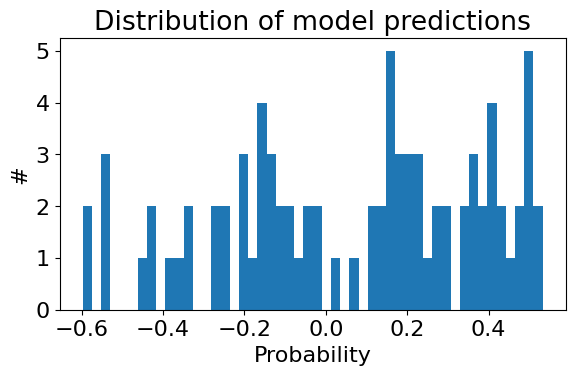

Model prediction min: -0.598
Model prediction max: 0.533


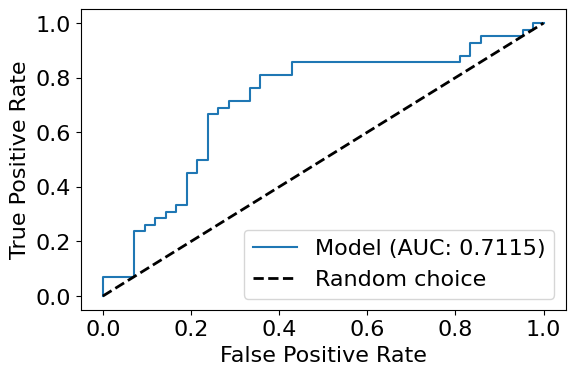

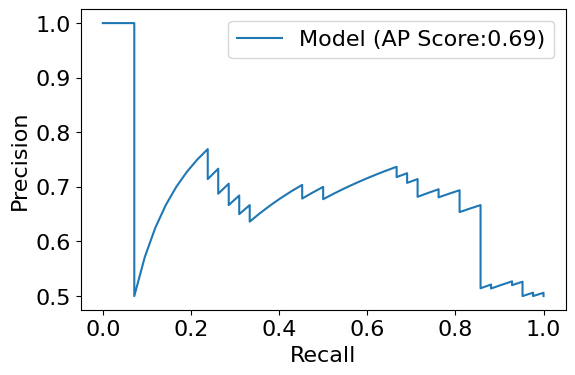

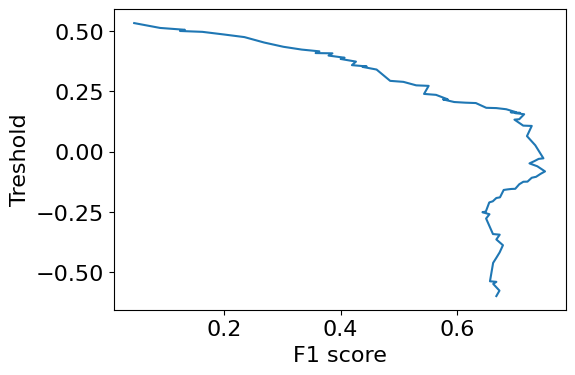

In [ ]:
evaluate(predictions_df['labels'], predictions_df['class_1_probability'], output_folder_path=evaluation_folder)

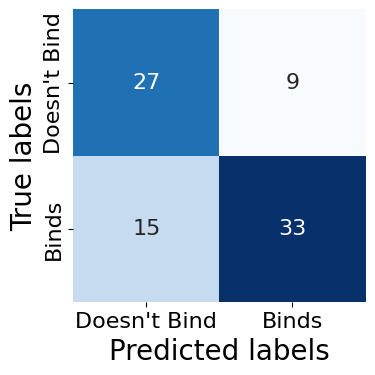

In [ ]:
confusion_matrix = np.array([[result['tn'], result['fn']], [result['fp'], result['tp']]])
plot_confusion_matrix(confusion_matrix, classes=["Doesn't Bind", "Binds"], title=None, percentage=False, font_size=16, figsize=(4,4), fig_output_path=None)

## Predicting

In [ ]:
# prediction for molecule from test set with label [0]
predictions, raw_outputs = model.predict(['c1ccc2c(c1)[nH]c1c3ccccc3sc21'])
print(predictions, raw_outputs)

0it [00:00, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

[0] [[ 0.06650013 -0.04920233]]


In [2]:
import pandas as pd
valid_df = pd.read_csv('/home/parsa/smiles_classification/data_validation.csv')
valid_df

,SMILES,RESULT
0,C=CC(=O)NC(=O)NC1(CC2CC3CC(C2)C1)C3,0
1,CC=1C=CC(=CC1)C(=O)C=2OC=CC2NC(=O)C=C,0
2,CN(C)C1=NC(Cl)=C(CNC(=O)C=C)S1,0
3,C=CC(=O)N1CN(CC=2C=CC=CC2)C(=O)C1,0
4,C=CC(=O)NCC(=O)N1CCC=2C=CC=CC2C1,0
5,CN(C)S(=O)(=O)C=1C=CC=2CN(CC2C1)C(=O)C=C,0
6,CN1N=CC=2C=CC(CNC(=O)C=C)=CC12,0
7,CC(NC(=O)C=C)C(=O)N1CCC=2C=CC=CC12,0
8,C=CC(=O)N1CCN(CC1)S(=O)(=O)CC=2C=CON2,0
9,C=CC(=O)NCC=1C=C2OCCCN2N1,0


In [4]:
pd.read_csv('/home/parsa/smiles_classification/Test-1.csv').rename({'Results':'RESULT'},axis=1)

,SMILES,RESULT
0,NC1=C2C(C=CC=C2)=C(S([O-])(=O)=O)C=C1/N=N/C(C=...,1
1,O=C(C1=C2C=CC=C1)C(SCCO)=C(SCCO)C2=O,1
2,NCCCNC(C=CC1=C2C(C3=C(C=CC(O)=C34)O)=NN1CCNCCO...,1
3,O=C(C1=CC(O)=C(O)C(O)=C1)O[C@H]2[C@@H](C3=CC(O...,1
4,O=C1C=C(C2=CC=CC=C2)OC3=C1C(O)=C(C(O)=C3)O,1
5,O=C(C=C(C1=CC=CC=C1)O2)C(C2=C3)=C(O)C(O)=C3O[C...,1
6,OC1=C(C2=CC=C(O)C(O)=C2)OC3=C(C(O)=CC(O)=C3)C1=O,1
7,C[C@@]12[C@@]3(C(COC(CC(C)C)=O)=O)[C@](O[C@H](...,1
8,OC1=C(SSC2=C(C=CC=C3)C3=CC=C2O)C4=CC=CC=C4C=C1,1
9,OC1=C(CC2=C(O)C(Cl)=CC(Cl)=C2Cl)C(Cl)=C(Cl)C=C1Cl,1


In [5]:
import os
from datetime import datetime

def list_files_with_creation_time(directory):
    # Get a list of files in the directory
    files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
    
    # Get creation times and sort files by this time
    files_with_times = []
    for file in files:
        file_path = os.path.join(directory, file)
        creation_time = os.path.getctime(file_path)
        files_with_times.append((file, creation_time))
    
    # Sort by creation time (newest first)
    files_with_times.sort(key=lambda x: x[1], reverse=True)
    
    # Display the sorted files with their creation times
    for file, ctime in files_with_times:
        formatted_time = datetime.fromtimestamp(ctime).strftime('%Y-%m-%d %H:%M:%S')
        print(f"{file} - Created on {formatted_time}")

# Specify the directory to list files from
directory_path = '/home/parsa/310/VAE/checkpoints/'  # Replace with your directory path

# List files with their creation times
list_files_with_creation_time(directory_path)


epoch=0-step=203984.ckpt - Created on 2024-07-27 17:41:23
epoch=2-step=611952-2channel_latest.ckpt - Created on 2024-07-17 15:34:56
simple_2channel.ckpt - Created on 2024-06-12 16:02:11
epoch=2-step=1084000.ckpt - Created on 2024-05-22 17:44:56
epoch=1-step=499000-correct.ckpt - Created on 2024-04-01 00:39:41
epoch=0-step=407000 copy.ckpt - Created on 2024-02-22 09:44:26
epoch=0-step=407000.ckpt - Created on 2024-02-08 14:30:49
epoch=0-step=100-v1.ckpt - Created on 2024-01-13 16:32:45
